In [2]:
import tensorflow

import pandas as pd
import numpy as np
import os
import keras
import random
import cv2
import math
import seaborn as sns

from sklearn.metrics import confusion_matrix
from sklearn.preprocessing import LabelBinarizer
from sklearn.model_selection import train_test_split

import matplotlib.pyplot as plt
%matplotlib inline

from tensorflow.keras.layers import Dense,GlobalAveragePooling2D,Convolution2D,BatchNormalization,Convolution2DTranspose
from tensorflow.keras.layers import Flatten,MaxPooling2D,Dropout

from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications.densenet import preprocess_input

from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import ImageDataGenerator,img_to_array

from tensorflow.keras.models import Model

from tensorflow.keras.optimizers import Adam

from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau

import warnings
#warnings.filterwarnings("ignore")

In [3]:
print("Tensorflow-version:", tensorflow.__version__)

Tensorflow-version: 2.13.0


In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [6]:
import zipfile
import os

data_dir = '/content/drive/MyDrive/Final Project/Final/dataset'

with zipfile.ZipFile(data_dir + '.zip', 'r') as zip_ref:
    zip_ref.extractall('/tmp/image_dataset/2')

data_dir = '/tmp/image_dataset/2'

In [7]:
path = data_dir
def create_training_data(path):
  dataX=[]
  dataY=[]
  # enumerate filenames in directory, assume all are images
  for root, subdirs, files in os.walk(path+"/dataset/neutral/"):
    #print(root, subdirs, files)
    for filename in files:
      file_path = os.path.join(root, filename)
      #print(file_path)
      file_path = file_path.replace('\\', '/')
      img_array=cv2.imread(file_path)
      print("neutral--"+file_path)
      #print(len(np.array(img_array)))
      new_array=cv2.resize(img_array,(128,64))
      dataX.append(new_array)
  # enumerate filenames in directory, assume all are images
  for root, subdirs, files in os.walk(path+"/dataset/smile/"):
    for filename in files:
      file_path = os.path.join(root, filename)
      file_path = file_path.replace('\\', '/')
      img_array=cv2.imread(file_path)
      print("smile--"+file_path)
      #print(img_array)
      new_array=cv2.resize(img_array,(128,64))
      dataY.append(new_array)
  return dataX,dataY

In [8]:
IMG_SIZE = 128
dataX,dataY = create_training_data(path)
#dataX,dataY

neutral--/tmp/image_dataset/2/dataset/neutral/34.jpg
neutral--/tmp/image_dataset/2/dataset/neutral/376.jpg
neutral--/tmp/image_dataset/2/dataset/neutral/54.jpg
neutral--/tmp/image_dataset/2/dataset/neutral/25.jpg
neutral--/tmp/image_dataset/2/dataset/neutral/92.jpg
neutral--/tmp/image_dataset/2/dataset/neutral/90.jpg
neutral--/tmp/image_dataset/2/dataset/neutral/11.jpg
neutral--/tmp/image_dataset/2/dataset/neutral/14.jpg
neutral--/tmp/image_dataset/2/dataset/neutral/272.jpg
neutral--/tmp/image_dataset/2/dataset/neutral/97.jpg
neutral--/tmp/image_dataset/2/dataset/neutral/96.jpg
neutral--/tmp/image_dataset/2/dataset/neutral/275.jpg
neutral--/tmp/image_dataset/2/dataset/neutral/278.jpg
neutral--/tmp/image_dataset/2/dataset/neutral/106.jpg
neutral--/tmp/image_dataset/2/dataset/neutral/211.jpg
neutral--/tmp/image_dataset/2/dataset/neutral/33.jpg
neutral--/tmp/image_dataset/2/dataset/neutral/339.jpg
neutral--/tmp/image_dataset/2/dataset/neutral/308.jpg
neutral--/tmp/image_dataset/2/dataset/

In [9]:
(np.array(dataX[0])).shape

(64, 128, 3)

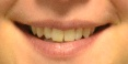

In [10]:
from google.colab.patches import cv2_imshow
cv2_imshow(dataY[0])

In [11]:
print("Tensorflow-version:", tensorflow.__version__)

Tensorflow-version: 2.13.0


In [12]:
model_d=ResNet50(weights='imagenet',include_top=False, input_shape=(64, 128, 3))

x=model_d.output

x = Convolution2DTranspose(512,kernel_size=(4, 4), strides=(2, 2), use_bias=False, padding = "same")(x)
x = Convolution2DTranspose(256,kernel_size=(4, 4), strides=(2, 2), use_bias=False, padding = "same")(x)
x = Convolution2DTranspose(256,kernel_size=(4, 4), strides=(2, 2), use_bias=False, padding = "same")(x)
x = Convolution2DTranspose(128,kernel_size=(4, 4), strides=(2, 2), use_bias=False, padding = "same")(x)
#x= GlobalAveragePooling2D()(x)
#x= BatchNormalization()(x)
#x= Dropout(0.5)(x)
#x= Dense(1024,activation='relu')(x)
#x= Dense(512,activation='relu')(x)
#x= BatchNormalization()(x)
#x= Dropout(0.5)(x)

preds=Convolution2DTranspose(3,kernel_size=(4, 4), strides=(2, 2), use_bias=False, padding = "same")(x) #FC-layer

94765736/94765736 [==============================] - 0s 0us/step


In [13]:
model=Model(inputs=model_d.input,outputs=preds)

for layer in model.layers[:-8]:
    layer.trainable=False

for layer in model.layers[-8:]:
    layer.trainable=True

# use tensorflow.keras.losses.KLDivergence() for KL-Div loss function
model.compile(optimizer='Adam',loss='mae',metrics=['accuracy'])
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, 64, 128, 3)]         0         []                            
                                                                                                  
 conv1_pad (ZeroPadding2D)   (None, 70, 134, 3)           0         ['input_1[0][0]']             
                                                                                                  
 conv1_conv (Conv2D)         (None, 32, 64, 64)           9472      ['conv1_pad[0][0]']           
                                                                                                  
 conv1_bn (BatchNormalizati  (None, 32, 64, 64)           256       ['conv1_conv[0][0]']          
 on)                                                                                          

In [14]:
dataX = np.array(dataX, dtype="float32") / 255.0
dataY = np.array(dataY, dtype="float32") / 255.0

In [15]:
(xtrain,xtest,ytrain,ytest)=train_test_split(dataX,dataY,test_size=0.2,random_state=42)
print(xtrain.shape, xtest.shape, ytrain.shape, ytest.shape)

(157, 64, 128, 3) (40, 64, 128, 3) (157, 64, 128, 3) (40, 64, 128, 3)


In [19]:
anne = ReduceLROnPlateau(monitor='val_accuracy', factor=0.5, patience=5, verbose=1, min_lr=1e-3)
model_path = "/content/drive/MyDrive/Final Project/Pavani/dataset/Resnet-mae/model.h5"
checkpoint_path = "/content/drive/MyDrive/Final Project/Pavani/dataset/Resnet-mae/checkpoint.ckpt"
checkpoint = ModelCheckpoint(model_path, verbose=1, save_best_only=True)

In [ ]:
#skip
datagen = ImageDataGenerator(zoom_range = 0.2, horizontal_flip=True, shear_range=0.2)
datagen.fit(xtrain)
# Fits-the-model

history = model.fit(xtrain,ytrain, batch_size=16,
               steps_per_epoch=xtrain.shape[0]//16,
               epochs=15000,
               verbose=2,
               callbacks=[anne, checkpoint],
               validation_split = 0.1,
               validation_steps = xtest.shape[0]//16)

Epoch 1/15000



Epoch 1: val_loss improved from inf to 0.40231, saving model to /content/drive/MyDrive/smile_dataset/RM/dataset/DenseNet/model.h5


/usr/local/lib/python3.10/dist-packages/keras/src/engine/training.py:3000: UserWarning: You are saving your model as an HDF5 file via `model.save()`. This file format is considered legacy. We recommend using instead the native Keras format, e.g. `model.save('my_model.keras')`.
  saving_api.save_model(


9/9 - 21s - loss: 0.5792 - accuracy: 0.3955 - val_loss: 0.4023 - val_accuracy: 0.3234 - lr: 0.0010 - 21s/epoch - 2s/step
Epoch 2/15000


9/9 - 1s - loss: 0.3409 - accuracy: 0.5083 - lr: 0.0010 - 588ms/epoch - 65ms/step
Epoch 3/15000


9/9 - 0s - loss: 0.3222 - accuracy: 0.5523 - lr: 0.0010 - 478ms/epoch - 53ms/step
Epoch 4/15000


9/9 - 0s - loss: 0.2507 - accuracy: 0.7173 - lr: 0.0010 - 473ms/epoch - 53ms/step
Epoch 5/15000


9/9 - 0s - loss: 0.1590 - accuracy: 0.8249 - lr: 0.0010 - 472ms/epoch - 52ms/step
Epoch 6/15000


9/9 - 0s - loss: 0.1459 - accuracy: 0.9185 - lr: 0.0010 - 475ms/epoch - 53ms/step
Epoch 7/15000


9/9 - 0s - loss: 0.1377 - accuracy: 0.9629 - lr: 0.0010 - 474ms/epoch - 53ms/step
Epoch 8/15000


9/9 - 0s - loss: 0.1267 - accuracy: 0.9752 - lr: 0.0010 - 480ms/epoch - 53ms/step
Epoch 9/15000


9/9 - 0s - loss: 0.1140 - accuracy: 0.9866 - lr: 0.0010 - 480ms/epoch - 53ms/step
Epoch 10/15000


9/9 - 0s - loss: 0.1200 - accuracy: 0.9894 - lr: 0.0010 - 482ms/epoch - 54ms/step
Epoch 11/15000


9/9 - 0s - loss: 0.1118 - accuracy: 0.9916 - lr: 0.0010 - 477ms/epoch - 53ms/step
Epoch 12/15000


9/9 - 0s - loss: 0.1120 - accuracy: 0.9924 - lr: 0.0010 - 477ms/epoch - 53ms/step
Epoch 13/15000


9/9 - 0s - loss: 0.1050 - accuracy: 0.9929 - lr: 0.0010 - 476ms/epoch - 53ms/step
Epoch 14/15000


9/9 - 0s - loss: 0.0969 - accuracy: 0.9929 - lr: 0.0010 - 476ms/epoch - 53ms/step
Epoch 15/15000


9/9 - 0s - loss: 0.1032 - accuracy: 0.9926 - lr: 0.0010 - 474ms/epoch - 53ms/step
Epoch 16/15000


9/9 - 0s - loss: 0.1156 - accuracy: 0.9929 - lr: 0.0010 - 476ms/epoch - 53ms/step
Epoch 17/15000


9/9 - 0s - loss: 0.1114 - accuracy: 0.9930 - lr: 0.0010 - 475ms/epoch - 53ms/step
Epoch 18/15000


9/9 - 0s - loss: 0.1036 - accuracy: 0.9930 - lr: 0.0010 - 482ms/epoch - 54ms/step
Epoch 19/15000


9/9 - 0s - loss: 0.1152 - accuracy: 0.9930 - lr: 0.0010 - 476ms/epoch - 53ms/step
Epoch 20/15000


9/9 - 1s - loss: 0.1155 - accuracy: 0.9929 - lr: 0.0010 - 503ms/epoch - 56ms/step
Epoch 21/15000


9/9 - 1s - loss: 0.0921 - accuracy: 0.9930 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 22/15000


9/9 - 1s - loss: 0.0911 - accuracy: 0.9931 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 23/15000


9/9 - 1s - loss: 0.0911 - accuracy: 0.9930 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 24/15000


9/9 - 1s - loss: 0.0865 - accuracy: 0.9930 - lr: 0.0010 - 583ms/epoch - 65ms/step
Epoch 25/15000


9/9 - 1s - loss: 0.0857 - accuracy: 0.9930 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 26/15000


9/9 - 1s - loss: 0.0929 - accuracy: 0.9930 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 27/15000


9/9 - 0s - loss: 0.0991 - accuracy: 0.9930 - lr: 0.0010 - 493ms/epoch - 55ms/step
Epoch 28/15000


9/9 - 0s - loss: 0.0993 - accuracy: 0.9931 - lr: 0.0010 - 495ms/epoch - 55ms/step
Epoch 29/15000


9/9 - 1s - loss: 0.0922 - accuracy: 0.9930 - lr: 0.0010 - 502ms/epoch - 56ms/step
Epoch 30/15000


9/9 - 0s - loss: 0.0847 - accuracy: 0.9931 - lr: 0.0010 - 487ms/epoch - 54ms/step
Epoch 31/15000


9/9 - 0s - loss: 0.0827 - accuracy: 0.9931 - lr: 0.0010 - 489ms/epoch - 54ms/step
Epoch 32/15000


9/9 - 0s - loss: 0.0903 - accuracy: 0.9931 - lr: 0.0010 - 480ms/epoch - 53ms/step
Epoch 33/15000


9/9 - 0s - loss: 0.0803 - accuracy: 0.9931 - lr: 0.0010 - 488ms/epoch - 54ms/step
Epoch 34/15000


9/9 - 0s - loss: 0.0799 - accuracy: 0.9931 - lr: 0.0010 - 489ms/epoch - 54ms/step
Epoch 35/15000


9/9 - 0s - loss: 0.0793 - accuracy: 0.9931 - lr: 0.0010 - 486ms/epoch - 54ms/step
Epoch 36/15000


9/9 - 0s - loss: 0.0827 - accuracy: 0.9931 - lr: 0.0010 - 481ms/epoch - 53ms/step
Epoch 37/15000


9/9 - 0s - loss: 0.0924 - accuracy: 0.9931 - lr: 0.0010 - 485ms/epoch - 54ms/step
Epoch 38/15000


9/9 - 0s - loss: 0.0888 - accuracy: 0.9931 - lr: 0.0010 - 481ms/epoch - 53ms/step
Epoch 39/15000


9/9 - 0s - loss: 0.0851 - accuracy: 0.9930 - lr: 0.0010 - 486ms/epoch - 54ms/step
Epoch 40/15000


9/9 - 0s - loss: 0.0861 - accuracy: 0.9931 - lr: 0.0010 - 491ms/epoch - 55ms/step
Epoch 41/15000


9/9 - 0s - loss: 0.0872 - accuracy: 0.9931 - lr: 0.0010 - 484ms/epoch - 54ms/step
Epoch 42/15000


9/9 - 0s - loss: 0.0847 - accuracy: 0.9931 - lr: 0.0010 - 478ms/epoch - 53ms/step
Epoch 43/15000


9/9 - 0s - loss: 0.0784 - accuracy: 0.9932 - lr: 0.0010 - 483ms/epoch - 54ms/step
Epoch 44/15000


9/9 - 0s - loss: 0.0860 - accuracy: 0.9929 - lr: 0.0010 - 481ms/epoch - 53ms/step
Epoch 45/15000


9/9 - 0s - loss: 0.0797 - accuracy: 0.9930 - lr: 0.0010 - 483ms/epoch - 54ms/step
Epoch 46/15000


9/9 - 0s - loss: 0.0968 - accuracy: 0.9923 - lr: 0.0010 - 482ms/epoch - 54ms/step
Epoch 47/15000


9/9 - 1s - loss: 0.1019 - accuracy: 0.9930 - lr: 0.0010 - 511ms/epoch - 57ms/step
Epoch 48/15000


9/9 - 1s - loss: 0.0967 - accuracy: 0.9902 - lr: 0.0010 - 516ms/epoch - 57ms/step
Epoch 49/15000


9/9 - 1s - loss: 0.0793 - accuracy: 0.9931 - lr: 0.0010 - 513ms/epoch - 57ms/step
Epoch 50/15000


9/9 - 1s - loss: 0.0788 - accuracy: 0.9930 - lr: 0.0010 - 509ms/epoch - 57ms/step
Epoch 51/15000


9/9 - 1s - loss: 0.0825 - accuracy: 0.9931 - lr: 0.0010 - 512ms/epoch - 57ms/step
Epoch 52/15000


9/9 - 1s - loss: 0.0798 - accuracy: 0.9931 - lr: 0.0010 - 821ms/epoch - 91ms/step
Epoch 53/15000


9/9 - 1s - loss: 0.0929 - accuracy: 0.9926 - lr: 0.0010 - 579ms/epoch - 64ms/step
Epoch 54/15000


9/9 - 1s - loss: 0.0861 - accuracy: 0.9891 - lr: 0.0010 - 519ms/epoch - 58ms/step
Epoch 55/15000


9/9 - 1s - loss: 0.0897 - accuracy: 0.9919 - lr: 0.0010 - 590ms/epoch - 66ms/step
Epoch 56/15000


9/9 - 1s - loss: 0.0924 - accuracy: 0.9927 - lr: 0.0010 - 501ms/epoch - 56ms/step
Epoch 57/15000


9/9 - 0s - loss: 0.0928 - accuracy: 0.9924 - lr: 0.0010 - 487ms/epoch - 54ms/step
Epoch 58/15000


9/9 - 0s - loss: 0.0872 - accuracy: 0.9929 - lr: 0.0010 - 486ms/epoch - 54ms/step
Epoch 59/15000


9/9 - 0s - loss: 0.0801 - accuracy: 0.9930 - lr: 0.0010 - 485ms/epoch - 54ms/step
Epoch 60/15000


9/9 - 0s - loss: 0.0913 - accuracy: 0.9931 - lr: 0.0010 - 487ms/epoch - 54ms/step
Epoch 61/15000


9/9 - 0s - loss: 0.0766 - accuracy: 0.9932 - lr: 0.0010 - 481ms/epoch - 53ms/step
Epoch 62/15000


9/9 - 0s - loss: 0.0832 - accuracy: 0.9930 - lr: 0.0010 - 485ms/epoch - 54ms/step
Epoch 63/15000


9/9 - 0s - loss: 0.0766 - accuracy: 0.9931 - lr: 0.0010 - 486ms/epoch - 54ms/step
Epoch 64/15000


9/9 - 0s - loss: 0.0773 - accuracy: 0.9931 - lr: 0.0010 - 484ms/epoch - 54ms/step
Epoch 65/15000


9/9 - 0s - loss: 0.0825 - accuracy: 0.9930 - lr: 0.0010 - 484ms/epoch - 54ms/step
Epoch 66/15000


9/9 - 0s - loss: 0.0992 - accuracy: 0.9930 - lr: 0.0010 - 484ms/epoch - 54ms/step
Epoch 67/15000


9/9 - 0s - loss: 0.0876 - accuracy: 0.9911 - lr: 0.0010 - 491ms/epoch - 55ms/step
Epoch 68/15000


9/9 - 0s - loss: 0.0785 - accuracy: 0.9930 - lr: 0.0010 - 488ms/epoch - 54ms/step
Epoch 69/15000


9/9 - 0s - loss: 0.0781 - accuracy: 0.9915 - lr: 0.0010 - 486ms/epoch - 54ms/step
Epoch 70/15000


9/9 - 0s - loss: 0.0887 - accuracy: 0.9931 - lr: 0.0010 - 486ms/epoch - 54ms/step
Epoch 71/15000


9/9 - 0s - loss: 0.0832 - accuracy: 0.9926 - lr: 0.0010 - 487ms/epoch - 54ms/step
Epoch 72/15000


9/9 - 0s - loss: 0.0759 - accuracy: 0.9930 - lr: 0.0010 - 489ms/epoch - 54ms/step
Epoch 73/15000


9/9 - 1s - loss: 0.0773 - accuracy: 0.9931 - lr: 0.0010 - 507ms/epoch - 56ms/step
Epoch 74/15000


9/9 - 1s - loss: 0.0715 - accuracy: 0.9930 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 75/15000


9/9 - 1s - loss: 0.0717 - accuracy: 0.9931 - lr: 0.0010 - 511ms/epoch - 57ms/step
Epoch 76/15000


9/9 - 1s - loss: 0.0690 - accuracy: 0.9931 - lr: 0.0010 - 511ms/epoch - 57ms/step
Epoch 77/15000


9/9 - 1s - loss: 0.0680 - accuracy: 0.9932 - lr: 0.0010 - 514ms/epoch - 57ms/step
Epoch 78/15000


9/9 - 1s - loss: 0.0678 - accuracy: 0.9931 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 79/15000


9/9 - 1s - loss: 0.0679 - accuracy: 0.9932 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 80/15000


9/9 - 1s - loss: 0.0711 - accuracy: 0.9932 - lr: 0.0010 - 503ms/epoch - 56ms/step
Epoch 81/15000


9/9 - 0s - loss: 0.0738 - accuracy: 0.9929 - lr: 0.0010 - 495ms/epoch - 55ms/step
Epoch 82/15000


9/9 - 0s - loss: 0.0699 - accuracy: 0.9932 - lr: 0.0010 - 494ms/epoch - 55ms/step
Epoch 83/15000


9/9 - 0s - loss: 0.0695 - accuracy: 0.9931 - lr: 0.0010 - 486ms/epoch - 54ms/step
Epoch 84/15000


9/9 - 0s - loss: 0.0693 - accuracy: 0.9927 - lr: 0.0010 - 489ms/epoch - 54ms/step
Epoch 85/15000


9/9 - 0s - loss: 0.0707 - accuracy: 0.9931 - lr: 0.0010 - 489ms/epoch - 54ms/step
Epoch 86/15000


9/9 - 0s - loss: 0.0732 - accuracy: 0.9927 - lr: 0.0010 - 488ms/epoch - 54ms/step
Epoch 87/15000


9/9 - 0s - loss: 0.0690 - accuracy: 0.9930 - lr: 0.0010 - 489ms/epoch - 54ms/step
Epoch 88/15000


9/9 - 0s - loss: 0.0672 - accuracy: 0.9928 - lr: 0.0010 - 492ms/epoch - 55ms/step
Epoch 89/15000


9/9 - 0s - loss: 0.0719 - accuracy: 0.9931 - lr: 0.0010 - 490ms/epoch - 54ms/step
Epoch 90/15000


9/9 - 0s - loss: 0.0767 - accuracy: 0.9930 - lr: 0.0010 - 489ms/epoch - 54ms/step
Epoch 91/15000


9/9 - 0s - loss: 0.0647 - accuracy: 0.9931 - lr: 0.0010 - 489ms/epoch - 54ms/step
Epoch 92/15000


9/9 - 0s - loss: 0.0696 - accuracy: 0.9930 - lr: 0.0010 - 490ms/epoch - 54ms/step
Epoch 93/15000


9/9 - 1s - loss: 0.0870 - accuracy: 0.9931 - lr: 0.0010 - 502ms/epoch - 56ms/step
Epoch 94/15000


9/9 - 0s - loss: 0.0859 - accuracy: 0.9930 - lr: 0.0010 - 492ms/epoch - 55ms/step
Epoch 95/15000


9/9 - 0s - loss: 0.0758 - accuracy: 0.9930 - lr: 0.0010 - 495ms/epoch - 55ms/step
Epoch 96/15000


9/9 - 0s - loss: 0.0790 - accuracy: 0.9916 - lr: 0.0010 - 489ms/epoch - 54ms/step
Epoch 97/15000


9/9 - 0s - loss: 0.0679 - accuracy: 0.9930 - lr: 0.0010 - 493ms/epoch - 55ms/step
Epoch 98/15000


9/9 - 0s - loss: 0.0651 - accuracy: 0.9931 - lr: 0.0010 - 497ms/epoch - 55ms/step
Epoch 99/15000


9/9 - 0s - loss: 0.0780 - accuracy: 0.9930 - lr: 0.0010 - 496ms/epoch - 55ms/step
Epoch 100/15000


9/9 - 1s - loss: 0.0827 - accuracy: 0.9919 - lr: 0.0010 - 507ms/epoch - 56ms/step
Epoch 101/15000


9/9 - 1s - loss: 0.0676 - accuracy: 0.9927 - lr: 0.0010 - 520ms/epoch - 58ms/step
Epoch 102/15000


9/9 - 1s - loss: 0.0638 - accuracy: 0.9931 - lr: 0.0010 - 519ms/epoch - 58ms/step
Epoch 103/15000


9/9 - 1s - loss: 0.0645 - accuracy: 0.9931 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 104/15000


9/9 - 1s - loss: 0.0645 - accuracy: 0.9931 - lr: 0.0010 - 519ms/epoch - 58ms/step
Epoch 105/15000


9/9 - 1s - loss: 0.0869 - accuracy: 0.9927 - lr: 0.0010 - 512ms/epoch - 57ms/step
Epoch 106/15000


9/9 - 1s - loss: 0.0775 - accuracy: 0.9930 - lr: 0.0010 - 520ms/epoch - 58ms/step
Epoch 107/15000


9/9 - 1s - loss: 0.0702 - accuracy: 0.9921 - lr: 0.0010 - 505ms/epoch - 56ms/step
Epoch 108/15000


9/9 - 0s - loss: 0.0747 - accuracy: 0.9931 - lr: 0.0010 - 493ms/epoch - 55ms/step
Epoch 109/15000


9/9 - 0s - loss: 0.0757 - accuracy: 0.9928 - lr: 0.0010 - 498ms/epoch - 55ms/step
Epoch 110/15000


9/9 - 0s - loss: 0.0803 - accuracy: 0.9922 - lr: 0.0010 - 498ms/epoch - 55ms/step
Epoch 111/15000


9/9 - 0s - loss: 0.0715 - accuracy: 0.9927 - lr: 0.0010 - 492ms/epoch - 55ms/step
Epoch 112/15000


9/9 - 0s - loss: 0.0695 - accuracy: 0.9928 - lr: 0.0010 - 496ms/epoch - 55ms/step
Epoch 113/15000


9/9 - 0s - loss: 0.0636 - accuracy: 0.9930 - lr: 0.0010 - 495ms/epoch - 55ms/step
Epoch 114/15000


9/9 - 0s - loss: 0.0643 - accuracy: 0.9931 - lr: 0.0010 - 498ms/epoch - 55ms/step
Epoch 115/15000


9/9 - 0s - loss: 0.0625 - accuracy: 0.9931 - lr: 0.0010 - 497ms/epoch - 55ms/step
Epoch 116/15000


9/9 - 0s - loss: 0.0626 - accuracy: 0.9929 - lr: 0.0010 - 494ms/epoch - 55ms/step
Epoch 117/15000


9/9 - 0s - loss: 0.0631 - accuracy: 0.9920 - lr: 0.0010 - 495ms/epoch - 55ms/step
Epoch 118/15000


9/9 - 1s - loss: 0.0626 - accuracy: 0.9931 - lr: 0.0010 - 503ms/epoch - 56ms/step
Epoch 119/15000


9/9 - 0s - loss: 0.0667 - accuracy: 0.9930 - lr: 0.0010 - 496ms/epoch - 55ms/step
Epoch 120/15000


9/9 - 0s - loss: 0.0690 - accuracy: 0.9931 - lr: 0.0010 - 493ms/epoch - 55ms/step
Epoch 121/15000


9/9 - 0s - loss: 0.0671 - accuracy: 0.9928 - lr: 0.0010 - 500ms/epoch - 56ms/step
Epoch 122/15000


9/9 - 0s - loss: 0.0676 - accuracy: 0.9931 - lr: 0.0010 - 496ms/epoch - 55ms/step
Epoch 123/15000


9/9 - 0s - loss: 0.0616 - accuracy: 0.9931 - lr: 0.0010 - 493ms/epoch - 55ms/step
Epoch 124/15000


9/9 - 0s - loss: 0.0665 - accuracy: 0.9929 - lr: 0.0010 - 493ms/epoch - 55ms/step
Epoch 125/15000


9/9 - 1s - loss: 0.0800 - accuracy: 0.9913 - lr: 0.0010 - 506ms/epoch - 56ms/step
Epoch 126/15000


9/9 - 1s - loss: 0.0632 - accuracy: 0.9928 - lr: 0.0010 - 500ms/epoch - 56ms/step
Epoch 127/15000


9/9 - 1s - loss: 0.0693 - accuracy: 0.9927 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 128/15000


9/9 - 1s - loss: 0.0640 - accuracy: 0.9931 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 129/15000


9/9 - 1s - loss: 0.0612 - accuracy: 0.9931 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 130/15000


9/9 - 1s - loss: 0.0659 - accuracy: 0.9930 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 131/15000


9/9 - 1s - loss: 0.0621 - accuracy: 0.9931 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 132/15000


9/9 - 1s - loss: 0.0615 - accuracy: 0.9931 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 133/15000


9/9 - 1s - loss: 0.0661 - accuracy: 0.9931 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 134/15000


9/9 - 1s - loss: 0.0604 - accuracy: 0.9922 - lr: 0.0010 - 509ms/epoch - 57ms/step
Epoch 135/15000


9/9 - 0s - loss: 0.0618 - accuracy: 0.9930 - lr: 0.0010 - 494ms/epoch - 55ms/step
Epoch 136/15000


9/9 - 0s - loss: 0.0583 - accuracy: 0.9931 - lr: 0.0010 - 495ms/epoch - 55ms/step
Epoch 137/15000


9/9 - 0s - loss: 0.0617 - accuracy: 0.9929 - lr: 0.0010 - 496ms/epoch - 55ms/step
Epoch 138/15000


9/9 - 0s - loss: 0.0655 - accuracy: 0.9926 - lr: 0.0010 - 493ms/epoch - 55ms/step
Epoch 139/15000


9/9 - 0s - loss: 0.0659 - accuracy: 0.9929 - lr: 0.0010 - 497ms/epoch - 55ms/step
Epoch 140/15000


9/9 - 1s - loss: 0.0606 - accuracy: 0.9931 - lr: 0.0010 - 502ms/epoch - 56ms/step
Epoch 141/15000


9/9 - 0s - loss: 0.0591 - accuracy: 0.9930 - lr: 0.0010 - 498ms/epoch - 55ms/step
Epoch 142/15000


9/9 - 0s - loss: 0.0570 - accuracy: 0.9931 - lr: 0.0010 - 496ms/epoch - 55ms/step
Epoch 143/15000


9/9 - 0s - loss: 0.0595 - accuracy: 0.9931 - lr: 0.0010 - 495ms/epoch - 55ms/step
Epoch 144/15000


9/9 - 0s - loss: 0.0555 - accuracy: 0.9933 - lr: 0.0010 - 496ms/epoch - 55ms/step
Epoch 145/15000


9/9 - 0s - loss: 0.0558 - accuracy: 0.9931 - lr: 0.0010 - 491ms/epoch - 55ms/step
Epoch 146/15000


9/9 - 0s - loss: 0.0573 - accuracy: 0.9932 - lr: 0.0010 - 495ms/epoch - 55ms/step
Epoch 147/15000


9/9 - 0s - loss: 0.0548 - accuracy: 0.9929 - lr: 0.0010 - 498ms/epoch - 55ms/step
Epoch 148/15000


9/9 - 0s - loss: 0.0559 - accuracy: 0.9927 - lr: 0.0010 - 499ms/epoch - 55ms/step
Epoch 149/15000


9/9 - 1s - loss: 0.0554 - accuracy: 0.9926 - lr: 0.0010 - 501ms/epoch - 56ms/step
Epoch 150/15000


9/9 - 0s - loss: 0.0570 - accuracy: 0.9931 - lr: 0.0010 - 497ms/epoch - 55ms/step
Epoch 151/15000


9/9 - 0s - loss: 0.0532 - accuracy: 0.9931 - lr: 0.0010 - 495ms/epoch - 55ms/step
Epoch 152/15000


9/9 - 0s - loss: 0.0542 - accuracy: 0.9932 - lr: 0.0010 - 495ms/epoch - 55ms/step
Epoch 153/15000


9/9 - 0s - loss: 0.0545 - accuracy: 0.9931 - lr: 0.0010 - 497ms/epoch - 55ms/step
Epoch 154/15000


9/9 - 1s - loss: 0.0601 - accuracy: 0.9929 - lr: 0.0010 - 515ms/epoch - 57ms/step
Epoch 155/15000


9/9 - 1s - loss: 0.0595 - accuracy: 0.9932 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 156/15000


9/9 - 1s - loss: 0.0597 - accuracy: 0.9928 - lr: 0.0010 - 515ms/epoch - 57ms/step
Epoch 157/15000


9/9 - 1s - loss: 0.0579 - accuracy: 0.9932 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 158/15000


9/9 - 1s - loss: 0.0609 - accuracy: 0.9930 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 159/15000


9/9 - 1s - loss: 0.0593 - accuracy: 0.9930 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 160/15000


9/9 - 1s - loss: 0.0662 - accuracy: 0.9930 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 161/15000


9/9 - 0s - loss: 0.0636 - accuracy: 0.9917 - lr: 0.0010 - 499ms/epoch - 55ms/step
Epoch 162/15000


9/9 - 1s - loss: 0.0713 - accuracy: 0.9929 - lr: 0.0010 - 500ms/epoch - 56ms/step
Epoch 163/15000


9/9 - 1s - loss: 0.0877 - accuracy: 0.9899 - lr: 0.0010 - 500ms/epoch - 56ms/step
Epoch 164/15000


9/9 - 0s - loss: 0.0725 - accuracy: 0.9918 - lr: 0.0010 - 499ms/epoch - 55ms/step
Epoch 165/15000


9/9 - 1s - loss: 0.0676 - accuracy: 0.9926 - lr: 0.0010 - 502ms/epoch - 56ms/step
Epoch 166/15000


9/9 - 1s - loss: 0.0674 - accuracy: 0.9924 - lr: 0.0010 - 501ms/epoch - 56ms/step
Epoch 167/15000


9/9 - 1s - loss: 0.0596 - accuracy: 0.9930 - lr: 0.0010 - 502ms/epoch - 56ms/step
Epoch 168/15000


9/9 - 0s - loss: 0.0581 - accuracy: 0.9927 - lr: 0.0010 - 496ms/epoch - 55ms/step
Epoch 169/15000


9/9 - 1s - loss: 0.0554 - accuracy: 0.9931 - lr: 0.0010 - 506ms/epoch - 56ms/step
Epoch 170/15000


9/9 - 0s - loss: 0.0546 - accuracy: 0.9928 - lr: 0.0010 - 497ms/epoch - 55ms/step
Epoch 171/15000


9/9 - 0s - loss: 0.0552 - accuracy: 0.9929 - lr: 0.0010 - 499ms/epoch - 55ms/step
Epoch 172/15000


9/9 - 1s - loss: 0.0587 - accuracy: 0.9930 - lr: 0.0010 - 502ms/epoch - 56ms/step
Epoch 173/15000


9/9 - 1s - loss: 0.0554 - accuracy: 0.9931 - lr: 0.0010 - 505ms/epoch - 56ms/step
Epoch 174/15000


9/9 - 0s - loss: 0.0529 - accuracy: 0.9931 - lr: 0.0010 - 495ms/epoch - 55ms/step
Epoch 175/15000


9/9 - 1s - loss: 0.0552 - accuracy: 0.9931 - lr: 0.0010 - 504ms/epoch - 56ms/step
Epoch 176/15000


9/9 - 0s - loss: 0.0605 - accuracy: 0.9931 - lr: 0.0010 - 499ms/epoch - 55ms/step
Epoch 177/15000


9/9 - 1s - loss: 0.0570 - accuracy: 0.9930 - lr: 0.0010 - 502ms/epoch - 56ms/step
Epoch 178/15000


9/9 - 1s - loss: 0.0588 - accuracy: 0.9931 - lr: 0.0010 - 503ms/epoch - 56ms/step
Epoch 179/15000


9/9 - 1s - loss: 0.0591 - accuracy: 0.9916 - lr: 0.0010 - 502ms/epoch - 56ms/step
Epoch 180/15000


9/9 - 1s - loss: 0.0569 - accuracy: 0.9931 - lr: 0.0010 - 513ms/epoch - 57ms/step
Epoch 181/15000


9/9 - 1s - loss: 0.0535 - accuracy: 0.9931 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 182/15000


9/9 - 1s - loss: 0.0522 - accuracy: 0.9932 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 183/15000


9/9 - 1s - loss: 0.0510 - accuracy: 0.9932 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 184/15000


9/9 - 1s - loss: 0.0546 - accuracy: 0.9931 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 185/15000


9/9 - 1s - loss: 0.0587 - accuracy: 0.9929 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 186/15000


9/9 - 1s - loss: 0.0574 - accuracy: 0.9930 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 187/15000


9/9 - 1s - loss: 0.0539 - accuracy: 0.9925 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 188/15000


9/9 - 1s - loss: 0.0523 - accuracy: 0.9928 - lr: 0.0010 - 504ms/epoch - 56ms/step
Epoch 189/15000


9/9 - 0s - loss: 0.0519 - accuracy: 0.9931 - lr: 0.0010 - 500ms/epoch - 56ms/step
Epoch 190/15000


9/9 - 1s - loss: 0.0530 - accuracy: 0.9932 - lr: 0.0010 - 506ms/epoch - 56ms/step
Epoch 191/15000


9/9 - 1s - loss: 0.0505 - accuracy: 0.9930 - lr: 0.0010 - 505ms/epoch - 56ms/step
Epoch 192/15000


9/9 - 1s - loss: 0.0502 - accuracy: 0.9932 - lr: 0.0010 - 504ms/epoch - 56ms/step
Epoch 193/15000


9/9 - 1s - loss: 0.0524 - accuracy: 0.9930 - lr: 0.0010 - 507ms/epoch - 56ms/step
Epoch 194/15000


9/9 - 0s - loss: 0.0518 - accuracy: 0.9930 - lr: 0.0010 - 500ms/epoch - 56ms/step
Epoch 195/15000


9/9 - 1s - loss: 0.0587 - accuracy: 0.9930 - lr: 0.0010 - 506ms/epoch - 56ms/step
Epoch 196/15000


9/9 - 1s - loss: 0.0541 - accuracy: 0.9930 - lr: 0.0010 - 513ms/epoch - 57ms/step
Epoch 197/15000


9/9 - 1s - loss: 0.0546 - accuracy: 0.9926 - lr: 0.0010 - 509ms/epoch - 57ms/step
Epoch 198/15000


9/9 - 1s - loss: 0.0522 - accuracy: 0.9932 - lr: 0.0010 - 504ms/epoch - 56ms/step
Epoch 199/15000


9/9 - 1s - loss: 0.0512 - accuracy: 0.9932 - lr: 0.0010 - 513ms/epoch - 57ms/step
Epoch 200/15000


9/9 - 1s - loss: 0.0544 - accuracy: 0.9925 - lr: 0.0010 - 502ms/epoch - 56ms/step
Epoch 201/15000


9/9 - 1s - loss: 0.0500 - accuracy: 0.9924 - lr: 0.0010 - 508ms/epoch - 56ms/step
Epoch 202/15000


9/9 - 1s - loss: 0.0532 - accuracy: 0.9931 - lr: 0.0010 - 505ms/epoch - 56ms/step
Epoch 203/15000


9/9 - 1s - loss: 0.0515 - accuracy: 0.9931 - lr: 0.0010 - 508ms/epoch - 56ms/step
Epoch 204/15000


9/9 - 1s - loss: 0.0545 - accuracy: 0.9929 - lr: 0.0010 - 508ms/epoch - 56ms/step
Epoch 205/15000


9/9 - 1s - loss: 0.0544 - accuracy: 0.9924 - lr: 0.0010 - 507ms/epoch - 56ms/step
Epoch 206/15000


9/9 - 1s - loss: 0.0514 - accuracy: 0.9930 - lr: 0.0010 - 506ms/epoch - 56ms/step
Epoch 207/15000


9/9 - 1s - loss: 0.0572 - accuracy: 0.9931 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 208/15000


9/9 - 1s - loss: 0.0632 - accuracy: 0.9925 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 209/15000


9/9 - 1s - loss: 0.0589 - accuracy: 0.9930 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 210/15000


9/9 - 1s - loss: 0.0566 - accuracy: 0.9929 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 211/15000


9/9 - 1s - loss: 0.0530 - accuracy: 0.9932 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 212/15000


9/9 - 1s - loss: 0.0540 - accuracy: 0.9931 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 213/15000


9/9 - 1s - loss: 0.0560 - accuracy: 0.9931 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 214/15000


9/9 - 1s - loss: 0.0507 - accuracy: 0.9929 - lr: 0.0010 - 517ms/epoch - 57ms/step
Epoch 215/15000


9/9 - 1s - loss: 0.0533 - accuracy: 0.9931 - lr: 0.0010 - 512ms/epoch - 57ms/step
Epoch 216/15000


9/9 - 1s - loss: 0.0541 - accuracy: 0.9933 - lr: 0.0010 - 518ms/epoch - 58ms/step
Epoch 217/15000


9/9 - 1s - loss: 0.0570 - accuracy: 0.9933 - lr: 0.0010 - 506ms/epoch - 56ms/step
Epoch 218/15000


9/9 - 1s - loss: 0.0546 - accuracy: 0.9929 - lr: 0.0010 - 506ms/epoch - 56ms/step
Epoch 219/15000


9/9 - 1s - loss: 0.0527 - accuracy: 0.9930 - lr: 0.0010 - 510ms/epoch - 57ms/step
Epoch 220/15000


9/9 - 1s - loss: 0.0497 - accuracy: 0.9930 - lr: 0.0010 - 506ms/epoch - 56ms/step
Epoch 221/15000


9/9 - 1s - loss: 0.0502 - accuracy: 0.9927 - lr: 0.0010 - 503ms/epoch - 56ms/step
Epoch 222/15000


9/9 - 1s - loss: 0.0503 - accuracy: 0.9931 - lr: 0.0010 - 506ms/epoch - 56ms/step
Epoch 223/15000


9/9 - 1s - loss: 0.0525 - accuracy: 0.9930 - lr: 0.0010 - 505ms/epoch - 56ms/step
Epoch 224/15000


9/9 - 1s - loss: 0.0563 - accuracy: 0.9931 - lr: 0.0010 - 511ms/epoch - 57ms/step
Epoch 225/15000


9/9 - 1s - loss: 0.0499 - accuracy: 0.9930 - lr: 0.0010 - 512ms/epoch - 57ms/step
Epoch 226/15000


9/9 - 1s - loss: 0.0502 - accuracy: 0.9932 - lr: 0.0010 - 508ms/epoch - 56ms/step
Epoch 227/15000


9/9 - 1s - loss: 0.0494 - accuracy: 0.9931 - lr: 0.0010 - 510ms/epoch - 57ms/step
Epoch 228/15000


9/9 - 1s - loss: 0.0501 - accuracy: 0.9928 - lr: 0.0010 - 506ms/epoch - 56ms/step
Epoch 229/15000


9/9 - 1s - loss: 0.0547 - accuracy: 0.9918 - lr: 0.0010 - 505ms/epoch - 56ms/step
Epoch 230/15000


9/9 - 1s - loss: 0.0658 - accuracy: 0.9920 - lr: 0.0010 - 507ms/epoch - 56ms/step
Epoch 231/15000


9/9 - 1s - loss: 0.0620 - accuracy: 0.9920 - lr: 0.0010 - 505ms/epoch - 56ms/step
Epoch 232/15000


9/9 - 1s - loss: 0.0569 - accuracy: 0.9928 - lr: 0.0010 - 508ms/epoch - 56ms/step
Epoch 233/15000


9/9 - 1s - loss: 0.0586 - accuracy: 0.9925 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 234/15000


9/9 - 1s - loss: 0.0500 - accuracy: 0.9932 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 235/15000


9/9 - 1s - loss: 0.0535 - accuracy: 0.9931 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 236/15000


9/9 - 1s - loss: 0.0477 - accuracy: 0.9931 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 237/15000


9/9 - 1s - loss: 0.0471 - accuracy: 0.9931 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 238/15000


9/9 - 1s - loss: 0.0523 - accuracy: 0.9928 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 239/15000


9/9 - 1s - loss: 0.0517 - accuracy: 0.9931 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 240/15000


9/9 - 1s - loss: 0.0486 - accuracy: 0.9928 - lr: 0.0010 - 517ms/epoch - 57ms/step
Epoch 241/15000


9/9 - 1s - loss: 0.0497 - accuracy: 0.9931 - lr: 0.0010 - 511ms/epoch - 57ms/step
Epoch 242/15000


9/9 - 1s - loss: 0.0508 - accuracy: 0.9930 - lr: 0.0010 - 509ms/epoch - 57ms/step
Epoch 243/15000


9/9 - 1s - loss: 0.0564 - accuracy: 0.9929 - lr: 0.0010 - 502ms/epoch - 56ms/step
Epoch 244/15000


9/9 - 1s - loss: 0.0542 - accuracy: 0.9931 - lr: 0.0010 - 513ms/epoch - 57ms/step
Epoch 245/15000


9/9 - 1s - loss: 0.0530 - accuracy: 0.9929 - lr: 0.0010 - 506ms/epoch - 56ms/step
Epoch 246/15000


9/9 - 1s - loss: 0.0499 - accuracy: 0.9931 - lr: 0.0010 - 510ms/epoch - 57ms/step
Epoch 247/15000


9/9 - 1s - loss: 0.0498 - accuracy: 0.9929 - lr: 0.0010 - 513ms/epoch - 57ms/step
Epoch 248/15000


9/9 - 1s - loss: 0.0504 - accuracy: 0.9931 - lr: 0.0010 - 506ms/epoch - 56ms/step
Epoch 249/15000


9/9 - 1s - loss: 0.0524 - accuracy: 0.9932 - lr: 0.0010 - 511ms/epoch - 57ms/step
Epoch 250/15000


9/9 - 1s - loss: 0.0540 - accuracy: 0.9931 - lr: 0.0010 - 510ms/epoch - 57ms/step
Epoch 251/15000


9/9 - 1s - loss: 0.0487 - accuracy: 0.9927 - lr: 0.0010 - 512ms/epoch - 57ms/step
Epoch 252/15000


9/9 - 1s - loss: 0.0497 - accuracy: 0.9932 - lr: 0.0010 - 508ms/epoch - 56ms/step
Epoch 253/15000


9/9 - 1s - loss: 0.0542 - accuracy: 0.9934 - lr: 0.0010 - 506ms/epoch - 56ms/step
Epoch 254/15000


9/9 - 1s - loss: 0.0557 - accuracy: 0.9930 - lr: 0.0010 - 515ms/epoch - 57ms/step
Epoch 255/15000


9/9 - 1s - loss: 0.0493 - accuracy: 0.9931 - lr: 0.0010 - 511ms/epoch - 57ms/step
Epoch 256/15000


9/9 - 1s - loss: 0.0513 - accuracy: 0.9930 - lr: 0.0010 - 509ms/epoch - 57ms/step
Epoch 257/15000


9/9 - 1s - loss: 0.0499 - accuracy: 0.9930 - lr: 0.0010 - 509ms/epoch - 57ms/step
Epoch 258/15000


9/9 - 1s - loss: 0.0549 - accuracy: 0.9927 - lr: 0.0010 - 509ms/epoch - 57ms/step
Epoch 259/15000


9/9 - 1s - loss: 0.0631 - accuracy: 0.9925 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 260/15000


9/9 - 1s - loss: 0.0519 - accuracy: 0.9911 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 261/15000


9/9 - 1s - loss: 0.0525 - accuracy: 0.9923 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 262/15000


9/9 - 1s - loss: 0.0523 - accuracy: 0.9930 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 263/15000


9/9 - 1s - loss: 0.0514 - accuracy: 0.9931 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 264/15000


9/9 - 1s - loss: 0.0461 - accuracy: 0.9928 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 265/15000


9/9 - 1s - loss: 0.0493 - accuracy: 0.9931 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 266/15000


9/9 - 1s - loss: 0.0518 - accuracy: 0.9930 - lr: 0.0010 - 520ms/epoch - 58ms/step
Epoch 267/15000


9/9 - 1s - loss: 0.0551 - accuracy: 0.9932 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 268/15000


9/9 - 1s - loss: 0.0555 - accuracy: 0.9928 - lr: 0.0010 - 508ms/epoch - 56ms/step
Epoch 269/15000


9/9 - 1s - loss: 0.0510 - accuracy: 0.9931 - lr: 0.0010 - 510ms/epoch - 57ms/step
Epoch 270/15000


9/9 - 1s - loss: 0.0517 - accuracy: 0.9930 - lr: 0.0010 - 511ms/epoch - 57ms/step
Epoch 271/15000


9/9 - 1s - loss: 0.0472 - accuracy: 0.9930 - lr: 0.0010 - 516ms/epoch - 57ms/step
Epoch 272/15000


9/9 - 1s - loss: 0.0468 - accuracy: 0.9931 - lr: 0.0010 - 513ms/epoch - 57ms/step
Epoch 273/15000


9/9 - 1s - loss: 0.0530 - accuracy: 0.9926 - lr: 0.0010 - 509ms/epoch - 57ms/step
Epoch 274/15000


9/9 - 1s - loss: 0.0528 - accuracy: 0.9927 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 275/15000


9/9 - 1s - loss: 0.0466 - accuracy: 0.9932 - lr: 0.0010 - 518ms/epoch - 58ms/step
Epoch 276/15000


9/9 - 1s - loss: 0.0455 - accuracy: 0.9931 - lr: 0.0010 - 509ms/epoch - 57ms/step
Epoch 277/15000


9/9 - 1s - loss: 0.0449 - accuracy: 0.9932 - lr: 0.0010 - 515ms/epoch - 57ms/step
Epoch 278/15000


9/9 - 1s - loss: 0.0517 - accuracy: 0.9923 - lr: 0.0010 - 510ms/epoch - 57ms/step
Epoch 279/15000


9/9 - 1s - loss: 0.0492 - accuracy: 0.9932 - lr: 0.0010 - 510ms/epoch - 57ms/step
Epoch 280/15000


9/9 - 1s - loss: 0.0502 - accuracy: 0.9932 - lr: 0.0010 - 514ms/epoch - 57ms/step
Epoch 281/15000


9/9 - 1s - loss: 0.0509 - accuracy: 0.9926 - lr: 0.0010 - 509ms/epoch - 57ms/step
Epoch 282/15000


9/9 - 1s - loss: 0.0492 - accuracy: 0.9930 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 283/15000


9/9 - 1s - loss: 0.0495 - accuracy: 0.9931 - lr: 0.0010 - 515ms/epoch - 57ms/step
Epoch 284/15000


9/9 - 1s - loss: 0.0462 - accuracy: 0.9931 - lr: 0.0010 - 511ms/epoch - 57ms/step
Epoch 285/15000


9/9 - 1s - loss: 0.0445 - accuracy: 0.9932 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 286/15000


9/9 - 1s - loss: 0.0464 - accuracy: 0.9929 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 287/15000


9/9 - 1s - loss: 0.0461 - accuracy: 0.9934 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 288/15000


9/9 - 1s - loss: 0.0474 - accuracy: 0.9933 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 289/15000


9/9 - 1s - loss: 0.0473 - accuracy: 0.9925 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 290/15000


9/9 - 1s - loss: 0.0517 - accuracy: 0.9933 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 291/15000


9/9 - 1s - loss: 0.0469 - accuracy: 0.9931 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 292/15000


9/9 - 1s - loss: 0.0497 - accuracy: 0.9929 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 293/15000


9/9 - 1s - loss: 0.0490 - accuracy: 0.9932 - lr: 0.0010 - 509ms/epoch - 57ms/step
Epoch 294/15000


9/9 - 1s - loss: 0.0486 - accuracy: 0.9931 - lr: 0.0010 - 513ms/epoch - 57ms/step
Epoch 295/15000


9/9 - 1s - loss: 0.0458 - accuracy: 0.9927 - lr: 0.0010 - 518ms/epoch - 58ms/step
Epoch 296/15000


9/9 - 1s - loss: 0.0471 - accuracy: 0.9929 - lr: 0.0010 - 509ms/epoch - 57ms/step
Epoch 297/15000


9/9 - 1s - loss: 0.0523 - accuracy: 0.9930 - lr: 0.0010 - 510ms/epoch - 57ms/step
Epoch 298/15000


9/9 - 1s - loss: 0.0569 - accuracy: 0.9929 - lr: 0.0010 - 512ms/epoch - 57ms/step
Epoch 299/15000


9/9 - 1s - loss: 0.0580 - accuracy: 0.9926 - lr: 0.0010 - 510ms/epoch - 57ms/step
Epoch 300/15000


9/9 - 1s - loss: 0.0497 - accuracy: 0.9919 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 301/15000


9/9 - 1s - loss: 0.0468 - accuracy: 0.9931 - lr: 0.0010 - 509ms/epoch - 57ms/step
Epoch 302/15000


9/9 - 1s - loss: 0.0434 - accuracy: 0.9933 - lr: 0.0010 - 513ms/epoch - 57ms/step
Epoch 303/15000


9/9 - 1s - loss: 0.0501 - accuracy: 0.9931 - lr: 0.0010 - 513ms/epoch - 57ms/step
Epoch 304/15000


9/9 - 1s - loss: 0.0445 - accuracy: 0.9930 - lr: 0.0010 - 508ms/epoch - 56ms/step
Epoch 305/15000


9/9 - 1s - loss: 0.0452 - accuracy: 0.9925 - lr: 0.0010 - 516ms/epoch - 57ms/step
Epoch 306/15000


9/9 - 1s - loss: 0.0478 - accuracy: 0.9930 - lr: 0.0010 - 519ms/epoch - 58ms/step
Epoch 307/15000


9/9 - 1s - loss: 0.0484 - accuracy: 0.9926 - lr: 0.0010 - 513ms/epoch - 57ms/step
Epoch 308/15000


9/9 - 1s - loss: 0.0472 - accuracy: 0.9930 - lr: 0.0010 - 513ms/epoch - 57ms/step
Epoch 309/15000


9/9 - 1s - loss: 0.0457 - accuracy: 0.9931 - lr: 0.0010 - 512ms/epoch - 57ms/step
Epoch 310/15000


9/9 - 1s - loss: 0.0440 - accuracy: 0.9932 - lr: 0.0010 - 516ms/epoch - 57ms/step
Epoch 311/15000


9/9 - 1s - loss: 0.0472 - accuracy: 0.9929 - lr: 0.0010 - 511ms/epoch - 57ms/step
Epoch 312/15000


9/9 - 1s - loss: 0.0496 - accuracy: 0.9928 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 313/15000


9/9 - 1s - loss: 0.0452 - accuracy: 0.9928 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 314/15000


9/9 - 1s - loss: 0.0511 - accuracy: 0.9932 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 315/15000


9/9 - 1s - loss: 0.0482 - accuracy: 0.9931 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 316/15000


9/9 - 1s - loss: 0.0478 - accuracy: 0.9929 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 317/15000


9/9 - 1s - loss: 0.0486 - accuracy: 0.9932 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 318/15000


9/9 - 1s - loss: 0.0438 - accuracy: 0.9930 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 319/15000


9/9 - 1s - loss: 0.0480 - accuracy: 0.9933 - lr: 0.0010 - 517ms/epoch - 57ms/step
Epoch 320/15000


9/9 - 1s - loss: 0.0449 - accuracy: 0.9927 - lr: 0.0010 - 515ms/epoch - 57ms/step
Epoch 321/15000


9/9 - 1s - loss: 0.0439 - accuracy: 0.9931 - lr: 0.0010 - 514ms/epoch - 57ms/step
Epoch 322/15000


9/9 - 1s - loss: 0.0438 - accuracy: 0.9931 - lr: 0.0010 - 512ms/epoch - 57ms/step
Epoch 323/15000


9/9 - 1s - loss: 0.0437 - accuracy: 0.9926 - lr: 0.0010 - 515ms/epoch - 57ms/step
Epoch 324/15000


9/9 - 1s - loss: 0.0492 - accuracy: 0.9932 - lr: 0.0010 - 514ms/epoch - 57ms/step
Epoch 325/15000


9/9 - 1s - loss: 0.0471 - accuracy: 0.9932 - lr: 0.0010 - 514ms/epoch - 57ms/step
Epoch 326/15000


9/9 - 1s - loss: 0.0448 - accuracy: 0.9929 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 327/15000


9/9 - 1s - loss: 0.0458 - accuracy: 0.9933 - lr: 0.0010 - 515ms/epoch - 57ms/step
Epoch 328/15000


9/9 - 1s - loss: 0.0486 - accuracy: 0.9927 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 329/15000


9/9 - 1s - loss: 0.0470 - accuracy: 0.9931 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 330/15000


9/9 - 1s - loss: 0.0443 - accuracy: 0.9931 - lr: 0.0010 - 511ms/epoch - 57ms/step
Epoch 331/15000


9/9 - 1s - loss: 0.0442 - accuracy: 0.9928 - lr: 0.0010 - 515ms/epoch - 57ms/step
Epoch 332/15000


9/9 - 1s - loss: 0.0496 - accuracy: 0.9929 - lr: 0.0010 - 519ms/epoch - 58ms/step
Epoch 333/15000


9/9 - 1s - loss: 0.0457 - accuracy: 0.9930 - lr: 0.0010 - 518ms/epoch - 58ms/step
Epoch 334/15000


9/9 - 1s - loss: 0.0486 - accuracy: 0.9924 - lr: 0.0010 - 520ms/epoch - 58ms/step
Epoch 335/15000


9/9 - 1s - loss: 0.0444 - accuracy: 0.9932 - lr: 0.0010 - 509ms/epoch - 57ms/step
Epoch 336/15000


9/9 - 1s - loss: 0.0420 - accuracy: 0.9931 - lr: 0.0010 - 515ms/epoch - 57ms/step
Epoch 337/15000


9/9 - 1s - loss: 0.0465 - accuracy: 0.9932 - lr: 0.0010 - 520ms/epoch - 58ms/step
Epoch 338/15000


9/9 - 1s - loss: 0.0451 - accuracy: 0.9926 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 339/15000


9/9 - 1s - loss: 0.0496 - accuracy: 0.9927 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 340/15000


9/9 - 1s - loss: 0.0447 - accuracy: 0.9931 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 341/15000


9/9 - 1s - loss: 0.0482 - accuracy: 0.9933 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 342/15000


9/9 - 1s - loss: 0.0497 - accuracy: 0.9930 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 343/15000


9/9 - 1s - loss: 0.0499 - accuracy: 0.9930 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 344/15000


9/9 - 1s - loss: 0.0452 - accuracy: 0.9933 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 345/15000


9/9 - 1s - loss: 0.0431 - accuracy: 0.9930 - lr: 0.0010 - 520ms/epoch - 58ms/step
Epoch 346/15000


9/9 - 1s - loss: 0.0406 - accuracy: 0.9932 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 347/15000


9/9 - 1s - loss: 0.0428 - accuracy: 0.9935 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 348/15000


9/9 - 1s - loss: 0.0424 - accuracy: 0.9933 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 349/15000


9/9 - 1s - loss: 0.0400 - accuracy: 0.9932 - lr: 0.0010 - 520ms/epoch - 58ms/step
Epoch 350/15000


9/9 - 1s - loss: 0.0428 - accuracy: 0.9932 - lr: 0.0010 - 517ms/epoch - 57ms/step
Epoch 351/15000


9/9 - 1s - loss: 0.0416 - accuracy: 0.9928 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 352/15000


9/9 - 1s - loss: 0.0401 - accuracy: 0.9933 - lr: 0.0010 - 515ms/epoch - 57ms/step
Epoch 353/15000


9/9 - 1s - loss: 0.0452 - accuracy: 0.9933 - lr: 0.0010 - 519ms/epoch - 58ms/step
Epoch 354/15000


9/9 - 1s - loss: 0.0423 - accuracy: 0.9931 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 355/15000


9/9 - 1s - loss: 0.0435 - accuracy: 0.9931 - lr: 0.0010 - 517ms/epoch - 57ms/step
Epoch 356/15000


9/9 - 1s - loss: 0.0448 - accuracy: 0.9932 - lr: 0.0010 - 516ms/epoch - 57ms/step
Epoch 357/15000


9/9 - 1s - loss: 0.0438 - accuracy: 0.9933 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 358/15000


9/9 - 1s - loss: 0.0451 - accuracy: 0.9930 - lr: 0.0010 - 517ms/epoch - 57ms/step
Epoch 359/15000


9/9 - 1s - loss: 0.0508 - accuracy: 0.9929 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 360/15000


9/9 - 1s - loss: 0.0435 - accuracy: 0.9932 - lr: 0.0010 - 514ms/epoch - 57ms/step
Epoch 361/15000


9/9 - 1s - loss: 0.0424 - accuracy: 0.9933 - lr: 0.0010 - 520ms/epoch - 58ms/step
Epoch 362/15000


9/9 - 1s - loss: 0.0457 - accuracy: 0.9932 - lr: 0.0010 - 520ms/epoch - 58ms/step
Epoch 363/15000


9/9 - 1s - loss: 0.0428 - accuracy: 0.9928 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 364/15000


9/9 - 1s - loss: 0.0422 - accuracy: 0.9934 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 365/15000


9/9 - 1s - loss: 0.0441 - accuracy: 0.9933 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 366/15000


9/9 - 1s - loss: 0.0459 - accuracy: 0.9931 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 367/15000


9/9 - 1s - loss: 0.0455 - accuracy: 0.9934 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 368/15000


9/9 - 1s - loss: 0.0409 - accuracy: 0.9932 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 369/15000


9/9 - 1s - loss: 0.0406 - accuracy: 0.9932 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 370/15000


9/9 - 1s - loss: 0.0454 - accuracy: 0.9933 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 371/15000


9/9 - 1s - loss: 0.0490 - accuracy: 0.9929 - lr: 0.0010 - 520ms/epoch - 58ms/step
Epoch 372/15000


9/9 - 1s - loss: 0.0434 - accuracy: 0.9931 - lr: 0.0010 - 520ms/epoch - 58ms/step
Epoch 373/15000


9/9 - 1s - loss: 0.0446 - accuracy: 0.9930 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 374/15000


9/9 - 1s - loss: 0.0410 - accuracy: 0.9932 - lr: 0.0010 - 515ms/epoch - 57ms/step
Epoch 375/15000


9/9 - 1s - loss: 0.0423 - accuracy: 0.9931 - lr: 0.0010 - 517ms/epoch - 57ms/step
Epoch 376/15000


9/9 - 1s - loss: 0.0430 - accuracy: 0.9920 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 377/15000


9/9 - 1s - loss: 0.0466 - accuracy: 0.9931 - lr: 0.0010 - 516ms/epoch - 57ms/step
Epoch 378/15000


9/9 - 1s - loss: 0.0469 - accuracy: 0.9930 - lr: 0.0010 - 514ms/epoch - 57ms/step
Epoch 379/15000


9/9 - 1s - loss: 0.0463 - accuracy: 0.9931 - lr: 0.0010 - 518ms/epoch - 58ms/step
Epoch 380/15000


9/9 - 1s - loss: 0.0483 - accuracy: 0.9923 - lr: 0.0010 - 515ms/epoch - 57ms/step
Epoch 381/15000


9/9 - 1s - loss: 0.0462 - accuracy: 0.9927 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 382/15000


9/9 - 1s - loss: 0.0449 - accuracy: 0.9921 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 383/15000


9/9 - 1s - loss: 0.0474 - accuracy: 0.9927 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 384/15000


9/9 - 1s - loss: 0.0495 - accuracy: 0.9908 - lr: 0.0010 - 519ms/epoch - 58ms/step
Epoch 385/15000


9/9 - 1s - loss: 0.0486 - accuracy: 0.9927 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 386/15000


9/9 - 1s - loss: 0.0450 - accuracy: 0.9929 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 387/15000


9/9 - 1s - loss: 0.0426 - accuracy: 0.9928 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 388/15000


9/9 - 1s - loss: 0.0472 - accuracy: 0.9924 - lr: 0.0010 - 520ms/epoch - 58ms/step
Epoch 389/15000


9/9 - 1s - loss: 0.0448 - accuracy: 0.9929 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 390/15000


9/9 - 1s - loss: 0.0440 - accuracy: 0.9929 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 391/15000


9/9 - 1s - loss: 0.0429 - accuracy: 0.9931 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 392/15000


9/9 - 1s - loss: 0.0443 - accuracy: 0.9928 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 393/15000


9/9 - 1s - loss: 0.0451 - accuracy: 0.9931 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 394/15000


9/9 - 1s - loss: 0.0400 - accuracy: 0.9931 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 395/15000


9/9 - 1s - loss: 0.0451 - accuracy: 0.9934 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 396/15000


9/9 - 1s - loss: 0.0453 - accuracy: 0.9930 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 397/15000


9/9 - 1s - loss: 0.0457 - accuracy: 0.9926 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 398/15000


9/9 - 1s - loss: 0.0423 - accuracy: 0.9931 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 399/15000


9/9 - 1s - loss: 0.0404 - accuracy: 0.9929 - lr: 0.0010 - 517ms/epoch - 57ms/step
Epoch 400/15000


9/9 - 1s - loss: 0.0460 - accuracy: 0.9931 - lr: 0.0010 - 512ms/epoch - 57ms/step
Epoch 401/15000


9/9 - 1s - loss: 0.0509 - accuracy: 0.9913 - lr: 0.0010 - 516ms/epoch - 57ms/step
Epoch 402/15000


9/9 - 1s - loss: 0.0504 - accuracy: 0.9919 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 403/15000


9/9 - 1s - loss: 0.0483 - accuracy: 0.9915 - lr: 0.0010 - 517ms/epoch - 57ms/step
Epoch 404/15000


9/9 - 1s - loss: 0.0443 - accuracy: 0.9930 - lr: 0.0010 - 519ms/epoch - 58ms/step
Epoch 405/15000


9/9 - 1s - loss: 0.0427 - accuracy: 0.9927 - lr: 0.0010 - 520ms/epoch - 58ms/step
Epoch 406/15000


9/9 - 1s - loss: 0.0407 - accuracy: 0.9933 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 407/15000


9/9 - 1s - loss: 0.0470 - accuracy: 0.9931 - lr: 0.0010 - 516ms/epoch - 57ms/step
Epoch 408/15000


9/9 - 1s - loss: 0.0434 - accuracy: 0.9931 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 409/15000


9/9 - 1s - loss: 0.0443 - accuracy: 0.9919 - lr: 0.0010 - 517ms/epoch - 57ms/step
Epoch 410/15000


9/9 - 1s - loss: 0.0493 - accuracy: 0.9933 - lr: 0.0010 - 520ms/epoch - 58ms/step
Epoch 411/15000


9/9 - 1s - loss: 0.0423 - accuracy: 0.9929 - lr: 0.0010 - 518ms/epoch - 58ms/step
Epoch 412/15000


9/9 - 1s - loss: 0.0412 - accuracy: 0.9930 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 413/15000


9/9 - 1s - loss: 0.0415 - accuracy: 0.9930 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 414/15000


9/9 - 1s - loss: 0.0417 - accuracy: 0.9931 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 415/15000


9/9 - 1s - loss: 0.0473 - accuracy: 0.9932 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 416/15000


9/9 - 1s - loss: 0.0421 - accuracy: 0.9916 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 417/15000


9/9 - 1s - loss: 0.0405 - accuracy: 0.9932 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 418/15000


9/9 - 1s - loss: 0.0429 - accuracy: 0.9931 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 419/15000


9/9 - 1s - loss: 0.0415 - accuracy: 0.9921 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 420/15000


9/9 - 1s - loss: 0.0430 - accuracy: 0.9929 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 421/15000


9/9 - 1s - loss: 0.0414 - accuracy: 0.9931 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 422/15000


9/9 - 1s - loss: 0.0432 - accuracy: 0.9933 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 423/15000


9/9 - 1s - loss: 0.0433 - accuracy: 0.9929 - lr: 0.0010 - 519ms/epoch - 58ms/step
Epoch 424/15000


9/9 - 1s - loss: 0.0433 - accuracy: 0.9929 - lr: 0.0010 - 520ms/epoch - 58ms/step
Epoch 425/15000


9/9 - 1s - loss: 0.0422 - accuracy: 0.9926 - lr: 0.0010 - 517ms/epoch - 57ms/step
Epoch 426/15000


9/9 - 1s - loss: 0.0440 - accuracy: 0.9929 - lr: 0.0010 - 518ms/epoch - 58ms/step
Epoch 427/15000


9/9 - 1s - loss: 0.0396 - accuracy: 0.9929 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 428/15000


9/9 - 1s - loss: 0.0475 - accuracy: 0.9932 - lr: 0.0010 - 517ms/epoch - 57ms/step
Epoch 429/15000


9/9 - 1s - loss: 0.0417 - accuracy: 0.9927 - lr: 0.0010 - 519ms/epoch - 58ms/step
Epoch 430/15000


9/9 - 1s - loss: 0.0412 - accuracy: 0.9930 - lr: 0.0010 - 516ms/epoch - 57ms/step
Epoch 431/15000


9/9 - 1s - loss: 0.0402 - accuracy: 0.9931 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 432/15000


9/9 - 1s - loss: 0.0411 - accuracy: 0.9933 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 433/15000


9/9 - 1s - loss: 0.0376 - accuracy: 0.9928 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 434/15000


9/9 - 1s - loss: 0.0375 - accuracy: 0.9933 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 435/15000


9/9 - 1s - loss: 0.0426 - accuracy: 0.9929 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 436/15000


9/9 - 1s - loss: 0.0379 - accuracy: 0.9932 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 437/15000


9/9 - 1s - loss: 0.0402 - accuracy: 0.9933 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 438/15000


9/9 - 1s - loss: 0.0397 - accuracy: 0.9928 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 439/15000


9/9 - 1s - loss: 0.0420 - accuracy: 0.9924 - lr: 0.0010 - 520ms/epoch - 58ms/step
Epoch 440/15000


9/9 - 1s - loss: 0.0399 - accuracy: 0.9935 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 441/15000


9/9 - 1s - loss: 0.0397 - accuracy: 0.9933 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 442/15000


9/9 - 1s - loss: 0.0480 - accuracy: 0.9926 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 443/15000


9/9 - 1s - loss: 0.0446 - accuracy: 0.9926 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 444/15000


9/9 - 1s - loss: 0.0393 - accuracy: 0.9932 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 445/15000


9/9 - 1s - loss: 0.0382 - accuracy: 0.9931 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 446/15000


9/9 - 1s - loss: 0.0410 - accuracy: 0.9931 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 447/15000


9/9 - 1s - loss: 0.0405 - accuracy: 0.9932 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 448/15000


9/9 - 1s - loss: 0.0412 - accuracy: 0.9930 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 449/15000


9/9 - 1s - loss: 0.0402 - accuracy: 0.9930 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 450/15000


9/9 - 1s - loss: 0.0439 - accuracy: 0.9929 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 451/15000


9/9 - 1s - loss: 0.0409 - accuracy: 0.9931 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 452/15000


9/9 - 1s - loss: 0.0444 - accuracy: 0.9922 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 453/15000


9/9 - 1s - loss: 0.0485 - accuracy: 0.9932 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 454/15000


9/9 - 1s - loss: 0.0459 - accuracy: 0.9923 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 455/15000


9/9 - 1s - loss: 0.0480 - accuracy: 0.9923 - lr: 0.0010 - 514ms/epoch - 57ms/step
Epoch 456/15000


9/9 - 1s - loss: 0.0436 - accuracy: 0.9931 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 457/15000


9/9 - 1s - loss: 0.0433 - accuracy: 0.9929 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 458/15000


9/9 - 1s - loss: 0.0410 - accuracy: 0.9929 - lr: 0.0010 - 519ms/epoch - 58ms/step
Epoch 459/15000


9/9 - 1s - loss: 0.0398 - accuracy: 0.9929 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 460/15000


9/9 - 1s - loss: 0.0417 - accuracy: 0.9927 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 461/15000


9/9 - 1s - loss: 0.0410 - accuracy: 0.9930 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 462/15000


9/9 - 1s - loss: 0.0410 - accuracy: 0.9931 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 463/15000


9/9 - 1s - loss: 0.0401 - accuracy: 0.9931 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 464/15000


9/9 - 1s - loss: 0.0416 - accuracy: 0.9927 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 465/15000


9/9 - 1s - loss: 0.0412 - accuracy: 0.9932 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 466/15000


9/9 - 1s - loss: 0.0425 - accuracy: 0.9916 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 467/15000


9/9 - 1s - loss: 0.0408 - accuracy: 0.9928 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 468/15000


9/9 - 1s - loss: 0.0422 - accuracy: 0.9930 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 469/15000


9/9 - 1s - loss: 0.0399 - accuracy: 0.9932 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 470/15000


9/9 - 1s - loss: 0.0416 - accuracy: 0.9927 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 471/15000


9/9 - 1s - loss: 0.0434 - accuracy: 0.9931 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 472/15000


9/9 - 1s - loss: 0.0492 - accuracy: 0.9932 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 473/15000


9/9 - 1s - loss: 0.0456 - accuracy: 0.9928 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 474/15000


9/9 - 1s - loss: 0.0772 - accuracy: 0.9419 - lr: 0.0010 - 520ms/epoch - 58ms/step
Epoch 475/15000


9/9 - 1s - loss: 19.7456 - accuracy: 0.3921 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 476/15000


9/9 - 1s - loss: 49.0890 - accuracy: 0.2335 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 477/15000


9/9 - 1s - loss: 17.4400 - accuracy: 0.2671 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 478/15000


9/9 - 1s - loss: 7.7509 - accuracy: 0.3161 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 479/15000


9/9 - 1s - loss: 2.5670 - accuracy: 0.3747 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 480/15000


9/9 - 1s - loss: 1.1955 - accuracy: 0.2926 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 481/15000


9/9 - 1s - loss: 0.6357 - accuracy: 0.3989 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 482/15000


9/9 - 1s - loss: 0.4109 - accuracy: 0.4540 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 483/15000


9/9 - 1s - loss: 0.2561 - accuracy: 0.5314 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 484/15000


9/9 - 1s - loss: 0.1719 - accuracy: 0.6883 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 485/15000


9/9 - 1s - loss: 0.1353 - accuracy: 0.7980 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 486/15000


9/9 - 1s - loss: 0.1171 - accuracy: 0.8292 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 487/15000


9/9 - 1s - loss: 0.1050 - accuracy: 0.8594 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 488/15000


9/9 - 1s - loss: 0.0986 - accuracy: 0.8969 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 489/15000


9/9 - 1s - loss: 0.0863 - accuracy: 0.9180 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 490/15000


9/9 - 1s - loss: 0.0789 - accuracy: 0.9283 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 491/15000


9/9 - 1s - loss: 0.0759 - accuracy: 0.9366 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 492/15000


9/9 - 1s - loss: 0.0734 - accuracy: 0.9433 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 493/15000


9/9 - 1s - loss: 0.0711 - accuracy: 0.9452 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 494/15000


9/9 - 1s - loss: 0.0675 - accuracy: 0.9553 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 495/15000


9/9 - 1s - loss: 0.0664 - accuracy: 0.9565 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 496/15000


9/9 - 1s - loss: 0.0644 - accuracy: 0.9598 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 497/15000


9/9 - 1s - loss: 0.0651 - accuracy: 0.9614 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 498/15000


9/9 - 1s - loss: 0.0642 - accuracy: 0.9644 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 499/15000


9/9 - 1s - loss: 0.0628 - accuracy: 0.9642 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 500/15000


9/9 - 1s - loss: 0.0645 - accuracy: 0.9641 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 501/15000


9/9 - 1s - loss: 0.0598 - accuracy: 0.9662 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 502/15000


9/9 - 1s - loss: 0.0568 - accuracy: 0.9677 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 503/15000


9/9 - 1s - loss: 0.0569 - accuracy: 0.9705 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 504/15000


9/9 - 1s - loss: 0.0569 - accuracy: 0.9704 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 505/15000


9/9 - 1s - loss: 0.0570 - accuracy: 0.9738 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 506/15000


9/9 - 1s - loss: 0.0545 - accuracy: 0.9748 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 507/15000


9/9 - 1s - loss: 0.0527 - accuracy: 0.9775 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 508/15000


9/9 - 1s - loss: 0.0534 - accuracy: 0.9793 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 509/15000


9/9 - 1s - loss: 0.0543 - accuracy: 0.9805 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 510/15000


9/9 - 1s - loss: 0.0523 - accuracy: 0.9814 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 511/15000


9/9 - 1s - loss: 0.0528 - accuracy: 0.9821 - lr: 0.0010 - 519ms/epoch - 58ms/step
Epoch 512/15000


9/9 - 1s - loss: 0.0525 - accuracy: 0.9838 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 513/15000


9/9 - 1s - loss: 0.0555 - accuracy: 0.9811 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 514/15000


9/9 - 1s - loss: 0.0572 - accuracy: 0.9814 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 515/15000


9/9 - 1s - loss: 0.0518 - accuracy: 0.9825 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 516/15000


9/9 - 1s - loss: 0.0517 - accuracy: 0.9826 - lr: 0.0010 - 520ms/epoch - 58ms/step
Epoch 517/15000


9/9 - 1s - loss: 0.0506 - accuracy: 0.9849 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 518/15000


9/9 - 1s - loss: 0.0484 - accuracy: 0.9849 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 519/15000


9/9 - 1s - loss: 0.0474 - accuracy: 0.9848 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 520/15000


9/9 - 1s - loss: 0.0489 - accuracy: 0.9854 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 521/15000


9/9 - 1s - loss: 0.0478 - accuracy: 0.9866 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 522/15000


9/9 - 1s - loss: 0.0516 - accuracy: 0.9871 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 523/15000


9/9 - 1s - loss: 0.0531 - accuracy: 0.9851 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 524/15000


9/9 - 1s - loss: 0.0538 - accuracy: 0.9859 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 525/15000


9/9 - 1s - loss: 0.0537 - accuracy: 0.9871 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 526/15000


9/9 - 1s - loss: 0.0466 - accuracy: 0.9873 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 527/15000


9/9 - 1s - loss: 0.0488 - accuracy: 0.9870 - lr: 0.0010 - 520ms/epoch - 58ms/step
Epoch 528/15000


9/9 - 1s - loss: 0.0472 - accuracy: 0.9883 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 529/15000


9/9 - 1s - loss: 0.0470 - accuracy: 0.9885 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 530/15000


9/9 - 1s - loss: 0.0466 - accuracy: 0.9883 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 531/15000


9/9 - 1s - loss: 0.0442 - accuracy: 0.9891 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 532/15000


9/9 - 1s - loss: 0.0458 - accuracy: 0.9893 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 533/15000


9/9 - 1s - loss: 0.0441 - accuracy: 0.9894 - lr: 0.0010 - 520ms/epoch - 58ms/step
Epoch 534/15000


9/9 - 1s - loss: 0.0430 - accuracy: 0.9898 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 535/15000


9/9 - 1s - loss: 0.0444 - accuracy: 0.9902 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 536/15000


9/9 - 1s - loss: 0.0433 - accuracy: 0.9905 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 537/15000


9/9 - 1s - loss: 0.0449 - accuracy: 0.9908 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 538/15000


9/9 - 1s - loss: 0.0428 - accuracy: 0.9910 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 539/15000


9/9 - 1s - loss: 0.0421 - accuracy: 0.9910 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 540/15000


9/9 - 1s - loss: 0.0424 - accuracy: 0.9911 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 541/15000


9/9 - 1s - loss: 0.0442 - accuracy: 0.9908 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 542/15000


9/9 - 1s - loss: 0.0443 - accuracy: 0.9909 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 543/15000


9/9 - 1s - loss: 0.0448 - accuracy: 0.9911 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 544/15000


9/9 - 1s - loss: 0.0425 - accuracy: 0.9911 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 545/15000


9/9 - 1s - loss: 0.0440 - accuracy: 0.9912 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 546/15000


9/9 - 1s - loss: 0.0444 - accuracy: 0.9914 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 547/15000


9/9 - 1s - loss: 0.0440 - accuracy: 0.9913 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 548/15000


9/9 - 1s - loss: 0.0429 - accuracy: 0.9916 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 549/15000


9/9 - 1s - loss: 0.0430 - accuracy: 0.9910 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 550/15000


9/9 - 1s - loss: 0.0440 - accuracy: 0.9909 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 551/15000


9/9 - 1s - loss: 0.0454 - accuracy: 0.9914 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 552/15000


9/9 - 1s - loss: 0.0439 - accuracy: 0.9915 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 553/15000


9/9 - 1s - loss: 0.0430 - accuracy: 0.9916 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 554/15000


9/9 - 1s - loss: 0.0431 - accuracy: 0.9906 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 555/15000


9/9 - 1s - loss: 0.0498 - accuracy: 0.9899 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 556/15000


9/9 - 1s - loss: 0.0500 - accuracy: 0.9900 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 557/15000


9/9 - 1s - loss: 0.0473 - accuracy: 0.9905 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 558/15000


9/9 - 1s - loss: 0.0439 - accuracy: 0.9912 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 559/15000


9/9 - 1s - loss: 0.0441 - accuracy: 0.9900 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 560/15000


9/9 - 1s - loss: 0.0425 - accuracy: 0.9902 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 561/15000


9/9 - 1s - loss: 0.0434 - accuracy: 0.9913 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 562/15000


9/9 - 1s - loss: 0.0438 - accuracy: 0.9912 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 563/15000


9/9 - 1s - loss: 0.0478 - accuracy: 0.9912 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 564/15000


9/9 - 1s - loss: 0.0497 - accuracy: 0.9897 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 565/15000


9/9 - 1s - loss: 0.0480 - accuracy: 0.9907 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 566/15000


9/9 - 1s - loss: 0.0448 - accuracy: 0.9915 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 567/15000


9/9 - 1s - loss: 0.0443 - accuracy: 0.9916 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 568/15000


9/9 - 1s - loss: 0.0456 - accuracy: 0.9908 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 569/15000


9/9 - 1s - loss: 0.0451 - accuracy: 0.9902 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 570/15000


9/9 - 1s - loss: 0.0462 - accuracy: 0.9904 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 571/15000


9/9 - 1s - loss: 0.0512 - accuracy: 0.9907 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 572/15000


9/9 - 1s - loss: 0.0407 - accuracy: 0.9916 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 573/15000


9/9 - 1s - loss: 0.0427 - accuracy: 0.9913 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 574/15000


9/9 - 1s - loss: 0.0431 - accuracy: 0.9916 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 575/15000


9/9 - 1s - loss: 0.0402 - accuracy: 0.9922 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 576/15000


9/9 - 1s - loss: 0.0396 - accuracy: 0.9921 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 577/15000


9/9 - 1s - loss: 0.0398 - accuracy: 0.9922 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 578/15000


9/9 - 1s - loss: 0.0400 - accuracy: 0.9924 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 579/15000


9/9 - 1s - loss: 0.0422 - accuracy: 0.9919 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 580/15000


9/9 - 1s - loss: 0.0411 - accuracy: 0.9918 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 581/15000


9/9 - 1s - loss: 0.0395 - accuracy: 0.9919 - lr: 0.0010 - 518ms/epoch - 58ms/step
Epoch 582/15000


9/9 - 1s - loss: 0.0399 - accuracy: 0.9921 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 583/15000


9/9 - 1s - loss: 0.0427 - accuracy: 0.9916 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 584/15000


9/9 - 1s - loss: 0.0479 - accuracy: 0.9905 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 585/15000


9/9 - 1s - loss: 0.0443 - accuracy: 0.9904 - lr: 0.0010 - 519ms/epoch - 58ms/step
Epoch 586/15000


9/9 - 1s - loss: 0.0420 - accuracy: 0.9907 - lr: 0.0010 - 519ms/epoch - 58ms/step
Epoch 587/15000


9/9 - 1s - loss: 0.0402 - accuracy: 0.9911 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 588/15000


9/9 - 1s - loss: 0.0400 - accuracy: 0.9916 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 589/15000


9/9 - 1s - loss: 0.0398 - accuracy: 0.9917 - lr: 0.0010 - 519ms/epoch - 58ms/step
Epoch 590/15000


9/9 - 1s - loss: 0.0391 - accuracy: 0.9914 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 591/15000


9/9 - 1s - loss: 0.0399 - accuracy: 0.9918 - lr: 0.0010 - 519ms/epoch - 58ms/step
Epoch 592/15000


9/9 - 1s - loss: 0.0419 - accuracy: 0.9919 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 593/15000


9/9 - 1s - loss: 0.0462 - accuracy: 0.9917 - lr: 0.0010 - 520ms/epoch - 58ms/step
Epoch 594/15000


9/9 - 1s - loss: 0.0466 - accuracy: 0.9919 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 595/15000


9/9 - 1s - loss: 0.0450 - accuracy: 0.9920 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 596/15000


9/9 - 1s - loss: 0.0438 - accuracy: 0.9917 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 597/15000


9/9 - 1s - loss: 0.0416 - accuracy: 0.9916 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 598/15000


9/9 - 1s - loss: 0.0398 - accuracy: 0.9921 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 599/15000


9/9 - 1s - loss: 0.0414 - accuracy: 0.9924 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 600/15000


9/9 - 1s - loss: 0.0403 - accuracy: 0.9921 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 601/15000


9/9 - 1s - loss: 0.0461 - accuracy: 0.9918 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 602/15000


9/9 - 1s - loss: 0.0442 - accuracy: 0.9920 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 603/15000


9/9 - 1s - loss: 0.0447 - accuracy: 0.9910 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 604/15000


9/9 - 1s - loss: 0.0475 - accuracy: 0.9922 - lr: 0.0010 - 518ms/epoch - 58ms/step
Epoch 605/15000


9/9 - 1s - loss: 0.0456 - accuracy: 0.9914 - lr: 0.0010 - 517ms/epoch - 57ms/step
Epoch 606/15000


9/9 - 1s - loss: 0.0567 - accuracy: 0.9913 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 607/15000


9/9 - 1s - loss: 0.0469 - accuracy: 0.9904 - lr: 0.0010 - 518ms/epoch - 58ms/step
Epoch 608/15000


9/9 - 1s - loss: 0.0418 - accuracy: 0.9911 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 609/15000


9/9 - 1s - loss: 0.0403 - accuracy: 0.9914 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 610/15000


9/9 - 1s - loss: 0.0437 - accuracy: 0.9902 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 611/15000


9/9 - 1s - loss: 0.0433 - accuracy: 0.9900 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 612/15000


9/9 - 1s - loss: 0.0405 - accuracy: 0.9916 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 613/15000


9/9 - 1s - loss: 0.0425 - accuracy: 0.9909 - lr: 0.0010 - 520ms/epoch - 58ms/step
Epoch 614/15000


9/9 - 1s - loss: 0.0443 - accuracy: 0.9918 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 615/15000


9/9 - 1s - loss: 0.0396 - accuracy: 0.9919 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 616/15000


9/9 - 1s - loss: 0.0375 - accuracy: 0.9923 - lr: 0.0010 - 518ms/epoch - 58ms/step
Epoch 617/15000


9/9 - 1s - loss: 0.0418 - accuracy: 0.9923 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 618/15000


9/9 - 1s - loss: 0.0383 - accuracy: 0.9920 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 619/15000


9/9 - 1s - loss: 0.0387 - accuracy: 0.9921 - lr: 0.0010 - 519ms/epoch - 58ms/step
Epoch 620/15000


9/9 - 1s - loss: 0.0391 - accuracy: 0.9922 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 621/15000


9/9 - 1s - loss: 0.0372 - accuracy: 0.9922 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 622/15000


9/9 - 1s - loss: 0.0370 - accuracy: 0.9926 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 623/15000


9/9 - 1s - loss: 0.0405 - accuracy: 0.9921 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 624/15000


9/9 - 1s - loss: 0.0471 - accuracy: 0.9905 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 625/15000


9/9 - 1s - loss: 0.0500 - accuracy: 0.9917 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 626/15000


9/9 - 1s - loss: 0.0425 - accuracy: 0.9915 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 627/15000


9/9 - 1s - loss: 0.0376 - accuracy: 0.9922 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 628/15000


9/9 - 1s - loss: 0.0370 - accuracy: 0.9919 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 629/15000


9/9 - 1s - loss: 0.0397 - accuracy: 0.9922 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 630/15000


9/9 - 1s - loss: 0.0405 - accuracy: 0.9926 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 631/15000


9/9 - 1s - loss: 0.0383 - accuracy: 0.9921 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 632/15000


9/9 - 1s - loss: 0.0383 - accuracy: 0.9920 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 633/15000


9/9 - 1s - loss: 0.0369 - accuracy: 0.9922 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 634/15000


9/9 - 1s - loss: 0.0351 - accuracy: 0.9924 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 635/15000


9/9 - 1s - loss: 0.0360 - accuracy: 0.9926 - lr: 0.0010 - 520ms/epoch - 58ms/step
Epoch 636/15000


9/9 - 1s - loss: 0.0364 - accuracy: 0.9921 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 637/15000


9/9 - 1s - loss: 0.0426 - accuracy: 0.9927 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 638/15000


9/9 - 1s - loss: 0.0395 - accuracy: 0.9925 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 639/15000


9/9 - 1s - loss: 0.0398 - accuracy: 0.9924 - lr: 0.0010 - 518ms/epoch - 58ms/step
Epoch 640/15000


9/9 - 1s - loss: 0.0380 - accuracy: 0.9923 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 641/15000


9/9 - 1s - loss: 0.0391 - accuracy: 0.9924 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 642/15000


9/9 - 1s - loss: 0.0365 - accuracy: 0.9921 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 643/15000


9/9 - 1s - loss: 0.0390 - accuracy: 0.9923 - lr: 0.0010 - 519ms/epoch - 58ms/step
Epoch 644/15000


9/9 - 1s - loss: 0.0365 - accuracy: 0.9924 - lr: 0.0010 - 520ms/epoch - 58ms/step
Epoch 645/15000


9/9 - 1s - loss: 0.0373 - accuracy: 0.9922 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 646/15000


9/9 - 1s - loss: 0.0358 - accuracy: 0.9924 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 647/15000


9/9 - 1s - loss: 0.0371 - accuracy: 0.9924 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 648/15000


9/9 - 1s - loss: 0.0397 - accuracy: 0.9918 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 649/15000


9/9 - 1s - loss: 0.0402 - accuracy: 0.9921 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 650/15000


9/9 - 1s - loss: 0.0402 - accuracy: 0.9927 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 651/15000


9/9 - 1s - loss: 0.0422 - accuracy: 0.9924 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 652/15000


9/9 - 1s - loss: 0.0359 - accuracy: 0.9925 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 653/15000


9/9 - 1s - loss: 0.0377 - accuracy: 0.9924 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 654/15000


9/9 - 1s - loss: 0.0362 - accuracy: 0.9928 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 655/15000


9/9 - 1s - loss: 0.0360 - accuracy: 0.9922 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 656/15000


9/9 - 1s - loss: 0.0357 - accuracy: 0.9922 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 657/15000


9/9 - 1s - loss: 0.0350 - accuracy: 0.9929 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 658/15000


9/9 - 1s - loss: 0.0388 - accuracy: 0.9920 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 659/15000


9/9 - 1s - loss: 0.0365 - accuracy: 0.9926 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 660/15000


9/9 - 1s - loss: 0.0425 - accuracy: 0.9923 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 661/15000


9/9 - 1s - loss: 0.0452 - accuracy: 0.9915 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 662/15000


9/9 - 1s - loss: 0.0485 - accuracy: 0.9907 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 663/15000


9/9 - 1s - loss: 0.0382 - accuracy: 0.9925 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 664/15000


9/9 - 1s - loss: 0.0353 - accuracy: 0.9926 - lr: 0.0010 - 519ms/epoch - 58ms/step
Epoch 665/15000


9/9 - 1s - loss: 0.0400 - accuracy: 0.9921 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 666/15000


9/9 - 1s - loss: 0.0382 - accuracy: 0.9926 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 667/15000


9/9 - 1s - loss: 0.0370 - accuracy: 0.9922 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 668/15000


9/9 - 1s - loss: 0.0361 - accuracy: 0.9925 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 669/15000


9/9 - 1s - loss: 0.0398 - accuracy: 0.9921 - lr: 0.0010 - 517ms/epoch - 57ms/step
Epoch 670/15000


9/9 - 1s - loss: 0.0370 - accuracy: 0.9922 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 671/15000


9/9 - 1s - loss: 0.0373 - accuracy: 0.9926 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 672/15000


9/9 - 1s - loss: 0.0386 - accuracy: 0.9921 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 673/15000


9/9 - 1s - loss: 0.0388 - accuracy: 0.9922 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 674/15000


9/9 - 1s - loss: 0.0352 - accuracy: 0.9920 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 675/15000


9/9 - 1s - loss: 0.0362 - accuracy: 0.9924 - lr: 0.0010 - 579ms/epoch - 64ms/step
Epoch 676/15000


9/9 - 1s - loss: 0.0387 - accuracy: 0.9925 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 677/15000


9/9 - 1s - loss: 0.0398 - accuracy: 0.9926 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 678/15000


9/9 - 1s - loss: 0.0355 - accuracy: 0.9922 - lr: 0.0010 - 579ms/epoch - 64ms/step
Epoch 679/15000


9/9 - 1s - loss: 0.0357 - accuracy: 0.9927 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 680/15000


9/9 - 1s - loss: 0.0364 - accuracy: 0.9925 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 681/15000


9/9 - 1s - loss: 0.0455 - accuracy: 0.9917 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 682/15000


9/9 - 1s - loss: 0.0400 - accuracy: 0.9920 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 683/15000


9/9 - 1s - loss: 0.0506 - accuracy: 0.9902 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 684/15000


9/9 - 1s - loss: 0.0456 - accuracy: 0.9913 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 685/15000


9/9 - 1s - loss: 0.0486 - accuracy: 0.9872 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 686/15000


9/9 - 1s - loss: 0.0377 - accuracy: 0.9919 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 687/15000


9/9 - 1s - loss: 0.0400 - accuracy: 0.9916 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 688/15000


9/9 - 1s - loss: 0.0359 - accuracy: 0.9920 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 689/15000


9/9 - 1s - loss: 0.0416 - accuracy: 0.9921 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 690/15000


9/9 - 1s - loss: 0.0402 - accuracy: 0.9919 - lr: 0.0010 - 520ms/epoch - 58ms/step
Epoch 691/15000


9/9 - 1s - loss: 0.0455 - accuracy: 0.9921 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 692/15000


9/9 - 1s - loss: 0.0455 - accuracy: 0.9914 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 693/15000


9/9 - 1s - loss: 0.0440 - accuracy: 0.9926 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 694/15000


9/9 - 1s - loss: 0.0374 - accuracy: 0.9922 - lr: 0.0010 - 520ms/epoch - 58ms/step
Epoch 695/15000


9/9 - 1s - loss: 0.0381 - accuracy: 0.9922 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 696/15000


9/9 - 1s - loss: 0.0366 - accuracy: 0.9923 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 697/15000


9/9 - 1s - loss: 0.0351 - accuracy: 0.9925 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 698/15000


9/9 - 1s - loss: 0.0339 - accuracy: 0.9924 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 699/15000


9/9 - 1s - loss: 0.0348 - accuracy: 0.9927 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 700/15000


9/9 - 1s - loss: 0.0329 - accuracy: 0.9926 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 701/15000


9/9 - 1s - loss: 0.0352 - accuracy: 0.9929 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 702/15000


9/9 - 1s - loss: 0.0346 - accuracy: 0.9928 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 703/15000


9/9 - 1s - loss: 0.0330 - accuracy: 0.9927 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 704/15000


9/9 - 1s - loss: 0.0358 - accuracy: 0.9929 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 705/15000


9/9 - 1s - loss: 0.0365 - accuracy: 0.9924 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 706/15000


9/9 - 1s - loss: 0.0360 - accuracy: 0.9928 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 707/15000


9/9 - 1s - loss: 0.0358 - accuracy: 0.9930 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 708/15000


9/9 - 1s - loss: 0.0403 - accuracy: 0.9922 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 709/15000


9/9 - 1s - loss: 0.0412 - accuracy: 0.9927 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 710/15000


9/9 - 1s - loss: 0.0393 - accuracy: 0.9928 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 711/15000


9/9 - 1s - loss: 0.0379 - accuracy: 0.9929 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 712/15000


9/9 - 1s - loss: 0.0410 - accuracy: 0.9921 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 713/15000


9/9 - 1s - loss: 0.0394 - accuracy: 0.9916 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 714/15000


9/9 - 1s - loss: 0.0403 - accuracy: 0.9920 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 715/15000


9/9 - 1s - loss: 0.0363 - accuracy: 0.9914 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 716/15000


9/9 - 1s - loss: 0.0340 - accuracy: 0.9923 - lr: 0.0010 - 519ms/epoch - 58ms/step
Epoch 717/15000


9/9 - 1s - loss: 0.0325 - accuracy: 0.9925 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 718/15000


9/9 - 1s - loss: 0.0332 - accuracy: 0.9925 - lr: 0.0010 - 518ms/epoch - 58ms/step
Epoch 719/15000


9/9 - 1s - loss: 0.0341 - accuracy: 0.9929 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 720/15000


9/9 - 1s - loss: 0.0345 - accuracy: 0.9928 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 721/15000


9/9 - 1s - loss: 0.0351 - accuracy: 0.9928 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 722/15000


9/9 - 1s - loss: 0.0336 - accuracy: 0.9929 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 723/15000


9/9 - 1s - loss: 0.0335 - accuracy: 0.9928 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 724/15000


9/9 - 1s - loss: 0.0339 - accuracy: 0.9922 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 725/15000


9/9 - 1s - loss: 0.0332 - accuracy: 0.9929 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 726/15000


9/9 - 1s - loss: 0.0340 - accuracy: 0.9928 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 727/15000


9/9 - 1s - loss: 0.0347 - accuracy: 0.9930 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 728/15000


9/9 - 1s - loss: 0.0342 - accuracy: 0.9928 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 729/15000


9/9 - 1s - loss: 0.0386 - accuracy: 0.9922 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 730/15000


9/9 - 1s - loss: 0.0344 - accuracy: 0.9926 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 731/15000


9/9 - 1s - loss: 0.0346 - accuracy: 0.9929 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 732/15000


9/9 - 1s - loss: 0.0331 - accuracy: 0.9927 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 733/15000


9/9 - 1s - loss: 0.0355 - accuracy: 0.9923 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 734/15000


9/9 - 1s - loss: 0.0359 - accuracy: 0.9929 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 735/15000


9/9 - 1s - loss: 0.0356 - accuracy: 0.9930 - lr: 0.0010 - 520ms/epoch - 58ms/step
Epoch 736/15000


9/9 - 1s - loss: 0.0370 - accuracy: 0.9926 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 737/15000


9/9 - 1s - loss: 0.0380 - accuracy: 0.9929 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 738/15000


9/9 - 1s - loss: 0.0495 - accuracy: 0.9921 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 739/15000


9/9 - 1s - loss: 0.0478 - accuracy: 0.9914 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 740/15000


9/9 - 1s - loss: 0.0420 - accuracy: 0.9923 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 741/15000


9/9 - 1s - loss: 0.0357 - accuracy: 0.9927 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 742/15000


9/9 - 1s - loss: 0.0405 - accuracy: 0.9924 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 743/15000


9/9 - 1s - loss: 0.0371 - accuracy: 0.9926 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 744/15000


9/9 - 1s - loss: 0.0342 - accuracy: 0.9924 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 745/15000


9/9 - 1s - loss: 0.0354 - accuracy: 0.9927 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 746/15000


9/9 - 1s - loss: 0.0401 - accuracy: 0.9929 - lr: 0.0010 - 518ms/epoch - 58ms/step
Epoch 747/15000


9/9 - 1s - loss: 0.0455 - accuracy: 0.9926 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 748/15000


9/9 - 1s - loss: 0.0338 - accuracy: 0.9927 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 749/15000


9/9 - 1s - loss: 0.0353 - accuracy: 0.9926 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 750/15000


9/9 - 1s - loss: 0.0358 - accuracy: 0.9928 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 751/15000


9/9 - 1s - loss: 0.0392 - accuracy: 0.9927 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 752/15000


9/9 - 1s - loss: 0.0359 - accuracy: 0.9925 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 753/15000


9/9 - 1s - loss: 0.0331 - accuracy: 0.9929 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 754/15000


9/9 - 1s - loss: 0.0359 - accuracy: 0.9921 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 755/15000


9/9 - 1s - loss: 0.0337 - accuracy: 0.9931 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 756/15000


9/9 - 1s - loss: 0.0321 - accuracy: 0.9930 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 757/15000


9/9 - 1s - loss: 0.0360 - accuracy: 0.9927 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 758/15000


9/9 - 1s - loss: 0.0321 - accuracy: 0.9927 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 759/15000


9/9 - 1s - loss: 0.0323 - accuracy: 0.9929 - lr: 0.0010 - 520ms/epoch - 58ms/step
Epoch 760/15000


9/9 - 1s - loss: 0.0341 - accuracy: 0.9922 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 761/15000


9/9 - 1s - loss: 0.0337 - accuracy: 0.9930 - lr: 0.0010 - 518ms/epoch - 58ms/step
Epoch 762/15000


9/9 - 1s - loss: 0.0348 - accuracy: 0.9932 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 763/15000


9/9 - 1s - loss: 0.0364 - accuracy: 0.9926 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 764/15000


9/9 - 1s - loss: 0.0371 - accuracy: 0.9927 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 765/15000


9/9 - 1s - loss: 0.0327 - accuracy: 0.9928 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 766/15000


9/9 - 1s - loss: 0.0375 - accuracy: 0.9924 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 767/15000


9/9 - 1s - loss: 0.0360 - accuracy: 0.9928 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 768/15000


9/9 - 1s - loss: 0.0347 - accuracy: 0.9928 - lr: 0.0010 - 518ms/epoch - 58ms/step
Epoch 769/15000


9/9 - 1s - loss: 0.0340 - accuracy: 0.9923 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 770/15000


9/9 - 1s - loss: 0.0347 - accuracy: 0.9927 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 771/15000


9/9 - 1s - loss: 0.0352 - accuracy: 0.9928 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 772/15000


9/9 - 1s - loss: 0.0329 - accuracy: 0.9928 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 773/15000


9/9 - 1s - loss: 0.0348 - accuracy: 0.9931 - lr: 0.0010 - 519ms/epoch - 58ms/step
Epoch 774/15000


9/9 - 1s - loss: 0.0334 - accuracy: 0.9928 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 775/15000


9/9 - 1s - loss: 0.0359 - accuracy: 0.9929 - lr: 0.0010 - 520ms/epoch - 58ms/step
Epoch 776/15000


9/9 - 1s - loss: 0.0388 - accuracy: 0.9930 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 777/15000


9/9 - 1s - loss: 0.0363 - accuracy: 0.9927 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 778/15000


9/9 - 1s - loss: 0.0350 - accuracy: 0.9924 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 779/15000


9/9 - 1s - loss: 0.0335 - accuracy: 0.9927 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 780/15000


9/9 - 1s - loss: 0.0331 - accuracy: 0.9931 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 781/15000


9/9 - 1s - loss: 0.0344 - accuracy: 0.9928 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 782/15000


9/9 - 1s - loss: 0.0348 - accuracy: 0.9930 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 783/15000


9/9 - 1s - loss: 0.0330 - accuracy: 0.9929 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 784/15000


9/9 - 1s - loss: 0.0322 - accuracy: 0.9928 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 785/15000


9/9 - 1s - loss: 0.0335 - accuracy: 0.9928 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 786/15000


9/9 - 1s - loss: 0.0317 - accuracy: 0.9932 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 787/15000


9/9 - 1s - loss: 0.0320 - accuracy: 0.9930 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 788/15000


9/9 - 1s - loss: 0.0338 - accuracy: 0.9925 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 789/15000


9/9 - 1s - loss: 0.0350 - accuracy: 0.9928 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 790/15000


9/9 - 1s - loss: 0.0325 - accuracy: 0.9928 - lr: 0.0010 - 519ms/epoch - 58ms/step
Epoch 791/15000


9/9 - 1s - loss: 0.0335 - accuracy: 0.9932 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 792/15000


9/9 - 1s - loss: 0.0334 - accuracy: 0.9929 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 793/15000


9/9 - 1s - loss: 0.0337 - accuracy: 0.9926 - lr: 0.0010 - 519ms/epoch - 58ms/step
Epoch 794/15000


9/9 - 1s - loss: 0.0320 - accuracy: 0.9927 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 795/15000


9/9 - 1s - loss: 0.0330 - accuracy: 0.9931 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 796/15000


9/9 - 1s - loss: 0.0392 - accuracy: 0.9929 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 797/15000


9/9 - 1s - loss: 0.0327 - accuracy: 0.9929 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 798/15000


9/9 - 1s - loss: 0.0323 - accuracy: 0.9930 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 799/15000


9/9 - 1s - loss: 0.0311 - accuracy: 0.9933 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 800/15000


9/9 - 1s - loss: 0.0344 - accuracy: 0.9923 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 801/15000


9/9 - 1s - loss: 0.0386 - accuracy: 0.9925 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 802/15000


9/9 - 1s - loss: 0.0369 - accuracy: 0.9923 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 803/15000


9/9 - 1s - loss: 0.0347 - accuracy: 0.9927 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 804/15000


9/9 - 1s - loss: 0.0383 - accuracy: 0.9924 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 805/15000


9/9 - 1s - loss: 0.0424 - accuracy: 0.9916 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 806/15000


9/9 - 1s - loss: 0.0358 - accuracy: 0.9922 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 807/15000


9/9 - 1s - loss: 0.0357 - accuracy: 0.9928 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 808/15000


9/9 - 1s - loss: 0.0389 - accuracy: 0.9927 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 809/15000


9/9 - 1s - loss: 0.0384 - accuracy: 0.9927 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 810/15000


9/9 - 1s - loss: 0.0370 - accuracy: 0.9928 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 811/15000


9/9 - 1s - loss: 0.0372 - accuracy: 0.9931 - lr: 0.0010 - 520ms/epoch - 58ms/step
Epoch 812/15000


9/9 - 1s - loss: 0.0356 - accuracy: 0.9929 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 813/15000


9/9 - 1s - loss: 0.0356 - accuracy: 0.9928 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 814/15000


9/9 - 1s - loss: 0.0346 - accuracy: 0.9929 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 815/15000


9/9 - 1s - loss: 0.0337 - accuracy: 0.9930 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 816/15000


9/9 - 1s - loss: 0.0328 - accuracy: 0.9932 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 817/15000


9/9 - 1s - loss: 0.0332 - accuracy: 0.9928 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 818/15000


9/9 - 1s - loss: 0.0339 - accuracy: 0.9925 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 819/15000


9/9 - 1s - loss: 0.0369 - accuracy: 0.9923 - lr: 0.0010 - 520ms/epoch - 58ms/step
Epoch 820/15000


9/9 - 1s - loss: 0.0349 - accuracy: 0.9933 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 821/15000


9/9 - 1s - loss: 0.0343 - accuracy: 0.9930 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 822/15000


9/9 - 1s - loss: 0.0349 - accuracy: 0.9930 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 823/15000


9/9 - 1s - loss: 0.0327 - accuracy: 0.9928 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 824/15000


9/9 - 1s - loss: 0.0330 - accuracy: 0.9927 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 825/15000


9/9 - 1s - loss: 0.0328 - accuracy: 0.9929 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 826/15000


9/9 - 1s - loss: 0.0342 - accuracy: 0.9923 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 827/15000


9/9 - 1s - loss: 0.0373 - accuracy: 0.9933 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 828/15000


9/9 - 1s - loss: 0.0380 - accuracy: 0.9930 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 829/15000


9/9 - 1s - loss: 0.0380 - accuracy: 0.9929 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 830/15000


9/9 - 1s - loss: 0.0424 - accuracy: 0.9924 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 831/15000


9/9 - 1s - loss: 0.0388 - accuracy: 0.9925 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 832/15000


9/9 - 1s - loss: 0.0357 - accuracy: 0.9931 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 833/15000


9/9 - 1s - loss: 0.0348 - accuracy: 0.9931 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 834/15000


9/9 - 1s - loss: 0.0334 - accuracy: 0.9932 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 835/15000


9/9 - 1s - loss: 0.0324 - accuracy: 0.9930 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 836/15000


9/9 - 1s - loss: 0.0366 - accuracy: 0.9929 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 837/15000


9/9 - 1s - loss: 0.0353 - accuracy: 0.9924 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 838/15000


9/9 - 1s - loss: 0.0341 - accuracy: 0.9931 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 839/15000


9/9 - 1s - loss: 0.0358 - accuracy: 0.9929 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 840/15000


9/9 - 1s - loss: 0.0396 - accuracy: 0.9916 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 841/15000


9/9 - 1s - loss: 0.0395 - accuracy: 0.9907 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 842/15000


9/9 - 1s - loss: 0.0366 - accuracy: 0.9926 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 843/15000


9/9 - 1s - loss: 0.0402 - accuracy: 0.9928 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 844/15000


9/9 - 1s - loss: 0.0342 - accuracy: 0.9932 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 845/15000


9/9 - 1s - loss: 0.0330 - accuracy: 0.9933 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 846/15000


9/9 - 1s - loss: 0.0319 - accuracy: 0.9930 - lr: 0.0010 - 520ms/epoch - 58ms/step
Epoch 847/15000


9/9 - 1s - loss: 0.0350 - accuracy: 0.9929 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 848/15000


9/9 - 1s - loss: 0.0350 - accuracy: 0.9927 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 849/15000


9/9 - 1s - loss: 0.0360 - accuracy: 0.9928 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 850/15000


9/9 - 1s - loss: 0.0345 - accuracy: 0.9933 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 851/15000


9/9 - 1s - loss: 0.0397 - accuracy: 0.9929 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 852/15000


9/9 - 1s - loss: 0.0386 - accuracy: 0.9929 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 853/15000


9/9 - 1s - loss: 0.0319 - accuracy: 0.9930 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 854/15000


9/9 - 1s - loss: 0.0340 - accuracy: 0.9927 - lr: 0.0010 - 576ms/epoch - 64ms/step
Epoch 855/15000


9/9 - 1s - loss: 0.0383 - accuracy: 0.9929 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 856/15000


9/9 - 1s - loss: 0.0410 - accuracy: 0.9932 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 857/15000


9/9 - 1s - loss: 0.0365 - accuracy: 0.9920 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 858/15000


9/9 - 1s - loss: 0.0367 - accuracy: 0.9932 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 859/15000


9/9 - 1s - loss: 0.0350 - accuracy: 0.9932 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 860/15000


9/9 - 1s - loss: 0.0329 - accuracy: 0.9931 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 861/15000


9/9 - 1s - loss: 0.0343 - accuracy: 0.9932 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 862/15000


9/9 - 1s - loss: 0.0319 - accuracy: 0.9932 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 863/15000


9/9 - 1s - loss: 0.0348 - accuracy: 0.9932 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 864/15000


9/9 - 1s - loss: 0.0383 - accuracy: 0.9931 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 865/15000


9/9 - 1s - loss: 0.0363 - accuracy: 0.9930 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 866/15000


9/9 - 1s - loss: 0.0356 - accuracy: 0.9929 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 867/15000


9/9 - 1s - loss: 0.0354 - accuracy: 0.9932 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 868/15000


9/9 - 1s - loss: 0.0335 - accuracy: 0.9930 - lr: 0.0010 - 518ms/epoch - 58ms/step
Epoch 869/15000


9/9 - 1s - loss: 0.0351 - accuracy: 0.9927 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 870/15000


9/9 - 1s - loss: 0.0337 - accuracy: 0.9929 - lr: 0.0010 - 519ms/epoch - 58ms/step
Epoch 871/15000


9/9 - 1s - loss: 0.0312 - accuracy: 0.9935 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 872/15000


9/9 - 1s - loss: 0.0353 - accuracy: 0.9932 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 873/15000


9/9 - 1s - loss: 0.0369 - accuracy: 0.9929 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 874/15000


9/9 - 1s - loss: 0.0347 - accuracy: 0.9930 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 875/15000


9/9 - 1s - loss: 0.0384 - accuracy: 0.9931 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 876/15000


9/9 - 1s - loss: 0.0383 - accuracy: 0.9932 - lr: 0.0010 - 520ms/epoch - 58ms/step
Epoch 877/15000


9/9 - 1s - loss: 0.0406 - accuracy: 0.9930 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 878/15000


9/9 - 1s - loss: 0.0376 - accuracy: 0.9932 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 879/15000


9/9 - 1s - loss: 0.0356 - accuracy: 0.9931 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 880/15000


9/9 - 1s - loss: 0.0327 - accuracy: 0.9928 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 881/15000


9/9 - 1s - loss: 0.0345 - accuracy: 0.9931 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 882/15000


9/9 - 1s - loss: 0.0320 - accuracy: 0.9933 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 883/15000


9/9 - 1s - loss: 0.0308 - accuracy: 0.9930 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 884/15000


9/9 - 1s - loss: 0.0318 - accuracy: 0.9934 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 885/15000


9/9 - 1s - loss: 0.0346 - accuracy: 0.9932 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 886/15000


9/9 - 1s - loss: 0.0349 - accuracy: 0.9934 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 887/15000


9/9 - 1s - loss: 0.0331 - accuracy: 0.9932 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 888/15000


9/9 - 1s - loss: 0.0316 - accuracy: 0.9935 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 889/15000


9/9 - 1s - loss: 0.0325 - accuracy: 0.9933 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 890/15000


9/9 - 1s - loss: 0.0356 - accuracy: 0.9928 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 891/15000


9/9 - 1s - loss: 0.0310 - accuracy: 0.9932 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 892/15000


9/9 - 1s - loss: 0.0321 - accuracy: 0.9932 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 893/15000


9/9 - 1s - loss: 0.0312 - accuracy: 0.9929 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 894/15000


9/9 - 1s - loss: 0.0310 - accuracy: 0.9934 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 895/15000


9/9 - 1s - loss: 0.0325 - accuracy: 0.9930 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 896/15000


9/9 - 1s - loss: 0.0327 - accuracy: 0.9930 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 897/15000


9/9 - 1s - loss: 0.0313 - accuracy: 0.9930 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 898/15000


9/9 - 1s - loss: 0.0342 - accuracy: 0.9925 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 899/15000


9/9 - 1s - loss: 0.0338 - accuracy: 0.9923 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 900/15000


9/9 - 1s - loss: 0.0365 - accuracy: 0.9933 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 901/15000


9/9 - 1s - loss: 0.0400 - accuracy: 0.9922 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 902/15000


9/9 - 1s - loss: 0.0343 - accuracy: 0.9930 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 903/15000


9/9 - 1s - loss: 0.0351 - accuracy: 0.9932 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 904/15000


9/9 - 1s - loss: 0.0335 - accuracy: 0.9931 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 905/15000


9/9 - 1s - loss: 0.0336 - accuracy: 0.9929 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 906/15000


9/9 - 1s - loss: 0.0319 - accuracy: 0.9932 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 907/15000


9/9 - 1s - loss: 0.0330 - accuracy: 0.9927 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 908/15000


9/9 - 1s - loss: 0.0330 - accuracy: 0.9930 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 909/15000


9/9 - 1s - loss: 0.0315 - accuracy: 0.9934 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 910/15000


9/9 - 1s - loss: 0.0320 - accuracy: 0.9930 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 911/15000


9/9 - 1s - loss: 0.0324 - accuracy: 0.9935 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 912/15000


9/9 - 1s - loss: 0.0354 - accuracy: 0.9927 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 913/15000


9/9 - 1s - loss: 0.0322 - accuracy: 0.9929 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 914/15000


9/9 - 1s - loss: 0.0330 - accuracy: 0.9933 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 915/15000


9/9 - 1s - loss: 0.0302 - accuracy: 0.9933 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 916/15000


9/9 - 1s - loss: 0.0322 - accuracy: 0.9927 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 917/15000


9/9 - 1s - loss: 0.0323 - accuracy: 0.9934 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 918/15000


9/9 - 1s - loss: 0.0313 - accuracy: 0.9930 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 919/15000


9/9 - 1s - loss: 0.0369 - accuracy: 0.9928 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 920/15000


9/9 - 1s - loss: 0.0411 - accuracy: 0.9930 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 921/15000


9/9 - 1s - loss: 0.0335 - accuracy: 0.9919 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 922/15000


9/9 - 1s - loss: 0.0331 - accuracy: 0.9929 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 923/15000


9/9 - 1s - loss: 0.0324 - accuracy: 0.9931 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 924/15000


9/9 - 1s - loss: 0.0325 - accuracy: 0.9928 - lr: 0.0010 - 519ms/epoch - 58ms/step
Epoch 925/15000


9/9 - 1s - loss: 0.0307 - accuracy: 0.9933 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 926/15000


9/9 - 1s - loss: 0.0338 - accuracy: 0.9934 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 927/15000


9/9 - 1s - loss: 0.0352 - accuracy: 0.9931 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 928/15000


9/9 - 1s - loss: 0.0317 - accuracy: 0.9933 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 929/15000


9/9 - 1s - loss: 0.0339 - accuracy: 0.9933 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 930/15000


9/9 - 1s - loss: 0.0317 - accuracy: 0.9934 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 931/15000


9/9 - 1s - loss: 0.0306 - accuracy: 0.9928 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 932/15000


9/9 - 1s - loss: 0.0301 - accuracy: 0.9932 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 933/15000


9/9 - 1s - loss: 0.0325 - accuracy: 0.9934 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 934/15000


9/9 - 1s - loss: 0.0326 - accuracy: 0.9930 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 935/15000


9/9 - 1s - loss: 0.0323 - accuracy: 0.9931 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 936/15000


9/9 - 1s - loss: 0.0317 - accuracy: 0.9936 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 937/15000


9/9 - 1s - loss: 0.0368 - accuracy: 0.9932 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 938/15000


9/9 - 1s - loss: 0.0384 - accuracy: 0.9926 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 939/15000


9/9 - 1s - loss: 0.0337 - accuracy: 0.9935 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 940/15000


9/9 - 1s - loss: 0.0319 - accuracy: 0.9933 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 941/15000


9/9 - 1s - loss: 0.0307 - accuracy: 0.9930 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 942/15000


9/9 - 1s - loss: 0.0303 - accuracy: 0.9931 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 943/15000


9/9 - 1s - loss: 0.0299 - accuracy: 0.9932 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 944/15000


9/9 - 1s - loss: 0.0314 - accuracy: 0.9936 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 945/15000


9/9 - 1s - loss: 0.0335 - accuracy: 0.9935 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 946/15000


9/9 - 1s - loss: 0.0337 - accuracy: 0.9934 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 947/15000


9/9 - 1s - loss: 0.0321 - accuracy: 0.9934 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 948/15000


9/9 - 1s - loss: 0.0301 - accuracy: 0.9933 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 949/15000


9/9 - 1s - loss: 0.0325 - accuracy: 0.9936 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 950/15000


9/9 - 1s - loss: 0.0391 - accuracy: 0.9931 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 951/15000


9/9 - 1s - loss: 0.0411 - accuracy: 0.9922 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 952/15000


9/9 - 1s - loss: 0.0384 - accuracy: 0.9926 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 953/15000


9/9 - 1s - loss: 0.0357 - accuracy: 0.9926 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 954/15000


9/9 - 1s - loss: 0.0355 - accuracy: 0.9927 - lr: 0.0010 - 520ms/epoch - 58ms/step
Epoch 955/15000


9/9 - 1s - loss: 0.0356 - accuracy: 0.9931 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 956/15000


9/9 - 1s - loss: 0.0375 - accuracy: 0.9935 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 957/15000


9/9 - 1s - loss: 0.0348 - accuracy: 0.9930 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 958/15000


9/9 - 1s - loss: 0.0318 - accuracy: 0.9928 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 959/15000


9/9 - 1s - loss: 0.0342 - accuracy: 0.9933 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 960/15000


9/9 - 1s - loss: 0.0365 - accuracy: 0.9932 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 961/15000


9/9 - 1s - loss: 0.0380 - accuracy: 0.9922 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 962/15000


9/9 - 1s - loss: 0.0321 - accuracy: 0.9930 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 963/15000


9/9 - 1s - loss: 0.0322 - accuracy: 0.9932 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 964/15000


9/9 - 1s - loss: 0.0345 - accuracy: 0.9932 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 965/15000


9/9 - 1s - loss: 0.0316 - accuracy: 0.9934 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 966/15000


9/9 - 1s - loss: 0.0334 - accuracy: 0.9927 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 967/15000


9/9 - 1s - loss: 0.0351 - accuracy: 0.9929 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 968/15000


9/9 - 1s - loss: 0.0313 - accuracy: 0.9931 - lr: 0.0010 - 520ms/epoch - 58ms/step
Epoch 969/15000


9/9 - 1s - loss: 0.0349 - accuracy: 0.9933 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 970/15000


9/9 - 1s - loss: 0.0304 - accuracy: 0.9934 - lr: 0.0010 - 518ms/epoch - 58ms/step
Epoch 971/15000


9/9 - 1s - loss: 0.0341 - accuracy: 0.9933 - lr: 0.0010 - 517ms/epoch - 57ms/step
Epoch 972/15000


9/9 - 1s - loss: 0.0320 - accuracy: 0.9932 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 973/15000


9/9 - 1s - loss: 0.0320 - accuracy: 0.9933 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 974/15000


9/9 - 1s - loss: 0.0363 - accuracy: 0.9928 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 975/15000


9/9 - 1s - loss: 0.0383 - accuracy: 0.9932 - lr: 0.0010 - 517ms/epoch - 57ms/step
Epoch 976/15000


9/9 - 1s - loss: 0.0376 - accuracy: 0.9932 - lr: 0.0010 - 515ms/epoch - 57ms/step
Epoch 977/15000


9/9 - 1s - loss: 0.0353 - accuracy: 0.9932 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 978/15000


9/9 - 1s - loss: 0.0342 - accuracy: 0.9934 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 979/15000


9/9 - 1s - loss: 0.0310 - accuracy: 0.9936 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 980/15000


9/9 - 1s - loss: 0.0357 - accuracy: 0.9928 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 981/15000


9/9 - 1s - loss: 0.0342 - accuracy: 0.9928 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 982/15000


9/9 - 1s - loss: 0.0355 - accuracy: 0.9935 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 983/15000


9/9 - 1s - loss: 0.0322 - accuracy: 0.9933 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 984/15000


9/9 - 1s - loss: 0.0366 - accuracy: 0.9932 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 985/15000


9/9 - 1s - loss: 0.0304 - accuracy: 0.9932 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 986/15000


9/9 - 1s - loss: 0.0297 - accuracy: 0.9935 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 987/15000


9/9 - 1s - loss: 0.0336 - accuracy: 0.9933 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 988/15000


9/9 - 1s - loss: 0.0330 - accuracy: 0.9935 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 989/15000


9/9 - 1s - loss: 0.0313 - accuracy: 0.9933 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 990/15000


9/9 - 1s - loss: 0.0327 - accuracy: 0.9930 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 991/15000


9/9 - 1s - loss: 0.0313 - accuracy: 0.9933 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 992/15000


9/9 - 1s - loss: 0.0334 - accuracy: 0.9932 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 993/15000


9/9 - 1s - loss: 0.0303 - accuracy: 0.9930 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 994/15000


9/9 - 1s - loss: 0.0308 - accuracy: 0.9934 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 995/15000


9/9 - 1s - loss: 0.0294 - accuracy: 0.9933 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 996/15000


9/9 - 1s - loss: 0.0307 - accuracy: 0.9932 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 997/15000


9/9 - 1s - loss: 0.0320 - accuracy: 0.9931 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 998/15000


9/9 - 1s - loss: 0.0372 - accuracy: 0.9933 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 999/15000


9/9 - 1s - loss: 0.0331 - accuracy: 0.9935 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 1000/15000


9/9 - 1s - loss: 0.0314 - accuracy: 0.9930 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 1001/15000


9/9 - 1s - loss: 0.0379 - accuracy: 0.9934 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 1002/15000


9/9 - 1s - loss: 0.0363 - accuracy: 0.9931 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 1003/15000


9/9 - 1s - loss: 0.0341 - accuracy: 0.9933 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 1004/15000


9/9 - 1s - loss: 0.0307 - accuracy: 0.9934 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 1005/15000


9/9 - 1s - loss: 0.0314 - accuracy: 0.9932 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 1006/15000


9/9 - 1s - loss: 0.0349 - accuracy: 0.9931 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 1007/15000


9/9 - 1s - loss: 0.0302 - accuracy: 0.9928 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 1008/15000


9/9 - 1s - loss: 0.0295 - accuracy: 0.9934 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 1009/15000


9/9 - 1s - loss: 0.0285 - accuracy: 0.9930 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 1010/15000


9/9 - 1s - loss: 0.0289 - accuracy: 0.9933 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 1011/15000


9/9 - 1s - loss: 0.0302 - accuracy: 0.9934 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 1012/15000


9/9 - 1s - loss: 0.0307 - accuracy: 0.9933 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 1013/15000


9/9 - 1s - loss: 0.0295 - accuracy: 0.9933 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 1014/15000


9/9 - 1s - loss: 0.0318 - accuracy: 0.9934 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 1015/15000


9/9 - 1s - loss: 0.0320 - accuracy: 0.9933 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 1016/15000


9/9 - 1s - loss: 0.0299 - accuracy: 0.9935 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 1017/15000


9/9 - 1s - loss: 0.0340 - accuracy: 0.9933 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 1018/15000


9/9 - 1s - loss: 0.0335 - accuracy: 0.9930 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 1019/15000


9/9 - 1s - loss: 0.0337 - accuracy: 0.9933 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 1020/15000


9/9 - 1s - loss: 0.0380 - accuracy: 0.9931 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 1021/15000


9/9 - 1s - loss: 0.0317 - accuracy: 0.9933 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 1022/15000


9/9 - 1s - loss: 0.0293 - accuracy: 0.9936 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 1023/15000


9/9 - 1s - loss: 0.0311 - accuracy: 0.9931 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 1024/15000


9/9 - 1s - loss: 0.0333 - accuracy: 0.9934 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 1025/15000


9/9 - 1s - loss: 0.0360 - accuracy: 0.9924 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 1026/15000


9/9 - 1s - loss: 0.0330 - accuracy: 0.9932 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 1027/15000


9/9 - 1s - loss: 0.0358 - accuracy: 0.9933 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 1028/15000


9/9 - 1s - loss: 0.0385 - accuracy: 0.9928 - lr: 0.0010 - 519ms/epoch - 58ms/step
Epoch 1029/15000


9/9 - 1s - loss: 0.0378 - accuracy: 0.9930 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 1030/15000


9/9 - 1s - loss: 0.0349 - accuracy: 0.9930 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 1031/15000


9/9 - 1s - loss: 0.0338 - accuracy: 0.9932 - lr: 0.0010 - 519ms/epoch - 58ms/step
Epoch 1032/15000


9/9 - 1s - loss: 0.0326 - accuracy: 0.9931 - lr: 0.0010 - 519ms/epoch - 58ms/step
Epoch 1033/15000


9/9 - 1s - loss: 0.0317 - accuracy: 0.9934 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 1034/15000


9/9 - 1s - loss: 0.0307 - accuracy: 0.9932 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 1035/15000


9/9 - 1s - loss: 0.0357 - accuracy: 0.9934 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 1036/15000


9/9 - 1s - loss: 0.0404 - accuracy: 0.9933 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 1037/15000


9/9 - 1s - loss: 0.0359 - accuracy: 0.9922 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 1038/15000


9/9 - 1s - loss: 0.0394 - accuracy: 0.9926 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 1039/15000


9/9 - 1s - loss: 0.0383 - accuracy: 0.9927 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 1040/15000


9/9 - 1s - loss: 0.0351 - accuracy: 0.9931 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 1041/15000


9/9 - 1s - loss: 0.0314 - accuracy: 0.9932 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 1042/15000


9/9 - 1s - loss: 0.0340 - accuracy: 0.9931 - lr: 0.0010 - 516ms/epoch - 57ms/step
Epoch 1043/15000


9/9 - 1s - loss: 0.0350 - accuracy: 0.9930 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 1044/15000


9/9 - 1s - loss: 0.0368 - accuracy: 0.9931 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 1045/15000


9/9 - 1s - loss: 0.0373 - accuracy: 0.9931 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 1046/15000


9/9 - 1s - loss: 0.0310 - accuracy: 0.9931 - lr: 0.0010 - 519ms/epoch - 58ms/step
Epoch 1047/15000


9/9 - 1s - loss: 0.0298 - accuracy: 0.9931 - lr: 0.0010 - 519ms/epoch - 58ms/step
Epoch 1048/15000


9/9 - 1s - loss: 0.0307 - accuracy: 0.9932 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 1049/15000


9/9 - 1s - loss: 0.0320 - accuracy: 0.9933 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 1050/15000


9/9 - 1s - loss: 0.0324 - accuracy: 0.9935 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 1051/15000


9/9 - 1s - loss: 0.0321 - accuracy: 0.9931 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 1052/15000


9/9 - 1s - loss: 0.0345 - accuracy: 0.9926 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 1053/15000


9/9 - 1s - loss: 0.0326 - accuracy: 0.9934 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 1054/15000


9/9 - 1s - loss: 0.0384 - accuracy: 0.9929 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 1055/15000


9/9 - 1s - loss: 0.0357 - accuracy: 0.9936 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 1056/15000


9/9 - 1s - loss: 0.0337 - accuracy: 0.9930 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 1057/15000


9/9 - 1s - loss: 0.0298 - accuracy: 0.9931 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 1058/15000


9/9 - 1s - loss: 0.0318 - accuracy: 0.9930 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 1059/15000


9/9 - 1s - loss: 0.0325 - accuracy: 0.9934 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 1060/15000


9/9 - 1s - loss: 0.0303 - accuracy: 0.9928 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 1061/15000


9/9 - 1s - loss: 0.0310 - accuracy: 0.9934 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 1062/15000


9/9 - 1s - loss: 0.0334 - accuracy: 0.9937 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 1063/15000


9/9 - 1s - loss: 0.0329 - accuracy: 0.9936 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 1064/15000


9/9 - 1s - loss: 0.0342 - accuracy: 0.9933 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 1065/15000


9/9 - 1s - loss: 0.0318 - accuracy: 0.9932 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 1066/15000


9/9 - 1s - loss: 0.0309 - accuracy: 0.9930 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 1067/15000


9/9 - 1s - loss: 0.0326 - accuracy: 0.9929 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 1068/15000


9/9 - 1s - loss: 0.0332 - accuracy: 0.9932 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 1069/15000


9/9 - 1s - loss: 0.0319 - accuracy: 0.9931 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 1070/15000


9/9 - 1s - loss: 0.0317 - accuracy: 0.9933 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 1071/15000


9/9 - 1s - loss: 0.0302 - accuracy: 0.9934 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 1072/15000


9/9 - 1s - loss: 0.0309 - accuracy: 0.9927 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 1073/15000


9/9 - 1s - loss: 0.0299 - accuracy: 0.9937 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 1074/15000


9/9 - 1s - loss: 0.0301 - accuracy: 0.9933 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 1075/15000


9/9 - 1s - loss: 0.0298 - accuracy: 0.9932 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 1076/15000


9/9 - 1s - loss: 0.0313 - accuracy: 0.9936 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 1077/15000


9/9 - 1s - loss: 0.0321 - accuracy: 0.9928 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 1078/15000


9/9 - 1s - loss: 0.0305 - accuracy: 0.9931 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 1079/15000


9/9 - 1s - loss: 0.0310 - accuracy: 0.9935 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 1080/15000


9/9 - 1s - loss: 0.0311 - accuracy: 0.9936 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 1081/15000


9/9 - 1s - loss: 0.0350 - accuracy: 0.9934 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 1082/15000


9/9 - 1s - loss: 0.0312 - accuracy: 0.9936 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 1083/15000


9/9 - 1s - loss: 0.0315 - accuracy: 0.9933 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 1084/15000


9/9 - 1s - loss: 0.0305 - accuracy: 0.9933 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 1085/15000


9/9 - 1s - loss: 0.0345 - accuracy: 0.9931 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 1086/15000


9/9 - 1s - loss: 0.0316 - accuracy: 0.9934 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 1087/15000


9/9 - 1s - loss: 0.0301 - accuracy: 0.9934 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 1088/15000


9/9 - 1s - loss: 0.0336 - accuracy: 0.9929 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 1089/15000


9/9 - 1s - loss: 0.0394 - accuracy: 0.9933 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 1090/15000


9/9 - 1s - loss: 0.0394 - accuracy: 0.9924 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 1091/15000


9/9 - 1s - loss: 0.0314 - accuracy: 0.9933 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 1092/15000


9/9 - 1s - loss: 0.0324 - accuracy: 0.9933 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 1093/15000


9/9 - 1s - loss: 0.0339 - accuracy: 0.9933 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 1094/15000


9/9 - 1s - loss: 0.0351 - accuracy: 0.9930 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 1095/15000


9/9 - 1s - loss: 0.0336 - accuracy: 0.9934 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 1096/15000


9/9 - 1s - loss: 0.0319 - accuracy: 0.9931 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 1097/15000


9/9 - 1s - loss: 0.0337 - accuracy: 0.9934 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 1098/15000


9/9 - 1s - loss: 0.0354 - accuracy: 0.9924 - lr: 0.0010 - 519ms/epoch - 58ms/step
Epoch 1099/15000


9/9 - 1s - loss: 0.0323 - accuracy: 0.9932 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 1100/15000


9/9 - 1s - loss: 0.0294 - accuracy: 0.9934 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 1101/15000


9/9 - 1s - loss: 0.0307 - accuracy: 0.9932 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 1102/15000


9/9 - 1s - loss: 0.0298 - accuracy: 0.9937 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 1103/15000


9/9 - 1s - loss: 0.0300 - accuracy: 0.9931 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 1104/15000


9/9 - 1s - loss: 0.0322 - accuracy: 0.9935 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 1105/15000


9/9 - 1s - loss: 0.0323 - accuracy: 0.9934 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 1106/15000


9/9 - 1s - loss: 0.0355 - accuracy: 0.9939 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 1107/15000


9/9 - 1s - loss: 0.0350 - accuracy: 0.9934 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 1108/15000


9/9 - 1s - loss: 0.0331 - accuracy: 0.9931 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 1109/15000


9/9 - 1s - loss: 0.0318 - accuracy: 0.9935 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 1110/15000


9/9 - 1s - loss: 0.0310 - accuracy: 0.9933 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 1111/15000


9/9 - 1s - loss: 0.0311 - accuracy: 0.9934 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 1112/15000


9/9 - 1s - loss: 0.0312 - accuracy: 0.9932 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 1113/15000


9/9 - 1s - loss: 0.0316 - accuracy: 0.9932 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 1114/15000


9/9 - 1s - loss: 0.0348 - accuracy: 0.9934 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 1115/15000


9/9 - 1s - loss: 0.0337 - accuracy: 0.9932 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 1116/15000


9/9 - 1s - loss: 0.0357 - accuracy: 0.9931 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 1117/15000


9/9 - 1s - loss: 0.0307 - accuracy: 0.9937 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 1118/15000


9/9 - 1s - loss: 0.0351 - accuracy: 0.9934 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 1119/15000


9/9 - 1s - loss: 0.0298 - accuracy: 0.9932 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 1120/15000


9/9 - 1s - loss: 0.0327 - accuracy: 0.9934 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 1121/15000


9/9 - 1s - loss: 0.0332 - accuracy: 0.9933 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 1122/15000


9/9 - 1s - loss: 0.0366 - accuracy: 0.9933 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 1123/15000


9/9 - 1s - loss: 0.0349 - accuracy: 0.9936 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 1124/15000


9/9 - 1s - loss: 0.0322 - accuracy: 0.9928 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 1125/15000


9/9 - 1s - loss: 0.0340 - accuracy: 0.9928 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 1126/15000


9/9 - 1s - loss: 0.0301 - accuracy: 0.9934 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 1127/15000


9/9 - 1s - loss: 0.0307 - accuracy: 0.9934 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 1128/15000


9/9 - 1s - loss: 0.0286 - accuracy: 0.9934 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 1129/15000


9/9 - 1s - loss: 0.0344 - accuracy: 0.9927 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 1130/15000


9/9 - 1s - loss: 0.0347 - accuracy: 0.9933 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 1131/15000


9/9 - 1s - loss: 0.0323 - accuracy: 0.9929 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 1132/15000


9/9 - 1s - loss: 0.0345 - accuracy: 0.9931 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 1133/15000


9/9 - 1s - loss: 0.0336 - accuracy: 0.9933 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 1134/15000


9/9 - 1s - loss: 0.0368 - accuracy: 0.9933 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 1135/15000


9/9 - 1s - loss: 0.0335 - accuracy: 0.9928 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 1136/15000


9/9 - 1s - loss: 0.0297 - accuracy: 0.9933 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 1137/15000


9/9 - 1s - loss: 0.0323 - accuracy: 0.9933 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 1138/15000


9/9 - 1s - loss: 0.0331 - accuracy: 0.9930 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 1139/15000


9/9 - 1s - loss: 0.0336 - accuracy: 0.9929 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 1140/15000


9/9 - 1s - loss: 0.0326 - accuracy: 0.9929 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 1141/15000


9/9 - 1s - loss: 0.0295 - accuracy: 0.9935 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 1142/15000


9/9 - 1s - loss: 0.0307 - accuracy: 0.9937 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 1143/15000


9/9 - 1s - loss: 0.0302 - accuracy: 0.9933 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 1144/15000


9/9 - 1s - loss: 0.0299 - accuracy: 0.9934 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 1145/15000


9/9 - 1s - loss: 0.0283 - accuracy: 0.9936 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 1146/15000


9/9 - 1s - loss: 0.0298 - accuracy: 0.9933 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 1147/15000


9/9 - 1s - loss: 0.0294 - accuracy: 0.9931 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 1148/15000


9/9 - 1s - loss: 0.0345 - accuracy: 0.9933 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 1149/15000


9/9 - 1s - loss: 0.0309 - accuracy: 0.9936 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 1150/15000


9/9 - 1s - loss: 0.0299 - accuracy: 0.9935 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 1151/15000


9/9 - 1s - loss: 0.0304 - accuracy: 0.9927 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 1152/15000


9/9 - 1s - loss: 0.0339 - accuracy: 0.9932 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 1153/15000


9/9 - 1s - loss: 0.0308 - accuracy: 0.9930 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 1154/15000


9/9 - 1s - loss: 0.0346 - accuracy: 0.9934 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 1155/15000


9/9 - 1s - loss: 0.0330 - accuracy: 0.9933 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 1156/15000


9/9 - 1s - loss: 0.0326 - accuracy: 0.9924 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 1157/15000


9/9 - 1s - loss: 0.0299 - accuracy: 0.9932 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 1158/15000


9/9 - 1s - loss: 0.0340 - accuracy: 0.9930 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 1159/15000


9/9 - 1s - loss: 0.0326 - accuracy: 0.9933 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 1160/15000


9/9 - 1s - loss: 0.0311 - accuracy: 0.9932 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 1161/15000


9/9 - 1s - loss: 0.0316 - accuracy: 0.9935 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 1162/15000


9/9 - 1s - loss: 0.0328 - accuracy: 0.9931 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 1163/15000


9/9 - 1s - loss: 0.0351 - accuracy: 0.9934 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 1164/15000


9/9 - 1s - loss: 0.0375 - accuracy: 0.9936 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 1165/15000


9/9 - 1s - loss: 0.0393 - accuracy: 0.9932 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 1166/15000


9/9 - 1s - loss: 0.0399 - accuracy: 0.9924 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 1167/15000


9/9 - 1s - loss: 0.0394 - accuracy: 0.9933 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 1168/15000


9/9 - 1s - loss: 0.0334 - accuracy: 0.9931 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 1169/15000


9/9 - 1s - loss: 0.0342 - accuracy: 0.9935 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 1170/15000


9/9 - 1s - loss: 0.0375 - accuracy: 0.9923 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 1171/15000


9/9 - 1s - loss: 0.0359 - accuracy: 0.9924 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 1172/15000


9/9 - 1s - loss: 0.0457 - accuracy: 0.9925 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 1173/15000


9/9 - 1s - loss: 0.0395 - accuracy: 0.9918 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 1174/15000


9/9 - 1s - loss: 0.0399 - accuracy: 0.9923 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 1175/15000


9/9 - 1s - loss: 0.0427 - accuracy: 0.9912 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 1176/15000


9/9 - 1s - loss: 0.0334 - accuracy: 0.9931 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 1177/15000


9/9 - 1s - loss: 0.0319 - accuracy: 0.9933 - lr: 0.0010 - 519ms/epoch - 58ms/step
Epoch 1178/15000


9/9 - 1s - loss: 0.0299 - accuracy: 0.9933 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 1179/15000


9/9 - 1s - loss: 0.0306 - accuracy: 0.9926 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 1180/15000


9/9 - 1s - loss: 0.0325 - accuracy: 0.9934 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 1181/15000


9/9 - 1s - loss: 0.0315 - accuracy: 0.9933 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 1182/15000


9/9 - 1s - loss: 0.0326 - accuracy: 0.9926 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 1183/15000


9/9 - 1s - loss: 0.0312 - accuracy: 0.9937 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 1184/15000


9/9 - 1s - loss: 0.0297 - accuracy: 0.9936 - lr: 0.0010 - 520ms/epoch - 58ms/step
Epoch 1185/15000


9/9 - 1s - loss: 0.0297 - accuracy: 0.9934 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 1186/15000


9/9 - 1s - loss: 0.0284 - accuracy: 0.9935 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 1187/15000


9/9 - 1s - loss: 0.0279 - accuracy: 0.9935 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 1188/15000


9/9 - 1s - loss: 0.0295 - accuracy: 0.9936 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 1189/15000


9/9 - 1s - loss: 0.0296 - accuracy: 0.9936 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 1190/15000


9/9 - 1s - loss: 0.0294 - accuracy: 0.9933 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 1191/15000


9/9 - 1s - loss: 0.0283 - accuracy: 0.9936 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 1192/15000


9/9 - 1s - loss: 0.0298 - accuracy: 0.9933 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 1193/15000


9/9 - 1s - loss: 0.0323 - accuracy: 0.9933 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 1194/15000


9/9 - 1s - loss: 0.0346 - accuracy: 0.9933 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 1195/15000


9/9 - 1s - loss: 0.0321 - accuracy: 0.9935 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 1196/15000


9/9 - 1s - loss: 0.0334 - accuracy: 0.9920 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 1197/15000


9/9 - 1s - loss: 0.0335 - accuracy: 0.9931 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 1198/15000


9/9 - 1s - loss: 0.0322 - accuracy: 0.9929 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 1199/15000


9/9 - 1s - loss: 0.0325 - accuracy: 0.9933 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 1200/15000


9/9 - 1s - loss: 0.0318 - accuracy: 0.9935 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 1201/15000


9/9 - 1s - loss: 0.0285 - accuracy: 0.9936 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 1202/15000


9/9 - 1s - loss: 0.0361 - accuracy: 0.9934 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 1203/15000


9/9 - 1s - loss: 0.0416 - accuracy: 0.9932 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 1204/15000


9/9 - 1s - loss: 0.0413 - accuracy: 0.9913 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 1205/15000


9/9 - 1s - loss: 0.0360 - accuracy: 0.9928 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 1206/15000


9/9 - 1s - loss: 0.0311 - accuracy: 0.9931 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 1207/15000


9/9 - 1s - loss: 0.0296 - accuracy: 0.9930 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 1208/15000


9/9 - 1s - loss: 0.0309 - accuracy: 0.9932 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 1209/15000


9/9 - 1s - loss: 0.0293 - accuracy: 0.9934 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 1210/15000


9/9 - 1s - loss: 0.0322 - accuracy: 0.9931 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 1211/15000


9/9 - 1s - loss: 0.0284 - accuracy: 0.9935 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 1212/15000


9/9 - 1s - loss: 0.0291 - accuracy: 0.9935 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 1213/15000


9/9 - 1s - loss: 0.0289 - accuracy: 0.9935 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 1214/15000


9/9 - 1s - loss: 0.0314 - accuracy: 0.9933 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 1215/15000


9/9 - 1s - loss: 0.0325 - accuracy: 0.9933 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 1216/15000


9/9 - 1s - loss: 0.0359 - accuracy: 0.9929 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 1217/15000


9/9 - 1s - loss: 0.0332 - accuracy: 0.9932 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 1218/15000


9/9 - 1s - loss: 0.0318 - accuracy: 0.9933 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 1219/15000


9/9 - 1s - loss: 0.0349 - accuracy: 0.9934 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 1220/15000


9/9 - 1s - loss: 0.0315 - accuracy: 0.9933 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 1221/15000


9/9 - 1s - loss: 0.0295 - accuracy: 0.9933 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 1222/15000


9/9 - 1s - loss: 0.0281 - accuracy: 0.9936 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 1223/15000


9/9 - 1s - loss: 0.0289 - accuracy: 0.9937 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 1224/15000


9/9 - 1s - loss: 0.0306 - accuracy: 0.9940 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 1225/15000


9/9 - 1s - loss: 0.0307 - accuracy: 0.9933 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 1226/15000


9/9 - 1s - loss: 0.0296 - accuracy: 0.9938 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 1227/15000


9/9 - 1s - loss: 0.0298 - accuracy: 0.9932 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 1228/15000


9/9 - 1s - loss: 0.0295 - accuracy: 0.9934 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 1229/15000


9/9 - 1s - loss: 0.0287 - accuracy: 0.9932 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 1230/15000


9/9 - 1s - loss: 0.0323 - accuracy: 0.9925 - lr: 0.0010 - 519ms/epoch - 58ms/step
Epoch 1231/15000


9/9 - 1s - loss: 0.0308 - accuracy: 0.9934 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 1232/15000


9/9 - 1s - loss: 0.0309 - accuracy: 0.9934 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 1233/15000


9/9 - 1s - loss: 0.0315 - accuracy: 0.9931 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 1234/15000


9/9 - 1s - loss: 0.0314 - accuracy: 0.9935 - lr: 0.0010 - 520ms/epoch - 58ms/step
Epoch 1235/15000


9/9 - 1s - loss: 0.0347 - accuracy: 0.9933 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 1236/15000


9/9 - 1s - loss: 0.0350 - accuracy: 0.9933 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 1237/15000


9/9 - 1s - loss: 0.0318 - accuracy: 0.9933 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 1238/15000


9/9 - 1s - loss: 0.0319 - accuracy: 0.9933 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 1239/15000


9/9 - 1s - loss: 0.0352 - accuracy: 0.9928 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 1240/15000


9/9 - 1s - loss: 0.0317 - accuracy: 0.9933 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 1241/15000


9/9 - 1s - loss: 0.0327 - accuracy: 0.9933 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 1242/15000


9/9 - 1s - loss: 0.0309 - accuracy: 0.9930 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 1243/15000


9/9 - 1s - loss: 0.0310 - accuracy: 0.9936 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 1244/15000


9/9 - 1s - loss: 0.0299 - accuracy: 0.9932 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 1245/15000


9/9 - 1s - loss: 0.0291 - accuracy: 0.9932 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 1246/15000


9/9 - 1s - loss: 0.0293 - accuracy: 0.9933 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 1247/15000


9/9 - 1s - loss: 0.0304 - accuracy: 0.9930 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 1248/15000


9/9 - 1s - loss: 0.0311 - accuracy: 0.9934 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 1249/15000


9/9 - 1s - loss: 0.0302 - accuracy: 0.9930 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 1250/15000


9/9 - 1s - loss: 0.0316 - accuracy: 0.9935 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 1251/15000


9/9 - 1s - loss: 0.0294 - accuracy: 0.9934 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 1252/15000


9/9 - 1s - loss: 0.0300 - accuracy: 0.9931 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 1253/15000


9/9 - 1s - loss: 0.0303 - accuracy: 0.9936 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 1254/15000


9/9 - 1s - loss: 0.0301 - accuracy: 0.9935 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 1255/15000


9/9 - 1s - loss: 0.0308 - accuracy: 0.9931 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 1256/15000


9/9 - 1s - loss: 0.0289 - accuracy: 0.9933 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 1257/15000


9/9 - 1s - loss: 0.0299 - accuracy: 0.9934 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 1258/15000


9/9 - 1s - loss: 0.0308 - accuracy: 0.9939 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 1259/15000


9/9 - 1s - loss: 0.0344 - accuracy: 0.9934 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 1260/15000


9/9 - 1s - loss: 0.0364 - accuracy: 0.9933 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 1261/15000


9/9 - 1s - loss: 0.0341 - accuracy: 0.9927 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 1262/15000


9/9 - 1s - loss: 0.0317 - accuracy: 0.9933 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 1263/15000


9/9 - 1s - loss: 0.0318 - accuracy: 0.9929 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 1264/15000


9/9 - 1s - loss: 0.0304 - accuracy: 0.9935 - lr: 0.0010 - 517ms/epoch - 57ms/step
Epoch 1265/15000


9/9 - 1s - loss: 0.0299 - accuracy: 0.9929 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 1266/15000


9/9 - 1s - loss: 0.0302 - accuracy: 0.9934 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 1267/15000


9/9 - 1s - loss: 0.0306 - accuracy: 0.9937 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 1268/15000


9/9 - 1s - loss: 0.0296 - accuracy: 0.9934 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 1269/15000


9/9 - 1s - loss: 0.0313 - accuracy: 0.9934 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 1270/15000


9/9 - 1s - loss: 0.0301 - accuracy: 0.9935 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 1271/15000


9/9 - 1s - loss: 0.0341 - accuracy: 0.9934 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 1272/15000


9/9 - 1s - loss: 0.0345 - accuracy: 0.9937 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 1273/15000


9/9 - 1s - loss: 0.0330 - accuracy: 0.9933 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 1274/15000


9/9 - 1s - loss: 0.0335 - accuracy: 0.9926 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 1275/15000


9/9 - 1s - loss: 0.0326 - accuracy: 0.9933 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 1276/15000


9/9 - 1s - loss: 0.0286 - accuracy: 0.9931 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 1277/15000


9/9 - 1s - loss: 0.0302 - accuracy: 0.9930 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 1278/15000


9/9 - 1s - loss: 0.0351 - accuracy: 0.9934 - lr: 0.0010 - 520ms/epoch - 58ms/step
Epoch 1279/15000


9/9 - 1s - loss: 0.0326 - accuracy: 0.9927 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 1280/15000


9/9 - 1s - loss: 0.0332 - accuracy: 0.9933 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 1281/15000


9/9 - 1s - loss: 0.0341 - accuracy: 0.9935 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 1282/15000


9/9 - 1s - loss: 0.0294 - accuracy: 0.9936 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 1283/15000


9/9 - 1s - loss: 0.0304 - accuracy: 0.9933 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 1284/15000


9/9 - 1s - loss: 0.0315 - accuracy: 0.9935 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 1285/15000


9/9 - 1s - loss: 0.0315 - accuracy: 0.9937 - lr: 0.0010 - 520ms/epoch - 58ms/step
Epoch 1286/15000


9/9 - 1s - loss: 0.0288 - accuracy: 0.9934 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 1287/15000


9/9 - 1s - loss: 0.0297 - accuracy: 0.9935 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 1288/15000


9/9 - 1s - loss: 0.0314 - accuracy: 0.9933 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 1289/15000


9/9 - 1s - loss: 0.0312 - accuracy: 0.9937 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 1290/15000


9/9 - 1s - loss: 0.0284 - accuracy: 0.9933 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 1291/15000


9/9 - 1s - loss: 0.0286 - accuracy: 0.9934 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 1292/15000


9/9 - 1s - loss: 0.0294 - accuracy: 0.9937 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 1293/15000


9/9 - 1s - loss: 0.0278 - accuracy: 0.9935 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 1294/15000


9/9 - 1s - loss: 0.0280 - accuracy: 0.9929 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 1295/15000


9/9 - 1s - loss: 0.0301 - accuracy: 0.9934 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 1296/15000


9/9 - 1s - loss: 0.0305 - accuracy: 0.9934 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 1297/15000


9/9 - 1s - loss: 0.0311 - accuracy: 0.9935 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 1298/15000


9/9 - 1s - loss: 0.0318 - accuracy: 0.9935 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 1299/15000


9/9 - 1s - loss: 0.0306 - accuracy: 0.9931 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 1300/15000


9/9 - 1s - loss: 0.0312 - accuracy: 0.9934 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 1301/15000


9/9 - 1s - loss: 0.0342 - accuracy: 0.9936 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 1302/15000


9/9 - 1s - loss: 0.0298 - accuracy: 0.9935 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 1303/15000


9/9 - 1s - loss: 0.0287 - accuracy: 0.9935 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 1304/15000


9/9 - 1s - loss: 0.0358 - accuracy: 0.9931 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 1305/15000


9/9 - 1s - loss: 0.0383 - accuracy: 0.9917 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 1306/15000


9/9 - 1s - loss: 0.0342 - accuracy: 0.9930 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 1307/15000


9/9 - 1s - loss: 0.0333 - accuracy: 0.9931 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 1308/15000


9/9 - 1s - loss: 0.0292 - accuracy: 0.9934 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 1309/15000


9/9 - 1s - loss: 0.0302 - accuracy: 0.9934 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 1310/15000


9/9 - 1s - loss: 0.0311 - accuracy: 0.9933 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 1311/15000


9/9 - 1s - loss: 0.0305 - accuracy: 0.9934 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 1312/15000


9/9 - 1s - loss: 0.0297 - accuracy: 0.9935 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 1313/15000


9/9 - 1s - loss: 0.0280 - accuracy: 0.9937 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 1314/15000


9/9 - 1s - loss: 0.0270 - accuracy: 0.9935 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 1315/15000


9/9 - 1s - loss: 0.0278 - accuracy: 0.9935 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 1316/15000


9/9 - 1s - loss: 0.0282 - accuracy: 0.9930 - lr: 0.0010 - 519ms/epoch - 58ms/step
Epoch 1317/15000


9/9 - 1s - loss: 0.0303 - accuracy: 0.9927 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 1318/15000


9/9 - 1s - loss: 0.0304 - accuracy: 0.9936 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 1319/15000


9/9 - 1s - loss: 0.0308 - accuracy: 0.9934 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 1320/15000


9/9 - 1s - loss: 0.0288 - accuracy: 0.9936 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 1321/15000


9/9 - 1s - loss: 0.0290 - accuracy: 0.9933 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 1322/15000


9/9 - 1s - loss: 0.0288 - accuracy: 0.9936 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 1323/15000


9/9 - 1s - loss: 0.0298 - accuracy: 0.9938 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 1324/15000


9/9 - 1s - loss: 0.0276 - accuracy: 0.9936 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 1325/15000


9/9 - 1s - loss: 0.0284 - accuracy: 0.9935 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 1326/15000


9/9 - 1s - loss: 0.0312 - accuracy: 0.9937 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 1327/15000


9/9 - 1s - loss: 0.0356 - accuracy: 0.9930 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 1328/15000


9/9 - 1s - loss: 0.0304 - accuracy: 0.9935 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 1329/15000


9/9 - 1s - loss: 0.0298 - accuracy: 0.9933 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 1330/15000


9/9 - 1s - loss: 0.0307 - accuracy: 0.9933 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 1331/15000


9/9 - 1s - loss: 0.0298 - accuracy: 0.9935 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 1332/15000


9/9 - 1s - loss: 0.0299 - accuracy: 0.9934 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 1333/15000


9/9 - 1s - loss: 0.0291 - accuracy: 0.9935 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 1334/15000


9/9 - 1s - loss: 0.0333 - accuracy: 0.9925 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 1335/15000


9/9 - 1s - loss: 0.0326 - accuracy: 0.9934 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 1336/15000


9/9 - 1s - loss: 0.0314 - accuracy: 0.9934 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 1337/15000


9/9 - 1s - loss: 0.0324 - accuracy: 0.9935 - lr: 0.0010 - 520ms/epoch - 58ms/step
Epoch 1338/15000


9/9 - 1s - loss: 0.0328 - accuracy: 0.9934 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 1339/15000


9/9 - 1s - loss: 0.0339 - accuracy: 0.9930 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 1340/15000


9/9 - 1s - loss: 0.0304 - accuracy: 0.9936 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 1341/15000


9/9 - 1s - loss: 0.0309 - accuracy: 0.9933 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 1342/15000


9/9 - 1s - loss: 0.0301 - accuracy: 0.9934 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 1343/15000


9/9 - 1s - loss: 0.0382 - accuracy: 0.9933 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 1344/15000


9/9 - 1s - loss: 0.0366 - accuracy: 0.9928 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 1345/15000


9/9 - 1s - loss: 0.0344 - accuracy: 0.9914 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 1346/15000


9/9 - 1s - loss: 0.0355 - accuracy: 0.9928 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 1347/15000


9/9 - 1s - loss: 0.0325 - accuracy: 0.9929 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 1348/15000


9/9 - 1s - loss: 0.0362 - accuracy: 0.9932 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 1349/15000


9/9 - 1s - loss: 0.0352 - accuracy: 0.9931 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 1350/15000


9/9 - 1s - loss: 0.0344 - accuracy: 0.9930 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 1351/15000


9/9 - 1s - loss: 0.0318 - accuracy: 0.9933 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 1352/15000


9/9 - 1s - loss: 0.0307 - accuracy: 0.9934 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 1353/15000


9/9 - 1s - loss: 0.0296 - accuracy: 0.9931 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 1354/15000


9/9 - 1s - loss: 0.0314 - accuracy: 0.9932 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 1355/15000


9/9 - 1s - loss: 0.0322 - accuracy: 0.9934 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 1356/15000


9/9 - 1s - loss: 0.0298 - accuracy: 0.9935 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 1357/15000


9/9 - 1s - loss: 0.0286 - accuracy: 0.9936 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 1358/15000


9/9 - 1s - loss: 0.0297 - accuracy: 0.9936 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 1359/15000


9/9 - 1s - loss: 0.0281 - accuracy: 0.9937 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 1360/15000


9/9 - 1s - loss: 0.0274 - accuracy: 0.9935 - lr: 0.0010 - 520ms/epoch - 58ms/step
Epoch 1361/15000


9/9 - 1s - loss: 0.0274 - accuracy: 0.9938 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 1362/15000


9/9 - 1s - loss: 0.0293 - accuracy: 0.9937 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 1363/15000


9/9 - 1s - loss: 0.0302 - accuracy: 0.9936 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 1364/15000


9/9 - 1s - loss: 0.0317 - accuracy: 0.9935 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 1365/15000


9/9 - 1s - loss: 0.0288 - accuracy: 0.9939 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 1366/15000


9/9 - 1s - loss: 0.0319 - accuracy: 0.9934 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 1367/15000


9/9 - 1s - loss: 0.0320 - accuracy: 0.9929 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 1368/15000


9/9 - 1s - loss: 0.0297 - accuracy: 0.9934 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 1369/15000


9/9 - 1s - loss: 0.0335 - accuracy: 0.9926 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 1370/15000


9/9 - 1s - loss: 0.0306 - accuracy: 0.9933 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 1371/15000


9/9 - 1s - loss: 0.0302 - accuracy: 0.9929 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 1372/15000


9/9 - 1s - loss: 0.0322 - accuracy: 0.9934 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 1373/15000


9/9 - 1s - loss: 0.0350 - accuracy: 0.9932 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 1374/15000


9/9 - 1s - loss: 0.0309 - accuracy: 0.9926 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 1375/15000


9/9 - 1s - loss: 0.0338 - accuracy: 0.9931 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 1376/15000


9/9 - 1s - loss: 0.0310 - accuracy: 0.9932 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 1377/15000


9/9 - 1s - loss: 0.0298 - accuracy: 0.9932 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 1378/15000


9/9 - 1s - loss: 0.0310 - accuracy: 0.9931 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 1379/15000


9/9 - 1s - loss: 0.0318 - accuracy: 0.9928 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 1380/15000


9/9 - 1s - loss: 0.0306 - accuracy: 0.9930 - lr: 0.0010 - 519ms/epoch - 58ms/step
Epoch 1381/15000


9/9 - 1s - loss: 0.0292 - accuracy: 0.9936 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 1382/15000


9/9 - 1s - loss: 0.0300 - accuracy: 0.9934 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 1383/15000


9/9 - 1s - loss: 0.0296 - accuracy: 0.9935 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 1384/15000


9/9 - 1s - loss: 0.0332 - accuracy: 0.9932 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 1385/15000


9/9 - 1s - loss: 0.0310 - accuracy: 0.9935 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 1386/15000


9/9 - 1s - loss: 0.0304 - accuracy: 0.9935 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 1387/15000


9/9 - 1s - loss: 0.0304 - accuracy: 0.9935 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 1388/15000


9/9 - 1s - loss: 0.0280 - accuracy: 0.9935 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 1389/15000


9/9 - 1s - loss: 0.0332 - accuracy: 0.9935 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 1390/15000


9/9 - 1s - loss: 0.0368 - accuracy: 0.9934 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 1391/15000


9/9 - 1s - loss: 0.0332 - accuracy: 0.9930 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 1392/15000


9/9 - 1s - loss: 0.0349 - accuracy: 0.9934 - lr: 0.0010 - 515ms/epoch - 57ms/step
Epoch 1393/15000


9/9 - 1s - loss: 0.0310 - accuracy: 0.9935 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 1394/15000


9/9 - 1s - loss: 0.0319 - accuracy: 0.9928 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 1395/15000


9/9 - 1s - loss: 0.0290 - accuracy: 0.9934 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 1396/15000


9/9 - 1s - loss: 0.0284 - accuracy: 0.9932 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 1397/15000


9/9 - 1s - loss: 0.0285 - accuracy: 0.9935 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 1398/15000


9/9 - 1s - loss: 0.0297 - accuracy: 0.9934 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 1399/15000


9/9 - 1s - loss: 0.0288 - accuracy: 0.9928 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 1400/15000


9/9 - 1s - loss: 0.0277 - accuracy: 0.9937 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 1401/15000


9/9 - 1s - loss: 0.0286 - accuracy: 0.9938 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 1402/15000


9/9 - 1s - loss: 0.0324 - accuracy: 0.9936 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 1403/15000


9/9 - 1s - loss: 0.0285 - accuracy: 0.9936 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 1404/15000


9/9 - 1s - loss: 0.0311 - accuracy: 0.9933 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 1405/15000


9/9 - 1s - loss: 0.0314 - accuracy: 0.9934 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 1406/15000


9/9 - 1s - loss: 0.0279 - accuracy: 0.9934 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 1407/15000


9/9 - 1s - loss: 0.0282 - accuracy: 0.9929 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 1408/15000


9/9 - 1s - loss: 0.0300 - accuracy: 0.9934 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 1409/15000


9/9 - 1s - loss: 0.0314 - accuracy: 0.9928 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 1410/15000


9/9 - 1s - loss: 0.0377 - accuracy: 0.9929 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 1411/15000


9/9 - 1s - loss: 0.0347 - accuracy: 0.9929 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 1412/15000


9/9 - 1s - loss: 0.0327 - accuracy: 0.9923 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 1413/15000


9/9 - 1s - loss: 0.0304 - accuracy: 0.9935 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 1414/15000


9/9 - 1s - loss: 0.0292 - accuracy: 0.9933 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 1415/15000


9/9 - 1s - loss: 0.0280 - accuracy: 0.9933 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 1416/15000


9/9 - 1s - loss: 0.0297 - accuracy: 0.9935 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 1417/15000


9/9 - 1s - loss: 0.0371 - accuracy: 0.9928 - lr: 0.0010 - 520ms/epoch - 58ms/step
Epoch 1418/15000


9/9 - 1s - loss: 0.0337 - accuracy: 0.9934 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 1419/15000


9/9 - 1s - loss: 0.0359 - accuracy: 0.9928 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 1420/15000


9/9 - 1s - loss: 0.0312 - accuracy: 0.9930 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 1421/15000


9/9 - 1s - loss: 0.0303 - accuracy: 0.9924 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 1422/15000


9/9 - 1s - loss: 0.0300 - accuracy: 0.9934 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 1423/15000


9/9 - 1s - loss: 0.0291 - accuracy: 0.9936 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 1424/15000


9/9 - 1s - loss: 0.0301 - accuracy: 0.9937 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 1425/15000


9/9 - 1s - loss: 0.0320 - accuracy: 0.9929 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 1426/15000


9/9 - 1s - loss: 0.0324 - accuracy: 0.9936 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 1427/15000


9/9 - 1s - loss: 0.0327 - accuracy: 0.9933 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 1428/15000


9/9 - 1s - loss: 0.0334 - accuracy: 0.9934 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 1429/15000


9/9 - 1s - loss: 0.0331 - accuracy: 0.9932 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 1430/15000


9/9 - 1s - loss: 0.0307 - accuracy: 0.9930 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 1431/15000


9/9 - 1s - loss: 0.0333 - accuracy: 0.9928 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 1432/15000


9/9 - 1s - loss: 0.0292 - accuracy: 0.9932 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 1433/15000


9/9 - 1s - loss: 0.0277 - accuracy: 0.9936 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 1434/15000


9/9 - 1s - loss: 0.0287 - accuracy: 0.9937 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 1435/15000


9/9 - 1s - loss: 0.0286 - accuracy: 0.9939 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 1436/15000


9/9 - 1s - loss: 0.0318 - accuracy: 0.9938 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 1437/15000


9/9 - 1s - loss: 0.0303 - accuracy: 0.9933 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 1438/15000


9/9 - 1s - loss: 0.0303 - accuracy: 0.9935 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 1439/15000


9/9 - 1s - loss: 0.0286 - accuracy: 0.9939 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 1440/15000


9/9 - 1s - loss: 0.0338 - accuracy: 0.9929 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 1441/15000


9/9 - 1s - loss: 0.0288 - accuracy: 0.9930 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 1442/15000


9/9 - 1s - loss: 0.0278 - accuracy: 0.9931 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 1443/15000


9/9 - 1s - loss: 0.0318 - accuracy: 0.9928 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 1444/15000


9/9 - 1s - loss: 0.0292 - accuracy: 0.9935 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 1445/15000


9/9 - 1s - loss: 0.0319 - accuracy: 0.9927 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 1446/15000


9/9 - 1s - loss: 0.0315 - accuracy: 0.9936 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 1447/15000


9/9 - 1s - loss: 0.0322 - accuracy: 0.9930 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 1448/15000


9/9 - 1s - loss: 0.0301 - accuracy: 0.9932 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 1449/15000


9/9 - 1s - loss: 0.0363 - accuracy: 0.9931 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 1450/15000


9/9 - 1s - loss: 0.0308 - accuracy: 0.9932 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 1451/15000


9/9 - 1s - loss: 0.0346 - accuracy: 0.9931 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 1452/15000


9/9 - 1s - loss: 0.0303 - accuracy: 0.9932 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 1453/15000


9/9 - 1s - loss: 0.0284 - accuracy: 0.9937 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 1454/15000


9/9 - 1s - loss: 0.0302 - accuracy: 0.9930 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 1455/15000


9/9 - 1s - loss: 0.0300 - accuracy: 0.9934 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 1456/15000


9/9 - 1s - loss: 0.0293 - accuracy: 0.9935 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 1457/15000


9/9 - 1s - loss: 0.0293 - accuracy: 0.9936 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 1458/15000


9/9 - 1s - loss: 0.0300 - accuracy: 0.9930 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 1459/15000


9/9 - 1s - loss: 0.0349 - accuracy: 0.9936 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 1460/15000


9/9 - 1s - loss: 0.0340 - accuracy: 0.9930 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 1461/15000


9/9 - 1s - loss: 0.0308 - accuracy: 0.9931 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 1462/15000


9/9 - 1s - loss: 0.0330 - accuracy: 0.9928 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 1463/15000


9/9 - 1s - loss: 0.0278 - accuracy: 0.9936 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 1464/15000


9/9 - 1s - loss: 0.0267 - accuracy: 0.9937 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 1465/15000


9/9 - 1s - loss: 0.0263 - accuracy: 0.9936 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 1466/15000


9/9 - 1s - loss: 0.0288 - accuracy: 0.9931 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 1467/15000


9/9 - 1s - loss: 0.0293 - accuracy: 0.9936 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 1468/15000


9/9 - 1s - loss: 0.0281 - accuracy: 0.9937 - lr: 0.0010 - 519ms/epoch - 58ms/step
Epoch 1469/15000


9/9 - 1s - loss: 0.0282 - accuracy: 0.9932 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 1470/15000


9/9 - 1s - loss: 0.0320 - accuracy: 0.9937 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 1471/15000


9/9 - 1s - loss: 0.0283 - accuracy: 0.9935 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 1472/15000


9/9 - 1s - loss: 0.0273 - accuracy: 0.9935 - lr: 0.0010 - 518ms/epoch - 58ms/step
Epoch 1473/15000


9/9 - 1s - loss: 0.0277 - accuracy: 0.9933 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 1474/15000


9/9 - 1s - loss: 0.0285 - accuracy: 0.9934 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 1475/15000


9/9 - 1s - loss: 0.0299 - accuracy: 0.9935 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 1476/15000


9/9 - 1s - loss: 0.0293 - accuracy: 0.9934 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 1477/15000


9/9 - 1s - loss: 0.0318 - accuracy: 0.9937 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 1478/15000


9/9 - 1s - loss: 0.0290 - accuracy: 0.9934 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 1479/15000


9/9 - 1s - loss: 0.0279 - accuracy: 0.9934 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 1480/15000


9/9 - 1s - loss: 0.0281 - accuracy: 0.9936 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 1481/15000


9/9 - 1s - loss: 0.0264 - accuracy: 0.9934 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 1482/15000


9/9 - 1s - loss: 0.0284 - accuracy: 0.9932 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 1483/15000


9/9 - 1s - loss: 0.0269 - accuracy: 0.9933 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 1484/15000


9/9 - 1s - loss: 0.0277 - accuracy: 0.9935 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 1485/15000


9/9 - 1s - loss: 0.0277 - accuracy: 0.9935 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 1486/15000


9/9 - 1s - loss: 0.0304 - accuracy: 0.9936 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 1487/15000


9/9 - 1s - loss: 0.0271 - accuracy: 0.9935 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 1488/15000


9/9 - 1s - loss: 0.0292 - accuracy: 0.9935 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 1489/15000


9/9 - 1s - loss: 0.0299 - accuracy: 0.9933 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 1490/15000


9/9 - 1s - loss: 0.0300 - accuracy: 0.9936 - lr: 0.0010 - 520ms/epoch - 58ms/step
Epoch 1491/15000


9/9 - 1s - loss: 0.0307 - accuracy: 0.9937 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 1492/15000


9/9 - 1s - loss: 0.0277 - accuracy: 0.9936 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 1493/15000


9/9 - 1s - loss: 0.0280 - accuracy: 0.9937 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 1494/15000


9/9 - 1s - loss: 0.0304 - accuracy: 0.9935 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 1495/15000


9/9 - 1s - loss: 0.0294 - accuracy: 0.9936 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 1496/15000


9/9 - 1s - loss: 0.0298 - accuracy: 0.9936 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 1497/15000


9/9 - 1s - loss: 0.0309 - accuracy: 0.9936 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 1498/15000


9/9 - 1s - loss: 0.0312 - accuracy: 0.9933 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 1499/15000


9/9 - 1s - loss: 0.0317 - accuracy: 0.9931 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 1500/15000


9/9 - 1s - loss: 0.0302 - accuracy: 0.9930 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 1501/15000


9/9 - 1s - loss: 0.0283 - accuracy: 0.9936 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 1502/15000


9/9 - 1s - loss: 0.0284 - accuracy: 0.9937 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 1503/15000


9/9 - 1s - loss: 0.0273 - accuracy: 0.9933 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 1504/15000


9/9 - 1s - loss: 0.0293 - accuracy: 0.9936 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 1505/15000


9/9 - 1s - loss: 0.0299 - accuracy: 0.9939 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 1506/15000


9/9 - 1s - loss: 0.0287 - accuracy: 0.9932 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 1507/15000


9/9 - 1s - loss: 0.0293 - accuracy: 0.9936 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 1508/15000


9/9 - 1s - loss: 0.0339 - accuracy: 0.9932 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 1509/15000


9/9 - 1s - loss: 0.0377 - accuracy: 0.9934 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 1510/15000


9/9 - 1s - loss: 0.0293 - accuracy: 0.9928 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 1511/15000


9/9 - 1s - loss: 0.0304 - accuracy: 0.9933 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 1512/15000


9/9 - 1s - loss: 0.0294 - accuracy: 0.9932 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 1513/15000


9/9 - 1s - loss: 0.0283 - accuracy: 0.9934 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 1514/15000


9/9 - 1s - loss: 0.0291 - accuracy: 0.9934 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 1515/15000


9/9 - 1s - loss: 0.0283 - accuracy: 0.9932 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 1516/15000


9/9 - 1s - loss: 0.0282 - accuracy: 0.9936 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 1517/15000


9/9 - 1s - loss: 0.0272 - accuracy: 0.9936 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 1518/15000


9/9 - 1s - loss: 0.0292 - accuracy: 0.9937 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 1519/15000


9/9 - 1s - loss: 0.0307 - accuracy: 0.9936 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 1520/15000


9/9 - 1s - loss: 0.0283 - accuracy: 0.9933 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 1521/15000


9/9 - 1s - loss: 0.0291 - accuracy: 0.9929 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 1522/15000


9/9 - 1s - loss: 0.0291 - accuracy: 0.9935 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 1523/15000


9/9 - 1s - loss: 0.0281 - accuracy: 0.9934 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 1524/15000


9/9 - 1s - loss: 0.0291 - accuracy: 0.9932 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 1525/15000


9/9 - 1s - loss: 0.0291 - accuracy: 0.9932 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 1526/15000


9/9 - 1s - loss: 0.0312 - accuracy: 0.9933 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 1527/15000


9/9 - 1s - loss: 0.0296 - accuracy: 0.9935 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 1528/15000


9/9 - 1s - loss: 0.0276 - accuracy: 0.9934 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 1529/15000


9/9 - 1s - loss: 0.0300 - accuracy: 0.9933 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 1530/15000


9/9 - 1s - loss: 0.0310 - accuracy: 0.9935 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 1531/15000


9/9 - 1s - loss: 0.0296 - accuracy: 0.9935 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 1532/15000


9/9 - 1s - loss: 0.0287 - accuracy: 0.9932 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 1533/15000


9/9 - 1s - loss: 0.0274 - accuracy: 0.9933 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 1534/15000


9/9 - 1s - loss: 0.0279 - accuracy: 0.9936 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 1535/15000


9/9 - 1s - loss: 0.0277 - accuracy: 0.9936 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 1536/15000


9/9 - 1s - loss: 0.0277 - accuracy: 0.9932 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 1537/15000


9/9 - 1s - loss: 0.0290 - accuracy: 0.9936 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 1538/15000


9/9 - 1s - loss: 0.0298 - accuracy: 0.9934 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 1539/15000


9/9 - 1s - loss: 0.0286 - accuracy: 0.9931 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 1540/15000


9/9 - 1s - loss: 0.0269 - accuracy: 0.9938 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 1541/15000


9/9 - 1s - loss: 0.0279 - accuracy: 0.9938 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 1542/15000


9/9 - 1s - loss: 0.0293 - accuracy: 0.9939 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 1543/15000


9/9 - 1s - loss: 0.0285 - accuracy: 0.9936 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 1544/15000


9/9 - 1s - loss: 0.0277 - accuracy: 0.9934 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 1545/15000


9/9 - 1s - loss: 0.0293 - accuracy: 0.9936 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 1546/15000


9/9 - 1s - loss: 0.0281 - accuracy: 0.9932 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 1547/15000


9/9 - 1s - loss: 0.0295 - accuracy: 0.9934 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 1548/15000


9/9 - 1s - loss: 0.0283 - accuracy: 0.9933 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 1549/15000


9/9 - 1s - loss: 0.0282 - accuracy: 0.9933 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 1550/15000


9/9 - 1s - loss: 0.0273 - accuracy: 0.9935 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 1551/15000


9/9 - 1s - loss: 0.0276 - accuracy: 0.9934 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 1552/15000


9/9 - 1s - loss: 0.0268 - accuracy: 0.9934 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 1553/15000


9/9 - 1s - loss: 0.0286 - accuracy: 0.9930 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 1554/15000


9/9 - 1s - loss: 0.0306 - accuracy: 0.9931 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 1555/15000


9/9 - 1s - loss: 0.0294 - accuracy: 0.9932 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 1556/15000


9/9 - 1s - loss: 0.0284 - accuracy: 0.9936 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 1557/15000


9/9 - 1s - loss: 0.0279 - accuracy: 0.9934 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 1558/15000


9/9 - 1s - loss: 0.0288 - accuracy: 0.9929 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 1559/15000


9/9 - 1s - loss: 0.0288 - accuracy: 0.9932 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 1560/15000


9/9 - 1s - loss: 0.0297 - accuracy: 0.9932 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 1561/15000


9/9 - 1s - loss: 0.0282 - accuracy: 0.9935 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 1562/15000


9/9 - 1s - loss: 0.0295 - accuracy: 0.9933 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 1563/15000


9/9 - 1s - loss: 0.0298 - accuracy: 0.9935 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 1564/15000


9/9 - 1s - loss: 0.0285 - accuracy: 0.9933 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 1565/15000


9/9 - 1s - loss: 0.0285 - accuracy: 0.9935 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 1566/15000


9/9 - 1s - loss: 0.0277 - accuracy: 0.9935 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 1567/15000


9/9 - 1s - loss: 0.0283 - accuracy: 0.9935 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 1568/15000


9/9 - 1s - loss: 0.0301 - accuracy: 0.9931 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 1569/15000


9/9 - 1s - loss: 0.0287 - accuracy: 0.9936 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 1570/15000


9/9 - 1s - loss: 0.0303 - accuracy: 0.9936 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 1571/15000


9/9 - 1s - loss: 0.0286 - accuracy: 0.9934 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 1572/15000


9/9 - 1s - loss: 0.0278 - accuracy: 0.9933 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 1573/15000


9/9 - 1s - loss: 0.0299 - accuracy: 0.9933 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 1574/15000


9/9 - 1s - loss: 0.0296 - accuracy: 0.9929 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 1575/15000


9/9 - 1s - loss: 0.0266 - accuracy: 0.9933 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 1576/15000


9/9 - 1s - loss: 0.0277 - accuracy: 0.9934 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 1577/15000


9/9 - 1s - loss: 0.0284 - accuracy: 0.9932 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 1578/15000


9/9 - 1s - loss: 0.0272 - accuracy: 0.9935 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 1579/15000


9/9 - 1s - loss: 0.0259 - accuracy: 0.9932 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 1580/15000


9/9 - 1s - loss: 0.0289 - accuracy: 0.9931 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 1581/15000


9/9 - 1s - loss: 0.0281 - accuracy: 0.9934 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 1582/15000


9/9 - 1s - loss: 0.0290 - accuracy: 0.9932 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 1583/15000


9/9 - 1s - loss: 0.0292 - accuracy: 0.9935 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 1584/15000


9/9 - 1s - loss: 0.0292 - accuracy: 0.9933 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 1585/15000


9/9 - 1s - loss: 0.0312 - accuracy: 0.9930 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 1586/15000


9/9 - 1s - loss: 0.0295 - accuracy: 0.9935 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 1587/15000


9/9 - 1s - loss: 0.0286 - accuracy: 0.9935 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 1588/15000


9/9 - 1s - loss: 0.0264 - accuracy: 0.9936 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 1589/15000


9/9 - 1s - loss: 0.0301 - accuracy: 0.9934 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 1590/15000


9/9 - 1s - loss: 0.0283 - accuracy: 0.9938 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 1591/15000


9/9 - 1s - loss: 0.0275 - accuracy: 0.9937 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 1592/15000


9/9 - 1s - loss: 0.0285 - accuracy: 0.9935 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 1593/15000


9/9 - 1s - loss: 0.0277 - accuracy: 0.9934 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 1594/15000


9/9 - 1s - loss: 0.0289 - accuracy: 0.9933 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 1595/15000


9/9 - 1s - loss: 0.0308 - accuracy: 0.9935 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 1596/15000


9/9 - 1s - loss: 0.0281 - accuracy: 0.9934 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 1597/15000


9/9 - 1s - loss: 0.0269 - accuracy: 0.9935 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 1598/15000


9/9 - 1s - loss: 0.0270 - accuracy: 0.9936 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 1599/15000


9/9 - 1s - loss: 0.0306 - accuracy: 0.9933 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 1600/15000


9/9 - 1s - loss: 0.0294 - accuracy: 0.9936 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 1601/15000


9/9 - 1s - loss: 0.0293 - accuracy: 0.9933 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 1602/15000


9/9 - 1s - loss: 0.0277 - accuracy: 0.9935 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 1603/15000


9/9 - 1s - loss: 0.0300 - accuracy: 0.9933 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 1604/15000


9/9 - 1s - loss: 0.0296 - accuracy: 0.9926 - lr: 0.0010 - 589ms/epoch - 65ms/step
Epoch 1605/15000


9/9 - 1s - loss: 0.0314 - accuracy: 0.9936 - lr: 0.0010 - 581ms/epoch - 65ms/step
Epoch 1606/15000


9/9 - 1s - loss: 0.0281 - accuracy: 0.9934 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 1607/15000


9/9 - 1s - loss: 0.0301 - accuracy: 0.9935 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 1608/15000


9/9 - 1s - loss: 0.0301 - accuracy: 0.9933 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 1609/15000


9/9 - 1s - loss: 0.0340 - accuracy: 0.9931 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 1610/15000


9/9 - 1s - loss: 0.0317 - accuracy: 0.9930 - lr: 0.0010 - 578ms/epoch - 64ms/step
Epoch 1611/15000


9/9 - 1s - loss: 0.0317 - accuracy: 0.9927 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 1612/15000


9/9 - 1s - loss: 0.0328 - accuracy: 0.9934 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 1613/15000


9/9 - 1s - loss: 0.0292 - accuracy: 0.9934 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 1614/15000


9/9 - 1s - loss: 0.0258 - accuracy: 0.9933 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 1615/15000


9/9 - 1s - loss: 0.0279 - accuracy: 0.9936 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 1616/15000


9/9 - 1s - loss: 0.0288 - accuracy: 0.9935 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 1617/15000


9/9 - 1s - loss: 0.0314 - accuracy: 0.9936 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 1618/15000


9/9 - 1s - loss: 0.0294 - accuracy: 0.9926 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 1619/15000


9/9 - 1s - loss: 0.0289 - accuracy: 0.9933 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 1620/15000


9/9 - 1s - loss: 0.0301 - accuracy: 0.9935 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 1621/15000


9/9 - 1s - loss: 0.0276 - accuracy: 0.9937 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 1622/15000


9/9 - 1s - loss: 0.0274 - accuracy: 0.9938 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 1623/15000


9/9 - 1s - loss: 0.0267 - accuracy: 0.9933 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 1624/15000


9/9 - 1s - loss: 0.0273 - accuracy: 0.9939 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 1625/15000


9/9 - 1s - loss: 0.0269 - accuracy: 0.9938 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 1626/15000


9/9 - 1s - loss: 0.0280 - accuracy: 0.9938 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 1627/15000


9/9 - 1s - loss: 0.0284 - accuracy: 0.9930 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 1628/15000


9/9 - 1s - loss: 0.0272 - accuracy: 0.9936 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 1629/15000


9/9 - 1s - loss: 0.0289 - accuracy: 0.9936 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 1630/15000


9/9 - 1s - loss: 0.0284 - accuracy: 0.9936 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 1631/15000


9/9 - 1s - loss: 0.0262 - accuracy: 0.9936 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 1632/15000


9/9 - 1s - loss: 0.0288 - accuracy: 0.9933 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 1633/15000


9/9 - 1s - loss: 0.0279 - accuracy: 0.9934 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 1634/15000


9/9 - 1s - loss: 0.0288 - accuracy: 0.9935 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 1635/15000


9/9 - 1s - loss: 0.0285 - accuracy: 0.9935 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 1636/15000


9/9 - 1s - loss: 0.0297 - accuracy: 0.9938 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 1637/15000


9/9 - 1s - loss: 0.0326 - accuracy: 0.9934 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 1638/15000


9/9 - 1s - loss: 0.0329 - accuracy: 0.9936 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 1639/15000


9/9 - 1s - loss: 0.0302 - accuracy: 0.9928 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 1640/15000


9/9 - 1s - loss: 0.0308 - accuracy: 0.9931 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 1641/15000


9/9 - 1s - loss: 0.0290 - accuracy: 0.9933 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 1642/15000


9/9 - 1s - loss: 0.0276 - accuracy: 0.9936 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 1643/15000


9/9 - 1s - loss: 0.0270 - accuracy: 0.9936 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 1644/15000


9/9 - 1s - loss: 0.0285 - accuracy: 0.9934 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 1645/15000


9/9 - 1s - loss: 0.0277 - accuracy: 0.9936 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 1646/15000


9/9 - 1s - loss: 0.0301 - accuracy: 0.9933 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 1647/15000


9/9 - 1s - loss: 0.0269 - accuracy: 0.9936 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 1648/15000


9/9 - 1s - loss: 0.0293 - accuracy: 0.9931 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 1649/15000


9/9 - 1s - loss: 0.0293 - accuracy: 0.9933 - lr: 0.0010 - 519ms/epoch - 58ms/step
Epoch 1650/15000


9/9 - 1s - loss: 0.0307 - accuracy: 0.9933 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 1651/15000


9/9 - 1s - loss: 0.0302 - accuracy: 0.9929 - lr: 0.0010 - 520ms/epoch - 58ms/step
Epoch 1652/15000


9/9 - 1s - loss: 0.0279 - accuracy: 0.9937 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 1653/15000


9/9 - 1s - loss: 0.0264 - accuracy: 0.9935 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 1654/15000


9/9 - 1s - loss: 0.0259 - accuracy: 0.9931 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 1655/15000


9/9 - 1s - loss: 0.0285 - accuracy: 0.9937 - lr: 0.0010 - 518ms/epoch - 58ms/step
Epoch 1656/15000


9/9 - 1s - loss: 0.0309 - accuracy: 0.9934 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 1657/15000


9/9 - 1s - loss: 0.0288 - accuracy: 0.9934 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 1658/15000


9/9 - 1s - loss: 0.0264 - accuracy: 0.9932 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 1659/15000


9/9 - 1s - loss: 0.0268 - accuracy: 0.9936 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 1660/15000


9/9 - 1s - loss: 0.0278 - accuracy: 0.9935 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 1661/15000


9/9 - 1s - loss: 0.0289 - accuracy: 0.9934 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 1662/15000


9/9 - 1s - loss: 0.0285 - accuracy: 0.9936 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 1663/15000


9/9 - 1s - loss: 0.0271 - accuracy: 0.9936 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 1664/15000


9/9 - 1s - loss: 0.0274 - accuracy: 0.9933 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 1665/15000


9/9 - 1s - loss: 0.0297 - accuracy: 0.9932 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 1666/15000


9/9 - 1s - loss: 0.0328 - accuracy: 0.9924 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 1667/15000


9/9 - 1s - loss: 0.0272 - accuracy: 0.9932 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 1668/15000


9/9 - 1s - loss: 0.0267 - accuracy: 0.9936 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 1669/15000


9/9 - 1s - loss: 0.0285 - accuracy: 0.9937 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 1670/15000


9/9 - 1s - loss: 0.0285 - accuracy: 0.9934 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 1671/15000


9/9 - 1s - loss: 0.0273 - accuracy: 0.9933 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 1672/15000


9/9 - 1s - loss: 0.0290 - accuracy: 0.9934 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 1673/15000


9/9 - 1s - loss: 0.0298 - accuracy: 0.9936 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 1674/15000


9/9 - 1s - loss: 0.0285 - accuracy: 0.9933 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 1675/15000


9/9 - 1s - loss: 0.0304 - accuracy: 0.9931 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 1676/15000


9/9 - 1s - loss: 0.0295 - accuracy: 0.9930 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 1677/15000


9/9 - 1s - loss: 0.0283 - accuracy: 0.9933 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 1678/15000


9/9 - 1s - loss: 0.0292 - accuracy: 0.9936 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 1679/15000


9/9 - 1s - loss: 0.0264 - accuracy: 0.9937 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 1680/15000


9/9 - 1s - loss: 0.0266 - accuracy: 0.9934 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 1681/15000


9/9 - 1s - loss: 0.0262 - accuracy: 0.9937 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 1682/15000


9/9 - 1s - loss: 0.0289 - accuracy: 0.9929 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 1683/15000


9/9 - 1s - loss: 0.0267 - accuracy: 0.9938 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 1684/15000


9/9 - 1s - loss: 0.0270 - accuracy: 0.9931 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 1685/15000


9/9 - 1s - loss: 0.0289 - accuracy: 0.9933 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 1686/15000


9/9 - 1s - loss: 0.0292 - accuracy: 0.9933 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 1687/15000


9/9 - 1s - loss: 0.0283 - accuracy: 0.9935 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 1688/15000


9/9 - 1s - loss: 0.0269 - accuracy: 0.9932 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 1689/15000


9/9 - 1s - loss: 0.0257 - accuracy: 0.9936 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 1690/15000


9/9 - 1s - loss: 0.0309 - accuracy: 0.9924 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 1691/15000


9/9 - 1s - loss: 0.0259 - accuracy: 0.9934 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 1692/15000


9/9 - 1s - loss: 0.0298 - accuracy: 0.9934 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 1693/15000


9/9 - 1s - loss: 0.0303 - accuracy: 0.9933 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 1694/15000


9/9 - 1s - loss: 0.0263 - accuracy: 0.9936 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 1695/15000


9/9 - 1s - loss: 0.0280 - accuracy: 0.9933 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 1696/15000


9/9 - 1s - loss: 0.0266 - accuracy: 0.9938 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 1697/15000


9/9 - 1s - loss: 0.0265 - accuracy: 0.9938 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 1698/15000


9/9 - 1s - loss: 0.0311 - accuracy: 0.9930 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 1699/15000


9/9 - 1s - loss: 0.0278 - accuracy: 0.9933 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 1700/15000


9/9 - 1s - loss: 0.0271 - accuracy: 0.9930 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 1701/15000


9/9 - 1s - loss: 0.0292 - accuracy: 0.9934 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 1702/15000


9/9 - 1s - loss: 0.0279 - accuracy: 0.9934 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 1703/15000


9/9 - 1s - loss: 0.0276 - accuracy: 0.9937 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 1704/15000


9/9 - 1s - loss: 0.0283 - accuracy: 0.9930 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 1705/15000


9/9 - 1s - loss: 0.0278 - accuracy: 0.9935 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 1706/15000


9/9 - 1s - loss: 0.0287 - accuracy: 0.9933 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 1707/15000


9/9 - 1s - loss: 0.0283 - accuracy: 0.9935 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 1708/15000


9/9 - 1s - loss: 0.0286 - accuracy: 0.9937 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 1709/15000


9/9 - 1s - loss: 0.0303 - accuracy: 0.9932 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 1710/15000


9/9 - 1s - loss: 0.0308 - accuracy: 0.9930 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 1711/15000


9/9 - 1s - loss: 0.0291 - accuracy: 0.9934 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 1712/15000


9/9 - 1s - loss: 0.0283 - accuracy: 0.9933 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 1713/15000


9/9 - 1s - loss: 0.0298 - accuracy: 0.9934 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 1714/15000


9/9 - 1s - loss: 0.0303 - accuracy: 0.9933 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 1715/15000


9/9 - 1s - loss: 0.0292 - accuracy: 0.9933 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 1716/15000


9/9 - 1s - loss: 0.0289 - accuracy: 0.9934 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 1717/15000


9/9 - 1s - loss: 0.0282 - accuracy: 0.9935 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 1718/15000


9/9 - 1s - loss: 0.0282 - accuracy: 0.9936 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 1719/15000


9/9 - 1s - loss: 0.0260 - accuracy: 0.9936 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 1720/15000


9/9 - 1s - loss: 0.0263 - accuracy: 0.9934 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 1721/15000


9/9 - 1s - loss: 0.0259 - accuracy: 0.9934 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 1722/15000


9/9 - 1s - loss: 0.0254 - accuracy: 0.9933 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 1723/15000


9/9 - 1s - loss: 0.0264 - accuracy: 0.9936 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 1724/15000


9/9 - 1s - loss: 0.0299 - accuracy: 0.9937 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 1725/15000


9/9 - 1s - loss: 0.0297 - accuracy: 0.9929 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 1726/15000


9/9 - 1s - loss: 0.0284 - accuracy: 0.9931 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 1727/15000


9/9 - 1s - loss: 0.0289 - accuracy: 0.9930 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 1728/15000


9/9 - 1s - loss: 0.0288 - accuracy: 0.9935 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 1729/15000


9/9 - 1s - loss: 0.0288 - accuracy: 0.9933 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 1730/15000


9/9 - 1s - loss: 0.0277 - accuracy: 0.9934 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 1731/15000


9/9 - 1s - loss: 0.0260 - accuracy: 0.9937 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 1732/15000


9/9 - 1s - loss: 0.0263 - accuracy: 0.9933 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 1733/15000


9/9 - 1s - loss: 0.0277 - accuracy: 0.9937 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 1734/15000


9/9 - 1s - loss: 0.0277 - accuracy: 0.9935 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 1735/15000


9/9 - 1s - loss: 0.0268 - accuracy: 0.9935 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 1736/15000


9/9 - 1s - loss: 0.0247 - accuracy: 0.9936 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 1737/15000


9/9 - 1s - loss: 0.0247 - accuracy: 0.9935 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 1738/15000


9/9 - 1s - loss: 0.0260 - accuracy: 0.9935 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 1739/15000


9/9 - 1s - loss: 0.0265 - accuracy: 0.9936 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 1740/15000


9/9 - 1s - loss: 0.0298 - accuracy: 0.9934 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 1741/15000


9/9 - 1s - loss: 0.0311 - accuracy: 0.9935 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 1742/15000


9/9 - 1s - loss: 0.0278 - accuracy: 0.9935 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 1743/15000


9/9 - 1s - loss: 0.0295 - accuracy: 0.9935 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 1744/15000


9/9 - 1s - loss: 0.0280 - accuracy: 0.9935 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 1745/15000


9/9 - 1s - loss: 0.0273 - accuracy: 0.9934 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 1746/15000


9/9 - 1s - loss: 0.0278 - accuracy: 0.9935 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 1747/15000


9/9 - 1s - loss: 0.0285 - accuracy: 0.9935 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 1748/15000


9/9 - 1s - loss: 0.0273 - accuracy: 0.9937 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 1749/15000


9/9 - 1s - loss: 0.0285 - accuracy: 0.9933 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 1750/15000


9/9 - 1s - loss: 0.0284 - accuracy: 0.9935 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 1751/15000


9/9 - 1s - loss: 0.0275 - accuracy: 0.9934 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 1752/15000


9/9 - 1s - loss: 0.0272 - accuracy: 0.9933 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 1753/15000


9/9 - 1s - loss: 0.0288 - accuracy: 0.9932 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 1754/15000


9/9 - 1s - loss: 0.0283 - accuracy: 0.9936 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 1755/15000


9/9 - 1s - loss: 0.0275 - accuracy: 0.9935 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 1756/15000


9/9 - 1s - loss: 0.0266 - accuracy: 0.9933 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 1757/15000


9/9 - 1s - loss: 0.0264 - accuracy: 0.9934 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 1758/15000


9/9 - 1s - loss: 0.0266 - accuracy: 0.9937 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 1759/15000


9/9 - 1s - loss: 0.0263 - accuracy: 0.9932 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 1760/15000


9/9 - 1s - loss: 0.0273 - accuracy: 0.9936 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 1761/15000


9/9 - 1s - loss: 0.0278 - accuracy: 0.9936 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 1762/15000


9/9 - 1s - loss: 0.0277 - accuracy: 0.9938 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 1763/15000


9/9 - 1s - loss: 0.0265 - accuracy: 0.9935 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 1764/15000


9/9 - 1s - loss: 0.0266 - accuracy: 0.9932 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 1765/15000


9/9 - 1s - loss: 0.0293 - accuracy: 0.9937 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 1766/15000


9/9 - 1s - loss: 0.0292 - accuracy: 0.9936 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 1767/15000


9/9 - 1s - loss: 0.0278 - accuracy: 0.9938 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 1768/15000


9/9 - 1s - loss: 0.0274 - accuracy: 0.9935 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 1769/15000


9/9 - 1s - loss: 0.0327 - accuracy: 0.9932 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 1770/15000


9/9 - 1s - loss: 0.0276 - accuracy: 0.9933 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 1771/15000


9/9 - 1s - loss: 0.0256 - accuracy: 0.9935 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 1772/15000


9/9 - 1s - loss: 0.0297 - accuracy: 0.9933 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 1773/15000


9/9 - 1s - loss: 0.0268 - accuracy: 0.9935 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 1774/15000


9/9 - 1s - loss: 0.0287 - accuracy: 0.9932 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 1775/15000


9/9 - 1s - loss: 0.0276 - accuracy: 0.9929 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 1776/15000


9/9 - 1s - loss: 0.0289 - accuracy: 0.9934 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 1777/15000


9/9 - 1s - loss: 0.0283 - accuracy: 0.9931 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 1778/15000


9/9 - 1s - loss: 0.0286 - accuracy: 0.9935 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 1779/15000


9/9 - 1s - loss: 0.0282 - accuracy: 0.9930 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 1780/15000


9/9 - 1s - loss: 0.0280 - accuracy: 0.9930 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 1781/15000


9/9 - 1s - loss: 0.0272 - accuracy: 0.9936 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 1782/15000


9/9 - 1s - loss: 0.0266 - accuracy: 0.9934 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 1783/15000


9/9 - 1s - loss: 0.0296 - accuracy: 0.9935 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 1784/15000


9/9 - 1s - loss: 0.0282 - accuracy: 0.9931 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 1785/15000


9/9 - 1s - loss: 0.0255 - accuracy: 0.9939 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 1786/15000


9/9 - 1s - loss: 0.0261 - accuracy: 0.9938 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 1787/15000


9/9 - 1s - loss: 0.0261 - accuracy: 0.9935 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 1788/15000


9/9 - 1s - loss: 0.0290 - accuracy: 0.9933 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 1789/15000


9/9 - 1s - loss: 0.0303 - accuracy: 0.9929 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 1790/15000


9/9 - 1s - loss: 0.0291 - accuracy: 0.9932 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 1791/15000


9/9 - 1s - loss: 0.0266 - accuracy: 0.9927 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 1792/15000


9/9 - 1s - loss: 0.0273 - accuracy: 0.9936 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 1793/15000


9/9 - 1s - loss: 0.0255 - accuracy: 0.9932 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 1794/15000


9/9 - 1s - loss: 0.0248 - accuracy: 0.9935 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 1795/15000


9/9 - 1s - loss: 0.0255 - accuracy: 0.9936 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 1796/15000


9/9 - 1s - loss: 0.0264 - accuracy: 0.9934 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 1797/15000


9/9 - 1s - loss: 0.0248 - accuracy: 0.9936 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 1798/15000


9/9 - 1s - loss: 0.0248 - accuracy: 0.9932 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 1799/15000


9/9 - 1s - loss: 0.0257 - accuracy: 0.9936 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 1800/15000


9/9 - 1s - loss: 0.0242 - accuracy: 0.9933 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 1801/15000


9/9 - 1s - loss: 0.0267 - accuracy: 0.9937 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 1802/15000


9/9 - 1s - loss: 0.0281 - accuracy: 0.9940 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 1803/15000


9/9 - 1s - loss: 0.0256 - accuracy: 0.9938 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 1804/15000


9/9 - 1s - loss: 0.0272 - accuracy: 0.9937 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 1805/15000


9/9 - 1s - loss: 0.0268 - accuracy: 0.9933 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 1806/15000


9/9 - 1s - loss: 0.0276 - accuracy: 0.9938 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 1807/15000


9/9 - 1s - loss: 0.0274 - accuracy: 0.9937 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 1808/15000


9/9 - 1s - loss: 0.0277 - accuracy: 0.9925 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 1809/15000


9/9 - 1s - loss: 0.0286 - accuracy: 0.9935 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 1810/15000


9/9 - 1s - loss: 0.0282 - accuracy: 0.9934 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 1811/15000


9/9 - 1s - loss: 0.0290 - accuracy: 0.9934 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 1812/15000


9/9 - 1s - loss: 0.0272 - accuracy: 0.9933 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 1813/15000


9/9 - 1s - loss: 0.0292 - accuracy: 0.9933 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 1814/15000


9/9 - 1s - loss: 0.0289 - accuracy: 0.9929 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 1815/15000


9/9 - 1s - loss: 0.0306 - accuracy: 0.9933 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 1816/15000


9/9 - 1s - loss: 0.0290 - accuracy: 0.9934 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 1817/15000


9/9 - 1s - loss: 0.0270 - accuracy: 0.9931 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 1818/15000


9/9 - 1s - loss: 0.0256 - accuracy: 0.9937 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 1819/15000


9/9 - 1s - loss: 0.0276 - accuracy: 0.9934 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 1820/15000


9/9 - 1s - loss: 0.0263 - accuracy: 0.9930 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 1821/15000


9/9 - 1s - loss: 0.0259 - accuracy: 0.9935 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 1822/15000


9/9 - 1s - loss: 0.0256 - accuracy: 0.9933 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 1823/15000


9/9 - 1s - loss: 0.0246 - accuracy: 0.9936 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 1824/15000


9/9 - 1s - loss: 0.0275 - accuracy: 0.9934 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 1825/15000


9/9 - 1s - loss: 0.0265 - accuracy: 0.9935 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 1826/15000


9/9 - 1s - loss: 0.0262 - accuracy: 0.9936 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 1827/15000


9/9 - 1s - loss: 0.0281 - accuracy: 0.9935 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 1828/15000


9/9 - 1s - loss: 0.0280 - accuracy: 0.9933 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 1829/15000


9/9 - 1s - loss: 0.0252 - accuracy: 0.9932 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 1830/15000


9/9 - 1s - loss: 0.0290 - accuracy: 0.9936 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 1831/15000


9/9 - 1s - loss: 0.0293 - accuracy: 0.9933 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 1832/15000


9/9 - 1s - loss: 0.0289 - accuracy: 0.9933 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 1833/15000


9/9 - 1s - loss: 0.0293 - accuracy: 0.9935 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 1834/15000


9/9 - 1s - loss: 0.0397 - accuracy: 0.9925 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 1835/15000


9/9 - 1s - loss: 68.2896 - accuracy: 0.5479 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 1836/15000


9/9 - 1s - loss: 72.9800 - accuracy: 0.4912 - lr: 0.0010 - 515ms/epoch - 57ms/step
Epoch 1837/15000


9/9 - 1s - loss: 44.1123 - accuracy: 0.3520 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 1838/15000


9/9 - 1s - loss: 40.9806 - accuracy: 0.4526 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 1839/15000


9/9 - 1s - loss: 17.3783 - accuracy: 0.6575 - lr: 0.0010 - 578ms/epoch - 64ms/step
Epoch 1840/15000


9/9 - 1s - loss: 5.9671 - accuracy: 0.3496 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 1841/15000


9/9 - 1s - loss: 2.0893 - accuracy: 0.3240 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 1842/15000


9/9 - 1s - loss: 0.8849 - accuracy: 0.5523 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 1843/15000


9/9 - 1s - loss: 0.4566 - accuracy: 0.6250 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 1844/15000


9/9 - 1s - loss: 0.2823 - accuracy: 0.5413 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 1845/15000


9/9 - 1s - loss: 0.1958 - accuracy: 0.7761 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 1846/15000


9/9 - 1s - loss: 0.1766 - accuracy: 0.8342 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 1847/15000


9/9 - 1s - loss: 0.1374 - accuracy: 0.8942 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 1848/15000


9/9 - 1s - loss: 0.1150 - accuracy: 0.9123 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 1849/15000


9/9 - 1s - loss: 0.1034 - accuracy: 0.9253 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 1850/15000


9/9 - 1s - loss: 0.1000 - accuracy: 0.9373 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 1851/15000


9/9 - 1s - loss: 0.0989 - accuracy: 0.9397 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 1852/15000


9/9 - 1s - loss: 0.0917 - accuracy: 0.9511 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 1853/15000


9/9 - 1s - loss: 0.0852 - accuracy: 0.9557 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 1854/15000


9/9 - 1s - loss: 0.0847 - accuracy: 0.9537 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 1855/15000


9/9 - 1s - loss: 0.0874 - accuracy: 0.9659 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 1856/15000


9/9 - 1s - loss: 0.0823 - accuracy: 0.9669 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 1857/15000


9/9 - 1s - loss: 0.0812 - accuracy: 0.9654 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 1858/15000


9/9 - 1s - loss: 0.0769 - accuracy: 0.9648 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 1859/15000


9/9 - 1s - loss: 0.0737 - accuracy: 0.9758 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 1860/15000


9/9 - 1s - loss: 0.0719 - accuracy: 0.9803 - lr: 0.0010 - 520ms/epoch - 58ms/step
Epoch 1861/15000


9/9 - 1s - loss: 0.0709 - accuracy: 0.9809 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 1862/15000


9/9 - 1s - loss: 0.0720 - accuracy: 0.9807 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 1863/15000


9/9 - 1s - loss: 0.0688 - accuracy: 0.9823 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 1864/15000


9/9 - 1s - loss: 0.0725 - accuracy: 0.9865 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 1865/15000


9/9 - 1s - loss: 0.0725 - accuracy: 0.9841 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 1866/15000


9/9 - 1s - loss: 0.0658 - accuracy: 0.9867 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 1867/15000


9/9 - 1s - loss: 0.0637 - accuracy: 0.9878 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 1868/15000


9/9 - 1s - loss: 0.0622 - accuracy: 0.9860 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 1869/15000


9/9 - 1s - loss: 0.0608 - accuracy: 0.9882 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 1870/15000


9/9 - 1s - loss: 0.0612 - accuracy: 0.9882 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 1871/15000


9/9 - 1s - loss: 0.0589 - accuracy: 0.9904 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 1872/15000


9/9 - 1s - loss: 0.0585 - accuracy: 0.9902 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 1873/15000


9/9 - 1s - loss: 0.0585 - accuracy: 0.9898 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 1874/15000


9/9 - 1s - loss: 0.0581 - accuracy: 0.9895 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 1875/15000


9/9 - 1s - loss: 0.0602 - accuracy: 0.9909 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 1876/15000


9/9 - 1s - loss: 0.0560 - accuracy: 0.9908 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 1877/15000


9/9 - 1s - loss: 0.0571 - accuracy: 0.9909 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 1878/15000


9/9 - 1s - loss: 0.0569 - accuracy: 0.9905 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 1879/15000


9/9 - 1s - loss: 0.0596 - accuracy: 0.9901 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 1880/15000


9/9 - 1s - loss: 0.0583 - accuracy: 0.9912 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 1881/15000


9/9 - 1s - loss: 0.0582 - accuracy: 0.9905 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 1882/15000


9/9 - 1s - loss: 0.0580 - accuracy: 0.9912 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 1883/15000


9/9 - 1s - loss: 0.0534 - accuracy: 0.9910 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 1884/15000


9/9 - 1s - loss: 0.0548 - accuracy: 0.9916 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 1885/15000


9/9 - 1s - loss: 0.0563 - accuracy: 0.9906 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 1886/15000


9/9 - 1s - loss: 0.0536 - accuracy: 0.9905 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 1887/15000


9/9 - 1s - loss: 0.0599 - accuracy: 0.9871 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 1888/15000


9/9 - 1s - loss: 0.0755 - accuracy: 0.9918 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 1889/15000


9/9 - 1s - loss: 0.0835 - accuracy: 0.9905 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 1890/15000


9/9 - 1s - loss: 0.0666 - accuracy: 0.9916 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 1891/15000


9/9 - 1s - loss: 0.0585 - accuracy: 0.9917 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 1892/15000


9/9 - 1s - loss: 0.0574 - accuracy: 0.9920 - lr: 0.0010 - 580ms/epoch - 64ms/step
Epoch 1893/15000


9/9 - 1s - loss: 0.0573 - accuracy: 0.9915 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 1894/15000


9/9 - 1s - loss: 0.0512 - accuracy: 0.9909 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 1895/15000


9/9 - 1s - loss: 0.0595 - accuracy: 0.9906 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 1896/15000


9/9 - 1s - loss: 0.0581 - accuracy: 0.9924 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 1897/15000


9/9 - 1s - loss: 0.0609 - accuracy: 0.9914 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 1898/15000


9/9 - 1s - loss: 0.0567 - accuracy: 0.9890 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 1899/15000


9/9 - 1s - loss: 0.0545 - accuracy: 0.9915 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 1900/15000


9/9 - 1s - loss: 0.0620 - accuracy: 0.9913 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 1901/15000


9/9 - 1s - loss: 0.0635 - accuracy: 0.9884 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 1902/15000


9/9 - 1s - loss: 0.0571 - accuracy: 0.9907 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 1903/15000


9/9 - 1s - loss: 0.0549 - accuracy: 0.9899 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 1904/15000


9/9 - 1s - loss: 0.0510 - accuracy: 0.9915 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 1905/15000


9/9 - 1s - loss: 0.0481 - accuracy: 0.9920 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 1906/15000


9/9 - 1s - loss: 0.0487 - accuracy: 0.9925 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 1907/15000


9/9 - 1s - loss: 0.0496 - accuracy: 0.9925 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 1908/15000


9/9 - 1s - loss: 0.0521 - accuracy: 0.9918 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 1909/15000


9/9 - 1s - loss: 0.0527 - accuracy: 0.9925 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 1910/15000


9/9 - 1s - loss: 0.0497 - accuracy: 0.9923 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 1911/15000


9/9 - 1s - loss: 0.0500 - accuracy: 0.9919 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 1912/15000


9/9 - 1s - loss: 0.0505 - accuracy: 0.9919 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 1913/15000


9/9 - 1s - loss: 0.0493 - accuracy: 0.9910 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 1914/15000


9/9 - 1s - loss: 0.0465 - accuracy: 0.9917 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 1915/15000


9/9 - 1s - loss: 0.0461 - accuracy: 0.9920 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 1916/15000


9/9 - 1s - loss: 0.0450 - accuracy: 0.9925 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 1917/15000


9/9 - 1s - loss: 0.0463 - accuracy: 0.9924 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 1918/15000


9/9 - 1s - loss: 0.0480 - accuracy: 0.9928 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 1919/15000


9/9 - 1s - loss: 0.0456 - accuracy: 0.9925 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 1920/15000


9/9 - 1s - loss: 0.0489 - accuracy: 0.9901 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 1921/15000


9/9 - 1s - loss: 0.0553 - accuracy: 0.9894 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 1922/15000


9/9 - 1s - loss: 0.0518 - accuracy: 0.9916 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 1923/15000


9/9 - 1s - loss: 0.0472 - accuracy: 0.9923 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 1924/15000


9/9 - 1s - loss: 0.0548 - accuracy: 0.9909 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 1925/15000


9/9 - 1s - loss: 0.0615 - accuracy: 0.9921 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 1926/15000


9/9 - 1s - loss: 0.0577 - accuracy: 0.9921 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 1927/15000


9/9 - 1s - loss: 0.0713 - accuracy: 0.9894 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 1928/15000


9/9 - 1s - loss: 0.0551 - accuracy: 0.9925 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 1929/15000


9/9 - 1s - loss: 0.0486 - accuracy: 0.9925 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 1930/15000


9/9 - 1s - loss: 0.0462 - accuracy: 0.9925 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 1931/15000


9/9 - 1s - loss: 0.0450 - accuracy: 0.9922 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 1932/15000


9/9 - 1s - loss: 0.0439 - accuracy: 0.9927 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 1933/15000


9/9 - 1s - loss: 0.0430 - accuracy: 0.9927 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 1934/15000


9/9 - 1s - loss: 0.0442 - accuracy: 0.9928 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 1935/15000


9/9 - 1s - loss: 0.0449 - accuracy: 0.9921 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 1936/15000


9/9 - 1s - loss: 0.0446 - accuracy: 0.9929 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 1937/15000


9/9 - 1s - loss: 0.0447 - accuracy: 0.9929 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 1938/15000


9/9 - 1s - loss: 0.0448 - accuracy: 0.9930 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 1939/15000


9/9 - 1s - loss: 0.0433 - accuracy: 0.9930 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 1940/15000


9/9 - 1s - loss: 0.0423 - accuracy: 0.9927 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 1941/15000


9/9 - 1s - loss: 0.0423 - accuracy: 0.9928 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 1942/15000


9/9 - 1s - loss: 0.0439 - accuracy: 0.9929 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 1943/15000


9/9 - 1s - loss: 0.0440 - accuracy: 0.9927 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 1944/15000


9/9 - 1s - loss: 0.0460 - accuracy: 0.9928 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 1945/15000


9/9 - 1s - loss: 0.0436 - accuracy: 0.9924 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 1946/15000


9/9 - 1s - loss: 0.0441 - accuracy: 0.9927 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 1947/15000


9/9 - 1s - loss: 0.0426 - accuracy: 0.9929 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 1948/15000


9/9 - 1s - loss: 0.0423 - accuracy: 0.9927 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 1949/15000


9/9 - 1s - loss: 0.0475 - accuracy: 0.9925 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 1950/15000


9/9 - 1s - loss: 0.0461 - accuracy: 0.9914 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 1951/15000


9/9 - 1s - loss: 0.0479 - accuracy: 0.9928 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 1952/15000


9/9 - 1s - loss: 0.0439 - accuracy: 0.9927 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 1953/15000


9/9 - 1s - loss: 0.0412 - accuracy: 0.9930 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 1954/15000


9/9 - 1s - loss: 0.0422 - accuracy: 0.9929 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 1955/15000


9/9 - 1s - loss: 0.0419 - accuracy: 0.9926 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 1956/15000


9/9 - 1s - loss: 0.0416 - accuracy: 0.9929 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 1957/15000


9/9 - 1s - loss: 0.0397 - accuracy: 0.9930 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 1958/15000


9/9 - 1s - loss: 0.0413 - accuracy: 0.9928 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 1959/15000


9/9 - 1s - loss: 0.0408 - accuracy: 0.9924 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 1960/15000


9/9 - 1s - loss: 0.0404 - accuracy: 0.9928 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 1961/15000


9/9 - 1s - loss: 0.0411 - accuracy: 0.9922 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 1962/15000


9/9 - 1s - loss: 0.0396 - accuracy: 0.9924 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 1963/15000


9/9 - 1s - loss: 0.0403 - accuracy: 0.9925 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 1964/15000


9/9 - 1s - loss: 0.0403 - accuracy: 0.9929 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 1965/15000


9/9 - 1s - loss: 0.0398 - accuracy: 0.9930 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 1966/15000


9/9 - 1s - loss: 0.0431 - accuracy: 0.9929 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 1967/15000


9/9 - 1s - loss: 0.0461 - accuracy: 0.9927 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 1968/15000


9/9 - 1s - loss: 0.0475 - accuracy: 0.9922 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 1969/15000


9/9 - 1s - loss: 0.0438 - accuracy: 0.9929 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 1970/15000


9/9 - 1s - loss: 0.0401 - accuracy: 0.9929 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 1971/15000


9/9 - 1s - loss: 0.0394 - accuracy: 0.9928 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 1972/15000


9/9 - 1s - loss: 0.0396 - accuracy: 0.9929 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 1973/15000


9/9 - 1s - loss: 0.0403 - accuracy: 0.9926 - lr: 0.0010 - 578ms/epoch - 64ms/step
Epoch 1974/15000


9/9 - 1s - loss: 0.0437 - accuracy: 0.9913 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 1975/15000


9/9 - 1s - loss: 0.0472 - accuracy: 0.9924 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 1976/15000


9/9 - 1s - loss: 0.0473 - accuracy: 0.9929 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 1977/15000


9/9 - 1s - loss: 0.0404 - accuracy: 0.9928 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 1978/15000


9/9 - 1s - loss: 0.0435 - accuracy: 0.9929 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 1979/15000


9/9 - 1s - loss: 0.0424 - accuracy: 0.9929 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 1980/15000


9/9 - 1s - loss: 0.0401 - accuracy: 0.9928 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 1981/15000


9/9 - 1s - loss: 0.0390 - accuracy: 0.9931 - lr: 0.0010 - 519ms/epoch - 58ms/step
Epoch 1982/15000


9/9 - 1s - loss: 0.0379 - accuracy: 0.9931 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 1983/15000


9/9 - 1s - loss: 0.0377 - accuracy: 0.9931 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 1984/15000


9/9 - 1s - loss: 0.0397 - accuracy: 0.9931 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 1985/15000


9/9 - 1s - loss: 0.0386 - accuracy: 0.9929 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 1986/15000


9/9 - 1s - loss: 0.0386 - accuracy: 0.9929 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 1987/15000


9/9 - 1s - loss: 0.0381 - accuracy: 0.9932 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 1988/15000


9/9 - 1s - loss: 0.0400 - accuracy: 0.9932 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 1989/15000


9/9 - 1s - loss: 0.0379 - accuracy: 0.9931 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 1990/15000


9/9 - 1s - loss: 0.0387 - accuracy: 0.9929 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 1991/15000


9/9 - 1s - loss: 0.0376 - accuracy: 0.9930 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 1992/15000


9/9 - 1s - loss: 0.0398 - accuracy: 0.9930 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 1993/15000


9/9 - 1s - loss: 0.0407 - accuracy: 0.9932 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 1994/15000


9/9 - 1s - loss: 0.0395 - accuracy: 0.9913 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 1995/15000


9/9 - 1s - loss: 0.0403 - accuracy: 0.9912 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 1996/15000


9/9 - 1s - loss: 0.0385 - accuracy: 0.9923 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 1997/15000


9/9 - 1s - loss: 0.0396 - accuracy: 0.9926 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 1998/15000


9/9 - 1s - loss: 0.0371 - accuracy: 0.9927 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 1999/15000


9/9 - 1s - loss: 0.0384 - accuracy: 0.9929 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 2000/15000


9/9 - 1s - loss: 0.0395 - accuracy: 0.9930 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 2001/15000


9/9 - 1s - loss: 0.0388 - accuracy: 0.9928 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 2002/15000


9/9 - 1s - loss: 0.0378 - accuracy: 0.9927 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 2003/15000


9/9 - 1s - loss: 0.0372 - accuracy: 0.9929 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 2004/15000


9/9 - 1s - loss: 0.0383 - accuracy: 0.9929 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 2005/15000


9/9 - 1s - loss: 0.0390 - accuracy: 0.9926 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 2006/15000


9/9 - 1s - loss: 0.0389 - accuracy: 0.9930 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 2007/15000


9/9 - 1s - loss: 0.0370 - accuracy: 0.9930 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 2008/15000


9/9 - 1s - loss: 0.0390 - accuracy: 0.9928 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 2009/15000


9/9 - 1s - loss: 0.0387 - accuracy: 0.9929 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 2010/15000


9/9 - 1s - loss: 0.0362 - accuracy: 0.9928 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 2011/15000


9/9 - 1s - loss: 0.0389 - accuracy: 0.9926 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 2012/15000


9/9 - 1s - loss: 0.0445 - accuracy: 0.9921 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 2013/15000


9/9 - 1s - loss: 0.0442 - accuracy: 0.9928 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 2014/15000


9/9 - 1s - loss: 0.0409 - accuracy: 0.9927 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 2015/15000


9/9 - 1s - loss: 0.0381 - accuracy: 0.9920 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 2016/15000


9/9 - 1s - loss: 0.0380 - accuracy: 0.9926 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 2017/15000


9/9 - 1s - loss: 0.0372 - accuracy: 0.9923 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 2018/15000


9/9 - 1s - loss: 0.0387 - accuracy: 0.9914 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 2019/15000


9/9 - 1s - loss: 0.0405 - accuracy: 0.9915 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 2020/15000


9/9 - 1s - loss: 0.0393 - accuracy: 0.9917 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 2021/15000


9/9 - 1s - loss: 0.0394 - accuracy: 0.9920 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 2022/15000


9/9 - 1s - loss: 0.0363 - accuracy: 0.9930 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 2023/15000


9/9 - 1s - loss: 0.0375 - accuracy: 0.9931 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 2024/15000


9/9 - 1s - loss: 0.0396 - accuracy: 0.9930 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 2025/15000


9/9 - 1s - loss: 0.0377 - accuracy: 0.9928 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 2026/15000


9/9 - 1s - loss: 0.0360 - accuracy: 0.9930 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 2027/15000


9/9 - 1s - loss: 0.0368 - accuracy: 0.9929 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 2028/15000


9/9 - 1s - loss: 0.0393 - accuracy: 0.9929 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 2029/15000


9/9 - 1s - loss: 0.0401 - accuracy: 0.9926 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 2030/15000


9/9 - 1s - loss: 0.0438 - accuracy: 0.9925 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 2031/15000


9/9 - 1s - loss: 0.0405 - accuracy: 0.9930 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 2032/15000


9/9 - 1s - loss: 0.0408 - accuracy: 0.9925 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 2033/15000


9/9 - 1s - loss: 0.0422 - accuracy: 0.9925 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 2034/15000


9/9 - 1s - loss: 0.0436 - accuracy: 0.9915 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 2035/15000


9/9 - 1s - loss: 0.0371 - accuracy: 0.9927 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 2036/15000


9/9 - 1s - loss: 0.0353 - accuracy: 0.9930 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 2037/15000


9/9 - 1s - loss: 0.0353 - accuracy: 0.9929 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 2038/15000


9/9 - 1s - loss: 0.0356 - accuracy: 0.9931 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 2039/15000


9/9 - 1s - loss: 0.0414 - accuracy: 0.9925 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 2040/15000


9/9 - 1s - loss: 0.0382 - accuracy: 0.9930 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 2041/15000


9/9 - 1s - loss: 0.0371 - accuracy: 0.9931 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 2042/15000


9/9 - 1s - loss: 0.0372 - accuracy: 0.9929 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 2043/15000


9/9 - 1s - loss: 0.0350 - accuracy: 0.9928 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 2044/15000


9/9 - 1s - loss: 0.0358 - accuracy: 0.9930 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 2045/15000


9/9 - 1s - loss: 0.0362 - accuracy: 0.9929 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 2046/15000


9/9 - 1s - loss: 0.0357 - accuracy: 0.9921 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 2047/15000


9/9 - 1s - loss: 0.0403 - accuracy: 0.9928 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 2048/15000


9/9 - 1s - loss: 0.0399 - accuracy: 0.9918 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 2049/15000


9/9 - 1s - loss: 0.0361 - accuracy: 0.9928 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 2050/15000


9/9 - 1s - loss: 0.0360 - accuracy: 0.9926 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 2051/15000


9/9 - 1s - loss: 0.0372 - accuracy: 0.9929 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 2052/15000


9/9 - 1s - loss: 0.0352 - accuracy: 0.9928 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 2053/15000


9/9 - 1s - loss: 0.0382 - accuracy: 0.9927 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 2054/15000


9/9 - 1s - loss: 0.0347 - accuracy: 0.9930 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 2055/15000


9/9 - 1s - loss: 0.0343 - accuracy: 0.9931 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 2056/15000


9/9 - 1s - loss: 0.0374 - accuracy: 0.9929 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 2057/15000


9/9 - 1s - loss: 0.0364 - accuracy: 0.9932 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 2058/15000


9/9 - 1s - loss: 0.0348 - accuracy: 0.9930 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 2059/15000


9/9 - 1s - loss: 0.0401 - accuracy: 0.9929 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 2060/15000


9/9 - 1s - loss: 0.0364 - accuracy: 0.9927 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 2061/15000


9/9 - 1s - loss: 0.0362 - accuracy: 0.9927 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 2062/15000


9/9 - 1s - loss: 0.0356 - accuracy: 0.9930 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 2063/15000


9/9 - 1s - loss: 0.0346 - accuracy: 0.9932 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 2064/15000


9/9 - 1s - loss: 0.0353 - accuracy: 0.9933 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 2065/15000


9/9 - 1s - loss: 0.0341 - accuracy: 0.9932 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 2066/15000


9/9 - 1s - loss: 0.0355 - accuracy: 0.9929 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 2067/15000


9/9 - 1s - loss: 0.0378 - accuracy: 0.9930 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 2068/15000


9/9 - 1s - loss: 0.0392 - accuracy: 0.9924 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 2069/15000


9/9 - 1s - loss: 0.0401 - accuracy: 0.9931 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 2070/15000


9/9 - 1s - loss: 0.0365 - accuracy: 0.9928 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 2071/15000


9/9 - 1s - loss: 0.0353 - accuracy: 0.9928 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 2072/15000


9/9 - 1s - loss: 0.0346 - accuracy: 0.9926 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 2073/15000


9/9 - 1s - loss: 0.0344 - accuracy: 0.9929 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 2074/15000


9/9 - 1s - loss: 0.0323 - accuracy: 0.9931 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 2075/15000


9/9 - 1s - loss: 0.0336 - accuracy: 0.9927 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 2076/15000


9/9 - 1s - loss: 0.0352 - accuracy: 0.9930 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 2077/15000


9/9 - 1s - loss: 0.0353 - accuracy: 0.9928 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 2078/15000


9/9 - 1s - loss: 0.0327 - accuracy: 0.9932 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 2079/15000


9/9 - 1s - loss: 0.0325 - accuracy: 0.9931 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 2080/15000


9/9 - 1s - loss: 0.0354 - accuracy: 0.9928 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 2081/15000


9/9 - 1s - loss: 0.0346 - accuracy: 0.9930 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 2082/15000


9/9 - 1s - loss: 0.0340 - accuracy: 0.9924 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 2083/15000


9/9 - 1s - loss: 0.0323 - accuracy: 0.9924 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 2084/15000


9/9 - 1s - loss: 0.0330 - accuracy: 0.9931 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 2085/15000


9/9 - 1s - loss: 0.0329 - accuracy: 0.9931 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 2086/15000


9/9 - 1s - loss: 0.0335 - accuracy: 0.9929 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 2087/15000


9/9 - 1s - loss: 0.0366 - accuracy: 0.9926 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 2088/15000


9/9 - 1s - loss: 0.0407 - accuracy: 0.9927 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 2089/15000


9/9 - 1s - loss: 0.0363 - accuracy: 0.9929 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 2090/15000


9/9 - 1s - loss: 0.0364 - accuracy: 0.9927 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 2091/15000


9/9 - 1s - loss: 0.0318 - accuracy: 0.9931 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 2092/15000


9/9 - 1s - loss: 0.0334 - accuracy: 0.9930 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 2093/15000


9/9 - 1s - loss: 0.0340 - accuracy: 0.9928 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 2094/15000


9/9 - 1s - loss: 0.0341 - accuracy: 0.9927 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 2095/15000


9/9 - 1s - loss: 0.0348 - accuracy: 0.9928 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 2096/15000


9/9 - 1s - loss: 0.0348 - accuracy: 0.9927 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 2097/15000


9/9 - 1s - loss: 0.0345 - accuracy: 0.9929 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 2098/15000


9/9 - 1s - loss: 0.0351 - accuracy: 0.9932 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 2099/15000


9/9 - 1s - loss: 0.0349 - accuracy: 0.9931 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 2100/15000


9/9 - 1s - loss: 0.0328 - accuracy: 0.9932 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 2101/15000


9/9 - 1s - loss: 0.0329 - accuracy: 0.9929 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 2102/15000


9/9 - 1s - loss: 0.0341 - accuracy: 0.9930 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 2103/15000


9/9 - 1s - loss: 0.0320 - accuracy: 0.9931 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 2104/15000


9/9 - 1s - loss: 0.0323 - accuracy: 0.9930 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 2105/15000


9/9 - 1s - loss: 0.0361 - accuracy: 0.9929 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 2106/15000


9/9 - 1s - loss: 0.0371 - accuracy: 0.9929 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 2107/15000


9/9 - 1s - loss: 0.0361 - accuracy: 0.9927 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 2108/15000


9/9 - 1s - loss: 0.0363 - accuracy: 0.9930 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 2109/15000


9/9 - 1s - loss: 0.0328 - accuracy: 0.9923 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 2110/15000


9/9 - 1s - loss: 0.0332 - accuracy: 0.9931 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 2111/15000


9/9 - 1s - loss: 0.0358 - accuracy: 0.9925 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 2112/15000


9/9 - 1s - loss: 0.0329 - accuracy: 0.9928 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 2113/15000


9/9 - 1s - loss: 0.0330 - accuracy: 0.9930 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 2114/15000


9/9 - 1s - loss: 0.0367 - accuracy: 0.9928 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 2115/15000


9/9 - 1s - loss: 0.0376 - accuracy: 0.9929 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 2116/15000


9/9 - 1s - loss: 0.0397 - accuracy: 0.9927 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 2117/15000


9/9 - 1s - loss: 0.0424 - accuracy: 0.9916 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 2118/15000


9/9 - 1s - loss: 0.0376 - accuracy: 0.9933 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 2119/15000


9/9 - 1s - loss: 0.0328 - accuracy: 0.9933 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 2120/15000


9/9 - 1s - loss: 0.0350 - accuracy: 0.9931 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 2121/15000


9/9 - 1s - loss: 0.0339 - accuracy: 0.9929 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 2122/15000


9/9 - 1s - loss: 0.0327 - accuracy: 0.9929 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 2123/15000


9/9 - 1s - loss: 0.0330 - accuracy: 0.9931 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 2124/15000


9/9 - 1s - loss: 0.0351 - accuracy: 0.9930 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 2125/15000


9/9 - 1s - loss: 0.0296 - accuracy: 0.9933 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 2126/15000


9/9 - 1s - loss: 0.0305 - accuracy: 0.9930 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 2127/15000


9/9 - 1s - loss: 0.0312 - accuracy: 0.9931 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 2128/15000


9/9 - 1s - loss: 0.0319 - accuracy: 0.9930 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 2129/15000


9/9 - 1s - loss: 0.0324 - accuracy: 0.9925 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 2130/15000


9/9 - 1s - loss: 0.0360 - accuracy: 0.9930 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 2131/15000


9/9 - 1s - loss: 0.0323 - accuracy: 0.9929 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 2132/15000


9/9 - 1s - loss: 0.0318 - accuracy: 0.9932 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 2133/15000


9/9 - 1s - loss: 0.0364 - accuracy: 0.9921 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 2134/15000


9/9 - 1s - loss: 0.0417 - accuracy: 0.9932 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 2135/15000


9/9 - 1s - loss: 0.0336 - accuracy: 0.9921 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 2136/15000


9/9 - 1s - loss: 0.0331 - accuracy: 0.9934 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 2137/15000


9/9 - 1s - loss: 0.0359 - accuracy: 0.9926 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 2138/15000


9/9 - 1s - loss: 0.0359 - accuracy: 0.9931 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 2139/15000


9/9 - 1s - loss: 0.0312 - accuracy: 0.9932 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 2140/15000


9/9 - 1s - loss: 0.0306 - accuracy: 0.9932 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 2141/15000


9/9 - 1s - loss: 0.0319 - accuracy: 0.9931 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 2142/15000


9/9 - 1s - loss: 0.0338 - accuracy: 0.9931 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 2143/15000


9/9 - 1s - loss: 0.0333 - accuracy: 0.9932 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 2144/15000


9/9 - 1s - loss: 0.0320 - accuracy: 0.9932 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 2145/15000


9/9 - 1s - loss: 0.0297 - accuracy: 0.9932 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 2146/15000


9/9 - 1s - loss: 0.0320 - accuracy: 0.9937 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 2147/15000


9/9 - 1s - loss: 0.0305 - accuracy: 0.9934 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 2148/15000


9/9 - 1s - loss: 0.0281 - accuracy: 0.9930 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 2149/15000


9/9 - 1s - loss: 0.0291 - accuracy: 0.9932 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 2150/15000


9/9 - 1s - loss: 0.0320 - accuracy: 0.9929 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 2151/15000


9/9 - 1s - loss: 0.0314 - accuracy: 0.9925 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 2152/15000


9/9 - 1s - loss: 0.0320 - accuracy: 0.9932 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 2153/15000


9/9 - 1s - loss: 0.0320 - accuracy: 0.9931 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 2154/15000


9/9 - 1s - loss: 0.0296 - accuracy: 0.9932 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 2155/15000


9/9 - 1s - loss: 0.0297 - accuracy: 0.9930 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 2156/15000


9/9 - 1s - loss: 0.0294 - accuracy: 0.9931 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 2157/15000


9/9 - 1s - loss: 0.0296 - accuracy: 0.9934 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 2158/15000


9/9 - 1s - loss: 0.0304 - accuracy: 0.9930 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 2159/15000


9/9 - 1s - loss: 0.0318 - accuracy: 0.9930 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 2160/15000


9/9 - 1s - loss: 0.0303 - accuracy: 0.9929 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 2161/15000


9/9 - 1s - loss: 0.0297 - accuracy: 0.9928 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 2162/15000


9/9 - 1s - loss: 0.0285 - accuracy: 0.9933 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 2163/15000


9/9 - 1s - loss: 0.0281 - accuracy: 0.9934 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 2164/15000


9/9 - 1s - loss: 0.0294 - accuracy: 0.9930 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 2165/15000


9/9 - 1s - loss: 0.0334 - accuracy: 0.9931 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 2166/15000


9/9 - 1s - loss: 0.0347 - accuracy: 0.9931 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 2167/15000


9/9 - 1s - loss: 0.0323 - accuracy: 0.9929 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 2168/15000


9/9 - 1s - loss: 0.0315 - accuracy: 0.9930 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 2169/15000


9/9 - 1s - loss: 0.0309 - accuracy: 0.9928 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 2170/15000


9/9 - 1s - loss: 0.0313 - accuracy: 0.9931 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 2171/15000


9/9 - 1s - loss: 0.0348 - accuracy: 0.9929 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 2172/15000


9/9 - 1s - loss: 0.0305 - accuracy: 0.9931 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 2173/15000


9/9 - 1s - loss: 0.0286 - accuracy: 0.9928 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 2174/15000


9/9 - 1s - loss: 0.0274 - accuracy: 0.9934 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 2175/15000


9/9 - 1s - loss: 0.0293 - accuracy: 0.9928 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 2176/15000


9/9 - 1s - loss: 0.0299 - accuracy: 0.9933 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 2177/15000


9/9 - 1s - loss: 0.0297 - accuracy: 0.9933 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 2178/15000


9/9 - 1s - loss: 0.0278 - accuracy: 0.9934 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 2179/15000


9/9 - 1s - loss: 0.0302 - accuracy: 0.9930 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 2180/15000


9/9 - 1s - loss: 0.0327 - accuracy: 0.9931 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 2181/15000


9/9 - 1s - loss: 0.0303 - accuracy: 0.9933 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 2182/15000


9/9 - 1s - loss: 0.0287 - accuracy: 0.9932 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 2183/15000


9/9 - 1s - loss: 0.0294 - accuracy: 0.9928 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 2184/15000


9/9 - 1s - loss: 0.0306 - accuracy: 0.9933 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 2185/15000


9/9 - 1s - loss: 0.0298 - accuracy: 0.9933 - lr: 0.0010 - 520ms/epoch - 58ms/step
Epoch 2186/15000


9/9 - 1s - loss: 0.0308 - accuracy: 0.9934 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 2187/15000


9/9 - 1s - loss: 0.0307 - accuracy: 0.9931 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 2188/15000


9/9 - 1s - loss: 0.0350 - accuracy: 0.9928 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 2189/15000


9/9 - 1s - loss: 0.0352 - accuracy: 0.9933 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 2190/15000


9/9 - 1s - loss: 0.0317 - accuracy: 0.9935 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 2191/15000


9/9 - 1s - loss: 0.0281 - accuracy: 0.9929 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 2192/15000


9/9 - 1s - loss: 0.0303 - accuracy: 0.9933 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 2193/15000


9/9 - 1s - loss: 0.0294 - accuracy: 0.9936 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 2194/15000


9/9 - 1s - loss: 0.0313 - accuracy: 0.9927 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 2195/15000


9/9 - 1s - loss: 0.0330 - accuracy: 0.9933 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 2196/15000


9/9 - 1s - loss: 0.0310 - accuracy: 0.9931 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 2197/15000


9/9 - 1s - loss: 0.0323 - accuracy: 0.9933 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 2198/15000


9/9 - 1s - loss: 0.0311 - accuracy: 0.9931 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 2199/15000


9/9 - 1s - loss: 0.0307 - accuracy: 0.9934 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 2200/15000


9/9 - 1s - loss: 0.0315 - accuracy: 0.9932 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 2201/15000


9/9 - 1s - loss: 0.0289 - accuracy: 0.9935 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 2202/15000


9/9 - 1s - loss: 0.0290 - accuracy: 0.9934 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 2203/15000


9/9 - 1s - loss: 0.0284 - accuracy: 0.9935 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 2204/15000


9/9 - 1s - loss: 0.0271 - accuracy: 0.9932 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 2205/15000


9/9 - 1s - loss: 0.0280 - accuracy: 0.9932 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 2206/15000


9/9 - 1s - loss: 0.0285 - accuracy: 0.9928 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 2207/15000


9/9 - 1s - loss: 0.0281 - accuracy: 0.9931 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 2208/15000


9/9 - 1s - loss: 0.0285 - accuracy: 0.9932 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 2209/15000


9/9 - 1s - loss: 0.0285 - accuracy: 0.9931 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 2210/15000


9/9 - 1s - loss: 0.0311 - accuracy: 0.9934 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 2211/15000


9/9 - 1s - loss: 0.0315 - accuracy: 0.9930 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 2212/15000


9/9 - 1s - loss: 0.0310 - accuracy: 0.9930 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 2213/15000


9/9 - 1s - loss: 0.0297 - accuracy: 0.9934 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 2214/15000


9/9 - 1s - loss: 0.0309 - accuracy: 0.9928 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 2215/15000


9/9 - 1s - loss: 0.0334 - accuracy: 0.9930 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 2216/15000


9/9 - 1s - loss: 0.0291 - accuracy: 0.9935 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 2217/15000


9/9 - 1s - loss: 0.0331 - accuracy: 0.9934 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 2218/15000


9/9 - 1s - loss: 0.0302 - accuracy: 0.9933 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 2219/15000


9/9 - 1s - loss: 0.0279 - accuracy: 0.9932 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 2220/15000


9/9 - 1s - loss: 0.0284 - accuracy: 0.9932 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 2221/15000


9/9 - 1s - loss: 0.0295 - accuracy: 0.9934 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 2222/15000


9/9 - 1s - loss: 0.0330 - accuracy: 0.9930 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 2223/15000


9/9 - 1s - loss: 0.0291 - accuracy: 0.9929 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 2224/15000


9/9 - 1s - loss: 0.0293 - accuracy: 0.9932 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 2225/15000


9/9 - 1s - loss: 0.0270 - accuracy: 0.9934 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 2226/15000


9/9 - 1s - loss: 0.0270 - accuracy: 0.9932 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 2227/15000


9/9 - 1s - loss: 0.0281 - accuracy: 0.9936 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 2228/15000


9/9 - 1s - loss: 0.0284 - accuracy: 0.9934 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 2229/15000


9/9 - 1s - loss: 0.0281 - accuracy: 0.9935 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 2230/15000


9/9 - 1s - loss: 0.0297 - accuracy: 0.9936 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 2231/15000


9/9 - 1s - loss: 0.0361 - accuracy: 0.9931 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 2232/15000


9/9 - 1s - loss: 0.0330 - accuracy: 0.9934 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 2233/15000


9/9 - 1s - loss: 0.0315 - accuracy: 0.9930 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 2234/15000


9/9 - 1s - loss: 0.0298 - accuracy: 0.9933 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 2235/15000


9/9 - 1s - loss: 0.0288 - accuracy: 0.9932 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 2236/15000


9/9 - 1s - loss: 0.0281 - accuracy: 0.9933 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 2237/15000


9/9 - 1s - loss: 0.0313 - accuracy: 0.9931 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 2238/15000


9/9 - 1s - loss: 0.0298 - accuracy: 0.9934 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 2239/15000


9/9 - 1s - loss: 0.0283 - accuracy: 0.9918 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 2240/15000


9/9 - 1s - loss: 0.0274 - accuracy: 0.9934 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 2241/15000


9/9 - 1s - loss: 0.0342 - accuracy: 0.9929 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 2242/15000


9/9 - 1s - loss: 0.0358 - accuracy: 0.9929 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 2243/15000


9/9 - 1s - loss: 0.0317 - accuracy: 0.9932 - lr: 0.0010 - 520ms/epoch - 58ms/step
Epoch 2244/15000


9/9 - 1s - loss: 0.0320 - accuracy: 0.9928 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 2245/15000


9/9 - 1s - loss: 0.0319 - accuracy: 0.9930 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 2246/15000


9/9 - 1s - loss: 0.0319 - accuracy: 0.9932 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 2247/15000


9/9 - 1s - loss: 0.0309 - accuracy: 0.9932 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 2248/15000


9/9 - 1s - loss: 0.0284 - accuracy: 0.9939 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 2249/15000


9/9 - 1s - loss: 0.0294 - accuracy: 0.9928 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 2250/15000


9/9 - 1s - loss: 0.0302 - accuracy: 0.9929 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 2251/15000


9/9 - 1s - loss: 0.0314 - accuracy: 0.9932 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 2252/15000


9/9 - 1s - loss: 0.0282 - accuracy: 0.9930 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 2253/15000


9/9 - 1s - loss: 0.0322 - accuracy: 0.9936 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 2254/15000


9/9 - 1s - loss: 0.0335 - accuracy: 0.9931 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 2255/15000


9/9 - 1s - loss: 0.0303 - accuracy: 0.9931 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 2256/15000


9/9 - 1s - loss: 0.0280 - accuracy: 0.9931 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 2257/15000


9/9 - 1s - loss: 0.0307 - accuracy: 0.9932 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 2258/15000


9/9 - 1s - loss: 0.0329 - accuracy: 0.9934 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 2259/15000


9/9 - 1s - loss: 0.0383 - accuracy: 0.9932 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 2260/15000


9/9 - 1s - loss: 0.0297 - accuracy: 0.9935 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 2261/15000


9/9 - 1s - loss: 0.0313 - accuracy: 0.9935 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 2262/15000


9/9 - 1s - loss: 0.0316 - accuracy: 0.9926 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 2263/15000


9/9 - 1s - loss: 0.0318 - accuracy: 0.9932 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 2264/15000


9/9 - 1s - loss: 0.0269 - accuracy: 0.9932 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 2265/15000


9/9 - 1s - loss: 0.0274 - accuracy: 0.9933 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 2266/15000


9/9 - 1s - loss: 0.0259 - accuracy: 0.9930 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 2267/15000


9/9 - 1s - loss: 0.0272 - accuracy: 0.9933 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 2268/15000


9/9 - 1s - loss: 0.0276 - accuracy: 0.9936 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 2269/15000


9/9 - 1s - loss: 0.0286 - accuracy: 0.9930 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 2270/15000


9/9 - 1s - loss: 0.0270 - accuracy: 0.9938 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 2271/15000


9/9 - 1s - loss: 0.0308 - accuracy: 0.9933 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 2272/15000


9/9 - 1s - loss: 0.0282 - accuracy: 0.9929 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 2273/15000


9/9 - 1s - loss: 0.0277 - accuracy: 0.9930 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 2274/15000


9/9 - 1s - loss: 0.0285 - accuracy: 0.9932 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 2275/15000


9/9 - 1s - loss: 0.0273 - accuracy: 0.9931 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 2276/15000


9/9 - 1s - loss: 0.0260 - accuracy: 0.9931 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 2277/15000


9/9 - 1s - loss: 0.0276 - accuracy: 0.9935 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 2278/15000


9/9 - 1s - loss: 0.0311 - accuracy: 0.9928 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 2279/15000


9/9 - 1s - loss: 0.0292 - accuracy: 0.9929 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 2280/15000


9/9 - 1s - loss: 0.0300 - accuracy: 0.9933 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 2281/15000


9/9 - 1s - loss: 0.0304 - accuracy: 0.9932 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 2282/15000


9/9 - 1s - loss: 0.0377 - accuracy: 0.9930 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 2283/15000


9/9 - 1s - loss: 0.0447 - accuracy: 0.9928 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 2284/15000


9/9 - 1s - loss: 0.0356 - accuracy: 0.9933 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 2285/15000


9/9 - 1s - loss: 0.0298 - accuracy: 0.9930 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 2286/15000


9/9 - 1s - loss: 0.0271 - accuracy: 0.9931 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 2287/15000


9/9 - 1s - loss: 0.0347 - accuracy: 0.9933 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 2288/15000


9/9 - 1s - loss: 0.0371 - accuracy: 0.9928 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 2289/15000


9/9 - 1s - loss: 0.0371 - accuracy: 0.9928 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 2290/15000


9/9 - 1s - loss: 0.0338 - accuracy: 0.9927 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 2291/15000


9/9 - 1s - loss: 0.0337 - accuracy: 0.9933 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 2292/15000


9/9 - 1s - loss: 0.0298 - accuracy: 0.9930 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 2293/15000


9/9 - 1s - loss: 0.0262 - accuracy: 0.9928 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 2294/15000


9/9 - 1s - loss: 0.0266 - accuracy: 0.9930 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 2295/15000


9/9 - 1s - loss: 0.0276 - accuracy: 0.9929 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 2296/15000


9/9 - 1s - loss: 0.0290 - accuracy: 0.9936 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 2297/15000


9/9 - 1s - loss: 0.0318 - accuracy: 0.9935 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 2298/15000


9/9 - 1s - loss: 0.0319 - accuracy: 0.9936 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 2299/15000


9/9 - 1s - loss: 0.0375 - accuracy: 0.9929 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 2300/15000


9/9 - 1s - loss: 0.0333 - accuracy: 0.9932 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 2301/15000


9/9 - 1s - loss: 0.0266 - accuracy: 0.9934 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 2302/15000


9/9 - 1s - loss: 0.0262 - accuracy: 0.9933 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 2303/15000


9/9 - 1s - loss: 0.0275 - accuracy: 0.9934 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 2304/15000


9/9 - 1s - loss: 0.0273 - accuracy: 0.9936 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 2305/15000


9/9 - 1s - loss: 0.0260 - accuracy: 0.9937 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 2306/15000


9/9 - 1s - loss: 0.0262 - accuracy: 0.9933 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 2307/15000


9/9 - 1s - loss: 0.0296 - accuracy: 0.9935 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 2308/15000


9/9 - 1s - loss: 0.0366 - accuracy: 0.9931 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 2309/15000


9/9 - 1s - loss: 0.0353 - accuracy: 0.9929 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 2310/15000


9/9 - 1s - loss: 0.0288 - accuracy: 0.9933 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 2311/15000


9/9 - 1s - loss: 0.0294 - accuracy: 0.9931 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 2312/15000


9/9 - 1s - loss: 0.0256 - accuracy: 0.9934 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 2313/15000


9/9 - 1s - loss: 0.0261 - accuracy: 0.9934 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 2314/15000


9/9 - 1s - loss: 0.0274 - accuracy: 0.9932 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 2315/15000


9/9 - 1s - loss: 0.0259 - accuracy: 0.9936 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 2316/15000


9/9 - 1s - loss: 0.0298 - accuracy: 0.9932 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 2317/15000


9/9 - 1s - loss: 0.0273 - accuracy: 0.9934 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 2318/15000


9/9 - 1s - loss: 0.0272 - accuracy: 0.9935 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 2319/15000


9/9 - 1s - loss: 0.0258 - accuracy: 0.9932 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 2320/15000


9/9 - 1s - loss: 0.0257 - accuracy: 0.9936 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 2321/15000


9/9 - 1s - loss: 0.0266 - accuracy: 0.9937 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 2322/15000


9/9 - 1s - loss: 0.0305 - accuracy: 0.9935 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 2323/15000


9/9 - 1s - loss: 0.0319 - accuracy: 0.9930 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 2324/15000


9/9 - 1s - loss: 0.0293 - accuracy: 0.9931 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 2325/15000


9/9 - 1s - loss: 0.0324 - accuracy: 0.9929 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 2326/15000


9/9 - 1s - loss: 0.0278 - accuracy: 0.9934 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 2327/15000


9/9 - 1s - loss: 0.0255 - accuracy: 0.9934 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 2328/15000


9/9 - 1s - loss: 0.0258 - accuracy: 0.9935 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 2329/15000


9/9 - 1s - loss: 0.0259 - accuracy: 0.9937 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 2330/15000


9/9 - 1s - loss: 0.0252 - accuracy: 0.9936 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 2331/15000


9/9 - 1s - loss: 0.0266 - accuracy: 0.9934 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 2332/15000


9/9 - 1s - loss: 0.0272 - accuracy: 0.9933 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 2333/15000


9/9 - 1s - loss: 0.0282 - accuracy: 0.9934 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 2334/15000


9/9 - 1s - loss: 0.0303 - accuracy: 0.9935 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 2335/15000


9/9 - 1s - loss: 0.0319 - accuracy: 0.9936 - lr: 0.0010 - 584ms/epoch - 65ms/step
Epoch 2336/15000


9/9 - 1s - loss: 0.0387 - accuracy: 0.9928 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 2337/15000


9/9 - 1s - loss: 0.0321 - accuracy: 0.9933 - lr: 0.0010 - 585ms/epoch - 65ms/step
Epoch 2338/15000


9/9 - 1s - loss: 0.0300 - accuracy: 0.9933 - lr: 0.0010 - 592ms/epoch - 66ms/step
Epoch 2339/15000


9/9 - 1s - loss: 0.0343 - accuracy: 0.9932 - lr: 0.0010 - 579ms/epoch - 64ms/step
Epoch 2340/15000


9/9 - 1s - loss: 0.0340 - accuracy: 0.9933 - lr: 0.0010 - 581ms/epoch - 65ms/step
Epoch 2341/15000


9/9 - 1s - loss: 0.0331 - accuracy: 0.9937 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 2342/15000


9/9 - 1s - loss: 0.0283 - accuracy: 0.9936 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 2343/15000


9/9 - 1s - loss: 0.0307 - accuracy: 0.9932 - lr: 0.0010 - 583ms/epoch - 65ms/step
Epoch 2344/15000


9/9 - 1s - loss: 0.0276 - accuracy: 0.9931 - lr: 0.0010 - 577ms/epoch - 64ms/step
Epoch 2345/15000


9/9 - 1s - loss: 0.0268 - accuracy: 0.9930 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 2346/15000


9/9 - 1s - loss: 0.0265 - accuracy: 0.9932 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 2347/15000


9/9 - 1s - loss: 0.0247 - accuracy: 0.9932 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 2348/15000


9/9 - 1s - loss: 0.0251 - accuracy: 0.9937 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 2349/15000


9/9 - 1s - loss: 0.0264 - accuracy: 0.9933 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 2350/15000


9/9 - 1s - loss: 0.0270 - accuracy: 0.9929 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 2351/15000


9/9 - 1s - loss: 0.0267 - accuracy: 0.9935 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 2352/15000


9/9 - 1s - loss: 0.0262 - accuracy: 0.9934 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 2353/15000


9/9 - 1s - loss: 0.0256 - accuracy: 0.9929 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 2354/15000


9/9 - 1s - loss: 0.0260 - accuracy: 0.9934 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 2355/15000


9/9 - 1s - loss: 0.0262 - accuracy: 0.9935 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 2356/15000


9/9 - 1s - loss: 0.0240 - accuracy: 0.9936 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 2357/15000


9/9 - 1s - loss: 0.0266 - accuracy: 0.9935 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 2358/15000


9/9 - 1s - loss: 0.0302 - accuracy: 0.9928 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 2359/15000


9/9 - 1s - loss: 0.0254 - accuracy: 0.9935 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 2360/15000


9/9 - 1s - loss: 0.0252 - accuracy: 0.9935 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 2361/15000


9/9 - 1s - loss: 0.0254 - accuracy: 0.9937 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 2362/15000


9/9 - 1s - loss: 0.0246 - accuracy: 0.9936 - lr: 0.0010 - 518ms/epoch - 58ms/step
Epoch 2363/15000


9/9 - 1s - loss: 0.0241 - accuracy: 0.9935 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 2364/15000


9/9 - 1s - loss: 0.0275 - accuracy: 0.9934 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 2365/15000


9/9 - 1s - loss: 0.0250 - accuracy: 0.9932 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 2366/15000


9/9 - 1s - loss: 0.0256 - accuracy: 0.9937 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 2367/15000


9/9 - 1s - loss: 0.0241 - accuracy: 0.9934 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 2368/15000


9/9 - 1s - loss: 0.0241 - accuracy: 0.9935 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 2369/15000


9/9 - 1s - loss: 0.0250 - accuracy: 0.9934 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 2370/15000


9/9 - 1s - loss: 0.0298 - accuracy: 0.9933 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 2371/15000


9/9 - 1s - loss: 0.0258 - accuracy: 0.9935 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 2372/15000


9/9 - 1s - loss: 0.0247 - accuracy: 0.9938 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 2373/15000


9/9 - 1s - loss: 0.0267 - accuracy: 0.9936 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 2374/15000


9/9 - 1s - loss: 0.0257 - accuracy: 0.9935 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 2375/15000


9/9 - 1s - loss: 0.0243 - accuracy: 0.9932 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 2376/15000


9/9 - 1s - loss: 0.0260 - accuracy: 0.9930 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 2377/15000


9/9 - 1s - loss: 0.0236 - accuracy: 0.9933 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 2378/15000


9/9 - 1s - loss: 0.0242 - accuracy: 0.9936 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 2379/15000


9/9 - 1s - loss: 0.0262 - accuracy: 0.9934 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 2380/15000


9/9 - 1s - loss: 0.0261 - accuracy: 0.9931 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 2381/15000


9/9 - 1s - loss: 0.0254 - accuracy: 0.9935 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 2382/15000


9/9 - 1s - loss: 0.0254 - accuracy: 0.9932 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 2383/15000


9/9 - 1s - loss: 0.0281 - accuracy: 0.9936 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 2384/15000


9/9 - 1s - loss: 0.0258 - accuracy: 0.9933 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 2385/15000


9/9 - 1s - loss: 0.0248 - accuracy: 0.9933 - lr: 0.0010 - 520ms/epoch - 58ms/step
Epoch 2386/15000


9/9 - 1s - loss: 0.0264 - accuracy: 0.9938 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 2387/15000


9/9 - 1s - loss: 0.0343 - accuracy: 0.9937 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 2388/15000


9/9 - 1s - loss: 0.0308 - accuracy: 0.9931 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 2389/15000


9/9 - 1s - loss: 0.0287 - accuracy: 0.9934 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 2390/15000


9/9 - 1s - loss: 0.0292 - accuracy: 0.9933 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 2391/15000


9/9 - 1s - loss: 0.0331 - accuracy: 0.9931 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 2392/15000


9/9 - 1s - loss: 0.0303 - accuracy: 0.9932 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 2393/15000


9/9 - 1s - loss: 0.0264 - accuracy: 0.9934 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 2394/15000


9/9 - 1s - loss: 0.0254 - accuracy: 0.9932 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 2395/15000


9/9 - 1s - loss: 0.0247 - accuracy: 0.9938 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 2396/15000


9/9 - 1s - loss: 0.0244 - accuracy: 0.9940 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 2397/15000


9/9 - 1s - loss: 0.0265 - accuracy: 0.9934 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 2398/15000


9/9 - 1s - loss: 0.0306 - accuracy: 0.9931 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 2399/15000


9/9 - 1s - loss: 0.0366 - accuracy: 0.9926 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 2400/15000


9/9 - 1s - loss: 0.0284 - accuracy: 0.9934 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 2401/15000


9/9 - 1s - loss: 0.0260 - accuracy: 0.9930 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 2402/15000


9/9 - 1s - loss: 0.0266 - accuracy: 0.9934 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 2403/15000


9/9 - 1s - loss: 0.0260 - accuracy: 0.9936 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 2404/15000


9/9 - 1s - loss: 0.0273 - accuracy: 0.9935 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 2405/15000


9/9 - 1s - loss: 0.0313 - accuracy: 0.9935 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 2406/15000


9/9 - 1s - loss: 0.0294 - accuracy: 0.9939 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 2407/15000


9/9 - 1s - loss: 0.0293 - accuracy: 0.9935 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 2408/15000


9/9 - 1s - loss: 0.0251 - accuracy: 0.9938 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 2409/15000


9/9 - 1s - loss: 0.0257 - accuracy: 0.9937 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 2410/15000


9/9 - 1s - loss: 0.0276 - accuracy: 0.9928 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 2411/15000


9/9 - 1s - loss: 0.0276 - accuracy: 0.9934 - lr: 0.0010 - 519ms/epoch - 58ms/step
Epoch 2412/15000


9/9 - 1s - loss: 0.0275 - accuracy: 0.9935 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 2413/15000


9/9 - 1s - loss: 0.0260 - accuracy: 0.9935 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 2414/15000


9/9 - 1s - loss: 0.0241 - accuracy: 0.9934 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 2415/15000


9/9 - 1s - loss: 0.0251 - accuracy: 0.9935 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 2416/15000


9/9 - 1s - loss: 0.0265 - accuracy: 0.9934 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 2417/15000


9/9 - 1s - loss: 0.0282 - accuracy: 0.9935 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 2418/15000


9/9 - 1s - loss: 0.0269 - accuracy: 0.9934 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 2419/15000


9/9 - 1s - loss: 0.0255 - accuracy: 0.9936 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 2420/15000


9/9 - 1s - loss: 0.0279 - accuracy: 0.9935 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 2421/15000


9/9 - 1s - loss: 0.0269 - accuracy: 0.9935 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 2422/15000


9/9 - 1s - loss: 0.0239 - accuracy: 0.9940 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 2423/15000


9/9 - 1s - loss: 0.0262 - accuracy: 0.9933 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 2424/15000


9/9 - 1s - loss: 0.0254 - accuracy: 0.9930 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 2425/15000


9/9 - 1s - loss: 0.0256 - accuracy: 0.9931 - lr: 0.0010 - 520ms/epoch - 58ms/step
Epoch 2426/15000


9/9 - 1s - loss: 0.0251 - accuracy: 0.9934 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 2427/15000


9/9 - 1s - loss: 0.0248 - accuracy: 0.9929 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 2428/15000


9/9 - 1s - loss: 0.0256 - accuracy: 0.9937 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 2429/15000


9/9 - 1s - loss: 0.0247 - accuracy: 0.9934 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 2430/15000


9/9 - 1s - loss: 0.0245 - accuracy: 0.9936 - lr: 0.0010 - 519ms/epoch - 58ms/step
Epoch 2431/15000


9/9 - 1s - loss: 0.0307 - accuracy: 0.9929 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 2432/15000


9/9 - 1s - loss: 0.0319 - accuracy: 0.9935 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 2433/15000


9/9 - 1s - loss: 0.0271 - accuracy: 0.9936 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 2434/15000


9/9 - 1s - loss: 0.0241 - accuracy: 0.9927 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 2435/15000


9/9 - 1s - loss: 0.0238 - accuracy: 0.9936 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 2436/15000


9/9 - 1s - loss: 0.0280 - accuracy: 0.9934 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 2437/15000


9/9 - 1s - loss: 0.0237 - accuracy: 0.9936 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 2438/15000


9/9 - 1s - loss: 0.0238 - accuracy: 0.9936 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 2439/15000


9/9 - 1s - loss: 0.0260 - accuracy: 0.9935 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 2440/15000


9/9 - 1s - loss: 0.0241 - accuracy: 0.9933 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 2441/15000


9/9 - 1s - loss: 0.0299 - accuracy: 0.9931 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 2442/15000


9/9 - 1s - loss: 0.0281 - accuracy: 0.9937 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 2443/15000


9/9 - 1s - loss: 0.0244 - accuracy: 0.9931 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 2444/15000


9/9 - 1s - loss: 0.0250 - accuracy: 0.9934 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 2445/15000


9/9 - 1s - loss: 0.0248 - accuracy: 0.9933 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 2446/15000


9/9 - 1s - loss: 0.0255 - accuracy: 0.9936 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 2447/15000


9/9 - 1s - loss: 0.0273 - accuracy: 0.9934 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 2448/15000


9/9 - 1s - loss: 0.0247 - accuracy: 0.9934 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 2449/15000


9/9 - 1s - loss: 0.0252 - accuracy: 0.9935 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 2450/15000


9/9 - 1s - loss: 0.0272 - accuracy: 0.9936 - lr: 0.0010 - 518ms/epoch - 58ms/step
Epoch 2451/15000


9/9 - 1s - loss: 0.0267 - accuracy: 0.9939 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 2452/15000


9/9 - 1s - loss: 0.0270 - accuracy: 0.9939 - lr: 0.0010 - 520ms/epoch - 58ms/step
Epoch 2453/15000


9/9 - 1s - loss: 0.0288 - accuracy: 0.9930 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 2454/15000


9/9 - 1s - loss: 0.0287 - accuracy: 0.9935 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 2455/15000


9/9 - 1s - loss: 0.0275 - accuracy: 0.9938 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 2456/15000


9/9 - 1s - loss: 0.0308 - accuracy: 0.9929 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 2457/15000


9/9 - 1s - loss: 0.0273 - accuracy: 0.9934 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 2458/15000


9/9 - 1s - loss: 0.0252 - accuracy: 0.9935 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 2459/15000


9/9 - 1s - loss: 0.0259 - accuracy: 0.9935 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 2460/15000


9/9 - 1s - loss: 0.0246 - accuracy: 0.9938 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 2461/15000


9/9 - 1s - loss: 0.0258 - accuracy: 0.9931 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 2462/15000


9/9 - 1s - loss: 0.0254 - accuracy: 0.9933 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 2463/15000


9/9 - 1s - loss: 0.0271 - accuracy: 0.9933 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 2464/15000


9/9 - 1s - loss: 0.0289 - accuracy: 0.9926 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 2465/15000


9/9 - 1s - loss: 0.0287 - accuracy: 0.9936 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 2466/15000


9/9 - 1s - loss: 0.0288 - accuracy: 0.9933 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 2467/15000


9/9 - 1s - loss: 0.0284 - accuracy: 0.9934 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 2468/15000


9/9 - 1s - loss: 0.0267 - accuracy: 0.9927 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 2469/15000


9/9 - 1s - loss: 0.0265 - accuracy: 0.9935 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 2470/15000


9/9 - 1s - loss: 0.0247 - accuracy: 0.9938 - lr: 0.0010 - 579ms/epoch - 64ms/step
Epoch 2471/15000


9/9 - 1s - loss: 0.0245 - accuracy: 0.9935 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 2472/15000


9/9 - 1s - loss: 0.0236 - accuracy: 0.9937 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 2473/15000


9/9 - 1s - loss: 0.0235 - accuracy: 0.9937 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 2474/15000


9/9 - 1s - loss: 0.0243 - accuracy: 0.9935 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 2475/15000


9/9 - 1s - loss: 0.0246 - accuracy: 0.9936 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 2476/15000


9/9 - 1s - loss: 0.0243 - accuracy: 0.9937 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 2477/15000


9/9 - 1s - loss: 0.0269 - accuracy: 0.9932 - lr: 0.0010 - 520ms/epoch - 58ms/step
Epoch 2478/15000


9/9 - 1s - loss: 0.0222 - accuracy: 0.9935 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 2479/15000


9/9 - 1s - loss: 0.0239 - accuracy: 0.9936 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 2480/15000


9/9 - 1s - loss: 0.0236 - accuracy: 0.9937 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 2481/15000


9/9 - 1s - loss: 0.0236 - accuracy: 0.9940 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 2482/15000


9/9 - 1s - loss: 0.0253 - accuracy: 0.9930 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 2483/15000


9/9 - 1s - loss: 0.0255 - accuracy: 0.9935 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 2484/15000


9/9 - 1s - loss: 0.0314 - accuracy: 0.9929 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 2485/15000


9/9 - 1s - loss: 0.0329 - accuracy: 0.9935 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 2486/15000


9/9 - 1s - loss: 0.0307 - accuracy: 0.9931 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 2487/15000


9/9 - 1s - loss: 0.0292 - accuracy: 0.9931 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 2488/15000


9/9 - 1s - loss: 0.0309 - accuracy: 0.9930 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 2489/15000


9/9 - 1s - loss: 0.0278 - accuracy: 0.9933 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 2490/15000


9/9 - 1s - loss: 0.0239 - accuracy: 0.9935 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 2491/15000


9/9 - 1s - loss: 0.0260 - accuracy: 0.9939 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 2492/15000


9/9 - 1s - loss: 0.0250 - accuracy: 0.9940 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 2493/15000


9/9 - 1s - loss: 0.0278 - accuracy: 0.9939 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 2494/15000


9/9 - 1s - loss: 0.0267 - accuracy: 0.9935 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 2495/15000


9/9 - 1s - loss: 0.0263 - accuracy: 0.9940 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 2496/15000


9/9 - 1s - loss: 0.0237 - accuracy: 0.9937 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 2497/15000


9/9 - 1s - loss: 0.0293 - accuracy: 0.9936 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 2498/15000


9/9 - 1s - loss: 0.0328 - accuracy: 0.9934 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 2499/15000


9/9 - 1s - loss: 0.0288 - accuracy: 0.9937 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 2500/15000


9/9 - 1s - loss: 0.0257 - accuracy: 0.9938 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 2501/15000


9/9 - 1s - loss: 0.0249 - accuracy: 0.9938 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 2502/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9938 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 2503/15000


9/9 - 1s - loss: 0.0230 - accuracy: 0.9937 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 2504/15000


9/9 - 1s - loss: 0.0248 - accuracy: 0.9939 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 2505/15000


9/9 - 1s - loss: 0.0244 - accuracy: 0.9937 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 2506/15000


9/9 - 1s - loss: 0.0258 - accuracy: 0.9938 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 2507/15000


9/9 - 1s - loss: 0.0248 - accuracy: 0.9934 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 2508/15000


9/9 - 1s - loss: 0.0273 - accuracy: 0.9937 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 2509/15000


9/9 - 1s - loss: 0.0256 - accuracy: 0.9937 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 2510/15000


9/9 - 1s - loss: 0.0260 - accuracy: 0.9936 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 2511/15000


9/9 - 1s - loss: 0.0254 - accuracy: 0.9937 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 2512/15000


9/9 - 1s - loss: 0.0247 - accuracy: 0.9934 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 2513/15000


9/9 - 1s - loss: 0.0239 - accuracy: 0.9933 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 2514/15000


9/9 - 1s - loss: 0.0247 - accuracy: 0.9928 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 2515/15000


9/9 - 1s - loss: 0.0245 - accuracy: 0.9937 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 2516/15000


9/9 - 1s - loss: 0.0251 - accuracy: 0.9936 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 2517/15000


9/9 - 1s - loss: 0.0232 - accuracy: 0.9937 - lr: 0.0010 - 519ms/epoch - 58ms/step
Epoch 2518/15000


9/9 - 1s - loss: 0.0226 - accuracy: 0.9939 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 2519/15000


9/9 - 1s - loss: 0.0250 - accuracy: 0.9932 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 2520/15000


9/9 - 1s - loss: 0.0236 - accuracy: 0.9935 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 2521/15000


9/9 - 1s - loss: 0.0243 - accuracy: 0.9933 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 2522/15000


9/9 - 1s - loss: 0.0244 - accuracy: 0.9941 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 2523/15000


9/9 - 1s - loss: 0.0275 - accuracy: 0.9938 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 2524/15000


9/9 - 1s - loss: 0.0292 - accuracy: 0.9937 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 2525/15000


9/9 - 1s - loss: 0.0242 - accuracy: 0.9934 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 2526/15000


9/9 - 1s - loss: 0.0240 - accuracy: 0.9935 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 2527/15000


9/9 - 1s - loss: 0.0256 - accuracy: 0.9936 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 2528/15000


9/9 - 1s - loss: 0.0231 - accuracy: 0.9938 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 2529/15000


9/9 - 1s - loss: 0.0251 - accuracy: 0.9931 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 2530/15000


9/9 - 1s - loss: 0.0258 - accuracy: 0.9942 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 2531/15000


9/9 - 1s - loss: 0.0242 - accuracy: 0.9940 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 2532/15000


9/9 - 1s - loss: 0.0239 - accuracy: 0.9936 - lr: 0.0010 - 520ms/epoch - 58ms/step
Epoch 2533/15000


9/9 - 1s - loss: 0.0243 - accuracy: 0.9939 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 2534/15000


9/9 - 1s - loss: 0.0255 - accuracy: 0.9939 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 2535/15000


9/9 - 1s - loss: 0.0262 - accuracy: 0.9934 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 2536/15000


9/9 - 1s - loss: 0.0246 - accuracy: 0.9935 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 2537/15000


9/9 - 1s - loss: 0.0239 - accuracy: 0.9932 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 2538/15000


9/9 - 1s - loss: 0.0236 - accuracy: 0.9935 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 2539/15000


9/9 - 1s - loss: 0.0238 - accuracy: 0.9937 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 2540/15000


9/9 - 1s - loss: 0.0241 - accuracy: 0.9935 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 2541/15000


9/9 - 1s - loss: 0.0303 - accuracy: 0.9936 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 2542/15000


9/9 - 1s - loss: 0.0271 - accuracy: 0.9936 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 2543/15000


9/9 - 1s - loss: 0.0306 - accuracy: 0.9929 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 2544/15000


9/9 - 1s - loss: 0.0303 - accuracy: 0.9938 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 2545/15000


9/9 - 1s - loss: 0.0324 - accuracy: 0.9934 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 2546/15000


9/9 - 1s - loss: 0.0292 - accuracy: 0.9929 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 2547/15000


9/9 - 1s - loss: 0.0311 - accuracy: 0.9936 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 2548/15000


9/9 - 1s - loss: 0.0246 - accuracy: 0.9936 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 2549/15000


9/9 - 1s - loss: 0.0240 - accuracy: 0.9937 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 2550/15000


9/9 - 1s - loss: 0.0245 - accuracy: 0.9938 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 2551/15000


9/9 - 1s - loss: 0.0245 - accuracy: 0.9937 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 2552/15000


9/9 - 1s - loss: 0.0246 - accuracy: 0.9936 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 2553/15000


9/9 - 1s - loss: 0.0252 - accuracy: 0.9939 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 2554/15000


9/9 - 1s - loss: 0.0243 - accuracy: 0.9934 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 2555/15000


9/9 - 1s - loss: 0.0250 - accuracy: 0.9930 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 2556/15000


9/9 - 1s - loss: 0.0266 - accuracy: 0.9936 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 2557/15000


9/9 - 1s - loss: 0.0286 - accuracy: 0.9929 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 2558/15000


9/9 - 1s - loss: 0.0244 - accuracy: 0.9936 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 2559/15000


9/9 - 1s - loss: 0.0248 - accuracy: 0.9939 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 2560/15000


9/9 - 1s - loss: 0.0246 - accuracy: 0.9937 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 2561/15000


9/9 - 1s - loss: 0.0260 - accuracy: 0.9934 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 2562/15000


9/9 - 1s - loss: 0.0243 - accuracy: 0.9936 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 2563/15000


9/9 - 1s - loss: 0.0242 - accuracy: 0.9935 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 2564/15000


9/9 - 1s - loss: 0.0275 - accuracy: 0.9940 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 2565/15000


9/9 - 1s - loss: 0.0240 - accuracy: 0.9940 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 2566/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9937 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 2567/15000


9/9 - 1s - loss: 0.0232 - accuracy: 0.9934 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 2568/15000


9/9 - 1s - loss: 0.0231 - accuracy: 0.9936 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 2569/15000


9/9 - 1s - loss: 0.0249 - accuracy: 0.9937 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 2570/15000


9/9 - 1s - loss: 0.0244 - accuracy: 0.9939 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 2571/15000


9/9 - 1s - loss: 0.0231 - accuracy: 0.9937 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 2572/15000


9/9 - 1s - loss: 0.0236 - accuracy: 0.9939 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 2573/15000


9/9 - 1s - loss: 0.0247 - accuracy: 0.9930 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 2574/15000


9/9 - 1s - loss: 0.0231 - accuracy: 0.9935 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 2575/15000


9/9 - 1s - loss: 0.0221 - accuracy: 0.9932 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 2576/15000


9/9 - 1s - loss: 0.0232 - accuracy: 0.9933 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 2577/15000


9/9 - 1s - loss: 0.0242 - accuracy: 0.9940 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 2578/15000


9/9 - 1s - loss: 0.0243 - accuracy: 0.9934 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 2579/15000


9/9 - 1s - loss: 0.0251 - accuracy: 0.9928 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 2580/15000


9/9 - 1s - loss: 0.0249 - accuracy: 0.9935 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 2581/15000


9/9 - 1s - loss: 0.0236 - accuracy: 0.9935 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 2582/15000


9/9 - 1s - loss: 0.0225 - accuracy: 0.9938 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 2583/15000


9/9 - 1s - loss: 0.0220 - accuracy: 0.9936 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 2584/15000


9/9 - 1s - loss: 0.0233 - accuracy: 0.9937 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 2585/15000


9/9 - 1s - loss: 0.0266 - accuracy: 0.9931 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 2586/15000


9/9 - 1s - loss: 0.0273 - accuracy: 0.9938 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 2587/15000


9/9 - 1s - loss: 0.0289 - accuracy: 0.9936 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 2588/15000


9/9 - 1s - loss: 0.0245 - accuracy: 0.9935 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 2589/15000


9/9 - 1s - loss: 0.0259 - accuracy: 0.9940 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 2590/15000


9/9 - 1s - loss: 0.0244 - accuracy: 0.9936 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 2591/15000


9/9 - 1s - loss: 0.0265 - accuracy: 0.9933 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 2592/15000


9/9 - 1s - loss: 0.0275 - accuracy: 0.9938 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 2593/15000


9/9 - 1s - loss: 0.0299 - accuracy: 0.9921 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 2594/15000


9/9 - 1s - loss: 0.0301 - accuracy: 0.9929 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 2595/15000


9/9 - 1s - loss: 0.0256 - accuracy: 0.9939 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 2596/15000


9/9 - 1s - loss: 0.0234 - accuracy: 0.9936 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 2597/15000


9/9 - 1s - loss: 0.0269 - accuracy: 0.9935 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 2598/15000


9/9 - 1s - loss: 0.0264 - accuracy: 0.9934 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 2599/15000


9/9 - 1s - loss: 0.0255 - accuracy: 0.9936 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 2600/15000


9/9 - 1s - loss: 0.0238 - accuracy: 0.9938 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 2601/15000


9/9 - 1s - loss: 0.0293 - accuracy: 0.9938 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 2602/15000


9/9 - 1s - loss: 0.0302 - accuracy: 0.9936 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 2603/15000


9/9 - 1s - loss: 0.0240 - accuracy: 0.9937 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 2604/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9937 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 2605/15000


9/9 - 1s - loss: 0.0247 - accuracy: 0.9935 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 2606/15000


9/9 - 1s - loss: 0.0248 - accuracy: 0.9936 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 2607/15000


9/9 - 1s - loss: 0.0240 - accuracy: 0.9940 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 2608/15000


9/9 - 1s - loss: 0.0247 - accuracy: 0.9937 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 2609/15000


9/9 - 1s - loss: 0.0238 - accuracy: 0.9934 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 2610/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9938 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 2611/15000


9/9 - 1s - loss: 0.0253 - accuracy: 0.9936 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 2612/15000


9/9 - 1s - loss: 0.0240 - accuracy: 0.9935 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 2613/15000


9/9 - 1s - loss: 0.0256 - accuracy: 0.9937 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 2614/15000


9/9 - 1s - loss: 0.0283 - accuracy: 0.9937 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 2615/15000


9/9 - 1s - loss: 0.0327 - accuracy: 0.9934 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 2616/15000


9/9 - 1s - loss: 0.0386 - accuracy: 0.9928 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 2617/15000


9/9 - 1s - loss: 0.0345 - accuracy: 0.9934 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 2618/15000


9/9 - 1s - loss: 0.0313 - accuracy: 0.9930 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 2619/15000


9/9 - 1s - loss: 0.0385 - accuracy: 0.9934 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 2620/15000


9/9 - 1s - loss: 0.0278 - accuracy: 0.9932 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 2621/15000


9/9 - 1s - loss: 0.0259 - accuracy: 0.9934 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 2622/15000


9/9 - 1s - loss: 0.0253 - accuracy: 0.9934 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 2623/15000


9/9 - 1s - loss: 0.0257 - accuracy: 0.9935 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 2624/15000


9/9 - 1s - loss: 0.0228 - accuracy: 0.9936 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 2625/15000


9/9 - 1s - loss: 0.0250 - accuracy: 0.9935 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 2626/15000


9/9 - 1s - loss: 0.0229 - accuracy: 0.9934 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 2627/15000


9/9 - 1s - loss: 0.0216 - accuracy: 0.9936 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 2628/15000


9/9 - 1s - loss: 0.0247 - accuracy: 0.9935 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 2629/15000


9/9 - 1s - loss: 0.0230 - accuracy: 0.9939 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 2630/15000


9/9 - 1s - loss: 0.0235 - accuracy: 0.9936 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 2631/15000


9/9 - 1s - loss: 0.0229 - accuracy: 0.9922 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 2632/15000


9/9 - 1s - loss: 0.0235 - accuracy: 0.9936 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 2633/15000


9/9 - 1s - loss: 0.0243 - accuracy: 0.9940 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 2634/15000


9/9 - 1s - loss: 0.0240 - accuracy: 0.9935 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 2635/15000


9/9 - 1s - loss: 0.0231 - accuracy: 0.9938 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 2636/15000


9/9 - 1s - loss: 0.0286 - accuracy: 0.9936 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 2637/15000


9/9 - 1s - loss: 0.0277 - accuracy: 0.9935 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 2638/15000


9/9 - 1s - loss: 0.0255 - accuracy: 0.9933 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 2639/15000


9/9 - 1s - loss: 0.0240 - accuracy: 0.9938 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 2640/15000


9/9 - 1s - loss: 0.0260 - accuracy: 0.9935 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 2641/15000


9/9 - 1s - loss: 0.0247 - accuracy: 0.9941 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 2642/15000


9/9 - 1s - loss: 0.0234 - accuracy: 0.9938 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 2643/15000


9/9 - 1s - loss: 0.0235 - accuracy: 0.9939 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 2644/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9940 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 2645/15000


9/9 - 1s - loss: 0.0226 - accuracy: 0.9936 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 2646/15000


9/9 - 1s - loss: 0.0237 - accuracy: 0.9935 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 2647/15000


9/9 - 1s - loss: 0.0245 - accuracy: 0.9930 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 2648/15000


9/9 - 1s - loss: 0.0240 - accuracy: 0.9940 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 2649/15000


9/9 - 1s - loss: 0.0225 - accuracy: 0.9935 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 2650/15000


9/9 - 1s - loss: 0.0247 - accuracy: 0.9936 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 2651/15000


9/9 - 1s - loss: 0.0228 - accuracy: 0.9934 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 2652/15000


9/9 - 1s - loss: 0.0257 - accuracy: 0.9938 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 2653/15000


9/9 - 1s - loss: 0.0249 - accuracy: 0.9936 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 2654/15000


9/9 - 1s - loss: 0.0227 - accuracy: 0.9938 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 2655/15000


9/9 - 1s - loss: 0.0251 - accuracy: 0.9937 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 2656/15000


9/9 - 1s - loss: 0.0250 - accuracy: 0.9928 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 2657/15000


9/9 - 1s - loss: 0.0262 - accuracy: 0.9936 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 2658/15000


9/9 - 1s - loss: 0.0264 - accuracy: 0.9936 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 2659/15000


9/9 - 1s - loss: 0.0243 - accuracy: 0.9939 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 2660/15000


9/9 - 1s - loss: 0.0227 - accuracy: 0.9940 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 2661/15000


9/9 - 1s - loss: 0.0241 - accuracy: 0.9937 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 2662/15000


9/9 - 1s - loss: 0.0228 - accuracy: 0.9936 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 2663/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9939 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 2664/15000


9/9 - 1s - loss: 0.0220 - accuracy: 0.9938 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 2665/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9943 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 2666/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9938 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 2667/15000


9/9 - 1s - loss: 0.0231 - accuracy: 0.9936 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 2668/15000


9/9 - 1s - loss: 0.0222 - accuracy: 0.9940 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 2669/15000


9/9 - 1s - loss: 0.0277 - accuracy: 0.9935 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 2670/15000


9/9 - 1s - loss: 0.0273 - accuracy: 0.9941 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 2671/15000


9/9 - 1s - loss: 0.0266 - accuracy: 0.9916 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 2672/15000


9/9 - 1s - loss: 0.0280 - accuracy: 0.9938 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 2673/15000


9/9 - 1s - loss: 0.0327 - accuracy: 0.9934 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 2674/15000


9/9 - 1s - loss: 0.0318 - accuracy: 0.9929 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 2675/15000


9/9 - 1s - loss: 0.0274 - accuracy: 0.9934 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 2676/15000


9/9 - 1s - loss: 0.0259 - accuracy: 0.9937 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 2677/15000


9/9 - 1s - loss: 0.0295 - accuracy: 0.9935 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 2678/15000


9/9 - 1s - loss: 0.0259 - accuracy: 0.9938 - lr: 0.0010 - 520ms/epoch - 58ms/step
Epoch 2679/15000


9/9 - 1s - loss: 0.0257 - accuracy: 0.9938 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 2680/15000


9/9 - 1s - loss: 0.0251 - accuracy: 0.9940 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 2681/15000


9/9 - 1s - loss: 0.0235 - accuracy: 0.9940 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 2682/15000


9/9 - 1s - loss: 0.0238 - accuracy: 0.9937 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 2683/15000


9/9 - 1s - loss: 0.0236 - accuracy: 0.9936 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 2684/15000


9/9 - 1s - loss: 0.0258 - accuracy: 0.9935 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 2685/15000


9/9 - 1s - loss: 0.0227 - accuracy: 0.9941 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 2686/15000


9/9 - 1s - loss: 0.0226 - accuracy: 0.9934 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 2687/15000


9/9 - 1s - loss: 0.0232 - accuracy: 0.9933 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 2688/15000


9/9 - 1s - loss: 0.0289 - accuracy: 0.9938 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 2689/15000


9/9 - 1s - loss: 0.0280 - accuracy: 0.9933 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 2690/15000


9/9 - 1s - loss: 0.0254 - accuracy: 0.9935 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 2691/15000


9/9 - 1s - loss: 0.0239 - accuracy: 0.9936 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 2692/15000


9/9 - 1s - loss: 0.0262 - accuracy: 0.9935 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 2693/15000


9/9 - 1s - loss: 0.0267 - accuracy: 0.9936 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 2694/15000


9/9 - 1s - loss: 0.0250 - accuracy: 0.9934 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 2695/15000


9/9 - 1s - loss: 0.0248 - accuracy: 0.9933 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 2696/15000


9/9 - 1s - loss: 0.0248 - accuracy: 0.9937 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 2697/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9936 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 2698/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9939 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 2699/15000


9/9 - 1s - loss: 0.0227 - accuracy: 0.9934 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 2700/15000


9/9 - 1s - loss: 0.0242 - accuracy: 0.9940 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 2701/15000


9/9 - 1s - loss: 0.0266 - accuracy: 0.9937 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 2702/15000


9/9 - 1s - loss: 0.0240 - accuracy: 0.9936 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 2703/15000


9/9 - 1s - loss: 0.0221 - accuracy: 0.9938 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 2704/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9941 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 2705/15000


9/9 - 1s - loss: 0.0226 - accuracy: 0.9939 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 2706/15000


9/9 - 1s - loss: 0.0245 - accuracy: 0.9934 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 2707/15000


9/9 - 1s - loss: 0.0238 - accuracy: 0.9936 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 2708/15000


9/9 - 1s - loss: 0.0272 - accuracy: 0.9938 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 2709/15000


9/9 - 1s - loss: 0.0241 - accuracy: 0.9941 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 2710/15000


9/9 - 1s - loss: 0.0249 - accuracy: 0.9936 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 2711/15000


9/9 - 1s - loss: 0.0231 - accuracy: 0.9937 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 2712/15000


9/9 - 1s - loss: 0.0237 - accuracy: 0.9934 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 2713/15000


9/9 - 1s - loss: 0.0256 - accuracy: 0.9938 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 2714/15000


9/9 - 1s - loss: 0.0240 - accuracy: 0.9937 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 2715/15000


9/9 - 1s - loss: 0.0248 - accuracy: 0.9939 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 2716/15000


9/9 - 1s - loss: 0.0229 - accuracy: 0.9936 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 2717/15000


9/9 - 1s - loss: 0.0226 - accuracy: 0.9939 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 2718/15000


9/9 - 1s - loss: 0.0238 - accuracy: 0.9940 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 2719/15000


9/9 - 1s - loss: 0.0251 - accuracy: 0.9932 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 2720/15000


9/9 - 1s - loss: 0.0252 - accuracy: 0.9930 - lr: 0.0010 - 520ms/epoch - 58ms/step
Epoch 2721/15000


9/9 - 1s - loss: 0.0285 - accuracy: 0.9934 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 2722/15000


9/9 - 1s - loss: 0.0275 - accuracy: 0.9933 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 2723/15000


9/9 - 1s - loss: 0.0239 - accuracy: 0.9938 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 2724/15000


9/9 - 1s - loss: 0.0276 - accuracy: 0.9931 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 2725/15000


9/9 - 1s - loss: 0.0273 - accuracy: 0.9938 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 2726/15000


9/9 - 1s - loss: 0.0266 - accuracy: 0.9936 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 2727/15000


9/9 - 1s - loss: 0.0233 - accuracy: 0.9936 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 2728/15000


9/9 - 1s - loss: 0.0246 - accuracy: 0.9933 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 2729/15000


9/9 - 1s - loss: 0.0232 - accuracy: 0.9937 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 2730/15000


9/9 - 1s - loss: 0.0241 - accuracy: 0.9938 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 2731/15000


9/9 - 1s - loss: 0.0241 - accuracy: 0.9934 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 2732/15000


9/9 - 1s - loss: 0.0219 - accuracy: 0.9935 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 2733/15000


9/9 - 1s - loss: 0.0246 - accuracy: 0.9938 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 2734/15000


9/9 - 1s - loss: 0.0245 - accuracy: 0.9940 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 2735/15000


9/9 - 1s - loss: 0.0240 - accuracy: 0.9939 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 2736/15000


9/9 - 1s - loss: 0.0233 - accuracy: 0.9936 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 2737/15000


9/9 - 1s - loss: 0.0251 - accuracy: 0.9937 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 2738/15000


9/9 - 1s - loss: 0.0242 - accuracy: 0.9938 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 2739/15000


9/9 - 1s - loss: 0.0277 - accuracy: 0.9932 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 2740/15000


9/9 - 1s - loss: 0.0260 - accuracy: 0.9935 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 2741/15000


9/9 - 1s - loss: 0.0252 - accuracy: 0.9934 - lr: 0.0010 - 520ms/epoch - 58ms/step
Epoch 2742/15000


9/9 - 1s - loss: 0.0324 - accuracy: 0.9932 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 2743/15000


9/9 - 1s - loss: 0.0296 - accuracy: 0.9921 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 2744/15000


9/9 - 1s - loss: 0.0422 - accuracy: 0.9932 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 2745/15000


9/9 - 1s - loss: 0.2126 - accuracy: 0.8015 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 2746/15000


9/9 - 1s - loss: 1.3642 - accuracy: 0.6184 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 2747/15000


9/9 - 1s - loss: 5.2116 - accuracy: 0.2750 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 2748/15000


9/9 - 1s - loss: 72.4644 - accuracy: 0.2207 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 2749/15000


9/9 - 1s - loss: 46.9162 - accuracy: 0.2310 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 2750/15000


9/9 - 1s - loss: 24.2189 - accuracy: 0.3085 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 2751/15000


9/9 - 1s - loss: 11.7451 - accuracy: 0.3211 - lr: 0.0010 - 519ms/epoch - 58ms/step
Epoch 2752/15000


9/9 - 1s - loss: 4.8973 - accuracy: 0.3323 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 2753/15000


9/9 - 1s - loss: 1.9813 - accuracy: 0.3967 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 2754/15000


9/9 - 1s - loss: 0.7760 - accuracy: 0.3358 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 2755/15000


9/9 - 1s - loss: 0.4917 - accuracy: 0.5502 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 2756/15000


9/9 - 1s - loss: 0.3143 - accuracy: 0.5930 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 2757/15000


9/9 - 1s - loss: 0.2261 - accuracy: 0.6451 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 2758/15000


9/9 - 1s - loss: 0.1783 - accuracy: 0.7866 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 2759/15000


9/9 - 1s - loss: 0.1397 - accuracy: 0.8522 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 2760/15000


9/9 - 1s - loss: 0.1333 - accuracy: 0.8731 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 2761/15000


9/9 - 1s - loss: 0.1122 - accuracy: 0.9109 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 2762/15000


9/9 - 1s - loss: 0.1047 - accuracy: 0.9298 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 2763/15000


9/9 - 1s - loss: 0.1020 - accuracy: 0.9389 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 2764/15000


9/9 - 1s - loss: 0.0940 - accuracy: 0.9533 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 2765/15000


9/9 - 1s - loss: 0.0925 - accuracy: 0.9603 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 2766/15000


9/9 - 1s - loss: 0.0890 - accuracy: 0.9626 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 2767/15000


9/9 - 1s - loss: 0.0883 - accuracy: 0.9695 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 2768/15000


9/9 - 1s - loss: 0.0856 - accuracy: 0.9664 - lr: 0.0010 - 518ms/epoch - 58ms/step
Epoch 2769/15000


9/9 - 1s - loss: 0.0830 - accuracy: 0.9785 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 2770/15000


9/9 - 1s - loss: 0.0801 - accuracy: 0.9774 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 2771/15000


9/9 - 1s - loss: 0.0782 - accuracy: 0.9788 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 2772/15000


9/9 - 1s - loss: 0.0815 - accuracy: 0.9793 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 2773/15000


9/9 - 1s - loss: 0.0762 - accuracy: 0.9829 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 2774/15000


9/9 - 1s - loss: 0.0805 - accuracy: 0.9782 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 2775/15000


9/9 - 1s - loss: 0.0735 - accuracy: 0.9837 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 2776/15000


9/9 - 1s - loss: 0.0736 - accuracy: 0.9839 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 2777/15000


9/9 - 1s - loss: 0.0724 - accuracy: 0.9855 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 2778/15000


9/9 - 1s - loss: 0.0736 - accuracy: 0.9831 - lr: 0.0010 - 520ms/epoch - 58ms/step
Epoch 2779/15000


9/9 - 1s - loss: 0.0713 - accuracy: 0.9827 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 2780/15000


9/9 - 1s - loss: 0.0717 - accuracy: 0.9858 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 2781/15000


9/9 - 1s - loss: 0.0701 - accuracy: 0.9852 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 2782/15000


9/9 - 1s - loss: 0.0724 - accuracy: 0.9848 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 2783/15000


9/9 - 1s - loss: 0.0673 - accuracy: 0.9874 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 2784/15000


9/9 - 1s - loss: 0.0662 - accuracy: 0.9878 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 2785/15000


9/9 - 1s - loss: 0.0673 - accuracy: 0.9888 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 2786/15000


9/9 - 1s - loss: 0.0677 - accuracy: 0.9874 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 2787/15000


9/9 - 1s - loss: 0.0654 - accuracy: 0.9884 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 2788/15000


9/9 - 1s - loss: 0.0646 - accuracy: 0.9895 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 2789/15000


9/9 - 1s - loss: 0.0645 - accuracy: 0.9897 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 2790/15000


9/9 - 1s - loss: 0.0637 - accuracy: 0.9897 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 2791/15000


9/9 - 1s - loss: 0.0628 - accuracy: 0.9906 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 2792/15000


9/9 - 1s - loss: 0.0621 - accuracy: 0.9881 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 2793/15000


9/9 - 1s - loss: 0.0627 - accuracy: 0.9909 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 2794/15000


9/9 - 1s - loss: 0.0615 - accuracy: 0.9902 - lr: 0.0010 - 519ms/epoch - 58ms/step
Epoch 2795/15000


9/9 - 1s - loss: 0.0605 - accuracy: 0.9908 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 2796/15000


9/9 - 1s - loss: 0.0614 - accuracy: 0.9915 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 2797/15000


9/9 - 1s - loss: 0.0632 - accuracy: 0.9910 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 2798/15000


9/9 - 1s - loss: 0.0634 - accuracy: 0.9907 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 2799/15000


9/9 - 1s - loss: 0.0624 - accuracy: 0.9901 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 2800/15000


9/9 - 1s - loss: 0.0632 - accuracy: 0.9878 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 2801/15000


9/9 - 1s - loss: 0.0627 - accuracy: 0.9913 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 2802/15000


9/9 - 1s - loss: 0.0611 - accuracy: 0.9899 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 2803/15000


9/9 - 1s - loss: 0.0614 - accuracy: 0.9918 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 2804/15000


9/9 - 1s - loss: 0.0620 - accuracy: 0.9916 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 2805/15000


9/9 - 1s - loss: 0.0607 - accuracy: 0.9912 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 2806/15000


9/9 - 1s - loss: 0.0587 - accuracy: 0.9911 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 2807/15000


9/9 - 1s - loss: 0.0595 - accuracy: 0.9921 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 2808/15000


9/9 - 1s - loss: 0.0568 - accuracy: 0.9923 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 2809/15000


9/9 - 1s - loss: 0.0579 - accuracy: 0.9923 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 2810/15000


9/9 - 1s - loss: 0.0580 - accuracy: 0.9917 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 2811/15000


9/9 - 1s - loss: 0.0604 - accuracy: 0.9898 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 2812/15000


9/9 - 1s - loss: 0.0572 - accuracy: 0.9926 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 2813/15000


9/9 - 1s - loss: 0.0585 - accuracy: 0.9920 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 2814/15000


9/9 - 1s - loss: 0.0612 - accuracy: 0.9900 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 2815/15000


9/9 - 1s - loss: 0.0565 - accuracy: 0.9925 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 2816/15000


9/9 - 1s - loss: 0.0560 - accuracy: 0.9918 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 2817/15000


9/9 - 1s - loss: 0.0552 - accuracy: 0.9919 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 2818/15000


9/9 - 1s - loss: 0.0542 - accuracy: 0.9920 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 2819/15000


9/9 - 1s - loss: 0.0545 - accuracy: 0.9922 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 2820/15000


9/9 - 1s - loss: 0.0526 - accuracy: 0.9927 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 2821/15000


9/9 - 1s - loss: 0.0559 - accuracy: 0.9904 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 2822/15000


9/9 - 1s - loss: 0.0535 - accuracy: 0.9919 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 2823/15000


9/9 - 1s - loss: 0.0549 - accuracy: 0.9919 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 2824/15000


9/9 - 1s - loss: 0.0561 - accuracy: 0.9916 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 2825/15000


9/9 - 1s - loss: 0.0607 - accuracy: 0.9924 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 2826/15000


9/9 - 1s - loss: 0.0552 - accuracy: 0.9918 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 2827/15000


9/9 - 1s - loss: 0.0551 - accuracy: 0.9924 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 2828/15000


9/9 - 1s - loss: 0.0542 - accuracy: 0.9916 - lr: 0.0010 - 520ms/epoch - 58ms/step
Epoch 2829/15000


9/9 - 1s - loss: 0.0521 - accuracy: 0.9922 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 2830/15000


9/9 - 1s - loss: 0.0531 - accuracy: 0.9928 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 2831/15000


9/9 - 1s - loss: 0.0563 - accuracy: 0.9923 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 2832/15000


9/9 - 1s - loss: 0.0622 - accuracy: 0.9923 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 2833/15000


9/9 - 1s - loss: 0.0574 - accuracy: 0.9926 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 2834/15000


9/9 - 1s - loss: 0.0547 - accuracy: 0.9927 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 2835/15000


9/9 - 1s - loss: 0.0520 - accuracy: 0.9924 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 2836/15000


9/9 - 1s - loss: 0.0524 - accuracy: 0.9926 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 2837/15000


9/9 - 1s - loss: 0.0518 - accuracy: 0.9925 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 2838/15000


9/9 - 1s - loss: 0.0592 - accuracy: 0.9925 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 2839/15000


9/9 - 1s - loss: 0.0555 - accuracy: 0.9925 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 2840/15000


9/9 - 1s - loss: 0.0547 - accuracy: 0.9924 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 2841/15000


9/9 - 1s - loss: 0.0519 - accuracy: 0.9916 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 2842/15000


9/9 - 1s - loss: 0.0506 - accuracy: 0.9921 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 2843/15000


9/9 - 1s - loss: 0.0495 - accuracy: 0.9924 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 2844/15000


9/9 - 1s - loss: 0.0493 - accuracy: 0.9914 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 2845/15000


9/9 - 1s - loss: 0.0514 - accuracy: 0.9926 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 2846/15000


9/9 - 1s - loss: 0.0507 - accuracy: 0.9927 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 2847/15000


9/9 - 1s - loss: 0.0493 - accuracy: 0.9928 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 2848/15000


9/9 - 1s - loss: 0.0497 - accuracy: 0.9922 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 2849/15000


9/9 - 1s - loss: 0.0530 - accuracy: 0.9929 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 2850/15000


9/9 - 1s - loss: 0.0516 - accuracy: 0.9927 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 2851/15000


9/9 - 1s - loss: 0.0535 - accuracy: 0.9926 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 2852/15000


9/9 - 1s - loss: 0.0512 - accuracy: 0.9924 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 2853/15000


9/9 - 1s - loss: 0.0511 - accuracy: 0.9927 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 2854/15000


9/9 - 1s - loss: 0.0528 - accuracy: 0.9924 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 2855/15000


9/9 - 1s - loss: 0.0536 - accuracy: 0.9922 - lr: 0.0010 - 519ms/epoch - 58ms/step
Epoch 2856/15000


9/9 - 1s - loss: 0.0512 - accuracy: 0.9918 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 2857/15000


9/9 - 1s - loss: 0.0478 - accuracy: 0.9930 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 2858/15000


9/9 - 1s - loss: 0.0481 - accuracy: 0.9928 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 2859/15000


9/9 - 1s - loss: 0.0502 - accuracy: 0.9924 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 2860/15000


9/9 - 1s - loss: 0.0567 - accuracy: 0.9919 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 2861/15000


9/9 - 1s - loss: 0.0522 - accuracy: 0.9870 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 2862/15000


9/9 - 1s - loss: 0.0501 - accuracy: 0.9928 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 2863/15000


9/9 - 1s - loss: 0.0531 - accuracy: 0.9920 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 2864/15000


9/9 - 1s - loss: 0.0472 - accuracy: 0.9924 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 2865/15000


9/9 - 1s - loss: 0.0493 - accuracy: 0.9930 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 2866/15000


9/9 - 1s - loss: 0.0469 - accuracy: 0.9928 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 2867/15000


9/9 - 1s - loss: 0.0461 - accuracy: 0.9928 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 2868/15000


9/9 - 1s - loss: 0.0463 - accuracy: 0.9929 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 2869/15000


9/9 - 1s - loss: 0.0458 - accuracy: 0.9928 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 2870/15000


9/9 - 1s - loss: 0.0465 - accuracy: 0.9929 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 2871/15000


9/9 - 1s - loss: 0.0470 - accuracy: 0.9926 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 2872/15000


9/9 - 1s - loss: 0.0491 - accuracy: 0.9929 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 2873/15000


9/9 - 1s - loss: 0.0510 - accuracy: 0.9926 - lr: 0.0010 - 518ms/epoch - 58ms/step
Epoch 2874/15000


9/9 - 1s - loss: 0.0512 - accuracy: 0.9927 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 2875/15000


9/9 - 1s - loss: 0.0537 - accuracy: 0.9927 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 2876/15000


9/9 - 1s - loss: 0.0509 - accuracy: 0.9921 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 2877/15000


9/9 - 1s - loss: 0.0516 - accuracy: 0.9924 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 2878/15000


9/9 - 1s - loss: 0.0489 - accuracy: 0.9927 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 2879/15000


9/9 - 1s - loss: 0.0462 - accuracy: 0.9928 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 2880/15000


9/9 - 1s - loss: 0.0469 - accuracy: 0.9924 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 2881/15000


9/9 - 1s - loss: 0.0461 - accuracy: 0.9930 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 2882/15000


9/9 - 1s - loss: 0.0472 - accuracy: 0.9916 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 2883/15000


9/9 - 1s - loss: 0.0494 - accuracy: 0.9930 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 2884/15000


9/9 - 1s - loss: 0.0498 - accuracy: 0.9930 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 2885/15000


9/9 - 1s - loss: 0.0469 - accuracy: 0.9928 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 2886/15000


9/9 - 1s - loss: 0.0529 - accuracy: 0.9927 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 2887/15000


9/9 - 1s - loss: 0.0475 - accuracy: 0.9925 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 2888/15000


9/9 - 1s - loss: 0.0507 - accuracy: 0.9930 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 2889/15000


9/9 - 1s - loss: 0.0538 - accuracy: 0.9921 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 2890/15000


9/9 - 1s - loss: 0.0515 - accuracy: 0.9925 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 2891/15000


9/9 - 1s - loss: 0.0506 - accuracy: 0.9913 - lr: 0.0010 - 603ms/epoch - 67ms/step
Epoch 2892/15000


9/9 - 1s - loss: 0.0466 - accuracy: 0.9927 - lr: 0.0010 - 659ms/epoch - 73ms/step
Epoch 2893/15000


9/9 - 1s - loss: 0.0443 - accuracy: 0.9927 - lr: 0.0010 - 637ms/epoch - 71ms/step
Epoch 2894/15000


9/9 - 1s - loss: 0.0467 - accuracy: 0.9930 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 2895/15000


9/9 - 1s - loss: 0.0478 - accuracy: 0.9928 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 2896/15000


9/9 - 1s - loss: 0.0467 - accuracy: 0.9929 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 2897/15000


9/9 - 1s - loss: 0.0432 - accuracy: 0.9930 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 2898/15000


9/9 - 1s - loss: 0.0430 - accuracy: 0.9926 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 2899/15000


9/9 - 1s - loss: 0.0433 - accuracy: 0.9926 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 2900/15000


9/9 - 1s - loss: 0.0436 - accuracy: 0.9927 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 2901/15000


9/9 - 1s - loss: 0.0459 - accuracy: 0.9928 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 2902/15000


9/9 - 1s - loss: 0.0434 - accuracy: 0.9928 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 2903/15000


9/9 - 1s - loss: 0.0439 - accuracy: 0.9926 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 2904/15000


9/9 - 1s - loss: 0.0419 - accuracy: 0.9929 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 2905/15000


9/9 - 1s - loss: 0.0414 - accuracy: 0.9930 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 2906/15000


9/9 - 1s - loss: 0.0454 - accuracy: 0.9929 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 2907/15000


9/9 - 1s - loss: 0.0478 - accuracy: 0.9926 - lr: 0.0010 - 519ms/epoch - 58ms/step
Epoch 2908/15000


9/9 - 1s - loss: 0.0540 - accuracy: 0.9922 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 2909/15000


9/9 - 1s - loss: 0.0584 - accuracy: 0.9933 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 2910/15000


9/9 - 1s - loss: 0.0554 - accuracy: 0.9920 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 2911/15000


9/9 - 1s - loss: 0.0518 - accuracy: 0.9916 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 2912/15000


9/9 - 1s - loss: 0.0479 - accuracy: 0.9927 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 2913/15000


9/9 - 1s - loss: 0.0486 - accuracy: 0.9917 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 2914/15000


9/9 - 1s - loss: 0.0434 - accuracy: 0.9930 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 2915/15000


9/9 - 1s - loss: 0.0432 - accuracy: 0.9931 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 2916/15000


9/9 - 1s - loss: 0.0441 - accuracy: 0.9931 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 2917/15000


9/9 - 1s - loss: 0.0440 - accuracy: 0.9921 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 2918/15000


9/9 - 1s - loss: 0.0452 - accuracy: 0.9930 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 2919/15000


9/9 - 1s - loss: 0.0420 - accuracy: 0.9932 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 2920/15000


9/9 - 1s - loss: 0.0412 - accuracy: 0.9930 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 2921/15000


9/9 - 1s - loss: 0.0422 - accuracy: 0.9929 - lr: 0.0010 - 579ms/epoch - 64ms/step
Epoch 2922/15000


9/9 - 1s - loss: 0.0416 - accuracy: 0.9930 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 2923/15000


9/9 - 1s - loss: 0.0394 - accuracy: 0.9930 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 2924/15000


9/9 - 1s - loss: 0.0417 - accuracy: 0.9930 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 2925/15000


9/9 - 1s - loss: 0.0410 - accuracy: 0.9920 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 2926/15000


9/9 - 1s - loss: 0.0411 - accuracy: 0.9932 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 2927/15000


9/9 - 1s - loss: 0.0400 - accuracy: 0.9930 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 2928/15000


9/9 - 1s - loss: 0.0430 - accuracy: 0.9931 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 2929/15000


9/9 - 1s - loss: 0.0471 - accuracy: 0.9929 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 2930/15000


9/9 - 1s - loss: 0.0476 - accuracy: 0.9932 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 2931/15000


9/9 - 1s - loss: 0.0415 - accuracy: 0.9931 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 2932/15000


9/9 - 1s - loss: 0.0389 - accuracy: 0.9928 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 2933/15000


9/9 - 1s - loss: 0.0394 - accuracy: 0.9930 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 2934/15000


9/9 - 1s - loss: 0.0400 - accuracy: 0.9928 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 2935/15000


9/9 - 1s - loss: 0.0403 - accuracy: 0.9923 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 2936/15000


9/9 - 1s - loss: 0.0413 - accuracy: 0.9926 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 2937/15000


9/9 - 1s - loss: 0.0416 - accuracy: 0.9925 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 2938/15000


9/9 - 1s - loss: 0.0396 - accuracy: 0.9931 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 2939/15000


9/9 - 1s - loss: 0.0407 - accuracy: 0.9927 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 2940/15000


9/9 - 1s - loss: 0.0403 - accuracy: 0.9931 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 2941/15000


9/9 - 1s - loss: 0.0412 - accuracy: 0.9928 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 2942/15000


9/9 - 1s - loss: 0.0452 - accuracy: 0.9928 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 2943/15000


9/9 - 1s - loss: 0.0463 - accuracy: 0.9926 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 2944/15000


9/9 - 1s - loss: 0.0440 - accuracy: 0.9926 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 2945/15000


9/9 - 1s - loss: 0.0426 - accuracy: 0.9929 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 2946/15000


9/9 - 1s - loss: 0.0420 - accuracy: 0.9929 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 2947/15000


9/9 - 1s - loss: 0.0405 - accuracy: 0.9930 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 2948/15000


9/9 - 1s - loss: 0.0436 - accuracy: 0.9930 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 2949/15000


9/9 - 1s - loss: 0.0463 - accuracy: 0.9913 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 2950/15000


9/9 - 1s - loss: 0.0429 - accuracy: 0.9925 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 2951/15000


9/9 - 1s - loss: 0.0404 - accuracy: 0.9929 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 2952/15000


9/9 - 1s - loss: 0.0423 - accuracy: 0.9926 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 2953/15000


9/9 - 1s - loss: 0.0407 - accuracy: 0.9931 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 2954/15000


9/9 - 1s - loss: 0.0381 - accuracy: 0.9928 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 2955/15000


9/9 - 1s - loss: 0.0376 - accuracy: 0.9930 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 2956/15000


9/9 - 1s - loss: 0.0382 - accuracy: 0.9932 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 2957/15000


9/9 - 1s - loss: 0.0379 - accuracy: 0.9930 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 2958/15000


9/9 - 1s - loss: 0.0425 - accuracy: 0.9925 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 2959/15000


9/9 - 1s - loss: 0.0392 - accuracy: 0.9930 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 2960/15000


9/9 - 1s - loss: 0.0384 - accuracy: 0.9927 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 2961/15000


9/9 - 1s - loss: 0.0389 - accuracy: 0.9932 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 2962/15000


9/9 - 1s - loss: 0.0377 - accuracy: 0.9926 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 2963/15000


9/9 - 1s - loss: 0.0419 - accuracy: 0.9932 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 2964/15000


9/9 - 1s - loss: 0.0433 - accuracy: 0.9928 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 2965/15000


9/9 - 1s - loss: 0.0410 - accuracy: 0.9931 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 2966/15000


9/9 - 1s - loss: 0.0378 - accuracy: 0.9934 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 2967/15000


9/9 - 1s - loss: 0.0386 - accuracy: 0.9927 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 2968/15000


9/9 - 1s - loss: 0.0400 - accuracy: 0.9924 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 2969/15000


9/9 - 1s - loss: 0.0398 - accuracy: 0.9925 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 2970/15000


9/9 - 1s - loss: 0.0403 - accuracy: 0.9928 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 2971/15000


9/9 - 1s - loss: 0.0391 - accuracy: 0.9928 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 2972/15000


9/9 - 1s - loss: 0.0431 - accuracy: 0.9928 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 2973/15000


9/9 - 1s - loss: 0.0425 - accuracy: 0.9930 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 2974/15000


9/9 - 1s - loss: 0.0409 - accuracy: 0.9932 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 2975/15000


9/9 - 1s - loss: 0.0364 - accuracy: 0.9930 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 2976/15000


9/9 - 1s - loss: 0.0398 - accuracy: 0.9931 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 2977/15000


9/9 - 1s - loss: 0.0419 - accuracy: 0.9927 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 2978/15000


9/9 - 1s - loss: 0.0416 - accuracy: 0.9929 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 2979/15000


9/9 - 1s - loss: 0.0464 - accuracy: 0.9922 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 2980/15000


9/9 - 1s - loss: 0.0467 - accuracy: 0.9926 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 2981/15000


9/9 - 1s - loss: 0.0419 - accuracy: 0.9932 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 2982/15000


9/9 - 1s - loss: 0.0392 - accuracy: 0.9925 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 2983/15000


9/9 - 1s - loss: 0.0391 - accuracy: 0.9929 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 2984/15000


9/9 - 1s - loss: 0.0403 - accuracy: 0.9928 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 2985/15000


9/9 - 1s - loss: 0.0363 - accuracy: 0.9932 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 2986/15000


9/9 - 1s - loss: 0.0348 - accuracy: 0.9932 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 2987/15000


9/9 - 1s - loss: 0.0370 - accuracy: 0.9931 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 2988/15000


9/9 - 1s - loss: 0.0369 - accuracy: 0.9926 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 2989/15000


9/9 - 1s - loss: 0.0371 - accuracy: 0.9919 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 2990/15000


9/9 - 1s - loss: 0.0361 - accuracy: 0.9933 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 2991/15000


9/9 - 1s - loss: 0.0390 - accuracy: 0.9927 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 2992/15000


9/9 - 1s - loss: 0.0416 - accuracy: 0.9924 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 2993/15000


9/9 - 1s - loss: 0.0383 - accuracy: 0.9919 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 2994/15000


9/9 - 1s - loss: 0.0367 - accuracy: 0.9932 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 2995/15000


9/9 - 1s - loss: 0.0353 - accuracy: 0.9934 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 2996/15000


9/9 - 1s - loss: 0.0362 - accuracy: 0.9931 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 2997/15000


9/9 - 1s - loss: 0.0401 - accuracy: 0.9931 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 2998/15000


9/9 - 1s - loss: 0.0359 - accuracy: 0.9929 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 2999/15000


9/9 - 1s - loss: 0.0345 - accuracy: 0.9932 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 3000/15000


9/9 - 1s - loss: 0.0380 - accuracy: 0.9924 - lr: 0.0010 - 577ms/epoch - 64ms/step
Epoch 3001/15000


9/9 - 1s - loss: 0.0359 - accuracy: 0.9928 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 3002/15000


9/9 - 1s - loss: 0.0354 - accuracy: 0.9929 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 3003/15000


9/9 - 1s - loss: 0.0347 - accuracy: 0.9929 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 3004/15000


9/9 - 1s - loss: 0.0339 - accuracy: 0.9933 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 3005/15000


9/9 - 1s - loss: 0.0373 - accuracy: 0.9935 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 3006/15000


9/9 - 1s - loss: 0.0355 - accuracy: 0.9932 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 3007/15000


9/9 - 1s - loss: 0.0359 - accuracy: 0.9933 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 3008/15000


9/9 - 1s - loss: 0.0387 - accuracy: 0.9929 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 3009/15000


9/9 - 1s - loss: 0.0375 - accuracy: 0.9929 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 3010/15000


9/9 - 1s - loss: 0.0351 - accuracy: 0.9934 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 3011/15000


9/9 - 1s - loss: 0.0333 - accuracy: 0.9931 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 3012/15000


9/9 - 1s - loss: 0.0334 - accuracy: 0.9933 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 3013/15000


9/9 - 1s - loss: 0.0342 - accuracy: 0.9932 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 3014/15000


9/9 - 1s - loss: 0.0371 - accuracy: 0.9931 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 3015/15000


9/9 - 1s - loss: 0.0371 - accuracy: 0.9931 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 3016/15000


9/9 - 1s - loss: 0.0352 - accuracy: 0.9931 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 3017/15000


9/9 - 1s - loss: 0.0337 - accuracy: 0.9929 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 3018/15000


9/9 - 1s - loss: 0.0349 - accuracy: 0.9935 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 3019/15000


9/9 - 1s - loss: 0.0340 - accuracy: 0.9935 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 3020/15000


9/9 - 1s - loss: 0.0341 - accuracy: 0.9933 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 3021/15000


9/9 - 1s - loss: 0.0371 - accuracy: 0.9923 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 3022/15000


9/9 - 1s - loss: 0.0335 - accuracy: 0.9926 - lr: 0.0010 - 520ms/epoch - 58ms/step
Epoch 3023/15000


9/9 - 1s - loss: 0.0363 - accuracy: 0.9927 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 3024/15000


9/9 - 1s - loss: 0.0351 - accuracy: 0.9918 - lr: 0.0010 - 518ms/epoch - 58ms/step
Epoch 3025/15000


9/9 - 1s - loss: 0.0355 - accuracy: 0.9931 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 3026/15000


9/9 - 1s - loss: 0.0343 - accuracy: 0.9933 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 3027/15000


9/9 - 1s - loss: 0.0338 - accuracy: 0.9932 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 3028/15000


9/9 - 1s - loss: 0.0362 - accuracy: 0.9931 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 3029/15000


9/9 - 1s - loss: 0.0345 - accuracy: 0.9934 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 3030/15000


9/9 - 1s - loss: 0.0346 - accuracy: 0.9934 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 3031/15000


9/9 - 1s - loss: 0.0392 - accuracy: 0.9927 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 3032/15000


9/9 - 1s - loss: 0.0329 - accuracy: 0.9935 - lr: 0.0010 - 578ms/epoch - 64ms/step
Epoch 3033/15000


9/9 - 1s - loss: 0.0345 - accuracy: 0.9934 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 3034/15000


9/9 - 1s - loss: 0.0343 - accuracy: 0.9929 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 3035/15000


9/9 - 1s - loss: 0.0328 - accuracy: 0.9929 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 3036/15000


9/9 - 1s - loss: 0.0334 - accuracy: 0.9929 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 3037/15000


9/9 - 1s - loss: 0.0359 - accuracy: 0.9931 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 3038/15000


9/9 - 1s - loss: 0.0396 - accuracy: 0.9929 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 3039/15000


9/9 - 1s - loss: 0.0379 - accuracy: 0.9924 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 3040/15000


9/9 - 1s - loss: 0.0344 - accuracy: 0.9932 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 3041/15000


9/9 - 1s - loss: 0.0347 - accuracy: 0.9933 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 3042/15000


9/9 - 1s - loss: 0.0344 - accuracy: 0.9925 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 3043/15000


9/9 - 1s - loss: 0.0329 - accuracy: 0.9930 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 3044/15000


9/9 - 1s - loss: 0.0316 - accuracy: 0.9934 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 3045/15000


9/9 - 1s - loss: 0.0341 - accuracy: 0.9931 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 3046/15000


9/9 - 1s - loss: 0.0338 - accuracy: 0.9933 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 3047/15000


9/9 - 1s - loss: 0.0341 - accuracy: 0.9931 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 3048/15000


9/9 - 1s - loss: 0.0371 - accuracy: 0.9926 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 3049/15000


9/9 - 1s - loss: 0.0382 - accuracy: 0.9930 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 3050/15000


9/9 - 1s - loss: 0.0330 - accuracy: 0.9933 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 3051/15000


9/9 - 1s - loss: 0.0335 - accuracy: 0.9924 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 3052/15000


9/9 - 1s - loss: 0.0370 - accuracy: 0.9930 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 3053/15000


9/9 - 1s - loss: 0.0361 - accuracy: 0.9929 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 3054/15000


9/9 - 1s - loss: 0.0338 - accuracy: 0.9927 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 3055/15000


9/9 - 1s - loss: 0.0312 - accuracy: 0.9927 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 3056/15000


9/9 - 1s - loss: 0.0331 - accuracy: 0.9931 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 3057/15000


9/9 - 1s - loss: 0.0334 - accuracy: 0.9932 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 3058/15000


9/9 - 1s - loss: 0.0332 - accuracy: 0.9934 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 3059/15000


9/9 - 1s - loss: 0.0354 - accuracy: 0.9935 - lr: 0.0010 - 580ms/epoch - 64ms/step
Epoch 3060/15000


9/9 - 1s - loss: 0.0437 - accuracy: 0.9929 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 3061/15000


9/9 - 1s - loss: 0.0363 - accuracy: 0.9925 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 3062/15000


9/9 - 1s - loss: 0.0393 - accuracy: 0.9931 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 3063/15000


9/9 - 1s - loss: 0.0352 - accuracy: 0.9934 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 3064/15000


9/9 - 1s - loss: 0.0354 - accuracy: 0.9934 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 3065/15000


9/9 - 1s - loss: 0.0317 - accuracy: 0.9934 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 3066/15000


9/9 - 1s - loss: 0.0342 - accuracy: 0.9930 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 3067/15000


9/9 - 1s - loss: 0.0317 - accuracy: 0.9933 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 3068/15000


9/9 - 1s - loss: 0.0323 - accuracy: 0.9930 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 3069/15000


9/9 - 1s - loss: 0.0320 - accuracy: 0.9928 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 3070/15000


9/9 - 1s - loss: 0.0296 - accuracy: 0.9930 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 3071/15000


9/9 - 1s - loss: 0.0317 - accuracy: 0.9930 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 3072/15000


9/9 - 1s - loss: 0.0321 - accuracy: 0.9931 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 3073/15000


9/9 - 1s - loss: 0.0311 - accuracy: 0.9935 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 3074/15000


9/9 - 1s - loss: 0.0326 - accuracy: 0.9932 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 3075/15000


9/9 - 1s - loss: 0.0316 - accuracy: 0.9934 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 3076/15000


9/9 - 1s - loss: 0.0312 - accuracy: 0.9929 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 3077/15000


9/9 - 1s - loss: 0.0340 - accuracy: 0.9930 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 3078/15000


9/9 - 1s - loss: 0.0339 - accuracy: 0.9930 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 3079/15000


9/9 - 1s - loss: 0.0324 - accuracy: 0.9931 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 3080/15000


9/9 - 1s - loss: 0.0314 - accuracy: 0.9932 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 3081/15000


9/9 - 1s - loss: 0.0323 - accuracy: 0.9930 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 3082/15000


9/9 - 1s - loss: 0.0327 - accuracy: 0.9930 - lr: 0.0010 - 579ms/epoch - 64ms/step
Epoch 3083/15000


9/9 - 1s - loss: 0.0347 - accuracy: 0.9934 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 3084/15000


9/9 - 1s - loss: 0.0348 - accuracy: 0.9934 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 3085/15000


9/9 - 1s - loss: 0.0336 - accuracy: 0.9932 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 3086/15000


9/9 - 1s - loss: 0.0341 - accuracy: 0.9929 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 3087/15000


9/9 - 1s - loss: 0.0319 - accuracy: 0.9930 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 3088/15000


9/9 - 1s - loss: 0.0320 - accuracy: 0.9927 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 3089/15000


9/9 - 1s - loss: 0.0328 - accuracy: 0.9931 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 3090/15000


9/9 - 1s - loss: 0.0301 - accuracy: 0.9933 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 3091/15000


9/9 - 1s - loss: 0.0365 - accuracy: 0.9930 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 3092/15000


9/9 - 1s - loss: 0.0344 - accuracy: 0.9931 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 3093/15000


9/9 - 1s - loss: 0.0327 - accuracy: 0.9932 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 3094/15000


9/9 - 1s - loss: 0.0329 - accuracy: 0.9933 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 3095/15000


9/9 - 1s - loss: 0.0342 - accuracy: 0.9932 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 3096/15000


9/9 - 1s - loss: 0.0312 - accuracy: 0.9932 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 3097/15000


9/9 - 1s - loss: 0.0310 - accuracy: 0.9934 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 3098/15000


9/9 - 1s - loss: 0.0313 - accuracy: 0.9934 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 3099/15000


9/9 - 1s - loss: 0.0332 - accuracy: 0.9927 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 3100/15000


9/9 - 1s - loss: 0.0300 - accuracy: 0.9934 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 3101/15000


9/9 - 1s - loss: 0.0320 - accuracy: 0.9931 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 3102/15000


9/9 - 1s - loss: 0.0365 - accuracy: 0.9932 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 3103/15000


9/9 - 1s - loss: 0.0339 - accuracy: 0.9932 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 3104/15000


9/9 - 1s - loss: 0.0336 - accuracy: 0.9932 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 3105/15000


9/9 - 1s - loss: 0.0327 - accuracy: 0.9928 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 3106/15000


9/9 - 1s - loss: 0.0341 - accuracy: 0.9933 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 3107/15000


9/9 - 1s - loss: 0.0310 - accuracy: 0.9937 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 3108/15000


9/9 - 1s - loss: 0.0314 - accuracy: 0.9935 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 3109/15000


9/9 - 1s - loss: 0.0311 - accuracy: 0.9930 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 3110/15000


9/9 - 1s - loss: 0.0277 - accuracy: 0.9934 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 3111/15000


9/9 - 1s - loss: 0.0321 - accuracy: 0.9929 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 3112/15000


9/9 - 1s - loss: 0.0322 - accuracy: 0.9931 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 3113/15000


9/9 - 1s - loss: 0.0329 - accuracy: 0.9929 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 3114/15000


9/9 - 1s - loss: 0.0318 - accuracy: 0.9927 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 3115/15000


9/9 - 1s - loss: 0.0301 - accuracy: 0.9932 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 3116/15000


9/9 - 1s - loss: 0.0311 - accuracy: 0.9916 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 3117/15000


9/9 - 1s - loss: 0.0317 - accuracy: 0.9932 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 3118/15000


9/9 - 1s - loss: 0.0351 - accuracy: 0.9924 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 3119/15000


9/9 - 1s - loss: 0.0341 - accuracy: 0.9925 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 3120/15000


9/9 - 1s - loss: 0.0321 - accuracy: 0.9933 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 3121/15000


9/9 - 1s - loss: 0.0290 - accuracy: 0.9935 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 3122/15000


9/9 - 1s - loss: 0.0279 - accuracy: 0.9933 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 3123/15000


9/9 - 1s - loss: 0.0292 - accuracy: 0.9933 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 3124/15000


9/9 - 1s - loss: 0.0292 - accuracy: 0.9936 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 3125/15000


9/9 - 1s - loss: 0.0302 - accuracy: 0.9933 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 3126/15000


9/9 - 1s - loss: 0.0349 - accuracy: 0.9926 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 3127/15000


9/9 - 1s - loss: 0.0341 - accuracy: 0.9931 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 3128/15000


9/9 - 1s - loss: 0.0337 - accuracy: 0.9933 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 3129/15000


9/9 - 1s - loss: 0.0340 - accuracy: 0.9933 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 3130/15000


9/9 - 1s - loss: 0.0373 - accuracy: 0.9931 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 3131/15000


9/9 - 1s - loss: 0.0344 - accuracy: 0.9933 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 3132/15000


9/9 - 1s - loss: 0.0332 - accuracy: 0.9924 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 3133/15000


9/9 - 1s - loss: 0.0329 - accuracy: 0.9933 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 3134/15000


9/9 - 1s - loss: 0.0358 - accuracy: 0.9928 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 3135/15000


9/9 - 1s - loss: 0.0351 - accuracy: 0.9931 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 3136/15000


9/9 - 1s - loss: 0.0364 - accuracy: 0.9932 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 3137/15000


9/9 - 1s - loss: 0.0338 - accuracy: 0.9932 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 3138/15000


9/9 - 1s - loss: 0.0299 - accuracy: 0.9932 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 3139/15000


9/9 - 1s - loss: 0.0297 - accuracy: 0.9936 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 3140/15000


9/9 - 1s - loss: 0.0309 - accuracy: 0.9930 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 3141/15000


9/9 - 1s - loss: 0.0287 - accuracy: 0.9933 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 3142/15000


9/9 - 1s - loss: 0.0275 - accuracy: 0.9934 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 3143/15000


9/9 - 1s - loss: 0.0286 - accuracy: 0.9930 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 3144/15000


9/9 - 1s - loss: 0.0327 - accuracy: 0.9934 - lr: 0.0010 - 520ms/epoch - 58ms/step
Epoch 3145/15000


9/9 - 1s - loss: 0.0345 - accuracy: 0.9924 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 3146/15000


9/9 - 1s - loss: 0.0316 - accuracy: 0.9931 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 3147/15000


9/9 - 1s - loss: 0.0266 - accuracy: 0.9934 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 3148/15000


9/9 - 1s - loss: 0.0320 - accuracy: 0.9935 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 3149/15000


9/9 - 1s - loss: 0.0333 - accuracy: 0.9929 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 3150/15000


9/9 - 1s - loss: 0.0322 - accuracy: 0.9934 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 3151/15000


9/9 - 1s - loss: 0.0289 - accuracy: 0.9923 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 3152/15000


9/9 - 1s - loss: 0.0310 - accuracy: 0.9934 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 3153/15000


9/9 - 1s - loss: 0.0283 - accuracy: 0.9930 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 3154/15000


9/9 - 1s - loss: 0.0315 - accuracy: 0.9931 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 3155/15000


9/9 - 1s - loss: 0.0302 - accuracy: 0.9930 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 3156/15000


9/9 - 1s - loss: 0.0293 - accuracy: 0.9936 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 3157/15000


9/9 - 1s - loss: 0.0284 - accuracy: 0.9933 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 3158/15000


9/9 - 1s - loss: 0.0281 - accuracy: 0.9937 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 3159/15000


9/9 - 1s - loss: 0.0277 - accuracy: 0.9924 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 3160/15000


9/9 - 1s - loss: 0.0286 - accuracy: 0.9930 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 3161/15000


9/9 - 1s - loss: 0.0283 - accuracy: 0.9933 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 3162/15000


9/9 - 1s - loss: 0.0303 - accuracy: 0.9927 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 3163/15000


9/9 - 1s - loss: 0.0307 - accuracy: 0.9933 - lr: 0.0010 - 579ms/epoch - 64ms/step
Epoch 3164/15000


9/9 - 1s - loss: 0.0314 - accuracy: 0.9933 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 3165/15000


9/9 - 1s - loss: 0.0331 - accuracy: 0.9934 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 3166/15000


9/9 - 1s - loss: 0.0368 - accuracy: 0.9930 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 3167/15000


9/9 - 1s - loss: 0.0355 - accuracy: 0.9932 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 3168/15000


9/9 - 1s - loss: 0.0294 - accuracy: 0.9931 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 3169/15000


9/9 - 1s - loss: 0.0286 - accuracy: 0.9929 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 3170/15000


9/9 - 1s - loss: 0.0275 - accuracy: 0.9936 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 3171/15000


9/9 - 1s - loss: 0.0267 - accuracy: 0.9935 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 3172/15000


9/9 - 1s - loss: 0.0282 - accuracy: 0.9934 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 3173/15000


9/9 - 1s - loss: 0.0284 - accuracy: 0.9932 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 3174/15000


9/9 - 1s - loss: 0.0274 - accuracy: 0.9935 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 3175/15000


9/9 - 1s - loss: 0.0276 - accuracy: 0.9933 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 3176/15000


9/9 - 1s - loss: 0.0306 - accuracy: 0.9935 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 3177/15000


9/9 - 1s - loss: 0.0273 - accuracy: 0.9931 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 3178/15000


9/9 - 1s - loss: 0.0290 - accuracy: 0.9935 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 3179/15000


9/9 - 1s - loss: 0.0280 - accuracy: 0.9934 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 3180/15000


9/9 - 1s - loss: 0.0317 - accuracy: 0.9929 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 3181/15000


9/9 - 1s - loss: 0.0319 - accuracy: 0.9932 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 3182/15000


9/9 - 1s - loss: 0.0305 - accuracy: 0.9934 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 3183/15000


9/9 - 1s - loss: 0.0302 - accuracy: 0.9923 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 3184/15000


9/9 - 1s - loss: 0.0286 - accuracy: 0.9933 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 3185/15000


9/9 - 1s - loss: 0.0264 - accuracy: 0.9927 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 3186/15000


9/9 - 1s - loss: 0.0274 - accuracy: 0.9937 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 3187/15000


9/9 - 1s - loss: 0.0286 - accuracy: 0.9932 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 3188/15000


9/9 - 1s - loss: 0.0284 - accuracy: 0.9937 - lr: 0.0010 - 580ms/epoch - 64ms/step
Epoch 3189/15000


9/9 - 1s - loss: 0.0340 - accuracy: 0.9931 - lr: 0.0010 - 593ms/epoch - 66ms/step
Epoch 3190/15000


9/9 - 1s - loss: 0.0339 - accuracy: 0.9931 - lr: 0.0010 - 600ms/epoch - 67ms/step
Epoch 3191/15000


9/9 - 1s - loss: 0.0291 - accuracy: 0.9932 - lr: 0.0010 - 585ms/epoch - 65ms/step
Epoch 3192/15000


9/9 - 1s - loss: 0.0278 - accuracy: 0.9935 - lr: 0.0010 - 587ms/epoch - 65ms/step
Epoch 3193/15000


9/9 - 1s - loss: 0.0311 - accuracy: 0.9927 - lr: 0.0010 - 578ms/epoch - 64ms/step
Epoch 3194/15000


9/9 - 1s - loss: 0.0290 - accuracy: 0.9927 - lr: 0.0010 - 589ms/epoch - 65ms/step
Epoch 3195/15000


9/9 - 1s - loss: 0.0280 - accuracy: 0.9931 - lr: 0.0010 - 594ms/epoch - 66ms/step
Epoch 3196/15000


9/9 - 1s - loss: 0.0333 - accuracy: 0.9929 - lr: 0.0010 - 576ms/epoch - 64ms/step
Epoch 3197/15000


9/9 - 1s - loss: 0.0290 - accuracy: 0.9930 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 3198/15000


9/9 - 1s - loss: 0.0262 - accuracy: 0.9936 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 3199/15000


9/9 - 1s - loss: 0.0266 - accuracy: 0.9935 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 3200/15000


9/9 - 1s - loss: 0.0295 - accuracy: 0.9935 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 3201/15000


9/9 - 1s - loss: 0.0327 - accuracy: 0.9932 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 3202/15000


9/9 - 1s - loss: 0.0309 - accuracy: 0.9931 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 3203/15000


9/9 - 1s - loss: 0.0305 - accuracy: 0.9929 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 3204/15000


9/9 - 1s - loss: 0.0297 - accuracy: 0.9926 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 3205/15000


9/9 - 1s - loss: 0.0276 - accuracy: 0.9933 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 3206/15000


9/9 - 1s - loss: 0.0251 - accuracy: 0.9932 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 3207/15000


9/9 - 1s - loss: 0.0284 - accuracy: 0.9934 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 3208/15000


9/9 - 1s - loss: 0.0299 - accuracy: 0.9931 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 3209/15000


9/9 - 1s - loss: 0.0299 - accuracy: 0.9934 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 3210/15000


9/9 - 1s - loss: 0.0273 - accuracy: 0.9935 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 3211/15000


9/9 - 1s - loss: 0.0299 - accuracy: 0.9932 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 3212/15000


9/9 - 1s - loss: 0.0279 - accuracy: 0.9934 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 3213/15000


9/9 - 1s - loss: 0.0322 - accuracy: 0.9933 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 3214/15000


9/9 - 1s - loss: 0.0350 - accuracy: 0.9930 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 3215/15000


9/9 - 1s - loss: 0.0288 - accuracy: 0.9933 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 3216/15000


9/9 - 1s - loss: 0.0305 - accuracy: 0.9927 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 3217/15000


9/9 - 1s - loss: 0.0289 - accuracy: 0.9928 - lr: 0.0010 - 591ms/epoch - 66ms/step
Epoch 3218/15000


9/9 - 1s - loss: 0.0338 - accuracy: 0.9924 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 3219/15000


9/9 - 1s - loss: 0.0336 - accuracy: 0.9932 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 3220/15000


9/9 - 1s - loss: 0.0311 - accuracy: 0.9919 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 3221/15000


9/9 - 1s - loss: 0.0290 - accuracy: 0.9937 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 3222/15000


9/9 - 1s - loss: 0.0287 - accuracy: 0.9933 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 3223/15000


9/9 - 1s - loss: 0.0281 - accuracy: 0.9930 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 3224/15000


9/9 - 1s - loss: 0.0276 - accuracy: 0.9933 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 3225/15000


9/9 - 1s - loss: 0.0272 - accuracy: 0.9934 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 3226/15000


9/9 - 1s - loss: 0.0285 - accuracy: 0.9926 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 3227/15000


9/9 - 1s - loss: 0.0273 - accuracy: 0.9931 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 3228/15000


9/9 - 1s - loss: 0.0290 - accuracy: 0.9931 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 3229/15000


9/9 - 1s - loss: 0.0278 - accuracy: 0.9928 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 3230/15000


9/9 - 1s - loss: 0.0268 - accuracy: 0.9935 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 3231/15000


9/9 - 1s - loss: 0.0288 - accuracy: 0.9931 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 3232/15000


9/9 - 1s - loss: 0.0287 - accuracy: 0.9937 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 3233/15000


9/9 - 1s - loss: 0.0262 - accuracy: 0.9935 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 3234/15000


9/9 - 1s - loss: 0.0262 - accuracy: 0.9932 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 3235/15000


9/9 - 1s - loss: 0.0261 - accuracy: 0.9935 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 3236/15000


9/9 - 1s - loss: 0.0273 - accuracy: 0.9937 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 3237/15000


9/9 - 1s - loss: 0.0283 - accuracy: 0.9931 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 3238/15000


9/9 - 1s - loss: 0.0251 - accuracy: 0.9936 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 3239/15000


9/9 - 1s - loss: 0.0267 - accuracy: 0.9931 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 3240/15000


9/9 - 1s - loss: 0.0298 - accuracy: 0.9936 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 3241/15000


9/9 - 1s - loss: 0.0344 - accuracy: 0.9934 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 3242/15000


9/9 - 1s - loss: 0.0362 - accuracy: 0.9921 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 3243/15000


9/9 - 1s - loss: 0.0335 - accuracy: 0.9930 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 3244/15000


9/9 - 1s - loss: 0.0301 - accuracy: 0.9930 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 3245/15000


9/9 - 1s - loss: 0.0278 - accuracy: 0.9930 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 3246/15000


9/9 - 1s - loss: 0.0260 - accuracy: 0.9933 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 3247/15000


9/9 - 1s - loss: 0.0274 - accuracy: 0.9933 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 3248/15000


9/9 - 1s - loss: 0.0257 - accuracy: 0.9938 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 3249/15000


9/9 - 1s - loss: 0.0268 - accuracy: 0.9926 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 3250/15000


9/9 - 1s - loss: 0.0333 - accuracy: 0.9932 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 3251/15000


9/9 - 1s - loss: 0.0349 - accuracy: 0.9931 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 3252/15000


9/9 - 1s - loss: 0.0303 - accuracy: 0.9931 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 3253/15000


9/9 - 1s - loss: 0.0316 - accuracy: 0.9928 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 3254/15000


9/9 - 1s - loss: 0.0275 - accuracy: 0.9927 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 3255/15000


9/9 - 1s - loss: 0.0317 - accuracy: 0.9917 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 3256/15000


9/9 - 1s - loss: 0.0300 - accuracy: 0.9928 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 3257/15000


9/9 - 1s - loss: 0.0284 - accuracy: 0.9936 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 3258/15000


9/9 - 1s - loss: 0.0273 - accuracy: 0.9933 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 3259/15000


9/9 - 1s - loss: 0.0276 - accuracy: 0.9934 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 3260/15000


9/9 - 1s - loss: 0.0251 - accuracy: 0.9933 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 3261/15000


9/9 - 1s - loss: 0.0247 - accuracy: 0.9936 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 3262/15000


9/9 - 1s - loss: 0.0272 - accuracy: 0.9935 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 3263/15000


9/9 - 1s - loss: 0.0250 - accuracy: 0.9937 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 3264/15000


9/9 - 1s - loss: 0.0291 - accuracy: 0.9937 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 3265/15000


9/9 - 1s - loss: 0.0280 - accuracy: 0.9933 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 3266/15000


9/9 - 1s - loss: 0.0264 - accuracy: 0.9936 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 3267/15000


9/9 - 1s - loss: 0.0296 - accuracy: 0.9933 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 3268/15000


9/9 - 1s - loss: 0.0292 - accuracy: 0.9927 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 3269/15000


9/9 - 1s - loss: 0.0295 - accuracy: 0.9933 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 3270/15000


9/9 - 1s - loss: 0.0293 - accuracy: 0.9927 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 3271/15000


9/9 - 1s - loss: 0.0323 - accuracy: 0.9932 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 3272/15000


9/9 - 1s - loss: 0.0283 - accuracy: 0.9926 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 3273/15000


9/9 - 1s - loss: 0.0353 - accuracy: 0.9931 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 3274/15000


9/9 - 1s - loss: 0.0294 - accuracy: 0.9935 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 3275/15000


9/9 - 1s - loss: 0.0265 - accuracy: 0.9931 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 3276/15000


9/9 - 1s - loss: 0.0263 - accuracy: 0.9931 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 3277/15000


9/9 - 1s - loss: 0.0266 - accuracy: 0.9936 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 3278/15000


9/9 - 1s - loss: 0.0244 - accuracy: 0.9933 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 3279/15000


9/9 - 1s - loss: 0.0267 - accuracy: 0.9934 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 3280/15000


9/9 - 1s - loss: 0.0286 - accuracy: 0.9938 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 3281/15000


9/9 - 1s - loss: 0.0262 - accuracy: 0.9932 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 3282/15000


9/9 - 1s - loss: 0.0268 - accuracy: 0.9934 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 3283/15000


9/9 - 1s - loss: 0.0310 - accuracy: 0.9935 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 3284/15000


9/9 - 1s - loss: 0.0301 - accuracy: 0.9937 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 3285/15000


9/9 - 1s - loss: 0.0275 - accuracy: 0.9936 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 3286/15000


9/9 - 1s - loss: 0.0274 - accuracy: 0.9933 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 3287/15000


9/9 - 1s - loss: 0.0289 - accuracy: 0.9936 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 3288/15000


9/9 - 1s - loss: 0.0276 - accuracy: 0.9929 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 3289/15000


9/9 - 1s - loss: 0.0268 - accuracy: 0.9929 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 3290/15000


9/9 - 1s - loss: 0.0304 - accuracy: 0.9935 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 3291/15000


9/9 - 1s - loss: 0.0314 - accuracy: 0.9933 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 3292/15000


9/9 - 1s - loss: 0.0342 - accuracy: 0.9931 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 3293/15000


9/9 - 1s - loss: 0.0301 - accuracy: 0.9931 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 3294/15000


9/9 - 1s - loss: 0.0300 - accuracy: 0.9930 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 3295/15000


9/9 - 1s - loss: 0.0274 - accuracy: 0.9936 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 3296/15000


9/9 - 1s - loss: 0.0315 - accuracy: 0.9930 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 3297/15000


9/9 - 1s - loss: 0.0308 - accuracy: 0.9934 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 3298/15000


9/9 - 1s - loss: 0.0277 - accuracy: 0.9936 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 3299/15000


9/9 - 1s - loss: 0.0276 - accuracy: 0.9933 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 3300/15000


9/9 - 1s - loss: 0.0261 - accuracy: 0.9933 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 3301/15000


9/9 - 1s - loss: 0.0284 - accuracy: 0.9937 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 3302/15000


9/9 - 1s - loss: 0.0288 - accuracy: 0.9935 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 3303/15000


9/9 - 1s - loss: 0.0278 - accuracy: 0.9934 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 3304/15000


9/9 - 1s - loss: 0.0262 - accuracy: 0.9938 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 3305/15000


9/9 - 1s - loss: 0.0261 - accuracy: 0.9934 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 3306/15000


9/9 - 1s - loss: 0.0263 - accuracy: 0.9936 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 3307/15000


9/9 - 1s - loss: 0.0274 - accuracy: 0.9936 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 3308/15000


9/9 - 1s - loss: 0.0278 - accuracy: 0.9934 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 3309/15000


9/9 - 1s - loss: 0.0239 - accuracy: 0.9934 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 3310/15000


9/9 - 1s - loss: 0.0254 - accuracy: 0.9930 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 3311/15000


9/9 - 1s - loss: 0.0253 - accuracy: 0.9933 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 3312/15000


9/9 - 1s - loss: 0.0253 - accuracy: 0.9936 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 3313/15000


9/9 - 1s - loss: 0.0237 - accuracy: 0.9936 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 3314/15000


9/9 - 1s - loss: 0.0270 - accuracy: 0.9932 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 3315/15000


9/9 - 1s - loss: 0.0259 - accuracy: 0.9936 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 3316/15000


9/9 - 1s - loss: 0.0239 - accuracy: 0.9933 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 3317/15000


9/9 - 1s - loss: 0.0243 - accuracy: 0.9931 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 3318/15000


9/9 - 1s - loss: 0.0258 - accuracy: 0.9934 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 3319/15000


9/9 - 1s - loss: 0.0258 - accuracy: 0.9931 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 3320/15000


9/9 - 1s - loss: 0.0272 - accuracy: 0.9933 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 3321/15000


9/9 - 1s - loss: 0.0281 - accuracy: 0.9931 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 3322/15000


9/9 - 1s - loss: 0.0255 - accuracy: 0.9935 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 3323/15000


9/9 - 1s - loss: 0.0273 - accuracy: 0.9935 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 3324/15000


9/9 - 1s - loss: 0.0270 - accuracy: 0.9932 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 3325/15000


9/9 - 1s - loss: 0.0285 - accuracy: 0.9934 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 3326/15000


9/9 - 1s - loss: 0.0269 - accuracy: 0.9937 - lr: 0.0010 - 580ms/epoch - 64ms/step
Epoch 3327/15000


9/9 - 1s - loss: 0.0246 - accuracy: 0.9931 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 3328/15000


9/9 - 1s - loss: 0.0241 - accuracy: 0.9932 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 3329/15000


9/9 - 1s - loss: 0.0235 - accuracy: 0.9938 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 3330/15000


9/9 - 1s - loss: 0.0254 - accuracy: 0.9937 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 3331/15000


9/9 - 1s - loss: 0.0281 - accuracy: 0.9936 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 3332/15000


9/9 - 1s - loss: 0.0341 - accuracy: 0.9938 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 3333/15000


9/9 - 1s - loss: 0.0285 - accuracy: 0.9933 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 3334/15000


9/9 - 1s - loss: 0.0283 - accuracy: 0.9938 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 3335/15000


9/9 - 1s - loss: 0.0346 - accuracy: 0.9932 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 3336/15000


9/9 - 1s - loss: 0.0330 - accuracy: 0.9928 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 3337/15000


9/9 - 1s - loss: 0.0297 - accuracy: 0.9930 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 3338/15000


9/9 - 1s - loss: 0.0279 - accuracy: 0.9932 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 3339/15000


9/9 - 1s - loss: 0.0249 - accuracy: 0.9935 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 3340/15000


9/9 - 1s - loss: 0.0286 - accuracy: 0.9931 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 3341/15000


9/9 - 1s - loss: 0.0292 - accuracy: 0.9933 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 3342/15000


9/9 - 1s - loss: 0.0259 - accuracy: 0.9933 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 3343/15000


9/9 - 1s - loss: 0.0251 - accuracy: 0.9938 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 3344/15000


9/9 - 1s - loss: 0.0279 - accuracy: 0.9937 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 3345/15000


9/9 - 1s - loss: 0.0263 - accuracy: 0.9937 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 3346/15000


9/9 - 1s - loss: 0.0295 - accuracy: 0.9937 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 3347/15000


9/9 - 1s - loss: 0.0287 - accuracy: 0.9933 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 3348/15000


9/9 - 1s - loss: 0.0277 - accuracy: 0.9935 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 3349/15000


9/9 - 1s - loss: 0.0302 - accuracy: 0.9934 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 3350/15000


9/9 - 1s - loss: 0.0305 - accuracy: 0.9926 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 3351/15000


9/9 - 1s - loss: 0.0314 - accuracy: 0.9938 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 3352/15000


9/9 - 1s - loss: 0.0293 - accuracy: 0.9936 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 3353/15000


9/9 - 1s - loss: 0.0268 - accuracy: 0.9932 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 3354/15000


9/9 - 1s - loss: 0.0281 - accuracy: 0.9931 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 3355/15000


9/9 - 1s - loss: 0.0264 - accuracy: 0.9931 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 3356/15000


9/9 - 1s - loss: 0.0257 - accuracy: 0.9937 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 3357/15000


9/9 - 1s - loss: 0.0262 - accuracy: 0.9937 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 3358/15000


9/9 - 1s - loss: 0.0253 - accuracy: 0.9936 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 3359/15000


9/9 - 1s - loss: 0.0240 - accuracy: 0.9940 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 3360/15000


9/9 - 1s - loss: 0.0272 - accuracy: 0.9938 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 3361/15000


9/9 - 1s - loss: 0.0282 - accuracy: 0.9935 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 3362/15000


9/9 - 1s - loss: 0.0250 - accuracy: 0.9935 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 3363/15000


9/9 - 1s - loss: 0.0268 - accuracy: 0.9927 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 3364/15000


9/9 - 1s - loss: 0.0255 - accuracy: 0.9934 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 3365/15000


9/9 - 1s - loss: 0.0248 - accuracy: 0.9939 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 3366/15000


9/9 - 1s - loss: 0.0290 - accuracy: 0.9936 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 3367/15000


9/9 - 1s - loss: 0.0266 - accuracy: 0.9933 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 3368/15000


9/9 - 1s - loss: 0.0262 - accuracy: 0.9936 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 3369/15000


9/9 - 1s - loss: 0.0306 - accuracy: 0.9925 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 3370/15000


9/9 - 1s - loss: 0.0273 - accuracy: 0.9930 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 3371/15000


9/9 - 1s - loss: 0.0266 - accuracy: 0.9938 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 3372/15000


9/9 - 1s - loss: 0.0254 - accuracy: 0.9938 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 3373/15000


9/9 - 1s - loss: 0.0256 - accuracy: 0.9939 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 3374/15000


9/9 - 1s - loss: 0.0257 - accuracy: 0.9937 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 3375/15000


9/9 - 1s - loss: 0.0246 - accuracy: 0.9934 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 3376/15000


9/9 - 1s - loss: 0.0280 - accuracy: 0.9927 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 3377/15000


9/9 - 1s - loss: 0.0233 - accuracy: 0.9937 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 3378/15000


9/9 - 1s - loss: 0.0241 - accuracy: 0.9937 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 3379/15000


9/9 - 1s - loss: 0.0254 - accuracy: 0.9940 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 3380/15000


9/9 - 1s - loss: 0.0250 - accuracy: 0.9937 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 3381/15000


9/9 - 1s - loss: 0.0287 - accuracy: 0.9937 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 3382/15000


9/9 - 1s - loss: 0.0247 - accuracy: 0.9939 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 3383/15000


9/9 - 1s - loss: 0.0250 - accuracy: 0.9936 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 3384/15000


9/9 - 1s - loss: 0.0270 - accuracy: 0.9933 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 3385/15000


9/9 - 1s - loss: 0.0258 - accuracy: 0.9934 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 3386/15000


9/9 - 1s - loss: 0.0266 - accuracy: 0.9937 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 3387/15000


9/9 - 1s - loss: 0.0307 - accuracy: 0.9934 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 3388/15000


9/9 - 1s - loss: 0.0272 - accuracy: 0.9936 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 3389/15000


9/9 - 1s - loss: 0.0241 - accuracy: 0.9934 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 3390/15000


9/9 - 1s - loss: 0.0242 - accuracy: 0.9936 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 3391/15000


9/9 - 1s - loss: 0.0244 - accuracy: 0.9934 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 3392/15000


9/9 - 1s - loss: 0.0249 - accuracy: 0.9935 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 3393/15000


9/9 - 1s - loss: 0.0269 - accuracy: 0.9933 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 3394/15000


9/9 - 1s - loss: 0.0306 - accuracy: 0.9934 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 3395/15000


9/9 - 1s - loss: 0.0283 - accuracy: 0.9936 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 3396/15000


9/9 - 1s - loss: 0.0250 - accuracy: 0.9938 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 3397/15000


9/9 - 1s - loss: 0.0257 - accuracy: 0.9933 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 3398/15000


9/9 - 1s - loss: 0.0253 - accuracy: 0.9936 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 3399/15000


9/9 - 1s - loss: 0.0253 - accuracy: 0.9939 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 3400/15000


9/9 - 1s - loss: 0.0239 - accuracy: 0.9934 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 3401/15000


9/9 - 1s - loss: 0.0247 - accuracy: 0.9932 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 3402/15000


9/9 - 1s - loss: 0.0254 - accuracy: 0.9933 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 3403/15000


9/9 - 1s - loss: 0.0239 - accuracy: 0.9938 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 3404/15000


9/9 - 1s - loss: 0.0251 - accuracy: 0.9931 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 3405/15000


9/9 - 1s - loss: 0.0232 - accuracy: 0.9939 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 3406/15000


9/9 - 1s - loss: 0.0238 - accuracy: 0.9939 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 3407/15000


9/9 - 1s - loss: 0.0250 - accuracy: 0.9935 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 3408/15000


9/9 - 1s - loss: 0.0247 - accuracy: 0.9941 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 3409/15000


9/9 - 1s - loss: 0.0236 - accuracy: 0.9937 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 3410/15000


9/9 - 1s - loss: 0.0233 - accuracy: 0.9937 - lr: 0.0010 - 582ms/epoch - 65ms/step
Epoch 3411/15000


9/9 - 1s - loss: 0.0238 - accuracy: 0.9941 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 3412/15000


9/9 - 1s - loss: 0.0273 - accuracy: 0.9931 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 3413/15000


9/9 - 1s - loss: 0.0301 - accuracy: 0.9933 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 3414/15000


9/9 - 1s - loss: 0.0366 - accuracy: 0.9933 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 3415/15000


9/9 - 1s - loss: 0.0335 - accuracy: 0.9936 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 3416/15000


9/9 - 1s - loss: 0.0271 - accuracy: 0.9923 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 3417/15000


9/9 - 1s - loss: 0.0264 - accuracy: 0.9935 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 3418/15000


9/9 - 1s - loss: 0.0296 - accuracy: 0.9935 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 3419/15000


9/9 - 1s - loss: 0.0302 - accuracy: 0.9928 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 3420/15000


9/9 - 1s - loss: 0.0254 - accuracy: 0.9933 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 3421/15000


9/9 - 1s - loss: 0.0263 - accuracy: 0.9933 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 3422/15000


9/9 - 1s - loss: 0.0251 - accuracy: 0.9934 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 3423/15000


9/9 - 1s - loss: 0.0244 - accuracy: 0.9938 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 3424/15000


9/9 - 1s - loss: 0.0253 - accuracy: 0.9934 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 3425/15000


9/9 - 1s - loss: 0.0250 - accuracy: 0.9936 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 3426/15000


9/9 - 1s - loss: 0.0267 - accuracy: 0.9933 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 3427/15000


9/9 - 1s - loss: 0.0259 - accuracy: 0.9937 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 3428/15000


9/9 - 1s - loss: 0.0252 - accuracy: 0.9934 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 3429/15000


9/9 - 1s - loss: 0.0252 - accuracy: 0.9930 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 3430/15000


9/9 - 1s - loss: 0.0258 - accuracy: 0.9933 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 3431/15000


9/9 - 1s - loss: 0.0252 - accuracy: 0.9940 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 3432/15000


9/9 - 1s - loss: 0.0254 - accuracy: 0.9934 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 3433/15000


9/9 - 1s - loss: 0.0230 - accuracy: 0.9939 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 3434/15000


9/9 - 1s - loss: 0.0229 - accuracy: 0.9940 - lr: 0.0010 - 578ms/epoch - 64ms/step
Epoch 3435/15000


9/9 - 1s - loss: 0.0251 - accuracy: 0.9937 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 3436/15000


9/9 - 1s - loss: 0.0239 - accuracy: 0.9940 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 3437/15000


9/9 - 1s - loss: 0.0247 - accuracy: 0.9938 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 3438/15000


9/9 - 1s - loss: 0.0260 - accuracy: 0.9937 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 3439/15000


9/9 - 1s - loss: 0.0272 - accuracy: 0.9936 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 3440/15000


9/9 - 1s - loss: 0.0287 - accuracy: 0.9925 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 3441/15000


9/9 - 1s - loss: 0.0263 - accuracy: 0.9936 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 3442/15000


9/9 - 1s - loss: 0.0252 - accuracy: 0.9934 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 3443/15000


9/9 - 1s - loss: 0.0283 - accuracy: 0.9937 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 3444/15000


9/9 - 1s - loss: 0.0272 - accuracy: 0.9934 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 3445/15000


9/9 - 1s - loss: 0.0277 - accuracy: 0.9935 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 3446/15000


9/9 - 1s - loss: 0.0269 - accuracy: 0.9930 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 3447/15000


9/9 - 1s - loss: 0.0275 - accuracy: 0.9938 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 3448/15000


9/9 - 1s - loss: 0.0263 - accuracy: 0.9928 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 3449/15000


9/9 - 1s - loss: 0.0260 - accuracy: 0.9932 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 3450/15000


9/9 - 1s - loss: 0.0237 - accuracy: 0.9934 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 3451/15000


9/9 - 1s - loss: 0.0231 - accuracy: 0.9941 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 3452/15000


9/9 - 1s - loss: 0.0233 - accuracy: 0.9938 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 3453/15000


9/9 - 1s - loss: 0.0260 - accuracy: 0.9938 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 3454/15000


9/9 - 1s - loss: 0.0263 - accuracy: 0.9935 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 3455/15000


9/9 - 1s - loss: 0.0259 - accuracy: 0.9937 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 3456/15000


9/9 - 1s - loss: 0.0253 - accuracy: 0.9937 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 3457/15000


9/9 - 1s - loss: 0.0226 - accuracy: 0.9941 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 3458/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9938 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 3459/15000


9/9 - 1s - loss: 0.0244 - accuracy: 0.9933 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 3460/15000


9/9 - 1s - loss: 0.0278 - accuracy: 0.9938 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 3461/15000


9/9 - 1s - loss: 0.0286 - accuracy: 0.9938 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 3462/15000


9/9 - 1s - loss: 0.0265 - accuracy: 0.9936 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 3463/15000


9/9 - 1s - loss: 0.0255 - accuracy: 0.9939 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 3464/15000


9/9 - 1s - loss: 0.0266 - accuracy: 0.9935 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 3465/15000


9/9 - 1s - loss: 0.0259 - accuracy: 0.9937 - lr: 0.0010 - 585ms/epoch - 65ms/step
Epoch 3466/15000


9/9 - 1s - loss: 0.0255 - accuracy: 0.9935 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 3467/15000


9/9 - 1s - loss: 0.0237 - accuracy: 0.9936 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 3468/15000


9/9 - 1s - loss: 0.0269 - accuracy: 0.9933 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 3469/15000


9/9 - 1s - loss: 0.0258 - accuracy: 0.9933 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 3470/15000


9/9 - 1s - loss: 0.0253 - accuracy: 0.9939 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 3471/15000


9/9 - 1s - loss: 0.0239 - accuracy: 0.9931 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 3472/15000


9/9 - 1s - loss: 0.0237 - accuracy: 0.9936 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 3473/15000


9/9 - 1s - loss: 0.0233 - accuracy: 0.9939 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 3474/15000


9/9 - 1s - loss: 0.0233 - accuracy: 0.9939 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 3475/15000


9/9 - 1s - loss: 0.0232 - accuracy: 0.9935 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 3476/15000


9/9 - 1s - loss: 0.0240 - accuracy: 0.9935 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 3477/15000


9/9 - 1s - loss: 0.0284 - accuracy: 0.9935 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 3478/15000


9/9 - 1s - loss: 0.0258 - accuracy: 0.9931 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 3479/15000


9/9 - 1s - loss: 0.0231 - accuracy: 0.9935 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 3480/15000


9/9 - 1s - loss: 0.0252 - accuracy: 0.9939 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 3481/15000


9/9 - 1s - loss: 0.0264 - accuracy: 0.9936 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 3482/15000


9/9 - 1s - loss: 0.0258 - accuracy: 0.9938 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 3483/15000


9/9 - 1s - loss: 0.0275 - accuracy: 0.9935 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 3484/15000


9/9 - 1s - loss: 0.0289 - accuracy: 0.9941 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 3485/15000


9/9 - 1s - loss: 0.0277 - accuracy: 0.9937 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 3486/15000


9/9 - 1s - loss: 0.0245 - accuracy: 0.9938 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 3487/15000


9/9 - 1s - loss: 0.0241 - accuracy: 0.9936 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 3488/15000


9/9 - 1s - loss: 0.0235 - accuracy: 0.9939 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 3489/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9939 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 3490/15000


9/9 - 1s - loss: 0.0229 - accuracy: 0.9931 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 3491/15000


9/9 - 1s - loss: 0.0238 - accuracy: 0.9937 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 3492/15000


9/9 - 1s - loss: 0.0258 - accuracy: 0.9933 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 3493/15000


9/9 - 1s - loss: 0.0260 - accuracy: 0.9933 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 3494/15000


9/9 - 1s - loss: 0.0245 - accuracy: 0.9927 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 3495/15000


9/9 - 1s - loss: 0.0261 - accuracy: 0.9937 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 3496/15000


9/9 - 1s - loss: 0.0240 - accuracy: 0.9934 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 3497/15000


9/9 - 1s - loss: 0.0235 - accuracy: 0.9939 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 3498/15000


9/9 - 1s - loss: 0.0235 - accuracy: 0.9937 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 3499/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9934 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 3500/15000


9/9 - 1s - loss: 0.0237 - accuracy: 0.9940 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 3501/15000


9/9 - 1s - loss: 0.0257 - accuracy: 0.9938 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 3502/15000


9/9 - 1s - loss: 0.0216 - accuracy: 0.9937 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 3503/15000


9/9 - 1s - loss: 0.0257 - accuracy: 0.9937 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 3504/15000


9/9 - 1s - loss: 0.0255 - accuracy: 0.9939 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 3505/15000


9/9 - 1s - loss: 0.0244 - accuracy: 0.9934 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 3506/15000


9/9 - 1s - loss: 0.0273 - accuracy: 0.9940 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 3507/15000


9/9 - 1s - loss: 0.0240 - accuracy: 0.9936 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 3508/15000


9/9 - 1s - loss: 0.0231 - accuracy: 0.9931 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 3509/15000


9/9 - 1s - loss: 0.0242 - accuracy: 0.9934 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 3510/15000


9/9 - 1s - loss: 0.0241 - accuracy: 0.9936 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 3511/15000


9/9 - 1s - loss: 0.0229 - accuracy: 0.9942 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 3512/15000


9/9 - 1s - loss: 0.0233 - accuracy: 0.9940 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 3513/15000


9/9 - 1s - loss: 0.0246 - accuracy: 0.9937 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 3514/15000


9/9 - 1s - loss: 0.0232 - accuracy: 0.9940 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 3515/15000


9/9 - 1s - loss: 0.0228 - accuracy: 0.9937 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 3516/15000


9/9 - 1s - loss: 0.0239 - accuracy: 0.9940 - lr: 0.0010 - 580ms/epoch - 64ms/step
Epoch 3517/15000


9/9 - 1s - loss: 0.0269 - accuracy: 0.9933 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 3518/15000


9/9 - 1s - loss: 0.0260 - accuracy: 0.9940 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 3519/15000


9/9 - 1s - loss: 0.0233 - accuracy: 0.9933 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 3520/15000


9/9 - 1s - loss: 0.0247 - accuracy: 0.9933 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 3521/15000


9/9 - 1s - loss: 0.0244 - accuracy: 0.9939 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 3522/15000


9/9 - 1s - loss: 0.0254 - accuracy: 0.9934 - lr: 0.0010 - 520ms/epoch - 58ms/step
Epoch 3523/15000


9/9 - 1s - loss: 0.0252 - accuracy: 0.9937 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 3524/15000


9/9 - 1s - loss: 0.0234 - accuracy: 0.9936 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 3525/15000


9/9 - 1s - loss: 0.0229 - accuracy: 0.9935 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 3526/15000


9/9 - 1s - loss: 0.0238 - accuracy: 0.9940 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 3527/15000


9/9 - 1s - loss: 0.0234 - accuracy: 0.9939 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 3528/15000


9/9 - 1s - loss: 0.0281 - accuracy: 0.9940 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 3529/15000


9/9 - 1s - loss: 0.0261 - accuracy: 0.9937 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 3530/15000


9/9 - 1s - loss: 0.0258 - accuracy: 0.9939 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 3531/15000


9/9 - 1s - loss: 0.0232 - accuracy: 0.9937 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 3532/15000


9/9 - 1s - loss: 0.0233 - accuracy: 0.9936 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 3533/15000


9/9 - 1s - loss: 0.0247 - accuracy: 0.9936 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 3534/15000


9/9 - 1s - loss: 0.0264 - accuracy: 0.9935 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 3535/15000


9/9 - 1s - loss: 0.0230 - accuracy: 0.9936 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 3536/15000


9/9 - 1s - loss: 0.0256 - accuracy: 0.9933 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 3537/15000


9/9 - 1s - loss: 0.0262 - accuracy: 0.9936 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 3538/15000


9/9 - 1s - loss: 0.0258 - accuracy: 0.9939 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 3539/15000


9/9 - 1s - loss: 0.0255 - accuracy: 0.9939 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 3540/15000


9/9 - 1s - loss: 0.0273 - accuracy: 0.9941 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 3541/15000


9/9 - 1s - loss: 0.0253 - accuracy: 0.9938 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 3542/15000


9/9 - 1s - loss: 0.0246 - accuracy: 0.9938 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 3543/15000


9/9 - 1s - loss: 0.0252 - accuracy: 0.9937 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 3544/15000


9/9 - 1s - loss: 0.0239 - accuracy: 0.9935 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 3545/15000


9/9 - 1s - loss: 0.0255 - accuracy: 0.9934 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 3546/15000


9/9 - 1s - loss: 0.0233 - accuracy: 0.9937 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 3547/15000


9/9 - 1s - loss: 0.0233 - accuracy: 0.9940 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 3548/15000


9/9 - 1s - loss: 0.0228 - accuracy: 0.9943 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 3549/15000


9/9 - 1s - loss: 0.0238 - accuracy: 0.9939 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 3550/15000


9/9 - 1s - loss: 0.0232 - accuracy: 0.9938 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 3551/15000


9/9 - 1s - loss: 0.0246 - accuracy: 0.9936 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 3552/15000


9/9 - 1s - loss: 0.0234 - accuracy: 0.9939 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 3553/15000


9/9 - 1s - loss: 0.0228 - accuracy: 0.9938 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 3554/15000


9/9 - 1s - loss: 0.0228 - accuracy: 0.9937 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 3555/15000


9/9 - 1s - loss: 0.0253 - accuracy: 0.9936 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 3556/15000


9/9 - 1s - loss: 0.0237 - accuracy: 0.9939 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 3557/15000


9/9 - 1s - loss: 0.0259 - accuracy: 0.9935 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 3558/15000


9/9 - 1s - loss: 0.0262 - accuracy: 0.9940 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 3559/15000


9/9 - 1s - loss: 0.0254 - accuracy: 0.9939 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 3560/15000


9/9 - 1s - loss: 0.0241 - accuracy: 0.9936 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 3561/15000


9/9 - 1s - loss: 0.0232 - accuracy: 0.9935 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 3562/15000


9/9 - 1s - loss: 0.0234 - accuracy: 0.9937 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 3563/15000


9/9 - 1s - loss: 0.0273 - accuracy: 0.9941 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 3564/15000


9/9 - 1s - loss: 0.0276 - accuracy: 0.9940 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 3565/15000


9/9 - 1s - loss: 0.0252 - accuracy: 0.9936 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 3566/15000


9/9 - 1s - loss: 0.0253 - accuracy: 0.9936 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 3567/15000


9/9 - 1s - loss: 0.0243 - accuracy: 0.9942 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 3568/15000


9/9 - 1s - loss: 0.0238 - accuracy: 0.9936 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 3569/15000


9/9 - 1s - loss: 0.0245 - accuracy: 0.9935 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 3570/15000


9/9 - 1s - loss: 0.0295 - accuracy: 0.9941 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 3571/15000


9/9 - 1s - loss: 0.0263 - accuracy: 0.9937 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 3572/15000


9/9 - 1s - loss: 0.0243 - accuracy: 0.9939 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 3573/15000


9/9 - 1s - loss: 0.0235 - accuracy: 0.9939 - lr: 0.0010 - 578ms/epoch - 64ms/step
Epoch 3574/15000


9/9 - 1s - loss: 0.0259 - accuracy: 0.9934 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 3575/15000


9/9 - 1s - loss: 0.0280 - accuracy: 0.9934 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 3576/15000


9/9 - 1s - loss: 0.0245 - accuracy: 0.9937 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 3577/15000


9/9 - 1s - loss: 0.0295 - accuracy: 0.9934 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 3578/15000


9/9 - 1s - loss: 0.0269 - accuracy: 0.9937 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 3579/15000


9/9 - 1s - loss: 0.0259 - accuracy: 0.9932 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 3580/15000


9/9 - 1s - loss: 0.0230 - accuracy: 0.9937 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 3581/15000


9/9 - 1s - loss: 0.0234 - accuracy: 0.9937 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 3582/15000


9/9 - 1s - loss: 0.0247 - accuracy: 0.9941 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 3583/15000


9/9 - 1s - loss: 0.0258 - accuracy: 0.9929 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 3584/15000


9/9 - 1s - loss: 0.0254 - accuracy: 0.9932 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 3585/15000


9/9 - 1s - loss: 0.0237 - accuracy: 0.9929 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 3586/15000


9/9 - 1s - loss: 0.0248 - accuracy: 0.9936 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 3587/15000


9/9 - 1s - loss: 0.0289 - accuracy: 0.9934 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 3588/15000


9/9 - 1s - loss: 0.0350 - accuracy: 0.9929 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 3589/15000


9/9 - 1s - loss: 0.0352 - accuracy: 0.9898 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 3590/15000


9/9 - 1s - loss: 0.0546 - accuracy: 0.9748 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 3591/15000


9/9 - 1s - loss: 0.1923 - accuracy: 0.9655 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 3592/15000


9/9 - 1s - loss: 37.7046 - accuracy: 0.4102 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 3593/15000


9/9 - 1s - loss: 65.6918 - accuracy: 0.3350 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 3594/15000


9/9 - 1s - loss: 7.7744 - accuracy: 0.3035 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 3595/15000


9/9 - 1s - loss: 3.4749 - accuracy: 0.3420 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 3596/15000


9/9 - 1s - loss: 1.3447 - accuracy: 0.3732 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 3597/15000


9/9 - 1s - loss: 0.5554 - accuracy: 0.4962 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 3598/15000


9/9 - 1s - loss: 0.3141 - accuracy: 0.5119 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 3599/15000


9/9 - 1s - loss: 0.2033 - accuracy: 0.6302 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 3600/15000


9/9 - 1s - loss: 0.1387 - accuracy: 0.7364 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 3601/15000


9/9 - 1s - loss: 0.1137 - accuracy: 0.8328 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 3602/15000


9/9 - 1s - loss: 0.1040 - accuracy: 0.8637 - lr: 0.0010 - 518ms/epoch - 58ms/step
Epoch 3603/15000


9/9 - 1s - loss: 0.0851 - accuracy: 0.9152 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 3604/15000


9/9 - 1s - loss: 0.0784 - accuracy: 0.9319 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 3605/15000


9/9 - 1s - loss: 0.0706 - accuracy: 0.9541 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 3606/15000


9/9 - 1s - loss: 0.0677 - accuracy: 0.9592 - lr: 0.0010 - 520ms/epoch - 58ms/step
Epoch 3607/15000


9/9 - 1s - loss: 0.0657 - accuracy: 0.9630 - lr: 0.0010 - 520ms/epoch - 58ms/step
Epoch 3608/15000


9/9 - 1s - loss: 0.0622 - accuracy: 0.9720 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 3609/15000


9/9 - 1s - loss: 0.0608 - accuracy: 0.9739 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 3610/15000


9/9 - 1s - loss: 0.0589 - accuracy: 0.9767 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 3611/15000


9/9 - 1s - loss: 0.0574 - accuracy: 0.9799 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 3612/15000


9/9 - 1s - loss: 0.0563 - accuracy: 0.9806 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 3613/15000


9/9 - 1s - loss: 0.0544 - accuracy: 0.9825 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 3614/15000


9/9 - 1s - loss: 0.0534 - accuracy: 0.9843 - lr: 0.0010 - 517ms/epoch - 57ms/step
Epoch 3615/15000


9/9 - 1s - loss: 0.0535 - accuracy: 0.9848 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 3616/15000


9/9 - 1s - loss: 0.0522 - accuracy: 0.9859 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 3617/15000


9/9 - 1s - loss: 0.0517 - accuracy: 0.9878 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 3618/15000


9/9 - 1s - loss: 0.0525 - accuracy: 0.9868 - lr: 0.0010 - 520ms/epoch - 58ms/step
Epoch 3619/15000


9/9 - 1s - loss: 0.0518 - accuracy: 0.9868 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 3620/15000


9/9 - 1s - loss: 0.0521 - accuracy: 0.9893 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 3621/15000


9/9 - 1s - loss: 0.0508 - accuracy: 0.9885 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 3622/15000


9/9 - 1s - loss: 0.0492 - accuracy: 0.9888 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 3623/15000


9/9 - 1s - loss: 0.0485 - accuracy: 0.9896 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 3624/15000


9/9 - 1s - loss: 0.0496 - accuracy: 0.9891 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 3625/15000


9/9 - 1s - loss: 0.0502 - accuracy: 0.9900 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 3626/15000


9/9 - 1s - loss: 0.0489 - accuracy: 0.9894 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 3627/15000


9/9 - 1s - loss: 0.0521 - accuracy: 0.9901 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 3628/15000


9/9 - 1s - loss: 0.0512 - accuracy: 0.9908 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 3629/15000


9/9 - 1s - loss: 0.0476 - accuracy: 0.9900 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 3630/15000


9/9 - 1s - loss: 0.0467 - accuracy: 0.9909 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 3631/15000


9/9 - 1s - loss: 0.0475 - accuracy: 0.9902 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 3632/15000


9/9 - 1s - loss: 0.0464 - accuracy: 0.9916 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 3633/15000


9/9 - 1s - loss: 0.0458 - accuracy: 0.9908 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 3634/15000


9/9 - 1s - loss: 0.0460 - accuracy: 0.9907 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 3635/15000


9/9 - 1s - loss: 0.0446 - accuracy: 0.9916 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 3636/15000


9/9 - 1s - loss: 0.0450 - accuracy: 0.9909 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 3637/15000


9/9 - 1s - loss: 0.0455 - accuracy: 0.9913 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 3638/15000


9/9 - 1s - loss: 0.0444 - accuracy: 0.9897 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 3639/15000


9/9 - 1s - loss: 0.0452 - accuracy: 0.9917 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 3640/15000


9/9 - 1s - loss: 0.0433 - accuracy: 0.9908 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 3641/15000


9/9 - 1s - loss: 0.0425 - accuracy: 0.9921 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 3642/15000


9/9 - 1s - loss: 0.0450 - accuracy: 0.9913 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 3643/15000


9/9 - 1s - loss: 0.0441 - accuracy: 0.9913 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 3644/15000


9/9 - 1s - loss: 0.0477 - accuracy: 0.9893 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 3645/15000


9/9 - 1s - loss: 0.0457 - accuracy: 0.9900 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 3646/15000


9/9 - 1s - loss: 0.0453 - accuracy: 0.9901 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 3647/15000


9/9 - 1s - loss: 0.0425 - accuracy: 0.9912 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 3648/15000


9/9 - 1s - loss: 0.0407 - accuracy: 0.9914 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 3649/15000


9/9 - 1s - loss: 0.0409 - accuracy: 0.9924 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 3650/15000


9/9 - 1s - loss: 0.0414 - accuracy: 0.9919 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 3651/15000


9/9 - 1s - loss: 0.0415 - accuracy: 0.9919 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 3652/15000


9/9 - 1s - loss: 0.0418 - accuracy: 0.9912 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 3653/15000


9/9 - 1s - loss: 0.0416 - accuracy: 0.9920 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 3654/15000


9/9 - 1s - loss: 0.0415 - accuracy: 0.9914 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 3655/15000


9/9 - 1s - loss: 0.0406 - accuracy: 0.9919 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 3656/15000


9/9 - 1s - loss: 0.0406 - accuracy: 0.9924 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 3657/15000


9/9 - 1s - loss: 0.0399 - accuracy: 0.9918 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 3658/15000


9/9 - 1s - loss: 0.0398 - accuracy: 0.9921 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 3659/15000


9/9 - 1s - loss: 0.0396 - accuracy: 0.9920 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 3660/15000


9/9 - 1s - loss: 0.0378 - accuracy: 0.9920 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 3661/15000


9/9 - 1s - loss: 0.0408 - accuracy: 0.9918 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 3662/15000


9/9 - 1s - loss: 0.0403 - accuracy: 0.9916 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 3663/15000


9/9 - 1s - loss: 0.0387 - accuracy: 0.9920 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 3664/15000


9/9 - 1s - loss: 0.0408 - accuracy: 0.9915 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 3665/15000


9/9 - 1s - loss: 0.0401 - accuracy: 0.9918 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 3666/15000


9/9 - 1s - loss: 0.0409 - accuracy: 0.9922 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 3667/15000


9/9 - 1s - loss: 0.0409 - accuracy: 0.9921 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 3668/15000


9/9 - 1s - loss: 0.0446 - accuracy: 0.9920 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 3669/15000


9/9 - 1s - loss: 0.0456 - accuracy: 0.9905 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 3670/15000


9/9 - 1s - loss: 0.0418 - accuracy: 0.9885 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 3671/15000


9/9 - 1s - loss: 0.0386 - accuracy: 0.9916 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 3672/15000


9/9 - 1s - loss: 0.0372 - accuracy: 0.9922 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 3673/15000


9/9 - 1s - loss: 0.0395 - accuracy: 0.9920 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 3674/15000


9/9 - 1s - loss: 0.0400 - accuracy: 0.9919 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 3675/15000


9/9 - 1s - loss: 0.0388 - accuracy: 0.9923 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 3676/15000


9/9 - 1s - loss: 0.0385 - accuracy: 0.9925 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 3677/15000


9/9 - 1s - loss: 0.0363 - accuracy: 0.9924 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 3678/15000


9/9 - 1s - loss: 0.0361 - accuracy: 0.9920 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 3679/15000


9/9 - 1s - loss: 0.0363 - accuracy: 0.9925 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 3680/15000


9/9 - 1s - loss: 0.0369 - accuracy: 0.9925 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 3681/15000


9/9 - 1s - loss: 0.0374 - accuracy: 0.9918 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 3682/15000


9/9 - 1s - loss: 0.0385 - accuracy: 0.9921 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 3683/15000


9/9 - 1s - loss: 0.0362 - accuracy: 0.9925 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 3684/15000


9/9 - 1s - loss: 0.0370 - accuracy: 0.9920 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 3685/15000


9/9 - 1s - loss: 0.0360 - accuracy: 0.9926 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 3686/15000


9/9 - 1s - loss: 0.0352 - accuracy: 0.9925 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 3687/15000


9/9 - 1s - loss: 0.0360 - accuracy: 0.9926 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 3688/15000


9/9 - 1s - loss: 0.0357 - accuracy: 0.9925 - lr: 0.0010 - 520ms/epoch - 58ms/step
Epoch 3689/15000


9/9 - 1s - loss: 0.0345 - accuracy: 0.9924 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 3690/15000


9/9 - 1s - loss: 0.0346 - accuracy: 0.9925 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 3691/15000


9/9 - 1s - loss: 0.0354 - accuracy: 0.9929 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 3692/15000


9/9 - 1s - loss: 0.0360 - accuracy: 0.9921 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 3693/15000


9/9 - 1s - loss: 0.0360 - accuracy: 0.9925 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 3694/15000


9/9 - 1s - loss: 0.0354 - accuracy: 0.9924 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 3695/15000


9/9 - 1s - loss: 0.0365 - accuracy: 0.9922 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 3696/15000


9/9 - 1s - loss: 0.0368 - accuracy: 0.9920 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 3697/15000


9/9 - 1s - loss: 0.0355 - accuracy: 0.9912 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 3698/15000


9/9 - 1s - loss: 0.0359 - accuracy: 0.9898 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 3699/15000


9/9 - 1s - loss: 0.0347 - accuracy: 0.9922 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 3700/15000


9/9 - 1s - loss: 0.0348 - accuracy: 0.9924 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 3701/15000


9/9 - 1s - loss: 0.0334 - accuracy: 0.9924 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 3702/15000


9/9 - 1s - loss: 0.0347 - accuracy: 0.9924 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 3703/15000


9/9 - 1s - loss: 0.0377 - accuracy: 0.9927 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 3704/15000


9/9 - 1s - loss: 0.0371 - accuracy: 0.9925 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 3705/15000


9/9 - 1s - loss: 0.0361 - accuracy: 0.9922 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 3706/15000


9/9 - 1s - loss: 0.0363 - accuracy: 0.9915 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 3707/15000


9/9 - 1s - loss: 0.0361 - accuracy: 0.9922 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 3708/15000


9/9 - 1s - loss: 0.0372 - accuracy: 0.9918 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 3709/15000


9/9 - 1s - loss: 0.0357 - accuracy: 0.9926 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 3710/15000


9/9 - 1s - loss: 0.0366 - accuracy: 0.9924 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 3711/15000


9/9 - 1s - loss: 0.0366 - accuracy: 0.9917 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 3712/15000


9/9 - 1s - loss: 0.0360 - accuracy: 0.9926 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 3713/15000


9/9 - 1s - loss: 0.0360 - accuracy: 0.9919 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 3714/15000


9/9 - 1s - loss: 0.0383 - accuracy: 0.9924 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 3715/15000


9/9 - 1s - loss: 0.0341 - accuracy: 0.9924 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 3716/15000


9/9 - 1s - loss: 0.0346 - accuracy: 0.9919 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 3717/15000


9/9 - 1s - loss: 0.0365 - accuracy: 0.9920 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 3718/15000


9/9 - 1s - loss: 0.0377 - accuracy: 0.9913 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 3719/15000


9/9 - 1s - loss: 0.0365 - accuracy: 0.9925 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 3720/15000


9/9 - 1s - loss: 0.0350 - accuracy: 0.9920 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 3721/15000


9/9 - 1s - loss: 0.0330 - accuracy: 0.9928 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 3722/15000


9/9 - 1s - loss: 0.0345 - accuracy: 0.9929 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 3723/15000


9/9 - 1s - loss: 0.0380 - accuracy: 0.9924 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 3724/15000


9/9 - 1s - loss: 0.0360 - accuracy: 0.9925 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 3725/15000


9/9 - 1s - loss: 0.0353 - accuracy: 0.9924 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 3726/15000


9/9 - 1s - loss: 0.0338 - accuracy: 0.9920 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 3727/15000


9/9 - 1s - loss: 0.0333 - accuracy: 0.9918 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 3728/15000


9/9 - 1s - loss: 0.0341 - accuracy: 0.9924 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 3729/15000


9/9 - 1s - loss: 0.0323 - accuracy: 0.9919 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 3730/15000


9/9 - 1s - loss: 0.0333 - accuracy: 0.9921 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 3731/15000


9/9 - 1s - loss: 0.0340 - accuracy: 0.9926 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 3732/15000


9/9 - 1s - loss: 0.0330 - accuracy: 0.9929 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 3733/15000


9/9 - 1s - loss: 0.0326 - accuracy: 0.9926 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 3734/15000


9/9 - 1s - loss: 0.0346 - accuracy: 0.9926 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 3735/15000


9/9 - 1s - loss: 0.0325 - accuracy: 0.9928 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 3736/15000


9/9 - 1s - loss: 0.0342 - accuracy: 0.9931 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 3737/15000


9/9 - 1s - loss: 0.0347 - accuracy: 0.9923 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 3738/15000


9/9 - 1s - loss: 0.0341 - accuracy: 0.9920 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 3739/15000


9/9 - 1s - loss: 0.0351 - accuracy: 0.9916 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 3740/15000


9/9 - 1s - loss: 0.0331 - accuracy: 0.9930 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 3741/15000


9/9 - 1s - loss: 0.0339 - accuracy: 0.9921 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 3742/15000


9/9 - 1s - loss: 0.0329 - accuracy: 0.9924 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 3743/15000


9/9 - 1s - loss: 0.0342 - accuracy: 0.9920 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 3744/15000


9/9 - 1s - loss: 0.0319 - accuracy: 0.9924 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 3745/15000


9/9 - 1s - loss: 0.0340 - accuracy: 0.9926 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 3746/15000


9/9 - 1s - loss: 0.0352 - accuracy: 0.9927 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 3747/15000


9/9 - 1s - loss: 0.0355 - accuracy: 0.9917 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 3748/15000


9/9 - 1s - loss: 0.0323 - accuracy: 0.9923 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 3749/15000


9/9 - 1s - loss: 0.0307 - accuracy: 0.9928 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 3750/15000


9/9 - 1s - loss: 0.0332 - accuracy: 0.9926 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 3751/15000


9/9 - 1s - loss: 0.0321 - accuracy: 0.9921 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 3752/15000


9/9 - 1s - loss: 0.0321 - accuracy: 0.9923 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 3753/15000


9/9 - 1s - loss: 0.0306 - accuracy: 0.9925 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 3754/15000


9/9 - 1s - loss: 0.0296 - accuracy: 0.9931 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 3755/15000


9/9 - 1s - loss: 0.0300 - accuracy: 0.9927 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 3756/15000


9/9 - 1s - loss: 0.0323 - accuracy: 0.9930 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 3757/15000


9/9 - 1s - loss: 0.0312 - accuracy: 0.9932 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 3758/15000


9/9 - 1s - loss: 0.0341 - accuracy: 0.9928 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 3759/15000


9/9 - 1s - loss: 0.0312 - accuracy: 0.9926 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 3760/15000


9/9 - 1s - loss: 0.0321 - accuracy: 0.9929 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 3761/15000


9/9 - 1s - loss: 0.0314 - accuracy: 0.9922 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 3762/15000


9/9 - 1s - loss: 0.0298 - accuracy: 0.9934 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 3763/15000


9/9 - 1s - loss: 0.0301 - accuracy: 0.9926 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 3764/15000


9/9 - 1s - loss: 0.0302 - accuracy: 0.9926 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 3765/15000


9/9 - 1s - loss: 0.0292 - accuracy: 0.9928 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 3766/15000


9/9 - 1s - loss: 0.0300 - accuracy: 0.9925 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 3767/15000


9/9 - 1s - loss: 0.0324 - accuracy: 0.9926 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 3768/15000


9/9 - 1s - loss: 0.0295 - accuracy: 0.9928 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 3769/15000


9/9 - 1s - loss: 0.0303 - accuracy: 0.9930 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 3770/15000


9/9 - 1s - loss: 0.0347 - accuracy: 0.9918 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 3771/15000


9/9 - 1s - loss: 0.0316 - accuracy: 0.9926 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 3772/15000


9/9 - 1s - loss: 0.0318 - accuracy: 0.9931 - lr: 0.0010 - 519ms/epoch - 58ms/step
Epoch 3773/15000


9/9 - 1s - loss: 0.0322 - accuracy: 0.9931 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 3774/15000


9/9 - 1s - loss: 0.0307 - accuracy: 0.9926 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 3775/15000


9/9 - 1s - loss: 0.0336 - accuracy: 0.9927 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 3776/15000


9/9 - 1s - loss: 0.0321 - accuracy: 0.9931 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 3777/15000


9/9 - 1s - loss: 0.0328 - accuracy: 0.9923 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 3778/15000


9/9 - 1s - loss: 0.0320 - accuracy: 0.9929 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 3779/15000


9/9 - 1s - loss: 0.0299 - accuracy: 0.9927 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 3780/15000


9/9 - 1s - loss: 0.0313 - accuracy: 0.9921 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 3781/15000


9/9 - 1s - loss: 0.0315 - accuracy: 0.9924 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 3782/15000


9/9 - 1s - loss: 0.0311 - accuracy: 0.9930 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 3783/15000


9/9 - 1s - loss: 0.0306 - accuracy: 0.9923 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 3784/15000


9/9 - 1s - loss: 0.0292 - accuracy: 0.9926 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 3785/15000


9/9 - 1s - loss: 0.0296 - accuracy: 0.9923 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 3786/15000


9/9 - 1s - loss: 0.0298 - accuracy: 0.9931 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 3787/15000


9/9 - 1s - loss: 0.0287 - accuracy: 0.9929 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 3788/15000


9/9 - 1s - loss: 0.0298 - accuracy: 0.9928 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 3789/15000


9/9 - 1s - loss: 0.0302 - accuracy: 0.9927 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 3790/15000


9/9 - 1s - loss: 0.0305 - accuracy: 0.9927 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 3791/15000


9/9 - 1s - loss: 0.0308 - accuracy: 0.9930 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 3792/15000


9/9 - 1s - loss: 0.0309 - accuracy: 0.9930 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 3793/15000


9/9 - 1s - loss: 0.0297 - accuracy: 0.9930 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 3794/15000


9/9 - 1s - loss: 0.0297 - accuracy: 0.9920 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 3795/15000


9/9 - 1s - loss: 0.0310 - accuracy: 0.9929 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 3796/15000


9/9 - 1s - loss: 0.0305 - accuracy: 0.9928 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 3797/15000


9/9 - 1s - loss: 0.0301 - accuracy: 0.9925 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 3798/15000


9/9 - 1s - loss: 0.0283 - accuracy: 0.9933 - lr: 0.0010 - 518ms/epoch - 58ms/step
Epoch 3799/15000


9/9 - 1s - loss: 0.0292 - accuracy: 0.9931 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 3800/15000


9/9 - 1s - loss: 0.0347 - accuracy: 0.9922 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 3801/15000


9/9 - 1s - loss: 0.0323 - accuracy: 0.9927 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 3802/15000


9/9 - 1s - loss: 0.0307 - accuracy: 0.9921 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 3803/15000


9/9 - 1s - loss: 0.0337 - accuracy: 0.9925 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 3804/15000


9/9 - 1s - loss: 0.0294 - accuracy: 0.9922 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 3805/15000


9/9 - 1s - loss: 0.0300 - accuracy: 0.9930 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 3806/15000


9/9 - 1s - loss: 0.0293 - accuracy: 0.9924 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 3807/15000


9/9 - 1s - loss: 0.0314 - accuracy: 0.9914 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 3808/15000


9/9 - 1s - loss: 0.0294 - accuracy: 0.9916 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 3809/15000


9/9 - 1s - loss: 0.0294 - accuracy: 0.9934 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 3810/15000


9/9 - 1s - loss: 0.0305 - accuracy: 0.9921 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 3811/15000


9/9 - 1s - loss: 0.0298 - accuracy: 0.9922 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 3812/15000


9/9 - 1s - loss: 0.0320 - accuracy: 0.9928 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 3813/15000


9/9 - 1s - loss: 0.0287 - accuracy: 0.9930 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 3814/15000


9/9 - 1s - loss: 0.0289 - accuracy: 0.9930 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 3815/15000


9/9 - 1s - loss: 0.0309 - accuracy: 0.9932 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 3816/15000


9/9 - 1s - loss: 0.0278 - accuracy: 0.9927 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 3817/15000


9/9 - 1s - loss: 0.0276 - accuracy: 0.9929 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 3818/15000


9/9 - 1s - loss: 0.0334 - accuracy: 0.9926 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 3819/15000


9/9 - 1s - loss: 0.0313 - accuracy: 0.9929 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 3820/15000


9/9 - 1s - loss: 0.0302 - accuracy: 0.9932 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 3821/15000


9/9 - 1s - loss: 0.0312 - accuracy: 0.9931 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 3822/15000


9/9 - 1s - loss: 0.0361 - accuracy: 0.9928 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 3823/15000


9/9 - 1s - loss: 0.0364 - accuracy: 0.9923 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 3824/15000


9/9 - 1s - loss: 0.0316 - accuracy: 0.9927 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 3825/15000


9/9 - 1s - loss: 0.0358 - accuracy: 0.9926 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 3826/15000


9/9 - 1s - loss: 0.0365 - accuracy: 0.9917 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 3827/15000


9/9 - 1s - loss: 0.0318 - accuracy: 0.9931 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 3828/15000


9/9 - 1s - loss: 0.0334 - accuracy: 0.9923 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 3829/15000


9/9 - 1s - loss: 0.0356 - accuracy: 0.9927 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 3830/15000


9/9 - 1s - loss: 0.0369 - accuracy: 0.9906 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 3831/15000


9/9 - 1s - loss: 0.0353 - accuracy: 0.9923 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 3832/15000


9/9 - 1s - loss: 0.0311 - accuracy: 0.9908 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 3833/15000


9/9 - 1s - loss: 0.0319 - accuracy: 0.9908 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 3834/15000


9/9 - 1s - loss: 0.0280 - accuracy: 0.9920 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 3835/15000


9/9 - 1s - loss: 0.0282 - accuracy: 0.9932 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 3836/15000


9/9 - 1s - loss: 0.0342 - accuracy: 0.9926 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 3837/15000


9/9 - 1s - loss: 0.0313 - accuracy: 0.9921 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 3838/15000


9/9 - 1s - loss: 0.0295 - accuracy: 0.9914 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 3839/15000


9/9 - 1s - loss: 0.0274 - accuracy: 0.9934 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 3840/15000


9/9 - 1s - loss: 0.0295 - accuracy: 0.9926 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 3841/15000


9/9 - 1s - loss: 0.0281 - accuracy: 0.9926 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 3842/15000


9/9 - 1s - loss: 0.0282 - accuracy: 0.9931 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 3843/15000


9/9 - 1s - loss: 0.0265 - accuracy: 0.9929 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 3844/15000


9/9 - 1s - loss: 0.0277 - accuracy: 0.9927 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 3845/15000


9/9 - 1s - loss: 0.0280 - accuracy: 0.9921 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 3846/15000


9/9 - 1s - loss: 0.0266 - accuracy: 0.9934 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 3847/15000


9/9 - 1s - loss: 0.0277 - accuracy: 0.9932 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 3848/15000


9/9 - 1s - loss: 0.0259 - accuracy: 0.9931 - lr: 0.0010 - 520ms/epoch - 58ms/step
Epoch 3849/15000


9/9 - 1s - loss: 0.0263 - accuracy: 0.9933 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 3850/15000


9/9 - 1s - loss: 0.0271 - accuracy: 0.9928 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 3851/15000


9/9 - 1s - loss: 0.0271 - accuracy: 0.9934 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 3852/15000


9/9 - 1s - loss: 0.0273 - accuracy: 0.9928 - lr: 0.0010 - 520ms/epoch - 58ms/step
Epoch 3853/15000


9/9 - 1s - loss: 0.0247 - accuracy: 0.9932 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 3854/15000


9/9 - 1s - loss: 0.0261 - accuracy: 0.9930 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 3855/15000


9/9 - 1s - loss: 0.0253 - accuracy: 0.9931 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 3856/15000


9/9 - 1s - loss: 0.0286 - accuracy: 0.9931 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 3857/15000


9/9 - 1s - loss: 0.0283 - accuracy: 0.9922 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 3858/15000


9/9 - 1s - loss: 0.0294 - accuracy: 0.9923 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 3859/15000


9/9 - 1s - loss: 0.0269 - accuracy: 0.9931 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 3860/15000


9/9 - 1s - loss: 0.0292 - accuracy: 0.9925 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 3861/15000


9/9 - 1s - loss: 0.0257 - accuracy: 0.9935 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 3862/15000


9/9 - 1s - loss: 0.0266 - accuracy: 0.9924 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 3863/15000


9/9 - 1s - loss: 0.0294 - accuracy: 0.9930 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 3864/15000


9/9 - 1s - loss: 0.0278 - accuracy: 0.9928 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 3865/15000


9/9 - 1s - loss: 0.0318 - accuracy: 0.9922 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 3866/15000


9/9 - 1s - loss: 0.0297 - accuracy: 0.9922 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 3867/15000


9/9 - 1s - loss: 0.0278 - accuracy: 0.9932 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 3868/15000


9/9 - 1s - loss: 0.0263 - accuracy: 0.9925 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 3869/15000


9/9 - 1s - loss: 0.0308 - accuracy: 0.9932 - lr: 0.0010 - 520ms/epoch - 58ms/step
Epoch 3870/15000


9/9 - 1s - loss: 0.0267 - accuracy: 0.9926 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 3871/15000


9/9 - 1s - loss: 0.0270 - accuracy: 0.9935 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 3872/15000


9/9 - 1s - loss: 0.0252 - accuracy: 0.9931 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 3873/15000


9/9 - 1s - loss: 0.0283 - accuracy: 0.9930 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 3874/15000


9/9 - 1s - loss: 0.0276 - accuracy: 0.9931 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 3875/15000


9/9 - 1s - loss: 0.0266 - accuracy: 0.9927 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 3876/15000


9/9 - 1s - loss: 0.0282 - accuracy: 0.9935 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 3877/15000


9/9 - 1s - loss: 0.0278 - accuracy: 0.9929 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 3878/15000


9/9 - 1s - loss: 0.0273 - accuracy: 0.9924 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 3879/15000


9/9 - 1s - loss: 0.0260 - accuracy: 0.9930 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 3880/15000


9/9 - 1s - loss: 0.0293 - accuracy: 0.9936 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 3881/15000


9/9 - 1s - loss: 0.0276 - accuracy: 0.9920 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 3882/15000


9/9 - 1s - loss: 0.0273 - accuracy: 0.9929 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 3883/15000


9/9 - 1s - loss: 0.0298 - accuracy: 0.9928 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 3884/15000


9/9 - 1s - loss: 0.0314 - accuracy: 0.9925 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 3885/15000


9/9 - 1s - loss: 0.0284 - accuracy: 0.9909 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 3886/15000


9/9 - 1s - loss: 0.0315 - accuracy: 0.9922 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 3887/15000


9/9 - 1s - loss: 0.0270 - accuracy: 0.9918 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 3888/15000


9/9 - 1s - loss: 0.0266 - accuracy: 0.9931 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 3889/15000


9/9 - 1s - loss: 0.0256 - accuracy: 0.9928 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 3890/15000


9/9 - 1s - loss: 0.0272 - accuracy: 0.9928 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 3891/15000


9/9 - 1s - loss: 0.0288 - accuracy: 0.9933 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 3892/15000


9/9 - 1s - loss: 0.0273 - accuracy: 0.9933 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 3893/15000


9/9 - 1s - loss: 0.0273 - accuracy: 0.9925 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 3894/15000


9/9 - 1s - loss: 0.0263 - accuracy: 0.9935 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 3895/15000


9/9 - 1s - loss: 0.0271 - accuracy: 0.9934 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 3896/15000


9/9 - 1s - loss: 0.0279 - accuracy: 0.9931 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 3897/15000


9/9 - 1s - loss: 0.0275 - accuracy: 0.9933 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 3898/15000


9/9 - 1s - loss: 0.0283 - accuracy: 0.9926 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 3899/15000


9/9 - 1s - loss: 0.0288 - accuracy: 0.9927 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 3900/15000


9/9 - 1s - loss: 0.0274 - accuracy: 0.9930 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 3901/15000


9/9 - 1s - loss: 0.0255 - accuracy: 0.9923 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 3902/15000


9/9 - 1s - loss: 0.0261 - accuracy: 0.9931 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 3903/15000


9/9 - 1s - loss: 0.0253 - accuracy: 0.9935 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 3904/15000


9/9 - 1s - loss: 0.0252 - accuracy: 0.9934 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 3905/15000


9/9 - 1s - loss: 0.0281 - accuracy: 0.9931 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 3906/15000


9/9 - 1s - loss: 0.0276 - accuracy: 0.9925 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 3907/15000


9/9 - 1s - loss: 0.0259 - accuracy: 0.9932 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 3908/15000


9/9 - 1s - loss: 0.0261 - accuracy: 0.9931 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 3909/15000


9/9 - 1s - loss: 0.0260 - accuracy: 0.9921 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 3910/15000


9/9 - 1s - loss: 0.0248 - accuracy: 0.9931 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 3911/15000


9/9 - 1s - loss: 0.0273 - accuracy: 0.9933 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 3912/15000


9/9 - 1s - loss: 0.0269 - accuracy: 0.9934 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 3913/15000


9/9 - 1s - loss: 0.0274 - accuracy: 0.9930 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 3914/15000


9/9 - 1s - loss: 0.0256 - accuracy: 0.9931 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 3915/15000


9/9 - 1s - loss: 0.0274 - accuracy: 0.9933 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 3916/15000


9/9 - 1s - loss: 0.0269 - accuracy: 0.9924 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 3917/15000


9/9 - 1s - loss: 0.0256 - accuracy: 0.9929 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 3918/15000


9/9 - 1s - loss: 0.0257 - accuracy: 0.9930 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 3919/15000


9/9 - 1s - loss: 0.0251 - accuracy: 0.9931 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 3920/15000


9/9 - 1s - loss: 0.0258 - accuracy: 0.9925 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 3921/15000


9/9 - 1s - loss: 0.0266 - accuracy: 0.9932 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 3922/15000


9/9 - 1s - loss: 0.0260 - accuracy: 0.9936 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 3923/15000


9/9 - 1s - loss: 0.0246 - accuracy: 0.9926 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 3924/15000


9/9 - 1s - loss: 0.0260 - accuracy: 0.9931 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 3925/15000


9/9 - 1s - loss: 0.0262 - accuracy: 0.9934 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 3926/15000


9/9 - 1s - loss: 0.0241 - accuracy: 0.9934 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 3927/15000


9/9 - 1s - loss: 0.0263 - accuracy: 0.9930 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 3928/15000


9/9 - 1s - loss: 0.0250 - accuracy: 0.9937 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 3929/15000


9/9 - 1s - loss: 0.0251 - accuracy: 0.9937 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 3930/15000


9/9 - 1s - loss: 0.0264 - accuracy: 0.9930 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 3931/15000


9/9 - 1s - loss: 0.0289 - accuracy: 0.9923 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 3932/15000


9/9 - 1s - loss: 0.0270 - accuracy: 0.9928 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 3933/15000


9/9 - 1s - loss: 0.0243 - accuracy: 0.9934 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 3934/15000


9/9 - 1s - loss: 0.0250 - accuracy: 0.9933 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 3935/15000


9/9 - 1s - loss: 0.0266 - accuracy: 0.9933 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 3936/15000


9/9 - 1s - loss: 0.0250 - accuracy: 0.9929 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 3937/15000


9/9 - 1s - loss: 0.0265 - accuracy: 0.9916 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 3938/15000


9/9 - 1s - loss: 0.0265 - accuracy: 0.9922 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 3939/15000


9/9 - 1s - loss: 0.0263 - accuracy: 0.9937 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 3940/15000


9/9 - 1s - loss: 0.0252 - accuracy: 0.9929 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 3941/15000


9/9 - 1s - loss: 0.0252 - accuracy: 0.9926 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 3942/15000


9/9 - 1s - loss: 0.0251 - accuracy: 0.9935 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 3943/15000


9/9 - 1s - loss: 0.0273 - accuracy: 0.9934 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 3944/15000


9/9 - 1s - loss: 0.0264 - accuracy: 0.9928 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 3945/15000


9/9 - 1s - loss: 0.0250 - accuracy: 0.9932 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 3946/15000


9/9 - 1s - loss: 0.0249 - accuracy: 0.9926 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 3947/15000


9/9 - 1s - loss: 0.0286 - accuracy: 0.9926 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 3948/15000


9/9 - 1s - loss: 0.0273 - accuracy: 0.9930 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 3949/15000


9/9 - 1s - loss: 0.0277 - accuracy: 0.9932 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 3950/15000


9/9 - 1s - loss: 0.0255 - accuracy: 0.9932 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 3951/15000


9/9 - 1s - loss: 0.0247 - accuracy: 0.9930 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 3952/15000


9/9 - 1s - loss: 0.0231 - accuracy: 0.9934 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 3953/15000


9/9 - 1s - loss: 0.0259 - accuracy: 0.9936 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 3954/15000


9/9 - 1s - loss: 0.0270 - accuracy: 0.9931 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 3955/15000


9/9 - 1s - loss: 0.0290 - accuracy: 0.9931 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 3956/15000


9/9 - 1s - loss: 0.0279 - accuracy: 0.9937 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 3957/15000


9/9 - 1s - loss: 0.0281 - accuracy: 0.9926 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 3958/15000


9/9 - 1s - loss: 0.0269 - accuracy: 0.9929 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 3959/15000


9/9 - 1s - loss: 0.0285 - accuracy: 0.9934 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 3960/15000


9/9 - 1s - loss: 0.0275 - accuracy: 0.9922 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 3961/15000


9/9 - 1s - loss: 0.0262 - accuracy: 0.9903 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 3962/15000


9/9 - 1s - loss: 0.0248 - accuracy: 0.9930 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 3963/15000


9/9 - 1s - loss: 0.0255 - accuracy: 0.9935 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 3964/15000


9/9 - 1s - loss: 0.0270 - accuracy: 0.9927 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 3965/15000


9/9 - 1s - loss: 0.0236 - accuracy: 0.9929 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 3966/15000


9/9 - 1s - loss: 0.0259 - accuracy: 0.9930 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 3967/15000


9/9 - 1s - loss: 0.0235 - accuracy: 0.9934 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 3968/15000


9/9 - 1s - loss: 0.0242 - accuracy: 0.9934 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 3969/15000


9/9 - 1s - loss: 0.0258 - accuracy: 0.9934 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 3970/15000


9/9 - 1s - loss: 0.0255 - accuracy: 0.9933 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 3971/15000


9/9 - 1s - loss: 0.0280 - accuracy: 0.9922 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 3972/15000


9/9 - 1s - loss: 0.0257 - accuracy: 0.9920 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 3973/15000


9/9 - 1s - loss: 0.0250 - accuracy: 0.9936 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 3974/15000


9/9 - 1s - loss: 0.0262 - accuracy: 0.9928 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 3975/15000


9/9 - 1s - loss: 0.0233 - accuracy: 0.9935 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 3976/15000


9/9 - 1s - loss: 0.0237 - accuracy: 0.9933 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 3977/15000


9/9 - 1s - loss: 0.0241 - accuracy: 0.9931 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 3978/15000


9/9 - 1s - loss: 0.0231 - accuracy: 0.9935 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 3979/15000


9/9 - 1s - loss: 0.0240 - accuracy: 0.9933 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 3980/15000


9/9 - 1s - loss: 0.0239 - accuracy: 0.9933 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 3981/15000


9/9 - 1s - loss: 0.0266 - accuracy: 0.9936 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 3982/15000


9/9 - 1s - loss: 0.0235 - accuracy: 0.9935 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 3983/15000


9/9 - 1s - loss: 0.0240 - accuracy: 0.9932 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 3984/15000


9/9 - 1s - loss: 0.0253 - accuracy: 0.9929 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 3985/15000


9/9 - 1s - loss: 0.0281 - accuracy: 0.9919 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 3986/15000


9/9 - 1s - loss: 0.0286 - accuracy: 0.9929 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 3987/15000


9/9 - 1s - loss: 0.0293 - accuracy: 0.9916 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 3988/15000


9/9 - 1s - loss: 0.0283 - accuracy: 0.9923 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 3989/15000


9/9 - 1s - loss: 0.0244 - accuracy: 0.9930 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 3990/15000


9/9 - 1s - loss: 0.0261 - accuracy: 0.9926 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 3991/15000


9/9 - 1s - loss: 0.0244 - accuracy: 0.9933 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 3992/15000


9/9 - 1s - loss: 0.0248 - accuracy: 0.9931 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 3993/15000


9/9 - 1s - loss: 0.0275 - accuracy: 0.9928 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 3994/15000


9/9 - 1s - loss: 0.0281 - accuracy: 0.9929 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 3995/15000


9/9 - 1s - loss: 0.0249 - accuracy: 0.9926 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 3996/15000


9/9 - 1s - loss: 0.0280 - accuracy: 0.9933 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 3997/15000


9/9 - 1s - loss: 0.0319 - accuracy: 0.9915 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 3998/15000


9/9 - 1s - loss: 0.0326 - accuracy: 0.9923 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 3999/15000


9/9 - 1s - loss: 0.0306 - accuracy: 0.9921 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 4000/15000


9/9 - 1s - loss: 0.0313 - accuracy: 0.9899 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 4001/15000


9/9 - 1s - loss: 0.0308 - accuracy: 0.9896 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 4002/15000


9/9 - 1s - loss: 0.0291 - accuracy: 0.9910 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 4003/15000


9/9 - 1s - loss: 0.0323 - accuracy: 0.9914 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 4004/15000


9/9 - 1s - loss: 0.0327 - accuracy: 0.9909 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 4005/15000


9/9 - 1s - loss: 0.0341 - accuracy: 0.9914 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 4006/15000


9/9 - 1s - loss: 0.0284 - accuracy: 0.9915 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 4007/15000


9/9 - 1s - loss: 0.0293 - accuracy: 0.9925 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 4008/15000


9/9 - 1s - loss: 0.0262 - accuracy: 0.9922 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 4009/15000


9/9 - 1s - loss: 0.0259 - accuracy: 0.9928 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 4010/15000


9/9 - 1s - loss: 0.0245 - accuracy: 0.9932 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 4011/15000


9/9 - 1s - loss: 0.0254 - accuracy: 0.9932 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 4012/15000


9/9 - 1s - loss: 0.0270 - accuracy: 0.9934 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 4013/15000


9/9 - 1s - loss: 0.0266 - accuracy: 0.9930 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 4014/15000


9/9 - 1s - loss: 0.0247 - accuracy: 0.9925 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 4015/15000


9/9 - 1s - loss: 0.0234 - accuracy: 0.9923 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 4016/15000


9/9 - 1s - loss: 0.0242 - accuracy: 0.9933 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 4017/15000


9/9 - 1s - loss: 0.0235 - accuracy: 0.9934 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 4018/15000


9/9 - 1s - loss: 0.0291 - accuracy: 0.9913 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 4019/15000


9/9 - 1s - loss: 0.0260 - accuracy: 0.9927 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 4020/15000


9/9 - 1s - loss: 0.0244 - accuracy: 0.9937 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 4021/15000


9/9 - 1s - loss: 0.0293 - accuracy: 0.9929 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 4022/15000


9/9 - 1s - loss: 0.0256 - accuracy: 0.9926 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 4023/15000


9/9 - 1s - loss: 0.0236 - accuracy: 0.9931 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 4024/15000


9/9 - 1s - loss: 0.0249 - accuracy: 0.9935 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 4025/15000


9/9 - 1s - loss: 0.0286 - accuracy: 0.9925 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 4026/15000


9/9 - 1s - loss: 0.0304 - accuracy: 0.9929 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 4027/15000


9/9 - 1s - loss: 0.0279 - accuracy: 0.9926 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 4028/15000


9/9 - 1s - loss: 0.0250 - accuracy: 0.9928 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 4029/15000


9/9 - 1s - loss: 0.0249 - accuracy: 0.9935 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 4030/15000


9/9 - 1s - loss: 0.0247 - accuracy: 0.9926 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 4031/15000


9/9 - 1s - loss: 0.0291 - accuracy: 0.9931 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 4032/15000


9/9 - 1s - loss: 0.0243 - accuracy: 0.9928 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 4033/15000


9/9 - 1s - loss: 0.0249 - accuracy: 0.9936 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 4034/15000


9/9 - 1s - loss: 0.0239 - accuracy: 0.9934 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 4035/15000


9/9 - 1s - loss: 0.0238 - accuracy: 0.9931 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 4036/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9934 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 4037/15000


9/9 - 1s - loss: 0.0233 - accuracy: 0.9933 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 4038/15000


9/9 - 1s - loss: 0.0236 - accuracy: 0.9934 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 4039/15000


9/9 - 1s - loss: 0.0220 - accuracy: 0.9934 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 4040/15000


9/9 - 1s - loss: 0.0252 - accuracy: 0.9936 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 4041/15000


9/9 - 1s - loss: 0.0237 - accuracy: 0.9936 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 4042/15000


9/9 - 1s - loss: 0.0239 - accuracy: 0.9938 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 4043/15000


9/9 - 1s - loss: 0.0243 - accuracy: 0.9936 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 4044/15000


9/9 - 1s - loss: 0.0237 - accuracy: 0.9933 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 4045/15000


9/9 - 1s - loss: 0.0235 - accuracy: 0.9931 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 4046/15000


9/9 - 1s - loss: 0.0239 - accuracy: 0.9933 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 4047/15000


9/9 - 1s - loss: 0.0222 - accuracy: 0.9938 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 4048/15000


9/9 - 1s - loss: 0.0232 - accuracy: 0.9937 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 4049/15000


9/9 - 1s - loss: 0.0251 - accuracy: 0.9935 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 4050/15000


9/9 - 1s - loss: 0.0238 - accuracy: 0.9926 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 4051/15000


9/9 - 1s - loss: 0.0254 - accuracy: 0.9936 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 4052/15000


9/9 - 1s - loss: 0.0252 - accuracy: 0.9935 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 4053/15000


9/9 - 1s - loss: 0.0242 - accuracy: 0.9937 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 4054/15000


9/9 - 1s - loss: 0.0245 - accuracy: 0.9936 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 4055/15000


9/9 - 1s - loss: 0.0258 - accuracy: 0.9933 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 4056/15000


9/9 - 1s - loss: 0.0229 - accuracy: 0.9934 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 4057/15000


9/9 - 1s - loss: 0.0233 - accuracy: 0.9935 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 4058/15000


9/9 - 1s - loss: 0.0241 - accuracy: 0.9933 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 4059/15000


9/9 - 1s - loss: 0.0244 - accuracy: 0.9933 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 4060/15000


9/9 - 1s - loss: 0.0232 - accuracy: 0.9934 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 4061/15000


9/9 - 1s - loss: 0.0256 - accuracy: 0.9930 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 4062/15000


9/9 - 1s - loss: 0.0240 - accuracy: 0.9933 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 4063/15000


9/9 - 1s - loss: 0.0253 - accuracy: 0.9934 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 4064/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9932 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 4065/15000


9/9 - 1s - loss: 0.0235 - accuracy: 0.9935 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 4066/15000


9/9 - 1s - loss: 0.0253 - accuracy: 0.9934 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 4067/15000


9/9 - 1s - loss: 0.0264 - accuracy: 0.9933 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 4068/15000


9/9 - 1s - loss: 0.0285 - accuracy: 0.9930 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 4069/15000


9/9 - 1s - loss: 0.0270 - accuracy: 0.9922 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 4070/15000


9/9 - 1s - loss: 0.0234 - accuracy: 0.9936 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 4071/15000


9/9 - 1s - loss: 0.0241 - accuracy: 0.9931 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 4072/15000


9/9 - 1s - loss: 0.0228 - accuracy: 0.9936 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 4073/15000


9/9 - 1s - loss: 0.0228 - accuracy: 0.9936 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 4074/15000


9/9 - 1s - loss: 0.0219 - accuracy: 0.9934 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 4075/15000


9/9 - 1s - loss: 0.0222 - accuracy: 0.9938 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 4076/15000


9/9 - 1s - loss: 0.0228 - accuracy: 0.9936 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 4077/15000


9/9 - 1s - loss: 0.0230 - accuracy: 0.9930 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 4078/15000


9/9 - 1s - loss: 0.0243 - accuracy: 0.9936 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 4079/15000


9/9 - 1s - loss: 0.0255 - accuracy: 0.9925 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 4080/15000


9/9 - 1s - loss: 0.0253 - accuracy: 0.9937 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 4081/15000


9/9 - 1s - loss: 0.0245 - accuracy: 0.9935 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 4082/15000


9/9 - 1s - loss: 0.0232 - accuracy: 0.9937 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 4083/15000


9/9 - 1s - loss: 0.0252 - accuracy: 0.9934 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 4084/15000


9/9 - 1s - loss: 0.0252 - accuracy: 0.9936 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 4085/15000


9/9 - 1s - loss: 0.0280 - accuracy: 0.9931 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 4086/15000


9/9 - 1s - loss: 0.0232 - accuracy: 0.9938 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 4087/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9937 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 4088/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9937 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 4089/15000


9/9 - 1s - loss: 0.0222 - accuracy: 0.9934 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 4090/15000


9/9 - 1s - loss: 0.0227 - accuracy: 0.9936 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 4091/15000


9/9 - 1s - loss: 0.0227 - accuracy: 0.9935 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 4092/15000


9/9 - 1s - loss: 0.0248 - accuracy: 0.9932 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 4093/15000


9/9 - 1s - loss: 0.0229 - accuracy: 0.9935 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 4094/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9932 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 4095/15000


9/9 - 1s - loss: 0.0231 - accuracy: 0.9935 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 4096/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9938 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 4097/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9937 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 4098/15000


9/9 - 1s - loss: 0.0234 - accuracy: 0.9937 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 4099/15000


9/9 - 1s - loss: 0.0245 - accuracy: 0.9936 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 4100/15000


9/9 - 1s - loss: 0.0245 - accuracy: 0.9934 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 4101/15000


9/9 - 1s - loss: 0.0230 - accuracy: 0.9929 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 4102/15000


9/9 - 1s - loss: 0.0241 - accuracy: 0.9929 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 4103/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9936 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 4104/15000


9/9 - 1s - loss: 0.0242 - accuracy: 0.9934 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 4105/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9937 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 4106/15000


9/9 - 1s - loss: 0.0247 - accuracy: 0.9936 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 4107/15000


9/9 - 1s - loss: 0.0250 - accuracy: 0.9936 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 4108/15000


9/9 - 1s - loss: 0.0247 - accuracy: 0.9934 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 4109/15000


9/9 - 1s - loss: 0.0221 - accuracy: 0.9934 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 4110/15000


9/9 - 1s - loss: 0.0243 - accuracy: 0.9936 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 4111/15000


9/9 - 1s - loss: 0.0261 - accuracy: 0.9933 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 4112/15000


9/9 - 1s - loss: 0.0262 - accuracy: 0.9931 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 4113/15000


9/9 - 1s - loss: 0.0255 - accuracy: 0.9925 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 4114/15000


9/9 - 1s - loss: 0.0246 - accuracy: 0.9934 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 4115/15000


9/9 - 1s - loss: 0.0234 - accuracy: 0.9931 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 4116/15000


9/9 - 1s - loss: 0.0230 - accuracy: 0.9934 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 4117/15000


9/9 - 1s - loss: 0.0228 - accuracy: 0.9919 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 4118/15000


9/9 - 1s - loss: 0.0260 - accuracy: 0.9933 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 4119/15000


9/9 - 1s - loss: 0.0244 - accuracy: 0.9932 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 4120/15000


9/9 - 1s - loss: 0.0244 - accuracy: 0.9933 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 4121/15000


9/9 - 1s - loss: 0.0242 - accuracy: 0.9935 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 4122/15000


9/9 - 1s - loss: 0.0226 - accuracy: 0.9937 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 4123/15000


9/9 - 1s - loss: 0.0225 - accuracy: 0.9931 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 4124/15000


9/9 - 1s - loss: 0.0230 - accuracy: 0.9938 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 4125/15000


9/9 - 1s - loss: 0.0228 - accuracy: 0.9940 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 4126/15000


9/9 - 1s - loss: 0.0236 - accuracy: 0.9934 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 4127/15000


9/9 - 1s - loss: 0.0252 - accuracy: 0.9934 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 4128/15000


9/9 - 1s - loss: 0.0258 - accuracy: 0.9937 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 4129/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9934 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 4130/15000


9/9 - 1s - loss: 0.0251 - accuracy: 0.9939 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 4131/15000


9/9 - 1s - loss: 0.0249 - accuracy: 0.9930 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 4132/15000


9/9 - 1s - loss: 0.0276 - accuracy: 0.9933 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 4133/15000


9/9 - 1s - loss: 0.0247 - accuracy: 0.9933 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 4134/15000


9/9 - 1s - loss: 0.0248 - accuracy: 0.9937 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 4135/15000


9/9 - 1s - loss: 0.0225 - accuracy: 0.9928 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 4136/15000


9/9 - 1s - loss: 0.0225 - accuracy: 0.9935 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 4137/15000


9/9 - 1s - loss: 0.0230 - accuracy: 0.9941 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 4138/15000


9/9 - 1s - loss: 0.0254 - accuracy: 0.9930 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 4139/15000


9/9 - 1s - loss: 0.0257 - accuracy: 0.9933 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 4140/15000


9/9 - 1s - loss: 0.0231 - accuracy: 0.9937 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 4141/15000


9/9 - 1s - loss: 0.0226 - accuracy: 0.9936 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 4142/15000


9/9 - 1s - loss: 0.0239 - accuracy: 0.9934 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 4143/15000


9/9 - 1s - loss: 0.0282 - accuracy: 0.9931 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 4144/15000


9/9 - 1s - loss: 0.0241 - accuracy: 0.9931 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 4145/15000


9/9 - 1s - loss: 0.0236 - accuracy: 0.9932 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 4146/15000


9/9 - 1s - loss: 0.0229 - accuracy: 0.9932 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 4147/15000


9/9 - 1s - loss: 0.0260 - accuracy: 0.9934 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 4148/15000


9/9 - 1s - loss: 0.0245 - accuracy: 0.9936 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 4149/15000


9/9 - 1s - loss: 0.0247 - accuracy: 0.9932 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 4150/15000


9/9 - 1s - loss: 0.0303 - accuracy: 0.9927 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 4151/15000


9/9 - 1s - loss: 0.0318 - accuracy: 0.9904 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 4152/15000


9/9 - 1s - loss: 0.0342 - accuracy: 0.9916 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 4153/15000


9/9 - 1s - loss: 0.0300 - accuracy: 0.9906 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 4154/15000


9/9 - 1s - loss: 0.0263 - accuracy: 0.9931 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 4155/15000


9/9 - 1s - loss: 0.0237 - accuracy: 0.9937 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 4156/15000


9/9 - 1s - loss: 0.0222 - accuracy: 0.9934 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 4157/15000


9/9 - 1s - loss: 0.0254 - accuracy: 0.9933 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 4158/15000


9/9 - 1s - loss: 0.0247 - accuracy: 0.9938 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 4159/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9937 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 4160/15000


9/9 - 1s - loss: 0.0229 - accuracy: 0.9938 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 4161/15000


9/9 - 1s - loss: 0.0235 - accuracy: 0.9934 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 4162/15000


9/9 - 1s - loss: 0.0259 - accuracy: 0.9932 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 4163/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9934 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 4164/15000


9/9 - 1s - loss: 0.0230 - accuracy: 0.9935 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 4165/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9938 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 4166/15000


9/9 - 1s - loss: 0.0259 - accuracy: 0.9935 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 4167/15000


9/9 - 1s - loss: 0.0250 - accuracy: 0.9930 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 4168/15000


9/9 - 1s - loss: 0.0269 - accuracy: 0.9936 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 4169/15000


9/9 - 1s - loss: 0.0278 - accuracy: 0.9925 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 4170/15000


9/9 - 1s - loss: 0.0235 - accuracy: 0.9932 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 4171/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9936 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 4172/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9940 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 4173/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9938 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 4174/15000


9/9 - 1s - loss: 0.0222 - accuracy: 0.9935 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 4175/15000


9/9 - 1s - loss: 0.0219 - accuracy: 0.9936 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 4176/15000


9/9 - 1s - loss: 0.0234 - accuracy: 0.9936 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 4177/15000


9/9 - 1s - loss: 0.0245 - accuracy: 0.9934 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 4178/15000


9/9 - 1s - loss: 0.0249 - accuracy: 0.9935 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 4179/15000


9/9 - 1s - loss: 0.0244 - accuracy: 0.9924 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 4180/15000


9/9 - 1s - loss: 0.0225 - accuracy: 0.9934 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 4181/15000


9/9 - 1s - loss: 0.0244 - accuracy: 0.9936 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 4182/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9938 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 4183/15000


9/9 - 1s - loss: 0.0234 - accuracy: 0.9936 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 4184/15000


9/9 - 1s - loss: 0.0219 - accuracy: 0.9936 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 4185/15000


9/9 - 1s - loss: 0.0243 - accuracy: 0.9933 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 4186/15000


9/9 - 1s - loss: 0.0236 - accuracy: 0.9934 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 4187/15000


9/9 - 1s - loss: 0.0231 - accuracy: 0.9938 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 4188/15000


9/9 - 1s - loss: 0.0228 - accuracy: 0.9939 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 4189/15000


9/9 - 1s - loss: 0.0216 - accuracy: 0.9938 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 4190/15000


9/9 - 1s - loss: 0.0221 - accuracy: 0.9940 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 4191/15000


9/9 - 1s - loss: 0.0222 - accuracy: 0.9934 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 4192/15000


9/9 - 1s - loss: 0.0227 - accuracy: 0.9940 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 4193/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9938 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 4194/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9938 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 4195/15000


9/9 - 1s - loss: 0.0220 - accuracy: 0.9938 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 4196/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9938 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 4197/15000


9/9 - 1s - loss: 0.0236 - accuracy: 0.9932 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 4198/15000


9/9 - 1s - loss: 0.0241 - accuracy: 0.9937 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 4199/15000


9/9 - 1s - loss: 0.0248 - accuracy: 0.9938 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 4200/15000


9/9 - 1s - loss: 0.0249 - accuracy: 0.9926 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 4201/15000


9/9 - 1s - loss: 0.0234 - accuracy: 0.9938 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 4202/15000


9/9 - 1s - loss: 0.0233 - accuracy: 0.9933 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 4203/15000


9/9 - 1s - loss: 0.0225 - accuracy: 0.9938 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 4204/15000


9/9 - 1s - loss: 0.0221 - accuracy: 0.9936 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 4205/15000


9/9 - 1s - loss: 0.0226 - accuracy: 0.9938 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 4206/15000


9/9 - 1s - loss: 0.0259 - accuracy: 0.9931 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 4207/15000


9/9 - 1s - loss: 0.0282 - accuracy: 0.9939 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 4208/15000


9/9 - 1s - loss: 0.0265 - accuracy: 0.9936 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 4209/15000


9/9 - 1s - loss: 0.0257 - accuracy: 0.9935 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 4210/15000


9/9 - 1s - loss: 0.0239 - accuracy: 0.9936 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 4211/15000


9/9 - 1s - loss: 0.0229 - accuracy: 0.9937 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 4212/15000


9/9 - 1s - loss: 0.0236 - accuracy: 0.9935 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 4213/15000


9/9 - 1s - loss: 0.0220 - accuracy: 0.9931 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 4214/15000


9/9 - 1s - loss: 0.0220 - accuracy: 0.9936 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 4215/15000


9/9 - 1s - loss: 0.0231 - accuracy: 0.9937 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 4216/15000


9/9 - 1s - loss: 0.0233 - accuracy: 0.9933 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 4217/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9936 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 4218/15000


9/9 - 1s - loss: 0.0233 - accuracy: 0.9938 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 4219/15000


9/9 - 1s - loss: 0.0240 - accuracy: 0.9938 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 4220/15000


9/9 - 1s - loss: 0.0227 - accuracy: 0.9937 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 4221/15000


9/9 - 1s - loss: 0.0225 - accuracy: 0.9937 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 4222/15000


9/9 - 1s - loss: 0.0215 - accuracy: 0.9937 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 4223/15000


9/9 - 1s - loss: 0.0232 - accuracy: 0.9934 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 4224/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9932 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 4225/15000


9/9 - 1s - loss: 0.0229 - accuracy: 0.9933 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 4226/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9938 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 4227/15000


9/9 - 1s - loss: 0.0236 - accuracy: 0.9939 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 4228/15000


9/9 - 1s - loss: 0.0221 - accuracy: 0.9939 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 4229/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9938 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 4230/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9939 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 4231/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9940 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 4232/15000


9/9 - 1s - loss: 0.0234 - accuracy: 0.9937 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 4233/15000


9/9 - 1s - loss: 0.0232 - accuracy: 0.9932 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 4234/15000


9/9 - 1s - loss: 0.0245 - accuracy: 0.9933 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 4235/15000


9/9 - 1s - loss: 0.0229 - accuracy: 0.9928 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 4236/15000


9/9 - 1s - loss: 0.0226 - accuracy: 0.9932 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 4237/15000


9/9 - 1s - loss: 0.0242 - accuracy: 0.9933 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 4238/15000


9/9 - 1s - loss: 0.0215 - accuracy: 0.9939 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 4239/15000


9/9 - 1s - loss: 0.0237 - accuracy: 0.9934 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 4240/15000


9/9 - 1s - loss: 0.0253 - accuracy: 0.9938 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 4241/15000


9/9 - 1s - loss: 0.0246 - accuracy: 0.9927 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 4242/15000


9/9 - 1s - loss: 0.0231 - accuracy: 0.9931 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 4243/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9935 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 4244/15000


9/9 - 1s - loss: 0.0233 - accuracy: 0.9937 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 4245/15000


9/9 - 1s - loss: 0.0264 - accuracy: 0.9937 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 4246/15000


9/9 - 1s - loss: 0.0253 - accuracy: 0.9939 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 4247/15000


9/9 - 1s - loss: 0.0268 - accuracy: 0.9937 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 4248/15000


9/9 - 1s - loss: 0.0252 - accuracy: 0.9930 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 4249/15000


9/9 - 1s - loss: 0.0260 - accuracy: 0.9937 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 4250/15000


9/9 - 1s - loss: 0.0241 - accuracy: 0.9931 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 4251/15000


9/9 - 1s - loss: 0.0242 - accuracy: 0.9929 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 4252/15000


9/9 - 1s - loss: 0.0244 - accuracy: 0.9936 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 4253/15000


9/9 - 1s - loss: 0.0236 - accuracy: 0.9937 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 4254/15000


9/9 - 1s - loss: 0.0236 - accuracy: 0.9932 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 4255/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9933 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 4256/15000


9/9 - 1s - loss: 0.0222 - accuracy: 0.9941 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 4257/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9937 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 4258/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9942 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 4259/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9939 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 4260/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9936 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 4261/15000


9/9 - 1s - loss: 0.0225 - accuracy: 0.9939 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 4262/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9933 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 4263/15000


9/9 - 1s - loss: 0.0219 - accuracy: 0.9936 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 4264/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9935 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 4265/15000


9/9 - 1s - loss: 0.0221 - accuracy: 0.9935 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 4266/15000


9/9 - 1s - loss: 0.0229 - accuracy: 0.9935 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 4267/15000


9/9 - 1s - loss: 0.0226 - accuracy: 0.9936 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 4268/15000


9/9 - 1s - loss: 0.0231 - accuracy: 0.9940 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 4269/15000


9/9 - 1s - loss: 0.0268 - accuracy: 0.9933 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 4270/15000


9/9 - 1s - loss: 0.0226 - accuracy: 0.9937 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 4271/15000


9/9 - 1s - loss: 0.0237 - accuracy: 0.9935 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 4272/15000


9/9 - 1s - loss: 0.0260 - accuracy: 0.9934 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 4273/15000


9/9 - 1s - loss: 0.0269 - accuracy: 0.9933 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 4274/15000


9/9 - 1s - loss: 0.0259 - accuracy: 0.9935 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 4275/15000


9/9 - 1s - loss: 0.0245 - accuracy: 0.9927 - lr: 0.0010 - 520ms/epoch - 58ms/step
Epoch 4276/15000


9/9 - 1s - loss: 0.0225 - accuracy: 0.9938 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 4277/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9935 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 4278/15000


9/9 - 1s - loss: 0.0228 - accuracy: 0.9939 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 4279/15000


9/9 - 1s - loss: 0.0262 - accuracy: 0.9930 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 4280/15000


9/9 - 1s - loss: 0.0244 - accuracy: 0.9939 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 4281/15000


9/9 - 1s - loss: 0.0253 - accuracy: 0.9938 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 4282/15000


9/9 - 1s - loss: 0.0248 - accuracy: 0.9937 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 4283/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9933 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 4284/15000


9/9 - 1s - loss: 0.0226 - accuracy: 0.9937 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 4285/15000


9/9 - 1s - loss: 0.0241 - accuracy: 0.9928 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 4286/15000


9/9 - 1s - loss: 0.0234 - accuracy: 0.9933 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 4287/15000


9/9 - 1s - loss: 0.0260 - accuracy: 0.9931 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 4288/15000


9/9 - 1s - loss: 0.0246 - accuracy: 0.9938 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 4289/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9937 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 4290/15000


9/9 - 1s - loss: 0.0225 - accuracy: 0.9935 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 4291/15000


9/9 - 1s - loss: 0.0211 - accuracy: 0.9935 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 4292/15000


9/9 - 1s - loss: 0.0219 - accuracy: 0.9933 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 4293/15000


9/9 - 1s - loss: 0.0220 - accuracy: 0.9931 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 4294/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9936 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 4295/15000


9/9 - 1s - loss: 0.0215 - accuracy: 0.9939 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 4296/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9934 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 4297/15000


9/9 - 1s - loss: 0.0220 - accuracy: 0.9938 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 4298/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9939 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 4299/15000


9/9 - 1s - loss: 0.0233 - accuracy: 0.9941 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 4300/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9937 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 4301/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9938 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 4302/15000


9/9 - 1s - loss: 0.0225 - accuracy: 0.9934 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 4303/15000


9/9 - 1s - loss: 0.0232 - accuracy: 0.9930 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 4304/15000


9/9 - 1s - loss: 0.0226 - accuracy: 0.9934 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 4305/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9937 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 4306/15000


9/9 - 1s - loss: 0.0215 - accuracy: 0.9941 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 4307/15000


9/9 - 1s - loss: 0.0227 - accuracy: 0.9934 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 4308/15000


9/9 - 1s - loss: 0.0243 - accuracy: 0.9938 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 4309/15000


9/9 - 1s - loss: 0.0285 - accuracy: 0.9922 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 4310/15000


9/9 - 1s - loss: 0.0243 - accuracy: 0.9938 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 4311/15000


9/9 - 1s - loss: 0.0215 - accuracy: 0.9940 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 4312/15000


9/9 - 1s - loss: 0.0247 - accuracy: 0.9937 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 4313/15000


9/9 - 1s - loss: 0.0241 - accuracy: 0.9941 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 4314/15000


9/9 - 1s - loss: 0.0248 - accuracy: 0.9938 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 4315/15000


9/9 - 1s - loss: 0.0256 - accuracy: 0.9936 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 4316/15000


9/9 - 1s - loss: 0.0233 - accuracy: 0.9934 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 4317/15000


9/9 - 1s - loss: 0.0233 - accuracy: 0.9939 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 4318/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9938 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 4319/15000


9/9 - 1s - loss: 0.0227 - accuracy: 0.9936 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 4320/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9940 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 4321/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9939 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 4322/15000


9/9 - 1s - loss: 0.0220 - accuracy: 0.9935 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 4323/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9935 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 4324/15000


9/9 - 1s - loss: 0.0208 - accuracy: 0.9939 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 4325/15000


9/9 - 1s - loss: 0.0225 - accuracy: 0.9937 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 4326/15000


9/9 - 1s - loss: 0.0220 - accuracy: 0.9937 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 4327/15000


9/9 - 1s - loss: 0.0247 - accuracy: 0.9932 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 4328/15000


9/9 - 1s - loss: 0.0264 - accuracy: 0.9938 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 4329/15000


9/9 - 1s - loss: 0.0265 - accuracy: 0.9938 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 4330/15000


9/9 - 1s - loss: 0.0252 - accuracy: 0.9932 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 4331/15000


9/9 - 1s - loss: 0.0267 - accuracy: 0.9935 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 4332/15000


9/9 - 1s - loss: 0.0227 - accuracy: 0.9936 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 4333/15000


9/9 - 1s - loss: 0.0236 - accuracy: 0.9934 - lr: 0.0010 - 520ms/epoch - 58ms/step
Epoch 4334/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9937 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 4335/15000


9/9 - 1s - loss: 0.0225 - accuracy: 0.9933 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 4336/15000


9/9 - 1s - loss: 0.0268 - accuracy: 0.9935 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 4337/15000


9/9 - 1s - loss: 0.0289 - accuracy: 0.9936 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 4338/15000


9/9 - 1s - loss: 0.0279 - accuracy: 0.9931 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 4339/15000


9/9 - 1s - loss: 0.0262 - accuracy: 0.9933 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 4340/15000


9/9 - 1s - loss: 0.0246 - accuracy: 0.9927 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 4341/15000


9/9 - 1s - loss: 0.0243 - accuracy: 0.9934 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 4342/15000


9/9 - 1s - loss: 0.0230 - accuracy: 0.9936 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 4343/15000


9/9 - 1s - loss: 0.0235 - accuracy: 0.9937 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 4344/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9936 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 4345/15000


9/9 - 1s - loss: 0.0220 - accuracy: 0.9938 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 4346/15000


9/9 - 1s - loss: 0.0236 - accuracy: 0.9934 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 4347/15000


9/9 - 1s - loss: 0.0239 - accuracy: 0.9928 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 4348/15000


9/9 - 1s - loss: 0.0222 - accuracy: 0.9929 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 4349/15000


9/9 - 1s - loss: 0.0221 - accuracy: 0.9940 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 4350/15000


9/9 - 1s - loss: 0.0233 - accuracy: 0.9934 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 4351/15000


9/9 - 1s - loss: 0.0237 - accuracy: 0.9938 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 4352/15000


9/9 - 1s - loss: 0.0228 - accuracy: 0.9941 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 4353/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9939 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 4354/15000


9/9 - 1s - loss: 0.0243 - accuracy: 0.9935 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 4355/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9941 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 4356/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9942 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 4357/15000


9/9 - 1s - loss: 0.0220 - accuracy: 0.9939 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 4358/15000


9/9 - 1s - loss: 0.0229 - accuracy: 0.9933 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 4359/15000


9/9 - 1s - loss: 0.0225 - accuracy: 0.9940 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 4360/15000


9/9 - 1s - loss: 0.0221 - accuracy: 0.9938 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 4361/15000


9/9 - 1s - loss: 0.0259 - accuracy: 0.9932 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 4362/15000


9/9 - 1s - loss: 0.0228 - accuracy: 0.9937 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 4363/15000


9/9 - 1s - loss: 0.0216 - accuracy: 0.9936 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 4364/15000


9/9 - 1s - loss: 0.0211 - accuracy: 0.9938 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 4365/15000


9/9 - 1s - loss: 0.0237 - accuracy: 0.9937 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 4366/15000


9/9 - 1s - loss: 0.0243 - accuracy: 0.9942 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 4367/15000


9/9 - 1s - loss: 0.0272 - accuracy: 0.9941 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 4368/15000


9/9 - 1s - loss: 0.0241 - accuracy: 0.9936 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 4369/15000


9/9 - 1s - loss: 0.0222 - accuracy: 0.9937 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 4370/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9938 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 4371/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9933 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 4372/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9942 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 4373/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9940 - lr: 0.0010 - 601ms/epoch - 67ms/step
Epoch 4374/15000


9/9 - 1s - loss: 0.0227 - accuracy: 0.9934 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 4375/15000


9/9 - 1s - loss: 0.0219 - accuracy: 0.9940 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 4376/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9937 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 4377/15000


9/9 - 1s - loss: 0.0227 - accuracy: 0.9938 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 4378/15000


9/9 - 1s - loss: 0.0219 - accuracy: 0.9939 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 4379/15000


9/9 - 1s - loss: 0.0229 - accuracy: 0.9939 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 4380/15000


9/9 - 1s - loss: 0.0227 - accuracy: 0.9935 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 4381/15000


9/9 - 1s - loss: 0.0219 - accuracy: 0.9941 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 4382/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9937 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 4383/15000


9/9 - 1s - loss: 0.0235 - accuracy: 0.9939 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 4384/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9938 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 4385/15000


9/9 - 1s - loss: 0.0215 - accuracy: 0.9938 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 4386/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9936 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 4387/15000


9/9 - 1s - loss: 0.0221 - accuracy: 0.9940 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 4388/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9936 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 4389/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9940 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 4390/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9938 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 4391/15000


9/9 - 1s - loss: 0.0232 - accuracy: 0.9941 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 4392/15000


9/9 - 1s - loss: 0.0232 - accuracy: 0.9940 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 4393/15000


9/9 - 1s - loss: 0.0222 - accuracy: 0.9938 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 4394/15000


9/9 - 1s - loss: 0.0220 - accuracy: 0.9935 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 4395/15000


9/9 - 1s - loss: 0.0225 - accuracy: 0.9937 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 4396/15000


9/9 - 1s - loss: 0.0262 - accuracy: 0.9939 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 4397/15000


9/9 - 1s - loss: 0.0232 - accuracy: 0.9936 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 4398/15000


9/9 - 1s - loss: 0.0269 - accuracy: 0.9929 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 4399/15000


9/9 - 1s - loss: 0.0239 - accuracy: 0.9939 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 4400/15000


9/9 - 1s - loss: 0.0241 - accuracy: 0.9936 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 4401/15000


9/9 - 1s - loss: 0.0252 - accuracy: 0.9934 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 4402/15000


9/9 - 1s - loss: 0.0247 - accuracy: 0.9940 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 4403/15000


9/9 - 1s - loss: 0.0226 - accuracy: 0.9939 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 4404/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9938 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 4405/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9940 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 4406/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9932 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 4407/15000


9/9 - 1s - loss: 0.0229 - accuracy: 0.9935 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 4408/15000


9/9 - 1s - loss: 0.0240 - accuracy: 0.9939 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 4409/15000


9/9 - 1s - loss: 0.0235 - accuracy: 0.9939 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 4410/15000


9/9 - 1s - loss: 0.0220 - accuracy: 0.9938 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 4411/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9936 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 4412/15000


9/9 - 1s - loss: 0.0220 - accuracy: 0.9937 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 4413/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9938 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 4414/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9935 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 4415/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9932 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 4416/15000


9/9 - 1s - loss: 0.0227 - accuracy: 0.9937 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 4417/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9938 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 4418/15000


9/9 - 1s - loss: 0.0222 - accuracy: 0.9941 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 4419/15000


9/9 - 1s - loss: 0.0242 - accuracy: 0.9939 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 4420/15000


9/9 - 1s - loss: 0.0252 - accuracy: 0.9934 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 4421/15000


9/9 - 1s - loss: 0.0243 - accuracy: 0.9937 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 4422/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9939 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 4423/15000


9/9 - 1s - loss: 0.0233 - accuracy: 0.9938 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 4424/15000


9/9 - 1s - loss: 0.0226 - accuracy: 0.9934 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 4425/15000


9/9 - 1s - loss: 0.0227 - accuracy: 0.9937 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 4426/15000


9/9 - 1s - loss: 0.0232 - accuracy: 0.9936 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 4427/15000


9/9 - 1s - loss: 0.0235 - accuracy: 0.9938 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 4428/15000


9/9 - 1s - loss: 0.0222 - accuracy: 0.9935 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 4429/15000


9/9 - 1s - loss: 0.0231 - accuracy: 0.9938 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 4430/15000


9/9 - 1s - loss: 0.0219 - accuracy: 0.9938 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 4431/15000


9/9 - 1s - loss: 0.0234 - accuracy: 0.9939 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 4432/15000


9/9 - 1s - loss: 0.0241 - accuracy: 0.9939 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 4433/15000


9/9 - 1s - loss: 0.0253 - accuracy: 0.9939 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 4434/15000


9/9 - 1s - loss: 0.0255 - accuracy: 0.9940 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 4435/15000


9/9 - 1s - loss: 0.0236 - accuracy: 0.9934 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 4436/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9937 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 4437/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9939 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 4438/15000


9/9 - 1s - loss: 0.0231 - accuracy: 0.9934 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 4439/15000


9/9 - 1s - loss: 0.0211 - accuracy: 0.9940 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 4440/15000


9/9 - 1s - loss: 0.0228 - accuracy: 0.9937 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 4441/15000


9/9 - 1s - loss: 0.0233 - accuracy: 0.9924 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 4442/15000


9/9 - 1s - loss: 0.0227 - accuracy: 0.9941 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 4443/15000


9/9 - 1s - loss: 0.0227 - accuracy: 0.9934 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 4444/15000


9/9 - 1s - loss: 0.0219 - accuracy: 0.9940 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 4445/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9942 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 4446/15000


9/9 - 1s - loss: 0.0208 - accuracy: 0.9938 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 4447/15000


9/9 - 1s - loss: 0.0226 - accuracy: 0.9939 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 4448/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9935 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 4449/15000


9/9 - 1s - loss: 0.0216 - accuracy: 0.9935 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 4450/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9940 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 4451/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9942 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 4452/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9942 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 4453/15000


9/9 - 1s - loss: 0.0219 - accuracy: 0.9938 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 4454/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9941 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 4455/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9936 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 4456/15000


9/9 - 1s - loss: 0.0215 - accuracy: 0.9938 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 4457/15000


9/9 - 1s - loss: 0.0239 - accuracy: 0.9940 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 4458/15000


9/9 - 1s - loss: 0.0226 - accuracy: 0.9938 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 4459/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9930 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 4460/15000


9/9 - 1s - loss: 0.0231 - accuracy: 0.9937 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 4461/15000


9/9 - 1s - loss: 0.0226 - accuracy: 0.9939 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 4462/15000


9/9 - 1s - loss: 0.0222 - accuracy: 0.9940 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 4463/15000


9/9 - 1s - loss: 0.0229 - accuracy: 0.9941 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 4464/15000


9/9 - 1s - loss: 0.0231 - accuracy: 0.9936 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 4465/15000


9/9 - 1s - loss: 0.0237 - accuracy: 0.9941 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 4466/15000


9/9 - 1s - loss: 0.0211 - accuracy: 0.9939 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 4467/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9939 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 4468/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9939 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 4469/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9938 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 4470/15000


9/9 - 1s - loss: 0.0219 - accuracy: 0.9937 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 4471/15000


9/9 - 1s - loss: 0.0230 - accuracy: 0.9939 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 4472/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9936 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 4473/15000


9/9 - 1s - loss: 0.0208 - accuracy: 0.9938 - lr: 0.0010 - 520ms/epoch - 58ms/step
Epoch 4474/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9938 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 4475/15000


9/9 - 1s - loss: 0.0215 - accuracy: 0.9939 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 4476/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9940 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 4477/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9938 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 4478/15000


9/9 - 1s - loss: 0.0231 - accuracy: 0.9941 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 4479/15000


9/9 - 1s - loss: 0.0228 - accuracy: 0.9940 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 4480/15000


9/9 - 1s - loss: 0.0222 - accuracy: 0.9941 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 4481/15000


9/9 - 1s - loss: 0.0222 - accuracy: 0.9936 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 4482/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9941 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 4483/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9937 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 4484/15000


9/9 - 1s - loss: 0.0215 - accuracy: 0.9941 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 4485/15000


9/9 - 1s - loss: 0.0229 - accuracy: 0.9935 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 4486/15000


9/9 - 1s - loss: 0.0231 - accuracy: 0.9943 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 4487/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9938 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 4488/15000


9/9 - 1s - loss: 0.0242 - accuracy: 0.9938 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 4489/15000


9/9 - 1s - loss: 0.0230 - accuracy: 0.9939 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 4490/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9938 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 4491/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9938 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 4492/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9936 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 4493/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9943 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 4494/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9938 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 4495/15000


9/9 - 1s - loss: 0.0233 - accuracy: 0.9939 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 4496/15000


9/9 - 1s - loss: 0.0222 - accuracy: 0.9940 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 4497/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9940 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 4498/15000


9/9 - 1s - loss: 0.0256 - accuracy: 0.9940 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 4499/15000


9/9 - 1s - loss: 0.0248 - accuracy: 0.9939 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 4500/15000


9/9 - 1s - loss: 0.0235 - accuracy: 0.9939 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 4501/15000


9/9 - 1s - loss: 0.0240 - accuracy: 0.9937 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 4502/15000


9/9 - 1s - loss: 0.0240 - accuracy: 0.9938 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 4503/15000


9/9 - 1s - loss: 0.0255 - accuracy: 0.9942 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 4504/15000


9/9 - 1s - loss: 0.0228 - accuracy: 0.9938 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 4505/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9940 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 4506/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9938 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 4507/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9944 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 4508/15000


9/9 - 1s - loss: 0.0231 - accuracy: 0.9939 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 4509/15000


9/9 - 1s - loss: 0.0233 - accuracy: 0.9936 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 4510/15000


9/9 - 1s - loss: 0.0317 - accuracy: 0.9932 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 4511/15000


9/9 - 1s - loss: 0.0372 - accuracy: 0.9914 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 4512/15000


9/9 - 1s - loss: 0.0359 - accuracy: 0.9885 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 4513/15000


9/9 - 1s - loss: 0.0336 - accuracy: 0.9903 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 4514/15000


9/9 - 1s - loss: 0.0274 - accuracy: 0.9922 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 4515/15000


9/9 - 1s - loss: 0.0252 - accuracy: 0.9935 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 4516/15000


9/9 - 1s - loss: 0.0238 - accuracy: 0.9931 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 4517/15000


9/9 - 1s - loss: 0.0230 - accuracy: 0.9937 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 4518/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9936 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 4519/15000


9/9 - 1s - loss: 0.0238 - accuracy: 0.9936 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 4520/15000


9/9 - 1s - loss: 0.0229 - accuracy: 0.9939 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 4521/15000


9/9 - 1s - loss: 0.0225 - accuracy: 0.9937 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 4522/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9939 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 4523/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9936 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 4524/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9939 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 4525/15000


9/9 - 1s - loss: 0.0263 - accuracy: 0.9938 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 4526/15000


9/9 - 1s - loss: 0.0234 - accuracy: 0.9938 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 4527/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9937 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 4528/15000


9/9 - 1s - loss: 0.0226 - accuracy: 0.9939 - lr: 0.0010 - 519ms/epoch - 58ms/step
Epoch 4529/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9938 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 4530/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9938 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 4531/15000


9/9 - 1s - loss: 0.0208 - accuracy: 0.9942 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 4532/15000


9/9 - 1s - loss: 0.0235 - accuracy: 0.9941 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 4533/15000


9/9 - 1s - loss: 0.0235 - accuracy: 0.9941 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 4534/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9939 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 4535/15000


9/9 - 1s - loss: 0.0221 - accuracy: 0.9937 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 4536/15000


9/9 - 1s - loss: 0.0240 - accuracy: 0.9938 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 4537/15000


9/9 - 1s - loss: 0.0249 - accuracy: 0.9932 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 4538/15000


9/9 - 1s - loss: 0.0226 - accuracy: 0.9933 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 4539/15000


9/9 - 1s - loss: 0.0222 - accuracy: 0.9939 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 4540/15000


9/9 - 1s - loss: 0.0261 - accuracy: 0.9933 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 4541/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9936 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 4542/15000


9/9 - 1s - loss: 0.0247 - accuracy: 0.9935 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 4543/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9930 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 4544/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9936 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 4545/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9936 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 4546/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9940 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 4547/15000


9/9 - 1s - loss: 0.0219 - accuracy: 0.9935 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 4548/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9939 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 4549/15000


9/9 - 1s - loss: 0.0238 - accuracy: 0.9934 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 4550/15000


9/9 - 1s - loss: 0.0215 - accuracy: 0.9940 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 4551/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9932 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 4552/15000


9/9 - 1s - loss: 0.0230 - accuracy: 0.9932 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 4553/15000


9/9 - 1s - loss: 0.0227 - accuracy: 0.9938 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 4554/15000


9/9 - 1s - loss: 0.0243 - accuracy: 0.9935 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 4555/15000


9/9 - 1s - loss: 0.0236 - accuracy: 0.9937 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 4556/15000


9/9 - 1s - loss: 0.0230 - accuracy: 0.9937 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 4557/15000


9/9 - 1s - loss: 0.0253 - accuracy: 0.9934 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 4558/15000


9/9 - 1s - loss: 0.0239 - accuracy: 0.9938 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 4559/15000


9/9 - 1s - loss: 0.0228 - accuracy: 0.9941 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 4560/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9934 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 4561/15000


9/9 - 1s - loss: 0.0219 - accuracy: 0.9942 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 4562/15000


9/9 - 1s - loss: 0.0245 - accuracy: 0.9940 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 4563/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9943 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 4564/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9936 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 4565/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9932 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 4566/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9939 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 4567/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9937 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 4568/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9938 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 4569/15000


9/9 - 1s - loss: 0.0208 - accuracy: 0.9939 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 4570/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9939 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 4571/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9942 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 4572/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9940 - lr: 0.0010 - 517ms/epoch - 57ms/step
Epoch 4573/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9937 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 4574/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9939 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 4575/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9938 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 4576/15000


9/9 - 1s - loss: 0.0232 - accuracy: 0.9939 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 4577/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9937 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 4578/15000


9/9 - 1s - loss: 0.0219 - accuracy: 0.9938 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 4579/15000


9/9 - 1s - loss: 0.0228 - accuracy: 0.9936 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 4580/15000


9/9 - 1s - loss: 0.0239 - accuracy: 0.9939 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 4581/15000


9/9 - 1s - loss: 0.0229 - accuracy: 0.9935 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 4582/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9939 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 4583/15000


9/9 - 1s - loss: 0.0234 - accuracy: 0.9937 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 4584/15000


9/9 - 1s - loss: 0.0222 - accuracy: 0.9936 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 4585/15000


9/9 - 1s - loss: 0.0220 - accuracy: 0.9936 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 4586/15000


9/9 - 1s - loss: 0.0215 - accuracy: 0.9941 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 4587/15000


9/9 - 1s - loss: 0.0221 - accuracy: 0.9939 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 4588/15000


9/9 - 1s - loss: 0.0229 - accuracy: 0.9941 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 4589/15000


9/9 - 1s - loss: 0.0221 - accuracy: 0.9934 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 4590/15000


9/9 - 1s - loss: 0.0257 - accuracy: 0.9935 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 4591/15000


9/9 - 1s - loss: 0.0259 - accuracy: 0.9940 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 4592/15000


9/9 - 1s - loss: 0.0259 - accuracy: 0.9934 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 4593/15000


9/9 - 1s - loss: 0.0249 - accuracy: 0.9932 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 4594/15000


9/9 - 1s - loss: 0.0237 - accuracy: 0.9936 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 4595/15000


9/9 - 1s - loss: 0.0221 - accuracy: 0.9941 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 4596/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9940 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 4597/15000


9/9 - 1s - loss: 0.0229 - accuracy: 0.9935 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 4598/15000


9/9 - 1s - loss: 0.0234 - accuracy: 0.9939 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 4599/15000


9/9 - 1s - loss: 0.0231 - accuracy: 0.9936 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 4600/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9938 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 4601/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9943 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 4602/15000


9/9 - 1s - loss: 0.0227 - accuracy: 0.9940 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 4603/15000


9/9 - 1s - loss: 0.0219 - accuracy: 0.9939 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 4604/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9937 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 4605/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9935 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 4606/15000


9/9 - 1s - loss: 0.0219 - accuracy: 0.9938 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 4607/15000


9/9 - 1s - loss: 0.0234 - accuracy: 0.9935 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 4608/15000


9/9 - 1s - loss: 0.0235 - accuracy: 0.9929 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 4609/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9937 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 4610/15000


9/9 - 1s - loss: 0.0208 - accuracy: 0.9942 - lr: 0.0010 - 519ms/epoch - 58ms/step
Epoch 4611/15000


9/9 - 1s - loss: 0.0220 - accuracy: 0.9940 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 4612/15000


9/9 - 1s - loss: 0.0233 - accuracy: 0.9941 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 4613/15000


9/9 - 1s - loss: 0.0215 - accuracy: 0.9942 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 4614/15000


9/9 - 1s - loss: 0.0225 - accuracy: 0.9935 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 4615/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9939 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 4616/15000


9/9 - 1s - loss: 0.0219 - accuracy: 0.9941 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 4617/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9935 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 4618/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9940 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 4619/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9944 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 4620/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9938 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 4621/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9938 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 4622/15000


9/9 - 1s - loss: 0.0226 - accuracy: 0.9942 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 4623/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9939 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 4624/15000


9/9 - 1s - loss: 0.0242 - accuracy: 0.9933 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 4625/15000


9/9 - 1s - loss: 0.0211 - accuracy: 0.9939 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 4626/15000


9/9 - 1s - loss: 0.0226 - accuracy: 0.9936 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 4627/15000


9/9 - 1s - loss: 0.0225 - accuracy: 0.9935 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 4628/15000


9/9 - 1s - loss: 0.0227 - accuracy: 0.9939 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 4629/15000


9/9 - 1s - loss: 0.0225 - accuracy: 0.9937 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 4630/15000


9/9 - 1s - loss: 0.0282 - accuracy: 0.9935 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 4631/15000


9/9 - 1s - loss: 0.0579 - accuracy: 0.9922 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 4632/15000


9/9 - 1s - loss: 2.6949 - accuracy: 0.4822 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 4633/15000


9/9 - 1s - loss: 58.4670 - accuracy: 0.3359 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 4634/15000


9/9 - 1s - loss: 32.2575 - accuracy: 0.3920 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 4635/15000


9/9 - 1s - loss: 27.1302 - accuracy: 0.3381 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 4636/15000


9/9 - 1s - loss: 8.1962 - accuracy: 0.3097 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 4637/15000


9/9 - 1s - loss: 3.2123 - accuracy: 0.2610 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 4638/15000


9/9 - 1s - loss: 1.5200 - accuracy: 0.3254 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 4639/15000


9/9 - 1s - loss: 0.6584 - accuracy: 0.4358 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 4640/15000


9/9 - 1s - loss: 0.4200 - accuracy: 0.5366 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 4641/15000


9/9 - 1s - loss: 0.2625 - accuracy: 0.6438 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 4642/15000


9/9 - 1s - loss: 0.1952 - accuracy: 0.6997 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 4643/15000


9/9 - 1s - loss: 0.1499 - accuracy: 0.7947 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 4644/15000


9/9 - 1s - loss: 0.1298 - accuracy: 0.8233 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 4645/15000


9/9 - 1s - loss: 0.1152 - accuracy: 0.8618 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 4646/15000


9/9 - 1s - loss: 0.1074 - accuracy: 0.8937 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 4647/15000


9/9 - 1s - loss: 0.1025 - accuracy: 0.8914 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 4648/15000


9/9 - 1s - loss: 0.1013 - accuracy: 0.8902 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 4649/15000


9/9 - 1s - loss: 0.0969 - accuracy: 0.9000 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 4650/15000


9/9 - 1s - loss: 0.1011 - accuracy: 0.9110 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 4651/15000


9/9 - 1s - loss: 0.1086 - accuracy: 0.8671 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 4652/15000


9/9 - 1s - loss: 0.1054 - accuracy: 0.9107 - lr: 0.0010 - 520ms/epoch - 58ms/step
Epoch 4653/15000


9/9 - 1s - loss: 0.1089 - accuracy: 0.8991 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 4654/15000


9/9 - 1s - loss: 0.1011 - accuracy: 0.9012 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 4655/15000


9/9 - 1s - loss: 0.0923 - accuracy: 0.9282 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 4656/15000


9/9 - 1s - loss: 0.0847 - accuracy: 0.9313 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 4657/15000


9/9 - 1s - loss: 0.0799 - accuracy: 0.9261 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 4658/15000


9/9 - 1s - loss: 0.0793 - accuracy: 0.9466 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 4659/15000


9/9 - 1s - loss: 0.0734 - accuracy: 0.9398 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 4660/15000


9/9 - 1s - loss: 0.0700 - accuracy: 0.9586 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 4661/15000


9/9 - 1s - loss: 0.0699 - accuracy: 0.9610 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 4662/15000


9/9 - 1s - loss: 0.0663 - accuracy: 0.9552 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 4663/15000


9/9 - 1s - loss: 0.0671 - accuracy: 0.9618 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 4664/15000


9/9 - 1s - loss: 0.0650 - accuracy: 0.9669 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 4665/15000


9/9 - 1s - loss: 0.0670 - accuracy: 0.9676 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 4666/15000


9/9 - 1s - loss: 0.0708 - accuracy: 0.9558 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 4667/15000


9/9 - 1s - loss: 0.0825 - accuracy: 0.9357 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 4668/15000


9/9 - 1s - loss: 0.1080 - accuracy: 0.9038 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 4669/15000


9/9 - 1s - loss: 0.1179 - accuracy: 0.9115 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 4670/15000


9/9 - 1s - loss: 0.0939 - accuracy: 0.8958 - lr: 0.0010 - 579ms/epoch - 64ms/step
Epoch 4671/15000


9/9 - 1s - loss: 0.0841 - accuracy: 0.9538 - lr: 0.0010 - 576ms/epoch - 64ms/step
Epoch 4672/15000


9/9 - 1s - loss: 0.0721 - accuracy: 0.9579 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 4673/15000


9/9 - 1s - loss: 0.0692 - accuracy: 0.9629 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 4674/15000


9/9 - 1s - loss: 0.0669 - accuracy: 0.9572 - lr: 0.0010 - 580ms/epoch - 64ms/step
Epoch 4675/15000


9/9 - 1s - loss: 0.0615 - accuracy: 0.9722 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 4676/15000


9/9 - 1s - loss: 0.0773 - accuracy: 0.9328 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 4677/15000


9/9 - 1s - loss: 0.0742 - accuracy: 0.9586 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 4678/15000


9/9 - 1s - loss: 0.0708 - accuracy: 0.9543 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 4679/15000


9/9 - 1s - loss: 0.0632 - accuracy: 0.9657 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 4680/15000


9/9 - 1s - loss: 0.0631 - accuracy: 0.9620 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 4681/15000


9/9 - 1s - loss: 0.0567 - accuracy: 0.9750 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 4682/15000


9/9 - 1s - loss: 0.0559 - accuracy: 0.9766 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 4683/15000


9/9 - 1s - loss: 0.0571 - accuracy: 0.9834 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 4684/15000


9/9 - 1s - loss: 0.0558 - accuracy: 0.9750 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 4685/15000


9/9 - 1s - loss: 0.0523 - accuracy: 0.9839 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 4686/15000


9/9 - 1s - loss: 0.0536 - accuracy: 0.9840 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 4687/15000


9/9 - 1s - loss: 0.0516 - accuracy: 0.9841 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 4688/15000


9/9 - 1s - loss: 0.0520 - accuracy: 0.9839 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 4689/15000


9/9 - 1s - loss: 0.0537 - accuracy: 0.9837 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 4690/15000


9/9 - 1s - loss: 0.0580 - accuracy: 0.9752 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 4691/15000


9/9 - 1s - loss: 0.0600 - accuracy: 0.9803 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 4692/15000


9/9 - 1s - loss: 0.0579 - accuracy: 0.9836 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 4693/15000


9/9 - 1s - loss: 0.0609 - accuracy: 0.9686 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 4694/15000


9/9 - 1s - loss: 0.0557 - accuracy: 0.9771 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 4695/15000


9/9 - 1s - loss: 0.0570 - accuracy: 0.9660 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 4696/15000


9/9 - 1s - loss: 0.0589 - accuracy: 0.9693 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 4697/15000


9/9 - 1s - loss: 0.0584 - accuracy: 0.9596 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 4698/15000


9/9 - 1s - loss: 0.0535 - accuracy: 0.9763 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 4699/15000


9/9 - 1s - loss: 0.0504 - accuracy: 0.9822 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 4700/15000


9/9 - 1s - loss: 0.0503 - accuracy: 0.9869 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 4701/15000


9/9 - 1s - loss: 0.0483 - accuracy: 0.9883 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 4702/15000


9/9 - 1s - loss: 0.0475 - accuracy: 0.9865 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 4703/15000


9/9 - 1s - loss: 0.0488 - accuracy: 0.9895 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 4704/15000


9/9 - 1s - loss: 0.0506 - accuracy: 0.9856 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 4705/15000


9/9 - 1s - loss: 0.0515 - accuracy: 0.9850 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 4706/15000


9/9 - 1s - loss: 0.0529 - accuracy: 0.9857 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 4707/15000


9/9 - 1s - loss: 0.0497 - accuracy: 0.9819 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 4708/15000


9/9 - 1s - loss: 0.0514 - accuracy: 0.9849 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 4709/15000


9/9 - 1s - loss: 0.0558 - accuracy: 0.9810 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 4710/15000


9/9 - 1s - loss: 0.0523 - accuracy: 0.9842 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 4711/15000


9/9 - 1s - loss: 0.0510 - accuracy: 0.9829 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 4712/15000


9/9 - 1s - loss: 0.0482 - accuracy: 0.9857 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 4713/15000


9/9 - 1s - loss: 0.0458 - accuracy: 0.9863 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 4714/15000


9/9 - 1s - loss: 0.0490 - accuracy: 0.9811 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 4715/15000


9/9 - 1s - loss: 0.0489 - accuracy: 0.9800 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 4716/15000


9/9 - 1s - loss: 0.0528 - accuracy: 0.9808 - lr: 0.0010 - 519ms/epoch - 58ms/step
Epoch 4717/15000


9/9 - 1s - loss: 0.0497 - accuracy: 0.9815 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 4718/15000


9/9 - 1s - loss: 0.0457 - accuracy: 0.9857 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 4719/15000


9/9 - 1s - loss: 0.0445 - accuracy: 0.9883 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 4720/15000


9/9 - 1s - loss: 0.0454 - accuracy: 0.9860 - lr: 0.0010 - 520ms/epoch - 58ms/step
Epoch 4721/15000


9/9 - 1s - loss: 0.0448 - accuracy: 0.9878 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 4722/15000


9/9 - 1s - loss: 0.0461 - accuracy: 0.9878 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 4723/15000


9/9 - 1s - loss: 0.0455 - accuracy: 0.9867 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 4724/15000


9/9 - 1s - loss: 0.0452 - accuracy: 0.9889 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 4725/15000


9/9 - 1s - loss: 0.0425 - accuracy: 0.9875 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 4726/15000


9/9 - 1s - loss: 0.0442 - accuracy: 0.9896 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 4727/15000


9/9 - 1s - loss: 0.0454 - accuracy: 0.9868 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 4728/15000


9/9 - 1s - loss: 0.0492 - accuracy: 0.9823 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 4729/15000


9/9 - 1s - loss: 0.0430 - accuracy: 0.9890 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 4730/15000


9/9 - 1s - loss: 0.0425 - accuracy: 0.9885 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 4731/15000


9/9 - 1s - loss: 0.0437 - accuracy: 0.9896 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 4732/15000


9/9 - 1s - loss: 0.0449 - accuracy: 0.9889 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 4733/15000


9/9 - 1s - loss: 0.0419 - accuracy: 0.9886 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 4734/15000


9/9 - 1s - loss: 0.0422 - accuracy: 0.9894 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 4735/15000


9/9 - 1s - loss: 0.0455 - accuracy: 0.9872 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 4736/15000


9/9 - 1s - loss: 0.0449 - accuracy: 0.9897 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 4737/15000


9/9 - 1s - loss: 0.0433 - accuracy: 0.9875 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 4738/15000


9/9 - 1s - loss: 0.0515 - accuracy: 0.9843 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 4739/15000


9/9 - 1s - loss: 0.0476 - accuracy: 0.9831 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 4740/15000


9/9 - 1s - loss: 0.0459 - accuracy: 0.9867 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 4741/15000


9/9 - 1s - loss: 0.0440 - accuracy: 0.9884 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 4742/15000


9/9 - 1s - loss: 0.0485 - accuracy: 0.9880 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 4743/15000


9/9 - 1s - loss: 0.0490 - accuracy: 0.9824 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 4744/15000


9/9 - 1s - loss: 0.0496 - accuracy: 0.9823 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 4745/15000


9/9 - 1s - loss: 0.0461 - accuracy: 0.9848 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 4746/15000


9/9 - 1s - loss: 0.0430 - accuracy: 0.9879 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 4747/15000


9/9 - 1s - loss: 0.0417 - accuracy: 0.9886 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 4748/15000


9/9 - 1s - loss: 0.0419 - accuracy: 0.9909 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 4749/15000


9/9 - 1s - loss: 0.0423 - accuracy: 0.9898 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 4750/15000


9/9 - 1s - loss: 0.0442 - accuracy: 0.9814 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 4751/15000


9/9 - 1s - loss: 0.0454 - accuracy: 0.9829 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 4752/15000


9/9 - 1s - loss: 0.0479 - accuracy: 0.9693 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 4753/15000


9/9 - 1s - loss: 0.0457 - accuracy: 0.9831 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 4754/15000


9/9 - 1s - loss: 0.0443 - accuracy: 0.9757 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 4755/15000


9/9 - 1s - loss: 0.0453 - accuracy: 0.9872 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 4756/15000


9/9 - 1s - loss: 0.0444 - accuracy: 0.9877 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 4757/15000


9/9 - 1s - loss: 0.0396 - accuracy: 0.9900 - lr: 0.0010 - 585ms/epoch - 65ms/step
Epoch 4758/15000


9/9 - 1s - loss: 0.0436 - accuracy: 0.9878 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 4759/15000


9/9 - 1s - loss: 0.0416 - accuracy: 0.9895 - lr: 0.0010 - 609ms/epoch - 68ms/step
Epoch 4760/15000


9/9 - 1s - loss: 0.0421 - accuracy: 0.9905 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 4761/15000


9/9 - 1s - loss: 0.0425 - accuracy: 0.9890 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 4762/15000


9/9 - 1s - loss: 0.0407 - accuracy: 0.9874 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 4763/15000


9/9 - 1s - loss: 0.0429 - accuracy: 0.9875 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 4764/15000


9/9 - 1s - loss: 0.0414 - accuracy: 0.9869 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 4765/15000


9/9 - 1s - loss: 0.0397 - accuracy: 0.9909 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 4766/15000


9/9 - 1s - loss: 0.0393 - accuracy: 0.9900 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 4767/15000


9/9 - 1s - loss: 0.0401 - accuracy: 0.9916 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 4768/15000


9/9 - 1s - loss: 0.0396 - accuracy: 0.9906 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 4769/15000


9/9 - 1s - loss: 0.0412 - accuracy: 0.9906 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 4770/15000


9/9 - 1s - loss: 0.0411 - accuracy: 0.9898 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 4771/15000


9/9 - 1s - loss: 0.0368 - accuracy: 0.9905 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 4772/15000


9/9 - 1s - loss: 0.0382 - accuracy: 0.9907 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 4773/15000


9/9 - 1s - loss: 0.0377 - accuracy: 0.9909 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 4774/15000


9/9 - 1s - loss: 0.0391 - accuracy: 0.9898 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 4775/15000


9/9 - 1s - loss: 0.0402 - accuracy: 0.9899 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 4776/15000


9/9 - 1s - loss: 0.0395 - accuracy: 0.9906 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 4777/15000


9/9 - 1s - loss: 0.0408 - accuracy: 0.9889 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 4778/15000


9/9 - 1s - loss: 0.0435 - accuracy: 0.9859 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 4779/15000


9/9 - 1s - loss: 0.0421 - accuracy: 0.9855 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 4780/15000


9/9 - 1s - loss: 0.0403 - accuracy: 0.9865 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 4781/15000


9/9 - 1s - loss: 0.0407 - accuracy: 0.9898 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 4782/15000


9/9 - 1s - loss: 0.0406 - accuracy: 0.9857 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 4783/15000


9/9 - 1s - loss: 0.0414 - accuracy: 0.9858 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 4784/15000


9/9 - 1s - loss: 0.0387 - accuracy: 0.9895 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 4785/15000


9/9 - 1s - loss: 0.0384 - accuracy: 0.9910 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 4786/15000


9/9 - 1s - loss: 0.0391 - accuracy: 0.9917 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 4787/15000


9/9 - 1s - loss: 0.0407 - accuracy: 0.9908 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 4788/15000


9/9 - 1s - loss: 0.0409 - accuracy: 0.9904 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 4789/15000


9/9 - 1s - loss: 0.0389 - accuracy: 0.9900 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 4790/15000


9/9 - 1s - loss: 0.0388 - accuracy: 0.9911 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 4791/15000


9/9 - 1s - loss: 0.0388 - accuracy: 0.9917 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 4792/15000


9/9 - 1s - loss: 0.0395 - accuracy: 0.9906 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 4793/15000


9/9 - 1s - loss: 0.0393 - accuracy: 0.9892 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 4794/15000


9/9 - 1s - loss: 0.0384 - accuracy: 0.9903 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 4795/15000


9/9 - 1s - loss: 0.0394 - accuracy: 0.9902 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 4796/15000


9/9 - 1s - loss: 0.0418 - accuracy: 0.9891 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 4797/15000


9/9 - 1s - loss: 0.0407 - accuracy: 0.9874 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 4798/15000


9/9 - 1s - loss: 0.0411 - accuracy: 0.9892 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 4799/15000


9/9 - 1s - loss: 0.0387 - accuracy: 0.9887 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 4800/15000


9/9 - 1s - loss: 0.0373 - accuracy: 0.9916 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 4801/15000


9/9 - 1s - loss: 0.0397 - accuracy: 0.9908 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 4802/15000


9/9 - 1s - loss: 0.0372 - accuracy: 0.9917 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 4803/15000


9/9 - 1s - loss: 0.0361 - accuracy: 0.9916 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 4804/15000


9/9 - 1s - loss: 0.0392 - accuracy: 0.9884 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 4805/15000


9/9 - 1s - loss: 0.0458 - accuracy: 0.9881 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 4806/15000


9/9 - 1s - loss: 0.0506 - accuracy: 0.9848 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 4807/15000


9/9 - 1s - loss: 0.0481 - accuracy: 0.9878 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 4808/15000


9/9 - 1s - loss: 0.0459 - accuracy: 0.9890 - lr: 0.0010 - 578ms/epoch - 64ms/step
Epoch 4809/15000


9/9 - 1s - loss: 0.0486 - accuracy: 0.9842 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 4810/15000


9/9 - 1s - loss: 0.0419 - accuracy: 0.9896 - lr: 0.0010 - 587ms/epoch - 65ms/step
Epoch 4811/15000


9/9 - 1s - loss: 0.0393 - accuracy: 0.9872 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 4812/15000


9/9 - 1s - loss: 0.0374 - accuracy: 0.9891 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 4813/15000


9/9 - 1s - loss: 0.0379 - accuracy: 0.9903 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 4814/15000


9/9 - 1s - loss: 0.0392 - accuracy: 0.9904 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 4815/15000


9/9 - 1s - loss: 0.0434 - accuracy: 0.9879 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 4816/15000


9/9 - 1s - loss: 0.0428 - accuracy: 0.9889 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 4817/15000


9/9 - 1s - loss: 0.0389 - accuracy: 0.9920 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 4818/15000


9/9 - 1s - loss: 0.0386 - accuracy: 0.9901 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 4819/15000


9/9 - 1s - loss: 0.0366 - accuracy: 0.9915 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 4820/15000


9/9 - 1s - loss: 0.0375 - accuracy: 0.9905 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 4821/15000


9/9 - 1s - loss: 0.0391 - accuracy: 0.9912 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 4822/15000


9/9 - 1s - loss: 0.0373 - accuracy: 0.9903 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 4823/15000


9/9 - 1s - loss: 0.0350 - accuracy: 0.9921 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 4824/15000


9/9 - 1s - loss: 0.0334 - accuracy: 0.9911 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 4825/15000


9/9 - 1s - loss: 0.0346 - accuracy: 0.9915 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 4826/15000


9/9 - 1s - loss: 0.0329 - accuracy: 0.9919 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 4827/15000


9/9 - 1s - loss: 0.0356 - accuracy: 0.9920 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 4828/15000


9/9 - 1s - loss: 0.0430 - accuracy: 0.9913 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 4829/15000


9/9 - 1s - loss: 0.0406 - accuracy: 0.9902 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 4830/15000


9/9 - 1s - loss: 0.0433 - accuracy: 0.9919 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 4831/15000


9/9 - 1s - loss: 0.0392 - accuracy: 0.9895 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 4832/15000


9/9 - 1s - loss: 0.0392 - accuracy: 0.9896 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 4833/15000


9/9 - 1s - loss: 0.0365 - accuracy: 0.9906 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 4834/15000


9/9 - 1s - loss: 0.0360 - accuracy: 0.9898 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 4835/15000


9/9 - 1s - loss: 0.0349 - accuracy: 0.9916 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 4836/15000


9/9 - 1s - loss: 0.0356 - accuracy: 0.9914 - lr: 0.0010 - 589ms/epoch - 65ms/step
Epoch 4837/15000


9/9 - 1s - loss: 0.0370 - accuracy: 0.9910 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 4838/15000


9/9 - 1s - loss: 0.0356 - accuracy: 0.9920 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 4839/15000


9/9 - 1s - loss: 0.0377 - accuracy: 0.9920 - lr: 0.0010 - 576ms/epoch - 64ms/step
Epoch 4840/15000


9/9 - 1s - loss: 0.0392 - accuracy: 0.9917 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 4841/15000


9/9 - 1s - loss: 0.0383 - accuracy: 0.9897 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 4842/15000


9/9 - 1s - loss: 0.0367 - accuracy: 0.9910 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 4843/15000


9/9 - 1s - loss: 0.0337 - accuracy: 0.9914 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 4844/15000


9/9 - 1s - loss: 0.0323 - accuracy: 0.9917 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 4845/15000


9/9 - 1s - loss: 0.0329 - accuracy: 0.9923 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 4846/15000


9/9 - 1s - loss: 0.0351 - accuracy: 0.9918 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 4847/15000


9/9 - 1s - loss: 0.0329 - accuracy: 0.9920 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 4848/15000


9/9 - 1s - loss: 0.0361 - accuracy: 0.9914 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 4849/15000


9/9 - 1s - loss: 0.0353 - accuracy: 0.9911 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 4850/15000


9/9 - 1s - loss: 0.0361 - accuracy: 0.9916 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 4851/15000


9/9 - 1s - loss: 0.0349 - accuracy: 0.9921 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 4852/15000


9/9 - 1s - loss: 0.0334 - accuracy: 0.9919 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 4853/15000


9/9 - 1s - loss: 0.0315 - accuracy: 0.9926 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 4854/15000


9/9 - 1s - loss: 0.0321 - accuracy: 0.9919 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 4855/15000


9/9 - 1s - loss: 0.0303 - accuracy: 0.9925 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 4856/15000


9/9 - 1s - loss: 0.0317 - accuracy: 0.9924 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 4857/15000


9/9 - 1s - loss: 0.0318 - accuracy: 0.9924 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 4858/15000


9/9 - 1s - loss: 0.0320 - accuracy: 0.9929 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 4859/15000


9/9 - 1s - loss: 0.0312 - accuracy: 0.9921 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 4860/15000


9/9 - 1s - loss: 0.0331 - accuracy: 0.9912 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 4861/15000


9/9 - 1s - loss: 0.0365 - accuracy: 0.9913 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 4862/15000


9/9 - 1s - loss: 0.0333 - accuracy: 0.9922 - lr: 0.0010 - 579ms/epoch - 64ms/step
Epoch 4863/15000


9/9 - 1s - loss: 0.0355 - accuracy: 0.9914 - lr: 0.0010 - 578ms/epoch - 64ms/step
Epoch 4864/15000


9/9 - 1s - loss: 0.0329 - accuracy: 0.9916 - lr: 0.0010 - 599ms/epoch - 67ms/step
Epoch 4865/15000


9/9 - 1s - loss: 0.0326 - accuracy: 0.9922 - lr: 0.0010 - 597ms/epoch - 66ms/step
Epoch 4866/15000


9/9 - 1s - loss: 0.0319 - accuracy: 0.9917 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 4867/15000


9/9 - 1s - loss: 0.0305 - accuracy: 0.9924 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 4868/15000


9/9 - 1s - loss: 0.0326 - accuracy: 0.9920 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 4869/15000


9/9 - 1s - loss: 0.0330 - accuracy: 0.9920 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 4870/15000


9/9 - 1s - loss: 0.0333 - accuracy: 0.9917 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 4871/15000


9/9 - 1s - loss: 0.0315 - accuracy: 0.9928 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 4872/15000


9/9 - 1s - loss: 0.0320 - accuracy: 0.9923 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 4873/15000


9/9 - 1s - loss: 0.0313 - accuracy: 0.9919 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 4874/15000


9/9 - 1s - loss: 0.0325 - accuracy: 0.9917 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 4875/15000


9/9 - 1s - loss: 0.0312 - accuracy: 0.9926 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 4876/15000


9/9 - 1s - loss: 0.0318 - accuracy: 0.9926 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 4877/15000


9/9 - 1s - loss: 0.0319 - accuracy: 0.9919 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 4878/15000


9/9 - 1s - loss: 0.0311 - accuracy: 0.9920 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 4879/15000


9/9 - 1s - loss: 0.0308 - accuracy: 0.9921 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 4880/15000


9/9 - 1s - loss: 0.0326 - accuracy: 0.9922 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 4881/15000


9/9 - 1s - loss: 0.0351 - accuracy: 0.9920 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 4882/15000


9/9 - 1s - loss: 0.0332 - accuracy: 0.9920 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 4883/15000


9/9 - 1s - loss: 0.0323 - accuracy: 0.9918 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 4884/15000


9/9 - 1s - loss: 0.0334 - accuracy: 0.9918 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 4885/15000


9/9 - 1s - loss: 0.0335 - accuracy: 0.9923 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 4886/15000


9/9 - 1s - loss: 0.0346 - accuracy: 0.9917 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 4887/15000


9/9 - 1s - loss: 0.0330 - accuracy: 0.9922 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 4888/15000


9/9 - 1s - loss: 0.0304 - accuracy: 0.9920 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 4889/15000


9/9 - 1s - loss: 0.0333 - accuracy: 0.9914 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 4890/15000


9/9 - 1s - loss: 0.0341 - accuracy: 0.9914 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 4891/15000


9/9 - 1s - loss: 0.0355 - accuracy: 0.9916 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 4892/15000


9/9 - 1s - loss: 0.0400 - accuracy: 0.9911 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 4893/15000


9/9 - 1s - loss: 0.0329 - accuracy: 0.9909 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 4894/15000


9/9 - 1s - loss: 0.0303 - accuracy: 0.9923 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 4895/15000


9/9 - 1s - loss: 0.0307 - accuracy: 0.9922 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 4896/15000


9/9 - 1s - loss: 0.0301 - accuracy: 0.9915 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 4897/15000


9/9 - 1s - loss: 0.0287 - accuracy: 0.9925 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 4898/15000


9/9 - 1s - loss: 0.0316 - accuracy: 0.9927 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 4899/15000


9/9 - 1s - loss: 0.0293 - accuracy: 0.9927 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 4900/15000


9/9 - 1s - loss: 0.0334 - accuracy: 0.9918 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 4901/15000


9/9 - 1s - loss: 0.0314 - accuracy: 0.9912 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 4902/15000


9/9 - 1s - loss: 0.0307 - accuracy: 0.9914 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 4903/15000


9/9 - 1s - loss: 0.0285 - accuracy: 0.9925 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 4904/15000


9/9 - 1s - loss: 0.0310 - accuracy: 0.9926 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 4905/15000


9/9 - 1s - loss: 0.0353 - accuracy: 0.9912 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 4906/15000


9/9 - 1s - loss: 0.0393 - accuracy: 0.9905 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 4907/15000


9/9 - 1s - loss: 0.0336 - accuracy: 0.9915 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 4908/15000


9/9 - 1s - loss: 0.0396 - accuracy: 0.9882 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 4909/15000


9/9 - 1s - loss: 0.0325 - accuracy: 0.9919 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 4910/15000


9/9 - 1s - loss: 0.0297 - accuracy: 0.9925 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 4911/15000


9/9 - 1s - loss: 0.0306 - accuracy: 0.9918 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 4912/15000


9/9 - 1s - loss: 0.0298 - accuracy: 0.9922 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 4913/15000


9/9 - 1s - loss: 0.0293 - accuracy: 0.9927 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 4914/15000


9/9 - 1s - loss: 0.0299 - accuracy: 0.9921 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 4915/15000


9/9 - 1s - loss: 0.0272 - accuracy: 0.9930 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 4916/15000


9/9 - 1s - loss: 0.0286 - accuracy: 0.9928 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 4917/15000


9/9 - 1s - loss: 0.0303 - accuracy: 0.9922 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 4918/15000


9/9 - 1s - loss: 0.0313 - accuracy: 0.9924 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 4919/15000


9/9 - 1s - loss: 0.0292 - accuracy: 0.9925 - lr: 0.0010 - 581ms/epoch - 65ms/step
Epoch 4920/15000


9/9 - 1s - loss: 0.0313 - accuracy: 0.9918 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 4921/15000


9/9 - 1s - loss: 0.0318 - accuracy: 0.9924 - lr: 0.0010 - 589ms/epoch - 65ms/step
Epoch 4922/15000


9/9 - 1s - loss: 0.0324 - accuracy: 0.9916 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 4923/15000


9/9 - 1s - loss: 0.0317 - accuracy: 0.9923 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 4924/15000


9/9 - 1s - loss: 0.0299 - accuracy: 0.9922 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 4925/15000


9/9 - 1s - loss: 0.0275 - accuracy: 0.9928 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 4926/15000


9/9 - 1s - loss: 0.0281 - accuracy: 0.9928 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 4927/15000


9/9 - 1s - loss: 0.0336 - accuracy: 0.9922 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 4928/15000


9/9 - 1s - loss: 0.0363 - accuracy: 0.9922 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 4929/15000


9/9 - 1s - loss: 0.0345 - accuracy: 0.9911 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 4930/15000


9/9 - 1s - loss: 0.0355 - accuracy: 0.9917 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 4931/15000


9/9 - 1s - loss: 0.0316 - accuracy: 0.9910 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 4932/15000


9/9 - 1s - loss: 0.0297 - accuracy: 0.9925 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 4933/15000


9/9 - 1s - loss: 0.0329 - accuracy: 0.9910 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 4934/15000


9/9 - 1s - loss: 0.0291 - accuracy: 0.9923 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 4935/15000


9/9 - 1s - loss: 0.0342 - accuracy: 0.9913 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 4936/15000


9/9 - 1s - loss: 0.0345 - accuracy: 0.9917 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 4937/15000


9/9 - 1s - loss: 0.0287 - accuracy: 0.9925 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 4938/15000


9/9 - 1s - loss: 0.0277 - accuracy: 0.9925 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 4939/15000


9/9 - 1s - loss: 0.0296 - accuracy: 0.9926 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 4940/15000


9/9 - 1s - loss: 0.0362 - accuracy: 0.9917 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 4941/15000


9/9 - 1s - loss: 0.0318 - accuracy: 0.9925 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 4942/15000


9/9 - 1s - loss: 0.0291 - accuracy: 0.9918 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 4943/15000


9/9 - 1s - loss: 0.0289 - accuracy: 0.9926 - lr: 0.0010 - 576ms/epoch - 64ms/step
Epoch 4944/15000


9/9 - 1s - loss: 0.0286 - accuracy: 0.9925 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 4945/15000


9/9 - 1s - loss: 0.0269 - accuracy: 0.9919 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 4946/15000


9/9 - 1s - loss: 0.0275 - accuracy: 0.9925 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 4947/15000


9/9 - 1s - loss: 0.0298 - accuracy: 0.9920 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 4948/15000


9/9 - 1s - loss: 0.0306 - accuracy: 0.9923 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 4949/15000


9/9 - 1s - loss: 0.0291 - accuracy: 0.9926 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 4950/15000


9/9 - 1s - loss: 0.0280 - accuracy: 0.9927 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 4951/15000


9/9 - 1s - loss: 0.0302 - accuracy: 0.9926 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 4952/15000


9/9 - 1s - loss: 0.0286 - accuracy: 0.9925 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 4953/15000


9/9 - 1s - loss: 0.0284 - accuracy: 0.9923 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 4954/15000


9/9 - 1s - loss: 0.0275 - accuracy: 0.9926 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 4955/15000


9/9 - 1s - loss: 0.0295 - accuracy: 0.9928 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 4956/15000


9/9 - 1s - loss: 0.0310 - accuracy: 0.9911 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 4957/15000


9/9 - 1s - loss: 0.0283 - accuracy: 0.9929 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 4958/15000


9/9 - 1s - loss: 0.0291 - accuracy: 0.9928 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 4959/15000


9/9 - 1s - loss: 0.0318 - accuracy: 0.9923 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 4960/15000


9/9 - 1s - loss: 0.0305 - accuracy: 0.9922 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 4961/15000


9/9 - 1s - loss: 0.0293 - accuracy: 0.9922 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 4962/15000


9/9 - 1s - loss: 0.0274 - accuracy: 0.9924 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 4963/15000


9/9 - 1s - loss: 0.0282 - accuracy: 0.9930 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 4964/15000


9/9 - 1s - loss: 0.0304 - accuracy: 0.9922 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 4965/15000


9/9 - 1s - loss: 0.0306 - accuracy: 0.9918 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 4966/15000


9/9 - 1s - loss: 0.0279 - accuracy: 0.9928 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 4967/15000


9/9 - 1s - loss: 0.0286 - accuracy: 0.9920 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 4968/15000


9/9 - 1s - loss: 0.0250 - accuracy: 0.9930 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 4969/15000


9/9 - 1s - loss: 0.0253 - accuracy: 0.9934 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 4970/15000


9/9 - 1s - loss: 0.0285 - accuracy: 0.9926 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 4971/15000


9/9 - 1s - loss: 0.0280 - accuracy: 0.9917 - lr: 0.0010 - 588ms/epoch - 65ms/step
Epoch 4972/15000


9/9 - 1s - loss: 0.0266 - accuracy: 0.9929 - lr: 0.0010 - 606ms/epoch - 67ms/step
Epoch 4973/15000


9/9 - 1s - loss: 0.0267 - accuracy: 0.9928 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 4974/15000


9/9 - 1s - loss: 0.0271 - accuracy: 0.9930 - lr: 0.0010 - 596ms/epoch - 66ms/step
Epoch 4975/15000


9/9 - 1s - loss: 0.0255 - accuracy: 0.9933 - lr: 0.0010 - 578ms/epoch - 64ms/step
Epoch 4976/15000


9/9 - 1s - loss: 0.0262 - accuracy: 0.9929 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 4977/15000


9/9 - 1s - loss: 0.0274 - accuracy: 0.9927 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 4978/15000


9/9 - 1s - loss: 0.0269 - accuracy: 0.9927 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 4979/15000


9/9 - 1s - loss: 0.0290 - accuracy: 0.9917 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 4980/15000


9/9 - 1s - loss: 0.0303 - accuracy: 0.9913 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 4981/15000


9/9 - 1s - loss: 0.0328 - accuracy: 0.9925 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 4982/15000


9/9 - 1s - loss: 0.0360 - accuracy: 0.9921 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 4983/15000


9/9 - 1s - loss: 0.0339 - accuracy: 0.9923 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 4984/15000


9/9 - 1s - loss: 0.0324 - accuracy: 0.9916 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 4985/15000


9/9 - 1s - loss: 0.0300 - accuracy: 0.9915 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 4986/15000


9/9 - 1s - loss: 0.0289 - accuracy: 0.9928 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 4987/15000


9/9 - 1s - loss: 0.0297 - accuracy: 0.9909 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 4988/15000


9/9 - 1s - loss: 0.0288 - accuracy: 0.9917 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 4989/15000


9/9 - 1s - loss: 0.0276 - accuracy: 0.9930 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 4990/15000


9/9 - 1s - loss: 0.0268 - accuracy: 0.9929 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 4991/15000


9/9 - 1s - loss: 0.0252 - accuracy: 0.9932 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 4992/15000


9/9 - 1s - loss: 0.0261 - accuracy: 0.9930 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 4993/15000


9/9 - 1s - loss: 0.0281 - accuracy: 0.9920 - lr: 0.0010 - 520ms/epoch - 58ms/step
Epoch 4994/15000


9/9 - 1s - loss: 0.0267 - accuracy: 0.9926 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 4995/15000


9/9 - 1s - loss: 0.0280 - accuracy: 0.9931 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 4996/15000


9/9 - 1s - loss: 0.0295 - accuracy: 0.9922 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 4997/15000


9/9 - 1s - loss: 0.0260 - accuracy: 0.9934 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 4998/15000


9/9 - 1s - loss: 0.0287 - accuracy: 0.9929 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 4999/15000


9/9 - 1s - loss: 0.0290 - accuracy: 0.9929 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 5000/15000


9/9 - 1s - loss: 0.0251 - accuracy: 0.9930 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 5001/15000


9/9 - 1s - loss: 0.0258 - accuracy: 0.9927 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 5002/15000


9/9 - 1s - loss: 0.0255 - accuracy: 0.9933 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 5003/15000


9/9 - 1s - loss: 0.0258 - accuracy: 0.9930 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 5004/15000


9/9 - 1s - loss: 0.0277 - accuracy: 0.9932 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 5005/15000


9/9 - 1s - loss: 0.0288 - accuracy: 0.9930 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 5006/15000


9/9 - 1s - loss: 0.0257 - accuracy: 0.9932 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 5007/15000


9/9 - 1s - loss: 0.0265 - accuracy: 0.9927 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 5008/15000


9/9 - 1s - loss: 0.0255 - accuracy: 0.9921 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 5009/15000


9/9 - 1s - loss: 0.0252 - accuracy: 0.9933 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 5010/15000


9/9 - 1s - loss: 0.0260 - accuracy: 0.9918 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 5011/15000


9/9 - 1s - loss: 0.0265 - accuracy: 0.9927 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 5012/15000


9/9 - 1s - loss: 0.0279 - accuracy: 0.9929 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 5013/15000


9/9 - 1s - loss: 0.0279 - accuracy: 0.9927 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 5014/15000


9/9 - 1s - loss: 0.0263 - accuracy: 0.9931 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 5015/15000


9/9 - 1s - loss: 0.0255 - accuracy: 0.9923 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 5016/15000


9/9 - 1s - loss: 0.0258 - accuracy: 0.9928 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 5017/15000


9/9 - 1s - loss: 0.0264 - accuracy: 0.9927 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 5018/15000


9/9 - 1s - loss: 0.0256 - accuracy: 0.9932 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 5019/15000


9/9 - 1s - loss: 0.0252 - accuracy: 0.9931 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 5020/15000


9/9 - 1s - loss: 0.0250 - accuracy: 0.9927 - lr: 0.0010 - 592ms/epoch - 66ms/step
Epoch 5021/15000


9/9 - 1s - loss: 0.0260 - accuracy: 0.9926 - lr: 0.0010 - 582ms/epoch - 65ms/step
Epoch 5022/15000


9/9 - 1s - loss: 0.0268 - accuracy: 0.9929 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 5023/15000


9/9 - 1s - loss: 0.0262 - accuracy: 0.9931 - lr: 0.0010 - 586ms/epoch - 65ms/step
Epoch 5024/15000


9/9 - 1s - loss: 0.0263 - accuracy: 0.9927 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 5025/15000


9/9 - 1s - loss: 0.0290 - accuracy: 0.9926 - lr: 0.0010 - 587ms/epoch - 65ms/step
Epoch 5026/15000


9/9 - 1s - loss: 0.0273 - accuracy: 0.9930 - lr: 0.0010 - 598ms/epoch - 66ms/step
Epoch 5027/15000


9/9 - 1s - loss: 0.0254 - accuracy: 0.9929 - lr: 0.0010 - 595ms/epoch - 66ms/step
Epoch 5028/15000


9/9 - 1s - loss: 0.0244 - accuracy: 0.9927 - lr: 0.0010 - 582ms/epoch - 65ms/step
Epoch 5029/15000


9/9 - 1s - loss: 0.0242 - accuracy: 0.9930 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 5030/15000


9/9 - 1s - loss: 0.0233 - accuracy: 0.9935 - lr: 0.0010 - 601ms/epoch - 67ms/step
Epoch 5031/15000


9/9 - 1s - loss: 0.0250 - accuracy: 0.9928 - lr: 0.0010 - 589ms/epoch - 65ms/step
Epoch 5032/15000


9/9 - 1s - loss: 0.0262 - accuracy: 0.9929 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 5033/15000


9/9 - 1s - loss: 0.0248 - accuracy: 0.9932 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 5034/15000


9/9 - 1s - loss: 0.0247 - accuracy: 0.9934 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 5035/15000


9/9 - 1s - loss: 0.0236 - accuracy: 0.9927 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 5036/15000


9/9 - 1s - loss: 0.0278 - accuracy: 0.9928 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 5037/15000


9/9 - 1s - loss: 0.0255 - accuracy: 0.9933 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 5038/15000


9/9 - 1s - loss: 0.0261 - accuracy: 0.9930 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 5039/15000


9/9 - 1s - loss: 0.0252 - accuracy: 0.9928 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 5040/15000


9/9 - 1s - loss: 0.0279 - accuracy: 0.9928 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 5041/15000


9/9 - 1s - loss: 0.0279 - accuracy: 0.9925 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 5042/15000


9/9 - 1s - loss: 0.0283 - accuracy: 0.9929 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 5043/15000


9/9 - 1s - loss: 0.0268 - accuracy: 0.9929 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 5044/15000


9/9 - 1s - loss: 0.0280 - accuracy: 0.9925 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 5045/15000


9/9 - 1s - loss: 0.0256 - accuracy: 0.9921 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 5046/15000


9/9 - 1s - loss: 0.0247 - accuracy: 0.9927 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 5047/15000


9/9 - 1s - loss: 0.0232 - accuracy: 0.9929 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 5048/15000


9/9 - 1s - loss: 0.0243 - accuracy: 0.9930 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 5049/15000


9/9 - 1s - loss: 0.0250 - accuracy: 0.9935 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 5050/15000


9/9 - 1s - loss: 0.0235 - accuracy: 0.9926 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 5051/15000


9/9 - 1s - loss: 0.0251 - accuracy: 0.9928 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 5052/15000


9/9 - 1s - loss: 0.0250 - accuracy: 0.9926 - lr: 0.0010 - 577ms/epoch - 64ms/step
Epoch 5053/15000


9/9 - 1s - loss: 0.0241 - accuracy: 0.9928 - lr: 0.0010 - 588ms/epoch - 65ms/step
Epoch 5054/15000


9/9 - 1s - loss: 0.0254 - accuracy: 0.9931 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 5055/15000


9/9 - 1s - loss: 0.0263 - accuracy: 0.9921 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 5056/15000


9/9 - 1s - loss: 0.0261 - accuracy: 0.9923 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 5057/15000


9/9 - 1s - loss: 0.0259 - accuracy: 0.9927 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 5058/15000


9/9 - 1s - loss: 0.0276 - accuracy: 0.9930 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 5059/15000


9/9 - 1s - loss: 0.0249 - accuracy: 0.9928 - lr: 0.0010 - 578ms/epoch - 64ms/step
Epoch 5060/15000


9/9 - 1s - loss: 0.0256 - accuracy: 0.9930 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 5061/15000


9/9 - 1s - loss: 0.0262 - accuracy: 0.9929 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 5062/15000


9/9 - 1s - loss: 0.0256 - accuracy: 0.9930 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 5063/15000


9/9 - 1s - loss: 0.0239 - accuracy: 0.9935 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 5064/15000


9/9 - 1s - loss: 0.0252 - accuracy: 0.9930 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 5065/15000


9/9 - 1s - loss: 0.0271 - accuracy: 0.9932 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 5066/15000


9/9 - 1s - loss: 0.0304 - accuracy: 0.9924 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 5067/15000


9/9 - 1s - loss: 0.0307 - accuracy: 0.9918 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 5068/15000


9/9 - 1s - loss: 0.0389 - accuracy: 0.9925 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 5069/15000


9/9 - 1s - loss: 0.0350 - accuracy: 0.9904 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 5070/15000


9/9 - 1s - loss: 0.0313 - accuracy: 0.9927 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 5071/15000


9/9 - 1s - loss: 0.0304 - accuracy: 0.9915 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 5072/15000


9/9 - 1s - loss: 0.0268 - accuracy: 0.9927 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 5073/15000


9/9 - 1s - loss: 0.0246 - accuracy: 0.9929 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 5074/15000


9/9 - 1s - loss: 0.0257 - accuracy: 0.9932 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 5075/15000


9/9 - 1s - loss: 0.0246 - accuracy: 0.9932 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 5076/15000


9/9 - 1s - loss: 0.0251 - accuracy: 0.9927 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 5077/15000


9/9 - 1s - loss: 0.0235 - accuracy: 0.9931 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 5078/15000


9/9 - 1s - loss: 0.0271 - accuracy: 0.9933 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 5079/15000


9/9 - 1s - loss: 0.0266 - accuracy: 0.9930 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 5080/15000


9/9 - 1s - loss: 0.0270 - accuracy: 0.9927 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 5081/15000


9/9 - 1s - loss: 0.0260 - accuracy: 0.9931 - lr: 0.0010 - 591ms/epoch - 66ms/step
Epoch 5082/15000


9/9 - 1s - loss: 0.0270 - accuracy: 0.9928 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 5083/15000


9/9 - 1s - loss: 0.0277 - accuracy: 0.9932 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 5084/15000


9/9 - 1s - loss: 0.0303 - accuracy: 0.9924 - lr: 0.0010 - 593ms/epoch - 66ms/step
Epoch 5085/15000


9/9 - 1s - loss: 0.0278 - accuracy: 0.9931 - lr: 0.0010 - 577ms/epoch - 64ms/step
Epoch 5086/15000


9/9 - 1s - loss: 0.0290 - accuracy: 0.9928 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 5087/15000


9/9 - 1s - loss: 0.0267 - accuracy: 0.9927 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 5088/15000


9/9 - 1s - loss: 0.0244 - accuracy: 0.9921 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 5089/15000


9/9 - 1s - loss: 0.0228 - accuracy: 0.9930 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 5090/15000


9/9 - 1s - loss: 0.0241 - accuracy: 0.9934 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 5091/15000


9/9 - 1s - loss: 0.0236 - accuracy: 0.9936 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 5092/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9932 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 5093/15000


9/9 - 1s - loss: 0.0242 - accuracy: 0.9932 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 5094/15000


9/9 - 1s - loss: 0.0253 - accuracy: 0.9933 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 5095/15000


9/9 - 1s - loss: 0.0234 - accuracy: 0.9926 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 5096/15000


9/9 - 1s - loss: 0.0255 - accuracy: 0.9930 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 5097/15000


9/9 - 1s - loss: 0.0247 - accuracy: 0.9930 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 5098/15000


9/9 - 1s - loss: 0.0228 - accuracy: 0.9928 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 5099/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9937 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 5100/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9932 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 5101/15000


9/9 - 1s - loss: 0.0229 - accuracy: 0.9932 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 5102/15000


9/9 - 1s - loss: 0.0249 - accuracy: 0.9936 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 5103/15000


9/9 - 1s - loss: 0.0236 - accuracy: 0.9935 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 5104/15000


9/9 - 1s - loss: 0.0249 - accuracy: 0.9931 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 5105/15000


9/9 - 1s - loss: 0.0232 - accuracy: 0.9935 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 5106/15000


9/9 - 1s - loss: 0.0229 - accuracy: 0.9928 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 5107/15000


9/9 - 1s - loss: 0.0238 - accuracy: 0.9934 - lr: 0.0010 - 582ms/epoch - 65ms/step
Epoch 5108/15000


9/9 - 1s - loss: 0.0251 - accuracy: 0.9933 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 5109/15000


9/9 - 1s - loss: 0.0239 - accuracy: 0.9936 - lr: 0.0010 - 605ms/epoch - 67ms/step
Epoch 5110/15000


9/9 - 1s - loss: 0.0264 - accuracy: 0.9925 - lr: 0.0010 - 582ms/epoch - 65ms/step
Epoch 5111/15000


9/9 - 1s - loss: 0.0234 - accuracy: 0.9934 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 5112/15000


9/9 - 1s - loss: 0.0233 - accuracy: 0.9935 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 5113/15000


9/9 - 1s - loss: 0.0227 - accuracy: 0.9929 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 5114/15000


9/9 - 1s - loss: 0.0240 - accuracy: 0.9938 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 5115/15000


9/9 - 1s - loss: 0.0258 - accuracy: 0.9933 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 5116/15000


9/9 - 1s - loss: 0.0297 - accuracy: 0.9934 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 5117/15000


9/9 - 1s - loss: 0.0279 - accuracy: 0.9924 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 5118/15000


9/9 - 1s - loss: 0.0237 - accuracy: 0.9922 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 5119/15000


9/9 - 1s - loss: 0.0249 - accuracy: 0.9928 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 5120/15000


9/9 - 1s - loss: 0.0253 - accuracy: 0.9912 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 5121/15000


9/9 - 1s - loss: 0.0261 - accuracy: 0.9927 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 5122/15000


9/9 - 1s - loss: 0.0236 - accuracy: 0.9934 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 5123/15000


9/9 - 1s - loss: 0.0225 - accuracy: 0.9933 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 5124/15000


9/9 - 1s - loss: 0.0267 - accuracy: 0.9934 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 5125/15000


9/9 - 1s - loss: 0.0281 - accuracy: 0.9935 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 5126/15000


9/9 - 1s - loss: 0.0237 - accuracy: 0.9932 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 5127/15000


9/9 - 1s - loss: 0.0245 - accuracy: 0.9938 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 5128/15000


9/9 - 1s - loss: 0.0247 - accuracy: 0.9932 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 5129/15000


9/9 - 1s - loss: 0.0253 - accuracy: 0.9934 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 5130/15000


9/9 - 1s - loss: 0.0232 - accuracy: 0.9932 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 5131/15000


9/9 - 1s - loss: 0.0239 - accuracy: 0.9935 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 5132/15000


9/9 - 1s - loss: 0.0228 - accuracy: 0.9930 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 5133/15000


9/9 - 1s - loss: 0.0237 - accuracy: 0.9934 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 5134/15000


9/9 - 1s - loss: 0.0234 - accuracy: 0.9933 - lr: 0.0010 - 597ms/epoch - 66ms/step
Epoch 5135/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9935 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 5136/15000


9/9 - 1s - loss: 0.0226 - accuracy: 0.9931 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 5137/15000


9/9 - 1s - loss: 0.0219 - accuracy: 0.9937 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 5138/15000


9/9 - 1s - loss: 0.0239 - accuracy: 0.9931 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 5139/15000


9/9 - 1s - loss: 0.0208 - accuracy: 0.9933 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 5140/15000


9/9 - 1s - loss: 0.0215 - accuracy: 0.9935 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 5141/15000


9/9 - 1s - loss: 0.0244 - accuracy: 0.9933 - lr: 0.0010 - 591ms/epoch - 66ms/step
Epoch 5142/15000


9/9 - 1s - loss: 0.0247 - accuracy: 0.9934 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 5143/15000


9/9 - 1s - loss: 0.0216 - accuracy: 0.9935 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 5144/15000


9/9 - 1s - loss: 0.0241 - accuracy: 0.9936 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 5145/15000


9/9 - 1s - loss: 0.0229 - accuracy: 0.9935 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 5146/15000


9/9 - 1s - loss: 0.0242 - accuracy: 0.9934 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 5147/15000


9/9 - 1s - loss: 0.0225 - accuracy: 0.9933 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 5148/15000


9/9 - 1s - loss: 0.0247 - accuracy: 0.9935 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 5149/15000


9/9 - 1s - loss: 0.0282 - accuracy: 0.9930 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 5150/15000


9/9 - 1s - loss: 0.0286 - accuracy: 0.9929 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 5151/15000


9/9 - 1s - loss: 0.0238 - accuracy: 0.9935 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 5152/15000


9/9 - 1s - loss: 0.0258 - accuracy: 0.9920 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 5153/15000


9/9 - 1s - loss: 0.0254 - accuracy: 0.9928 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 5154/15000


9/9 - 1s - loss: 0.0293 - accuracy: 0.9924 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 5155/15000


9/9 - 1s - loss: 0.0310 - accuracy: 0.9927 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 5156/15000


9/9 - 1s - loss: 0.0254 - accuracy: 0.9921 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 5157/15000


9/9 - 1s - loss: 0.0254 - accuracy: 0.9927 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 5158/15000


9/9 - 1s - loss: 0.0249 - accuracy: 0.9929 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 5159/15000


9/9 - 1s - loss: 0.0239 - accuracy: 0.9935 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 5160/15000


9/9 - 1s - loss: 0.0242 - accuracy: 0.9936 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 5161/15000


9/9 - 1s - loss: 0.0283 - accuracy: 0.9932 - lr: 0.0010 - 583ms/epoch - 65ms/step
Epoch 5162/15000


9/9 - 1s - loss: 0.0281 - accuracy: 0.9928 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 5163/15000


9/9 - 1s - loss: 0.0227 - accuracy: 0.9928 - lr: 0.0010 - 589ms/epoch - 65ms/step
Epoch 5164/15000


9/9 - 1s - loss: 0.0242 - accuracy: 0.9928 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 5165/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9931 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 5166/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9937 - lr: 0.0010 - 592ms/epoch - 66ms/step
Epoch 5167/15000


9/9 - 1s - loss: 0.0282 - accuracy: 0.9932 - lr: 0.0010 - 582ms/epoch - 65ms/step
Epoch 5168/15000


9/9 - 1s - loss: 0.0234 - accuracy: 0.9937 - lr: 0.0010 - 581ms/epoch - 65ms/step
Epoch 5169/15000


9/9 - 1s - loss: 0.0254 - accuracy: 0.9931 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 5170/15000


9/9 - 1s - loss: 0.0239 - accuracy: 0.9935 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 5171/15000


9/9 - 1s - loss: 0.0243 - accuracy: 0.9940 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 5172/15000


9/9 - 1s - loss: 0.0233 - accuracy: 0.9934 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 5173/15000


9/9 - 1s - loss: 0.0232 - accuracy: 0.9934 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 5174/15000


9/9 - 1s - loss: 0.0239 - accuracy: 0.9936 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 5175/15000


9/9 - 1s - loss: 0.0222 - accuracy: 0.9937 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 5176/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9936 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 5177/15000


9/9 - 1s - loss: 0.0216 - accuracy: 0.9937 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 5178/15000


9/9 - 1s - loss: 0.0233 - accuracy: 0.9932 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 5179/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9936 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 5180/15000


9/9 - 1s - loss: 0.0216 - accuracy: 0.9935 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 5181/15000


9/9 - 1s - loss: 0.0240 - accuracy: 0.9929 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 5182/15000


9/9 - 1s - loss: 0.0233 - accuracy: 0.9930 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 5183/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9937 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 5184/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9932 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 5185/15000


9/9 - 1s - loss: 0.0227 - accuracy: 0.9937 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 5186/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9935 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 5187/15000


9/9 - 1s - loss: 0.0246 - accuracy: 0.9935 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 5188/15000


9/9 - 1s - loss: 0.0230 - accuracy: 0.9934 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 5189/15000


9/9 - 1s - loss: 0.0233 - accuracy: 0.9930 - lr: 0.0010 - 576ms/epoch - 64ms/step
Epoch 5190/15000


9/9 - 1s - loss: 0.0243 - accuracy: 0.9922 - lr: 0.0010 - 577ms/epoch - 64ms/step
Epoch 5191/15000


9/9 - 1s - loss: 0.0228 - accuracy: 0.9929 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 5192/15000


9/9 - 1s - loss: 0.0258 - accuracy: 0.9934 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 5193/15000


9/9 - 1s - loss: 0.0233 - accuracy: 0.9932 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 5194/15000


9/9 - 1s - loss: 0.0208 - accuracy: 0.9933 - lr: 0.0010 - 580ms/epoch - 64ms/step
Epoch 5195/15000


9/9 - 1s - loss: 0.0227 - accuracy: 0.9937 - lr: 0.0010 - 583ms/epoch - 65ms/step
Epoch 5196/15000


9/9 - 1s - loss: 0.0248 - accuracy: 0.9935 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 5197/15000


9/9 - 1s - loss: 0.0234 - accuracy: 0.9935 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 5198/15000


9/9 - 1s - loss: 0.0216 - accuracy: 0.9935 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 5199/15000


9/9 - 1s - loss: 0.0238 - accuracy: 0.9930 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 5200/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9939 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 5201/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9934 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 5202/15000


9/9 - 1s - loss: 0.0220 - accuracy: 0.9937 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 5203/15000


9/9 - 1s - loss: 0.0225 - accuracy: 0.9937 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 5204/15000


9/9 - 1s - loss: 0.0235 - accuracy: 0.9933 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 5205/15000


9/9 - 1s - loss: 0.0273 - accuracy: 0.9934 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 5206/15000


9/9 - 1s - loss: 0.0258 - accuracy: 0.9925 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 5207/15000


9/9 - 1s - loss: 0.0244 - accuracy: 0.9922 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 5208/15000


9/9 - 1s - loss: 0.0233 - accuracy: 0.9932 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 5209/15000


9/9 - 1s - loss: 0.0220 - accuracy: 0.9932 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 5210/15000


9/9 - 1s - loss: 0.0234 - accuracy: 0.9940 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 5211/15000


9/9 - 1s - loss: 0.0225 - accuracy: 0.9935 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 5212/15000


9/9 - 1s - loss: 0.0244 - accuracy: 0.9934 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 5213/15000


9/9 - 1s - loss: 0.0236 - accuracy: 0.9940 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 5214/15000


9/9 - 1s - loss: 0.0233 - accuracy: 0.9937 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 5215/15000


9/9 - 1s - loss: 0.0221 - accuracy: 0.9935 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 5216/15000


9/9 - 1s - loss: 0.0222 - accuracy: 0.9935 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 5217/15000


9/9 - 1s - loss: 0.0220 - accuracy: 0.9936 - lr: 0.0010 - 583ms/epoch - 65ms/step
Epoch 5218/15000


9/9 - 1s - loss: 0.0216 - accuracy: 0.9939 - lr: 0.0010 - 583ms/epoch - 65ms/step
Epoch 5219/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9940 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 5220/15000


9/9 - 1s - loss: 0.0208 - accuracy: 0.9942 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 5221/15000


9/9 - 1s - loss: 0.0229 - accuracy: 0.9937 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 5222/15000


9/9 - 1s - loss: 0.0256 - accuracy: 0.9935 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 5223/15000


9/9 - 1s - loss: 0.0245 - accuracy: 0.9930 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 5224/15000


9/9 - 1s - loss: 0.0236 - accuracy: 0.9933 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 5225/15000


9/9 - 1s - loss: 0.0226 - accuracy: 0.9933 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 5226/15000


9/9 - 1s - loss: 0.0238 - accuracy: 0.9935 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 5227/15000


9/9 - 1s - loss: 0.0220 - accuracy: 0.9931 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 5228/15000


9/9 - 1s - loss: 0.0222 - accuracy: 0.9931 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 5229/15000


9/9 - 1s - loss: 0.0225 - accuracy: 0.9931 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 5230/15000


9/9 - 1s - loss: 0.0219 - accuracy: 0.9936 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 5231/15000


9/9 - 1s - loss: 0.0225 - accuracy: 0.9934 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 5232/15000


9/9 - 1s - loss: 0.0228 - accuracy: 0.9934 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 5233/15000


9/9 - 1s - loss: 0.0230 - accuracy: 0.9933 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 5234/15000


9/9 - 1s - loss: 0.0225 - accuracy: 0.9932 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 5235/15000


9/9 - 1s - loss: 0.0220 - accuracy: 0.9936 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 5236/15000


9/9 - 1s - loss: 0.0241 - accuracy: 0.9938 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 5237/15000


9/9 - 1s - loss: 0.0251 - accuracy: 0.9934 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 5238/15000


9/9 - 1s - loss: 0.0246 - accuracy: 0.9932 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 5239/15000


9/9 - 1s - loss: 0.0221 - accuracy: 0.9932 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 5240/15000


9/9 - 1s - loss: 0.0241 - accuracy: 0.9940 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 5241/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9935 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 5242/15000


9/9 - 1s - loss: 0.0239 - accuracy: 0.9932 - lr: 0.0010 - 576ms/epoch - 64ms/step
Epoch 5243/15000


9/9 - 1s - loss: 0.0228 - accuracy: 0.9934 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 5244/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9940 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 5245/15000


9/9 - 1s - loss: 0.0232 - accuracy: 0.9934 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 5246/15000


9/9 - 1s - loss: 0.0236 - accuracy: 0.9928 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 5247/15000


9/9 - 1s - loss: 0.0229 - accuracy: 0.9929 - lr: 0.0010 - 588ms/epoch - 65ms/step
Epoch 5248/15000


9/9 - 1s - loss: 0.0255 - accuracy: 0.9936 - lr: 0.0010 - 583ms/epoch - 65ms/step
Epoch 5249/15000


9/9 - 1s - loss: 0.0222 - accuracy: 0.9935 - lr: 0.0010 - 585ms/epoch - 65ms/step
Epoch 5250/15000


9/9 - 1s - loss: 0.0233 - accuracy: 0.9927 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 5251/15000


9/9 - 1s - loss: 0.0316 - accuracy: 0.9930 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 5252/15000


9/9 - 1s - loss: 0.0237 - accuracy: 0.9931 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 5253/15000


9/9 - 1s - loss: 0.0249 - accuracy: 0.9931 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 5254/15000


9/9 - 1s - loss: 0.0241 - accuracy: 0.9935 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 5255/15000


9/9 - 1s - loss: 0.0239 - accuracy: 0.9937 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 5256/15000


9/9 - 1s - loss: 0.0221 - accuracy: 0.9935 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 5257/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9934 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 5258/15000


9/9 - 1s - loss: 0.0229 - accuracy: 0.9937 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 5259/15000


9/9 - 1s - loss: 0.0229 - accuracy: 0.9939 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 5260/15000


9/9 - 1s - loss: 0.0234 - accuracy: 0.9938 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 5261/15000


9/9 - 1s - loss: 0.0232 - accuracy: 0.9933 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 5262/15000


9/9 - 1s - loss: 0.0234 - accuracy: 0.9932 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 5263/15000


9/9 - 1s - loss: 0.0230 - accuracy: 0.9937 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 5264/15000


9/9 - 1s - loss: 0.0220 - accuracy: 0.9935 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 5265/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9932 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 5266/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9935 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 5267/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9938 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 5268/15000


9/9 - 1s - loss: 0.0232 - accuracy: 0.9938 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 5269/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9932 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 5270/15000


9/9 - 1s - loss: 0.0231 - accuracy: 0.9935 - lr: 0.0010 - 579ms/epoch - 64ms/step
Epoch 5271/15000


9/9 - 1s - loss: 0.0211 - accuracy: 0.9937 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 5272/15000


9/9 - 1s - loss: 0.0228 - accuracy: 0.9938 - lr: 0.0010 - 591ms/epoch - 66ms/step
Epoch 5273/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9936 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 5274/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9940 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 5275/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9935 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 5276/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9933 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 5277/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9937 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 5278/15000


9/9 - 1s - loss: 0.0216 - accuracy: 0.9941 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 5279/15000


9/9 - 1s - loss: 0.0234 - accuracy: 0.9935 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 5280/15000


9/9 - 1s - loss: 0.0237 - accuracy: 0.9925 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 5281/15000


9/9 - 1s - loss: 0.0248 - accuracy: 0.9933 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 5282/15000


9/9 - 1s - loss: 0.0222 - accuracy: 0.9930 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 5283/15000


9/9 - 1s - loss: 0.0216 - accuracy: 0.9936 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 5284/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9934 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 5285/15000


9/9 - 1s - loss: 0.0226 - accuracy: 0.9932 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 5286/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9939 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 5287/15000


9/9 - 1s - loss: 0.0211 - accuracy: 0.9937 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 5288/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9936 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 5289/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9940 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 5290/15000


9/9 - 1s - loss: 0.0230 - accuracy: 0.9940 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 5291/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9939 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 5292/15000


9/9 - 1s - loss: 0.0234 - accuracy: 0.9940 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 5293/15000


9/9 - 1s - loss: 0.0254 - accuracy: 0.9936 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 5294/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9932 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 5295/15000


9/9 - 1s - loss: 0.0220 - accuracy: 0.9934 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 5296/15000


9/9 - 1s - loss: 0.0245 - accuracy: 0.9927 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 5297/15000


9/9 - 1s - loss: 0.0229 - accuracy: 0.9933 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 5298/15000


9/9 - 1s - loss: 0.0260 - accuracy: 0.9936 - lr: 0.0010 - 597ms/epoch - 66ms/step
Epoch 5299/15000


9/9 - 1s - loss: 0.0243 - accuracy: 0.9932 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 5300/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9932 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 5301/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9939 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 5302/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9935 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 5303/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9937 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 5304/15000


9/9 - 1s - loss: 0.0244 - accuracy: 0.9940 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 5305/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9936 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 5306/15000


9/9 - 1s - loss: 0.0250 - accuracy: 0.9932 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 5307/15000


9/9 - 1s - loss: 0.0222 - accuracy: 0.9937 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 5308/15000


9/9 - 1s - loss: 0.0241 - accuracy: 0.9937 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 5309/15000


9/9 - 1s - loss: 0.0235 - accuracy: 0.9935 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 5310/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9941 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 5311/15000


9/9 - 1s - loss: 0.0232 - accuracy: 0.9936 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 5312/15000


9/9 - 1s - loss: 0.0256 - accuracy: 0.9936 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 5313/15000


9/9 - 1s - loss: 0.0244 - accuracy: 0.9925 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 5314/15000


9/9 - 1s - loss: 0.0245 - accuracy: 0.9929 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 5315/15000


9/9 - 1s - loss: 0.0242 - accuracy: 0.9932 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 5316/15000


9/9 - 1s - loss: 0.0246 - accuracy: 0.9928 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 5317/15000


9/9 - 1s - loss: 0.0249 - accuracy: 0.9925 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 5318/15000


9/9 - 1s - loss: 0.0240 - accuracy: 0.9935 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 5319/15000


9/9 - 1s - loss: 0.0244 - accuracy: 0.9930 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 5320/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9938 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 5321/15000


9/9 - 1s - loss: 0.0266 - accuracy: 0.9934 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 5322/15000


9/9 - 1s - loss: 0.0313 - accuracy: 0.9930 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 5323/15000


9/9 - 1s - loss: 0.0285 - accuracy: 0.9921 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 5324/15000


9/9 - 1s - loss: 0.0230 - accuracy: 0.9929 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 5325/15000


9/9 - 1s - loss: 0.0208 - accuracy: 0.9938 - lr: 0.0010 - 591ms/epoch - 66ms/step
Epoch 5326/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9935 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 5327/15000


9/9 - 1s - loss: 0.0240 - accuracy: 0.9938 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 5328/15000


9/9 - 1s - loss: 0.0233 - accuracy: 0.9934 - lr: 0.0010 - 577ms/epoch - 64ms/step
Epoch 5329/15000


9/9 - 1s - loss: 0.0243 - accuracy: 0.9939 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 5330/15000


9/9 - 1s - loss: 0.0245 - accuracy: 0.9934 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 5331/15000


9/9 - 1s - loss: 0.0220 - accuracy: 0.9936 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 5332/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9936 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 5333/15000


9/9 - 1s - loss: 0.0254 - accuracy: 0.9937 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 5334/15000


9/9 - 1s - loss: 0.0237 - accuracy: 0.9936 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 5335/15000


9/9 - 1s - loss: 0.0235 - accuracy: 0.9936 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 5336/15000


9/9 - 1s - loss: 0.0229 - accuracy: 0.9936 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 5337/15000


9/9 - 1s - loss: 0.0233 - accuracy: 0.9932 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 5338/15000


9/9 - 1s - loss: 0.0264 - accuracy: 0.9936 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 5339/15000


9/9 - 1s - loss: 0.0244 - accuracy: 0.9938 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 5340/15000


9/9 - 1s - loss: 0.0231 - accuracy: 0.9933 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 5341/15000


9/9 - 1s - loss: 0.0245 - accuracy: 0.9936 - lr: 0.0010 - 599ms/epoch - 67ms/step
Epoch 5342/15000


9/9 - 1s - loss: 0.0231 - accuracy: 0.9935 - lr: 0.0010 - 629ms/epoch - 70ms/step
Epoch 5343/15000


9/9 - 1s - loss: 0.0241 - accuracy: 0.9924 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 5344/15000


9/9 - 1s - loss: 0.0231 - accuracy: 0.9935 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 5345/15000


9/9 - 1s - loss: 0.0239 - accuracy: 0.9933 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 5346/15000


9/9 - 1s - loss: 0.0233 - accuracy: 0.9935 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 5347/15000


9/9 - 1s - loss: 0.0234 - accuracy: 0.9936 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 5348/15000


9/9 - 1s - loss: 0.0233 - accuracy: 0.9938 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 5349/15000


9/9 - 1s - loss: 0.0222 - accuracy: 0.9941 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 5350/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9935 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 5351/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9939 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 5352/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9940 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 5353/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9939 - lr: 0.0010 - 607ms/epoch - 67ms/step
Epoch 5354/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9937 - lr: 0.0010 - 580ms/epoch - 64ms/step
Epoch 5355/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9937 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 5356/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9940 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 5357/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9940 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 5358/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9939 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 5359/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9937 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 5360/15000


9/9 - 1s - loss: 0.0208 - accuracy: 0.9937 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 5361/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9938 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 5362/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9934 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 5363/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9938 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 5364/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9934 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 5365/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9938 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 5366/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9940 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 5367/15000


9/9 - 1s - loss: 0.0215 - accuracy: 0.9936 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 5368/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9938 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 5369/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9938 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 5370/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9936 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 5371/15000


9/9 - 1s - loss: 0.0228 - accuracy: 0.9938 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 5372/15000


9/9 - 1s - loss: 0.0226 - accuracy: 0.9937 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 5373/15000


9/9 - 1s - loss: 0.0240 - accuracy: 0.9932 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 5374/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9931 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 5375/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9938 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 5376/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9936 - lr: 0.0010 - 603ms/epoch - 67ms/step
Epoch 5377/15000


9/9 - 1s - loss: 0.0234 - accuracy: 0.9934 - lr: 0.0010 - 578ms/epoch - 64ms/step
Epoch 5378/15000


9/9 - 1s - loss: 0.0253 - accuracy: 0.9938 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 5379/15000


9/9 - 1s - loss: 0.0246 - accuracy: 0.9936 - lr: 0.0010 - 587ms/epoch - 65ms/step
Epoch 5380/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9939 - lr: 0.0010 - 577ms/epoch - 64ms/step
Epoch 5381/15000


9/9 - 1s - loss: 0.0216 - accuracy: 0.9932 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 5382/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9937 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 5383/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9936 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 5384/15000


9/9 - 1s - loss: 0.0215 - accuracy: 0.9940 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 5385/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9936 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 5386/15000


9/9 - 1s - loss: 0.0254 - accuracy: 0.9940 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 5387/15000


9/9 - 1s - loss: 0.0239 - accuracy: 0.9937 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 5388/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9939 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 5389/15000


9/9 - 1s - loss: 0.0226 - accuracy: 0.9941 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 5390/15000


9/9 - 1s - loss: 0.0270 - accuracy: 0.9930 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 5391/15000


9/9 - 1s - loss: 0.0240 - accuracy: 0.9930 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 5392/15000


9/9 - 1s - loss: 0.0236 - accuracy: 0.9932 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 5393/15000


9/9 - 1s - loss: 0.0227 - accuracy: 0.9936 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 5394/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9936 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 5395/15000


9/9 - 1s - loss: 0.0219 - accuracy: 0.9937 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 5396/15000


9/9 - 1s - loss: 0.0246 - accuracy: 0.9937 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 5397/15000


9/9 - 1s - loss: 0.0240 - accuracy: 0.9930 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 5398/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9938 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 5399/15000


9/9 - 1s - loss: 0.0215 - accuracy: 0.9940 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 5400/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9938 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 5401/15000


9/9 - 1s - loss: 0.0215 - accuracy: 0.9938 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 5402/15000


9/9 - 1s - loss: 0.0237 - accuracy: 0.9934 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 5403/15000


9/9 - 1s - loss: 0.0226 - accuracy: 0.9937 - lr: 0.0010 - 594ms/epoch - 66ms/step
Epoch 5404/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9937 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 5405/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9938 - lr: 0.0010 - 577ms/epoch - 64ms/step
Epoch 5406/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9942 - lr: 0.0010 - 596ms/epoch - 66ms/step
Epoch 5407/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9936 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 5408/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9938 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 5409/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9936 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 5410/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9938 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 5411/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9938 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 5412/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9935 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 5413/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9936 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 5414/15000


9/9 - 1s - loss: 0.0216 - accuracy: 0.9939 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 5415/15000


9/9 - 1s - loss: 0.0220 - accuracy: 0.9937 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 5416/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9943 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 5417/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9940 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 5418/15000


9/9 - 1s - loss: 0.0211 - accuracy: 0.9936 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 5419/15000


9/9 - 1s - loss: 0.0221 - accuracy: 0.9934 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 5420/15000


9/9 - 1s - loss: 0.0228 - accuracy: 0.9937 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 5421/15000


9/9 - 1s - loss: 0.0205 - accuracy: 0.9932 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 5422/15000


9/9 - 1s - loss: 0.0216 - accuracy: 0.9939 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 5423/15000


9/9 - 1s - loss: 0.0215 - accuracy: 0.9927 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 5424/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9936 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 5425/15000


9/9 - 1s - loss: 0.0222 - accuracy: 0.9936 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 5426/15000


9/9 - 1s - loss: 0.0220 - accuracy: 0.9934 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 5427/15000


9/9 - 1s - loss: 0.0243 - accuracy: 0.9939 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 5428/15000


9/9 - 1s - loss: 0.0244 - accuracy: 0.9935 - lr: 0.0010 - 589ms/epoch - 65ms/step
Epoch 5429/15000


9/9 - 1s - loss: 0.0235 - accuracy: 0.9932 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 5430/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9937 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 5431/15000


9/9 - 1s - loss: 0.0208 - accuracy: 0.9940 - lr: 0.0010 - 591ms/epoch - 66ms/step
Epoch 5432/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9933 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 5433/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9935 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 5434/15000


9/9 - 1s - loss: 0.0241 - accuracy: 0.9937 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 5435/15000


9/9 - 1s - loss: 0.0247 - accuracy: 0.9933 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 5436/15000


9/9 - 1s - loss: 0.0245 - accuracy: 0.9933 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 5437/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9938 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 5438/15000


9/9 - 1s - loss: 0.0216 - accuracy: 0.9941 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 5439/15000


9/9 - 1s - loss: 0.0221 - accuracy: 0.9934 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 5440/15000


9/9 - 1s - loss: 0.0228 - accuracy: 0.9936 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 5441/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9934 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 5442/15000


9/9 - 1s - loss: 0.0219 - accuracy: 0.9936 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 5443/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9939 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 5444/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9937 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 5445/15000


9/9 - 1s - loss: 0.0219 - accuracy: 0.9940 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 5446/15000


9/9 - 1s - loss: 0.0233 - accuracy: 0.9936 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 5447/15000


9/9 - 1s - loss: 0.0221 - accuracy: 0.9926 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 5448/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9941 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 5449/15000


9/9 - 1s - loss: 0.0221 - accuracy: 0.9933 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 5450/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9941 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 5451/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9935 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 5452/15000


9/9 - 1s - loss: 0.0215 - accuracy: 0.9937 - lr: 0.0010 - 581ms/epoch - 65ms/step
Epoch 5453/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9940 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 5454/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9941 - lr: 0.0010 - 590ms/epoch - 66ms/step
Epoch 5455/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9942 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 5456/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9938 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 5457/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9937 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 5458/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9940 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 5459/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9942 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 5460/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9942 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 5461/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9941 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 5462/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9939 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 5463/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9940 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 5464/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9939 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 5465/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9937 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 5466/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9940 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 5467/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9940 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 5468/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9936 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 5469/15000


9/9 - 1s - loss: 0.0211 - accuracy: 0.9935 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 5470/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9931 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 5471/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9936 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 5472/15000


9/9 - 1s - loss: 0.0244 - accuracy: 0.9940 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 5473/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9938 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 5474/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9937 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 5475/15000


9/9 - 1s - loss: 0.0241 - accuracy: 0.9935 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 5476/15000


9/9 - 1s - loss: 0.0238 - accuracy: 0.9936 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 5477/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9936 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 5478/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9939 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 5479/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9941 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 5480/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9936 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 5481/15000


9/9 - 1s - loss: 0.0208 - accuracy: 0.9943 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 5482/15000


9/9 - 1s - loss: 0.0208 - accuracy: 0.9940 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 5483/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9939 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 5484/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9940 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 5485/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9936 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 5486/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9942 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 5487/15000


9/9 - 1s - loss: 0.0208 - accuracy: 0.9940 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 5488/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9940 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 5489/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9939 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 5490/15000


9/9 - 1s - loss: 0.0205 - accuracy: 0.9940 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 5491/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9938 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 5492/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9939 - lr: 0.0010 - 520ms/epoch - 58ms/step
Epoch 5493/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9939 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 5494/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9941 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 5495/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9934 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 5496/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9940 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 5497/15000


9/9 - 1s - loss: 0.0216 - accuracy: 0.9939 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 5498/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9937 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 5499/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9937 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 5500/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9936 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 5501/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9944 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 5502/15000


9/9 - 1s - loss: 0.0221 - accuracy: 0.9942 - lr: 0.0010 - 594ms/epoch - 66ms/step
Epoch 5503/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9942 - lr: 0.0010 - 580ms/epoch - 64ms/step
Epoch 5504/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9938 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 5505/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9942 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 5506/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9939 - lr: 0.0010 - 585ms/epoch - 65ms/step
Epoch 5507/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9939 - lr: 0.0010 - 605ms/epoch - 67ms/step
Epoch 5508/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9941 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 5509/15000


9/9 - 1s - loss: 0.0205 - accuracy: 0.9938 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 5510/15000


9/9 - 1s - loss: 0.0229 - accuracy: 0.9940 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 5511/15000


9/9 - 1s - loss: 0.0230 - accuracy: 0.9942 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 5512/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9940 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 5513/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9938 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 5514/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9941 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 5515/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9939 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 5516/15000


9/9 - 1s - loss: 0.0211 - accuracy: 0.9938 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 5517/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9940 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 5518/15000


9/9 - 1s - loss: 0.0208 - accuracy: 0.9941 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 5519/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9940 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 5520/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9938 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 5521/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9941 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 5522/15000


9/9 - 1s - loss: 0.0233 - accuracy: 0.9937 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 5523/15000


9/9 - 1s - loss: 0.0215 - accuracy: 0.9935 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 5524/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9940 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 5525/15000


9/9 - 1s - loss: 0.0222 - accuracy: 0.9942 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 5526/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9942 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 5527/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9937 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 5528/15000


9/9 - 1s - loss: 0.0237 - accuracy: 0.9938 - lr: 0.0010 - 579ms/epoch - 64ms/step
Epoch 5529/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9940 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 5530/15000


9/9 - 1s - loss: 0.0208 - accuracy: 0.9934 - lr: 0.0010 - 631ms/epoch - 70ms/step
Epoch 5531/15000


9/9 - 1s - loss: 0.0220 - accuracy: 0.9935 - lr: 0.0010 - 595ms/epoch - 66ms/step
Epoch 5532/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9937 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 5533/15000


9/9 - 1s - loss: 0.0211 - accuracy: 0.9940 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 5534/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9938 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 5535/15000


9/9 - 1s - loss: 0.0253 - accuracy: 0.9938 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 5536/15000


9/9 - 1s - loss: 0.0216 - accuracy: 0.9935 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 5537/15000


9/9 - 1s - loss: 0.0205 - accuracy: 0.9940 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 5538/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9942 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 5539/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9940 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 5540/15000


9/9 - 1s - loss: 0.0228 - accuracy: 0.9938 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 5541/15000


9/9 - 1s - loss: 0.0211 - accuracy: 0.9940 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 5542/15000


9/9 - 1s - loss: 0.0216 - accuracy: 0.9938 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 5543/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9937 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 5544/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9938 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 5545/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9942 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 5546/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9942 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 5547/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9939 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 5548/15000


9/9 - 1s - loss: 0.0208 - accuracy: 0.9936 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 5549/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9935 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 5550/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9938 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 5551/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9938 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 5552/15000


9/9 - 1s - loss: 0.0228 - accuracy: 0.9936 - lr: 0.0010 - 589ms/epoch - 65ms/step
Epoch 5553/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9935 - lr: 0.0010 - 582ms/epoch - 65ms/step
Epoch 5554/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9938 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 5555/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9938 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 5556/15000


9/9 - 1s - loss: 0.0211 - accuracy: 0.9937 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 5557/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9937 - lr: 0.0010 - 596ms/epoch - 66ms/step
Epoch 5558/15000


9/9 - 1s - loss: 0.0205 - accuracy: 0.9935 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 5559/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9941 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 5560/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9939 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 5561/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9940 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 5562/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9937 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 5563/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9938 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 5564/15000


9/9 - 1s - loss: 0.0211 - accuracy: 0.9939 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 5565/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9940 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 5566/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9941 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 5567/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9939 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 5568/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9937 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 5569/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9941 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 5570/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9939 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 5571/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9938 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 5572/15000


9/9 - 1s - loss: 0.0211 - accuracy: 0.9937 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 5573/15000


9/9 - 1s - loss: 0.0216 - accuracy: 0.9939 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 5574/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9942 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 5575/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9940 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 5576/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9938 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 5577/15000


9/9 - 1s - loss: 0.0211 - accuracy: 0.9939 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 5578/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9937 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 5579/15000


9/9 - 1s - loss: 0.0221 - accuracy: 0.9942 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 5580/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9943 - lr: 0.0010 - 583ms/epoch - 65ms/step
Epoch 5581/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9934 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 5582/15000


9/9 - 1s - loss: 0.0205 - accuracy: 0.9942 - lr: 0.0010 - 586ms/epoch - 65ms/step
Epoch 5583/15000


9/9 - 1s - loss: 0.0222 - accuracy: 0.9934 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 5584/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9939 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 5585/15000


9/9 - 1s - loss: 0.0220 - accuracy: 0.9937 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 5586/15000


9/9 - 1s - loss: 0.0245 - accuracy: 0.9936 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 5587/15000


9/9 - 1s - loss: 0.0236 - accuracy: 0.9934 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 5588/15000


9/9 - 1s - loss: 0.0216 - accuracy: 0.9937 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 5589/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9935 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 5590/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9935 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 5591/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9940 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 5592/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9936 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 5593/15000


9/9 - 1s - loss: 0.0216 - accuracy: 0.9938 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 5594/15000


9/9 - 1s - loss: 0.0215 - accuracy: 0.9939 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 5595/15000


9/9 - 1s - loss: 0.0226 - accuracy: 0.9938 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 5596/15000


9/9 - 1s - loss: 0.0239 - accuracy: 0.9934 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 5597/15000


9/9 - 1s - loss: 0.0215 - accuracy: 0.9938 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 5598/15000


9/9 - 1s - loss: 0.0237 - accuracy: 0.9937 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 5599/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9936 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 5600/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9943 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 5601/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9942 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 5602/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9937 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 5603/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9943 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 5604/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9942 - lr: 0.0010 - 579ms/epoch - 64ms/step
Epoch 5605/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9930 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 5606/15000


9/9 - 1s - loss: 0.0215 - accuracy: 0.9937 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 5607/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9939 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 5608/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9936 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 5609/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9938 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 5610/15000


9/9 - 1s - loss: 0.0211 - accuracy: 0.9937 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 5611/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9935 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 5612/15000


9/9 - 1s - loss: 0.0215 - accuracy: 0.9940 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 5613/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9937 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 5614/15000


9/9 - 1s - loss: 0.0215 - accuracy: 0.9939 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 5615/15000


9/9 - 1s - loss: 0.0227 - accuracy: 0.9935 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 5616/15000


9/9 - 1s - loss: 0.0225 - accuracy: 0.9935 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 5617/15000


9/9 - 1s - loss: 0.0233 - accuracy: 0.9930 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 5618/15000


9/9 - 1s - loss: 0.0228 - accuracy: 0.9935 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 5619/15000


9/9 - 1s - loss: 0.0211 - accuracy: 0.9937 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 5620/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9937 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 5621/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9941 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 5622/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9937 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 5623/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9944 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 5624/15000


9/9 - 1s - loss: 0.0231 - accuracy: 0.9936 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 5625/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9935 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 5626/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9939 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 5627/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9936 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 5628/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9941 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 5629/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9939 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 5630/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9938 - lr: 0.0010 - 579ms/epoch - 64ms/step
Epoch 5631/15000


9/9 - 1s - loss: 0.0205 - accuracy: 0.9938 - lr: 0.0010 - 591ms/epoch - 66ms/step
Epoch 5632/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9935 - lr: 0.0010 - 588ms/epoch - 65ms/step
Epoch 5633/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9939 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 5634/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9940 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 5635/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9938 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 5636/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9937 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 5637/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9937 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 5638/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9938 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 5639/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9941 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 5640/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9937 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 5641/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9936 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 5642/15000


9/9 - 1s - loss: 0.0215 - accuracy: 0.9941 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 5643/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9941 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 5644/15000


9/9 - 1s - loss: 0.0205 - accuracy: 0.9940 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 5645/15000


9/9 - 1s - loss: 0.0215 - accuracy: 0.9933 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 5646/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9937 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 5647/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9941 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 5648/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9940 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 5649/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9935 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 5650/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9938 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 5651/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9940 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 5652/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9938 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 5653/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9939 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 5654/15000


9/9 - 1s - loss: 0.0237 - accuracy: 0.9931 - lr: 0.0010 - 576ms/epoch - 64ms/step
Epoch 5655/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9941 - lr: 0.0010 - 607ms/epoch - 67ms/step
Epoch 5656/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9938 - lr: 0.0010 - 581ms/epoch - 65ms/step
Epoch 5657/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9938 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 5658/15000


9/9 - 1s - loss: 0.0220 - accuracy: 0.9942 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 5659/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9935 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 5660/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9938 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 5661/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9936 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 5662/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9937 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 5663/15000


9/9 - 1s - loss: 0.0215 - accuracy: 0.9937 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 5664/15000


9/9 - 1s - loss: 0.0221 - accuracy: 0.9938 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 5665/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9937 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 5666/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9943 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 5667/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9939 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 5668/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9941 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 5669/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9937 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 5670/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9938 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 5671/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9943 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 5672/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9940 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 5673/15000


9/9 - 1s - loss: 0.0219 - accuracy: 0.9940 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 5674/15000


9/9 - 1s - loss: 0.0300 - accuracy: 0.9930 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 5675/15000


9/9 - 1s - loss: 0.5260 - accuracy: 0.8632 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 5676/15000


9/9 - 1s - loss: 72.9418 - accuracy: 0.3461 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 5677/15000


9/9 - 1s - loss: 37.9480 - accuracy: 0.2966 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 5678/15000


9/9 - 1s - loss: 70.7751 - accuracy: 0.2149 - lr: 0.0010 - 584ms/epoch - 65ms/step
Epoch 5679/15000


9/9 - 1s - loss: 44.9757 - accuracy: 0.2608 - lr: 0.0010 - 609ms/epoch - 68ms/step
Epoch 5680/15000


9/9 - 1s - loss: 21.0924 - accuracy: 0.2512 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 5681/15000


9/9 - 1s - loss: 6.4946 - accuracy: 0.2871 - lr: 0.0010 - 578ms/epoch - 64ms/step
Epoch 5682/15000


9/9 - 1s - loss: 2.7578 - accuracy: 0.3855 - lr: 0.0010 - 598ms/epoch - 66ms/step
Epoch 5683/15000


9/9 - 1s - loss: 1.1429 - accuracy: 0.4498 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 5684/15000


9/9 - 1s - loss: 0.5328 - accuracy: 0.5134 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 5685/15000


9/9 - 1s - loss: 0.3216 - accuracy: 0.5703 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 5686/15000


9/9 - 1s - loss: 0.2129 - accuracy: 0.6816 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 5687/15000


9/9 - 1s - loss: 0.1677 - accuracy: 0.7378 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 5688/15000


9/9 - 1s - loss: 0.1408 - accuracy: 0.7738 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 5689/15000


9/9 - 1s - loss: 0.1226 - accuracy: 0.8726 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 5690/15000


9/9 - 1s - loss: 0.1089 - accuracy: 0.8974 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 5691/15000


9/9 - 1s - loss: 0.1035 - accuracy: 0.9061 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 5692/15000


9/9 - 1s - loss: 0.0982 - accuracy: 0.9187 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 5693/15000


9/9 - 1s - loss: 0.0934 - accuracy: 0.9357 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 5694/15000


9/9 - 1s - loss: 0.0894 - accuracy: 0.9472 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 5695/15000


9/9 - 1s - loss: 0.0856 - accuracy: 0.9572 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 5696/15000


9/9 - 1s - loss: 0.0848 - accuracy: 0.9590 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 5697/15000


9/9 - 1s - loss: 0.0829 - accuracy: 0.9640 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 5698/15000


9/9 - 1s - loss: 0.0804 - accuracy: 0.9672 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 5699/15000


9/9 - 1s - loss: 0.0795 - accuracy: 0.9677 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 5700/15000


9/9 - 1s - loss: 0.0777 - accuracy: 0.9726 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 5701/15000


9/9 - 1s - loss: 0.0759 - accuracy: 0.9716 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 5702/15000


9/9 - 1s - loss: 0.0763 - accuracy: 0.9743 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 5703/15000


9/9 - 1s - loss: 0.0741 - accuracy: 0.9772 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 5704/15000


9/9 - 1s - loss: 0.0761 - accuracy: 0.9760 - lr: 0.0010 - 585ms/epoch - 65ms/step
Epoch 5705/15000


9/9 - 1s - loss: 0.0721 - accuracy: 0.9789 - lr: 0.0010 - 601ms/epoch - 67ms/step
Epoch 5706/15000


9/9 - 1s - loss: 0.0707 - accuracy: 0.9800 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 5707/15000


9/9 - 1s - loss: 0.0710 - accuracy: 0.9822 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 5708/15000


9/9 - 1s - loss: 0.0713 - accuracy: 0.9791 - lr: 0.0010 - 584ms/epoch - 65ms/step
Epoch 5709/15000


9/9 - 1s - loss: 0.0700 - accuracy: 0.9830 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 5710/15000


9/9 - 1s - loss: 0.0710 - accuracy: 0.9825 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 5711/15000


9/9 - 1s - loss: 0.0696 - accuracy: 0.9821 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 5712/15000


9/9 - 1s - loss: 0.0716 - accuracy: 0.9807 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 5713/15000


9/9 - 1s - loss: 0.0688 - accuracy: 0.9838 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 5714/15000


9/9 - 1s - loss: 0.0677 - accuracy: 0.9839 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 5715/15000


9/9 - 1s - loss: 0.0686 - accuracy: 0.9865 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 5716/15000


9/9 - 1s - loss: 0.0645 - accuracy: 0.9872 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 5717/15000


9/9 - 1s - loss: 0.0648 - accuracy: 0.9870 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 5718/15000


9/9 - 1s - loss: 0.0659 - accuracy: 0.9869 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 5719/15000


9/9 - 1s - loss: 0.0638 - accuracy: 0.9872 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 5720/15000


9/9 - 1s - loss: 0.0637 - accuracy: 0.9869 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 5721/15000


9/9 - 1s - loss: 0.0640 - accuracy: 0.9878 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 5722/15000


9/9 - 1s - loss: 0.0630 - accuracy: 0.9878 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 5723/15000


9/9 - 1s - loss: 0.0621 - accuracy: 0.9883 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 5724/15000


9/9 - 1s - loss: 0.0613 - accuracy: 0.9874 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 5725/15000


9/9 - 1s - loss: 0.0621 - accuracy: 0.9879 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 5726/15000


9/9 - 1s - loss: 0.0639 - accuracy: 0.9870 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 5727/15000


9/9 - 1s - loss: 0.0639 - accuracy: 0.9873 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 5728/15000


9/9 - 1s - loss: 0.0612 - accuracy: 0.9883 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 5729/15000


9/9 - 1s - loss: 0.0624 - accuracy: 0.9872 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 5730/15000


9/9 - 1s - loss: 0.0604 - accuracy: 0.9894 - lr: 0.0010 - 608ms/epoch - 68ms/step
Epoch 5731/15000


9/9 - 1s - loss: 0.0590 - accuracy: 0.9890 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 5732/15000


9/9 - 1s - loss: 0.0590 - accuracy: 0.9905 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 5733/15000


9/9 - 1s - loss: 0.0608 - accuracy: 0.9887 - lr: 0.0010 - 579ms/epoch - 64ms/step
Epoch 5734/15000


9/9 - 1s - loss: 0.0596 - accuracy: 0.9898 - lr: 0.0010 - 585ms/epoch - 65ms/step
Epoch 5735/15000


9/9 - 1s - loss: 0.0594 - accuracy: 0.9890 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 5736/15000


9/9 - 1s - loss: 0.0597 - accuracy: 0.9893 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 5737/15000


9/9 - 1s - loss: 0.0593 - accuracy: 0.9888 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 5738/15000


9/9 - 1s - loss: 0.0592 - accuracy: 0.9891 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 5739/15000


9/9 - 1s - loss: 0.0597 - accuracy: 0.9892 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 5740/15000


9/9 - 1s - loss: 0.0609 - accuracy: 0.9896 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 5741/15000


9/9 - 1s - loss: 0.0595 - accuracy: 0.9892 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 5742/15000


9/9 - 1s - loss: 0.0605 - accuracy: 0.9901 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 5743/15000


9/9 - 1s - loss: 0.0619 - accuracy: 0.9873 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 5744/15000


9/9 - 1s - loss: 0.0578 - accuracy: 0.9895 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 5745/15000


9/9 - 1s - loss: 0.0606 - accuracy: 0.9893 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 5746/15000


9/9 - 1s - loss: 0.0604 - accuracy: 0.9895 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 5747/15000


9/9 - 1s - loss: 0.0592 - accuracy: 0.9883 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 5748/15000


9/9 - 1s - loss: 0.0580 - accuracy: 0.9901 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 5749/15000


9/9 - 1s - loss: 0.0554 - accuracy: 0.9915 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 5750/15000


9/9 - 1s - loss: 0.0548 - accuracy: 0.9914 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 5751/15000


9/9 - 1s - loss: 0.0569 - accuracy: 0.9912 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 5752/15000


9/9 - 1s - loss: 0.0582 - accuracy: 0.9900 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 5753/15000


9/9 - 1s - loss: 0.0572 - accuracy: 0.9895 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 5754/15000


9/9 - 1s - loss: 0.0576 - accuracy: 0.9911 - lr: 0.0010 - 579ms/epoch - 64ms/step
Epoch 5755/15000


9/9 - 1s - loss: 0.0559 - accuracy: 0.9899 - lr: 0.0010 - 579ms/epoch - 64ms/step
Epoch 5756/15000


9/9 - 1s - loss: 0.0558 - accuracy: 0.9912 - lr: 0.0010 - 592ms/epoch - 66ms/step
Epoch 5757/15000


9/9 - 1s - loss: 0.0558 - accuracy: 0.9876 - lr: 0.0010 - 593ms/epoch - 66ms/step
Epoch 5758/15000


9/9 - 1s - loss: 0.0565 - accuracy: 0.9918 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 5759/15000


9/9 - 1s - loss: 0.0536 - accuracy: 0.9913 - lr: 0.0010 - 585ms/epoch - 65ms/step
Epoch 5760/15000


9/9 - 1s - loss: 0.0558 - accuracy: 0.9907 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 5761/15000


9/9 - 1s - loss: 0.0535 - accuracy: 0.9910 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 5762/15000


9/9 - 1s - loss: 0.0533 - accuracy: 0.9910 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 5763/15000


9/9 - 1s - loss: 0.0523 - accuracy: 0.9918 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 5764/15000


9/9 - 1s - loss: 0.0533 - accuracy: 0.9918 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 5765/15000


9/9 - 1s - loss: 0.0543 - accuracy: 0.9915 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 5766/15000


9/9 - 1s - loss: 0.0559 - accuracy: 0.9910 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 5767/15000


9/9 - 1s - loss: 0.0539 - accuracy: 0.9914 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 5768/15000


9/9 - 1s - loss: 0.0552 - accuracy: 0.9904 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 5769/15000


9/9 - 1s - loss: 0.0540 - accuracy: 0.9910 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 5770/15000


9/9 - 1s - loss: 0.0553 - accuracy: 0.9912 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 5771/15000


9/9 - 1s - loss: 0.0553 - accuracy: 0.9902 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 5772/15000


9/9 - 1s - loss: 0.0546 - accuracy: 0.9918 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 5773/15000


9/9 - 1s - loss: 0.0561 - accuracy: 0.9895 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 5774/15000


9/9 - 1s - loss: 0.0556 - accuracy: 0.9914 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 5775/15000


9/9 - 1s - loss: 0.0535 - accuracy: 0.9912 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 5776/15000


9/9 - 1s - loss: 0.0520 - accuracy: 0.9916 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 5777/15000


9/9 - 1s - loss: 0.0528 - accuracy: 0.9910 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 5778/15000


9/9 - 1s - loss: 0.0505 - accuracy: 0.9917 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 5779/15000


9/9 - 1s - loss: 0.0522 - accuracy: 0.9920 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 5780/15000


9/9 - 1s - loss: 0.0511 - accuracy: 0.9921 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 5781/15000


9/9 - 1s - loss: 0.0526 - accuracy: 0.9920 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 5782/15000


9/9 - 1s - loss: 0.0527 - accuracy: 0.9916 - lr: 0.0010 - 593ms/epoch - 66ms/step
Epoch 5783/15000


9/9 - 1s - loss: 0.0563 - accuracy: 0.9889 - lr: 0.0010 - 599ms/epoch - 67ms/step
Epoch 5784/15000


9/9 - 1s - loss: 0.0512 - accuracy: 0.9917 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 5785/15000


9/9 - 1s - loss: 0.0531 - accuracy: 0.9908 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 5786/15000


9/9 - 1s - loss: 0.0551 - accuracy: 0.9920 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 5787/15000


9/9 - 1s - loss: 0.0542 - accuracy: 0.9911 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 5788/15000


9/9 - 1s - loss: 0.0519 - accuracy: 0.9921 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 5789/15000


9/9 - 1s - loss: 0.0494 - accuracy: 0.9921 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 5790/15000


9/9 - 1s - loss: 0.0502 - accuracy: 0.9923 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 5791/15000


9/9 - 1s - loss: 0.0500 - accuracy: 0.9920 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 5792/15000


9/9 - 1s - loss: 0.0490 - accuracy: 0.9915 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 5793/15000


9/9 - 1s - loss: 0.0486 - accuracy: 0.9923 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 5794/15000


9/9 - 1s - loss: 0.0496 - accuracy: 0.9919 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 5795/15000


9/9 - 1s - loss: 0.0498 - accuracy: 0.9922 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 5796/15000


9/9 - 1s - loss: 0.0521 - accuracy: 0.9917 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 5797/15000


9/9 - 1s - loss: 0.0493 - accuracy: 0.9920 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 5798/15000


9/9 - 1s - loss: 0.0499 - accuracy: 0.9917 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 5799/15000


9/9 - 1s - loss: 0.0525 - accuracy: 0.9917 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 5800/15000


9/9 - 1s - loss: 0.0513 - accuracy: 0.9901 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 5801/15000


9/9 - 1s - loss: 0.0495 - accuracy: 0.9918 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 5802/15000


9/9 - 1s - loss: 0.0496 - accuracy: 0.9909 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 5803/15000


9/9 - 1s - loss: 0.0480 - accuracy: 0.9920 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 5804/15000


9/9 - 1s - loss: 0.0544 - accuracy: 0.9922 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 5805/15000


9/9 - 1s - loss: 0.0525 - accuracy: 0.9913 - lr: 0.0010 - 595ms/epoch - 66ms/step
Epoch 5806/15000


9/9 - 1s - loss: 0.0518 - accuracy: 0.9906 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 5807/15000


9/9 - 1s - loss: 0.0504 - accuracy: 0.9919 - lr: 0.0010 - 590ms/epoch - 66ms/step
Epoch 5808/15000


9/9 - 1s - loss: 0.0498 - accuracy: 0.9919 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 5809/15000


9/9 - 1s - loss: 0.0479 - accuracy: 0.9923 - lr: 0.0010 - 578ms/epoch - 64ms/step
Epoch 5810/15000


9/9 - 1s - loss: 0.0512 - accuracy: 0.9925 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 5811/15000


9/9 - 1s - loss: 0.0558 - accuracy: 0.9912 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 5812/15000


9/9 - 1s - loss: 0.0508 - accuracy: 0.9922 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 5813/15000


9/9 - 1s - loss: 0.0474 - accuracy: 0.9920 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 5814/15000


9/9 - 1s - loss: 0.0475 - accuracy: 0.9924 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 5815/15000


9/9 - 1s - loss: 0.0470 - accuracy: 0.9925 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 5816/15000


9/9 - 1s - loss: 0.0477 - accuracy: 0.9922 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 5817/15000


9/9 - 1s - loss: 0.0489 - accuracy: 0.9922 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 5818/15000


9/9 - 1s - loss: 0.0448 - accuracy: 0.9922 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 5819/15000


9/9 - 1s - loss: 0.0454 - accuracy: 0.9922 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 5820/15000


9/9 - 1s - loss: 0.0497 - accuracy: 0.9922 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 5821/15000


9/9 - 1s - loss: 0.0505 - accuracy: 0.9919 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 5822/15000


9/9 - 1s - loss: 0.0481 - accuracy: 0.9918 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 5823/15000


9/9 - 1s - loss: 0.0466 - accuracy: 0.9923 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 5824/15000


9/9 - 1s - loss: 0.0471 - accuracy: 0.9923 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 5825/15000


9/9 - 1s - loss: 0.0488 - accuracy: 0.9921 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 5826/15000


9/9 - 1s - loss: 0.0494 - accuracy: 0.9920 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 5827/15000


9/9 - 1s - loss: 0.0469 - accuracy: 0.9921 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 5828/15000


9/9 - 1s - loss: 0.0494 - accuracy: 0.9915 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 5829/15000


9/9 - 1s - loss: 0.0481 - accuracy: 0.9926 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 5830/15000


9/9 - 1s - loss: 0.0468 - accuracy: 0.9921 - lr: 0.0010 - 577ms/epoch - 64ms/step
Epoch 5831/15000


9/9 - 1s - loss: 0.0470 - accuracy: 0.9924 - lr: 0.0010 - 577ms/epoch - 64ms/step
Epoch 5832/15000


9/9 - 1s - loss: 0.0469 - accuracy: 0.9913 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 5833/15000


9/9 - 1s - loss: 0.0456 - accuracy: 0.9926 - lr: 0.0010 - 584ms/epoch - 65ms/step
Epoch 5834/15000


9/9 - 1s - loss: 0.0487 - accuracy: 0.9915 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 5835/15000


9/9 - 1s - loss: 0.0521 - accuracy: 0.9922 - lr: 0.0010 - 590ms/epoch - 66ms/step
Epoch 5836/15000


9/9 - 1s - loss: 0.0479 - accuracy: 0.9916 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 5837/15000


9/9 - 1s - loss: 0.0456 - accuracy: 0.9922 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 5838/15000


9/9 - 1s - loss: 0.0435 - accuracy: 0.9924 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 5839/15000


9/9 - 1s - loss: 0.0448 - accuracy: 0.9923 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 5840/15000


9/9 - 1s - loss: 0.0441 - accuracy: 0.9925 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 5841/15000


9/9 - 1s - loss: 0.0463 - accuracy: 0.9926 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 5842/15000


9/9 - 1s - loss: 0.0466 - accuracy: 0.9922 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 5843/15000


9/9 - 1s - loss: 0.0442 - accuracy: 0.9919 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 5844/15000


9/9 - 1s - loss: 0.0458 - accuracy: 0.9920 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 5845/15000


9/9 - 1s - loss: 0.0456 - accuracy: 0.9919 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 5846/15000


9/9 - 1s - loss: 0.0454 - accuracy: 0.9926 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 5847/15000


9/9 - 1s - loss: 0.0447 - accuracy: 0.9918 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 5848/15000


9/9 - 1s - loss: 0.0425 - accuracy: 0.9927 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 5849/15000


9/9 - 1s - loss: 0.0459 - accuracy: 0.9923 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 5850/15000


9/9 - 1s - loss: 0.0466 - accuracy: 0.9926 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 5851/15000


9/9 - 1s - loss: 0.0461 - accuracy: 0.9919 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 5852/15000


9/9 - 1s - loss: 0.0437 - accuracy: 0.9924 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 5853/15000


9/9 - 1s - loss: 0.0448 - accuracy: 0.9921 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 5854/15000


9/9 - 1s - loss: 0.0466 - accuracy: 0.9921 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 5855/15000


9/9 - 1s - loss: 0.0478 - accuracy: 0.9917 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 5856/15000


9/9 - 1s - loss: 0.0503 - accuracy: 0.9922 - lr: 0.0010 - 584ms/epoch - 65ms/step
Epoch 5857/15000


9/9 - 1s - loss: 0.0538 - accuracy: 0.9910 - lr: 0.0010 - 589ms/epoch - 65ms/step
Epoch 5858/15000


9/9 - 1s - loss: 0.0581 - accuracy: 0.9913 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 5859/15000


9/9 - 1s - loss: 0.0527 - accuracy: 0.9906 - lr: 0.0010 - 580ms/epoch - 64ms/step
Epoch 5860/15000


9/9 - 1s - loss: 0.0543 - accuracy: 0.9907 - lr: 0.0010 - 592ms/epoch - 66ms/step
Epoch 5861/15000


9/9 - 1s - loss: 0.0505 - accuracy: 0.9912 - lr: 0.0010 - 578ms/epoch - 64ms/step
Epoch 5862/15000


9/9 - 1s - loss: 0.0450 - accuracy: 0.9902 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 5863/15000


9/9 - 1s - loss: 0.0442 - accuracy: 0.9922 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 5864/15000


9/9 - 1s - loss: 0.0428 - accuracy: 0.9918 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 5865/15000


9/9 - 1s - loss: 0.0427 - accuracy: 0.9925 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 5866/15000


9/9 - 1s - loss: 0.0442 - accuracy: 0.9917 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 5867/15000


9/9 - 1s - loss: 0.0434 - accuracy: 0.9929 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 5868/15000


9/9 - 1s - loss: 0.0428 - accuracy: 0.9922 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 5869/15000


9/9 - 1s - loss: 0.0427 - accuracy: 0.9923 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 5870/15000


9/9 - 1s - loss: 0.0454 - accuracy: 0.9921 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 5871/15000


9/9 - 1s - loss: 0.0444 - accuracy: 0.9927 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 5872/15000


9/9 - 1s - loss: 0.0427 - accuracy: 0.9920 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 5873/15000


9/9 - 1s - loss: 0.0406 - accuracy: 0.9925 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 5874/15000


9/9 - 1s - loss: 0.0416 - accuracy: 0.9922 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 5875/15000


9/9 - 1s - loss: 0.0422 - accuracy: 0.9928 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 5876/15000


9/9 - 1s - loss: 0.0441 - accuracy: 0.9924 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 5877/15000


9/9 - 1s - loss: 0.0406 - accuracy: 0.9925 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 5878/15000


9/9 - 1s - loss: 0.0429 - accuracy: 0.9925 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 5879/15000


9/9 - 1s - loss: 0.0432 - accuracy: 0.9924 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 5880/15000


9/9 - 1s - loss: 0.0411 - accuracy: 0.9925 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 5881/15000


9/9 - 1s - loss: 0.0436 - accuracy: 0.9926 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 5882/15000


9/9 - 1s - loss: 0.0459 - accuracy: 0.9916 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 5883/15000


9/9 - 1s - loss: 0.0438 - accuracy: 0.9916 - lr: 0.0010 - 587ms/epoch - 65ms/step
Epoch 5884/15000


9/9 - 1s - loss: 0.0424 - accuracy: 0.9918 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 5885/15000


9/9 - 1s - loss: 0.0422 - accuracy: 0.9922 - lr: 0.0010 - 580ms/epoch - 64ms/step
Epoch 5886/15000


9/9 - 1s - loss: 0.0428 - accuracy: 0.9920 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 5887/15000


9/9 - 1s - loss: 0.0426 - accuracy: 0.9926 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 5888/15000


9/9 - 1s - loss: 0.0423 - accuracy: 0.9924 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 5889/15000


9/9 - 1s - loss: 0.0407 - accuracy: 0.9927 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 5890/15000


9/9 - 1s - loss: 0.0427 - accuracy: 0.9924 - lr: 0.0010 - 515ms/epoch - 57ms/step
Epoch 5891/15000


9/9 - 1s - loss: 0.0413 - accuracy: 0.9928 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 5892/15000


9/9 - 1s - loss: 0.0417 - accuracy: 0.9926 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 5893/15000


9/9 - 1s - loss: 0.0405 - accuracy: 0.9928 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 5894/15000


9/9 - 1s - loss: 0.0397 - accuracy: 0.9928 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 5895/15000


9/9 - 1s - loss: 0.0413 - accuracy: 0.9925 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 5896/15000


9/9 - 1s - loss: 0.0411 - accuracy: 0.9926 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 5897/15000


9/9 - 1s - loss: 0.0399 - accuracy: 0.9925 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 5898/15000


9/9 - 1s - loss: 0.0419 - accuracy: 0.9925 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 5899/15000


9/9 - 1s - loss: 0.0452 - accuracy: 0.9917 - lr: 0.0010 - 517ms/epoch - 57ms/step
Epoch 5900/15000


9/9 - 1s - loss: 0.0446 - accuracy: 0.9921 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 5901/15000


9/9 - 1s - loss: 0.0431 - accuracy: 0.9902 - lr: 0.0010 - 517ms/epoch - 57ms/step
Epoch 5902/15000


9/9 - 1s - loss: 0.0397 - accuracy: 0.9918 - lr: 0.0010 - 518ms/epoch - 58ms/step
Epoch 5903/15000


9/9 - 1s - loss: 0.0401 - accuracy: 0.9916 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 5904/15000


9/9 - 1s - loss: 0.0413 - accuracy: 0.9918 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 5905/15000


9/9 - 1s - loss: 0.0393 - accuracy: 0.9926 - lr: 0.0010 - 520ms/epoch - 58ms/step
Epoch 5906/15000


9/9 - 1s - loss: 0.0406 - accuracy: 0.9921 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 5907/15000


9/9 - 1s - loss: 0.0407 - accuracy: 0.9928 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 5908/15000


9/9 - 1s - loss: 0.0444 - accuracy: 0.9925 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 5909/15000


9/9 - 1s - loss: 0.0429 - accuracy: 0.9923 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 5910/15000


9/9 - 1s - loss: 0.0426 - accuracy: 0.9921 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 5911/15000


9/9 - 1s - loss: 0.0395 - accuracy: 0.9925 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 5912/15000


9/9 - 1s - loss: 0.0379 - accuracy: 0.9928 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 5913/15000


9/9 - 1s - loss: 0.0408 - accuracy: 0.9924 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 5914/15000


9/9 - 1s - loss: 0.0405 - accuracy: 0.9923 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 5915/15000


9/9 - 1s - loss: 0.0388 - accuracy: 0.9925 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 5916/15000


9/9 - 1s - loss: 0.0429 - accuracy: 0.9909 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 5917/15000


9/9 - 1s - loss: 0.0409 - accuracy: 0.9926 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 5918/15000


9/9 - 1s - loss: 0.0382 - accuracy: 0.9927 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 5919/15000


9/9 - 1s - loss: 0.0377 - accuracy: 0.9925 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 5920/15000


9/9 - 1s - loss: 0.0371 - accuracy: 0.9927 - lr: 0.0010 - 516ms/epoch - 57ms/step
Epoch 5921/15000


9/9 - 1s - loss: 0.0368 - accuracy: 0.9928 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 5922/15000


9/9 - 1s - loss: 0.0385 - accuracy: 0.9930 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 5923/15000


9/9 - 1s - loss: 0.0401 - accuracy: 0.9924 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 5924/15000


9/9 - 1s - loss: 0.0399 - accuracy: 0.9928 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 5925/15000


9/9 - 1s - loss: 0.0416 - accuracy: 0.9924 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 5926/15000


9/9 - 1s - loss: 0.0404 - accuracy: 0.9926 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 5927/15000


9/9 - 1s - loss: 0.0441 - accuracy: 0.9922 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 5928/15000


9/9 - 1s - loss: 0.0404 - accuracy: 0.9929 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 5929/15000


9/9 - 1s - loss: 0.0381 - accuracy: 0.9926 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 5930/15000


9/9 - 1s - loss: 0.0382 - accuracy: 0.9928 - lr: 0.0010 - 517ms/epoch - 57ms/step
Epoch 5931/15000


9/9 - 1s - loss: 0.0364 - accuracy: 0.9928 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 5932/15000


9/9 - 1s - loss: 0.0369 - accuracy: 0.9930 - lr: 0.0010 - 577ms/epoch - 64ms/step
Epoch 5933/15000


9/9 - 1s - loss: 0.0378 - accuracy: 0.9926 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 5934/15000


9/9 - 1s - loss: 0.0410 - accuracy: 0.9915 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 5935/15000


9/9 - 1s - loss: 0.0432 - accuracy: 0.9909 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 5936/15000


9/9 - 1s - loss: 0.0462 - accuracy: 0.9884 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 5937/15000


9/9 - 1s - loss: 0.0427 - accuracy: 0.9912 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 5938/15000


9/9 - 1s - loss: 0.0393 - accuracy: 0.9926 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 5939/15000


9/9 - 1s - loss: 0.0380 - accuracy: 0.9922 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 5940/15000


9/9 - 1s - loss: 0.0379 - accuracy: 0.9923 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 5941/15000


9/9 - 1s - loss: 0.0360 - accuracy: 0.9923 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 5942/15000


9/9 - 1s - loss: 0.0376 - accuracy: 0.9923 - lr: 0.0010 - 517ms/epoch - 57ms/step
Epoch 5943/15000


9/9 - 1s - loss: 0.0395 - accuracy: 0.9921 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 5944/15000


9/9 - 1s - loss: 0.0381 - accuracy: 0.9925 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 5945/15000


9/9 - 1s - loss: 0.0380 - accuracy: 0.9929 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 5946/15000


9/9 - 1s - loss: 0.0389 - accuracy: 0.9927 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 5947/15000


9/9 - 1s - loss: 0.0417 - accuracy: 0.9922 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 5948/15000


9/9 - 1s - loss: 0.0365 - accuracy: 0.9923 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 5949/15000


9/9 - 1s - loss: 0.0368 - accuracy: 0.9929 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 5950/15000


9/9 - 1s - loss: 0.0371 - accuracy: 0.9929 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 5951/15000


9/9 - 1s - loss: 0.0380 - accuracy: 0.9927 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 5952/15000


9/9 - 1s - loss: 0.0361 - accuracy: 0.9922 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 5953/15000


9/9 - 1s - loss: 0.0382 - accuracy: 0.9927 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 5954/15000


9/9 - 1s - loss: 0.0360 - accuracy: 0.9929 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 5955/15000


9/9 - 1s - loss: 0.0358 - accuracy: 0.9928 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 5956/15000


9/9 - 1s - loss: 0.0360 - accuracy: 0.9922 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 5957/15000


9/9 - 1s - loss: 0.0369 - accuracy: 0.9919 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 5958/15000


9/9 - 1s - loss: 0.0383 - accuracy: 0.9924 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 5959/15000


9/9 - 1s - loss: 0.0394 - accuracy: 0.9925 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 5960/15000


9/9 - 1s - loss: 0.0377 - accuracy: 0.9926 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 5961/15000


9/9 - 1s - loss: 0.0383 - accuracy: 0.9923 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 5962/15000


9/9 - 1s - loss: 0.0370 - accuracy: 0.9928 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 5963/15000


9/9 - 1s - loss: 0.0382 - accuracy: 0.9926 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 5964/15000


9/9 - 1s - loss: 0.0366 - accuracy: 0.9923 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 5965/15000


9/9 - 1s - loss: 0.0377 - accuracy: 0.9920 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 5966/15000


9/9 - 1s - loss: 0.0397 - accuracy: 0.9925 - lr: 0.0010 - 518ms/epoch - 58ms/step
Epoch 5967/15000


9/9 - 1s - loss: 0.0380 - accuracy: 0.9928 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 5968/15000


9/9 - 1s - loss: 0.0398 - accuracy: 0.9898 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 5969/15000


9/9 - 1s - loss: 0.0391 - accuracy: 0.9920 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 5970/15000


9/9 - 1s - loss: 0.0382 - accuracy: 0.9912 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 5971/15000


9/9 - 1s - loss: 0.0353 - accuracy: 0.9918 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 5972/15000


9/9 - 1s - loss: 0.0373 - accuracy: 0.9923 - lr: 0.0010 - 517ms/epoch - 57ms/step
Epoch 5973/15000


9/9 - 1s - loss: 0.0348 - accuracy: 0.9927 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 5974/15000


9/9 - 1s - loss: 0.0363 - accuracy: 0.9926 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 5975/15000


9/9 - 1s - loss: 0.0399 - accuracy: 0.9930 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 5976/15000


9/9 - 1s - loss: 0.0375 - accuracy: 0.9929 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 5977/15000


9/9 - 1s - loss: 0.0375 - accuracy: 0.9930 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 5978/15000


9/9 - 1s - loss: 0.0435 - accuracy: 0.9926 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 5979/15000


9/9 - 1s - loss: 0.0379 - accuracy: 0.9923 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 5980/15000


9/9 - 1s - loss: 0.0401 - accuracy: 0.9925 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 5981/15000


9/9 - 1s - loss: 0.0394 - accuracy: 0.9924 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 5982/15000


9/9 - 1s - loss: 0.0377 - accuracy: 0.9927 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 5983/15000


9/9 - 1s - loss: 0.0369 - accuracy: 0.9921 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 5984/15000


9/9 - 1s - loss: 0.0371 - accuracy: 0.9928 - lr: 0.0010 - 582ms/epoch - 65ms/step
Epoch 5985/15000


9/9 - 1s - loss: 0.0355 - accuracy: 0.9927 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 5986/15000


9/9 - 1s - loss: 0.0354 - accuracy: 0.9928 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 5987/15000


9/9 - 1s - loss: 0.0353 - accuracy: 0.9935 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 5988/15000


9/9 - 1s - loss: 0.0367 - accuracy: 0.9924 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 5989/15000


9/9 - 1s - loss: 0.0346 - accuracy: 0.9925 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 5990/15000


9/9 - 1s - loss: 0.0341 - accuracy: 0.9926 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 5991/15000


9/9 - 1s - loss: 0.0361 - accuracy: 0.9924 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 5992/15000


9/9 - 1s - loss: 0.0365 - accuracy: 0.9924 - lr: 0.0010 - 520ms/epoch - 58ms/step
Epoch 5993/15000


9/9 - 1s - loss: 0.0336 - accuracy: 0.9932 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 5994/15000


9/9 - 1s - loss: 0.0350 - accuracy: 0.9926 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 5995/15000


9/9 - 1s - loss: 0.0352 - accuracy: 0.9930 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 5996/15000


9/9 - 1s - loss: 0.0347 - accuracy: 0.9931 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 5997/15000


9/9 - 1s - loss: 0.0369 - accuracy: 0.9929 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 5998/15000


9/9 - 1s - loss: 0.0350 - accuracy: 0.9925 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 5999/15000


9/9 - 1s - loss: 0.0343 - accuracy: 0.9929 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 6000/15000


9/9 - 1s - loss: 0.0330 - accuracy: 0.9931 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 6001/15000


9/9 - 1s - loss: 0.0327 - accuracy: 0.9927 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 6002/15000


9/9 - 1s - loss: 0.0351 - accuracy: 0.9921 - lr: 0.0010 - 578ms/epoch - 64ms/step
Epoch 6003/15000


9/9 - 1s - loss: 0.0340 - accuracy: 0.9926 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 6004/15000


9/9 - 1s - loss: 0.0344 - accuracy: 0.9923 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 6005/15000


9/9 - 1s - loss: 0.0344 - accuracy: 0.9924 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 6006/15000


9/9 - 1s - loss: 0.0319 - accuracy: 0.9926 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 6007/15000


9/9 - 1s - loss: 0.0371 - accuracy: 0.9931 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 6008/15000


9/9 - 1s - loss: 0.0377 - accuracy: 0.9932 - lr: 0.0010 - 582ms/epoch - 65ms/step
Epoch 6009/15000


9/9 - 1s - loss: 0.0390 - accuracy: 0.9925 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 6010/15000


9/9 - 1s - loss: 0.0365 - accuracy: 0.9928 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 6011/15000


9/9 - 1s - loss: 0.0418 - accuracy: 0.9926 - lr: 0.0010 - 584ms/epoch - 65ms/step
Epoch 6012/15000


9/9 - 1s - loss: 0.0387 - accuracy: 0.9926 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 6013/15000


9/9 - 1s - loss: 0.0390 - accuracy: 0.9930 - lr: 0.0010 - 577ms/epoch - 64ms/step
Epoch 6014/15000


9/9 - 1s - loss: 0.0384 - accuracy: 0.9921 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 6015/15000


9/9 - 1s - loss: 0.0378 - accuracy: 0.9920 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 6016/15000


9/9 - 1s - loss: 0.0348 - accuracy: 0.9924 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 6017/15000


9/9 - 1s - loss: 0.0355 - accuracy: 0.9926 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 6018/15000


9/9 - 1s - loss: 0.0347 - accuracy: 0.9927 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 6019/15000


9/9 - 1s - loss: 0.0338 - accuracy: 0.9930 - lr: 0.0010 - 590ms/epoch - 66ms/step
Epoch 6020/15000


9/9 - 1s - loss: 0.0341 - accuracy: 0.9928 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 6021/15000


9/9 - 1s - loss: 0.0315 - accuracy: 0.9933 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 6022/15000


9/9 - 1s - loss: 0.0323 - accuracy: 0.9929 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 6023/15000


9/9 - 1s - loss: 0.0336 - accuracy: 0.9925 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 6024/15000


9/9 - 1s - loss: 0.0328 - accuracy: 0.9927 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 6025/15000


9/9 - 1s - loss: 0.0337 - accuracy: 0.9927 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 6026/15000


9/9 - 1s - loss: 0.0317 - accuracy: 0.9926 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 6027/15000


9/9 - 1s - loss: 0.0350 - accuracy: 0.9933 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 6028/15000


9/9 - 1s - loss: 0.0360 - accuracy: 0.9931 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 6029/15000


9/9 - 1s - loss: 0.0380 - accuracy: 0.9924 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 6030/15000


9/9 - 1s - loss: 0.0314 - accuracy: 0.9926 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 6031/15000


9/9 - 1s - loss: 0.0319 - accuracy: 0.9928 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 6032/15000


9/9 - 1s - loss: 0.0323 - accuracy: 0.9929 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 6033/15000


9/9 - 1s - loss: 0.0354 - accuracy: 0.9918 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 6034/15000


9/9 - 1s - loss: 0.0328 - accuracy: 0.9924 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 6035/15000


9/9 - 1s - loss: 0.0344 - accuracy: 0.9915 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 6036/15000


9/9 - 1s - loss: 0.0327 - accuracy: 0.9927 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 6037/15000


9/9 - 1s - loss: 0.0316 - accuracy: 0.9927 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 6038/15000


9/9 - 1s - loss: 0.0351 - accuracy: 0.9925 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 6039/15000


9/9 - 1s - loss: 0.0331 - accuracy: 0.9932 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 6040/15000


9/9 - 1s - loss: 0.0322 - accuracy: 0.9928 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 6041/15000


9/9 - 1s - loss: 0.0323 - accuracy: 0.9929 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 6042/15000


9/9 - 1s - loss: 0.0353 - accuracy: 0.9921 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 6043/15000


9/9 - 1s - loss: 0.0330 - accuracy: 0.9929 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 6044/15000


9/9 - 1s - loss: 0.0321 - accuracy: 0.9931 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 6045/15000


9/9 - 1s - loss: 0.0314 - accuracy: 0.9928 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 6046/15000


9/9 - 1s - loss: 0.0319 - accuracy: 0.9931 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 6047/15000


9/9 - 1s - loss: 0.0302 - accuracy: 0.9930 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 6048/15000


9/9 - 1s - loss: 0.0335 - accuracy: 0.9931 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 6049/15000


9/9 - 1s - loss: 0.0332 - accuracy: 0.9928 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 6050/15000


9/9 - 1s - loss: 0.0324 - accuracy: 0.9919 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 6051/15000


9/9 - 1s - loss: 0.0318 - accuracy: 0.9927 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 6052/15000


9/9 - 1s - loss: 0.0322 - accuracy: 0.9932 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 6053/15000


9/9 - 1s - loss: 0.0320 - accuracy: 0.9926 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 6054/15000


9/9 - 1s - loss: 0.0326 - accuracy: 0.9930 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 6055/15000


9/9 - 1s - loss: 0.0304 - accuracy: 0.9933 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 6056/15000


9/9 - 1s - loss: 0.0313 - accuracy: 0.9927 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 6057/15000


9/9 - 1s - loss: 0.0313 - accuracy: 0.9921 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 6058/15000


9/9 - 1s - loss: 0.0327 - accuracy: 0.9925 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 6059/15000


9/9 - 1s - loss: 0.0325 - accuracy: 0.9930 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 6060/15000


9/9 - 1s - loss: 0.0305 - accuracy: 0.9929 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 6061/15000


9/9 - 1s - loss: 0.0307 - accuracy: 0.9930 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 6062/15000


9/9 - 1s - loss: 0.0331 - accuracy: 0.9931 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 6063/15000


9/9 - 1s - loss: 0.0337 - accuracy: 0.9927 - lr: 0.0010 - 594ms/epoch - 66ms/step
Epoch 6064/15000


9/9 - 1s - loss: 0.0347 - accuracy: 0.9927 - lr: 0.0010 - 585ms/epoch - 65ms/step
Epoch 6065/15000


9/9 - 1s - loss: 0.0307 - accuracy: 0.9927 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 6066/15000


9/9 - 1s - loss: 0.0326 - accuracy: 0.9920 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 6067/15000


9/9 - 1s - loss: 0.0305 - accuracy: 0.9926 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 6068/15000


9/9 - 1s - loss: 0.0333 - accuracy: 0.9931 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 6069/15000


9/9 - 1s - loss: 0.0337 - accuracy: 0.9928 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 6070/15000


9/9 - 1s - loss: 0.0309 - accuracy: 0.9930 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 6071/15000


9/9 - 1s - loss: 0.0321 - accuracy: 0.9927 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 6072/15000


9/9 - 1s - loss: 0.0312 - accuracy: 0.9928 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 6073/15000


9/9 - 1s - loss: 0.0306 - accuracy: 0.9930 - lr: 0.0010 - 519ms/epoch - 58ms/step
Epoch 6074/15000


9/9 - 1s - loss: 0.0300 - accuracy: 0.9927 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 6075/15000


9/9 - 1s - loss: 0.0298 - accuracy: 0.9928 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 6076/15000


9/9 - 1s - loss: 0.0300 - accuracy: 0.9929 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 6077/15000


9/9 - 1s - loss: 0.0296 - accuracy: 0.9931 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 6078/15000


9/9 - 1s - loss: 0.0320 - accuracy: 0.9926 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 6079/15000


9/9 - 1s - loss: 0.0322 - accuracy: 0.9927 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 6080/15000


9/9 - 1s - loss: 0.0330 - accuracy: 0.9919 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 6081/15000


9/9 - 1s - loss: 0.0320 - accuracy: 0.9920 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 6082/15000


9/9 - 1s - loss: 0.0299 - accuracy: 0.9926 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 6083/15000


9/9 - 1s - loss: 0.0337 - accuracy: 0.9925 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 6084/15000


9/9 - 1s - loss: 0.0315 - accuracy: 0.9927 - lr: 0.0010 - 584ms/epoch - 65ms/step
Epoch 6085/15000


9/9 - 1s - loss: 0.0294 - accuracy: 0.9926 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 6086/15000


9/9 - 1s - loss: 0.0318 - accuracy: 0.9933 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 6087/15000


9/9 - 1s - loss: 0.0333 - accuracy: 0.9928 - lr: 0.0010 - 584ms/epoch - 65ms/step
Epoch 6088/15000


9/9 - 1s - loss: 0.0309 - accuracy: 0.9929 - lr: 0.0010 - 589ms/epoch - 65ms/step
Epoch 6089/15000


9/9 - 1s - loss: 0.0315 - accuracy: 0.9932 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 6090/15000


9/9 - 1s - loss: 0.0324 - accuracy: 0.9906 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 6091/15000


9/9 - 1s - loss: 0.0303 - accuracy: 0.9932 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 6092/15000


9/9 - 1s - loss: 0.0313 - accuracy: 0.9925 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 6093/15000


9/9 - 1s - loss: 0.0314 - accuracy: 0.9923 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 6094/15000


9/9 - 1s - loss: 0.0327 - accuracy: 0.9928 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 6095/15000


9/9 - 1s - loss: 0.0281 - accuracy: 0.9931 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 6096/15000


9/9 - 1s - loss: 0.0306 - accuracy: 0.9932 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 6097/15000


9/9 - 1s - loss: 0.0306 - accuracy: 0.9929 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 6098/15000


9/9 - 1s - loss: 0.0306 - accuracy: 0.9926 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 6099/15000


9/9 - 1s - loss: 0.0306 - accuracy: 0.9928 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 6100/15000


9/9 - 1s - loss: 0.0285 - accuracy: 0.9929 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 6101/15000


9/9 - 1s - loss: 0.0310 - accuracy: 0.9927 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 6102/15000


9/9 - 1s - loss: 0.0319 - accuracy: 0.9919 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 6103/15000


9/9 - 1s - loss: 0.0296 - accuracy: 0.9932 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 6104/15000


9/9 - 1s - loss: 0.0285 - accuracy: 0.9932 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 6105/15000


9/9 - 1s - loss: 0.0301 - accuracy: 0.9930 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 6106/15000


9/9 - 1s - loss: 0.0284 - accuracy: 0.9929 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 6107/15000


9/9 - 1s - loss: 0.0288 - accuracy: 0.9930 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 6108/15000


9/9 - 1s - loss: 0.0275 - accuracy: 0.9933 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 6109/15000


9/9 - 1s - loss: 0.0296 - accuracy: 0.9931 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 6110/15000


9/9 - 1s - loss: 0.0291 - accuracy: 0.9930 - lr: 0.0010 - 597ms/epoch - 66ms/step
Epoch 6111/15000


9/9 - 1s - loss: 0.0302 - accuracy: 0.9929 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 6112/15000


9/9 - 1s - loss: 0.0342 - accuracy: 0.9927 - lr: 0.0010 - 580ms/epoch - 64ms/step
Epoch 6113/15000


9/9 - 1s - loss: 0.0334 - accuracy: 0.9924 - lr: 0.0010 - 576ms/epoch - 64ms/step
Epoch 6114/15000


9/9 - 1s - loss: 0.0333 - accuracy: 0.9926 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 6115/15000


9/9 - 1s - loss: 0.0396 - accuracy: 0.9914 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 6116/15000


9/9 - 1s - loss: 0.0335 - accuracy: 0.9924 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 6117/15000


9/9 - 1s - loss: 0.0317 - accuracy: 0.9912 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 6118/15000


9/9 - 1s - loss: 0.0296 - accuracy: 0.9931 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 6119/15000


9/9 - 1s - loss: 0.0295 - accuracy: 0.9931 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 6120/15000


9/9 - 1s - loss: 0.0296 - accuracy: 0.9929 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 6121/15000


9/9 - 1s - loss: 0.0304 - accuracy: 0.9925 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 6122/15000


9/9 - 1s - loss: 0.0308 - accuracy: 0.9928 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 6123/15000


9/9 - 1s - loss: 0.0289 - accuracy: 0.9924 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 6124/15000


9/9 - 1s - loss: 0.0272 - accuracy: 0.9932 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 6125/15000


9/9 - 1s - loss: 0.0283 - accuracy: 0.9934 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 6126/15000


9/9 - 1s - loss: 0.0278 - accuracy: 0.9929 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 6127/15000


9/9 - 1s - loss: 0.0296 - accuracy: 0.9931 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 6128/15000


9/9 - 1s - loss: 0.0293 - accuracy: 0.9931 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 6129/15000


9/9 - 1s - loss: 0.0279 - accuracy: 0.9931 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 6130/15000


9/9 - 1s - loss: 0.0285 - accuracy: 0.9933 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 6131/15000


9/9 - 1s - loss: 0.0314 - accuracy: 0.9930 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 6132/15000


9/9 - 1s - loss: 0.0321 - accuracy: 0.9927 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 6133/15000


9/9 - 1s - loss: 0.0295 - accuracy: 0.9930 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 6134/15000


9/9 - 1s - loss: 0.0297 - accuracy: 0.9926 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 6135/15000


9/9 - 1s - loss: 0.0284 - accuracy: 0.9930 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 6136/15000


9/9 - 1s - loss: 0.0304 - accuracy: 0.9920 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 6137/15000


9/9 - 1s - loss: 0.0301 - accuracy: 0.9928 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 6138/15000


9/9 - 1s - loss: 0.0279 - accuracy: 0.9924 - lr: 0.0010 - 580ms/epoch - 64ms/step
Epoch 6139/15000


9/9 - 1s - loss: 0.0294 - accuracy: 0.9923 - lr: 0.0010 - 580ms/epoch - 64ms/step
Epoch 6140/15000


9/9 - 1s - loss: 0.0288 - accuracy: 0.9933 - lr: 0.0010 - 587ms/epoch - 65ms/step
Epoch 6141/15000


9/9 - 1s - loss: 0.0291 - accuracy: 0.9930 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 6142/15000


9/9 - 1s - loss: 0.0288 - accuracy: 0.9932 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 6143/15000


9/9 - 1s - loss: 0.0280 - accuracy: 0.9929 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 6144/15000


9/9 - 1s - loss: 0.0287 - accuracy: 0.9932 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 6145/15000


9/9 - 1s - loss: 0.0283 - accuracy: 0.9932 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 6146/15000


9/9 - 1s - loss: 0.0350 - accuracy: 0.9932 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 6147/15000


9/9 - 1s - loss: 0.0363 - accuracy: 0.9929 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 6148/15000


9/9 - 1s - loss: 0.0477 - accuracy: 0.9922 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 6149/15000


9/9 - 1s - loss: 0.0341 - accuracy: 0.9931 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 6150/15000


9/9 - 1s - loss: 0.0314 - accuracy: 0.9926 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 6151/15000


9/9 - 1s - loss: 0.0282 - accuracy: 0.9931 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 6152/15000


9/9 - 1s - loss: 0.0276 - accuracy: 0.9933 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 6153/15000


9/9 - 1s - loss: 0.0265 - accuracy: 0.9935 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 6154/15000


9/9 - 1s - loss: 0.0290 - accuracy: 0.9932 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 6155/15000


9/9 - 1s - loss: 0.0279 - accuracy: 0.9931 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 6156/15000


9/9 - 1s - loss: 0.0290 - accuracy: 0.9931 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 6157/15000


9/9 - 1s - loss: 0.0302 - accuracy: 0.9929 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 6158/15000


9/9 - 1s - loss: 0.0296 - accuracy: 0.9929 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 6159/15000


9/9 - 1s - loss: 0.0281 - accuracy: 0.9931 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 6160/15000


9/9 - 1s - loss: 0.0263 - accuracy: 0.9927 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 6161/15000


9/9 - 1s - loss: 0.0292 - accuracy: 0.9930 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 6162/15000


9/9 - 1s - loss: 0.0285 - accuracy: 0.9925 - lr: 0.0010 - 597ms/epoch - 66ms/step
Epoch 6163/15000


9/9 - 1s - loss: 0.0265 - accuracy: 0.9934 - lr: 0.0010 - 585ms/epoch - 65ms/step
Epoch 6164/15000


9/9 - 1s - loss: 0.0282 - accuracy: 0.9933 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 6165/15000


9/9 - 1s - loss: 0.0273 - accuracy: 0.9930 - lr: 0.0010 - 606ms/epoch - 67ms/step
Epoch 6166/15000


9/9 - 1s - loss: 0.0288 - accuracy: 0.9929 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 6167/15000


9/9 - 1s - loss: 0.0275 - accuracy: 0.9926 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 6168/15000


9/9 - 1s - loss: 0.0266 - accuracy: 0.9931 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 6169/15000


9/9 - 1s - loss: 0.0266 - accuracy: 0.9931 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 6170/15000


9/9 - 1s - loss: 0.0289 - accuracy: 0.9931 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 6171/15000


9/9 - 1s - loss: 0.0272 - accuracy: 0.9933 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 6172/15000


9/9 - 1s - loss: 0.0299 - accuracy: 0.9927 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 6173/15000


9/9 - 1s - loss: 0.0294 - accuracy: 0.9933 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 6174/15000


9/9 - 1s - loss: 0.0273 - accuracy: 0.9934 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 6175/15000


9/9 - 1s - loss: 0.0310 - accuracy: 0.9926 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 6176/15000


9/9 - 1s - loss: 0.0310 - accuracy: 0.9932 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 6177/15000


9/9 - 1s - loss: 0.0281 - accuracy: 0.9931 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 6178/15000


9/9 - 1s - loss: 0.0280 - accuracy: 0.9928 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 6179/15000


9/9 - 1s - loss: 0.0278 - accuracy: 0.9929 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 6180/15000


9/9 - 1s - loss: 0.0274 - accuracy: 0.9930 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 6181/15000


9/9 - 1s - loss: 0.0297 - accuracy: 0.9921 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 6182/15000


9/9 - 1s - loss: 0.0290 - accuracy: 0.9925 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 6183/15000


9/9 - 1s - loss: 0.0268 - accuracy: 0.9929 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 6184/15000


9/9 - 1s - loss: 0.0267 - accuracy: 0.9931 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 6185/15000


9/9 - 1s - loss: 0.0268 - accuracy: 0.9932 - lr: 0.0010 - 581ms/epoch - 65ms/step
Epoch 6186/15000


9/9 - 1s - loss: 0.0278 - accuracy: 0.9929 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 6187/15000


9/9 - 1s - loss: 0.0284 - accuracy: 0.9931 - lr: 0.0010 - 592ms/epoch - 66ms/step
Epoch 6188/15000


9/9 - 1s - loss: 0.0273 - accuracy: 0.9929 - lr: 0.0010 - 592ms/epoch - 66ms/step
Epoch 6189/15000


9/9 - 1s - loss: 0.0282 - accuracy: 0.9928 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 6190/15000


9/9 - 1s - loss: 0.0272 - accuracy: 0.9933 - lr: 0.0010 - 589ms/epoch - 65ms/step
Epoch 6191/15000


9/9 - 1s - loss: 0.0268 - accuracy: 0.9933 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 6192/15000


9/9 - 1s - loss: 0.0275 - accuracy: 0.9932 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 6193/15000


9/9 - 1s - loss: 0.0246 - accuracy: 0.9932 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 6194/15000


9/9 - 1s - loss: 0.0279 - accuracy: 0.9934 - lr: 0.0010 - 522ms/epoch - 58ms/step
Epoch 6195/15000


9/9 - 1s - loss: 0.0342 - accuracy: 0.9926 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 6196/15000


9/9 - 1s - loss: 0.0271 - accuracy: 0.9931 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 6197/15000


9/9 - 1s - loss: 0.0294 - accuracy: 0.9930 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 6198/15000


9/9 - 1s - loss: 0.0268 - accuracy: 0.9932 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 6199/15000


9/9 - 1s - loss: 0.0271 - accuracy: 0.9936 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 6200/15000


9/9 - 1s - loss: 0.0312 - accuracy: 0.9923 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 6201/15000


9/9 - 1s - loss: 0.0300 - accuracy: 0.9914 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 6202/15000


9/9 - 1s - loss: 0.0305 - accuracy: 0.9921 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 6203/15000


9/9 - 1s - loss: 0.0290 - accuracy: 0.9916 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 6204/15000


9/9 - 1s - loss: 0.0268 - accuracy: 0.9933 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 6205/15000


9/9 - 1s - loss: 0.0264 - accuracy: 0.9932 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 6206/15000


9/9 - 1s - loss: 0.0281 - accuracy: 0.9931 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 6207/15000


9/9 - 1s - loss: 0.0255 - accuracy: 0.9933 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 6208/15000


9/9 - 1s - loss: 0.0242 - accuracy: 0.9937 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 6209/15000


9/9 - 1s - loss: 0.0259 - accuracy: 0.9933 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 6210/15000


9/9 - 1s - loss: 0.0249 - accuracy: 0.9935 - lr: 0.0010 - 579ms/epoch - 64ms/step
Epoch 6211/15000


9/9 - 1s - loss: 0.0237 - accuracy: 0.9936 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 6212/15000


9/9 - 1s - loss: 0.0246 - accuracy: 0.9932 - lr: 0.0010 - 582ms/epoch - 65ms/step
Epoch 6213/15000


9/9 - 1s - loss: 0.0256 - accuracy: 0.9933 - lr: 0.0010 - 581ms/epoch - 65ms/step
Epoch 6214/15000


9/9 - 1s - loss: 0.0272 - accuracy: 0.9932 - lr: 0.0010 - 592ms/epoch - 66ms/step
Epoch 6215/15000


9/9 - 1s - loss: 0.0254 - accuracy: 0.9934 - lr: 0.0010 - 582ms/epoch - 65ms/step
Epoch 6216/15000


9/9 - 1s - loss: 0.0245 - accuracy: 0.9931 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 6217/15000


9/9 - 1s - loss: 0.0266 - accuracy: 0.9929 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 6218/15000


9/9 - 1s - loss: 0.0252 - accuracy: 0.9934 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 6219/15000


9/9 - 1s - loss: 0.0265 - accuracy: 0.9933 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 6220/15000


9/9 - 1s - loss: 0.0266 - accuracy: 0.9932 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 6221/15000


9/9 - 1s - loss: 0.0270 - accuracy: 0.9933 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 6222/15000


9/9 - 1s - loss: 0.0255 - accuracy: 0.9932 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 6223/15000


9/9 - 1s - loss: 0.0273 - accuracy: 0.9930 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 6224/15000


9/9 - 1s - loss: 0.0266 - accuracy: 0.9934 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 6225/15000


9/9 - 1s - loss: 0.0269 - accuracy: 0.9935 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 6226/15000


9/9 - 1s - loss: 0.0252 - accuracy: 0.9931 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 6227/15000


9/9 - 1s - loss: 0.0246 - accuracy: 0.9933 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 6228/15000


9/9 - 1s - loss: 0.0243 - accuracy: 0.9935 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 6229/15000


9/9 - 1s - loss: 0.0266 - accuracy: 0.9932 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 6230/15000


9/9 - 1s - loss: 0.0260 - accuracy: 0.9939 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 6231/15000


9/9 - 1s - loss: 0.0255 - accuracy: 0.9933 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 6232/15000


9/9 - 1s - loss: 0.0254 - accuracy: 0.9931 - lr: 0.0010 - 521ms/epoch - 58ms/step
Epoch 6233/15000


9/9 - 1s - loss: 0.0271 - accuracy: 0.9934 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 6234/15000


9/9 - 1s - loss: 0.0248 - accuracy: 0.9931 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 6235/15000


9/9 - 1s - loss: 0.0245 - accuracy: 0.9931 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 6236/15000


9/9 - 1s - loss: 0.0258 - accuracy: 0.9936 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 6237/15000


9/9 - 1s - loss: 0.0318 - accuracy: 0.9922 - lr: 0.0010 - 590ms/epoch - 66ms/step
Epoch 6238/15000


9/9 - 1s - loss: 0.0306 - accuracy: 0.9924 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 6239/15000


9/9 - 1s - loss: 0.0254 - accuracy: 0.9929 - lr: 0.0010 - 577ms/epoch - 64ms/step
Epoch 6240/15000


9/9 - 1s - loss: 0.0249 - accuracy: 0.9934 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 6241/15000


9/9 - 1s - loss: 0.0247 - accuracy: 0.9931 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 6242/15000


9/9 - 1s - loss: 0.0225 - accuracy: 0.9936 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 6243/15000


9/9 - 1s - loss: 0.0269 - accuracy: 0.9934 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 6244/15000


9/9 - 1s - loss: 0.0238 - accuracy: 0.9930 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 6245/15000


9/9 - 1s - loss: 0.0253 - accuracy: 0.9930 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 6246/15000


9/9 - 1s - loss: 0.0235 - accuracy: 0.9931 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 6247/15000


9/9 - 1s - loss: 0.0256 - accuracy: 0.9934 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 6248/15000


9/9 - 1s - loss: 0.0251 - accuracy: 0.9933 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 6249/15000


9/9 - 1s - loss: 0.0234 - accuracy: 0.9937 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 6250/15000


9/9 - 1s - loss: 0.0233 - accuracy: 0.9935 - lr: 0.0010 - 523ms/epoch - 58ms/step
Epoch 6251/15000


9/9 - 1s - loss: 0.0248 - accuracy: 0.9938 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 6252/15000


9/9 - 1s - loss: 0.0281 - accuracy: 0.9930 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 6253/15000


9/9 - 1s - loss: 0.0276 - accuracy: 0.9931 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 6254/15000


9/9 - 1s - loss: 0.0276 - accuracy: 0.9933 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 6255/15000


9/9 - 1s - loss: 0.0239 - accuracy: 0.9937 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 6256/15000


9/9 - 1s - loss: 0.0254 - accuracy: 0.9935 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 6257/15000


9/9 - 1s - loss: 0.0265 - accuracy: 0.9935 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 6258/15000


9/9 - 1s - loss: 0.0283 - accuracy: 0.9934 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 6259/15000


9/9 - 1s - loss: 0.0261 - accuracy: 0.9932 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 6260/15000


9/9 - 1s - loss: 0.0279 - accuracy: 0.9927 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 6261/15000


9/9 - 1s - loss: 0.0261 - accuracy: 0.9928 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 6262/15000


9/9 - 1s - loss: 0.0252 - accuracy: 0.9933 - lr: 0.0010 - 591ms/epoch - 66ms/step
Epoch 6263/15000


9/9 - 1s - loss: 0.0248 - accuracy: 0.9928 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 6264/15000


9/9 - 1s - loss: 0.0247 - accuracy: 0.9936 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 6265/15000


9/9 - 1s - loss: 0.0246 - accuracy: 0.9935 - lr: 0.0010 - 593ms/epoch - 66ms/step
Epoch 6266/15000


9/9 - 1s - loss: 0.0232 - accuracy: 0.9933 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 6267/15000


9/9 - 1s - loss: 0.0234 - accuracy: 0.9933 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 6268/15000


9/9 - 1s - loss: 0.0233 - accuracy: 0.9929 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 6269/15000


9/9 - 1s - loss: 0.0238 - accuracy: 0.9937 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 6270/15000


9/9 - 1s - loss: 0.0235 - accuracy: 0.9938 - lr: 0.0010 - 520ms/epoch - 58ms/step
Epoch 6271/15000


9/9 - 1s - loss: 0.0244 - accuracy: 0.9932 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 6272/15000


9/9 - 1s - loss: 0.0256 - accuracy: 0.9930 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 6273/15000


9/9 - 1s - loss: 0.0267 - accuracy: 0.9932 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 6274/15000


9/9 - 1s - loss: 0.0284 - accuracy: 0.9933 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 6275/15000


9/9 - 1s - loss: 0.0270 - accuracy: 0.9933 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 6276/15000


9/9 - 1s - loss: 0.0261 - accuracy: 0.9935 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 6277/15000


9/9 - 1s - loss: 0.0237 - accuracy: 0.9931 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 6278/15000


9/9 - 1s - loss: 0.0253 - accuracy: 0.9930 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 6279/15000


9/9 - 1s - loss: 0.0231 - accuracy: 0.9935 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 6280/15000


9/9 - 1s - loss: 0.0238 - accuracy: 0.9937 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 6281/15000


9/9 - 1s - loss: 0.0240 - accuracy: 0.9936 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 6282/15000


9/9 - 1s - loss: 0.0236 - accuracy: 0.9939 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 6283/15000


9/9 - 1s - loss: 0.0233 - accuracy: 0.9933 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 6284/15000


9/9 - 1s - loss: 0.0231 - accuracy: 0.9936 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 6285/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9940 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 6286/15000


9/9 - 1s - loss: 0.0221 - accuracy: 0.9937 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 6287/15000


9/9 - 1s - loss: 0.0263 - accuracy: 0.9936 - lr: 0.0010 - 599ms/epoch - 67ms/step
Epoch 6288/15000


9/9 - 1s - loss: 0.0242 - accuracy: 0.9936 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 6289/15000


9/9 - 1s - loss: 0.0262 - accuracy: 0.9933 - lr: 0.0010 - 603ms/epoch - 67ms/step
Epoch 6290/15000


9/9 - 1s - loss: 0.0256 - accuracy: 0.9933 - lr: 0.0010 - 641ms/epoch - 71ms/step
Epoch 6291/15000


9/9 - 1s - loss: 0.0245 - accuracy: 0.9928 - lr: 0.0010 - 658ms/epoch - 73ms/step
Epoch 6292/15000


9/9 - 1s - loss: 0.0280 - accuracy: 0.9931 - lr: 0.0010 - 614ms/epoch - 68ms/step
Epoch 6293/15000


9/9 - 1s - loss: 0.0305 - accuracy: 0.9920 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 6294/15000


9/9 - 1s - loss: 0.0269 - accuracy: 0.9933 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 6295/15000


9/9 - 1s - loss: 0.0247 - accuracy: 0.9934 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 6296/15000


9/9 - 1s - loss: 0.0245 - accuracy: 0.9935 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 6297/15000


9/9 - 1s - loss: 0.0280 - accuracy: 0.9934 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 6298/15000


9/9 - 1s - loss: 0.0266 - accuracy: 0.9932 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 6299/15000


9/9 - 1s - loss: 0.0246 - accuracy: 0.9935 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 6300/15000


9/9 - 1s - loss: 0.0237 - accuracy: 0.9936 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 6301/15000


9/9 - 1s - loss: 0.0252 - accuracy: 0.9936 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 6302/15000


9/9 - 1s - loss: 0.0249 - accuracy: 0.9935 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 6303/15000


9/9 - 1s - loss: 0.0274 - accuracy: 0.9927 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 6304/15000


9/9 - 1s - loss: 0.0232 - accuracy: 0.9932 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 6305/15000


9/9 - 1s - loss: 0.0231 - accuracy: 0.9936 - lr: 0.0010 - 525ms/epoch - 58ms/step
Epoch 6306/15000


9/9 - 1s - loss: 0.0240 - accuracy: 0.9932 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 6307/15000


9/9 - 1s - loss: 0.0231 - accuracy: 0.9935 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 6308/15000


9/9 - 1s - loss: 0.0233 - accuracy: 0.9936 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 6309/15000


9/9 - 1s - loss: 0.0264 - accuracy: 0.9936 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 6310/15000


9/9 - 1s - loss: 0.0246 - accuracy: 0.9937 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 6311/15000


9/9 - 1s - loss: 0.0231 - accuracy: 0.9931 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 6312/15000


9/9 - 1s - loss: 0.0238 - accuracy: 0.9933 - lr: 0.0010 - 594ms/epoch - 66ms/step
Epoch 6313/15000


9/9 - 1s - loss: 0.0247 - accuracy: 0.9932 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 6314/15000


9/9 - 1s - loss: 0.0249 - accuracy: 0.9935 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 6315/15000


9/9 - 1s - loss: 0.0228 - accuracy: 0.9935 - lr: 0.0010 - 591ms/epoch - 66ms/step
Epoch 6316/15000


9/9 - 1s - loss: 0.0237 - accuracy: 0.9940 - lr: 0.0010 - 587ms/epoch - 65ms/step
Epoch 6317/15000


9/9 - 1s - loss: 0.0219 - accuracy: 0.9937 - lr: 0.0010 - 603ms/epoch - 67ms/step
Epoch 6318/15000


9/9 - 1s - loss: 0.0228 - accuracy: 0.9936 - lr: 0.0010 - 605ms/epoch - 67ms/step
Epoch 6319/15000


9/9 - 1s - loss: 0.0246 - accuracy: 0.9934 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 6320/15000


9/9 - 1s - loss: 0.0235 - accuracy: 0.9935 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 6321/15000


9/9 - 1s - loss: 0.0237 - accuracy: 0.9938 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 6322/15000


9/9 - 1s - loss: 0.0243 - accuracy: 0.9935 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 6323/15000


9/9 - 1s - loss: 0.0232 - accuracy: 0.9933 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 6324/15000


9/9 - 1s - loss: 0.0247 - accuracy: 0.9934 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 6325/15000


9/9 - 1s - loss: 0.0227 - accuracy: 0.9938 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 6326/15000


9/9 - 1s - loss: 0.0241 - accuracy: 0.9939 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 6327/15000


9/9 - 1s - loss: 0.0245 - accuracy: 0.9938 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 6328/15000


9/9 - 1s - loss: 0.0250 - accuracy: 0.9932 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 6329/15000


9/9 - 1s - loss: 0.0239 - accuracy: 0.9935 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 6330/15000


9/9 - 1s - loss: 0.0240 - accuracy: 0.9932 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 6331/15000


9/9 - 1s - loss: 0.0232 - accuracy: 0.9935 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 6332/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9936 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 6333/15000


9/9 - 1s - loss: 0.0244 - accuracy: 0.9937 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 6334/15000


9/9 - 1s - loss: 0.0242 - accuracy: 0.9935 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 6335/15000


9/9 - 1s - loss: 0.0220 - accuracy: 0.9935 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 6336/15000


9/9 - 1s - loss: 0.0221 - accuracy: 0.9935 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 6337/15000


9/9 - 1s - loss: 0.0241 - accuracy: 0.9934 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 6338/15000


9/9 - 1s - loss: 0.0275 - accuracy: 0.9936 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 6339/15000


9/9 - 1s - loss: 0.0289 - accuracy: 0.9931 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 6340/15000


9/9 - 1s - loss: 0.0274 - accuracy: 0.9926 - lr: 0.0010 - 585ms/epoch - 65ms/step
Epoch 6341/15000


9/9 - 1s - loss: 0.0248 - accuracy: 0.9927 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 6342/15000


9/9 - 1s - loss: 0.0230 - accuracy: 0.9932 - lr: 0.0010 - 590ms/epoch - 66ms/step
Epoch 6343/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9935 - lr: 0.0010 - 596ms/epoch - 66ms/step
Epoch 6344/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9933 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 6345/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9937 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 6346/15000


9/9 - 1s - loss: 0.0227 - accuracy: 0.9938 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 6347/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9938 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 6348/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9938 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 6349/15000


9/9 - 1s - loss: 0.0231 - accuracy: 0.9932 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 6350/15000


9/9 - 1s - loss: 0.0264 - accuracy: 0.9936 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 6351/15000


9/9 - 1s - loss: 0.0232 - accuracy: 0.9935 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 6352/15000


9/9 - 1s - loss: 0.0235 - accuracy: 0.9935 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 6353/15000


9/9 - 1s - loss: 0.0221 - accuracy: 0.9936 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 6354/15000


9/9 - 1s - loss: 0.0229 - accuracy: 0.9938 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 6355/15000


9/9 - 1s - loss: 0.0234 - accuracy: 0.9938 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 6356/15000


9/9 - 1s - loss: 0.0248 - accuracy: 0.9936 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 6357/15000


9/9 - 1s - loss: 0.0250 - accuracy: 0.9935 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 6358/15000


9/9 - 1s - loss: 0.0232 - accuracy: 0.9931 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 6359/15000


9/9 - 1s - loss: 0.0257 - accuracy: 0.9926 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 6360/15000


9/9 - 1s - loss: 0.0244 - accuracy: 0.9936 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 6361/15000


9/9 - 1s - loss: 0.0222 - accuracy: 0.9934 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 6362/15000


9/9 - 1s - loss: 0.0221 - accuracy: 0.9930 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 6363/15000


9/9 - 1s - loss: 0.0215 - accuracy: 0.9935 - lr: 0.0010 - 599ms/epoch - 67ms/step
Epoch 6364/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9935 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 6365/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9933 - lr: 0.0010 - 589ms/epoch - 65ms/step
Epoch 6366/15000


9/9 - 1s - loss: 0.0242 - accuracy: 0.9934 - lr: 0.0010 - 592ms/epoch - 66ms/step
Epoch 6367/15000


9/9 - 1s - loss: 0.0243 - accuracy: 0.9935 - lr: 0.0010 - 600ms/epoch - 67ms/step
Epoch 6368/15000


9/9 - 1s - loss: 0.0228 - accuracy: 0.9936 - lr: 0.0010 - 583ms/epoch - 65ms/step
Epoch 6369/15000


9/9 - 1s - loss: 0.0228 - accuracy: 0.9931 - lr: 0.0010 - 576ms/epoch - 64ms/step
Epoch 6370/15000


9/9 - 1s - loss: 0.0229 - accuracy: 0.9933 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 6371/15000


9/9 - 1s - loss: 0.0233 - accuracy: 0.9935 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 6372/15000


9/9 - 1s - loss: 0.0234 - accuracy: 0.9938 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 6373/15000


9/9 - 1s - loss: 0.0219 - accuracy: 0.9936 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 6374/15000


9/9 - 1s - loss: 0.0233 - accuracy: 0.9940 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 6375/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9937 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 6376/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9941 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 6377/15000


9/9 - 1s - loss: 0.0232 - accuracy: 0.9935 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 6378/15000


9/9 - 1s - loss: 0.0215 - accuracy: 0.9937 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 6379/15000


9/9 - 1s - loss: 0.0226 - accuracy: 0.9936 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 6380/15000


9/9 - 1s - loss: 0.0221 - accuracy: 0.9932 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 6381/15000


9/9 - 1s - loss: 0.0277 - accuracy: 0.9933 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 6382/15000


9/9 - 1s - loss: 0.0275 - accuracy: 0.9933 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 6383/15000


9/9 - 1s - loss: 0.0309 - accuracy: 0.9930 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 6384/15000


9/9 - 1s - loss: 0.0293 - accuracy: 0.9923 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 6385/15000


9/9 - 1s - loss: 0.0307 - accuracy: 0.9925 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 6386/15000


9/9 - 1s - loss: 0.0262 - accuracy: 0.9933 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 6387/15000


9/9 - 1s - loss: 0.0275 - accuracy: 0.9923 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 6388/15000


9/9 - 1s - loss: 0.0239 - accuracy: 0.9932 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 6389/15000


9/9 - 1s - loss: 0.0256 - accuracy: 0.9931 - lr: 0.0010 - 593ms/epoch - 66ms/step
Epoch 6390/15000


9/9 - 1s - loss: 0.0241 - accuracy: 0.9933 - lr: 0.0010 - 591ms/epoch - 66ms/step
Epoch 6391/15000


9/9 - 1s - loss: 0.0219 - accuracy: 0.9933 - lr: 0.0010 - 596ms/epoch - 66ms/step
Epoch 6392/15000


9/9 - 1s - loss: 0.0241 - accuracy: 0.9934 - lr: 0.0010 - 602ms/epoch - 67ms/step
Epoch 6393/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9938 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 6394/15000


9/9 - 1s - loss: 0.0225 - accuracy: 0.9938 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 6395/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9937 - lr: 0.0010 - 585ms/epoch - 65ms/step
Epoch 6396/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9940 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 6397/15000


9/9 - 1s - loss: 0.0221 - accuracy: 0.9936 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 6398/15000


9/9 - 1s - loss: 0.0232 - accuracy: 0.9937 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 6399/15000


9/9 - 1s - loss: 0.0216 - accuracy: 0.9929 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 6400/15000


9/9 - 1s - loss: 0.0220 - accuracy: 0.9932 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 6401/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9938 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 6402/15000


9/9 - 1s - loss: 0.0215 - accuracy: 0.9939 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 6403/15000


9/9 - 1s - loss: 0.0240 - accuracy: 0.9940 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 6404/15000


9/9 - 1s - loss: 0.0410 - accuracy: 0.9838 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 6405/15000


9/9 - 1s - loss: 0.0516 - accuracy: 0.9614 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 6406/15000


9/9 - 1s - loss: 0.0764 - accuracy: 0.9096 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 6407/15000


9/9 - 1s - loss: 0.1260 - accuracy: 0.8306 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 6408/15000


9/9 - 1s - loss: 0.1605 - accuracy: 0.7475 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 6409/15000


9/9 - 1s - loss: 0.1413 - accuracy: 0.7723 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 6410/15000


9/9 - 1s - loss: 0.0923 - accuracy: 0.9222 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 6411/15000


9/9 - 1s - loss: 0.0719 - accuracy: 0.9429 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 6412/15000


9/9 - 1s - loss: 0.0740 - accuracy: 0.9627 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 6413/15000


9/9 - 1s - loss: 0.0483 - accuracy: 0.9756 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 6414/15000


9/9 - 1s - loss: 0.0433 - accuracy: 0.9720 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 6415/15000


9/9 - 1s - loss: 0.0329 - accuracy: 0.9912 - lr: 0.0010 - 596ms/epoch - 66ms/step
Epoch 6416/15000


9/9 - 1s - loss: 0.0263 - accuracy: 0.9921 - lr: 0.0010 - 586ms/epoch - 65ms/step
Epoch 6417/15000


9/9 - 1s - loss: 0.0252 - accuracy: 0.9930 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 6418/15000


9/9 - 1s - loss: 0.0227 - accuracy: 0.9936 - lr: 0.0010 - 593ms/epoch - 66ms/step
Epoch 6419/15000


9/9 - 1s - loss: 0.0232 - accuracy: 0.9934 - lr: 0.0010 - 590ms/epoch - 66ms/step
Epoch 6420/15000


9/9 - 1s - loss: 0.0236 - accuracy: 0.9935 - lr: 0.0010 - 589ms/epoch - 65ms/step
Epoch 6421/15000


9/9 - 1s - loss: 0.0252 - accuracy: 0.9934 - lr: 0.0010 - 586ms/epoch - 65ms/step
Epoch 6422/15000


9/9 - 1s - loss: 0.0239 - accuracy: 0.9938 - lr: 0.0010 - 582ms/epoch - 65ms/step
Epoch 6423/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9937 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 6424/15000


9/9 - 1s - loss: 0.0235 - accuracy: 0.9936 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 6425/15000


9/9 - 1s - loss: 0.0253 - accuracy: 0.9935 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 6426/15000


9/9 - 1s - loss: 0.0233 - accuracy: 0.9941 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 6427/15000


9/9 - 1s - loss: 0.0215 - accuracy: 0.9938 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 6428/15000


9/9 - 1s - loss: 0.0219 - accuracy: 0.9938 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 6429/15000


9/9 - 1s - loss: 0.0211 - accuracy: 0.9940 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 6430/15000


9/9 - 1s - loss: 0.0216 - accuracy: 0.9936 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 6431/15000


9/9 - 1s - loss: 0.0237 - accuracy: 0.9936 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 6432/15000


9/9 - 1s - loss: 0.0227 - accuracy: 0.9935 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 6433/15000


9/9 - 1s - loss: 0.0225 - accuracy: 0.9937 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 6434/15000


9/9 - 1s - loss: 0.0239 - accuracy: 0.9936 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 6435/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9936 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 6436/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9938 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 6437/15000


9/9 - 1s - loss: 0.0235 - accuracy: 0.9940 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 6438/15000


9/9 - 1s - loss: 0.0247 - accuracy: 0.9937 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 6439/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9938 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 6440/15000


9/9 - 1s - loss: 0.0249 - accuracy: 0.9934 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 6441/15000


9/9 - 1s - loss: 0.0239 - accuracy: 0.9937 - lr: 0.0010 - 584ms/epoch - 65ms/step
Epoch 6442/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9934 - lr: 0.0010 - 579ms/epoch - 64ms/step
Epoch 6443/15000


9/9 - 1s - loss: 0.0238 - accuracy: 0.9935 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 6444/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9938 - lr: 0.0010 - 588ms/epoch - 65ms/step
Epoch 6445/15000


9/9 - 1s - loss: 0.0226 - accuracy: 0.9936 - lr: 0.0010 - 577ms/epoch - 64ms/step
Epoch 6446/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9939 - lr: 0.0010 - 581ms/epoch - 65ms/step
Epoch 6447/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9937 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 6448/15000


9/9 - 1s - loss: 0.0225 - accuracy: 0.9936 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 6449/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9936 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 6450/15000


9/9 - 1s - loss: 0.0237 - accuracy: 0.9936 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 6451/15000


9/9 - 1s - loss: 0.0221 - accuracy: 0.9940 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 6452/15000


9/9 - 1s - loss: 0.0232 - accuracy: 0.9937 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 6453/15000


9/9 - 1s - loss: 0.0232 - accuracy: 0.9936 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 6454/15000


9/9 - 1s - loss: 0.0239 - accuracy: 0.9932 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 6455/15000


9/9 - 1s - loss: 0.0227 - accuracy: 0.9936 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 6456/15000


9/9 - 1s - loss: 0.0227 - accuracy: 0.9934 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 6457/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9933 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 6458/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9939 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 6459/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9939 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 6460/15000


9/9 - 1s - loss: 0.0219 - accuracy: 0.9938 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 6461/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9942 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 6462/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9933 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 6463/15000


9/9 - 1s - loss: 0.0211 - accuracy: 0.9941 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 6464/15000


9/9 - 1s - loss: 0.0220 - accuracy: 0.9939 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 6465/15000


9/9 - 1s - loss: 0.0229 - accuracy: 0.9936 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 6466/15000


9/9 - 1s - loss: 0.0215 - accuracy: 0.9941 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 6467/15000


9/9 - 1s - loss: 0.0205 - accuracy: 0.9934 - lr: 0.0010 - 587ms/epoch - 65ms/step
Epoch 6468/15000


9/9 - 1s - loss: 0.0211 - accuracy: 0.9935 - lr: 0.0010 - 584ms/epoch - 65ms/step
Epoch 6469/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9942 - lr: 0.0010 - 581ms/epoch - 65ms/step
Epoch 6470/15000


9/9 - 1s - loss: 0.0227 - accuracy: 0.9935 - lr: 0.0010 - 602ms/epoch - 67ms/step
Epoch 6471/15000


9/9 - 1s - loss: 0.0225 - accuracy: 0.9933 - lr: 0.0010 - 600ms/epoch - 67ms/step
Epoch 6472/15000


9/9 - 1s - loss: 0.0221 - accuracy: 0.9938 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 6473/15000


9/9 - 1s - loss: 0.0228 - accuracy: 0.9937 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 6474/15000


9/9 - 1s - loss: 0.0231 - accuracy: 0.9941 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 6475/15000


9/9 - 1s - loss: 0.0211 - accuracy: 0.9941 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 6476/15000


9/9 - 1s - loss: 0.0229 - accuracy: 0.9940 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 6477/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9935 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 6478/15000


9/9 - 1s - loss: 0.0228 - accuracy: 0.9930 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 6479/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9935 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 6480/15000


9/9 - 1s - loss: 0.0205 - accuracy: 0.9941 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 6481/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9940 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 6482/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9937 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 6483/15000


9/9 - 1s - loss: 0.0208 - accuracy: 0.9935 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 6484/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9941 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 6485/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9940 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 6486/15000


9/9 - 1s - loss: 0.0225 - accuracy: 0.9941 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 6487/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9932 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 6488/15000


9/9 - 1s - loss: 0.0225 - accuracy: 0.9939 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 6489/15000


9/9 - 1s - loss: 0.0228 - accuracy: 0.9936 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 6490/15000


9/9 - 1s - loss: 0.0229 - accuracy: 0.9936 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 6491/15000


9/9 - 1s - loss: 0.0222 - accuracy: 0.9937 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 6492/15000


9/9 - 1s - loss: 0.0211 - accuracy: 0.9941 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 6493/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9938 - lr: 0.0010 - 591ms/epoch - 66ms/step
Epoch 6494/15000


9/9 - 1s - loss: 0.0215 - accuracy: 0.9940 - lr: 0.0010 - 610ms/epoch - 68ms/step
Epoch 6495/15000


9/9 - 1s - loss: 0.0233 - accuracy: 0.9937 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 6496/15000


9/9 - 1s - loss: 0.0231 - accuracy: 0.9935 - lr: 0.0010 - 606ms/epoch - 67ms/step
Epoch 6497/15000


9/9 - 1s - loss: 0.0243 - accuracy: 0.9940 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 6498/15000


9/9 - 1s - loss: 0.0234 - accuracy: 0.9936 - lr: 0.0010 - 579ms/epoch - 64ms/step
Epoch 6499/15000


9/9 - 1s - loss: 0.0219 - accuracy: 0.9937 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 6500/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9939 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 6501/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9941 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 6502/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9939 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 6503/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9939 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 6504/15000


9/9 - 1s - loss: 0.0219 - accuracy: 0.9937 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 6505/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9938 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 6506/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9939 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 6507/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9937 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 6508/15000


9/9 - 1s - loss: 0.0211 - accuracy: 0.9936 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 6509/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9941 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 6510/15000


9/9 - 1s - loss: 0.0215 - accuracy: 0.9938 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 6511/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9940 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 6512/15000


9/9 - 1s - loss: 0.0239 - accuracy: 0.9933 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 6513/15000


9/9 - 1s - loss: 0.0246 - accuracy: 0.9938 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 6514/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9939 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 6515/15000


9/9 - 1s - loss: 0.0216 - accuracy: 0.9940 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 6516/15000


9/9 - 1s - loss: 0.0222 - accuracy: 0.9938 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 6517/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9939 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 6518/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9937 - lr: 0.0010 - 585ms/epoch - 65ms/step
Epoch 6519/15000


9/9 - 1s - loss: 0.0220 - accuracy: 0.9933 - lr: 0.0010 - 582ms/epoch - 65ms/step
Epoch 6520/15000


9/9 - 1s - loss: 0.0222 - accuracy: 0.9938 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 6521/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9939 - lr: 0.0010 - 593ms/epoch - 66ms/step
Epoch 6522/15000


9/9 - 1s - loss: 0.0228 - accuracy: 0.9929 - lr: 0.0010 - 588ms/epoch - 65ms/step
Epoch 6523/15000


9/9 - 1s - loss: 0.0243 - accuracy: 0.9935 - lr: 0.0010 - 585ms/epoch - 65ms/step
Epoch 6524/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9937 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 6525/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9941 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 6526/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9940 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 6527/15000


9/9 - 1s - loss: 0.0225 - accuracy: 0.9940 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 6528/15000


9/9 - 1s - loss: 0.0205 - accuracy: 0.9937 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 6529/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9940 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 6530/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9941 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 6531/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9941 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 6532/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9940 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 6533/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9935 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 6534/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9942 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 6535/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9938 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 6536/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9938 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 6537/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9940 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 6538/15000


9/9 - 1s - loss: 0.0220 - accuracy: 0.9940 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 6539/15000


9/9 - 1s - loss: 0.0238 - accuracy: 0.9937 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 6540/15000


9/9 - 1s - loss: 0.0227 - accuracy: 0.9938 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 6541/15000


9/9 - 1s - loss: 0.0225 - accuracy: 0.9939 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 6542/15000


9/9 - 1s - loss: 0.0208 - accuracy: 0.9935 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 6543/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9937 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 6544/15000


9/9 - 1s - loss: 0.0216 - accuracy: 0.9941 - lr: 0.0010 - 603ms/epoch - 67ms/step
Epoch 6545/15000


9/9 - 1s - loss: 0.0225 - accuracy: 0.9938 - lr: 0.0010 - 581ms/epoch - 65ms/step
Epoch 6546/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9938 - lr: 0.0010 - 576ms/epoch - 64ms/step
Epoch 6547/15000


9/9 - 1s - loss: 0.0220 - accuracy: 0.9935 - lr: 0.0010 - 576ms/epoch - 64ms/step
Epoch 6548/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9936 - lr: 0.0010 - 596ms/epoch - 66ms/step
Epoch 6549/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9932 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 6550/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9941 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 6551/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9941 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 6552/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9939 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 6553/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9937 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 6554/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9939 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 6555/15000


9/9 - 1s - loss: 0.0226 - accuracy: 0.9942 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 6556/15000


9/9 - 1s - loss: 0.0266 - accuracy: 0.9940 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 6557/15000


9/9 - 1s - loss: 0.0231 - accuracy: 0.9936 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 6558/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9940 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 6559/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9939 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 6560/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9938 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 6561/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9943 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 6562/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9935 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 6563/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9944 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 6564/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9944 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 6565/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9936 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 6566/15000


9/9 - 1s - loss: 0.0215 - accuracy: 0.9942 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 6567/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9936 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 6568/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9939 - lr: 0.0010 - 576ms/epoch - 64ms/step
Epoch 6569/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9941 - lr: 0.0010 - 594ms/epoch - 66ms/step
Epoch 6570/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9941 - lr: 0.0010 - 581ms/epoch - 65ms/step
Epoch 6571/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9939 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 6572/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9940 - lr: 0.0010 - 586ms/epoch - 65ms/step
Epoch 6573/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9940 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 6574/15000


9/9 - 1s - loss: 0.0219 - accuracy: 0.9940 - lr: 0.0010 - 580ms/epoch - 64ms/step
Epoch 6575/15000


9/9 - 1s - loss: 0.0245 - accuracy: 0.9936 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 6576/15000


9/9 - 1s - loss: 0.0251 - accuracy: 0.9938 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 6577/15000


9/9 - 1s - loss: 0.0244 - accuracy: 0.9935 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 6578/15000


9/9 - 1s - loss: 0.0275 - accuracy: 0.9936 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 6579/15000


9/9 - 1s - loss: 0.0245 - accuracy: 0.9934 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 6580/15000


9/9 - 1s - loss: 0.0240 - accuracy: 0.9940 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 6581/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9934 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 6582/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9939 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 6583/15000


9/9 - 1s - loss: 0.0211 - accuracy: 0.9938 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 6584/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9933 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 6585/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9941 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 6586/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9937 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 6587/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9935 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 6588/15000


9/9 - 1s - loss: 0.0211 - accuracy: 0.9941 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 6589/15000


9/9 - 1s - loss: 0.0216 - accuracy: 0.9937 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 6590/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9940 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 6591/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9939 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 6592/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9940 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 6593/15000


9/9 - 1s - loss: 0.0208 - accuracy: 0.9939 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 6594/15000


9/9 - 1s - loss: 0.0233 - accuracy: 0.9942 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 6595/15000


9/9 - 1s - loss: 0.0320 - accuracy: 0.9935 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 6596/15000


9/9 - 1s - loss: 0.0376 - accuracy: 0.9915 - lr: 0.0010 - 597ms/epoch - 66ms/step
Epoch 6597/15000


9/9 - 1s - loss: 2.4918 - accuracy: 0.7912 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 6598/15000


9/9 - 1s - loss: 49.9155 - accuracy: 0.2753 - lr: 0.0010 - 584ms/epoch - 65ms/step
Epoch 6599/15000


9/9 - 1s - loss: 18.5687 - accuracy: 0.3432 - lr: 0.0010 - 600ms/epoch - 67ms/step
Epoch 6600/15000


9/9 - 1s - loss: 18.0836 - accuracy: 0.4095 - lr: 0.0010 - 578ms/epoch - 64ms/step
Epoch 6601/15000


9/9 - 1s - loss: 5.5497 - accuracy: 0.3663 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 6602/15000


9/9 - 1s - loss: 1.8769 - accuracy: 0.3486 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 6603/15000


9/9 - 1s - loss: 1.0036 - accuracy: 0.3719 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 6604/15000


9/9 - 1s - loss: 0.5038 - accuracy: 0.4885 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 6605/15000


9/9 - 1s - loss: 0.3269 - accuracy: 0.6728 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 6606/15000


9/9 - 1s - loss: 0.2053 - accuracy: 0.7759 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 6607/15000


9/9 - 1s - loss: 0.1520 - accuracy: 0.8280 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 6608/15000


9/9 - 1s - loss: 0.1434 - accuracy: 0.9042 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 6609/15000


9/9 - 1s - loss: 0.1093 - accuracy: 0.9345 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 6610/15000


9/9 - 1s - loss: 0.0984 - accuracy: 0.9464 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 6611/15000


9/9 - 1s - loss: 0.0826 - accuracy: 0.9802 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 6612/15000


9/9 - 1s - loss: 0.0780 - accuracy: 0.9765 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 6613/15000


9/9 - 1s - loss: 0.0735 - accuracy: 0.9789 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 6614/15000


9/9 - 1s - loss: 0.0705 - accuracy: 0.9846 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 6615/15000


9/9 - 1s - loss: 0.0677 - accuracy: 0.9844 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 6616/15000


9/9 - 1s - loss: 0.0642 - accuracy: 0.9886 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 6617/15000


9/9 - 1s - loss: 0.0622 - accuracy: 0.9870 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 6618/15000


9/9 - 1s - loss: 0.0606 - accuracy: 0.9895 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 6619/15000


9/9 - 1s - loss: 0.0573 - accuracy: 0.9900 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 6620/15000


9/9 - 1s - loss: 0.0549 - accuracy: 0.9913 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 6621/15000


9/9 - 1s - loss: 0.0574 - accuracy: 0.9912 - lr: 0.0010 - 591ms/epoch - 66ms/step
Epoch 6622/15000


9/9 - 1s - loss: 0.0537 - accuracy: 0.9915 - lr: 0.0010 - 606ms/epoch - 67ms/step
Epoch 6623/15000


9/9 - 1s - loss: 0.0530 - accuracy: 0.9912 - lr: 0.0010 - 591ms/epoch - 66ms/step
Epoch 6624/15000


9/9 - 1s - loss: 0.0540 - accuracy: 0.9907 - lr: 0.0010 - 583ms/epoch - 65ms/step
Epoch 6625/15000


9/9 - 1s - loss: 0.0558 - accuracy: 0.9885 - lr: 0.0010 - 592ms/epoch - 66ms/step
Epoch 6626/15000


9/9 - 1s - loss: 0.0654 - accuracy: 0.9750 - lr: 0.0010 - 595ms/epoch - 66ms/step
Epoch 6627/15000


9/9 - 1s - loss: 0.0591 - accuracy: 0.9866 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 6628/15000


9/9 - 1s - loss: 0.0560 - accuracy: 0.9817 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 6629/15000


9/9 - 1s - loss: 0.0582 - accuracy: 0.9879 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 6630/15000


9/9 - 1s - loss: 0.0495 - accuracy: 0.9922 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 6631/15000


9/9 - 1s - loss: 0.0501 - accuracy: 0.9919 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 6632/15000


9/9 - 1s - loss: 0.0507 - accuracy: 0.9889 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 6633/15000


9/9 - 1s - loss: 0.0525 - accuracy: 0.9902 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 6634/15000


9/9 - 1s - loss: 0.0558 - accuracy: 0.9812 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 6635/15000


9/9 - 1s - loss: 0.0522 - accuracy: 0.9909 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 6636/15000


9/9 - 1s - loss: 0.0526 - accuracy: 0.9870 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 6637/15000


9/9 - 1s - loss: 0.0522 - accuracy: 0.9902 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 6638/15000


9/9 - 1s - loss: 0.0526 - accuracy: 0.9845 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 6639/15000


9/9 - 1s - loss: 0.0520 - accuracy: 0.9877 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 6640/15000


9/9 - 1s - loss: 0.0515 - accuracy: 0.9896 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 6641/15000


9/9 - 1s - loss: 0.0649 - accuracy: 0.9858 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 6642/15000


9/9 - 1s - loss: 0.0526 - accuracy: 0.9902 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 6643/15000


9/9 - 1s - loss: 0.0480 - accuracy: 0.9871 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 6644/15000


9/9 - 1s - loss: 0.0437 - accuracy: 0.9909 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 6645/15000


9/9 - 1s - loss: 0.0462 - accuracy: 0.9908 - lr: 0.0010 - 581ms/epoch - 65ms/step
Epoch 6646/15000


9/9 - 1s - loss: 0.0466 - accuracy: 0.9915 - lr: 0.0010 - 583ms/epoch - 65ms/step
Epoch 6647/15000


9/9 - 1s - loss: 0.0457 - accuracy: 0.9913 - lr: 0.0010 - 595ms/epoch - 66ms/step
Epoch 6648/15000


9/9 - 1s - loss: 0.0513 - accuracy: 0.9924 - lr: 0.0010 - 598ms/epoch - 66ms/step
Epoch 6649/15000


9/9 - 1s - loss: 0.0508 - accuracy: 0.9918 - lr: 0.0010 - 597ms/epoch - 66ms/step
Epoch 6650/15000


9/9 - 1s - loss: 0.0480 - accuracy: 0.9908 - lr: 0.0010 - 593ms/epoch - 66ms/step
Epoch 6651/15000


9/9 - 1s - loss: 0.0452 - accuracy: 0.9889 - lr: 0.0010 - 601ms/epoch - 67ms/step
Epoch 6652/15000


9/9 - 1s - loss: 0.0455 - accuracy: 0.9919 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 6653/15000


9/9 - 1s - loss: 0.0476 - accuracy: 0.9883 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 6654/15000


9/9 - 1s - loss: 0.0474 - accuracy: 0.9900 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 6655/15000


9/9 - 1s - loss: 0.0525 - accuracy: 0.9905 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 6656/15000


9/9 - 1s - loss: 0.0479 - accuracy: 0.9909 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 6657/15000


9/9 - 1s - loss: 0.0456 - accuracy: 0.9918 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 6658/15000


9/9 - 1s - loss: 0.0424 - accuracy: 0.9923 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 6659/15000


9/9 - 1s - loss: 0.0412 - accuracy: 0.9924 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 6660/15000


9/9 - 1s - loss: 0.0419 - accuracy: 0.9916 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 6661/15000


9/9 - 1s - loss: 0.0409 - accuracy: 0.9927 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 6662/15000


9/9 - 1s - loss: 0.0404 - accuracy: 0.9928 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 6663/15000


9/9 - 1s - loss: 0.0413 - accuracy: 0.9929 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 6664/15000


9/9 - 1s - loss: 0.0408 - accuracy: 0.9931 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 6665/15000


9/9 - 1s - loss: 0.0425 - accuracy: 0.9928 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 6666/15000


9/9 - 1s - loss: 0.0424 - accuracy: 0.9928 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 6667/15000


9/9 - 1s - loss: 0.0462 - accuracy: 0.9911 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 6668/15000


9/9 - 1s - loss: 0.0477 - accuracy: 0.9916 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 6669/15000


9/9 - 1s - loss: 0.0425 - accuracy: 0.9907 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 6670/15000


9/9 - 1s - loss: 0.0401 - accuracy: 0.9930 - lr: 0.0010 - 576ms/epoch - 64ms/step
Epoch 6671/15000


9/9 - 1s - loss: 0.0384 - accuracy: 0.9932 - lr: 0.0010 - 577ms/epoch - 64ms/step
Epoch 6672/15000


9/9 - 1s - loss: 0.0382 - accuracy: 0.9931 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 6673/15000


9/9 - 1s - loss: 0.0388 - accuracy: 0.9925 - lr: 0.0010 - 601ms/epoch - 67ms/step
Epoch 6674/15000


9/9 - 1s - loss: 0.0405 - accuracy: 0.9925 - lr: 0.0010 - 584ms/epoch - 65ms/step
Epoch 6675/15000


9/9 - 1s - loss: 0.0385 - accuracy: 0.9929 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 6676/15000


9/9 - 1s - loss: 0.0390 - accuracy: 0.9928 - lr: 0.0010 - 585ms/epoch - 65ms/step
Epoch 6677/15000


9/9 - 1s - loss: 0.0411 - accuracy: 0.9930 - lr: 0.0010 - 602ms/epoch - 67ms/step
Epoch 6678/15000


9/9 - 1s - loss: 0.0407 - accuracy: 0.9926 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 6679/15000


9/9 - 1s - loss: 0.0442 - accuracy: 0.9927 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 6680/15000


9/9 - 1s - loss: 0.0461 - accuracy: 0.9924 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 6681/15000


9/9 - 1s - loss: 0.0480 - accuracy: 0.9915 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 6682/15000


9/9 - 1s - loss: 0.0433 - accuracy: 0.9919 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 6683/15000


9/9 - 1s - loss: 0.0383 - accuracy: 0.9888 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 6684/15000


9/9 - 1s - loss: 0.0390 - accuracy: 0.9930 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 6685/15000


9/9 - 1s - loss: 0.0388 - accuracy: 0.9928 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 6686/15000


9/9 - 1s - loss: 0.0375 - accuracy: 0.9931 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 6687/15000


9/9 - 1s - loss: 0.0370 - accuracy: 0.9930 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 6688/15000


9/9 - 1s - loss: 0.0410 - accuracy: 0.9913 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 6689/15000


9/9 - 1s - loss: 0.0454 - accuracy: 0.9904 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 6690/15000


9/9 - 1s - loss: 0.0372 - accuracy: 0.9930 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 6691/15000


9/9 - 1s - loss: 0.0357 - accuracy: 0.9930 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 6692/15000


9/9 - 1s - loss: 0.0364 - accuracy: 0.9930 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 6693/15000


9/9 - 1s - loss: 0.0360 - accuracy: 0.9926 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 6694/15000


9/9 - 1s - loss: 0.0394 - accuracy: 0.9930 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 6695/15000


9/9 - 1s - loss: 0.0373 - accuracy: 0.9931 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 6696/15000


9/9 - 1s - loss: 0.0393 - accuracy: 0.9930 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 6697/15000


9/9 - 1s - loss: 0.0386 - accuracy: 0.9929 - lr: 0.0010 - 584ms/epoch - 65ms/step
Epoch 6698/15000


9/9 - 1s - loss: 0.0419 - accuracy: 0.9932 - lr: 0.0010 - 580ms/epoch - 64ms/step
Epoch 6699/15000


9/9 - 1s - loss: 0.0384 - accuracy: 0.9932 - lr: 0.0010 - 577ms/epoch - 64ms/step
Epoch 6700/15000


9/9 - 1s - loss: 0.0397 - accuracy: 0.9930 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 6701/15000


9/9 - 1s - loss: 0.0380 - accuracy: 0.9929 - lr: 0.0010 - 598ms/epoch - 66ms/step
Epoch 6702/15000


9/9 - 1s - loss: 0.0373 - accuracy: 0.9930 - lr: 0.0010 - 604ms/epoch - 67ms/step
Epoch 6703/15000


9/9 - 1s - loss: 0.0347 - accuracy: 0.9933 - lr: 0.0010 - 589ms/epoch - 65ms/step
Epoch 6704/15000


9/9 - 1s - loss: 0.0364 - accuracy: 0.9934 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 6705/15000


9/9 - 1s - loss: 0.0343 - accuracy: 0.9933 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 6706/15000


9/9 - 1s - loss: 0.0343 - accuracy: 0.9933 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 6707/15000


9/9 - 1s - loss: 0.0333 - accuracy: 0.9930 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 6708/15000


9/9 - 1s - loss: 0.0331 - accuracy: 0.9932 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 6709/15000


9/9 - 1s - loss: 0.0335 - accuracy: 0.9931 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 6710/15000


9/9 - 1s - loss: 0.0340 - accuracy: 0.9933 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 6711/15000


9/9 - 1s - loss: 0.0392 - accuracy: 0.9929 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 6712/15000


9/9 - 1s - loss: 0.0360 - accuracy: 0.9934 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 6713/15000


9/9 - 1s - loss: 0.0325 - accuracy: 0.9933 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 6714/15000


9/9 - 1s - loss: 0.0333 - accuracy: 0.9929 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 6715/15000


9/9 - 1s - loss: 0.0336 - accuracy: 0.9930 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 6716/15000


9/9 - 1s - loss: 0.0350 - accuracy: 0.9929 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 6717/15000


9/9 - 1s - loss: 0.0356 - accuracy: 0.9933 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 6718/15000


9/9 - 1s - loss: 0.0358 - accuracy: 0.9931 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 6719/15000


9/9 - 1s - loss: 0.0356 - accuracy: 0.9929 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 6720/15000


9/9 - 1s - loss: 0.0365 - accuracy: 0.9935 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 6721/15000


9/9 - 1s - loss: 0.0402 - accuracy: 0.9929 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 6722/15000


9/9 - 1s - loss: 0.0364 - accuracy: 0.9929 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 6723/15000


9/9 - 1s - loss: 0.0356 - accuracy: 0.9933 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 6724/15000


9/9 - 1s - loss: 0.0332 - accuracy: 0.9936 - lr: 0.0010 - 578ms/epoch - 64ms/step
Epoch 6725/15000


9/9 - 1s - loss: 0.0319 - accuracy: 0.9931 - lr: 0.0010 - 600ms/epoch - 67ms/step
Epoch 6726/15000


9/9 - 1s - loss: 0.0312 - accuracy: 0.9936 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 6727/15000


9/9 - 1s - loss: 0.0327 - accuracy: 0.9936 - lr: 0.0010 - 579ms/epoch - 64ms/step
Epoch 6728/15000


9/9 - 1s - loss: 0.0312 - accuracy: 0.9935 - lr: 0.0010 - 595ms/epoch - 66ms/step
Epoch 6729/15000


9/9 - 1s - loss: 0.0338 - accuracy: 0.9934 - lr: 0.0010 - 591ms/epoch - 66ms/step
Epoch 6730/15000


9/9 - 1s - loss: 0.0318 - accuracy: 0.9935 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 6731/15000


9/9 - 1s - loss: 0.0356 - accuracy: 0.9937 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 6732/15000


9/9 - 1s - loss: 0.0336 - accuracy: 0.9934 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 6733/15000


9/9 - 1s - loss: 0.0318 - accuracy: 0.9932 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 6734/15000


9/9 - 1s - loss: 0.0329 - accuracy: 0.9932 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 6735/15000


9/9 - 1s - loss: 0.0337 - accuracy: 0.9932 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 6736/15000


9/9 - 1s - loss: 0.0300 - accuracy: 0.9934 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 6737/15000


9/9 - 1s - loss: 0.0298 - accuracy: 0.9934 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 6738/15000


9/9 - 1s - loss: 0.0303 - accuracy: 0.9935 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 6739/15000


9/9 - 1s - loss: 0.0301 - accuracy: 0.9934 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 6740/15000


9/9 - 1s - loss: 0.0306 - accuracy: 0.9936 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 6741/15000


9/9 - 1s - loss: 0.0302 - accuracy: 0.9934 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 6742/15000


9/9 - 1s - loss: 0.0309 - accuracy: 0.9932 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 6743/15000


9/9 - 1s - loss: 0.0301 - accuracy: 0.9936 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 6744/15000


9/9 - 1s - loss: 0.0305 - accuracy: 0.9933 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 6745/15000


9/9 - 1s - loss: 0.0304 - accuracy: 0.9934 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 6746/15000


9/9 - 1s - loss: 0.0312 - accuracy: 0.9935 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 6747/15000


9/9 - 1s - loss: 0.0310 - accuracy: 0.9928 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 6748/15000


9/9 - 1s - loss: 0.0289 - accuracy: 0.9935 - lr: 0.0010 - 595ms/epoch - 66ms/step
Epoch 6749/15000


9/9 - 1s - loss: 0.0288 - accuracy: 0.9934 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 6750/15000


9/9 - 1s - loss: 0.0317 - accuracy: 0.9934 - lr: 0.0010 - 608ms/epoch - 68ms/step
Epoch 6751/15000


9/9 - 1s - loss: 0.0314 - accuracy: 0.9935 - lr: 0.0010 - 602ms/epoch - 67ms/step
Epoch 6752/15000


9/9 - 1s - loss: 0.0298 - accuracy: 0.9936 - lr: 0.0010 - 585ms/epoch - 65ms/step
Epoch 6753/15000


9/9 - 1s - loss: 0.0294 - accuracy: 0.9934 - lr: 0.0010 - 594ms/epoch - 66ms/step
Epoch 6754/15000


9/9 - 1s - loss: 0.0314 - accuracy: 0.9934 - lr: 0.0010 - 590ms/epoch - 66ms/step
Epoch 6755/15000


9/9 - 1s - loss: 0.0285 - accuracy: 0.9937 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 6756/15000


9/9 - 1s - loss: 0.0316 - accuracy: 0.9933 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 6757/15000


9/9 - 1s - loss: 0.0295 - accuracy: 0.9936 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 6758/15000


9/9 - 1s - loss: 0.0304 - accuracy: 0.9937 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 6759/15000


9/9 - 1s - loss: 0.0292 - accuracy: 0.9935 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 6760/15000


9/9 - 1s - loss: 0.0310 - accuracy: 0.9928 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 6761/15000


9/9 - 1s - loss: 0.0298 - accuracy: 0.9935 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 6762/15000


9/9 - 1s - loss: 0.0283 - accuracy: 0.9937 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 6763/15000


9/9 - 1s - loss: 0.0301 - accuracy: 0.9936 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 6764/15000


9/9 - 1s - loss: 0.0285 - accuracy: 0.9935 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 6765/15000


9/9 - 1s - loss: 0.0282 - accuracy: 0.9935 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 6766/15000


9/9 - 1s - loss: 0.0292 - accuracy: 0.9935 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 6767/15000


9/9 - 1s - loss: 0.0287 - accuracy: 0.9936 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 6768/15000


9/9 - 1s - loss: 0.0284 - accuracy: 0.9934 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 6769/15000


9/9 - 1s - loss: 0.0284 - accuracy: 0.9934 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 6770/15000


9/9 - 1s - loss: 0.0310 - accuracy: 0.9934 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 6771/15000


9/9 - 1s - loss: 0.0307 - accuracy: 0.9935 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 6772/15000


9/9 - 1s - loss: 0.0300 - accuracy: 0.9934 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 6773/15000


9/9 - 1s - loss: 0.0285 - accuracy: 0.9937 - lr: 0.0010 - 576ms/epoch - 64ms/step
Epoch 6774/15000


9/9 - 1s - loss: 0.0273 - accuracy: 0.9931 - lr: 0.0010 - 590ms/epoch - 66ms/step
Epoch 6775/15000


9/9 - 1s - loss: 0.0285 - accuracy: 0.9932 - lr: 0.0010 - 587ms/epoch - 65ms/step
Epoch 6776/15000


9/9 - 1s - loss: 0.0289 - accuracy: 0.9934 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 6777/15000


9/9 - 1s - loss: 0.0288 - accuracy: 0.9931 - lr: 0.0010 - 601ms/epoch - 67ms/step
Epoch 6778/15000


9/9 - 1s - loss: 0.0274 - accuracy: 0.9936 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 6779/15000


9/9 - 1s - loss: 0.0274 - accuracy: 0.9933 - lr: 0.0010 - 598ms/epoch - 66ms/step
Epoch 6780/15000


9/9 - 1s - loss: 0.0288 - accuracy: 0.9931 - lr: 0.0010 - 580ms/epoch - 64ms/step
Epoch 6781/15000


9/9 - 1s - loss: 0.0293 - accuracy: 0.9933 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 6782/15000


9/9 - 1s - loss: 0.0272 - accuracy: 0.9937 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 6783/15000


9/9 - 1s - loss: 0.0284 - accuracy: 0.9933 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 6784/15000


9/9 - 1s - loss: 0.0288 - accuracy: 0.9931 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 6785/15000


9/9 - 1s - loss: 0.0278 - accuracy: 0.9935 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 6786/15000


9/9 - 1s - loss: 0.0279 - accuracy: 0.9934 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 6787/15000


9/9 - 1s - loss: 0.0283 - accuracy: 0.9936 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 6788/15000


9/9 - 1s - loss: 0.0308 - accuracy: 0.9931 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 6789/15000


9/9 - 1s - loss: 0.0285 - accuracy: 0.9931 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 6790/15000


9/9 - 1s - loss: 0.0272 - accuracy: 0.9934 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 6791/15000


9/9 - 1s - loss: 0.0281 - accuracy: 0.9933 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 6792/15000


9/9 - 1s - loss: 0.0291 - accuracy: 0.9936 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 6793/15000


9/9 - 1s - loss: 0.0315 - accuracy: 0.9937 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 6794/15000


9/9 - 1s - loss: 0.0355 - accuracy: 0.9932 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 6795/15000


9/9 - 1s - loss: 0.0325 - accuracy: 0.9935 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 6796/15000


9/9 - 1s - loss: 0.0294 - accuracy: 0.9934 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 6797/15000


9/9 - 1s - loss: 0.0310 - accuracy: 0.9928 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 6798/15000


9/9 - 1s - loss: 0.0282 - accuracy: 0.9937 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 6799/15000


9/9 - 1s - loss: 0.0264 - accuracy: 0.9935 - lr: 0.0010 - 605ms/epoch - 67ms/step
Epoch 6800/15000


9/9 - 1s - loss: 0.0284 - accuracy: 0.9930 - lr: 0.0010 - 583ms/epoch - 65ms/step
Epoch 6801/15000


9/9 - 1s - loss: 0.0313 - accuracy: 0.9932 - lr: 0.0010 - 588ms/epoch - 65ms/step
Epoch 6802/15000


9/9 - 1s - loss: 0.0315 - accuracy: 0.9937 - lr: 0.0010 - 597ms/epoch - 66ms/step
Epoch 6803/15000


9/9 - 1s - loss: 0.0270 - accuracy: 0.9937 - lr: 0.0010 - 586ms/epoch - 65ms/step
Epoch 6804/15000


9/9 - 1s - loss: 0.0281 - accuracy: 0.9936 - lr: 0.0010 - 588ms/epoch - 65ms/step
Epoch 6805/15000


9/9 - 1s - loss: 0.0272 - accuracy: 0.9937 - lr: 0.0010 - 606ms/epoch - 67ms/step
Epoch 6806/15000


9/9 - 1s - loss: 0.0261 - accuracy: 0.9929 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 6807/15000


9/9 - 1s - loss: 0.0299 - accuracy: 0.9935 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 6808/15000


9/9 - 1s - loss: 0.0300 - accuracy: 0.9936 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 6809/15000


9/9 - 1s - loss: 0.0339 - accuracy: 0.9933 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 6810/15000


9/9 - 1s - loss: 0.0308 - accuracy: 0.9934 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 6811/15000


9/9 - 1s - loss: 0.0325 - accuracy: 0.9936 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 6812/15000


9/9 - 1s - loss: 0.0317 - accuracy: 0.9931 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 6813/15000


9/9 - 1s - loss: 0.0336 - accuracy: 0.9933 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 6814/15000


9/9 - 1s - loss: 0.0291 - accuracy: 0.9934 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 6815/15000


9/9 - 1s - loss: 0.0294 - accuracy: 0.9937 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 6816/15000


9/9 - 1s - loss: 0.0276 - accuracy: 0.9939 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 6817/15000


9/9 - 1s - loss: 0.0292 - accuracy: 0.9929 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 6818/15000


9/9 - 1s - loss: 0.0283 - accuracy: 0.9933 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 6819/15000


9/9 - 1s - loss: 0.0293 - accuracy: 0.9935 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 6820/15000


9/9 - 1s - loss: 0.0309 - accuracy: 0.9933 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 6821/15000


9/9 - 1s - loss: 0.0274 - accuracy: 0.9937 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 6822/15000


9/9 - 1s - loss: 0.0278 - accuracy: 0.9930 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 6823/15000


9/9 - 1s - loss: 0.0300 - accuracy: 0.9936 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 6824/15000


9/9 - 1s - loss: 0.0317 - accuracy: 0.9936 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 6825/15000


9/9 - 1s - loss: 0.0324 - accuracy: 0.9933 - lr: 0.0010 - 595ms/epoch - 66ms/step
Epoch 6826/15000


9/9 - 1s - loss: 0.0290 - accuracy: 0.9934 - lr: 0.0010 - 582ms/epoch - 65ms/step
Epoch 6827/15000


9/9 - 1s - loss: 0.0267 - accuracy: 0.9935 - lr: 0.0010 - 591ms/epoch - 66ms/step
Epoch 6828/15000


9/9 - 1s - loss: 0.0268 - accuracy: 0.9932 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 6829/15000


9/9 - 1s - loss: 0.0256 - accuracy: 0.9937 - lr: 0.0010 - 585ms/epoch - 65ms/step
Epoch 6830/15000


9/9 - 1s - loss: 0.0246 - accuracy: 0.9935 - lr: 0.0010 - 592ms/epoch - 66ms/step
Epoch 6831/15000


9/9 - 1s - loss: 0.0248 - accuracy: 0.9932 - lr: 0.0010 - 606ms/epoch - 67ms/step
Epoch 6832/15000


9/9 - 1s - loss: 0.0250 - accuracy: 0.9934 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 6833/15000


9/9 - 1s - loss: 0.0316 - accuracy: 0.9939 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 6834/15000


9/9 - 1s - loss: 0.0305 - accuracy: 0.9932 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 6835/15000


9/9 - 1s - loss: 0.0270 - accuracy: 0.9934 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 6836/15000


9/9 - 1s - loss: 0.0260 - accuracy: 0.9936 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 6837/15000


9/9 - 1s - loss: 0.0262 - accuracy: 0.9938 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 6838/15000


9/9 - 1s - loss: 0.0246 - accuracy: 0.9934 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 6839/15000


9/9 - 1s - loss: 0.0271 - accuracy: 0.9930 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 6840/15000


9/9 - 1s - loss: 0.0264 - accuracy: 0.9933 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 6841/15000


9/9 - 1s - loss: 0.0277 - accuracy: 0.9933 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 6842/15000


9/9 - 1s - loss: 0.0255 - accuracy: 0.9939 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 6843/15000


9/9 - 1s - loss: 0.0247 - accuracy: 0.9938 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 6844/15000


9/9 - 1s - loss: 0.0249 - accuracy: 0.9932 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 6845/15000


9/9 - 1s - loss: 0.0283 - accuracy: 0.9937 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 6846/15000


9/9 - 1s - loss: 0.0274 - accuracy: 0.9937 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 6847/15000


9/9 - 1s - loss: 0.0296 - accuracy: 0.9933 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 6848/15000


9/9 - 1s - loss: 0.0285 - accuracy: 0.9926 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 6849/15000


9/9 - 1s - loss: 0.0295 - accuracy: 0.9932 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 6850/15000


9/9 - 1s - loss: 0.0297 - accuracy: 0.9931 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 6851/15000


9/9 - 1s - loss: 0.0292 - accuracy: 0.9933 - lr: 0.0010 - 591ms/epoch - 66ms/step
Epoch 6852/15000


9/9 - 1s - loss: 0.0275 - accuracy: 0.9934 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 6853/15000


9/9 - 1s - loss: 0.0261 - accuracy: 0.9937 - lr: 0.0010 - 605ms/epoch - 67ms/step
Epoch 6854/15000


9/9 - 1s - loss: 0.0269 - accuracy: 0.9934 - lr: 0.0010 - 598ms/epoch - 66ms/step
Epoch 6855/15000


9/9 - 1s - loss: 0.0245 - accuracy: 0.9938 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 6856/15000


9/9 - 1s - loss: 0.0255 - accuracy: 0.9935 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 6857/15000


9/9 - 1s - loss: 0.0257 - accuracy: 0.9931 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 6858/15000


9/9 - 1s - loss: 0.0234 - accuracy: 0.9936 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 6859/15000


9/9 - 1s - loss: 0.0255 - accuracy: 0.9936 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 6860/15000


9/9 - 1s - loss: 0.0252 - accuracy: 0.9940 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 6861/15000


9/9 - 1s - loss: 0.0244 - accuracy: 0.9935 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 6862/15000


9/9 - 1s - loss: 0.0255 - accuracy: 0.9936 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 6863/15000


9/9 - 1s - loss: 0.0249 - accuracy: 0.9935 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 6864/15000


9/9 - 1s - loss: 0.0257 - accuracy: 0.9935 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 6865/15000


9/9 - 1s - loss: 0.0254 - accuracy: 0.9936 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 6866/15000


9/9 - 1s - loss: 0.0250 - accuracy: 0.9934 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 6867/15000


9/9 - 1s - loss: 0.0247 - accuracy: 0.9936 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 6868/15000


9/9 - 1s - loss: 0.0246 - accuracy: 0.9940 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 6869/15000


9/9 - 1s - loss: 0.0280 - accuracy: 0.9936 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 6870/15000


9/9 - 1s - loss: 0.0271 - accuracy: 0.9933 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 6871/15000


9/9 - 1s - loss: 0.0252 - accuracy: 0.9936 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 6872/15000


9/9 - 1s - loss: 0.0255 - accuracy: 0.9937 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 6873/15000


9/9 - 1s - loss: 0.0248 - accuracy: 0.9934 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 6874/15000


9/9 - 1s - loss: 0.0260 - accuracy: 0.9938 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 6875/15000


9/9 - 1s - loss: 0.0249 - accuracy: 0.9935 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 6876/15000


9/9 - 1s - loss: 0.0240 - accuracy: 0.9935 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 6877/15000


9/9 - 1s - loss: 0.0247 - accuracy: 0.9934 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 6878/15000


9/9 - 1s - loss: 0.0253 - accuracy: 0.9934 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 6879/15000


9/9 - 1s - loss: 0.0252 - accuracy: 0.9935 - lr: 0.0010 - 585ms/epoch - 65ms/step
Epoch 6880/15000


9/9 - 1s - loss: 0.0245 - accuracy: 0.9938 - lr: 0.0010 - 579ms/epoch - 64ms/step
Epoch 6881/15000


9/9 - 1s - loss: 0.0248 - accuracy: 0.9933 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 6882/15000


9/9 - 1s - loss: 0.0263 - accuracy: 0.9937 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 6883/15000


9/9 - 1s - loss: 0.0254 - accuracy: 0.9937 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 6884/15000


9/9 - 1s - loss: 0.0270 - accuracy: 0.9934 - lr: 0.0010 - 578ms/epoch - 64ms/step
Epoch 6885/15000


9/9 - 1s - loss: 0.0257 - accuracy: 0.9937 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 6886/15000


9/9 - 1s - loss: 0.0264 - accuracy: 0.9934 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 6887/15000


9/9 - 1s - loss: 0.0259 - accuracy: 0.9935 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 6888/15000


9/9 - 1s - loss: 0.0255 - accuracy: 0.9936 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 6889/15000


9/9 - 1s - loss: 0.0232 - accuracy: 0.9936 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 6890/15000


9/9 - 1s - loss: 0.0257 - accuracy: 0.9937 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 6891/15000


9/9 - 1s - loss: 0.0235 - accuracy: 0.9938 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 6892/15000


9/9 - 1s - loss: 0.0259 - accuracy: 0.9932 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 6893/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9939 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 6894/15000


9/9 - 1s - loss: 0.0232 - accuracy: 0.9937 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 6895/15000


9/9 - 1s - loss: 0.0245 - accuracy: 0.9938 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 6896/15000


9/9 - 1s - loss: 0.0236 - accuracy: 0.9935 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 6897/15000


9/9 - 1s - loss: 0.0243 - accuracy: 0.9937 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 6898/15000


9/9 - 1s - loss: 0.0230 - accuracy: 0.9937 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 6899/15000


9/9 - 1s - loss: 0.0231 - accuracy: 0.9934 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 6900/15000


9/9 - 1s - loss: 0.0245 - accuracy: 0.9932 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 6901/15000


9/9 - 1s - loss: 0.0241 - accuracy: 0.9934 - lr: 0.0010 - 584ms/epoch - 65ms/step
Epoch 6902/15000


9/9 - 1s - loss: 0.0237 - accuracy: 0.9937 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 6903/15000


9/9 - 1s - loss: 0.0234 - accuracy: 0.9936 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 6904/15000


9/9 - 1s - loss: 0.0232 - accuracy: 0.9936 - lr: 0.0010 - 596ms/epoch - 66ms/step
Epoch 6905/15000


9/9 - 1s - loss: 0.0221 - accuracy: 0.9941 - lr: 0.0010 - 614ms/epoch - 68ms/step
Epoch 6906/15000


9/9 - 1s - loss: 0.0248 - accuracy: 0.9929 - lr: 0.0010 - 583ms/epoch - 65ms/step
Epoch 6907/15000


9/9 - 1s - loss: 0.0287 - accuracy: 0.9935 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 6908/15000


9/9 - 1s - loss: 0.0258 - accuracy: 0.9939 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 6909/15000


9/9 - 1s - loss: 0.0238 - accuracy: 0.9934 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 6910/15000


9/9 - 1s - loss: 0.0246 - accuracy: 0.9940 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 6911/15000


9/9 - 1s - loss: 0.0269 - accuracy: 0.9935 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 6912/15000


9/9 - 1s - loss: 0.0231 - accuracy: 0.9940 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 6913/15000


9/9 - 1s - loss: 0.0226 - accuracy: 0.9936 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 6914/15000


9/9 - 1s - loss: 0.0251 - accuracy: 0.9938 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 6915/15000


9/9 - 1s - loss: 0.0249 - accuracy: 0.9936 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 6916/15000


9/9 - 1s - loss: 0.0252 - accuracy: 0.9938 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 6917/15000


9/9 - 1s - loss: 0.0242 - accuracy: 0.9933 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 6918/15000


9/9 - 1s - loss: 0.0244 - accuracy: 0.9937 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 6919/15000


9/9 - 1s - loss: 0.0250 - accuracy: 0.9937 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 6920/15000


9/9 - 1s - loss: 0.0241 - accuracy: 0.9935 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 6921/15000


9/9 - 1s - loss: 0.0269 - accuracy: 0.9931 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 6922/15000


9/9 - 1s - loss: 0.0251 - accuracy: 0.9934 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 6923/15000


9/9 - 1s - loss: 0.0222 - accuracy: 0.9939 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 6924/15000


9/9 - 1s - loss: 0.0230 - accuracy: 0.9932 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 6925/15000


9/9 - 1s - loss: 0.0244 - accuracy: 0.9939 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 6926/15000


9/9 - 1s - loss: 0.0253 - accuracy: 0.9934 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 6927/15000


9/9 - 1s - loss: 0.0270 - accuracy: 0.9936 - lr: 0.0010 - 587ms/epoch - 65ms/step
Epoch 6928/15000


9/9 - 1s - loss: 0.0267 - accuracy: 0.9933 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 6929/15000


9/9 - 1s - loss: 0.0253 - accuracy: 0.9934 - lr: 0.0010 - 594ms/epoch - 66ms/step
Epoch 6930/15000


9/9 - 1s - loss: 0.0282 - accuracy: 0.9937 - lr: 0.0010 - 596ms/epoch - 66ms/step
Epoch 6931/15000


9/9 - 1s - loss: 0.0245 - accuracy: 0.9936 - lr: 0.0010 - 594ms/epoch - 66ms/step
Epoch 6932/15000


9/9 - 1s - loss: 0.0244 - accuracy: 0.9929 - lr: 0.0010 - 576ms/epoch - 64ms/step
Epoch 6933/15000


9/9 - 1s - loss: 0.0233 - accuracy: 0.9936 - lr: 0.0010 - 600ms/epoch - 67ms/step
Epoch 6934/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9937 - lr: 0.0010 - 579ms/epoch - 64ms/step
Epoch 6935/15000


9/9 - 1s - loss: 0.0221 - accuracy: 0.9937 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 6936/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9936 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 6937/15000


9/9 - 1s - loss: 0.0226 - accuracy: 0.9938 - lr: 0.0010 - 580ms/epoch - 64ms/step
Epoch 6938/15000


9/9 - 1s - loss: 0.0237 - accuracy: 0.9939 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 6939/15000


9/9 - 1s - loss: 0.0244 - accuracy: 0.9935 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 6940/15000


9/9 - 1s - loss: 0.0231 - accuracy: 0.9936 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 6941/15000


9/9 - 1s - loss: 0.0226 - accuracy: 0.9939 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 6942/15000


9/9 - 1s - loss: 0.0237 - accuracy: 0.9933 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 6943/15000


9/9 - 1s - loss: 0.0253 - accuracy: 0.9937 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 6944/15000


9/9 - 1s - loss: 0.0229 - accuracy: 0.9940 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 6945/15000


9/9 - 1s - loss: 0.0236 - accuracy: 0.9936 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 6946/15000


9/9 - 1s - loss: 0.0237 - accuracy: 0.9939 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 6947/15000


9/9 - 1s - loss: 0.0241 - accuracy: 0.9933 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 6948/15000


9/9 - 1s - loss: 0.0276 - accuracy: 0.9933 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 6949/15000


9/9 - 1s - loss: 0.0257 - accuracy: 0.9940 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 6950/15000


9/9 - 1s - loss: 0.0235 - accuracy: 0.9934 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 6951/15000


9/9 - 1s - loss: 0.0227 - accuracy: 0.9936 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 6952/15000


9/9 - 1s - loss: 0.0225 - accuracy: 0.9935 - lr: 0.0010 - 584ms/epoch - 65ms/step
Epoch 6953/15000


9/9 - 1s - loss: 0.0222 - accuracy: 0.9934 - lr: 0.0010 - 582ms/epoch - 65ms/step
Epoch 6954/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9936 - lr: 0.0010 - 578ms/epoch - 64ms/step
Epoch 6955/15000


9/9 - 1s - loss: 0.0247 - accuracy: 0.9936 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 6956/15000


9/9 - 1s - loss: 0.0269 - accuracy: 0.9938 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 6957/15000


9/9 - 1s - loss: 0.0256 - accuracy: 0.9930 - lr: 0.0010 - 578ms/epoch - 64ms/step
Epoch 6958/15000


9/9 - 1s - loss: 0.0239 - accuracy: 0.9936 - lr: 0.0010 - 600ms/epoch - 67ms/step
Epoch 6959/15000


9/9 - 1s - loss: 0.0249 - accuracy: 0.9936 - lr: 0.0010 - 608ms/epoch - 68ms/step
Epoch 6960/15000


9/9 - 1s - loss: 0.0226 - accuracy: 0.9940 - lr: 0.0010 - 589ms/epoch - 65ms/step
Epoch 6961/15000


9/9 - 1s - loss: 0.0238 - accuracy: 0.9935 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 6962/15000


9/9 - 1s - loss: 0.0219 - accuracy: 0.9933 - lr: 0.0010 - 581ms/epoch - 65ms/step
Epoch 6963/15000


9/9 - 1s - loss: 0.0208 - accuracy: 0.9928 - lr: 0.0010 - 607ms/epoch - 67ms/step
Epoch 6964/15000


9/9 - 1s - loss: 0.0219 - accuracy: 0.9940 - lr: 0.0010 - 587ms/epoch - 65ms/step
Epoch 6965/15000


9/9 - 1s - loss: 0.0254 - accuracy: 0.9934 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 6966/15000


9/9 - 1s - loss: 0.0260 - accuracy: 0.9937 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 6967/15000


9/9 - 1s - loss: 0.0230 - accuracy: 0.9940 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 6968/15000


9/9 - 1s - loss: 0.0221 - accuracy: 0.9935 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 6969/15000


9/9 - 1s - loss: 0.0225 - accuracy: 0.9938 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 6970/15000


9/9 - 1s - loss: 0.0230 - accuracy: 0.9938 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 6971/15000


9/9 - 1s - loss: 0.0243 - accuracy: 0.9939 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 6972/15000


9/9 - 1s - loss: 0.0235 - accuracy: 0.9938 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 6973/15000


9/9 - 1s - loss: 0.0253 - accuracy: 0.9938 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 6974/15000


9/9 - 1s - loss: 0.0251 - accuracy: 0.9935 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 6975/15000


9/9 - 1s - loss: 0.0230 - accuracy: 0.9939 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 6976/15000


9/9 - 1s - loss: 0.0273 - accuracy: 0.9934 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 6977/15000


9/9 - 1s - loss: 0.0236 - accuracy: 0.9938 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 6978/15000


9/9 - 1s - loss: 0.0227 - accuracy: 0.9934 - lr: 0.0010 - 594ms/epoch - 66ms/step
Epoch 6979/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9931 - lr: 0.0010 - 576ms/epoch - 64ms/step
Epoch 6980/15000


9/9 - 1s - loss: 0.0226 - accuracy: 0.9937 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 6981/15000


9/9 - 1s - loss: 0.0228 - accuracy: 0.9936 - lr: 0.0010 - 609ms/epoch - 68ms/step
Epoch 6982/15000


9/9 - 1s - loss: 0.0237 - accuracy: 0.9933 - lr: 0.0010 - 586ms/epoch - 65ms/step
Epoch 6983/15000


9/9 - 1s - loss: 0.0230 - accuracy: 0.9937 - lr: 0.0010 - 587ms/epoch - 65ms/step
Epoch 6984/15000


9/9 - 1s - loss: 0.0274 - accuracy: 0.9938 - lr: 0.0010 - 588ms/epoch - 65ms/step
Epoch 6985/15000


9/9 - 1s - loss: 0.0345 - accuracy: 0.9931 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 6986/15000


9/9 - 1s - loss: 0.0278 - accuracy: 0.9936 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 6987/15000


9/9 - 1s - loss: 0.0262 - accuracy: 0.9938 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 6988/15000


9/9 - 1s - loss: 0.0262 - accuracy: 0.9934 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 6989/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9935 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 6990/15000


9/9 - 1s - loss: 0.0225 - accuracy: 0.9926 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 6991/15000


9/9 - 1s - loss: 0.0208 - accuracy: 0.9939 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 6992/15000


9/9 - 1s - loss: 0.0231 - accuracy: 0.9937 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 6993/15000


9/9 - 1s - loss: 0.0225 - accuracy: 0.9939 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 6994/15000


9/9 - 1s - loss: 0.0221 - accuracy: 0.9938 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 6995/15000


9/9 - 1s - loss: 0.0237 - accuracy: 0.9936 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 6996/15000


9/9 - 1s - loss: 0.0226 - accuracy: 0.9936 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 6997/15000


9/9 - 1s - loss: 0.0226 - accuracy: 0.9942 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 6998/15000


9/9 - 1s - loss: 0.0242 - accuracy: 0.9936 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 6999/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9939 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 7000/15000


9/9 - 1s - loss: 0.0242 - accuracy: 0.9938 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 7001/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9937 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 7002/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9936 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 7003/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9939 - lr: 0.0010 - 608ms/epoch - 68ms/step
Epoch 7004/15000


9/9 - 1s - loss: 0.0222 - accuracy: 0.9936 - lr: 0.0010 - 601ms/epoch - 67ms/step
Epoch 7005/15000


9/9 - 1s - loss: 0.0229 - accuracy: 0.9938 - lr: 0.0010 - 582ms/epoch - 65ms/step
Epoch 7006/15000


9/9 - 1s - loss: 0.0228 - accuracy: 0.9936 - lr: 0.0010 - 578ms/epoch - 64ms/step
Epoch 7007/15000


9/9 - 1s - loss: 0.0230 - accuracy: 0.9936 - lr: 0.0010 - 596ms/epoch - 66ms/step
Epoch 7008/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9941 - lr: 0.0010 - 577ms/epoch - 64ms/step
Epoch 7009/15000


9/9 - 1s - loss: 0.0215 - accuracy: 0.9940 - lr: 0.0010 - 585ms/epoch - 65ms/step
Epoch 7010/15000


9/9 - 1s - loss: 0.0226 - accuracy: 0.9939 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 7011/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9938 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 7012/15000


9/9 - 1s - loss: 0.0236 - accuracy: 0.9936 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 7013/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9940 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 7014/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9935 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 7015/15000


9/9 - 1s - loss: 0.0228 - accuracy: 0.9936 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 7016/15000


9/9 - 1s - loss: 0.0226 - accuracy: 0.9940 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 7017/15000


9/9 - 1s - loss: 0.0225 - accuracy: 0.9938 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 7018/15000


9/9 - 1s - loss: 0.0232 - accuracy: 0.9939 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 7019/15000


9/9 - 1s - loss: 0.0234 - accuracy: 0.9939 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 7020/15000


9/9 - 1s - loss: 0.0244 - accuracy: 0.9936 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 7021/15000


9/9 - 1s - loss: 0.0281 - accuracy: 0.9936 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 7022/15000


9/9 - 1s - loss: 0.0307 - accuracy: 0.9937 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 7023/15000


9/9 - 1s - loss: 0.0236 - accuracy: 0.9939 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 7024/15000


9/9 - 1s - loss: 0.0220 - accuracy: 0.9936 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 7025/15000


9/9 - 1s - loss: 0.0215 - accuracy: 0.9937 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 7026/15000


9/9 - 1s - loss: 0.0211 - accuracy: 0.9940 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 7027/15000


9/9 - 1s - loss: 0.0239 - accuracy: 0.9938 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 7028/15000


9/9 - 1s - loss: 0.0251 - accuracy: 0.9939 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 7029/15000


9/9 - 1s - loss: 0.0230 - accuracy: 0.9931 - lr: 0.0010 - 583ms/epoch - 65ms/step
Epoch 7030/15000


9/9 - 1s - loss: 0.0255 - accuracy: 0.9938 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 7031/15000


9/9 - 1s - loss: 0.0249 - accuracy: 0.9936 - lr: 0.0010 - 587ms/epoch - 65ms/step
Epoch 7032/15000


9/9 - 1s - loss: 0.0242 - accuracy: 0.9938 - lr: 0.0010 - 596ms/epoch - 66ms/step
Epoch 7033/15000


9/9 - 1s - loss: 0.0278 - accuracy: 0.9940 - lr: 0.0010 - 586ms/epoch - 65ms/step
Epoch 7034/15000


9/9 - 1s - loss: 0.0234 - accuracy: 0.9937 - lr: 0.0010 - 598ms/epoch - 66ms/step
Epoch 7035/15000


9/9 - 1s - loss: 0.0245 - accuracy: 0.9933 - lr: 0.0010 - 590ms/epoch - 66ms/step
Epoch 7036/15000


9/9 - 1s - loss: 0.0252 - accuracy: 0.9939 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 7037/15000


9/9 - 1s - loss: 0.0239 - accuracy: 0.9938 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 7038/15000


9/9 - 1s - loss: 0.0284 - accuracy: 0.9931 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 7039/15000


9/9 - 1s - loss: 0.0243 - accuracy: 0.9937 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 7040/15000


9/9 - 1s - loss: 0.0216 - accuracy: 0.9939 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 7041/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9940 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 7042/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9939 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 7043/15000


9/9 - 1s - loss: 0.0232 - accuracy: 0.9939 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 7044/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9937 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 7045/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9940 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 7046/15000


9/9 - 1s - loss: 0.0240 - accuracy: 0.9940 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 7047/15000


9/9 - 1s - loss: 0.0242 - accuracy: 0.9937 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 7048/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9939 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 7049/15000


9/9 - 1s - loss: 0.0231 - accuracy: 0.9936 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 7050/15000


9/9 - 1s - loss: 0.0219 - accuracy: 0.9938 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 7051/15000


9/9 - 1s - loss: 0.0219 - accuracy: 0.9941 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 7052/15000


9/9 - 1s - loss: 0.0232 - accuracy: 0.9934 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 7053/15000


9/9 - 1s - loss: 0.0230 - accuracy: 0.9936 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 7054/15000


9/9 - 1s - loss: 0.0231 - accuracy: 0.9939 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 7055/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9940 - lr: 0.0010 - 604ms/epoch - 67ms/step
Epoch 7056/15000


9/9 - 1s - loss: 0.0220 - accuracy: 0.9939 - lr: 0.0010 - 604ms/epoch - 67ms/step
Epoch 7057/15000


9/9 - 1s - loss: 0.0279 - accuracy: 0.9936 - lr: 0.0010 - 621ms/epoch - 69ms/step
Epoch 7058/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9941 - lr: 0.0010 - 600ms/epoch - 67ms/step
Epoch 7059/15000


9/9 - 1s - loss: 0.0222 - accuracy: 0.9940 - lr: 0.0010 - 593ms/epoch - 66ms/step
Epoch 7060/15000


9/9 - 1s - loss: 0.0234 - accuracy: 0.9934 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 7061/15000


9/9 - 1s - loss: 0.0237 - accuracy: 0.9938 - lr: 0.0010 - 577ms/epoch - 64ms/step
Epoch 7062/15000


9/9 - 1s - loss: 0.0284 - accuracy: 0.9938 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 7063/15000


9/9 - 1s - loss: 0.0227 - accuracy: 0.9941 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 7064/15000


9/9 - 1s - loss: 0.0233 - accuracy: 0.9940 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 7065/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9938 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 7066/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9941 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 7067/15000


9/9 - 1s - loss: 0.0258 - accuracy: 0.9937 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 7068/15000


9/9 - 1s - loss: 0.0246 - accuracy: 0.9935 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 7069/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9940 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 7070/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9935 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 7071/15000


9/9 - 1s - loss: 0.0225 - accuracy: 0.9939 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 7072/15000


9/9 - 1s - loss: 0.0241 - accuracy: 0.9941 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 7073/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9937 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 7074/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9933 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 7075/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9942 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 7076/15000


9/9 - 1s - loss: 0.0229 - accuracy: 0.9935 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 7077/15000


9/9 - 1s - loss: 0.0236 - accuracy: 0.9942 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 7078/15000


9/9 - 1s - loss: 0.0230 - accuracy: 0.9938 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 7079/15000


9/9 - 1s - loss: 0.0211 - accuracy: 0.9939 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 7080/15000


9/9 - 1s - loss: 0.0211 - accuracy: 0.9937 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 7081/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9937 - lr: 0.0010 - 579ms/epoch - 64ms/step
Epoch 7082/15000


9/9 - 1s - loss: 0.0231 - accuracy: 0.9939 - lr: 0.0010 - 597ms/epoch - 66ms/step
Epoch 7083/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9936 - lr: 0.0010 - 596ms/epoch - 66ms/step
Epoch 7084/15000


9/9 - 1s - loss: 0.0216 - accuracy: 0.9941 - lr: 0.0010 - 577ms/epoch - 64ms/step
Epoch 7085/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9940 - lr: 0.0010 - 590ms/epoch - 66ms/step
Epoch 7086/15000


9/9 - 1s - loss: 0.0219 - accuracy: 0.9937 - lr: 0.0010 - 596ms/epoch - 66ms/step
Epoch 7087/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9941 - lr: 0.0010 - 581ms/epoch - 65ms/step
Epoch 7088/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9937 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 7089/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9941 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 7090/15000


9/9 - 1s - loss: 0.0227 - accuracy: 0.9935 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 7091/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9938 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 7092/15000


9/9 - 1s - loss: 0.0222 - accuracy: 0.9939 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 7093/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9941 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 7094/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9938 - lr: 0.0010 - 587ms/epoch - 65ms/step
Epoch 7095/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9938 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 7096/15000


9/9 - 1s - loss: 0.0208 - accuracy: 0.9938 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 7097/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9940 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 7098/15000


9/9 - 1s - loss: 0.0231 - accuracy: 0.9943 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 7099/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9938 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 7100/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9944 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 7101/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9938 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 7102/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9941 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 7103/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9938 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 7104/15000


9/9 - 1s - loss: 0.0222 - accuracy: 0.9938 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 7105/15000


9/9 - 1s - loss: 0.0231 - accuracy: 0.9932 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 7106/15000


9/9 - 1s - loss: 0.0211 - accuracy: 0.9939 - lr: 0.0010 - 577ms/epoch - 64ms/step
Epoch 7107/15000


9/9 - 1s - loss: 0.0231 - accuracy: 0.9934 - lr: 0.0010 - 584ms/epoch - 65ms/step
Epoch 7108/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9939 - lr: 0.0010 - 592ms/epoch - 66ms/step
Epoch 7109/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9930 - lr: 0.0010 - 588ms/epoch - 65ms/step
Epoch 7110/15000


9/9 - 1s - loss: 0.0229 - accuracy: 0.9935 - lr: 0.0010 - 610ms/epoch - 68ms/step
Epoch 7111/15000


9/9 - 1s - loss: 0.0239 - accuracy: 0.9936 - lr: 0.0010 - 585ms/epoch - 65ms/step
Epoch 7112/15000


9/9 - 1s - loss: 0.0226 - accuracy: 0.9939 - lr: 0.0010 - 586ms/epoch - 65ms/step
Epoch 7113/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9934 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 7114/15000


9/9 - 1s - loss: 0.0234 - accuracy: 0.9938 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 7115/15000


9/9 - 1s - loss: 0.0232 - accuracy: 0.9937 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 7116/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9938 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 7117/15000


9/9 - 1s - loss: 0.0226 - accuracy: 0.9936 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 7118/15000


9/9 - 1s - loss: 0.0245 - accuracy: 0.9939 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 7119/15000


9/9 - 1s - loss: 0.0240 - accuracy: 0.9940 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 7120/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9938 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 7121/15000


9/9 - 1s - loss: 0.0232 - accuracy: 0.9937 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 7122/15000


9/9 - 1s - loss: 0.0211 - accuracy: 0.9942 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 7123/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9939 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 7124/15000


9/9 - 1s - loss: 0.0211 - accuracy: 0.9943 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 7125/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9940 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 7126/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9940 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 7127/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9937 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 7128/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9940 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 7129/15000


9/9 - 1s - loss: 0.0233 - accuracy: 0.9943 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 7130/15000


9/9 - 1s - loss: 0.0245 - accuracy: 0.9935 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 7131/15000


9/9 - 1s - loss: 0.0234 - accuracy: 0.9938 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 7132/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9938 - lr: 0.0010 - 601ms/epoch - 67ms/step
Epoch 7133/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9942 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 7134/15000


9/9 - 1s - loss: 0.0230 - accuracy: 0.9941 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 7135/15000


9/9 - 1s - loss: 0.0216 - accuracy: 0.9942 - lr: 0.0010 - 586ms/epoch - 65ms/step
Epoch 7136/15000


9/9 - 1s - loss: 0.0240 - accuracy: 0.9939 - lr: 0.0010 - 584ms/epoch - 65ms/step
Epoch 7137/15000


9/9 - 1s - loss: 0.0239 - accuracy: 0.9936 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 7138/15000


9/9 - 1s - loss: 0.0232 - accuracy: 0.9935 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 7139/15000


9/9 - 1s - loss: 0.0222 - accuracy: 0.9937 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 7140/15000


9/9 - 1s - loss: 0.0219 - accuracy: 0.9936 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 7141/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9940 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 7142/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9942 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 7143/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9937 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 7144/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9938 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 7145/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9939 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 7146/15000


9/9 - 1s - loss: 0.0258 - accuracy: 0.9939 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 7147/15000


9/9 - 1s - loss: 0.0241 - accuracy: 0.9936 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 7148/15000


9/9 - 1s - loss: 0.0240 - accuracy: 0.9941 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 7149/15000


9/9 - 1s - loss: 0.0254 - accuracy: 0.9936 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 7150/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9936 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 7151/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9938 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 7152/15000


9/9 - 1s - loss: 0.0231 - accuracy: 0.9938 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 7153/15000


9/9 - 1s - loss: 0.0237 - accuracy: 0.9935 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 7154/15000


9/9 - 1s - loss: 0.0237 - accuracy: 0.9938 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 7155/15000


9/9 - 1s - loss: 0.0267 - accuracy: 0.9926 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 7156/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9942 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 7157/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9939 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 7158/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9937 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 7159/15000


9/9 - 1s - loss: 0.0221 - accuracy: 0.9938 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 7160/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9939 - lr: 0.0010 - 584ms/epoch - 65ms/step
Epoch 7161/15000


9/9 - 1s - loss: 0.0238 - accuracy: 0.9935 - lr: 0.0010 - 578ms/epoch - 64ms/step
Epoch 7162/15000


9/9 - 1s - loss: 0.0247 - accuracy: 0.9938 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 7163/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9936 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 7164/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9935 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 7165/15000


9/9 - 1s - loss: 0.0235 - accuracy: 0.9935 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 7166/15000


9/9 - 1s - loss: 0.0226 - accuracy: 0.9938 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 7167/15000


9/9 - 1s - loss: 0.0208 - accuracy: 0.9941 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 7168/15000


9/9 - 1s - loss: 0.0239 - accuracy: 0.9936 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 7169/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9936 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 7170/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9936 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 7171/15000


9/9 - 1s - loss: 0.0229 - accuracy: 0.9941 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 7172/15000


9/9 - 1s - loss: 0.0282 - accuracy: 0.9939 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 7173/15000


9/9 - 1s - loss: 0.0222 - accuracy: 0.9936 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 7174/15000


9/9 - 1s - loss: 0.0229 - accuracy: 0.9941 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 7175/15000


9/9 - 1s - loss: 0.0255 - accuracy: 0.9941 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 7176/15000


9/9 - 1s - loss: 0.0300 - accuracy: 0.9935 - lr: 0.0010 - 524ms/epoch - 58ms/step
Epoch 7177/15000


9/9 - 1s - loss: 0.0265 - accuracy: 0.9938 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 7178/15000


9/9 - 1s - loss: 0.0234 - accuracy: 0.9930 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 7179/15000


9/9 - 1s - loss: 0.0237 - accuracy: 0.9934 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 7180/15000


9/9 - 1s - loss: 0.0275 - accuracy: 0.9932 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 7181/15000


9/9 - 1s - loss: 0.0277 - accuracy: 0.9938 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 7182/15000


9/9 - 1s - loss: 0.0274 - accuracy: 0.9934 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 7183/15000


9/9 - 1s - loss: 0.0236 - accuracy: 0.9935 - lr: 0.0010 - 578ms/epoch - 64ms/step
Epoch 7184/15000


9/9 - 1s - loss: 0.0250 - accuracy: 0.9935 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 7185/15000


9/9 - 1s - loss: 0.0211 - accuracy: 0.9939 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 7186/15000


9/9 - 1s - loss: 0.0251 - accuracy: 0.9937 - lr: 0.0010 - 602ms/epoch - 67ms/step
Epoch 7187/15000


9/9 - 1s - loss: 0.0232 - accuracy: 0.9938 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 7188/15000


9/9 - 1s - loss: 0.0226 - accuracy: 0.9937 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 7189/15000


9/9 - 1s - loss: 0.0219 - accuracy: 0.9939 - lr: 0.0010 - 583ms/epoch - 65ms/step
Epoch 7190/15000


9/9 - 1s - loss: 0.0220 - accuracy: 0.9940 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 7191/15000


9/9 - 1s - loss: 0.0240 - accuracy: 0.9938 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 7192/15000


9/9 - 1s - loss: 0.0248 - accuracy: 0.9939 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 7193/15000


9/9 - 1s - loss: 0.0254 - accuracy: 0.9934 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 7194/15000


9/9 - 1s - loss: 0.0243 - accuracy: 0.9937 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 7195/15000


9/9 - 1s - loss: 0.0211 - accuracy: 0.9936 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 7196/15000


9/9 - 1s - loss: 0.0229 - accuracy: 0.9938 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 7197/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9939 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 7198/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9939 - lr: 0.0010 - 526ms/epoch - 58ms/step
Epoch 7199/15000


9/9 - 1s - loss: 0.0219 - accuracy: 0.9939 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 7200/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9941 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 7201/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9942 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 7202/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9941 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 7203/15000


9/9 - 1s - loss: 0.0220 - accuracy: 0.9940 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 7204/15000


9/9 - 1s - loss: 0.0229 - accuracy: 0.9934 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 7205/15000


9/9 - 1s - loss: 0.0240 - accuracy: 0.9939 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 7206/15000


9/9 - 1s - loss: 0.0234 - accuracy: 0.9942 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 7207/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9939 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 7208/15000


9/9 - 1s - loss: 0.0229 - accuracy: 0.9939 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 7209/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9940 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 7210/15000


9/9 - 1s - loss: 0.0220 - accuracy: 0.9939 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 7211/15000


9/9 - 1s - loss: 0.0225 - accuracy: 0.9938 - lr: 0.0010 - 586ms/epoch - 65ms/step
Epoch 7212/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9940 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 7213/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9938 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 7214/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9940 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 7215/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9939 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 7216/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9938 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 7217/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9939 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 7218/15000


9/9 - 1s - loss: 0.0221 - accuracy: 0.9935 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 7219/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9939 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 7220/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9938 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 7221/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9940 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 7222/15000


9/9 - 1s - loss: 0.0211 - accuracy: 0.9939 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 7223/15000


9/9 - 1s - loss: 0.0232 - accuracy: 0.9940 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 7224/15000


9/9 - 1s - loss: 0.0233 - accuracy: 0.9939 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 7225/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9940 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 7226/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9938 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 7227/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9940 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 7228/15000


9/9 - 1s - loss: 0.0245 - accuracy: 0.9940 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 7229/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9942 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 7230/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9939 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 7231/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9940 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 7232/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9938 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 7233/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9939 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 7234/15000


9/9 - 1s - loss: 0.0216 - accuracy: 0.9937 - lr: 0.0010 - 599ms/epoch - 67ms/step
Epoch 7235/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9939 - lr: 0.0010 - 614ms/epoch - 68ms/step
Epoch 7236/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9939 - lr: 0.0010 - 592ms/epoch - 66ms/step
Epoch 7237/15000


9/9 - 1s - loss: 0.0220 - accuracy: 0.9938 - lr: 0.0010 - 595ms/epoch - 66ms/step
Epoch 7238/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9939 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 7239/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9938 - lr: 0.0010 - 597ms/epoch - 66ms/step
Epoch 7240/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9944 - lr: 0.0010 - 584ms/epoch - 65ms/step
Epoch 7241/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9942 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 7242/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9939 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 7243/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9940 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 7244/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9941 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 7245/15000


9/9 - 1s - loss: 0.0247 - accuracy: 0.9937 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 7246/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9937 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 7247/15000


9/9 - 1s - loss: 0.0205 - accuracy: 0.9938 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 7248/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9940 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 7249/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9938 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 7250/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9941 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 7251/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9941 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 7252/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9941 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 7253/15000


9/9 - 1s - loss: 0.0216 - accuracy: 0.9936 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 7254/15000


9/9 - 1s - loss: 0.0235 - accuracy: 0.9935 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 7255/15000


9/9 - 1s - loss: 0.0243 - accuracy: 0.9935 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 7256/15000


9/9 - 1s - loss: 0.0235 - accuracy: 0.9937 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 7257/15000


9/9 - 1s - loss: 0.0282 - accuracy: 0.9936 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 7258/15000


9/9 - 1s - loss: 0.0287 - accuracy: 0.9926 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 7259/15000


9/9 - 1s - loss: 0.0277 - accuracy: 0.9930 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 7260/15000


9/9 - 1s - loss: 0.0235 - accuracy: 0.9932 - lr: 0.0010 - 579ms/epoch - 64ms/step
Epoch 7261/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9939 - lr: 0.0010 - 596ms/epoch - 66ms/step
Epoch 7262/15000


9/9 - 1s - loss: 0.0220 - accuracy: 0.9939 - lr: 0.0010 - 586ms/epoch - 65ms/step
Epoch 7263/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9940 - lr: 0.0010 - 581ms/epoch - 65ms/step
Epoch 7264/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9937 - lr: 0.0010 - 592ms/epoch - 66ms/step
Epoch 7265/15000


9/9 - 1s - loss: 0.0231 - accuracy: 0.9934 - lr: 0.0010 - 602ms/epoch - 67ms/step
Epoch 7266/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9938 - lr: 0.0010 - 583ms/epoch - 65ms/step
Epoch 7267/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9936 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 7268/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9938 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 7269/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9937 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 7270/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9938 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 7271/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9939 - lr: 0.0010 - 578ms/epoch - 64ms/step
Epoch 7272/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9940 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 7273/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9940 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 7274/15000


9/9 - 1s - loss: 0.0215 - accuracy: 0.9940 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 7275/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9937 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 7276/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9938 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 7277/15000


9/9 - 1s - loss: 0.0205 - accuracy: 0.9938 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 7278/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9939 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 7279/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9942 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 7280/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9940 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 7281/15000


9/9 - 1s - loss: 0.0219 - accuracy: 0.9938 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 7282/15000


9/9 - 1s - loss: 0.0205 - accuracy: 0.9939 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 7283/15000


9/9 - 1s - loss: 0.0252 - accuracy: 0.9937 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 7284/15000


9/9 - 1s - loss: 0.0260 - accuracy: 0.9939 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 7285/15000


9/9 - 1s - loss: 0.0253 - accuracy: 0.9942 - lr: 0.0010 - 580ms/epoch - 64ms/step
Epoch 7286/15000


9/9 - 1s - loss: 0.0205 - accuracy: 0.9941 - lr: 0.0010 - 608ms/epoch - 68ms/step
Epoch 7287/15000


9/9 - 1s - loss: 0.0211 - accuracy: 0.9941 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 7288/15000


9/9 - 1s - loss: 0.0219 - accuracy: 0.9939 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 7289/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9944 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 7290/15000


9/9 - 1s - loss: 0.0205 - accuracy: 0.9937 - lr: 0.0010 - 590ms/epoch - 66ms/step
Epoch 7291/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9940 - lr: 0.0010 - 578ms/epoch - 64ms/step
Epoch 7292/15000


9/9 - 1s - loss: 0.0230 - accuracy: 0.9939 - lr: 0.0010 - 582ms/epoch - 65ms/step
Epoch 7293/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9941 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 7294/15000


9/9 - 1s - loss: 0.0220 - accuracy: 0.9939 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 7295/15000


9/9 - 1s - loss: 0.0227 - accuracy: 0.9939 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 7296/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9939 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 7297/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9938 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 7298/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9934 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 7299/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9936 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 7300/15000


9/9 - 1s - loss: 0.0216 - accuracy: 0.9940 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 7301/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9938 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 7302/15000


9/9 - 1s - loss: 0.0205 - accuracy: 0.9934 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 7303/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9939 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 7304/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9939 - lr: 0.0010 - 527ms/epoch - 59ms/step
Epoch 7305/15000


9/9 - 1s - loss: 0.0211 - accuracy: 0.9939 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 7306/15000


9/9 - 1s - loss: 0.0219 - accuracy: 0.9940 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 7307/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9937 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 7308/15000


9/9 - 1s - loss: 0.0230 - accuracy: 0.9939 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 7309/15000


9/9 - 1s - loss: 0.0236 - accuracy: 0.9933 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 7310/15000


9/9 - 1s - loss: 0.0233 - accuracy: 0.9936 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 7311/15000


9/9 - 1s - loss: 0.0211 - accuracy: 0.9932 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 7312/15000


9/9 - 1s - loss: 0.0234 - accuracy: 0.9935 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 7313/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9939 - lr: 0.0010 - 593ms/epoch - 66ms/step
Epoch 7314/15000


9/9 - 1s - loss: 0.0216 - accuracy: 0.9935 - lr: 0.0010 - 586ms/epoch - 65ms/step
Epoch 7315/15000


9/9 - 1s - loss: 0.0230 - accuracy: 0.9939 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 7316/15000


9/9 - 1s - loss: 0.0226 - accuracy: 0.9935 - lr: 0.0010 - 590ms/epoch - 66ms/step
Epoch 7317/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9938 - lr: 0.0010 - 586ms/epoch - 65ms/step
Epoch 7318/15000


9/9 - 1s - loss: 0.0205 - accuracy: 0.9941 - lr: 0.0010 - 592ms/epoch - 66ms/step
Epoch 7319/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9939 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 7320/15000


9/9 - 1s - loss: 0.0205 - accuracy: 0.9942 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 7321/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9938 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 7322/15000


9/9 - 1s - loss: 0.0211 - accuracy: 0.9937 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 7323/15000


9/9 - 1s - loss: 0.0216 - accuracy: 0.9939 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 7324/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9935 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 7325/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9935 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 7326/15000


9/9 - 1s - loss: 0.0230 - accuracy: 0.9937 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 7327/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9939 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 7328/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9940 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 7329/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9940 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 7330/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9938 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 7331/15000


9/9 - 1s - loss: 0.0227 - accuracy: 0.9940 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 7332/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9934 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 7333/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9942 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 7334/15000


9/9 - 1s - loss: 0.0238 - accuracy: 0.9939 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 7335/15000


9/9 - 1s - loss: 0.0266 - accuracy: 0.9937 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 7336/15000


9/9 - 1s - loss: 0.0234 - accuracy: 0.9936 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 7337/15000


9/9 - 1s - loss: 0.0239 - accuracy: 0.9937 - lr: 0.0010 - 595ms/epoch - 66ms/step
Epoch 7338/15000


9/9 - 1s - loss: 0.0236 - accuracy: 0.9938 - lr: 0.0010 - 587ms/epoch - 65ms/step
Epoch 7339/15000


9/9 - 1s - loss: 0.0229 - accuracy: 0.9938 - lr: 0.0010 - 598ms/epoch - 66ms/step
Epoch 7340/15000


9/9 - 1s - loss: 0.0237 - accuracy: 0.9940 - lr: 0.0010 - 588ms/epoch - 65ms/step
Epoch 7341/15000


9/9 - 1s - loss: 0.0251 - accuracy: 0.9939 - lr: 0.0010 - 586ms/epoch - 65ms/step
Epoch 7342/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9941 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 7343/15000


9/9 - 1s - loss: 0.0230 - accuracy: 0.9938 - lr: 0.0010 - 585ms/epoch - 65ms/step
Epoch 7344/15000


9/9 - 1s - loss: 0.0232 - accuracy: 0.9937 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 7345/15000


9/9 - 1s - loss: 0.0230 - accuracy: 0.9939 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 7346/15000


9/9 - 1s - loss: 0.0211 - accuracy: 0.9940 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 7347/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9938 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 7348/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9936 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 7349/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9939 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 7350/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9938 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 7351/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9943 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 7352/15000


9/9 - 1s - loss: 0.0237 - accuracy: 0.9934 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 7353/15000


9/9 - 1s - loss: 0.0228 - accuracy: 0.9936 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 7354/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9935 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 7355/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9935 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 7356/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9941 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 7357/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9940 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 7358/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9938 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 7359/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9934 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 7360/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9940 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 7361/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9942 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 7362/15000


9/9 - 1s - loss: 0.0205 - accuracy: 0.9942 - lr: 0.0010 - 593ms/epoch - 66ms/step
Epoch 7363/15000


9/9 - 1s - loss: 0.0228 - accuracy: 0.9944 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 7364/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9943 - lr: 0.0010 - 579ms/epoch - 64ms/step
Epoch 7365/15000


9/9 - 1s - loss: 0.0221 - accuracy: 0.9940 - lr: 0.0010 - 589ms/epoch - 65ms/step
Epoch 7366/15000


9/9 - 1s - loss: 0.0238 - accuracy: 0.9939 - lr: 0.0010 - 602ms/epoch - 67ms/step
Epoch 7367/15000


9/9 - 1s - loss: 0.0268 - accuracy: 0.9934 - lr: 0.0010 - 600ms/epoch - 67ms/step
Epoch 7368/15000


9/9 - 1s - loss: 0.0257 - accuracy: 0.9938 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 7369/15000


9/9 - 1s - loss: 0.0225 - accuracy: 0.9932 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 7370/15000


9/9 - 1s - loss: 0.0228 - accuracy: 0.9939 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 7371/15000


9/9 - 1s - loss: 0.0242 - accuracy: 0.9942 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 7372/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9940 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 7373/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9940 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 7374/15000


9/9 - 1s - loss: 0.0226 - accuracy: 0.9937 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 7375/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9941 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 7376/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9939 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 7377/15000


9/9 - 1s - loss: 0.0227 - accuracy: 0.9940 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 7378/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9939 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 7379/15000


9/9 - 1s - loss: 0.0215 - accuracy: 0.9936 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 7380/15000


9/9 - 1s - loss: 0.0225 - accuracy: 0.9941 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 7381/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9935 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 7382/15000


9/9 - 1s - loss: 0.0232 - accuracy: 0.9938 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 7383/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9940 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 7384/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9940 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 7385/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9938 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 7386/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9939 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 7387/15000


9/9 - 1s - loss: 0.0227 - accuracy: 0.9939 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 7388/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9934 - lr: 0.0010 - 595ms/epoch - 66ms/step
Epoch 7389/15000


9/9 - 1s - loss: 0.0215 - accuracy: 0.9938 - lr: 0.0010 - 586ms/epoch - 65ms/step
Epoch 7390/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9935 - lr: 0.0010 - 580ms/epoch - 64ms/step
Epoch 7391/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9939 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 7392/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9940 - lr: 0.0010 - 593ms/epoch - 66ms/step
Epoch 7393/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9943 - lr: 0.0010 - 589ms/epoch - 65ms/step
Epoch 7394/15000


9/9 - 1s - loss: 0.0205 - accuracy: 0.9942 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 7395/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9942 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 7396/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9939 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 7397/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9940 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 7398/15000


9/9 - 1s - loss: 0.0225 - accuracy: 0.9939 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 7399/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9937 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 7400/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9937 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 7401/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9939 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 7402/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9942 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 7403/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9940 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 7404/15000


9/9 - 1s - loss: 0.0230 - accuracy: 0.9938 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 7405/15000


9/9 - 1s - loss: 0.0225 - accuracy: 0.9937 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 7406/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9938 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 7407/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9938 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 7408/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9931 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 7409/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9935 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 7410/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9938 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 7411/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9939 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 7412/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9937 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 7413/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9938 - lr: 0.0010 - 600ms/epoch - 67ms/step
Epoch 7414/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9938 - lr: 0.0010 - 576ms/epoch - 64ms/step
Epoch 7415/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9940 - lr: 0.0010 - 586ms/epoch - 65ms/step
Epoch 7416/15000


9/9 - 1s - loss: 0.0242 - accuracy: 0.9938 - lr: 0.0010 - 594ms/epoch - 66ms/step
Epoch 7417/15000


9/9 - 1s - loss: 0.0239 - accuracy: 0.9938 - lr: 0.0010 - 586ms/epoch - 65ms/step
Epoch 7418/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9944 - lr: 0.0010 - 586ms/epoch - 65ms/step
Epoch 7419/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9939 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 7420/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9936 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 7421/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9939 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 7422/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9940 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 7423/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9938 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 7424/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9945 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 7425/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9939 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 7426/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9937 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 7427/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9945 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 7428/15000


9/9 - 1s - loss: 0.0208 - accuracy: 0.9932 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 7429/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9941 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 7430/15000


9/9 - 1s - loss: 0.0235 - accuracy: 0.9938 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 7431/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9942 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 7432/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9937 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 7433/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9942 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 7434/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9940 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 7435/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9937 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 7436/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9938 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 7437/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9935 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 7438/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9939 - lr: 0.0010 - 589ms/epoch - 65ms/step
Epoch 7439/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9941 - lr: 0.0010 - 616ms/epoch - 68ms/step
Epoch 7440/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9941 - lr: 0.0010 - 592ms/epoch - 66ms/step
Epoch 7441/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9943 - lr: 0.0010 - 595ms/epoch - 66ms/step
Epoch 7442/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9940 - lr: 0.0010 - 582ms/epoch - 65ms/step
Epoch 7443/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9940 - lr: 0.0010 - 607ms/epoch - 67ms/step
Epoch 7444/15000


9/9 - 1s - loss: 0.0221 - accuracy: 0.9938 - lr: 0.0010 - 583ms/epoch - 65ms/step
Epoch 7445/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9940 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 7446/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9940 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 7447/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9939 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 7448/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9941 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 7449/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9943 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 7450/15000


9/9 - 1s - loss: 0.0219 - accuracy: 0.9938 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 7451/15000


9/9 - 1s - loss: 0.0215 - accuracy: 0.9936 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 7452/15000


9/9 - 1s - loss: 0.0208 - accuracy: 0.9938 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 7453/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9939 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 7454/15000


9/9 - 1s - loss: 0.0205 - accuracy: 0.9936 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 7455/15000


9/9 - 1s - loss: 0.0228 - accuracy: 0.9938 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 7456/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9936 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 7457/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9937 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 7458/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9941 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 7459/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9937 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 7460/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9943 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 7461/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9943 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 7462/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9939 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 7463/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9941 - lr: 0.0010 - 596ms/epoch - 66ms/step
Epoch 7464/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9938 - lr: 0.0010 - 581ms/epoch - 65ms/step
Epoch 7465/15000


9/9 - 1s - loss: 0.0228 - accuracy: 0.9937 - lr: 0.0010 - 590ms/epoch - 66ms/step
Epoch 7466/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9938 - lr: 0.0010 - 597ms/epoch - 66ms/step
Epoch 7467/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9941 - lr: 0.0010 - 589ms/epoch - 65ms/step
Epoch 7468/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9936 - lr: 0.0010 - 589ms/epoch - 65ms/step
Epoch 7469/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9937 - lr: 0.0010 - 581ms/epoch - 65ms/step
Epoch 7470/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9937 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 7471/15000


9/9 - 1s - loss: 0.0205 - accuracy: 0.9940 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 7472/15000


9/9 - 1s - loss: 0.0216 - accuracy: 0.9939 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 7473/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9942 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 7474/15000


9/9 - 1s - loss: 0.0234 - accuracy: 0.9940 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 7475/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9940 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 7476/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9941 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 7477/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9940 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 7478/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9941 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 7479/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9938 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 7480/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9941 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 7481/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9944 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 7482/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9937 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 7483/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9942 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 7484/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9940 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 7485/15000


9/9 - 1s - loss: 0.0226 - accuracy: 0.9939 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 7486/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9941 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 7487/15000


9/9 - 1s - loss: 0.0220 - accuracy: 0.9939 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 7488/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9941 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 7489/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9939 - lr: 0.0010 - 596ms/epoch - 66ms/step
Epoch 7490/15000


9/9 - 1s - loss: 0.0208 - accuracy: 0.9939 - lr: 0.0010 - 585ms/epoch - 65ms/step
Epoch 7491/15000


9/9 - 1s - loss: 0.0216 - accuracy: 0.9935 - lr: 0.0010 - 591ms/epoch - 66ms/step
Epoch 7492/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9940 - lr: 0.0010 - 587ms/epoch - 65ms/step
Epoch 7493/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9943 - lr: 0.0010 - 594ms/epoch - 66ms/step
Epoch 7494/15000


9/9 - 1s - loss: 0.0237 - accuracy: 0.9938 - lr: 0.0010 - 592ms/epoch - 66ms/step
Epoch 7495/15000


9/9 - 1s - loss: 0.0222 - accuracy: 0.9941 - lr: 0.0010 - 583ms/epoch - 65ms/step
Epoch 7496/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9942 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 7497/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9937 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 7498/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9939 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 7499/15000


9/9 - 1s - loss: 0.0216 - accuracy: 0.9937 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 7500/15000


9/9 - 1s - loss: 0.0208 - accuracy: 0.9941 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 7501/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9944 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 7502/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9938 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 7503/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9936 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 7504/15000


9/9 - 1s - loss: 0.0222 - accuracy: 0.9936 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 7505/15000


9/9 - 1s - loss: 0.0229 - accuracy: 0.9941 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 7506/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9939 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 7507/15000


9/9 - 1s - loss: 0.0216 - accuracy: 0.9936 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 7508/15000


9/9 - 1s - loss: 0.0220 - accuracy: 0.9939 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 7509/15000


9/9 - 1s - loss: 0.0238 - accuracy: 0.9933 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 7510/15000


9/9 - 1s - loss: 0.0227 - accuracy: 0.9937 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 7511/15000


9/9 - 1s - loss: 0.0232 - accuracy: 0.9934 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 7512/15000


9/9 - 1s - loss: 0.0239 - accuracy: 0.9936 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 7513/15000


9/9 - 1s - loss: 0.0208 - accuracy: 0.9939 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 7514/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9943 - lr: 0.0010 - 583ms/epoch - 65ms/step
Epoch 7515/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9939 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 7516/15000


9/9 - 1s - loss: 0.0234 - accuracy: 0.9935 - lr: 0.0010 - 600ms/epoch - 67ms/step
Epoch 7517/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9934 - lr: 0.0010 - 611ms/epoch - 68ms/step
Epoch 7518/15000


9/9 - 1s - loss: 0.0235 - accuracy: 0.9938 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 7519/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9937 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 7520/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9938 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 7521/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9936 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 7522/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9940 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 7523/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9941 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 7524/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9936 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 7525/15000


9/9 - 1s - loss: 0.0205 - accuracy: 0.9941 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 7526/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9942 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 7527/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9938 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 7528/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9935 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 7529/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9942 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 7530/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9936 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 7531/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9942 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 7532/15000


9/9 - 1s - loss: 0.0220 - accuracy: 0.9937 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 7533/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9939 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 7534/15000


9/9 - 1s - loss: 0.0221 - accuracy: 0.9937 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 7535/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9936 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 7536/15000


9/9 - 1s - loss: 0.0220 - accuracy: 0.9936 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 7537/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9936 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 7538/15000


9/9 - 1s - loss: 0.0227 - accuracy: 0.9940 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 7539/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9943 - lr: 0.0010 - 583ms/epoch - 65ms/step
Epoch 7540/15000


9/9 - 1s - loss: 0.0215 - accuracy: 0.9940 - lr: 0.0010 - 589ms/epoch - 65ms/step
Epoch 7541/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9941 - lr: 0.0010 - 579ms/epoch - 64ms/step
Epoch 7542/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9944 - lr: 0.0010 - 613ms/epoch - 68ms/step
Epoch 7543/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9942 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 7544/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9937 - lr: 0.0010 - 583ms/epoch - 65ms/step
Epoch 7545/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9936 - lr: 0.0010 - 579ms/epoch - 64ms/step
Epoch 7546/15000


9/9 - 1s - loss: 0.0208 - accuracy: 0.9938 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 7547/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9938 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 7548/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9940 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 7549/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9942 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 7550/15000


9/9 - 1s - loss: 0.0229 - accuracy: 0.9945 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 7551/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9942 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 7552/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9942 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 7553/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9937 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 7554/15000


9/9 - 1s - loss: 0.0221 - accuracy: 0.9939 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 7555/15000


9/9 - 1s - loss: 0.0229 - accuracy: 0.9939 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 7556/15000


9/9 - 1s - loss: 0.0237 - accuracy: 0.9939 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 7557/15000


9/9 - 1s - loss: 0.0246 - accuracy: 0.9944 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 7558/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9938 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 7559/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9941 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 7560/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9935 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 7561/15000


9/9 - 1s - loss: 0.0221 - accuracy: 0.9935 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 7562/15000


9/9 - 1s - loss: 0.0215 - accuracy: 0.9939 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 7563/15000


9/9 - 1s - loss: 0.0235 - accuracy: 0.9932 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 7564/15000


9/9 - 1s - loss: 0.0215 - accuracy: 0.9940 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 7565/15000


9/9 - 1s - loss: 0.0219 - accuracy: 0.9939 - lr: 0.0010 - 590ms/epoch - 66ms/step
Epoch 7566/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9942 - lr: 0.0010 - 599ms/epoch - 67ms/step
Epoch 7567/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9939 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 7568/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9945 - lr: 0.0010 - 612ms/epoch - 68ms/step
Epoch 7569/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9941 - lr: 0.0010 - 601ms/epoch - 67ms/step
Epoch 7570/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9935 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 7571/15000


9/9 - 1s - loss: 0.0208 - accuracy: 0.9941 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 7572/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9941 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 7573/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9941 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 7574/15000


9/9 - 1s - loss: 0.0211 - accuracy: 0.9936 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 7575/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9937 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 7576/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9940 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 7577/15000


9/9 - 1s - loss: 0.0219 - accuracy: 0.9938 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 7578/15000


9/9 - 1s - loss: 0.0208 - accuracy: 0.9942 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 7579/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9941 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 7580/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9939 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 7581/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9940 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 7582/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9941 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 7583/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9938 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 7584/15000


9/9 - 1s - loss: 0.0208 - accuracy: 0.9939 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 7585/15000


9/9 - 1s - loss: 0.0211 - accuracy: 0.9941 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 7586/15000


9/9 - 1s - loss: 0.0215 - accuracy: 0.9943 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 7587/15000


9/9 - 1s - loss: 0.0220 - accuracy: 0.9940 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 7588/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9941 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 7589/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9940 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 7590/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9943 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 7591/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9938 - lr: 0.0010 - 580ms/epoch - 64ms/step
Epoch 7592/15000


9/9 - 1s - loss: 0.0222 - accuracy: 0.9941 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 7593/15000


9/9 - 1s - loss: 0.0205 - accuracy: 0.9937 - lr: 0.0010 - 599ms/epoch - 67ms/step
Epoch 7594/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9940 - lr: 0.0010 - 578ms/epoch - 64ms/step
Epoch 7595/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9941 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 7596/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9941 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 7597/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9935 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 7598/15000


9/9 - 1s - loss: 0.0205 - accuracy: 0.9940 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 7599/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9945 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 7600/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9940 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 7601/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9942 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 7602/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9942 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 7603/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9937 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 7604/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9939 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 7605/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9940 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 7606/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9934 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 7607/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9940 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 7608/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9944 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 7609/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9935 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 7610/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9944 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 7611/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9941 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 7612/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9938 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 7613/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9940 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 7614/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9938 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 7615/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9942 - lr: 0.0010 - 580ms/epoch - 64ms/step
Epoch 7616/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9940 - lr: 0.0010 - 585ms/epoch - 65ms/step
Epoch 7617/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9936 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 7618/15000


9/9 - 1s - loss: 0.0211 - accuracy: 0.9941 - lr: 0.0010 - 594ms/epoch - 66ms/step
Epoch 7619/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9940 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 7620/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9939 - lr: 0.0010 - 583ms/epoch - 65ms/step
Epoch 7621/15000


9/9 - 1s - loss: 0.0211 - accuracy: 0.9940 - lr: 0.0010 - 594ms/epoch - 66ms/step
Epoch 7622/15000


9/9 - 1s - loss: 0.0215 - accuracy: 0.9942 - lr: 0.0010 - 580ms/epoch - 64ms/step
Epoch 7623/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9942 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 7624/15000


9/9 - 1s - loss: 0.0208 - accuracy: 0.9938 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 7625/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9940 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 7626/15000


9/9 - 1s - loss: 0.0231 - accuracy: 0.9941 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 7627/15000


9/9 - 1s - loss: 0.0251 - accuracy: 0.9938 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 7628/15000


9/9 - 1s - loss: 0.0235 - accuracy: 0.9934 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 7629/15000


9/9 - 1s - loss: 0.0211 - accuracy: 0.9935 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 7630/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9941 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 7631/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9934 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 7632/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9935 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 7633/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9935 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 7634/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9937 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 7635/15000


9/9 - 1s - loss: 0.0234 - accuracy: 0.9940 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 7636/15000


9/9 - 1s - loss: 0.0248 - accuracy: 0.9932 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 7637/15000


9/9 - 1s - loss: 0.0229 - accuracy: 0.9942 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 7638/15000


9/9 - 1s - loss: 0.0219 - accuracy: 0.9940 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 7639/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9941 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 7640/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9937 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 7641/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9940 - lr: 0.0010 - 584ms/epoch - 65ms/step
Epoch 7642/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9936 - lr: 0.0010 - 597ms/epoch - 66ms/step
Epoch 7643/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9940 - lr: 0.0010 - 586ms/epoch - 65ms/step
Epoch 7644/15000


9/9 - 1s - loss: 0.0205 - accuracy: 0.9940 - lr: 0.0010 - 584ms/epoch - 65ms/step
Epoch 7645/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9936 - lr: 0.0010 - 599ms/epoch - 67ms/step
Epoch 7646/15000


9/9 - 1s - loss: 0.0222 - accuracy: 0.9935 - lr: 0.0010 - 586ms/epoch - 65ms/step
Epoch 7647/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9938 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 7648/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9935 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 7649/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9937 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 7650/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9940 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 7651/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9941 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 7652/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9938 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 7653/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9936 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 7654/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9939 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 7655/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9942 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 7656/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9939 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 7657/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9943 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 7658/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9940 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 7659/15000


9/9 - 1s - loss: 0.0235 - accuracy: 0.9939 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 7660/15000


9/9 - 1s - loss: 0.0227 - accuracy: 0.9939 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 7661/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9938 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 7662/15000


9/9 - 1s - loss: 0.0205 - accuracy: 0.9940 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 7663/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9938 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 7664/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9939 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 7665/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9942 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 7666/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9943 - lr: 0.0010 - 583ms/epoch - 65ms/step
Epoch 7667/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9940 - lr: 0.0010 - 599ms/epoch - 67ms/step
Epoch 7668/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9940 - lr: 0.0010 - 596ms/epoch - 66ms/step
Epoch 7669/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9940 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 7670/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9938 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 7671/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9940 - lr: 0.0010 - 580ms/epoch - 64ms/step
Epoch 7672/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9934 - lr: 0.0010 - 596ms/epoch - 66ms/step
Epoch 7673/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9938 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 7674/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9942 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 7675/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9938 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 7676/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9938 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 7677/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9938 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 7678/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9936 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 7679/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9939 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 7680/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9941 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 7681/15000


9/9 - 1s - loss: 0.0211 - accuracy: 0.9943 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 7682/15000


9/9 - 1s - loss: 0.0219 - accuracy: 0.9941 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 7683/15000


9/9 - 1s - loss: 0.0216 - accuracy: 0.9940 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 7684/15000


9/9 - 1s - loss: 0.0234 - accuracy: 0.9937 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 7685/15000


9/9 - 1s - loss: 0.0227 - accuracy: 0.9945 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 7686/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9938 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 7687/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9939 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 7688/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9940 - lr: 0.0010 - 582ms/epoch - 65ms/step
Epoch 7689/15000


9/9 - 1s - loss: 0.0222 - accuracy: 0.9937 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 7690/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9939 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 7691/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9938 - lr: 0.0010 - 589ms/epoch - 65ms/step
Epoch 7692/15000


9/9 - 1s - loss: 0.0222 - accuracy: 0.9938 - lr: 0.0010 - 608ms/epoch - 68ms/step
Epoch 7693/15000


9/9 - 1s - loss: 0.0222 - accuracy: 0.9940 - lr: 0.0010 - 611ms/epoch - 68ms/step
Epoch 7694/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9937 - lr: 0.0010 - 603ms/epoch - 67ms/step
Epoch 7695/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9942 - lr: 0.0010 - 583ms/epoch - 65ms/step
Epoch 7696/15000


9/9 - 1s - loss: 0.0228 - accuracy: 0.9938 - lr: 0.0010 - 591ms/epoch - 66ms/step
Epoch 7697/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9942 - lr: 0.0010 - 596ms/epoch - 66ms/step
Epoch 7698/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9942 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 7699/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9938 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 7700/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9939 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 7701/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9939 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 7702/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9941 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 7703/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9939 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 7704/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9939 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 7705/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9939 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 7706/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9937 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 7707/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9942 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 7708/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9935 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 7709/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9940 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 7710/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9943 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 7711/15000


9/9 - 1s - loss: 0.0229 - accuracy: 0.9936 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 7712/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9942 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 7713/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9937 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 7714/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9943 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 7715/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9942 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 7716/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9939 - lr: 0.0010 - 576ms/epoch - 64ms/step
Epoch 7717/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9940 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 7718/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9937 - lr: 0.0010 - 584ms/epoch - 65ms/step
Epoch 7719/15000


9/9 - 1s - loss: 0.0208 - accuracy: 0.9939 - lr: 0.0010 - 590ms/epoch - 66ms/step
Epoch 7720/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9942 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 7721/15000


9/9 - 1s - loss: 0.0226 - accuracy: 0.9939 - lr: 0.0010 - 580ms/epoch - 64ms/step
Epoch 7722/15000


9/9 - 1s - loss: 0.0221 - accuracy: 0.9938 - lr: 0.0010 - 608ms/epoch - 68ms/step
Epoch 7723/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9935 - lr: 0.0010 - 585ms/epoch - 65ms/step
Epoch 7724/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9939 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 7725/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9937 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 7726/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9942 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 7727/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9941 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 7728/15000


9/9 - 1s - loss: 0.0222 - accuracy: 0.9938 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 7729/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9941 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 7730/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9939 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 7731/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9942 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 7732/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9940 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 7733/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9938 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 7734/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9942 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 7735/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9941 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 7736/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9936 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 7737/15000


9/9 - 1s - loss: 0.0221 - accuracy: 0.9937 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 7738/15000


9/9 - 1s - loss: 0.0227 - accuracy: 0.9936 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 7739/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9939 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 7740/15000


9/9 - 1s - loss: 0.0216 - accuracy: 0.9939 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 7741/15000


9/9 - 1s - loss: 0.0222 - accuracy: 0.9943 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 7742/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9940 - lr: 0.0010 - 580ms/epoch - 64ms/step
Epoch 7743/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9941 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 7744/15000


9/9 - 1s - loss: 0.0227 - accuracy: 0.9934 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 7745/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9942 - lr: 0.0010 - 593ms/epoch - 66ms/step
Epoch 7746/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9938 - lr: 0.0010 - 583ms/epoch - 65ms/step
Epoch 7747/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9937 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 7748/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9935 - lr: 0.0010 - 577ms/epoch - 64ms/step
Epoch 7749/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9940 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 7750/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9940 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 7751/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9941 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 7752/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9940 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 7753/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9938 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 7754/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9940 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 7755/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9939 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 7756/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9945 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 7757/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9940 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 7758/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9939 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 7759/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9939 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 7760/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9943 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 7761/15000


9/9 - 1s - loss: 0.0219 - accuracy: 0.9934 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 7762/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9939 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 7763/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9943 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 7764/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9940 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 7765/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9936 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 7766/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9941 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 7767/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9939 - lr: 0.0010 - 577ms/epoch - 64ms/step
Epoch 7768/15000


9/9 - 1s - loss: 0.0221 - accuracy: 0.9939 - lr: 0.0010 - 591ms/epoch - 66ms/step
Epoch 7769/15000


9/9 - 1s - loss: 0.0243 - accuracy: 0.9935 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 7770/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9941 - lr: 0.0010 - 585ms/epoch - 65ms/step
Epoch 7771/15000


9/9 - 1s - loss: 0.0208 - accuracy: 0.9942 - lr: 0.0010 - 590ms/epoch - 66ms/step
Epoch 7772/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9942 - lr: 0.0010 - 621ms/epoch - 69ms/step
Epoch 7773/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9941 - lr: 0.0010 - 626ms/epoch - 70ms/step
Epoch 7774/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9940 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 7775/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9936 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 7776/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9940 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 7777/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9938 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 7778/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9943 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 7779/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9938 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 7780/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9942 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 7781/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9938 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 7782/15000


9/9 - 1s - loss: 0.0211 - accuracy: 0.9937 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 7783/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9939 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 7784/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9940 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 7785/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9942 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 7786/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9941 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 7787/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9939 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 7788/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9939 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 7789/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9937 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 7790/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9939 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 7791/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9940 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 7792/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9937 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 7793/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9940 - lr: 0.0010 - 604ms/epoch - 67ms/step
Epoch 7794/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9938 - lr: 0.0010 - 581ms/epoch - 65ms/step
Epoch 7795/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9937 - lr: 0.0010 - 576ms/epoch - 64ms/step
Epoch 7796/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9939 - lr: 0.0010 - 593ms/epoch - 66ms/step
Epoch 7797/15000


9/9 - 1s - loss: 0.0221 - accuracy: 0.9939 - lr: 0.0010 - 585ms/epoch - 65ms/step
Epoch 7798/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9943 - lr: 0.0010 - 583ms/epoch - 65ms/step
Epoch 7799/15000


9/9 - 1s - loss: 0.0234 - accuracy: 0.9940 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 7800/15000


9/9 - 1s - loss: 0.0274 - accuracy: 0.9937 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 7801/15000


9/9 - 1s - loss: 0.0303 - accuracy: 0.9929 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 7802/15000


9/9 - 1s - loss: 0.0259 - accuracy: 0.9930 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 7803/15000


9/9 - 1s - loss: 0.0219 - accuracy: 0.9935 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 7804/15000


9/9 - 1s - loss: 0.0227 - accuracy: 0.9934 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 7805/15000


9/9 - 1s - loss: 0.0265 - accuracy: 0.9935 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 7806/15000


9/9 - 1s - loss: 0.0275 - accuracy: 0.9932 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 7807/15000


9/9 - 1s - loss: 0.0231 - accuracy: 0.9934 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 7808/15000


9/9 - 1s - loss: 0.0233 - accuracy: 0.9932 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 7809/15000


9/9 - 1s - loss: 0.0229 - accuracy: 0.9934 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 7810/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9939 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 7811/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9937 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 7812/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9934 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 7813/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9936 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 7814/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9937 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 7815/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9938 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 7816/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9939 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 7817/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9941 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 7818/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9937 - lr: 0.0010 - 593ms/epoch - 66ms/step
Epoch 7819/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9936 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 7820/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9940 - lr: 0.0010 - 586ms/epoch - 65ms/step
Epoch 7821/15000


9/9 - 1s - loss: 0.0222 - accuracy: 0.9939 - lr: 0.0010 - 597ms/epoch - 66ms/step
Epoch 7822/15000


9/9 - 1s - loss: 0.0232 - accuracy: 0.9938 - lr: 0.0010 - 600ms/epoch - 67ms/step
Epoch 7823/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9939 - lr: 0.0010 - 580ms/epoch - 64ms/step
Epoch 7824/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9941 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 7825/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9934 - lr: 0.0010 - 593ms/epoch - 66ms/step
Epoch 7826/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9938 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 7827/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9936 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 7828/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9941 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 7829/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9939 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 7830/15000


9/9 - 1s - loss: 0.0226 - accuracy: 0.9939 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 7831/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9940 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 7832/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9934 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 7833/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9942 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 7834/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9937 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 7835/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9938 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 7836/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9934 - lr: 0.0010 - 578ms/epoch - 64ms/step
Epoch 7837/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9934 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 7838/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9938 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 7839/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9937 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 7840/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9940 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 7841/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9938 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 7842/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9940 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 7843/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9942 - lr: 0.0010 - 599ms/epoch - 67ms/step
Epoch 7844/15000


9/9 - 1s - loss: 0.0208 - accuracy: 0.9944 - lr: 0.0010 - 579ms/epoch - 64ms/step
Epoch 7845/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9940 - lr: 0.0010 - 587ms/epoch - 65ms/step
Epoch 7846/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9942 - lr: 0.0010 - 591ms/epoch - 66ms/step
Epoch 7847/15000


9/9 - 1s - loss: 0.0221 - accuracy: 0.9939 - lr: 0.0010 - 609ms/epoch - 68ms/step
Epoch 7848/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9941 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 7849/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9935 - lr: 0.0010 - 600ms/epoch - 67ms/step
Epoch 7850/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9937 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 7851/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9938 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 7852/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9934 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 7853/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9939 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 7854/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9936 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 7855/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9939 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 7856/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9939 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 7857/15000


9/9 - 1s - loss: 0.0228 - accuracy: 0.9941 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 7858/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9939 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 7859/15000


9/9 - 1s - loss: 0.0211 - accuracy: 0.9935 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 7860/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9939 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 7861/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9940 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 7862/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9940 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 7863/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9936 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 7864/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9937 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 7865/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9939 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 7866/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9939 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 7867/15000


9/9 - 1s - loss: 0.0208 - accuracy: 0.9941 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 7868/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9941 - lr: 0.0010 - 588ms/epoch - 65ms/step
Epoch 7869/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9940 - lr: 0.0010 - 578ms/epoch - 64ms/step
Epoch 7870/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9941 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 7871/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9932 - lr: 0.0010 - 577ms/epoch - 64ms/step
Epoch 7872/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9940 - lr: 0.0010 - 598ms/epoch - 66ms/step
Epoch 7873/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9937 - lr: 0.0010 - 588ms/epoch - 65ms/step
Epoch 7874/15000


9/9 - 1s - loss: 0.0215 - accuracy: 0.9939 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 7875/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9941 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 7876/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9942 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 7877/15000


9/9 - 1s - loss: 0.0216 - accuracy: 0.9937 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 7878/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9941 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 7879/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9940 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 7880/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9935 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 7881/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9942 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 7882/15000


9/9 - 1s - loss: 0.0205 - accuracy: 0.9941 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 7883/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9940 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 7884/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9938 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 7885/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9941 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 7886/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9938 - lr: 0.0010 - 581ms/epoch - 65ms/step
Epoch 7887/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9940 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 7888/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9942 - lr: 0.0010 - 578ms/epoch - 64ms/step
Epoch 7889/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9936 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 7890/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9939 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 7891/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9936 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 7892/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9941 - lr: 0.0010 - 581ms/epoch - 65ms/step
Epoch 7893/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9940 - lr: 0.0010 - 586ms/epoch - 65ms/step
Epoch 7894/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9940 - lr: 0.0010 - 594ms/epoch - 66ms/step
Epoch 7895/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9940 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 7896/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9945 - lr: 0.0010 - 583ms/epoch - 65ms/step
Epoch 7897/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9942 - lr: 0.0010 - 589ms/epoch - 65ms/step
Epoch 7898/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9940 - lr: 0.0010 - 576ms/epoch - 64ms/step
Epoch 7899/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9937 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 7900/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9936 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 7901/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9940 - lr: 0.0010 - 578ms/epoch - 64ms/step
Epoch 7902/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9942 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 7903/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9945 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 7904/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9940 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 7905/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9939 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 7906/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9942 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 7907/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9942 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 7908/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9938 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 7909/15000


9/9 - 1s - loss: 0.0228 - accuracy: 0.9939 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 7910/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9940 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 7911/15000


9/9 - 1s - loss: 0.0205 - accuracy: 0.9939 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 7912/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9941 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 7913/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9939 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 7914/15000


9/9 - 1s - loss: 0.0227 - accuracy: 0.9937 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 7915/15000


9/9 - 1s - loss: 0.0232 - accuracy: 0.9942 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 7916/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9940 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 7917/15000


9/9 - 1s - loss: 0.0208 - accuracy: 0.9938 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 7918/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9937 - lr: 0.0010 - 578ms/epoch - 64ms/step
Epoch 7919/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9937 - lr: 0.0010 - 610ms/epoch - 68ms/step
Epoch 7920/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9936 - lr: 0.0010 - 586ms/epoch - 65ms/step
Epoch 7921/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9942 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 7922/15000


9/9 - 1s - loss: 0.0205 - accuracy: 0.9936 - lr: 0.0010 - 578ms/epoch - 64ms/step
Epoch 7923/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9941 - lr: 0.0010 - 617ms/epoch - 69ms/step
Epoch 7924/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9938 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 7925/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9937 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 7926/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9945 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 7927/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9940 - lr: 0.0010 - 582ms/epoch - 65ms/step
Epoch 7928/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9934 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 7929/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9936 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 7930/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9943 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 7931/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9937 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 7932/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9941 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 7933/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9939 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 7934/15000


9/9 - 1s - loss: 0.0205 - accuracy: 0.9938 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 7935/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9941 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 7936/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9939 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 7937/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9940 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 7938/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9936 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 7939/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9938 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 7940/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9938 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 7941/15000


9/9 - 1s - loss: 0.0227 - accuracy: 0.9937 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 7942/15000


9/9 - 1s - loss: 0.0205 - accuracy: 0.9938 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 7943/15000


9/9 - 1s - loss: 0.0221 - accuracy: 0.9942 - lr: 0.0010 - 581ms/epoch - 65ms/step
Epoch 7944/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9939 - lr: 0.0010 - 590ms/epoch - 66ms/step
Epoch 7945/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9941 - lr: 0.0010 - 591ms/epoch - 66ms/step
Epoch 7946/15000


9/9 - 1s - loss: 0.0208 - accuracy: 0.9944 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 7947/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9940 - lr: 0.0010 - 577ms/epoch - 64ms/step
Epoch 7948/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9937 - lr: 0.0010 - 597ms/epoch - 66ms/step
Epoch 7949/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9940 - lr: 0.0010 - 590ms/epoch - 66ms/step
Epoch 7950/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9937 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 7951/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9937 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 7952/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9937 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 7953/15000


9/9 - 1s - loss: 0.0220 - accuracy: 0.9942 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 7954/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9936 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 7955/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9938 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 7956/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9939 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 7957/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9942 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 7958/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9939 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 7959/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9940 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 7960/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9939 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 7961/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9939 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 7962/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9943 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 7963/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9942 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 7964/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9938 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 7965/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9937 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 7966/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9936 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 7967/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9938 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 7968/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9939 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 7969/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9937 - lr: 0.0010 - 580ms/epoch - 64ms/step
Epoch 7970/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9933 - lr: 0.0010 - 591ms/epoch - 66ms/step
Epoch 7971/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9937 - lr: 0.0010 - 590ms/epoch - 66ms/step
Epoch 7972/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9937 - lr: 0.0010 - 585ms/epoch - 65ms/step
Epoch 7973/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9939 - lr: 0.0010 - 584ms/epoch - 65ms/step
Epoch 7974/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9939 - lr: 0.0010 - 583ms/epoch - 65ms/step
Epoch 7975/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9935 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 7976/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9939 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 7977/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9940 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 7978/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9936 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 7979/15000


9/9 - 1s - loss: 0.0208 - accuracy: 0.9940 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 7980/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9941 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 7981/15000


9/9 - 1s - loss: 0.0208 - accuracy: 0.9940 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 7982/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9935 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 7983/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9939 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 7984/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9942 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 7985/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9940 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 7986/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9938 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 7987/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9939 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 7988/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9939 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 7989/15000


9/9 - 1s - loss: 0.0208 - accuracy: 0.9937 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 7990/15000


9/9 - 1s - loss: 0.0208 - accuracy: 0.9938 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 7991/15000


9/9 - 1s - loss: 0.0221 - accuracy: 0.9941 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 7992/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9939 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 7993/15000


9/9 - 1s - loss: 0.0227 - accuracy: 0.9936 - lr: 0.0010 - 596ms/epoch - 66ms/step
Epoch 7994/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9938 - lr: 0.0010 - 592ms/epoch - 66ms/step
Epoch 7995/15000


9/9 - 1s - loss: 0.0231 - accuracy: 0.9937 - lr: 0.0010 - 589ms/epoch - 65ms/step
Epoch 7996/15000


9/9 - 1s - loss: 0.0240 - accuracy: 0.9937 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 7997/15000


9/9 - 1s - loss: 0.0227 - accuracy: 0.9936 - lr: 0.0010 - 599ms/epoch - 67ms/step
Epoch 7998/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9937 - lr: 0.0010 - 604ms/epoch - 67ms/step
Epoch 7999/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9942 - lr: 0.0010 - 616ms/epoch - 68ms/step
Epoch 8000/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9935 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 8001/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9937 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 8002/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9941 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 8003/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9938 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 8004/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9937 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 8005/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9942 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 8006/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9941 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 8007/15000


9/9 - 1s - loss: 0.0219 - accuracy: 0.9936 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 8008/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9937 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 8009/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9941 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 8010/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9936 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 8011/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9935 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 8012/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9937 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 8013/15000


9/9 - 1s - loss: 0.0211 - accuracy: 0.9939 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 8014/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9943 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 8015/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9939 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 8016/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9941 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 8017/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9942 - lr: 0.0010 - 584ms/epoch - 65ms/step
Epoch 8018/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9939 - lr: 0.0010 - 591ms/epoch - 66ms/step
Epoch 8019/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9935 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 8020/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9940 - lr: 0.0010 - 595ms/epoch - 66ms/step
Epoch 8021/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9943 - lr: 0.0010 - 579ms/epoch - 64ms/step
Epoch 8022/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9943 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 8023/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9936 - lr: 0.0010 - 596ms/epoch - 66ms/step
Epoch 8024/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9943 - lr: 0.0010 - 587ms/epoch - 65ms/step
Epoch 8025/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9942 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 8026/15000


9/9 - 1s - loss: 0.0216 - accuracy: 0.9939 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 8027/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9936 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 8028/15000


9/9 - 1s - loss: 0.0216 - accuracy: 0.9936 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 8029/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9939 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 8030/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9939 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 8031/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9939 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 8032/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9940 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 8033/15000


9/9 - 1s - loss: 0.0205 - accuracy: 0.9942 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 8034/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9939 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 8035/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9940 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 8036/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9942 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 8037/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9942 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 8038/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9941 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 8039/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9939 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 8040/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9940 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 8041/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9939 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 8042/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9936 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 8043/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9940 - lr: 0.0010 - 594ms/epoch - 66ms/step
Epoch 8044/15000


9/9 - 1s - loss: 0.0205 - accuracy: 0.9944 - lr: 0.0010 - 584ms/epoch - 65ms/step
Epoch 8045/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9941 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 8046/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9936 - lr: 0.0010 - 590ms/epoch - 66ms/step
Epoch 8047/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9941 - lr: 0.0010 - 576ms/epoch - 64ms/step
Epoch 8048/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9940 - lr: 0.0010 - 591ms/epoch - 66ms/step
Epoch 8049/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9938 - lr: 0.0010 - 598ms/epoch - 66ms/step
Epoch 8050/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9942 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 8051/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9937 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 8052/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9939 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 8053/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9939 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 8054/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9943 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 8055/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9939 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 8056/15000


9/9 - 1s - loss: 0.0219 - accuracy: 0.9935 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 8057/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9937 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 8058/15000


9/9 - 1s - loss: 0.0205 - accuracy: 0.9935 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 8059/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9943 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 8060/15000


9/9 - 1s - loss: 0.0215 - accuracy: 0.9938 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 8061/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9937 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 8062/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9937 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 8063/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9937 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 8064/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9939 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 8065/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9937 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 8066/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9939 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 8067/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9938 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 8068/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9940 - lr: 0.0010 - 602ms/epoch - 67ms/step
Epoch 8069/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9940 - lr: 0.0010 - 593ms/epoch - 66ms/step
Epoch 8070/15000


9/9 - 1s - loss: 0.0211 - accuracy: 0.9938 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 8071/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9939 - lr: 0.0010 - 583ms/epoch - 65ms/step
Epoch 8072/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9939 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 8073/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9941 - lr: 0.0010 - 589ms/epoch - 65ms/step
Epoch 8074/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9940 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 8075/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9942 - lr: 0.0010 - 582ms/epoch - 65ms/step
Epoch 8076/15000


9/9 - 1s - loss: 0.0225 - accuracy: 0.9938 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 8077/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9941 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 8078/15000


9/9 - 1s - loss: 0.0216 - accuracy: 0.9943 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 8079/15000


9/9 - 1s - loss: 0.0215 - accuracy: 0.9937 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 8080/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9938 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 8081/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9943 - lr: 0.0010 - 579ms/epoch - 64ms/step
Epoch 8082/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9934 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 8083/15000


9/9 - 1s - loss: 0.0216 - accuracy: 0.9940 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 8084/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9939 - lr: 0.0010 - 581ms/epoch - 65ms/step
Epoch 8085/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9938 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 8086/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9938 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 8087/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9942 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 8088/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9935 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 8089/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9938 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 8090/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9939 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 8091/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9938 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 8092/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9939 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 8093/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9943 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 8094/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9943 - lr: 0.0010 - 589ms/epoch - 65ms/step
Epoch 8095/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9941 - lr: 0.0010 - 586ms/epoch - 65ms/step
Epoch 8096/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9940 - lr: 0.0010 - 595ms/epoch - 66ms/step
Epoch 8097/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9939 - lr: 0.0010 - 596ms/epoch - 66ms/step
Epoch 8098/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9939 - lr: 0.0010 - 584ms/epoch - 65ms/step
Epoch 8099/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9943 - lr: 0.0010 - 590ms/epoch - 66ms/step
Epoch 8100/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9937 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 8101/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9938 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 8102/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9941 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 8103/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9935 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 8104/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9939 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 8105/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9939 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 8106/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9940 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 8107/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9942 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 8108/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9943 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 8109/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9936 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 8110/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9933 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 8111/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9939 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 8112/15000


9/9 - 1s - loss: 0.0208 - accuracy: 0.9936 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 8113/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9933 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 8114/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9936 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 8115/15000


9/9 - 1s - loss: 0.0211 - accuracy: 0.9943 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 8116/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9941 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 8117/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9939 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 8118/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9946 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 8119/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9942 - lr: 0.0010 - 586ms/epoch - 65ms/step
Epoch 8120/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9938 - lr: 0.0010 - 594ms/epoch - 66ms/step
Epoch 8121/15000


9/9 - 1s - loss: 0.0205 - accuracy: 0.9937 - lr: 0.0010 - 585ms/epoch - 65ms/step
Epoch 8122/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9938 - lr: 0.0010 - 576ms/epoch - 64ms/step
Epoch 8123/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9937 - lr: 0.0010 - 604ms/epoch - 67ms/step
Epoch 8124/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9940 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 8125/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9941 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 8126/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9939 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 8127/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9943 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 8128/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9936 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 8129/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9941 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 8130/15000


9/9 - 1s - loss: 0.0208 - accuracy: 0.9936 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 8131/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9940 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 8132/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9937 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 8133/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9937 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 8134/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9941 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 8135/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9939 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 8136/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9939 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 8137/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9937 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 8138/15000


9/9 - 1s - loss: 0.0216 - accuracy: 0.9936 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 8139/15000


9/9 - 1s - loss: 0.0208 - accuracy: 0.9939 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 8140/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9943 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 8141/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9938 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 8142/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9937 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 8143/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9938 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 8144/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9935 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 8145/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9945 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 8146/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9942 - lr: 0.0010 - 578ms/epoch - 64ms/step
Epoch 8147/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9939 - lr: 0.0010 - 586ms/epoch - 65ms/step
Epoch 8148/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9942 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 8149/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9943 - lr: 0.0010 - 598ms/epoch - 66ms/step
Epoch 8150/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9942 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 8151/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9936 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 8152/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9942 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 8153/15000


9/9 - 1s - loss: 0.0208 - accuracy: 0.9937 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 8154/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9936 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 8155/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9942 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 8156/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9935 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 8157/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9939 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 8158/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9941 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 8159/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9943 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 8160/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9941 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 8161/15000


9/9 - 1s - loss: 0.0211 - accuracy: 0.9940 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 8162/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9938 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 8163/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9938 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 8164/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9938 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 8165/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9942 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 8166/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9937 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 8167/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9941 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 8168/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9937 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 8169/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9938 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 8170/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9943 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 8171/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9939 - lr: 0.0010 - 581ms/epoch - 65ms/step
Epoch 8172/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9936 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 8173/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9940 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 8174/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9940 - lr: 0.0010 - 584ms/epoch - 65ms/step
Epoch 8175/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9938 - lr: 0.0010 - 582ms/epoch - 65ms/step
Epoch 8176/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9941 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 8177/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9938 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 8178/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9937 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 8179/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9936 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 8180/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9939 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 8181/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9940 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 8182/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9936 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 8183/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9939 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 8184/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9940 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 8185/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9935 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 8186/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9940 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 8187/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9940 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 8188/15000


9/9 - 1s - loss: 0.0215 - accuracy: 0.9939 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 8189/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9936 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 8190/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9934 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 8191/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9936 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 8192/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9942 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 8193/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9937 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 8194/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9939 - lr: 0.0010 - 577ms/epoch - 64ms/step
Epoch 8195/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9937 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 8196/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9943 - lr: 0.0010 - 588ms/epoch - 65ms/step
Epoch 8197/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9941 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 8198/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9944 - lr: 0.0010 - 590ms/epoch - 66ms/step
Epoch 8199/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9939 - lr: 0.0010 - 594ms/epoch - 66ms/step
Epoch 8200/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9940 - lr: 0.0010 - 578ms/epoch - 64ms/step
Epoch 8201/15000


9/9 - 1s - loss: 0.0236 - accuracy: 0.9936 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 8202/15000


9/9 - 1s - loss: 0.0239 - accuracy: 0.9935 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 8203/15000


9/9 - 1s - loss: 0.0230 - accuracy: 0.9934 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 8204/15000


9/9 - 1s - loss: 56.8923 - accuracy: 0.7034 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 8205/15000


9/9 - 1s - loss: 145.5172 - accuracy: 0.2488 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 8206/15000


9/9 - 1s - loss: 69.9784 - accuracy: 0.2840 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 8207/15000


9/9 - 1s - loss: 24.5901 - accuracy: 0.4140 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 8208/15000


9/9 - 1s - loss: 5.5371 - accuracy: 0.3893 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 8209/15000


9/9 - 1s - loss: 2.4815 - accuracy: 0.2939 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 8210/15000


9/9 - 1s - loss: 1.2047 - accuracy: 0.3393 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 8211/15000


9/9 - 1s - loss: 0.7286 - accuracy: 0.3545 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 8212/15000


9/9 - 1s - loss: 0.4536 - accuracy: 0.6186 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 8213/15000


9/9 - 1s - loss: 0.2918 - accuracy: 0.7079 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 8214/15000


9/9 - 1s - loss: 0.2115 - accuracy: 0.7088 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 8215/15000


9/9 - 1s - loss: 0.1643 - accuracy: 0.7006 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 8216/15000


9/9 - 1s - loss: 0.1401 - accuracy: 0.8252 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 8217/15000


9/9 - 1s - loss: 0.1271 - accuracy: 0.8849 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 8218/15000


9/9 - 1s - loss: 0.1126 - accuracy: 0.9276 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 8219/15000


9/9 - 1s - loss: 0.1049 - accuracy: 0.9468 - lr: 0.0010 - 584ms/epoch - 65ms/step
Epoch 8220/15000


9/9 - 1s - loss: 0.1007 - accuracy: 0.9567 - lr: 0.0010 - 583ms/epoch - 65ms/step
Epoch 8221/15000


9/9 - 1s - loss: 0.0974 - accuracy: 0.9565 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 8222/15000


9/9 - 1s - loss: 0.0913 - accuracy: 0.9696 - lr: 0.0010 - 595ms/epoch - 66ms/step
Epoch 8223/15000


9/9 - 1s - loss: 0.0888 - accuracy: 0.9685 - lr: 0.0010 - 607ms/epoch - 67ms/step
Epoch 8224/15000


9/9 - 1s - loss: 0.0854 - accuracy: 0.9745 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 8225/15000


9/9 - 1s - loss: 0.0824 - accuracy: 0.9787 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 8226/15000


9/9 - 1s - loss: 0.0799 - accuracy: 0.9787 - lr: 0.0010 - 581ms/epoch - 65ms/step
Epoch 8227/15000


9/9 - 1s - loss: 0.0813 - accuracy: 0.9765 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 8228/15000


9/9 - 1s - loss: 0.0783 - accuracy: 0.9829 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 8229/15000


9/9 - 1s - loss: 0.0750 - accuracy: 0.9830 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 8230/15000


9/9 - 1s - loss: 0.0739 - accuracy: 0.9852 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 8231/15000


9/9 - 1s - loss: 0.0734 - accuracy: 0.9846 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 8232/15000


9/9 - 1s - loss: 0.0745 - accuracy: 0.9810 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 8233/15000


9/9 - 1s - loss: 0.0783 - accuracy: 0.9770 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 8234/15000


9/9 - 1s - loss: 0.0733 - accuracy: 0.9842 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 8235/15000


9/9 - 1s - loss: 0.0694 - accuracy: 0.9854 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 8236/15000


9/9 - 1s - loss: 0.0699 - accuracy: 0.9865 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 8237/15000


9/9 - 1s - loss: 0.0682 - accuracy: 0.9848 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 8238/15000


9/9 - 1s - loss: 0.0677 - accuracy: 0.9812 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 8239/15000


9/9 - 1s - loss: 0.0698 - accuracy: 0.9823 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 8240/15000


9/9 - 1s - loss: 0.0682 - accuracy: 0.9800 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 8241/15000


9/9 - 1s - loss: 0.0687 - accuracy: 0.9854 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 8242/15000


9/9 - 1s - loss: 0.0682 - accuracy: 0.9853 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 8243/15000


9/9 - 1s - loss: 0.0642 - accuracy: 0.9887 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 8244/15000


9/9 - 1s - loss: 0.0644 - accuracy: 0.9839 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 8245/15000


9/9 - 1s - loss: 0.0667 - accuracy: 0.9709 - lr: 0.0010 - 587ms/epoch - 65ms/step
Epoch 8246/15000


9/9 - 1s - loss: 0.0644 - accuracy: 0.9828 - lr: 0.0010 - 609ms/epoch - 68ms/step
Epoch 8247/15000


9/9 - 1s - loss: 0.0749 - accuracy: 0.9583 - lr: 0.0010 - 590ms/epoch - 66ms/step
Epoch 8248/15000


9/9 - 1s - loss: 0.0748 - accuracy: 0.9593 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 8249/15000


9/9 - 1s - loss: 0.0760 - accuracy: 0.9603 - lr: 0.0010 - 582ms/epoch - 65ms/step
Epoch 8250/15000


9/9 - 1s - loss: 0.0768 - accuracy: 0.9476 - lr: 0.0010 - 586ms/epoch - 65ms/step
Epoch 8251/15000


9/9 - 1s - loss: 0.0690 - accuracy: 0.9786 - lr: 0.0010 - 597ms/epoch - 66ms/step
Epoch 8252/15000


9/9 - 1s - loss: 0.0641 - accuracy: 0.9829 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 8253/15000


9/9 - 1s - loss: 0.0612 - accuracy: 0.9870 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 8254/15000


9/9 - 1s - loss: 0.0614 - accuracy: 0.9887 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 8255/15000


9/9 - 1s - loss: 0.0592 - accuracy: 0.9879 - lr: 0.0010 - 580ms/epoch - 64ms/step
Epoch 8256/15000


9/9 - 1s - loss: 0.0593 - accuracy: 0.9893 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 8257/15000


9/9 - 1s - loss: 0.0570 - accuracy: 0.9910 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 8258/15000


9/9 - 1s - loss: 0.0574 - accuracy: 0.9897 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 8259/15000


9/9 - 1s - loss: 0.0579 - accuracy: 0.9867 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 8260/15000


9/9 - 1s - loss: 0.0585 - accuracy: 0.9894 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 8261/15000


9/9 - 1s - loss: 0.0563 - accuracy: 0.9903 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 8262/15000


9/9 - 1s - loss: 0.0555 - accuracy: 0.9898 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 8263/15000


9/9 - 1s - loss: 0.0548 - accuracy: 0.9914 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 8264/15000


9/9 - 1s - loss: 0.0544 - accuracy: 0.9917 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 8265/15000


9/9 - 1s - loss: 0.0531 - accuracy: 0.9912 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 8266/15000


9/9 - 1s - loss: 0.0536 - accuracy: 0.9912 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 8267/15000


9/9 - 1s - loss: 0.0544 - accuracy: 0.9915 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 8268/15000


9/9 - 1s - loss: 0.0533 - accuracy: 0.9919 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 8269/15000


9/9 - 1s - loss: 0.0528 - accuracy: 0.9917 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 8270/15000


9/9 - 1s - loss: 0.0534 - accuracy: 0.9916 - lr: 0.0010 - 576ms/epoch - 64ms/step
Epoch 8271/15000


9/9 - 1s - loss: 0.0543 - accuracy: 0.9918 - lr: 0.0010 - 576ms/epoch - 64ms/step
Epoch 8272/15000


9/9 - 1s - loss: 0.0546 - accuracy: 0.9917 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 8273/15000


9/9 - 1s - loss: 0.0526 - accuracy: 0.9917 - lr: 0.0010 - 598ms/epoch - 66ms/step
Epoch 8274/15000


9/9 - 1s - loss: 0.0535 - accuracy: 0.9850 - lr: 0.0010 - 585ms/epoch - 65ms/step
Epoch 8275/15000


9/9 - 1s - loss: 0.0542 - accuracy: 0.9876 - lr: 0.0010 - 583ms/epoch - 65ms/step
Epoch 8276/15000


9/9 - 1s - loss: 0.0524 - accuracy: 0.9914 - lr: 0.0010 - 580ms/epoch - 64ms/step
Epoch 8277/15000


9/9 - 1s - loss: 0.0556 - accuracy: 0.9867 - lr: 0.0010 - 600ms/epoch - 67ms/step
Epoch 8278/15000


9/9 - 1s - loss: 0.0533 - accuracy: 0.9891 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 8279/15000


9/9 - 1s - loss: 0.0520 - accuracy: 0.9888 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 8280/15000


9/9 - 1s - loss: 0.0525 - accuracy: 0.9880 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 8281/15000


9/9 - 1s - loss: 0.0535 - accuracy: 0.9898 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 8282/15000


9/9 - 1s - loss: 0.0526 - accuracy: 0.9902 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 8283/15000


9/9 - 1s - loss: 0.0504 - accuracy: 0.9914 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 8284/15000


9/9 - 1s - loss: 0.0507 - accuracy: 0.9909 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 8285/15000


9/9 - 1s - loss: 0.0502 - accuracy: 0.9918 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 8286/15000


9/9 - 1s - loss: 0.0504 - accuracy: 0.9914 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 8287/15000


9/9 - 1s - loss: 0.0507 - accuracy: 0.9902 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 8288/15000


9/9 - 1s - loss: 0.0499 - accuracy: 0.9917 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 8289/15000


9/9 - 1s - loss: 0.0492 - accuracy: 0.9893 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 8290/15000


9/9 - 1s - loss: 0.0486 - accuracy: 0.9921 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 8291/15000


9/9 - 1s - loss: 0.0495 - accuracy: 0.9912 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 8292/15000


9/9 - 1s - loss: 0.0477 - accuracy: 0.9913 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 8293/15000


9/9 - 1s - loss: 0.0499 - accuracy: 0.9899 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 8294/15000


9/9 - 1s - loss: 0.0491 - accuracy: 0.9910 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 8295/15000


9/9 - 1s - loss: 0.0481 - accuracy: 0.9916 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 8296/15000


9/9 - 1s - loss: 0.0477 - accuracy: 0.9924 - lr: 0.0010 - 594ms/epoch - 66ms/step
Epoch 8297/15000


9/9 - 1s - loss: 0.0487 - accuracy: 0.9919 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 8298/15000


9/9 - 1s - loss: 0.0494 - accuracy: 0.9908 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 8299/15000


9/9 - 1s - loss: 0.0488 - accuracy: 0.9902 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 8300/15000


9/9 - 1s - loss: 0.0489 - accuracy: 0.9875 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 8301/15000


9/9 - 1s - loss: 0.0477 - accuracy: 0.9916 - lr: 0.0010 - 598ms/epoch - 66ms/step
Epoch 8302/15000


9/9 - 1s - loss: 0.0483 - accuracy: 0.9903 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 8303/15000


9/9 - 1s - loss: 0.0497 - accuracy: 0.9912 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 8304/15000


9/9 - 1s - loss: 0.0485 - accuracy: 0.9917 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 8305/15000


9/9 - 1s - loss: 0.0495 - accuracy: 0.9824 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 8306/15000


9/9 - 1s - loss: 0.0470 - accuracy: 0.9922 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 8307/15000


9/9 - 1s - loss: 0.0497 - accuracy: 0.9899 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 8308/15000


9/9 - 1s - loss: 0.0478 - accuracy: 0.9887 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 8309/15000


9/9 - 1s - loss: 0.0461 - accuracy: 0.9920 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 8310/15000


9/9 - 1s - loss: 0.0461 - accuracy: 0.9917 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 8311/15000


9/9 - 1s - loss: 0.0443 - accuracy: 0.9923 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 8312/15000


9/9 - 1s - loss: 0.0444 - accuracy: 0.9923 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 8313/15000


9/9 - 1s - loss: 0.0462 - accuracy: 0.9915 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 8314/15000


9/9 - 1s - loss: 0.0472 - accuracy: 0.9882 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 8315/15000


9/9 - 1s - loss: 0.0483 - accuracy: 0.9894 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 8316/15000


9/9 - 1s - loss: 0.0460 - accuracy: 0.9919 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 8317/15000


9/9 - 1s - loss: 0.0445 - accuracy: 0.9925 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 8318/15000


9/9 - 1s - loss: 0.0440 - accuracy: 0.9925 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 8319/15000


9/9 - 1s - loss: 0.0442 - accuracy: 0.9925 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 8320/15000


9/9 - 1s - loss: 0.0446 - accuracy: 0.9919 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 8321/15000


9/9 - 1s - loss: 0.0431 - accuracy: 0.9926 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 8322/15000


9/9 - 1s - loss: 0.0437 - accuracy: 0.9927 - lr: 0.0010 - 579ms/epoch - 64ms/step
Epoch 8323/15000


9/9 - 1s - loss: 0.0436 - accuracy: 0.9926 - lr: 0.0010 - 581ms/epoch - 65ms/step
Epoch 8324/15000


9/9 - 1s - loss: 0.0425 - accuracy: 0.9925 - lr: 0.0010 - 577ms/epoch - 64ms/step
Epoch 8325/15000


9/9 - 1s - loss: 0.0426 - accuracy: 0.9922 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 8326/15000


9/9 - 1s - loss: 0.0430 - accuracy: 0.9917 - lr: 0.0010 - 579ms/epoch - 64ms/step
Epoch 8327/15000


9/9 - 1s - loss: 0.0440 - accuracy: 0.9920 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 8328/15000


9/9 - 1s - loss: 0.0455 - accuracy: 0.9920 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 8329/15000


9/9 - 1s - loss: 0.0448 - accuracy: 0.9924 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 8330/15000


9/9 - 1s - loss: 0.0442 - accuracy: 0.9919 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 8331/15000


9/9 - 1s - loss: 0.0423 - accuracy: 0.9924 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 8332/15000


9/9 - 1s - loss: 0.0425 - accuracy: 0.9926 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 8333/15000


9/9 - 1s - loss: 0.0421 - accuracy: 0.9926 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 8334/15000


9/9 - 1s - loss: 0.0421 - accuracy: 0.9928 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 8335/15000


9/9 - 1s - loss: 0.0420 - accuracy: 0.9927 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 8336/15000


9/9 - 1s - loss: 0.0416 - accuracy: 0.9924 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 8337/15000


9/9 - 1s - loss: 0.0433 - accuracy: 0.9926 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 8338/15000


9/9 - 1s - loss: 0.0466 - accuracy: 0.9916 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 8339/15000


9/9 - 1s - loss: 0.0450 - accuracy: 0.9923 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 8340/15000


9/9 - 1s - loss: 0.0432 - accuracy: 0.9913 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 8341/15000


9/9 - 1s - loss: 0.0428 - accuracy: 0.9925 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 8342/15000


9/9 - 1s - loss: 0.0427 - accuracy: 0.9909 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 8343/15000


9/9 - 1s - loss: 0.0428 - accuracy: 0.9927 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 8344/15000


9/9 - 1s - loss: 0.0450 - accuracy: 0.9902 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 8345/15000


9/9 - 1s - loss: 0.0444 - accuracy: 0.9892 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 8346/15000


9/9 - 1s - loss: 0.0469 - accuracy: 0.9896 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 8347/15000


9/9 - 1s - loss: 0.0453 - accuracy: 0.9865 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 8348/15000


9/9 - 1s - loss: 0.0454 - accuracy: 0.9878 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 8349/15000


9/9 - 1s - loss: 0.0439 - accuracy: 0.9898 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 8350/15000


9/9 - 1s - loss: 0.0433 - accuracy: 0.9926 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 8351/15000


9/9 - 1s - loss: 0.0426 - accuracy: 0.9921 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 8352/15000


9/9 - 1s - loss: 0.0434 - accuracy: 0.9923 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 8353/15000


9/9 - 1s - loss: 0.0427 - accuracy: 0.9911 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 8354/15000


9/9 - 1s - loss: 0.0410 - accuracy: 0.9926 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 8355/15000


9/9 - 1s - loss: 0.0436 - accuracy: 0.9907 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 8356/15000


9/9 - 1s - loss: 0.0438 - accuracy: 0.9918 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 8357/15000


9/9 - 1s - loss: 0.0424 - accuracy: 0.9916 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 8358/15000


9/9 - 1s - loss: 0.0418 - accuracy: 0.9906 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 8359/15000


9/9 - 1s - loss: 0.0401 - accuracy: 0.9916 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 8360/15000


9/9 - 1s - loss: 0.0420 - accuracy: 0.9924 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 8361/15000


9/9 - 1s - loss: 0.0415 - accuracy: 0.9927 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 8362/15000


9/9 - 1s - loss: 0.0417 - accuracy: 0.9907 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 8363/15000


9/9 - 1s - loss: 0.0420 - accuracy: 0.9918 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 8364/15000


9/9 - 1s - loss: 0.0415 - accuracy: 0.9924 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 8365/15000


9/9 - 1s - loss: 0.0407 - accuracy: 0.9926 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 8366/15000


9/9 - 1s - loss: 0.0408 - accuracy: 0.9925 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 8367/15000


9/9 - 1s - loss: 0.0392 - accuracy: 0.9928 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 8368/15000


9/9 - 1s - loss: 0.0392 - accuracy: 0.9929 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 8369/15000


9/9 - 1s - loss: 0.0397 - accuracy: 0.9926 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 8370/15000


9/9 - 1s - loss: 0.0391 - accuracy: 0.9927 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 8371/15000


9/9 - 1s - loss: 0.0395 - accuracy: 0.9927 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 8372/15000


9/9 - 1s - loss: 0.0395 - accuracy: 0.9926 - lr: 0.0010 - 587ms/epoch - 65ms/step
Epoch 8373/15000


9/9 - 1s - loss: 0.0396 - accuracy: 0.9928 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 8374/15000


9/9 - 1s - loss: 0.0388 - accuracy: 0.9928 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 8375/15000


9/9 - 1s - loss: 0.0398 - accuracy: 0.9918 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 8376/15000


9/9 - 1s - loss: 0.0411 - accuracy: 0.9905 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 8377/15000


9/9 - 1s - loss: 0.0401 - accuracy: 0.9923 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 8378/15000


9/9 - 1s - loss: 0.0402 - accuracy: 0.9920 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 8379/15000


9/9 - 1s - loss: 0.0393 - accuracy: 0.9922 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 8380/15000


9/9 - 1s - loss: 0.0380 - accuracy: 0.9928 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 8381/15000


9/9 - 1s - loss: 0.0379 - accuracy: 0.9930 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 8382/15000


9/9 - 1s - loss: 0.0382 - accuracy: 0.9928 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 8383/15000


9/9 - 1s - loss: 0.0400 - accuracy: 0.9912 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 8384/15000


9/9 - 1s - loss: 0.0404 - accuracy: 0.9927 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 8385/15000


9/9 - 1s - loss: 0.0385 - accuracy: 0.9928 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 8386/15000


9/9 - 1s - loss: 0.0377 - accuracy: 0.9926 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 8387/15000


9/9 - 1s - loss: 0.0392 - accuracy: 0.9930 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 8388/15000


9/9 - 1s - loss: 0.0384 - accuracy: 0.9931 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 8389/15000


9/9 - 1s - loss: 0.0376 - accuracy: 0.9930 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 8390/15000


9/9 - 1s - loss: 0.0384 - accuracy: 0.9926 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 8391/15000


9/9 - 1s - loss: 0.0387 - accuracy: 0.9924 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 8392/15000


9/9 - 1s - loss: 0.0384 - accuracy: 0.9930 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 8393/15000


9/9 - 1s - loss: 0.0373 - accuracy: 0.9929 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 8394/15000


9/9 - 1s - loss: 0.0373 - accuracy: 0.9928 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 8395/15000


9/9 - 1s - loss: 0.0377 - accuracy: 0.9929 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 8396/15000


9/9 - 1s - loss: 0.0364 - accuracy: 0.9925 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 8397/15000


9/9 - 1s - loss: 0.0380 - accuracy: 0.9929 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 8398/15000


9/9 - 1s - loss: 0.0361 - accuracy: 0.9931 - lr: 0.0010 - 579ms/epoch - 64ms/step
Epoch 8399/15000


9/9 - 1s - loss: 0.0364 - accuracy: 0.9925 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 8400/15000


9/9 - 1s - loss: 0.0362 - accuracy: 0.9928 - lr: 0.0010 - 600ms/epoch - 67ms/step
Epoch 8401/15000


9/9 - 1s - loss: 0.0358 - accuracy: 0.9929 - lr: 0.0010 - 585ms/epoch - 65ms/step
Epoch 8402/15000


9/9 - 1s - loss: 0.0374 - accuracy: 0.9928 - lr: 0.0010 - 592ms/epoch - 66ms/step
Epoch 8403/15000


9/9 - 1s - loss: 0.0354 - accuracy: 0.9929 - lr: 0.0010 - 579ms/epoch - 64ms/step
Epoch 8404/15000


9/9 - 1s - loss: 0.0368 - accuracy: 0.9928 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 8405/15000


9/9 - 1s - loss: 0.0365 - accuracy: 0.9929 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 8406/15000


9/9 - 1s - loss: 0.0362 - accuracy: 0.9927 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 8407/15000


9/9 - 1s - loss: 0.0369 - accuracy: 0.9923 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 8408/15000


9/9 - 1s - loss: 0.0358 - accuracy: 0.9930 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 8409/15000


9/9 - 1s - loss: 0.0369 - accuracy: 0.9925 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 8410/15000


9/9 - 1s - loss: 0.0380 - accuracy: 0.9916 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 8411/15000


9/9 - 1s - loss: 0.0389 - accuracy: 0.9914 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 8412/15000


9/9 - 1s - loss: 0.0362 - accuracy: 0.9926 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 8413/15000


9/9 - 1s - loss: 0.0360 - accuracy: 0.9926 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 8414/15000


9/9 - 1s - loss: 0.0358 - accuracy: 0.9929 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 8415/15000


9/9 - 1s - loss: 0.0379 - accuracy: 0.9924 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 8416/15000


9/9 - 1s - loss: 0.0352 - accuracy: 0.9928 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 8417/15000


9/9 - 1s - loss: 0.0353 - accuracy: 0.9934 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 8418/15000


9/9 - 1s - loss: 0.0356 - accuracy: 0.9932 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 8419/15000


9/9 - 1s - loss: 0.0366 - accuracy: 0.9931 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 8420/15000


9/9 - 1s - loss: 0.0357 - accuracy: 0.9929 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 8421/15000


9/9 - 1s - loss: 0.0358 - accuracy: 0.9928 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 8422/15000


9/9 - 1s - loss: 0.0375 - accuracy: 0.9928 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 8423/15000


9/9 - 1s - loss: 0.0380 - accuracy: 0.9931 - lr: 0.0010 - 578ms/epoch - 64ms/step
Epoch 8424/15000


9/9 - 1s - loss: 0.0364 - accuracy: 0.9926 - lr: 0.0010 - 579ms/epoch - 64ms/step
Epoch 8425/15000


9/9 - 1s - loss: 0.0360 - accuracy: 0.9932 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 8426/15000


9/9 - 1s - loss: 0.0364 - accuracy: 0.9926 - lr: 0.0010 - 584ms/epoch - 65ms/step
Epoch 8427/15000


9/9 - 1s - loss: 0.0360 - accuracy: 0.9926 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 8428/15000


9/9 - 1s - loss: 0.0368 - accuracy: 0.9927 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 8429/15000


9/9 - 1s - loss: 0.0351 - accuracy: 0.9930 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 8430/15000


9/9 - 1s - loss: 0.0362 - accuracy: 0.9923 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 8431/15000


9/9 - 1s - loss: 0.0362 - accuracy: 0.9914 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 8432/15000


9/9 - 1s - loss: 0.0366 - accuracy: 0.9915 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 8433/15000


9/9 - 1s - loss: 0.0360 - accuracy: 0.9926 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 8434/15000


9/9 - 1s - loss: 0.0349 - accuracy: 0.9920 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 8435/15000


9/9 - 1s - loss: 0.0353 - accuracy: 0.9919 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 8436/15000


9/9 - 1s - loss: 0.0359 - accuracy: 0.9903 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 8437/15000


9/9 - 1s - loss: 0.0339 - accuracy: 0.9919 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 8438/15000


9/9 - 1s - loss: 0.0333 - accuracy: 0.9928 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 8439/15000


9/9 - 1s - loss: 0.0356 - accuracy: 0.9921 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 8440/15000


9/9 - 1s - loss: 0.0358 - accuracy: 0.9924 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 8441/15000


9/9 - 1s - loss: 0.0345 - accuracy: 0.9932 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 8442/15000


9/9 - 1s - loss: 0.0355 - accuracy: 0.9931 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 8443/15000


9/9 - 1s - loss: 0.0355 - accuracy: 0.9918 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 8444/15000


9/9 - 1s - loss: 0.0354 - accuracy: 0.9919 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 8445/15000


9/9 - 1s - loss: 0.0354 - accuracy: 0.9911 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 8446/15000


9/9 - 1s - loss: 0.0364 - accuracy: 0.9910 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 8447/15000


9/9 - 1s - loss: 0.0356 - accuracy: 0.9906 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 8448/15000


9/9 - 1s - loss: 0.0350 - accuracy: 0.9931 - lr: 0.0010 - 579ms/epoch - 64ms/step
Epoch 8449/15000


9/9 - 1s - loss: 0.0336 - accuracy: 0.9929 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 8450/15000


9/9 - 1s - loss: 0.0350 - accuracy: 0.9930 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 8451/15000


9/9 - 1s - loss: 0.0344 - accuracy: 0.9925 - lr: 0.0010 - 581ms/epoch - 65ms/step
Epoch 8452/15000


9/9 - 1s - loss: 0.0339 - accuracy: 0.9930 - lr: 0.0010 - 582ms/epoch - 65ms/step
Epoch 8453/15000


9/9 - 1s - loss: 0.0338 - accuracy: 0.9930 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 8454/15000


9/9 - 1s - loss: 0.0323 - accuracy: 0.9932 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 8455/15000


9/9 - 1s - loss: 0.0338 - accuracy: 0.9924 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 8456/15000


9/9 - 1s - loss: 0.0354 - accuracy: 0.9931 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 8457/15000


9/9 - 1s - loss: 0.0359 - accuracy: 0.9920 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 8458/15000


9/9 - 1s - loss: 0.0348 - accuracy: 0.9929 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 8459/15000


9/9 - 1s - loss: 0.0379 - accuracy: 0.9929 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 8460/15000


9/9 - 1s - loss: 0.0334 - accuracy: 0.9928 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 8461/15000


9/9 - 1s - loss: 0.0334 - accuracy: 0.9931 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 8462/15000


9/9 - 1s - loss: 0.0327 - accuracy: 0.9930 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 8463/15000


9/9 - 1s - loss: 0.0328 - accuracy: 0.9927 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 8464/15000


9/9 - 1s - loss: 0.0319 - accuracy: 0.9930 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 8465/15000


9/9 - 1s - loss: 0.0351 - accuracy: 0.9925 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 8466/15000


9/9 - 1s - loss: 0.0328 - accuracy: 0.9929 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 8467/15000


9/9 - 1s - loss: 0.0334 - accuracy: 0.9924 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 8468/15000


9/9 - 1s - loss: 0.0335 - accuracy: 0.9926 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 8469/15000


9/9 - 1s - loss: 0.0322 - accuracy: 0.9925 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 8470/15000


9/9 - 1s - loss: 0.0341 - accuracy: 0.9907 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 8471/15000


9/9 - 1s - loss: 0.0335 - accuracy: 0.9925 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 8472/15000


9/9 - 1s - loss: 0.0350 - accuracy: 0.9930 - lr: 0.0010 - 587ms/epoch - 65ms/step
Epoch 8473/15000


9/9 - 1s - loss: 0.0357 - accuracy: 0.9920 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 8474/15000


9/9 - 1s - loss: 0.0350 - accuracy: 0.9900 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 8475/15000


9/9 - 1s - loss: 0.0359 - accuracy: 0.9869 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 8476/15000


9/9 - 1s - loss: 0.0392 - accuracy: 0.9873 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 8477/15000


9/9 - 1s - loss: 0.0375 - accuracy: 0.9872 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 8478/15000


9/9 - 1s - loss: 0.0334 - accuracy: 0.9914 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 8479/15000


9/9 - 1s - loss: 0.0326 - accuracy: 0.9926 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 8480/15000


9/9 - 1s - loss: 0.0325 - accuracy: 0.9931 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 8481/15000


9/9 - 1s - loss: 0.0321 - accuracy: 0.9932 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 8482/15000


9/9 - 1s - loss: 0.0329 - accuracy: 0.9930 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 8483/15000


9/9 - 1s - loss: 0.0317 - accuracy: 0.9929 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 8484/15000


9/9 - 1s - loss: 0.0307 - accuracy: 0.9933 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 8485/15000


9/9 - 1s - loss: 0.0313 - accuracy: 0.9930 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 8486/15000


9/9 - 1s - loss: 0.0323 - accuracy: 0.9925 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 8487/15000


9/9 - 1s - loss: 0.0321 - accuracy: 0.9934 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 8488/15000


9/9 - 1s - loss: 0.0327 - accuracy: 0.9927 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 8489/15000


9/9 - 1s - loss: 0.0321 - accuracy: 0.9932 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 8490/15000


9/9 - 1s - loss: 0.0323 - accuracy: 0.9932 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 8491/15000


9/9 - 1s - loss: 0.0347 - accuracy: 0.9930 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 8492/15000


9/9 - 1s - loss: 0.0355 - accuracy: 0.9924 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 8493/15000


9/9 - 1s - loss: 0.0330 - accuracy: 0.9927 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 8494/15000


9/9 - 1s - loss: 0.0307 - accuracy: 0.9931 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 8495/15000


9/9 - 1s - loss: 0.0317 - accuracy: 0.9931 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 8496/15000


9/9 - 1s - loss: 0.0346 - accuracy: 0.9930 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 8497/15000


9/9 - 1s - loss: 0.0349 - accuracy: 0.9921 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 8498/15000


9/9 - 1s - loss: 0.0364 - accuracy: 0.9928 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 8499/15000


9/9 - 1s - loss: 0.0354 - accuracy: 0.9916 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 8500/15000


9/9 - 1s - loss: 0.0331 - accuracy: 0.9926 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 8501/15000


9/9 - 1s - loss: 0.0336 - accuracy: 0.9925 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 8502/15000


9/9 - 1s - loss: 0.0334 - accuracy: 0.9875 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 8503/15000


9/9 - 1s - loss: 0.0314 - accuracy: 0.9928 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 8504/15000


9/9 - 1s - loss: 0.0320 - accuracy: 0.9928 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 8505/15000


9/9 - 1s - loss: 0.0321 - accuracy: 0.9925 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 8506/15000


9/9 - 1s - loss: 0.0311 - accuracy: 0.9934 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 8507/15000


9/9 - 1s - loss: 0.0300 - accuracy: 0.9936 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 8508/15000


9/9 - 1s - loss: 0.0304 - accuracy: 0.9927 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 8509/15000


9/9 - 1s - loss: 0.0309 - accuracy: 0.9928 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 8510/15000


9/9 - 1s - loss: 0.0301 - accuracy: 0.9927 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 8511/15000


9/9 - 1s - loss: 0.0339 - accuracy: 0.9918 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 8512/15000


9/9 - 1s - loss: 0.0341 - accuracy: 0.9928 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 8513/15000


9/9 - 1s - loss: 0.0331 - accuracy: 0.9928 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 8514/15000


9/9 - 1s - loss: 0.0296 - accuracy: 0.9924 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 8515/15000


9/9 - 1s - loss: 0.0299 - accuracy: 0.9930 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 8516/15000


9/9 - 1s - loss: 0.0314 - accuracy: 0.9932 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 8517/15000


9/9 - 1s - loss: 0.0326 - accuracy: 0.9923 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 8518/15000


9/9 - 1s - loss: 0.0306 - accuracy: 0.9931 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 8519/15000


9/9 - 1s - loss: 0.0303 - accuracy: 0.9922 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 8520/15000


9/9 - 1s - loss: 0.0292 - accuracy: 0.9931 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 8521/15000


9/9 - 1s - loss: 0.0286 - accuracy: 0.9935 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 8522/15000


9/9 - 1s - loss: 0.0299 - accuracy: 0.9933 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 8523/15000


9/9 - 1s - loss: 0.0307 - accuracy: 0.9927 - lr: 0.0010 - 594ms/epoch - 66ms/step
Epoch 8524/15000


9/9 - 1s - loss: 0.0320 - accuracy: 0.9934 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 8525/15000


9/9 - 1s - loss: 0.0316 - accuracy: 0.9926 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 8526/15000


9/9 - 1s - loss: 0.0313 - accuracy: 0.9928 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 8527/15000


9/9 - 1s - loss: 0.0306 - accuracy: 0.9932 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 8528/15000


9/9 - 1s - loss: 0.0293 - accuracy: 0.9932 - lr: 0.0010 - 578ms/epoch - 64ms/step
Epoch 8529/15000


9/9 - 1s - loss: 0.0295 - accuracy: 0.9933 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 8530/15000


9/9 - 1s - loss: 0.0287 - accuracy: 0.9934 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 8531/15000


9/9 - 1s - loss: 0.0300 - accuracy: 0.9928 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 8532/15000


9/9 - 1s - loss: 0.0303 - accuracy: 0.9924 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 8533/15000


9/9 - 1s - loss: 0.0296 - accuracy: 0.9930 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 8534/15000


9/9 - 1s - loss: 0.0297 - accuracy: 0.9929 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 8535/15000


9/9 - 1s - loss: 0.0287 - accuracy: 0.9932 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 8536/15000


9/9 - 1s - loss: 0.0292 - accuracy: 0.9931 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 8537/15000


9/9 - 1s - loss: 0.0313 - accuracy: 0.9928 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 8538/15000


9/9 - 1s - loss: 0.0306 - accuracy: 0.9932 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 8539/15000


9/9 - 1s - loss: 0.0309 - accuracy: 0.9933 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 8540/15000


9/9 - 1s - loss: 0.0285 - accuracy: 0.9934 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 8541/15000


9/9 - 1s - loss: 0.0293 - accuracy: 0.9932 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 8542/15000


9/9 - 1s - loss: 0.0301 - accuracy: 0.9933 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 8543/15000


9/9 - 1s - loss: 0.0291 - accuracy: 0.9929 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 8544/15000


9/9 - 1s - loss: 0.0306 - accuracy: 0.9921 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 8545/15000


9/9 - 1s - loss: 0.0304 - accuracy: 0.9930 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 8546/15000


9/9 - 1s - loss: 0.0294 - accuracy: 0.9928 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 8547/15000


9/9 - 1s - loss: 0.0278 - accuracy: 0.9929 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 8548/15000


9/9 - 1s - loss: 0.0275 - accuracy: 0.9934 - lr: 0.0010 - 580ms/epoch - 64ms/step
Epoch 8549/15000


9/9 - 1s - loss: 0.0280 - accuracy: 0.9928 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 8550/15000


9/9 - 1s - loss: 0.0306 - accuracy: 0.9930 - lr: 0.0010 - 599ms/epoch - 67ms/step
Epoch 8551/15000


9/9 - 1s - loss: 0.0289 - accuracy: 0.9935 - lr: 0.0010 - 583ms/epoch - 65ms/step
Epoch 8552/15000


9/9 - 1s - loss: 0.0289 - accuracy: 0.9930 - lr: 0.0010 - 577ms/epoch - 64ms/step
Epoch 8553/15000


9/9 - 1s - loss: 0.0277 - accuracy: 0.9932 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 8554/15000


9/9 - 1s - loss: 0.0304 - accuracy: 0.9930 - lr: 0.0010 - 584ms/epoch - 65ms/step
Epoch 8555/15000


9/9 - 1s - loss: 0.0299 - accuracy: 0.9927 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 8556/15000


9/9 - 1s - loss: 0.0304 - accuracy: 0.9927 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 8557/15000


9/9 - 1s - loss: 0.0318 - accuracy: 0.9932 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 8558/15000


9/9 - 1s - loss: 0.0292 - accuracy: 0.9927 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 8559/15000


9/9 - 1s - loss: 0.0298 - accuracy: 0.9921 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 8560/15000


9/9 - 1s - loss: 0.0282 - accuracy: 0.9929 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 8561/15000


9/9 - 1s - loss: 0.0288 - accuracy: 0.9931 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 8562/15000


9/9 - 1s - loss: 0.0319 - accuracy: 0.9929 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 8563/15000


9/9 - 1s - loss: 0.0302 - accuracy: 0.9925 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 8564/15000


9/9 - 1s - loss: 0.0276 - accuracy: 0.9931 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 8565/15000


9/9 - 1s - loss: 0.0324 - accuracy: 0.9927 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 8566/15000


9/9 - 1s - loss: 0.0319 - accuracy: 0.9922 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 8567/15000


9/9 - 1s - loss: 0.0317 - accuracy: 0.9921 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 8568/15000


9/9 - 1s - loss: 0.0294 - accuracy: 0.9920 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 8569/15000


9/9 - 1s - loss: 0.0280 - accuracy: 0.9926 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 8570/15000


9/9 - 1s - loss: 0.0282 - accuracy: 0.9931 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 8571/15000


9/9 - 1s - loss: 0.0277 - accuracy: 0.9932 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 8572/15000


9/9 - 1s - loss: 0.0273 - accuracy: 0.9936 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 8573/15000


9/9 - 1s - loss: 0.0280 - accuracy: 0.9937 - lr: 0.0010 - 591ms/epoch - 66ms/step
Epoch 8574/15000


9/9 - 1s - loss: 0.0280 - accuracy: 0.9930 - lr: 0.0010 - 582ms/epoch - 65ms/step
Epoch 8575/15000


9/9 - 1s - loss: 0.0275 - accuracy: 0.9934 - lr: 0.0010 - 578ms/epoch - 64ms/step
Epoch 8576/15000


9/9 - 1s - loss: 0.0283 - accuracy: 0.9933 - lr: 0.0010 - 598ms/epoch - 66ms/step
Epoch 8577/15000


9/9 - 1s - loss: 0.0310 - accuracy: 0.9932 - lr: 0.0010 - 598ms/epoch - 66ms/step
Epoch 8578/15000


9/9 - 1s - loss: 0.0318 - accuracy: 0.9930 - lr: 0.0010 - 578ms/epoch - 64ms/step
Epoch 8579/15000


9/9 - 1s - loss: 0.0326 - accuracy: 0.9916 - lr: 0.0010 - 581ms/epoch - 65ms/step
Epoch 8580/15000


9/9 - 1s - loss: 0.0285 - accuracy: 0.9922 - lr: 0.0010 - 577ms/epoch - 64ms/step
Epoch 8581/15000


9/9 - 1s - loss: 0.0275 - accuracy: 0.9931 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 8582/15000


9/9 - 1s - loss: 0.0276 - accuracy: 0.9930 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 8583/15000


9/9 - 1s - loss: 0.0272 - accuracy: 0.9929 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 8584/15000


9/9 - 1s - loss: 0.0256 - accuracy: 0.9932 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 8585/15000


9/9 - 1s - loss: 0.0273 - accuracy: 0.9930 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 8586/15000


9/9 - 1s - loss: 0.0268 - accuracy: 0.9934 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 8587/15000


9/9 - 1s - loss: 0.0268 - accuracy: 0.9928 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 8588/15000


9/9 - 1s - loss: 0.0289 - accuracy: 0.9932 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 8589/15000


9/9 - 1s - loss: 0.0279 - accuracy: 0.9932 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 8590/15000


9/9 - 1s - loss: 0.0296 - accuracy: 0.9931 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 8591/15000


9/9 - 1s - loss: 0.0298 - accuracy: 0.9930 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 8592/15000


9/9 - 1s - loss: 0.0291 - accuracy: 0.9933 - lr: 0.0010 - 580ms/epoch - 64ms/step
Epoch 8593/15000


9/9 - 1s - loss: 0.0262 - accuracy: 0.9931 - lr: 0.0010 - 588ms/epoch - 65ms/step
Epoch 8594/15000


9/9 - 1s - loss: 0.0258 - accuracy: 0.9928 - lr: 0.0010 - 588ms/epoch - 65ms/step
Epoch 8595/15000


9/9 - 1s - loss: 0.0263 - accuracy: 0.9932 - lr: 0.0010 - 588ms/epoch - 65ms/step
Epoch 8596/15000


9/9 - 1s - loss: 0.0252 - accuracy: 0.9937 - lr: 0.0010 - 583ms/epoch - 65ms/step
Epoch 8597/15000


9/9 - 1s - loss: 0.0262 - accuracy: 0.9934 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 8598/15000


9/9 - 1s - loss: 0.0267 - accuracy: 0.9930 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 8599/15000


9/9 - 1s - loss: 0.0260 - accuracy: 0.9937 - lr: 0.0010 - 576ms/epoch - 64ms/step
Epoch 8600/15000


9/9 - 1s - loss: 0.0266 - accuracy: 0.9933 - lr: 0.0010 - 580ms/epoch - 64ms/step
Epoch 8601/15000


9/9 - 1s - loss: 0.0261 - accuracy: 0.9935 - lr: 0.0010 - 577ms/epoch - 64ms/step
Epoch 8602/15000


9/9 - 1s - loss: 0.0273 - accuracy: 0.9925 - lr: 0.0010 - 586ms/epoch - 65ms/step
Epoch 8603/15000


9/9 - 1s - loss: 0.0274 - accuracy: 0.9925 - lr: 0.0010 - 582ms/epoch - 65ms/step
Epoch 8604/15000


9/9 - 1s - loss: 0.0267 - accuracy: 0.9932 - lr: 0.0010 - 585ms/epoch - 65ms/step
Epoch 8605/15000


9/9 - 1s - loss: 0.0259 - accuracy: 0.9935 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 8606/15000


9/9 - 1s - loss: 0.0257 - accuracy: 0.9933 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 8607/15000


9/9 - 1s - loss: 0.0263 - accuracy: 0.9933 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 8608/15000


9/9 - 1s - loss: 0.0258 - accuracy: 0.9932 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 8609/15000


9/9 - 1s - loss: 0.0260 - accuracy: 0.9934 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 8610/15000


9/9 - 1s - loss: 0.0280 - accuracy: 0.9933 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 8611/15000


9/9 - 1s - loss: 0.0277 - accuracy: 0.9926 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 8612/15000


9/9 - 1s - loss: 0.0269 - accuracy: 0.9931 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 8613/15000


9/9 - 1s - loss: 0.0291 - accuracy: 0.9932 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 8614/15000


9/9 - 1s - loss: 0.0270 - accuracy: 0.9931 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 8615/15000


9/9 - 1s - loss: 0.0255 - accuracy: 0.9930 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 8616/15000


9/9 - 1s - loss: 0.0286 - accuracy: 0.9932 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 8617/15000


9/9 - 1s - loss: 0.0270 - accuracy: 0.9932 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 8618/15000


9/9 - 1s - loss: 0.0246 - accuracy: 0.9932 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 8619/15000


9/9 - 1s - loss: 0.0271 - accuracy: 0.9931 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 8620/15000


9/9 - 1s - loss: 0.0251 - accuracy: 0.9936 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 8621/15000


9/9 - 1s - loss: 0.0268 - accuracy: 0.9934 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 8622/15000


9/9 - 1s - loss: 0.0254 - accuracy: 0.9934 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 8623/15000


9/9 - 1s - loss: 0.0258 - accuracy: 0.9931 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 8624/15000


9/9 - 1s - loss: 0.0271 - accuracy: 0.9930 - lr: 0.0010 - 580ms/epoch - 64ms/step
Epoch 8625/15000


9/9 - 1s - loss: 0.0264 - accuracy: 0.9934 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 8626/15000


9/9 - 1s - loss: 0.0258 - accuracy: 0.9932 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 8627/15000


9/9 - 1s - loss: 0.0289 - accuracy: 0.9933 - lr: 0.0010 - 585ms/epoch - 65ms/step
Epoch 8628/15000


9/9 - 1s - loss: 0.0284 - accuracy: 0.9923 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 8629/15000


9/9 - 1s - loss: 0.0281 - accuracy: 0.9927 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 8630/15000


9/9 - 1s - loss: 0.0269 - accuracy: 0.9936 - lr: 0.0010 - 576ms/epoch - 64ms/step
Epoch 8631/15000


9/9 - 1s - loss: 0.0265 - accuracy: 0.9923 - lr: 0.0010 - 584ms/epoch - 65ms/step
Epoch 8632/15000


9/9 - 1s - loss: 0.0264 - accuracy: 0.9928 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 8633/15000


9/9 - 1s - loss: 0.0239 - accuracy: 0.9933 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 8634/15000


9/9 - 1s - loss: 0.0285 - accuracy: 0.9936 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 8635/15000


9/9 - 1s - loss: 0.0255 - accuracy: 0.9935 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 8636/15000


9/9 - 1s - loss: 0.0239 - accuracy: 0.9935 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 8637/15000


9/9 - 1s - loss: 0.0245 - accuracy: 0.9937 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 8638/15000


9/9 - 1s - loss: 0.0259 - accuracy: 0.9936 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 8639/15000


9/9 - 1s - loss: 0.0267 - accuracy: 0.9935 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 8640/15000


9/9 - 1s - loss: 0.0248 - accuracy: 0.9935 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 8641/15000


9/9 - 1s - loss: 0.0243 - accuracy: 0.9935 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 8642/15000


9/9 - 1s - loss: 0.0260 - accuracy: 0.9935 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 8643/15000


9/9 - 1s - loss: 0.0255 - accuracy: 0.9934 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 8644/15000


9/9 - 1s - loss: 0.0255 - accuracy: 0.9937 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 8645/15000


9/9 - 1s - loss: 0.0247 - accuracy: 0.9934 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 8646/15000


9/9 - 1s - loss: 0.0274 - accuracy: 0.9932 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 8647/15000


9/9 - 1s - loss: 0.0248 - accuracy: 0.9933 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 8648/15000


9/9 - 1s - loss: 0.0258 - accuracy: 0.9934 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 8649/15000


9/9 - 1s - loss: 0.0239 - accuracy: 0.9935 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 8650/15000


9/9 - 1s - loss: 0.0243 - accuracy: 0.9935 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 8651/15000


9/9 - 1s - loss: 0.0240 - accuracy: 0.9931 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 8652/15000


9/9 - 1s - loss: 0.0253 - accuracy: 0.9934 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 8653/15000


9/9 - 1s - loss: 0.0243 - accuracy: 0.9935 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 8654/15000


9/9 - 1s - loss: 0.0226 - accuracy: 0.9935 - lr: 0.0010 - 578ms/epoch - 64ms/step
Epoch 8655/15000


9/9 - 1s - loss: 0.0240 - accuracy: 0.9935 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 8656/15000


9/9 - 1s - loss: 0.0243 - accuracy: 0.9931 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 8657/15000


9/9 - 1s - loss: 0.0260 - accuracy: 0.9936 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 8658/15000


9/9 - 1s - loss: 0.0237 - accuracy: 0.9938 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 8659/15000


9/9 - 1s - loss: 0.0255 - accuracy: 0.9937 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 8660/15000


9/9 - 1s - loss: 0.0260 - accuracy: 0.9927 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 8661/15000


9/9 - 1s - loss: 0.0280 - accuracy: 0.9933 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 8662/15000


9/9 - 1s - loss: 0.0245 - accuracy: 0.9929 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 8663/15000


9/9 - 1s - loss: 0.0258 - accuracy: 0.9930 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 8664/15000


9/9 - 1s - loss: 0.0245 - accuracy: 0.9932 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 8665/15000


9/9 - 1s - loss: 0.0250 - accuracy: 0.9933 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 8666/15000


9/9 - 1s - loss: 0.0235 - accuracy: 0.9937 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 8667/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9933 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 8668/15000


9/9 - 1s - loss: 0.0257 - accuracy: 0.9932 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 8669/15000


9/9 - 1s - loss: 0.0256 - accuracy: 0.9927 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 8670/15000


9/9 - 1s - loss: 0.0252 - accuracy: 0.9935 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 8671/15000


9/9 - 1s - loss: 0.0265 - accuracy: 0.9922 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 8672/15000


9/9 - 1s - loss: 0.0268 - accuracy: 0.9926 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 8673/15000


9/9 - 1s - loss: 0.0249 - accuracy: 0.9930 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 8674/15000


9/9 - 1s - loss: 0.0250 - accuracy: 0.9930 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 8675/15000


9/9 - 1s - loss: 0.0239 - accuracy: 0.9936 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 8676/15000


9/9 - 1s - loss: 0.0264 - accuracy: 0.9929 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 8677/15000


9/9 - 1s - loss: 0.0250 - accuracy: 0.9931 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 8678/15000


9/9 - 1s - loss: 0.0265 - accuracy: 0.9932 - lr: 0.0010 - 577ms/epoch - 64ms/step
Epoch 8679/15000


9/9 - 1s - loss: 0.0259 - accuracy: 0.9920 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 8680/15000


9/9 - 1s - loss: 0.0271 - accuracy: 0.9925 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 8681/15000


9/9 - 1s - loss: 0.0240 - accuracy: 0.9936 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 8682/15000


9/9 - 1s - loss: 0.0237 - accuracy: 0.9933 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 8683/15000


9/9 - 1s - loss: 0.0241 - accuracy: 0.9931 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 8684/15000


9/9 - 1s - loss: 0.0241 - accuracy: 0.9935 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 8685/15000


9/9 - 1s - loss: 0.0253 - accuracy: 0.9929 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 8686/15000


9/9 - 1s - loss: 0.0232 - accuracy: 0.9933 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 8687/15000


9/9 - 1s - loss: 0.0249 - accuracy: 0.9936 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 8688/15000


9/9 - 1s - loss: 0.0242 - accuracy: 0.9931 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 8689/15000


9/9 - 1s - loss: 0.0240 - accuracy: 0.9936 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 8690/15000


9/9 - 1s - loss: 0.0240 - accuracy: 0.9936 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 8691/15000


9/9 - 1s - loss: 0.0243 - accuracy: 0.9936 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 8692/15000


9/9 - 1s - loss: 0.0231 - accuracy: 0.9936 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 8693/15000


9/9 - 1s - loss: 0.0238 - accuracy: 0.9935 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 8694/15000


9/9 - 1s - loss: 0.0234 - accuracy: 0.9929 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 8695/15000


9/9 - 1s - loss: 0.0229 - accuracy: 0.9938 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 8696/15000


9/9 - 1s - loss: 0.0253 - accuracy: 0.9937 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 8697/15000


9/9 - 1s - loss: 0.0254 - accuracy: 0.9936 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 8698/15000


9/9 - 1s - loss: 0.0236 - accuracy: 0.9935 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 8699/15000


9/9 - 1s - loss: 0.0230 - accuracy: 0.9938 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 8700/15000


9/9 - 1s - loss: 0.0222 - accuracy: 0.9938 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 8701/15000


9/9 - 1s - loss: 0.0236 - accuracy: 0.9935 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 8702/15000


9/9 - 1s - loss: 0.0246 - accuracy: 0.9937 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 8703/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9937 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 8704/15000


9/9 - 1s - loss: 0.0227 - accuracy: 0.9935 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 8705/15000


9/9 - 1s - loss: 0.0242 - accuracy: 0.9933 - lr: 0.0010 - 581ms/epoch - 65ms/step
Epoch 8706/15000


9/9 - 1s - loss: 0.0245 - accuracy: 0.9932 - lr: 0.0010 - 589ms/epoch - 65ms/step
Epoch 8707/15000


9/9 - 1s - loss: 0.0230 - accuracy: 0.9936 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 8708/15000


9/9 - 1s - loss: 0.0235 - accuracy: 0.9933 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 8709/15000


9/9 - 1s - loss: 0.0227 - accuracy: 0.9934 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 8710/15000


9/9 - 1s - loss: 0.0219 - accuracy: 0.9933 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 8711/15000


9/9 - 1s - loss: 0.0226 - accuracy: 0.9935 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 8712/15000


9/9 - 1s - loss: 0.0229 - accuracy: 0.9934 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 8713/15000


9/9 - 1s - loss: 0.0222 - accuracy: 0.9932 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 8714/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9938 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 8715/15000


9/9 - 1s - loss: 0.0216 - accuracy: 0.9934 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 8716/15000


9/9 - 1s - loss: 0.0227 - accuracy: 0.9932 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 8717/15000


9/9 - 1s - loss: 0.0250 - accuracy: 0.9938 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 8718/15000


9/9 - 1s - loss: 0.0227 - accuracy: 0.9936 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 8719/15000


9/9 - 1s - loss: 0.0231 - accuracy: 0.9931 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 8720/15000


9/9 - 1s - loss: 0.0235 - accuracy: 0.9936 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 8721/15000


9/9 - 1s - loss: 0.0229 - accuracy: 0.9932 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 8722/15000


9/9 - 1s - loss: 0.0220 - accuracy: 0.9937 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 8723/15000


9/9 - 1s - loss: 0.0219 - accuracy: 0.9938 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 8724/15000


9/9 - 1s - loss: 0.0237 - accuracy: 0.9937 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 8725/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9936 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 8726/15000


9/9 - 1s - loss: 0.0221 - accuracy: 0.9934 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 8727/15000


9/9 - 1s - loss: 0.0225 - accuracy: 0.9933 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 8728/15000


9/9 - 1s - loss: 0.0215 - accuracy: 0.9936 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 8729/15000


9/9 - 1s - loss: 0.0252 - accuracy: 0.9937 - lr: 0.0010 - 579ms/epoch - 64ms/step
Epoch 8730/15000


9/9 - 1s - loss: 0.0235 - accuracy: 0.9932 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 8731/15000


9/9 - 1s - loss: 0.0232 - accuracy: 0.9933 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 8732/15000


9/9 - 1s - loss: 0.0221 - accuracy: 0.9938 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 8733/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9936 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 8734/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9935 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 8735/15000


9/9 - 1s - loss: 0.0233 - accuracy: 0.9935 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 8736/15000


9/9 - 1s - loss: 0.0249 - accuracy: 0.9937 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 8737/15000


9/9 - 1s - loss: 0.0243 - accuracy: 0.9936 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 8738/15000


9/9 - 1s - loss: 0.0234 - accuracy: 0.9927 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 8739/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9939 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 8740/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9938 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 8741/15000


9/9 - 1s - loss: 0.0227 - accuracy: 0.9933 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 8742/15000


9/9 - 1s - loss: 0.0250 - accuracy: 0.9935 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 8743/15000


9/9 - 1s - loss: 0.0252 - accuracy: 0.9934 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 8744/15000


9/9 - 1s - loss: 0.0233 - accuracy: 0.9927 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 8745/15000


9/9 - 1s - loss: 0.0232 - accuracy: 0.9931 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 8746/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9936 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 8747/15000


9/9 - 1s - loss: 0.0216 - accuracy: 0.9938 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 8748/15000


9/9 - 1s - loss: 0.0221 - accuracy: 0.9932 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 8749/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9937 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 8750/15000


9/9 - 1s - loss: 0.0230 - accuracy: 0.9940 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 8751/15000


9/9 - 1s - loss: 0.0229 - accuracy: 0.9935 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 8752/15000


9/9 - 1s - loss: 0.0234 - accuracy: 0.9937 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 8753/15000


9/9 - 1s - loss: 0.0236 - accuracy: 0.9931 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 8754/15000


9/9 - 1s - loss: 0.0237 - accuracy: 0.9933 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 8755/15000


9/9 - 1s - loss: 0.0228 - accuracy: 0.9936 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 8756/15000


9/9 - 1s - loss: 0.0235 - accuracy: 0.9934 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 8757/15000


9/9 - 1s - loss: 0.0221 - accuracy: 0.9934 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 8758/15000


9/9 - 1s - loss: 0.0227 - accuracy: 0.9926 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 8759/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9935 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 8760/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9935 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 8761/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9938 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 8762/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9937 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 8763/15000


9/9 - 1s - loss: 0.0254 - accuracy: 0.9935 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 8764/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9936 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 8765/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9939 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 8766/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9941 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 8767/15000


9/9 - 1s - loss: 0.0216 - accuracy: 0.9937 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 8768/15000


9/9 - 1s - loss: 0.0237 - accuracy: 0.9932 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 8769/15000


9/9 - 1s - loss: 0.0230 - accuracy: 0.9934 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 8770/15000


9/9 - 1s - loss: 0.0229 - accuracy: 0.9935 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 8771/15000


9/9 - 1s - loss: 0.0264 - accuracy: 0.9934 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 8772/15000


9/9 - 1s - loss: 0.0228 - accuracy: 0.9936 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 8773/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9933 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 8774/15000


9/9 - 1s - loss: 0.0236 - accuracy: 0.9938 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 8775/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9934 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 8776/15000


9/9 - 1s - loss: 0.0208 - accuracy: 0.9940 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 8777/15000


9/9 - 1s - loss: 0.0230 - accuracy: 0.9935 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 8778/15000


9/9 - 1s - loss: 0.0242 - accuracy: 0.9936 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 8779/15000


9/9 - 1s - loss: 0.0225 - accuracy: 0.9936 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 8780/15000


9/9 - 1s - loss: 0.0241 - accuracy: 0.9926 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 8781/15000


9/9 - 1s - loss: 0.0245 - accuracy: 0.9931 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 8782/15000


9/9 - 1s - loss: 0.0237 - accuracy: 0.9923 - lr: 0.0010 - 587ms/epoch - 65ms/step
Epoch 8783/15000


9/9 - 1s - loss: 0.0220 - accuracy: 0.9937 - lr: 0.0010 - 588ms/epoch - 65ms/step
Epoch 8784/15000


9/9 - 1s - loss: 0.0220 - accuracy: 0.9938 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 8785/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9940 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 8786/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9939 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 8787/15000


9/9 - 1s - loss: 0.0221 - accuracy: 0.9937 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 8788/15000


9/9 - 1s - loss: 0.0232 - accuracy: 0.9935 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 8789/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9931 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 8790/15000


9/9 - 1s - loss: 0.0262 - accuracy: 0.9937 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 8791/15000


9/9 - 1s - loss: 0.0246 - accuracy: 0.9929 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 8792/15000


9/9 - 1s - loss: 0.0232 - accuracy: 0.9935 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 8793/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9932 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 8794/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9937 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 8795/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9935 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 8796/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9942 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 8797/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9938 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 8798/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9937 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 8799/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9938 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 8800/15000


9/9 - 1s - loss: 0.0236 - accuracy: 0.9936 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 8801/15000


9/9 - 1s - loss: 0.0236 - accuracy: 0.9935 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 8802/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9921 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 8803/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9936 - lr: 0.0010 - 587ms/epoch - 65ms/step
Epoch 8804/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9936 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 8805/15000


9/9 - 1s - loss: 0.0225 - accuracy: 0.9941 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 8806/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9937 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 8807/15000


9/9 - 1s - loss: 0.0215 - accuracy: 0.9941 - lr: 0.0010 - 577ms/epoch - 64ms/step
Epoch 8808/15000


9/9 - 1s - loss: 0.0215 - accuracy: 0.9937 - lr: 0.0010 - 583ms/epoch - 65ms/step
Epoch 8809/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9939 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 8810/15000


9/9 - 1s - loss: 0.0222 - accuracy: 0.9936 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 8811/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9940 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 8812/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9936 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 8813/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9939 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 8814/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9937 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 8815/15000


9/9 - 1s - loss: 0.0208 - accuracy: 0.9940 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 8816/15000


9/9 - 1s - loss: 0.0228 - accuracy: 0.9935 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 8817/15000


9/9 - 1s - loss: 0.0221 - accuracy: 0.9937 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 8818/15000


9/9 - 1s - loss: 0.0231 - accuracy: 0.9935 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 8819/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9934 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 8820/15000


9/9 - 1s - loss: 0.0229 - accuracy: 0.9939 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 8821/15000


9/9 - 1s - loss: 0.0208 - accuracy: 0.9935 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 8822/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9936 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 8823/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9937 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 8824/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9935 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 8825/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9938 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 8826/15000


9/9 - 1s - loss: 0.0236 - accuracy: 0.9939 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 8827/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9938 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 8828/15000


9/9 - 1s - loss: 0.0208 - accuracy: 0.9937 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 8829/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9938 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 8830/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9937 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 8831/15000


9/9 - 1s - loss: 0.0220 - accuracy: 0.9932 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 8832/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9923 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 8833/15000


9/9 - 1s - loss: 0.0221 - accuracy: 0.9936 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 8834/15000


9/9 - 1s - loss: 0.0233 - accuracy: 0.9924 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 8835/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9933 - lr: 0.0010 - 580ms/epoch - 64ms/step
Epoch 8836/15000


9/9 - 1s - loss: 0.0240 - accuracy: 0.9930 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 8837/15000


9/9 - 1s - loss: 0.0211 - accuracy: 0.9938 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 8838/15000


9/9 - 1s - loss: 0.0226 - accuracy: 0.9928 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 8839/15000


9/9 - 1s - loss: 0.0227 - accuracy: 0.9935 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 8840/15000


9/9 - 1s - loss: 0.0215 - accuracy: 0.9934 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 8841/15000


9/9 - 1s - loss: 0.0220 - accuracy: 0.9939 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 8842/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9939 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 8843/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9938 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 8844/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9942 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 8845/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9938 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 8846/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9939 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 8847/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9934 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 8848/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9932 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 8849/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9938 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 8850/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9941 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 8851/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9931 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 8852/15000


9/9 - 1s - loss: 0.0220 - accuracy: 0.9938 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 8853/15000


9/9 - 1s - loss: 0.0225 - accuracy: 0.9938 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 8854/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9933 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 8855/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9942 - lr: 0.0010 - 587ms/epoch - 65ms/step
Epoch 8856/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9940 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 8857/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9937 - lr: 0.0010 - 581ms/epoch - 65ms/step
Epoch 8858/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9939 - lr: 0.0010 - 577ms/epoch - 64ms/step
Epoch 8859/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9938 - lr: 0.0010 - 589ms/epoch - 65ms/step
Epoch 8860/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9938 - lr: 0.0010 - 578ms/epoch - 64ms/step
Epoch 8861/15000


9/9 - 1s - loss: 0.0219 - accuracy: 0.9939 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 8862/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9937 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 8863/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9938 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 8864/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9941 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 8865/15000


9/9 - 1s - loss: 0.0226 - accuracy: 0.9940 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 8866/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9938 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 8867/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9938 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 8868/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9940 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 8869/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9940 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 8870/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9937 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 8871/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9933 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 8872/15000


9/9 - 1s - loss: 0.0225 - accuracy: 0.9930 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 8873/15000


9/9 - 1s - loss: 0.0225 - accuracy: 0.9928 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 8874/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9936 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 8875/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9938 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 8876/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9933 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 8877/15000


9/9 - 1s - loss: 0.0222 - accuracy: 0.9928 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 8878/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9936 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 8879/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9936 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 8880/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9941 - lr: 0.0010 - 595ms/epoch - 66ms/step
Epoch 8881/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9932 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 8882/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9936 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 8883/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9941 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 8884/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9939 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 8885/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9940 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 8886/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9936 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 8887/15000


9/9 - 1s - loss: 0.0208 - accuracy: 0.9939 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 8888/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9940 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 8889/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9940 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 8890/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9939 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 8891/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9939 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 8892/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9937 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 8893/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9943 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 8894/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9941 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 8895/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9941 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 8896/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9937 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 8897/15000


9/9 - 1s - loss: 0.0233 - accuracy: 0.9936 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 8898/15000


9/9 - 1s - loss: 0.0225 - accuracy: 0.9932 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 8899/15000


9/9 - 1s - loss: 0.0231 - accuracy: 0.9935 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 8900/15000


9/9 - 1s - loss: 0.0226 - accuracy: 0.9928 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 8901/15000


9/9 - 1s - loss: 0.0229 - accuracy: 0.9936 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 8902/15000


9/9 - 1s - loss: 0.0221 - accuracy: 0.9932 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 8903/15000


9/9 - 1s - loss: 0.0229 - accuracy: 0.9938 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 8904/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9933 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 8905/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9940 - lr: 0.0010 - 580ms/epoch - 64ms/step
Epoch 8906/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9937 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 8907/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9933 - lr: 0.0010 - 579ms/epoch - 64ms/step
Epoch 8908/15000


9/9 - 1s - loss: 0.0211 - accuracy: 0.9935 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 8909/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9938 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 8910/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9939 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 8911/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9937 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 8912/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9935 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 8913/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9940 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 8914/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9940 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 8915/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9934 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 8916/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9929 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 8917/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9937 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 8918/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9936 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 8919/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9939 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 8920/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9939 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 8921/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9940 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 8922/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9940 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 8923/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9942 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 8924/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9938 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 8925/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9942 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 8926/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9937 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 8927/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9941 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 8928/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9941 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 8929/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9938 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 8930/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9941 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 8931/15000


9/9 - 1s - loss: 0.0236 - accuracy: 0.9940 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 8932/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9932 - lr: 0.0010 - 580ms/epoch - 64ms/step
Epoch 8933/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9940 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 8934/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9936 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 8935/15000


9/9 - 1s - loss: 0.0234 - accuracy: 0.9938 - lr: 0.0010 - 576ms/epoch - 64ms/step
Epoch 8936/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9939 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 8937/15000


9/9 - 1s - loss: 0.0221 - accuracy: 0.9938 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 8938/15000


9/9 - 1s - loss: 0.0227 - accuracy: 0.9939 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 8939/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9939 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 8940/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9941 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 8941/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9938 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 8942/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9928 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 8943/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9940 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 8944/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9935 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 8945/15000


9/9 - 1s - loss: 0.0205 - accuracy: 0.9940 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 8946/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9938 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 8947/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9940 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 8948/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9940 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 8949/15000


9/9 - 1s - loss: 0.0216 - accuracy: 0.9938 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 8950/15000


9/9 - 1s - loss: 0.0219 - accuracy: 0.9942 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 8951/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9935 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 8952/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9937 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 8953/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9940 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 8954/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9934 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 8955/15000


9/9 - 1s - loss: 0.0221 - accuracy: 0.9939 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 8956/15000


9/9 - 1s - loss: 0.0211 - accuracy: 0.9936 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 8957/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9939 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 8958/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9941 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 8959/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9941 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 8960/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9941 - lr: 0.0010 - 585ms/epoch - 65ms/step
Epoch 8961/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9943 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 8962/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9943 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 8963/15000


9/9 - 1s - loss: 0.0205 - accuracy: 0.9937 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 8964/15000


9/9 - 1s - loss: 0.0211 - accuracy: 0.9940 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 8965/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9938 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 8966/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9932 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 8967/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9938 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 8968/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9940 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 8969/15000


9/9 - 1s - loss: 0.0205 - accuracy: 0.9938 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 8970/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9938 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 8971/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9938 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 8972/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9941 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 8973/15000


9/9 - 1s - loss: 0.0208 - accuracy: 0.9940 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 8974/15000


9/9 - 1s - loss: 0.0208 - accuracy: 0.9939 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 8975/15000


9/9 - 1s - loss: 0.0221 - accuracy: 0.9934 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 8976/15000


9/9 - 1s - loss: 0.0229 - accuracy: 0.9925 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 8977/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9936 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 8978/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9931 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 8979/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9937 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 8980/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9936 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 8981/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9939 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 8982/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9941 - lr: 0.0010 - 576ms/epoch - 64ms/step
Epoch 8983/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9936 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 8984/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9935 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 8985/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9940 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 8986/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9941 - lr: 0.0010 - 580ms/epoch - 64ms/step
Epoch 8987/15000


9/9 - 1s - loss: 0.0211 - accuracy: 0.9936 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 8988/15000


9/9 - 1s - loss: 0.0208 - accuracy: 0.9937 - lr: 0.0010 - 579ms/epoch - 64ms/step
Epoch 8989/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9933 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 8990/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9943 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 8991/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9937 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 8992/15000


9/9 - 1s - loss: 0.0208 - accuracy: 0.9939 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 8993/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9936 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 8994/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9940 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 8995/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9941 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 8996/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9941 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 8997/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9939 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 8998/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9945 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 8999/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9943 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 9000/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9940 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 9001/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9940 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 9002/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9943 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 9003/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9941 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 9004/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9940 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 9005/15000


9/9 - 1s - loss: 0.0172 - accuracy: 0.9942 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 9006/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9940 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 9007/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9937 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 9008/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9938 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 9009/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9938 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 9010/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9940 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 9011/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9942 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 9012/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9943 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 9013/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9944 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 9014/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9942 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 9015/15000


9/9 - 1s - loss: 0.0229 - accuracy: 0.9945 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 9016/15000


9/9 - 1s - loss: 0.0240 - accuracy: 0.9941 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 9017/15000


9/9 - 1s - loss: 0.0227 - accuracy: 0.9936 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 9018/15000


9/9 - 1s - loss: 0.0225 - accuracy: 0.9935 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 9019/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9941 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 9020/15000


9/9 - 1s - loss: 0.0216 - accuracy: 0.9938 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 9021/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9940 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 9022/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9938 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 9023/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9937 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 9024/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9946 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 9025/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9936 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 9026/15000


9/9 - 1s - loss: 0.0205 - accuracy: 0.9939 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 9027/15000


9/9 - 1s - loss: 0.0228 - accuracy: 0.9935 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 9028/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9928 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 9029/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9937 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 9030/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9940 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 9031/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9939 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 9032/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9936 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 9033/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9938 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 9034/15000


9/9 - 1s - loss: 0.0211 - accuracy: 0.9935 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 9035/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9941 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 9036/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9943 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 9037/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9941 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 9038/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9939 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 9039/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9938 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 9040/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9943 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 9041/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9941 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 9042/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9937 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 9043/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9944 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 9044/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9939 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 9045/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9939 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 9046/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9937 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 9047/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9937 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 9048/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9938 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 9049/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9942 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 9050/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9942 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 9051/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9937 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 9052/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9941 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 9053/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9942 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 9054/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9943 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 9055/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9941 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 9056/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9940 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 9057/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9941 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 9058/15000


9/9 - 1s - loss: 0.0173 - accuracy: 0.9942 - lr: 0.0010 - 580ms/epoch - 64ms/step
Epoch 9059/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9943 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 9060/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9944 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 9061/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9939 - lr: 0.0010 - 582ms/epoch - 65ms/step
Epoch 9062/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9943 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 9063/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9938 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 9064/15000


9/9 - 1s - loss: 0.0174 - accuracy: 0.9941 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 9065/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9940 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 9066/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9939 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 9067/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9942 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 9068/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9936 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 9069/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9942 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 9070/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9940 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 9071/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9943 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 9072/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9941 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 9073/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9941 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 9074/15000


9/9 - 1s - loss: 0.0205 - accuracy: 0.9939 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 9075/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9939 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 9076/15000


9/9 - 1s - loss: 0.0234 - accuracy: 0.9932 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 9077/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9939 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 9078/15000


9/9 - 1s - loss: 0.0228 - accuracy: 0.9938 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 9079/15000


9/9 - 1s - loss: 0.0221 - accuracy: 0.9939 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 9080/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9937 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 9081/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9938 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 9082/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9940 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 9083/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9944 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 9084/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9938 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 9085/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9942 - lr: 0.0010 - 576ms/epoch - 64ms/step
Epoch 9086/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9938 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 9087/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9942 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 9088/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9938 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 9089/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9940 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 9090/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9940 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 9091/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9940 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 9092/15000


9/9 - 1s - loss: 0.0171 - accuracy: 0.9942 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 9093/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9944 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 9094/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9940 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 9095/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9939 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 9096/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9943 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 9097/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9945 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 9098/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9941 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 9099/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9941 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 9100/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9941 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 9101/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9941 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 9102/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9944 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 9103/15000


9/9 - 1s - loss: 0.0179 - accuracy: 0.9944 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 9104/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9941 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 9105/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9939 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 9106/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9937 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 9107/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9941 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 9108/15000


9/9 - 1s - loss: 0.0179 - accuracy: 0.9940 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 9109/15000


9/9 - 1s - loss: 0.0179 - accuracy: 0.9943 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 9110/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9941 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 9111/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9941 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 9112/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9946 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 9113/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9942 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 9114/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9940 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 9115/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9935 - lr: 0.0010 - 592ms/epoch - 66ms/step
Epoch 9116/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9940 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 9117/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9945 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 9118/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9939 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 9119/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9939 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 9120/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9939 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 9121/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9938 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 9122/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9941 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 9123/15000


9/9 - 1s - loss: 0.0174 - accuracy: 0.9944 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 9124/15000


9/9 - 1s - loss: 0.0211 - accuracy: 0.9941 - lr: 0.0010 - 576ms/epoch - 64ms/step
Epoch 9125/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9941 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 9126/15000


9/9 - 1s - loss: 0.0216 - accuracy: 0.9938 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 9127/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9944 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 9128/15000


9/9 - 1s - loss: 0.0221 - accuracy: 0.9938 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 9129/15000


9/9 - 1s - loss: 0.0231 - accuracy: 0.9934 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 9130/15000


9/9 - 1s - loss: 0.0236 - accuracy: 0.9921 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 9131/15000


9/9 - 1s - loss: 0.0208 - accuracy: 0.9936 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 9132/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9940 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 9133/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9939 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 9134/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9944 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 9135/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9943 - lr: 0.0010 - 579ms/epoch - 64ms/step
Epoch 9136/15000


9/9 - 1s - loss: 0.0244 - accuracy: 0.9936 - lr: 0.0010 - 579ms/epoch - 64ms/step
Epoch 9137/15000


9/9 - 1s - loss: 0.0205 - accuracy: 0.9929 - lr: 0.0010 - 589ms/epoch - 65ms/step
Epoch 9138/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9937 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 9139/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9945 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 9140/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9943 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 9141/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9940 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 9142/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9937 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 9143/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9947 - lr: 0.0010 - 580ms/epoch - 64ms/step
Epoch 9144/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9938 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 9145/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9945 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 9146/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9935 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 9147/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9941 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 9148/15000


9/9 - 1s - loss: 0.0205 - accuracy: 0.9935 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 9149/15000


9/9 - 1s - loss: 0.0246 - accuracy: 0.9935 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 9150/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9939 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 9151/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9943 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 9152/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9944 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 9153/15000


9/9 - 1s - loss: 0.0205 - accuracy: 0.9943 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 9154/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9944 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 9155/15000


9/9 - 1s - loss: 0.0167 - accuracy: 0.9946 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 9156/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9941 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 9157/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9937 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 9158/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9941 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 9159/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9941 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 9160/15000


9/9 - 1s - loss: 0.0179 - accuracy: 0.9941 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 9161/15000


9/9 - 1s - loss: 0.0170 - accuracy: 0.9941 - lr: 0.0010 - 583ms/epoch - 65ms/step
Epoch 9162/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9943 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 9163/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9943 - lr: 0.0010 - 589ms/epoch - 65ms/step
Epoch 9164/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9941 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 9165/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9942 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 9166/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9944 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 9167/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9941 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 9168/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9943 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 9169/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9940 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 9170/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9939 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 9171/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9939 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 9172/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9935 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 9173/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9939 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 9174/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9943 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 9175/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9944 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 9176/15000


9/9 - 1s - loss: 0.0171 - accuracy: 0.9940 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 9177/15000


9/9 - 1s - loss: 0.0226 - accuracy: 0.9943 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 9178/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9942 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 9179/15000


9/9 - 1s - loss: 0.0227 - accuracy: 0.9939 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 9180/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9941 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 9181/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9941 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 9182/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9944 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 9183/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9939 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 9184/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9939 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 9185/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9938 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 9186/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9934 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 9187/15000


9/9 - 1s - loss: 0.0179 - accuracy: 0.9945 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 9188/15000


9/9 - 1s - loss: 0.0162 - accuracy: 0.9944 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 9189/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9940 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 9190/15000


9/9 - 1s - loss: 0.0179 - accuracy: 0.9945 - lr: 0.0010 - 582ms/epoch - 65ms/step
Epoch 9191/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9941 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 9192/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9940 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 9193/15000


9/9 - 1s - loss: 0.0174 - accuracy: 0.9943 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 9194/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9940 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 9195/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9942 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 9196/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9943 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 9197/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9940 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 9198/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9940 - lr: 0.0010 - 576ms/epoch - 64ms/step
Epoch 9199/15000


9/9 - 1s - loss: 0.0211 - accuracy: 0.9941 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 9200/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9943 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 9201/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9944 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 9202/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9946 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 9203/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9941 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 9204/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9939 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 9205/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9946 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 9206/15000


9/9 - 1s - loss: 0.0169 - accuracy: 0.9942 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 9207/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9939 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 9208/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9946 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 9209/15000


9/9 - 1s - loss: 0.0170 - accuracy: 0.9941 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 9210/15000


9/9 - 1s - loss: 0.0174 - accuracy: 0.9941 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 9211/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9937 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 9212/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9937 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 9213/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9936 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 9214/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9942 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 9215/15000


9/9 - 1s - loss: 0.0220 - accuracy: 0.9944 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 9216/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9938 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 9217/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9946 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 9218/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9939 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 9219/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9942 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 9220/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9938 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 9221/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9944 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 9222/15000


9/9 - 1s - loss: 0.0171 - accuracy: 0.9944 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 9223/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9941 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 9224/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9942 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 9225/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9934 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 9226/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9941 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 9227/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9939 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 9228/15000


9/9 - 1s - loss: 0.0168 - accuracy: 0.9937 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 9229/15000


9/9 - 1s - loss: 0.0169 - accuracy: 0.9942 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 9230/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9941 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 9231/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9939 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 9232/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9942 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 9233/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9942 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 9234/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9943 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 9235/15000


9/9 - 1s - loss: 0.0231 - accuracy: 0.9941 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 9236/15000


9/9 - 1s - loss: 0.0241 - accuracy: 0.9936 - lr: 0.0010 - 582ms/epoch - 65ms/step
Epoch 9237/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9938 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 9238/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9937 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 9239/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9944 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 9240/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9936 - lr: 0.0010 - 584ms/epoch - 65ms/step
Epoch 9241/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9940 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 9242/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9940 - lr: 0.0010 - 585ms/epoch - 65ms/step
Epoch 9243/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9941 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 9244/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9940 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 9245/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9939 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 9246/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9943 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 9247/15000


9/9 - 1s - loss: 0.1714 - accuracy: 0.9896 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 9248/15000


9/9 - 1s - loss: 77.9827 - accuracy: 0.3932 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 9249/15000


9/9 - 1s - loss: 33.8689 - accuracy: 0.3701 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 9250/15000


9/9 - 1s - loss: 40.5839 - accuracy: 0.4473 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 9251/15000


9/9 - 1s - loss: 11.2423 - accuracy: 0.1977 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 9252/15000


9/9 - 1s - loss: 2.4381 - accuracy: 0.2756 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 9253/15000


9/9 - 1s - loss: 1.0794 - accuracy: 0.4427 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 9254/15000


9/9 - 1s - loss: 0.5993 - accuracy: 0.5418 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 9255/15000


9/9 - 1s - loss: 0.2889 - accuracy: 0.7220 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 9256/15000


9/9 - 1s - loss: 0.1918 - accuracy: 0.7779 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 9257/15000


9/9 - 1s - loss: 0.1352 - accuracy: 0.9221 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 9258/15000


9/9 - 1s - loss: 0.1043 - accuracy: 0.9566 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 9259/15000


9/9 - 1s - loss: 0.0970 - accuracy: 0.9530 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 9260/15000


9/9 - 1s - loss: 0.0874 - accuracy: 0.9738 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 9261/15000


9/9 - 1s - loss: 0.0864 - accuracy: 0.9813 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 9262/15000


9/9 - 1s - loss: 0.0796 - accuracy: 0.9865 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 9263/15000


9/9 - 1s - loss: 0.0734 - accuracy: 0.9877 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 9264/15000


9/9 - 1s - loss: 0.0712 - accuracy: 0.9895 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 9265/15000


9/9 - 1s - loss: 0.0699 - accuracy: 0.9902 - lr: 0.0010 - 576ms/epoch - 64ms/step
Epoch 9266/15000


9/9 - 1s - loss: 0.0667 - accuracy: 0.9916 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 9267/15000


9/9 - 1s - loss: 0.0651 - accuracy: 0.9911 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 9268/15000


9/9 - 1s - loss: 0.0636 - accuracy: 0.9918 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 9269/15000


9/9 - 1s - loss: 0.0633 - accuracy: 0.9920 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 9270/15000


9/9 - 1s - loss: 0.0615 - accuracy: 0.9925 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 9271/15000


9/9 - 1s - loss: 0.0617 - accuracy: 0.9920 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 9272/15000


9/9 - 1s - loss: 0.0601 - accuracy: 0.9921 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 9273/15000


9/9 - 1s - loss: 0.0606 - accuracy: 0.9918 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 9274/15000


9/9 - 1s - loss: 0.0593 - accuracy: 0.9926 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 9275/15000


9/9 - 1s - loss: 0.0568 - accuracy: 0.9928 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 9276/15000


9/9 - 1s - loss: 0.0566 - accuracy: 0.9927 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 9277/15000


9/9 - 1s - loss: 0.0557 - accuracy: 0.9926 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 9278/15000


9/9 - 1s - loss: 0.0552 - accuracy: 0.9927 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 9279/15000


9/9 - 1s - loss: 0.0554 - accuracy: 0.9926 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 9280/15000


9/9 - 1s - loss: 0.0575 - accuracy: 0.9927 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 9281/15000


9/9 - 1s - loss: 0.0571 - accuracy: 0.9928 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 9282/15000


9/9 - 1s - loss: 0.0539 - accuracy: 0.9922 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 9283/15000


9/9 - 1s - loss: 0.0539 - accuracy: 0.9928 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 9284/15000


9/9 - 1s - loss: 0.0540 - accuracy: 0.9924 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 9285/15000


9/9 - 1s - loss: 0.0549 - accuracy: 0.9927 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 9286/15000


9/9 - 1s - loss: 0.0545 - accuracy: 0.9919 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 9287/15000


9/9 - 1s - loss: 0.0535 - accuracy: 0.9930 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 9288/15000


9/9 - 1s - loss: 0.0525 - accuracy: 0.9925 - lr: 0.0010 - 593ms/epoch - 66ms/step
Epoch 9289/15000


9/9 - 1s - loss: 0.0525 - accuracy: 0.9927 - lr: 0.0010 - 586ms/epoch - 65ms/step
Epoch 9290/15000


9/9 - 1s - loss: 0.0518 - accuracy: 0.9928 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 9291/15000


9/9 - 1s - loss: 0.0521 - accuracy: 0.9921 - lr: 0.0010 - 577ms/epoch - 64ms/step
Epoch 9292/15000


9/9 - 1s - loss: 0.0514 - accuracy: 0.9931 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 9293/15000


9/9 - 1s - loss: 0.0509 - accuracy: 0.9929 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 9294/15000


9/9 - 1s - loss: 0.0491 - accuracy: 0.9931 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 9295/15000


9/9 - 1s - loss: 0.0488 - accuracy: 0.9931 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 9296/15000


9/9 - 1s - loss: 0.0484 - accuracy: 0.9931 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 9297/15000


9/9 - 1s - loss: 0.0487 - accuracy: 0.9931 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 9298/15000


9/9 - 1s - loss: 0.0476 - accuracy: 0.9932 - lr: 0.0010 - 578ms/epoch - 64ms/step
Epoch 9299/15000


9/9 - 1s - loss: 0.0464 - accuracy: 0.9931 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 9300/15000


9/9 - 1s - loss: 0.0486 - accuracy: 0.9931 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 9301/15000


9/9 - 1s - loss: 0.0489 - accuracy: 0.9932 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 9302/15000


9/9 - 1s - loss: 0.0480 - accuracy: 0.9921 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 9303/15000


9/9 - 1s - loss: 0.0471 - accuracy: 0.9932 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 9304/15000


9/9 - 1s - loss: 0.0456 - accuracy: 0.9932 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 9305/15000


9/9 - 1s - loss: 0.0475 - accuracy: 0.9929 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 9306/15000


9/9 - 1s - loss: 0.0471 - accuracy: 0.9933 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 9307/15000


9/9 - 1s - loss: 0.0469 - accuracy: 0.9932 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 9308/15000


9/9 - 1s - loss: 0.0458 - accuracy: 0.9929 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 9309/15000


9/9 - 1s - loss: 0.0469 - accuracy: 0.9929 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 9310/15000


9/9 - 1s - loss: 0.0452 - accuracy: 0.9933 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 9311/15000


9/9 - 1s - loss: 0.0449 - accuracy: 0.9929 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 9312/15000


9/9 - 1s - loss: 0.0438 - accuracy: 0.9932 - lr: 0.0010 - 578ms/epoch - 64ms/step
Epoch 9313/15000


9/9 - 1s - loss: 0.0465 - accuracy: 0.9932 - lr: 0.0010 - 577ms/epoch - 64ms/step
Epoch 9314/15000


9/9 - 1s - loss: 0.0461 - accuracy: 0.9931 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 9315/15000


9/9 - 1s - loss: 0.0471 - accuracy: 0.9931 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 9316/15000


9/9 - 1s - loss: 0.0507 - accuracy: 0.9926 - lr: 0.0010 - 579ms/epoch - 64ms/step
Epoch 9317/15000


9/9 - 1s - loss: 0.0510 - accuracy: 0.9928 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 9318/15000


9/9 - 1s - loss: 0.0494 - accuracy: 0.9931 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 9319/15000


9/9 - 1s - loss: 0.0476 - accuracy: 0.9932 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 9320/15000


9/9 - 1s - loss: 0.0477 - accuracy: 0.9932 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 9321/15000


9/9 - 1s - loss: 0.0459 - accuracy: 0.9932 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 9322/15000


9/9 - 1s - loss: 0.0469 - accuracy: 0.9932 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 9323/15000


9/9 - 1s - loss: 0.0462 - accuracy: 0.9932 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 9324/15000


9/9 - 1s - loss: 0.0446 - accuracy: 0.9933 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 9325/15000


9/9 - 1s - loss: 0.0454 - accuracy: 0.9934 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 9326/15000


9/9 - 1s - loss: 0.0458 - accuracy: 0.9934 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 9327/15000


9/9 - 1s - loss: 0.0451 - accuracy: 0.9929 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 9328/15000


9/9 - 1s - loss: 0.0448 - accuracy: 0.9928 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 9329/15000


9/9 - 1s - loss: 0.0444 - accuracy: 0.9934 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 9330/15000


9/9 - 1s - loss: 0.0456 - accuracy: 0.9929 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 9331/15000


9/9 - 1s - loss: 0.0484 - accuracy: 0.9930 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 9332/15000


9/9 - 1s - loss: 0.0509 - accuracy: 0.9927 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 9333/15000


9/9 - 1s - loss: 0.0469 - accuracy: 0.9929 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 9334/15000


9/9 - 1s - loss: 0.0436 - accuracy: 0.9929 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 9335/15000


9/9 - 1s - loss: 0.0418 - accuracy: 0.9933 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 9336/15000


9/9 - 1s - loss: 0.0408 - accuracy: 0.9935 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 9337/15000


9/9 - 1s - loss: 0.0405 - accuracy: 0.9932 - lr: 0.0010 - 581ms/epoch - 65ms/step
Epoch 9338/15000


9/9 - 1s - loss: 0.0409 - accuracy: 0.9932 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 9339/15000


9/9 - 1s - loss: 0.0406 - accuracy: 0.9932 - lr: 0.0010 - 580ms/epoch - 64ms/step
Epoch 9340/15000


9/9 - 1s - loss: 0.0403 - accuracy: 0.9936 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 9341/15000


9/9 - 1s - loss: 0.0391 - accuracy: 0.9932 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 9342/15000


9/9 - 1s - loss: 0.0423 - accuracy: 0.9932 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 9343/15000


9/9 - 1s - loss: 0.0404 - accuracy: 0.9932 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 9344/15000


9/9 - 1s - loss: 0.0404 - accuracy: 0.9934 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 9345/15000


9/9 - 1s - loss: 0.0400 - accuracy: 0.9934 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 9346/15000


9/9 - 1s - loss: 0.0404 - accuracy: 0.9931 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 9347/15000


9/9 - 1s - loss: 0.0402 - accuracy: 0.9935 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 9348/15000


9/9 - 1s - loss: 0.0404 - accuracy: 0.9932 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 9349/15000


9/9 - 1s - loss: 0.0391 - accuracy: 0.9931 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 9350/15000


9/9 - 1s - loss: 0.0388 - accuracy: 0.9931 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 9351/15000


9/9 - 1s - loss: 0.0379 - accuracy: 0.9933 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 9352/15000


9/9 - 1s - loss: 0.0381 - accuracy: 0.9933 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 9353/15000


9/9 - 1s - loss: 0.0383 - accuracy: 0.9934 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 9354/15000


9/9 - 1s - loss: 0.0396 - accuracy: 0.9933 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 9355/15000


9/9 - 1s - loss: 0.0390 - accuracy: 0.9933 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 9356/15000


9/9 - 1s - loss: 0.0399 - accuracy: 0.9930 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 9357/15000


9/9 - 1s - loss: 0.0392 - accuracy: 0.9931 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 9358/15000


9/9 - 1s - loss: 0.0377 - accuracy: 0.9931 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 9359/15000


9/9 - 1s - loss: 0.0383 - accuracy: 0.9934 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 9360/15000


9/9 - 1s - loss: 0.0376 - accuracy: 0.9935 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 9361/15000


9/9 - 1s - loss: 0.0365 - accuracy: 0.9935 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 9362/15000


9/9 - 1s - loss: 0.0376 - accuracy: 0.9933 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 9363/15000


9/9 - 1s - loss: 0.0374 - accuracy: 0.9934 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 9364/15000


9/9 - 1s - loss: 0.0364 - accuracy: 0.9933 - lr: 0.0010 - 589ms/epoch - 65ms/step
Epoch 9365/15000


9/9 - 1s - loss: 0.0372 - accuracy: 0.9931 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 9366/15000


9/9 - 1s - loss: 0.0371 - accuracy: 0.9932 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 9367/15000


9/9 - 1s - loss: 0.0380 - accuracy: 0.9934 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 9368/15000


9/9 - 1s - loss: 0.0370 - accuracy: 0.9935 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 9369/15000


9/9 - 1s - loss: 0.0378 - accuracy: 0.9930 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 9370/15000


9/9 - 1s - loss: 0.0383 - accuracy: 0.9933 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 9371/15000


9/9 - 1s - loss: 0.0365 - accuracy: 0.9932 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 9372/15000


9/9 - 1s - loss: 0.0375 - accuracy: 0.9933 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 9373/15000


9/9 - 1s - loss: 0.0382 - accuracy: 0.9933 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 9374/15000


9/9 - 1s - loss: 0.0357 - accuracy: 0.9934 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 9375/15000


9/9 - 1s - loss: 0.0343 - accuracy: 0.9936 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 9376/15000


9/9 - 1s - loss: 0.0354 - accuracy: 0.9932 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 9377/15000


9/9 - 1s - loss: 0.0341 - accuracy: 0.9935 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 9378/15000


9/9 - 1s - loss: 0.0346 - accuracy: 0.9930 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 9379/15000


9/9 - 1s - loss: 0.0348 - accuracy: 0.9934 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 9380/15000


9/9 - 1s - loss: 0.0365 - accuracy: 0.9935 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 9381/15000


9/9 - 1s - loss: 0.0349 - accuracy: 0.9937 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 9382/15000


9/9 - 1s - loss: 0.0366 - accuracy: 0.9934 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 9383/15000


9/9 - 1s - loss: 0.0399 - accuracy: 0.9932 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 9384/15000


9/9 - 1s - loss: 0.0364 - accuracy: 0.9931 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 9385/15000


9/9 - 1s - loss: 0.0357 - accuracy: 0.9933 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 9386/15000


9/9 - 1s - loss: 0.0343 - accuracy: 0.9934 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 9387/15000


9/9 - 1s - loss: 0.0366 - accuracy: 0.9932 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 9388/15000


9/9 - 1s - loss: 0.0375 - accuracy: 0.9931 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 9389/15000


9/9 - 1s - loss: 0.0394 - accuracy: 0.9935 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 9390/15000


9/9 - 1s - loss: 0.0384 - accuracy: 0.9932 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 9391/15000


9/9 - 1s - loss: 0.0373 - accuracy: 0.9933 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 9392/15000


9/9 - 1s - loss: 0.0379 - accuracy: 0.9935 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 9393/15000


9/9 - 1s - loss: 0.0374 - accuracy: 0.9934 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 9394/15000


9/9 - 1s - loss: 0.0351 - accuracy: 0.9931 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 9395/15000


9/9 - 1s - loss: 0.0358 - accuracy: 0.9934 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 9396/15000


9/9 - 1s - loss: 0.0373 - accuracy: 0.9934 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 9397/15000


9/9 - 1s - loss: 0.0345 - accuracy: 0.9935 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 9398/15000


9/9 - 1s - loss: 0.0331 - accuracy: 0.9937 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 9399/15000


9/9 - 1s - loss: 0.0367 - accuracy: 0.9935 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 9400/15000


9/9 - 1s - loss: 0.0330 - accuracy: 0.9935 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 9401/15000


9/9 - 1s - loss: 0.0342 - accuracy: 0.9933 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 9402/15000


9/9 - 1s - loss: 0.0370 - accuracy: 0.9931 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 9403/15000


9/9 - 1s - loss: 0.0371 - accuracy: 0.9931 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 9404/15000


9/9 - 1s - loss: 0.0353 - accuracy: 0.9932 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 9405/15000


9/9 - 1s - loss: 0.0353 - accuracy: 0.9932 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 9406/15000


9/9 - 1s - loss: 0.0371 - accuracy: 0.9929 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 9407/15000


9/9 - 1s - loss: 0.0341 - accuracy: 0.9935 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 9408/15000


9/9 - 1s - loss: 0.0333 - accuracy: 0.9933 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 9409/15000


9/9 - 1s - loss: 0.0318 - accuracy: 0.9936 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 9410/15000


9/9 - 1s - loss: 0.0323 - accuracy: 0.9935 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 9411/15000


9/9 - 1s - loss: 0.0344 - accuracy: 0.9931 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 9412/15000


9/9 - 1s - loss: 0.0332 - accuracy: 0.9934 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 9413/15000


9/9 - 1s - loss: 0.0326 - accuracy: 0.9934 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 9414/15000


9/9 - 1s - loss: 0.0330 - accuracy: 0.9935 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 9415/15000


9/9 - 1s - loss: 0.0316 - accuracy: 0.9936 - lr: 0.0010 - 583ms/epoch - 65ms/step
Epoch 9416/15000


9/9 - 1s - loss: 0.0336 - accuracy: 0.9933 - lr: 0.0010 - 587ms/epoch - 65ms/step
Epoch 9417/15000


9/9 - 1s - loss: 0.0321 - accuracy: 0.9936 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 9418/15000


9/9 - 1s - loss: 0.0328 - accuracy: 0.9934 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 9419/15000


9/9 - 1s - loss: 0.0329 - accuracy: 0.9938 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 9420/15000


9/9 - 1s - loss: 0.0324 - accuracy: 0.9933 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 9421/15000


9/9 - 1s - loss: 0.0320 - accuracy: 0.9937 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 9422/15000


9/9 - 1s - loss: 0.0315 - accuracy: 0.9929 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 9423/15000


9/9 - 1s - loss: 0.0316 - accuracy: 0.9933 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 9424/15000


9/9 - 1s - loss: 0.0325 - accuracy: 0.9936 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 9425/15000


9/9 - 1s - loss: 0.0324 - accuracy: 0.9934 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 9426/15000


9/9 - 1s - loss: 0.0337 - accuracy: 0.9935 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 9427/15000


9/9 - 1s - loss: 0.0338 - accuracy: 0.9934 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 9428/15000


9/9 - 1s - loss: 0.0320 - accuracy: 0.9936 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 9429/15000


9/9 - 1s - loss: 0.0322 - accuracy: 0.9936 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 9430/15000


9/9 - 1s - loss: 0.0350 - accuracy: 0.9921 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 9431/15000


9/9 - 1s - loss: 0.0311 - accuracy: 0.9935 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 9432/15000


9/9 - 1s - loss: 0.0339 - accuracy: 0.9934 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 9433/15000


9/9 - 1s - loss: 0.0314 - accuracy: 0.9935 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 9434/15000


9/9 - 1s - loss: 0.0312 - accuracy: 0.9936 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 9435/15000


9/9 - 1s - loss: 0.0331 - accuracy: 0.9934 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 9436/15000


9/9 - 1s - loss: 0.0335 - accuracy: 0.9932 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 9437/15000


9/9 - 1s - loss: 0.0308 - accuracy: 0.9936 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 9438/15000


9/9 - 1s - loss: 0.0312 - accuracy: 0.9933 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 9439/15000


9/9 - 1s - loss: 0.0322 - accuracy: 0.9936 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 9440/15000


9/9 - 1s - loss: 0.0329 - accuracy: 0.9937 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 9441/15000


9/9 - 1s - loss: 0.0328 - accuracy: 0.9933 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 9442/15000


9/9 - 1s - loss: 0.0327 - accuracy: 0.9936 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 9443/15000


9/9 - 1s - loss: 0.0316 - accuracy: 0.9936 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 9444/15000


9/9 - 1s - loss: 0.0325 - accuracy: 0.9934 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 9445/15000


9/9 - 1s - loss: 0.0313 - accuracy: 0.9937 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 9446/15000


9/9 - 1s - loss: 0.0319 - accuracy: 0.9935 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 9447/15000


9/9 - 1s - loss: 0.0322 - accuracy: 0.9935 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 9448/15000


9/9 - 1s - loss: 0.0362 - accuracy: 0.9935 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 9449/15000


9/9 - 1s - loss: 0.0358 - accuracy: 0.9932 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 9450/15000


9/9 - 1s - loss: 0.0357 - accuracy: 0.9933 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 9451/15000


9/9 - 1s - loss: 0.0320 - accuracy: 0.9935 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 9452/15000


9/9 - 1s - loss: 0.0307 - accuracy: 0.9937 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 9453/15000


9/9 - 1s - loss: 0.0306 - accuracy: 0.9934 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 9454/15000


9/9 - 1s - loss: 0.0309 - accuracy: 0.9934 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 9455/15000


9/9 - 1s - loss: 0.0324 - accuracy: 0.9936 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 9456/15000


9/9 - 1s - loss: 0.0316 - accuracy: 0.9935 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 9457/15000


9/9 - 1s - loss: 0.0320 - accuracy: 0.9933 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 9458/15000


9/9 - 1s - loss: 0.0327 - accuracy: 0.9932 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 9459/15000


9/9 - 1s - loss: 0.0325 - accuracy: 0.9939 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 9460/15000


9/9 - 1s - loss: 0.0327 - accuracy: 0.9932 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 9461/15000


9/9 - 1s - loss: 0.0334 - accuracy: 0.9934 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 9462/15000


9/9 - 1s - loss: 0.0320 - accuracy: 0.9936 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 9463/15000


9/9 - 1s - loss: 0.0294 - accuracy: 0.9938 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 9464/15000


9/9 - 1s - loss: 0.0303 - accuracy: 0.9938 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 9465/15000


9/9 - 1s - loss: 0.0326 - accuracy: 0.9936 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 9466/15000


9/9 - 1s - loss: 0.0316 - accuracy: 0.9933 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 9467/15000


9/9 - 1s - loss: 0.0294 - accuracy: 0.9937 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 9468/15000


9/9 - 1s - loss: 0.0288 - accuracy: 0.9932 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 9469/15000


9/9 - 1s - loss: 0.0295 - accuracy: 0.9933 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 9470/15000


9/9 - 1s - loss: 0.0292 - accuracy: 0.9934 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 9471/15000


9/9 - 1s - loss: 0.0292 - accuracy: 0.9935 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 9472/15000


9/9 - 1s - loss: 0.0301 - accuracy: 0.9935 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 9473/15000


9/9 - 1s - loss: 0.0298 - accuracy: 0.9938 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 9474/15000


9/9 - 1s - loss: 0.0281 - accuracy: 0.9934 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 9475/15000


9/9 - 1s - loss: 0.0298 - accuracy: 0.9934 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 9476/15000


9/9 - 1s - loss: 0.0292 - accuracy: 0.9937 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 9477/15000


9/9 - 1s - loss: 0.0298 - accuracy: 0.9933 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 9478/15000


9/9 - 1s - loss: 0.0284 - accuracy: 0.9935 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 9479/15000


9/9 - 1s - loss: 0.0288 - accuracy: 0.9932 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 9480/15000


9/9 - 1s - loss: 0.0277 - accuracy: 0.9938 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 9481/15000


9/9 - 1s - loss: 0.0270 - accuracy: 0.9934 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 9482/15000


9/9 - 1s - loss: 0.0284 - accuracy: 0.9940 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 9483/15000


9/9 - 1s - loss: 0.0273 - accuracy: 0.9936 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 9484/15000


9/9 - 1s - loss: 0.0282 - accuracy: 0.9936 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 9485/15000


9/9 - 1s - loss: 0.0280 - accuracy: 0.9938 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 9486/15000


9/9 - 1s - loss: 0.0283 - accuracy: 0.9934 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 9487/15000


9/9 - 1s - loss: 0.0287 - accuracy: 0.9935 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 9488/15000


9/9 - 1s - loss: 0.0277 - accuracy: 0.9934 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 9489/15000


9/9 - 1s - loss: 0.0275 - accuracy: 0.9936 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 9490/15000


9/9 - 1s - loss: 0.0283 - accuracy: 0.9935 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 9491/15000


9/9 - 1s - loss: 0.0291 - accuracy: 0.9937 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 9492/15000


9/9 - 1s - loss: 0.0284 - accuracy: 0.9939 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 9493/15000


9/9 - 1s - loss: 0.0288 - accuracy: 0.9933 - lr: 0.0010 - 581ms/epoch - 65ms/step
Epoch 9494/15000


9/9 - 1s - loss: 0.0289 - accuracy: 0.9937 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 9495/15000


9/9 - 1s - loss: 0.0271 - accuracy: 0.9934 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 9496/15000


9/9 - 1s - loss: 0.0265 - accuracy: 0.9936 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 9497/15000


9/9 - 1s - loss: 0.0276 - accuracy: 0.9935 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 9498/15000


9/9 - 1s - loss: 0.0272 - accuracy: 0.9936 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 9499/15000


9/9 - 1s - loss: 0.0258 - accuracy: 0.9939 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 9500/15000


9/9 - 1s - loss: 0.0264 - accuracy: 0.9938 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 9501/15000


9/9 - 1s - loss: 0.0271 - accuracy: 0.9937 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 9502/15000


9/9 - 1s - loss: 0.0256 - accuracy: 0.9938 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 9503/15000


9/9 - 1s - loss: 0.0267 - accuracy: 0.9940 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 9504/15000


9/9 - 1s - loss: 0.0275 - accuracy: 0.9938 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 9505/15000


9/9 - 1s - loss: 0.0284 - accuracy: 0.9935 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 9506/15000


9/9 - 1s - loss: 0.0293 - accuracy: 0.9939 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 9507/15000


9/9 - 1s - loss: 0.0325 - accuracy: 0.9935 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 9508/15000


9/9 - 1s - loss: 0.0292 - accuracy: 0.9932 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 9509/15000


9/9 - 1s - loss: 0.0280 - accuracy: 0.9937 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 9510/15000


9/9 - 1s - loss: 0.0300 - accuracy: 0.9934 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 9511/15000


9/9 - 1s - loss: 0.0264 - accuracy: 0.9935 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 9512/15000


9/9 - 1s - loss: 0.0274 - accuracy: 0.9936 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 9513/15000


9/9 - 1s - loss: 0.0297 - accuracy: 0.9936 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 9514/15000


9/9 - 1s - loss: 0.0296 - accuracy: 0.9938 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 9515/15000


9/9 - 1s - loss: 0.0293 - accuracy: 0.9934 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 9516/15000


9/9 - 1s - loss: 0.0272 - accuracy: 0.9937 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 9517/15000


9/9 - 1s - loss: 0.0276 - accuracy: 0.9938 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 9518/15000


9/9 - 1s - loss: 0.0302 - accuracy: 0.9933 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 9519/15000


9/9 - 1s - loss: 0.0298 - accuracy: 0.9938 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 9520/15000


9/9 - 1s - loss: 0.0257 - accuracy: 0.9936 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 9521/15000


9/9 - 1s - loss: 0.0276 - accuracy: 0.9938 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 9522/15000


9/9 - 1s - loss: 0.0265 - accuracy: 0.9934 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 9523/15000


9/9 - 1s - loss: 0.0282 - accuracy: 0.9935 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 9524/15000


9/9 - 1s - loss: 0.0270 - accuracy: 0.9937 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 9525/15000


9/9 - 1s - loss: 0.0298 - accuracy: 0.9934 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 9526/15000


9/9 - 1s - loss: 0.0310 - accuracy: 0.9932 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 9527/15000


9/9 - 1s - loss: 0.0286 - accuracy: 0.9935 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 9528/15000


9/9 - 1s - loss: 0.0286 - accuracy: 0.9936 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 9529/15000


9/9 - 1s - loss: 0.0275 - accuracy: 0.9940 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 9530/15000


9/9 - 1s - loss: 0.0275 - accuracy: 0.9938 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 9531/15000


9/9 - 1s - loss: 0.0262 - accuracy: 0.9937 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 9532/15000


9/9 - 1s - loss: 0.0254 - accuracy: 0.9937 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 9533/15000


9/9 - 1s - loss: 0.0269 - accuracy: 0.9935 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 9534/15000


9/9 - 1s - loss: 0.0255 - accuracy: 0.9938 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 9535/15000


9/9 - 1s - loss: 0.0263 - accuracy: 0.9939 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 9536/15000


9/9 - 1s - loss: 0.0274 - accuracy: 0.9937 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 9537/15000


9/9 - 1s - loss: 0.0285 - accuracy: 0.9934 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 9538/15000


9/9 - 1s - loss: 0.0275 - accuracy: 0.9938 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 9539/15000


9/9 - 1s - loss: 0.0267 - accuracy: 0.9935 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 9540/15000


9/9 - 1s - loss: 0.0265 - accuracy: 0.9939 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 9541/15000


9/9 - 1s - loss: 0.0265 - accuracy: 0.9940 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 9542/15000


9/9 - 1s - loss: 0.0260 - accuracy: 0.9938 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 9543/15000


9/9 - 1s - loss: 0.0252 - accuracy: 0.9935 - lr: 0.0010 - 583ms/epoch - 65ms/step
Epoch 9544/15000


9/9 - 1s - loss: 0.0263 - accuracy: 0.9941 - lr: 0.0010 - 576ms/epoch - 64ms/step
Epoch 9545/15000


9/9 - 1s - loss: 0.0246 - accuracy: 0.9937 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 9546/15000


9/9 - 1s - loss: 0.0250 - accuracy: 0.9938 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 9547/15000


9/9 - 1s - loss: 0.0242 - accuracy: 0.9937 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 9548/15000


9/9 - 1s - loss: 0.0254 - accuracy: 0.9933 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 9549/15000


9/9 - 1s - loss: 0.0250 - accuracy: 0.9938 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 9550/15000


9/9 - 1s - loss: 0.0264 - accuracy: 0.9939 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 9551/15000


9/9 - 1s - loss: 0.0276 - accuracy: 0.9936 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 9552/15000


9/9 - 1s - loss: 0.0272 - accuracy: 0.9938 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 9553/15000


9/9 - 1s - loss: 0.0293 - accuracy: 0.9938 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 9554/15000


9/9 - 1s - loss: 0.0287 - accuracy: 0.9936 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 9555/15000


9/9 - 1s - loss: 0.0247 - accuracy: 0.9941 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 9556/15000


9/9 - 1s - loss: 0.0251 - accuracy: 0.9936 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 9557/15000


9/9 - 1s - loss: 0.0242 - accuracy: 0.9936 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 9558/15000


9/9 - 1s - loss: 0.0242 - accuracy: 0.9936 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 9559/15000


9/9 - 1s - loss: 0.0266 - accuracy: 0.9934 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 9560/15000


9/9 - 1s - loss: 0.0260 - accuracy: 0.9938 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 9561/15000


9/9 - 1s - loss: 0.0241 - accuracy: 0.9934 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 9562/15000


9/9 - 1s - loss: 0.0239 - accuracy: 0.9937 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 9563/15000


9/9 - 1s - loss: 0.0259 - accuracy: 0.9939 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 9564/15000


9/9 - 1s - loss: 0.0256 - accuracy: 0.9938 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 9565/15000


9/9 - 1s - loss: 0.0263 - accuracy: 0.9933 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 9566/15000


9/9 - 1s - loss: 0.0255 - accuracy: 0.9937 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 9567/15000


9/9 - 1s - loss: 0.0292 - accuracy: 0.9936 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 9568/15000


9/9 - 1s - loss: 0.0251 - accuracy: 0.9940 - lr: 0.0010 - 579ms/epoch - 64ms/step
Epoch 9569/15000


9/9 - 1s - loss: 0.0258 - accuracy: 0.9941 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 9570/15000


9/9 - 1s - loss: 0.0244 - accuracy: 0.9938 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 9571/15000


9/9 - 1s - loss: 0.0237 - accuracy: 0.9939 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 9572/15000


9/9 - 1s - loss: 0.0257 - accuracy: 0.9937 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 9573/15000


9/9 - 1s - loss: 0.0260 - accuracy: 0.9935 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 9574/15000


9/9 - 1s - loss: 0.0280 - accuracy: 0.9939 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 9575/15000


9/9 - 1s - loss: 0.0277 - accuracy: 0.9937 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 9576/15000


9/9 - 1s - loss: 0.0262 - accuracy: 0.9937 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 9577/15000


9/9 - 1s - loss: 0.0257 - accuracy: 0.9935 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 9578/15000


9/9 - 1s - loss: 0.0268 - accuracy: 0.9938 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 9579/15000


9/9 - 1s - loss: 0.0253 - accuracy: 0.9935 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 9580/15000


9/9 - 1s - loss: 0.0260 - accuracy: 0.9935 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 9581/15000


9/9 - 1s - loss: 0.0246 - accuracy: 0.9939 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 9582/15000


9/9 - 1s - loss: 0.0243 - accuracy: 0.9935 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 9583/15000


9/9 - 1s - loss: 0.0262 - accuracy: 0.9937 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 9584/15000


9/9 - 1s - loss: 0.0237 - accuracy: 0.9937 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 9585/15000


9/9 - 1s - loss: 0.0240 - accuracy: 0.9939 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 9586/15000


9/9 - 1s - loss: 0.0259 - accuracy: 0.9939 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 9587/15000


9/9 - 1s - loss: 0.0239 - accuracy: 0.9938 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 9588/15000


9/9 - 1s - loss: 0.0238 - accuracy: 0.9934 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 9589/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9939 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 9590/15000


9/9 - 1s - loss: 0.0229 - accuracy: 0.9939 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 9591/15000


9/9 - 1s - loss: 0.0233 - accuracy: 0.9933 - lr: 0.0010 - 578ms/epoch - 64ms/step
Epoch 9592/15000


9/9 - 1s - loss: 0.0251 - accuracy: 0.9937 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 9593/15000


9/9 - 1s - loss: 0.0249 - accuracy: 0.9936 - lr: 0.0010 - 583ms/epoch - 65ms/step
Epoch 9594/15000


9/9 - 1s - loss: 0.0244 - accuracy: 0.9942 - lr: 0.0010 - 579ms/epoch - 64ms/step
Epoch 9595/15000


9/9 - 1s - loss: 0.0260 - accuracy: 0.9939 - lr: 0.0010 - 580ms/epoch - 64ms/step
Epoch 9596/15000


9/9 - 1s - loss: 0.0243 - accuracy: 0.9939 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 9597/15000


9/9 - 1s - loss: 0.0258 - accuracy: 0.9938 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 9598/15000


9/9 - 1s - loss: 0.0253 - accuracy: 0.9936 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 9599/15000


9/9 - 1s - loss: 0.0255 - accuracy: 0.9934 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 9600/15000


9/9 - 1s - loss: 0.0236 - accuracy: 0.9940 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 9601/15000


9/9 - 1s - loss: 0.0227 - accuracy: 0.9938 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 9602/15000


9/9 - 1s - loss: 0.0237 - accuracy: 0.9937 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 9603/15000


9/9 - 1s - loss: 0.0222 - accuracy: 0.9937 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 9604/15000


9/9 - 1s - loss: 0.0235 - accuracy: 0.9940 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 9605/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9938 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 9606/15000


9/9 - 1s - loss: 0.0228 - accuracy: 0.9937 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 9607/15000


9/9 - 1s - loss: 0.0229 - accuracy: 0.9932 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 9608/15000


9/9 - 1s - loss: 0.0222 - accuracy: 0.9936 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 9609/15000


9/9 - 1s - loss: 0.0239 - accuracy: 0.9938 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 9610/15000


9/9 - 1s - loss: 0.0245 - accuracy: 0.9939 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 9611/15000


9/9 - 1s - loss: 0.0239 - accuracy: 0.9936 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 9612/15000


9/9 - 1s - loss: 0.0242 - accuracy: 0.9938 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 9613/15000


9/9 - 1s - loss: 0.0221 - accuracy: 0.9942 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 9614/15000


9/9 - 1s - loss: 0.0220 - accuracy: 0.9941 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 9615/15000


9/9 - 1s - loss: 0.0241 - accuracy: 0.9941 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 9616/15000


9/9 - 1s - loss: 0.0256 - accuracy: 0.9941 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 9617/15000


9/9 - 1s - loss: 0.0250 - accuracy: 0.9938 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 9618/15000


9/9 - 1s - loss: 0.0250 - accuracy: 0.9936 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 9619/15000


9/9 - 1s - loss: 0.0234 - accuracy: 0.9937 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 9620/15000


9/9 - 1s - loss: 0.0271 - accuracy: 0.9939 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 9621/15000


9/9 - 1s - loss: 0.0238 - accuracy: 0.9938 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 9622/15000


9/9 - 1s - loss: 0.0256 - accuracy: 0.9937 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 9623/15000


9/9 - 1s - loss: 0.0233 - accuracy: 0.9938 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 9624/15000


9/9 - 1s - loss: 0.0227 - accuracy: 0.9935 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 9625/15000


9/9 - 1s - loss: 0.0246 - accuracy: 0.9937 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 9626/15000


9/9 - 1s - loss: 0.0258 - accuracy: 0.9939 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 9627/15000


9/9 - 1s - loss: 0.0245 - accuracy: 0.9938 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 9628/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9938 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 9629/15000


9/9 - 1s - loss: 0.0220 - accuracy: 0.9934 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 9630/15000


9/9 - 1s - loss: 0.0253 - accuracy: 0.9937 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 9631/15000


9/9 - 1s - loss: 0.0231 - accuracy: 0.9938 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 9632/15000


9/9 - 1s - loss: 0.0232 - accuracy: 0.9936 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 9633/15000


9/9 - 1s - loss: 0.0228 - accuracy: 0.9938 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 9634/15000


9/9 - 1s - loss: 0.0229 - accuracy: 0.9939 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 9635/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9939 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 9636/15000


9/9 - 1s - loss: 0.0211 - accuracy: 0.9935 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 9637/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9940 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 9638/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9939 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 9639/15000


9/9 - 1s - loss: 0.0231 - accuracy: 0.9936 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 9640/15000


9/9 - 1s - loss: 0.0238 - accuracy: 0.9936 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 9641/15000


9/9 - 1s - loss: 0.0280 - accuracy: 0.9943 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 9642/15000


9/9 - 1s - loss: 0.0247 - accuracy: 0.9941 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 9643/15000


9/9 - 1s - loss: 0.0227 - accuracy: 0.9938 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 9644/15000


9/9 - 1s - loss: 0.0225 - accuracy: 0.9940 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 9645/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9938 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 9646/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9935 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 9647/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9939 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 9648/15000


9/9 - 1s - loss: 0.0226 - accuracy: 0.9937 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 9649/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9942 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 9650/15000


9/9 - 1s - loss: 0.0233 - accuracy: 0.9940 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 9651/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9936 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 9652/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9939 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 9653/15000


9/9 - 1s - loss: 0.0244 - accuracy: 0.9937 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 9654/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9942 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 9655/15000


9/9 - 1s - loss: 0.0227 - accuracy: 0.9937 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 9656/15000


9/9 - 1s - loss: 0.0237 - accuracy: 0.9940 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 9657/15000


9/9 - 1s - loss: 0.0221 - accuracy: 0.9937 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 9658/15000


9/9 - 1s - loss: 0.0225 - accuracy: 0.9939 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 9659/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9937 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 9660/15000


9/9 - 1s - loss: 0.0216 - accuracy: 0.9940 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 9661/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9938 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 9662/15000


9/9 - 1s - loss: 0.0239 - accuracy: 0.9942 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 9663/15000


9/9 - 1s - loss: 0.0222 - accuracy: 0.9939 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 9664/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9938 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 9665/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9939 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 9666/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9940 - lr: 0.0010 - 578ms/epoch - 64ms/step
Epoch 9667/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9942 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 9668/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9938 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 9669/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9938 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 9670/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9940 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 9671/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9940 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 9672/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9935 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 9673/15000


9/9 - 1s - loss: 0.0238 - accuracy: 0.9937 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 9674/15000


9/9 - 1s - loss: 0.0271 - accuracy: 0.9935 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 9675/15000


9/9 - 1s - loss: 0.0216 - accuracy: 0.9939 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 9676/15000


9/9 - 1s - loss: 0.0238 - accuracy: 0.9936 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 9677/15000


9/9 - 1s - loss: 0.0234 - accuracy: 0.9936 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 9678/15000


9/9 - 1s - loss: 0.0254 - accuracy: 0.9934 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 9679/15000


9/9 - 1s - loss: 0.0244 - accuracy: 0.9938 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 9680/15000


9/9 - 1s - loss: 0.0238 - accuracy: 0.9938 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 9681/15000


9/9 - 1s - loss: 0.0247 - accuracy: 0.9941 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 9682/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9939 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 9683/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9940 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 9684/15000


9/9 - 1s - loss: 0.0226 - accuracy: 0.9939 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 9685/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9936 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 9686/15000


9/9 - 1s - loss: 0.0205 - accuracy: 0.9936 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 9687/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9938 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 9688/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9940 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 9689/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9936 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 9690/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9943 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 9691/15000


9/9 - 1s - loss: 0.0231 - accuracy: 0.9939 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 9692/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9941 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 9693/15000


9/9 - 1s - loss: 0.0216 - accuracy: 0.9934 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 9694/15000


9/9 - 1s - loss: 0.0237 - accuracy: 0.9942 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 9695/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9942 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 9696/15000


9/9 - 1s - loss: 0.0250 - accuracy: 0.9931 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 9697/15000


9/9 - 1s - loss: 0.0262 - accuracy: 0.9941 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 9698/15000


9/9 - 1s - loss: 0.0248 - accuracy: 0.9939 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 9699/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9939 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 9700/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9939 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 9701/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9938 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 9702/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9940 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 9703/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9938 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 9704/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9941 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 9705/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9938 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 9706/15000


9/9 - 1s - loss: 0.0208 - accuracy: 0.9942 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 9707/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9939 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 9708/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9942 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 9709/15000


9/9 - 1s - loss: 0.0216 - accuracy: 0.9944 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 9710/15000


9/9 - 1s - loss: 0.0234 - accuracy: 0.9944 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 9711/15000


9/9 - 1s - loss: 0.0243 - accuracy: 0.9939 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 9712/15000


9/9 - 1s - loss: 0.0216 - accuracy: 0.9936 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 9713/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9940 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 9714/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9938 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 9715/15000


9/9 - 1s - loss: 0.0226 - accuracy: 0.9941 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 9716/15000


9/9 - 1s - loss: 0.0216 - accuracy: 0.9936 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 9717/15000


9/9 - 1s - loss: 0.0215 - accuracy: 0.9936 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 9718/15000


9/9 - 1s - loss: 0.0211 - accuracy: 0.9937 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 9719/15000


9/9 - 1s - loss: 0.0215 - accuracy: 0.9940 - lr: 0.0010 - 577ms/epoch - 64ms/step
Epoch 9720/15000


9/9 - 1s - loss: 0.0225 - accuracy: 0.9937 - lr: 0.0010 - 581ms/epoch - 65ms/step
Epoch 9721/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9941 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 9722/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9933 - lr: 0.0010 - 580ms/epoch - 64ms/step
Epoch 9723/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9938 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 9724/15000


9/9 - 1s - loss: 0.0215 - accuracy: 0.9936 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 9725/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9941 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 9726/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9940 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 9727/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9942 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 9728/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9937 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 9729/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9941 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 9730/15000


9/9 - 1s - loss: 0.0220 - accuracy: 0.9939 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 9731/15000


9/9 - 1s - loss: 0.0225 - accuracy: 0.9943 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 9732/15000


9/9 - 1s - loss: 0.0239 - accuracy: 0.9941 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 9733/15000


9/9 - 1s - loss: 0.0232 - accuracy: 0.9938 - lr: 0.0010 - 577ms/epoch - 64ms/step
Epoch 9734/15000


9/9 - 1s - loss: 0.0308 - accuracy: 0.9932 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 9735/15000


9/9 - 1s - loss: 0.0249 - accuracy: 0.9927 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 9736/15000


9/9 - 1s - loss: 0.0242 - accuracy: 0.9933 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 9737/15000


9/9 - 1s - loss: 0.0228 - accuracy: 0.9938 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 9738/15000


9/9 - 1s - loss: 0.0208 - accuracy: 0.9938 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 9739/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9939 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 9740/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9939 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 9741/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9943 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 9742/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9942 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 9743/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9939 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 9744/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9941 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 9745/15000


9/9 - 1s - loss: 0.0225 - accuracy: 0.9937 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 9746/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9937 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 9747/15000


9/9 - 1s - loss: 0.0208 - accuracy: 0.9939 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 9748/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9939 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 9749/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9940 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 9750/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9938 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 9751/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9940 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 9752/15000


9/9 - 1s - loss: 0.0238 - accuracy: 0.9939 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 9753/15000


9/9 - 1s - loss: 0.0232 - accuracy: 0.9941 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 9754/15000


9/9 - 1s - loss: 0.0240 - accuracy: 0.9936 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 9755/15000


9/9 - 1s - loss: 0.0236 - accuracy: 0.9936 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 9756/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9939 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 9757/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9936 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 9758/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9936 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 9759/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9937 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 9760/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9939 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 9761/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9939 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 9762/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9936 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 9763/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9936 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 9764/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9943 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 9765/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9938 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 9766/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9941 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 9767/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9940 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 9768/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9941 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 9769/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9938 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 9770/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9937 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 9771/15000


9/9 - 1s - loss: 0.0215 - accuracy: 0.9943 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 9772/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9936 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 9773/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9939 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 9774/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9936 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 9775/15000


9/9 - 1s - loss: 0.0208 - accuracy: 0.9940 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 9776/15000


9/9 - 1s - loss: 0.0211 - accuracy: 0.9941 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 9777/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9941 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 9778/15000


9/9 - 1s - loss: 0.0228 - accuracy: 0.9940 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 9779/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9940 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 9780/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9939 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 9781/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9943 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 9782/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9940 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 9783/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9939 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 9784/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9943 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 9785/15000


9/9 - 1s - loss: 0.0179 - accuracy: 0.9939 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 9786/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9940 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 9787/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9942 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 9788/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9939 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 9789/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9941 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 9790/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9942 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 9791/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9938 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 9792/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9939 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 9793/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9941 - lr: 0.0010 - 583ms/epoch - 65ms/step
Epoch 9794/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9942 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 9795/15000


9/9 - 1s - loss: 0.0232 - accuracy: 0.9941 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 9796/15000


9/9 - 1s - loss: 0.0215 - accuracy: 0.9942 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 9797/15000


9/9 - 1s - loss: 0.0220 - accuracy: 0.9940 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 9798/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9937 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 9799/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9941 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 9800/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9941 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 9801/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9944 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 9802/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9942 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 9803/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9941 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 9804/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9937 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 9805/15000


9/9 - 1s - loss: 0.0205 - accuracy: 0.9940 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 9806/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9940 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 9807/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9937 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 9808/15000


9/9 - 1s - loss: 0.0222 - accuracy: 0.9936 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 9809/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9938 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 9810/15000


9/9 - 1s - loss: 0.0220 - accuracy: 0.9941 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 9811/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9937 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 9812/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9940 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 9813/15000


9/9 - 1s - loss: 0.0205 - accuracy: 0.9942 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 9814/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9938 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 9815/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9941 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 9816/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9940 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 9817/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9940 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 9818/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9940 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 9819/15000


9/9 - 1s - loss: 0.0235 - accuracy: 0.9938 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 9820/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9938 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 9821/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9941 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 9822/15000


9/9 - 1s - loss: 0.0216 - accuracy: 0.9941 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 9823/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9941 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 9824/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9935 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 9825/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9936 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 9826/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9943 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 9827/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9939 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 9828/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9938 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 9829/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9943 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 9830/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9937 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 9831/15000


9/9 - 1s - loss: 0.0227 - accuracy: 0.9935 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 9832/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9939 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 9833/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9941 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 9834/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9943 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 9835/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9939 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 9836/15000


9/9 - 1s - loss: 0.0257 - accuracy: 0.9931 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 9837/15000


9/9 - 1s - loss: 0.0242 - accuracy: 0.9939 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 9838/15000


9/9 - 1s - loss: 0.0244 - accuracy: 0.9938 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 9839/15000


9/9 - 1s - loss: 0.0247 - accuracy: 0.9931 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 9840/15000


9/9 - 1s - loss: 0.0271 - accuracy: 0.9928 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 9841/15000


9/9 - 1s - loss: 0.0261 - accuracy: 0.9935 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 9842/15000


9/9 - 1s - loss: 0.0227 - accuracy: 0.9935 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 9843/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9939 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 9844/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9939 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 9845/15000


9/9 - 1s - loss: 0.0235 - accuracy: 0.9934 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 9846/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9934 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 9847/15000


9/9 - 1s - loss: 0.0221 - accuracy: 0.9938 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 9848/15000


9/9 - 1s - loss: 0.0247 - accuracy: 0.9942 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 9849/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9941 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 9850/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9938 - lr: 0.0010 - 590ms/epoch - 66ms/step
Epoch 9851/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9940 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 9852/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9937 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 9853/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9941 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 9854/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9942 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 9855/15000


9/9 - 1s - loss: 0.0236 - accuracy: 0.9942 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 9856/15000


9/9 - 1s - loss: 0.0261 - accuracy: 0.9930 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 9857/15000


9/9 - 1s - loss: 0.0222 - accuracy: 0.9932 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 9858/15000


9/9 - 1s - loss: 0.0221 - accuracy: 0.9940 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 9859/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9942 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 9860/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9934 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 9861/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9943 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 9862/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9939 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 9863/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9943 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 9864/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9935 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 9865/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9940 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 9866/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9944 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 9867/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9942 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 9868/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9938 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 9869/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9938 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 9870/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9939 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 9871/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9938 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 9872/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9936 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 9873/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9937 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 9874/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9939 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 9875/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9940 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 9876/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9945 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 9877/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9940 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 9878/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9942 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 9879/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9939 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 9880/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9941 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 9881/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9937 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 9882/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9936 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 9883/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9940 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 9884/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9942 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 9885/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9936 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 9886/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9943 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 9887/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9939 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 9888/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9936 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 9889/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9939 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 9890/15000


9/9 - 1s - loss: 0.0230 - accuracy: 0.9939 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 9891/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9941 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 9892/15000


9/9 - 1s - loss: 0.0215 - accuracy: 0.9938 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 9893/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9938 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 9894/15000


9/9 - 1s - loss: 0.0225 - accuracy: 0.9937 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 9895/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9943 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 9896/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9939 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 9897/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9943 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 9898/15000


9/9 - 1s - loss: 0.0208 - accuracy: 0.9942 - lr: 0.0010 - 579ms/epoch - 64ms/step
Epoch 9899/15000


9/9 - 1s - loss: 0.0247 - accuracy: 0.9936 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 9900/15000


9/9 - 1s - loss: 0.0240 - accuracy: 0.9929 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 9901/15000


9/9 - 1s - loss: 0.0246 - accuracy: 0.9933 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 9902/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9936 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 9903/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9936 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 9904/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9929 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 9905/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9942 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 9906/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9940 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 9907/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9938 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 9908/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9939 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 9909/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9940 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 9910/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9937 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 9911/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9941 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 9912/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9939 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 9913/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9939 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 9914/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9945 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 9915/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9940 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 9916/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9943 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 9917/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9940 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 9918/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9941 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 9919/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9937 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 9920/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9939 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 9921/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9939 - lr: 0.0010 - 585ms/epoch - 65ms/step
Epoch 9922/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9942 - lr: 0.0010 - 584ms/epoch - 65ms/step
Epoch 9923/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9941 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 9924/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9943 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 9925/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9938 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 9926/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9939 - lr: 0.0010 - 576ms/epoch - 64ms/step
Epoch 9927/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9942 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 9928/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9942 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 9929/15000


9/9 - 1s - loss: 0.0171 - accuracy: 0.9944 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 9930/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9940 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 9931/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9941 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 9932/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9939 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 9933/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9939 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 9934/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9940 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 9935/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9941 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 9936/15000


9/9 - 1s - loss: 0.0172 - accuracy: 0.9941 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 9937/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9940 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 9938/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9935 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 9939/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9942 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 9940/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9942 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 9941/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9940 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 9942/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9942 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 9943/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9943 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 9944/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9942 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 9945/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9943 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 9946/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9941 - lr: 0.0010 - 598ms/epoch - 66ms/step
Epoch 9947/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9941 - lr: 0.0010 - 585ms/epoch - 65ms/step
Epoch 9948/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9943 - lr: 0.0010 - 604ms/epoch - 67ms/step
Epoch 9949/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9943 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 9950/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9940 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 9951/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9939 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 9952/15000


9/9 - 1s - loss: 0.0167 - accuracy: 0.9940 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 9953/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9941 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 9954/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9942 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 9955/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9942 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 9956/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9944 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 9957/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9937 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 9958/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9940 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 9959/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9945 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 9960/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9940 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 9961/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9938 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 9962/15000


9/9 - 1s - loss: 0.0179 - accuracy: 0.9943 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 9963/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9938 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 9964/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9938 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 9965/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9943 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 9966/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9945 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 9967/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9939 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 9968/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9945 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 9969/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9938 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 9970/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9942 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 9971/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9939 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 9972/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9939 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 9973/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9942 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 9974/15000


9/9 - 1s - loss: 0.0169 - accuracy: 0.9944 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 9975/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9944 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 9976/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9939 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 9977/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9942 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 9978/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9942 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 9979/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9944 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 9980/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9942 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 9981/15000


9/9 - 1s - loss: 0.0234 - accuracy: 0.9936 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 9982/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9933 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 9983/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9940 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 9984/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9942 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 9985/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9941 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 9986/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9945 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 9987/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9941 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 9988/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9943 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 9989/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9939 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 9990/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9940 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 9991/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9944 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 9992/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9944 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 9993/15000


9/9 - 1s - loss: 0.0179 - accuracy: 0.9944 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 9994/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9943 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 9995/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9943 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 9996/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9943 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 9997/15000


9/9 - 1s - loss: 0.0179 - accuracy: 0.9948 - lr: 0.0010 - 595ms/epoch - 66ms/step
Epoch 9998/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9943 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 9999/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9941 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 10000/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9940 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 10001/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9938 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 10002/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9941 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 10003/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9941 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 10004/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9940 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 10005/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9941 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 10006/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9943 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 10007/15000


9/9 - 1s - loss: 0.0221 - accuracy: 0.9937 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 10008/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9938 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 10009/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9943 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 10010/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9943 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 10011/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9941 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 10012/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9938 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 10013/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9942 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 10014/15000


9/9 - 1s - loss: 0.0226 - accuracy: 0.9939 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 10015/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9938 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 10016/15000


9/9 - 1s - loss: 0.0173 - accuracy: 0.9942 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 10017/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9945 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 10018/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9938 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 10019/15000


9/9 - 1s - loss: 0.0220 - accuracy: 0.9941 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 10020/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9940 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 10021/15000


9/9 - 1s - loss: 0.0221 - accuracy: 0.9934 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 10022/15000


9/9 - 1s - loss: 0.0227 - accuracy: 0.9938 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 10023/15000


9/9 - 1s - loss: 0.0267 - accuracy: 0.9936 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 10024/15000


9/9 - 1s - loss: 0.0265 - accuracy: 0.9930 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 10025/15000


9/9 - 1s - loss: 0.0309 - accuracy: 0.9930 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 10026/15000


9/9 - 1s - loss: 0.0256 - accuracy: 0.9930 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 10027/15000


9/9 - 1s - loss: 0.0297 - accuracy: 0.9929 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 10028/15000


9/9 - 1s - loss: 0.0267 - accuracy: 0.9935 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 10029/15000


9/9 - 1s - loss: 0.0231 - accuracy: 0.9934 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 10030/15000


9/9 - 1s - loss: 0.0230 - accuracy: 0.9932 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 10031/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9940 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 10032/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9941 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 10033/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9937 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 10034/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9941 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 10035/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9941 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 10036/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9942 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 10037/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9941 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 10038/15000


9/9 - 1s - loss: 0.0179 - accuracy: 0.9943 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 10039/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9937 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 10040/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9944 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 10041/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9938 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 10042/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9945 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 10043/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9939 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 10044/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9938 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 10045/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9941 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 10046/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9945 - lr: 0.0010 - 576ms/epoch - 64ms/step
Epoch 10047/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9942 - lr: 0.0010 - 578ms/epoch - 64ms/step
Epoch 10048/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9942 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 10049/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9941 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 10050/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9946 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 10051/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9939 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 10052/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9937 - lr: 0.0010 - 579ms/epoch - 64ms/step
Epoch 10053/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9938 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 10054/15000


9/9 - 1s - loss: 0.0235 - accuracy: 0.9926 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 10055/15000


9/9 - 1s - loss: 0.0242 - accuracy: 0.9937 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 10056/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9941 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 10057/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9939 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 10058/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9942 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 10059/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9943 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 10060/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9935 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 10061/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9942 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 10062/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9941 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 10063/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9938 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 10064/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9940 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 10065/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9943 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 10066/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9939 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 10067/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9943 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 10068/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9941 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 10069/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9942 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 10070/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9945 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 10071/15000


9/9 - 1s - loss: 0.0173 - accuracy: 0.9940 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 10072/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9942 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 10073/15000


9/9 - 1s - loss: 0.0208 - accuracy: 0.9946 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 10074/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9941 - lr: 0.0010 - 582ms/epoch - 65ms/step
Epoch 10075/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9938 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 10076/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9942 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 10077/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9936 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 10078/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9940 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 10079/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9942 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 10080/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9944 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 10081/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9947 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 10082/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9939 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 10083/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9942 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 10084/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9939 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 10085/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9939 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 10086/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9938 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 10087/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9940 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 10088/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9939 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 10089/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9936 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 10090/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9940 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 10091/15000


9/9 - 1s - loss: 0.0174 - accuracy: 0.9942 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 10092/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9939 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 10093/15000


9/9 - 1s - loss: 0.0173 - accuracy: 0.9937 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 10094/15000


9/9 - 1s - loss: 0.0173 - accuracy: 0.9938 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 10095/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9939 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 10096/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9942 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 10097/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9939 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 10098/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9941 - lr: 0.0010 - 577ms/epoch - 64ms/step
Epoch 10099/15000


9/9 - 1s - loss: 0.0221 - accuracy: 0.9939 - lr: 0.0010 - 577ms/epoch - 64ms/step
Epoch 10100/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9937 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 10101/15000


9/9 - 1s - loss: 0.0208 - accuracy: 0.9936 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 10102/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9941 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 10103/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9937 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 10104/15000


9/9 - 1s - loss: 0.0228 - accuracy: 0.9936 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 10105/15000


9/9 - 1s - loss: 0.0245 - accuracy: 0.9939 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 10106/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9934 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 10107/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9936 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 10108/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9941 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 10109/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9929 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 10110/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9936 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 10111/15000


9/9 - 1s - loss: 0.0211 - accuracy: 0.9932 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 10112/15000


9/9 - 1s - loss: 0.0221 - accuracy: 0.9940 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 10113/15000


9/9 - 1s - loss: 0.0205 - accuracy: 0.9931 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 10114/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9935 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 10115/15000


9/9 - 1s - loss: 0.0205 - accuracy: 0.9936 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 10116/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9937 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 10117/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9939 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 10118/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9940 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 10119/15000


9/9 - 1s - loss: 0.0179 - accuracy: 0.9936 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 10120/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9942 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 10121/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9944 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 10122/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9941 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 10123/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9945 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 10124/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9941 - lr: 0.0010 - 583ms/epoch - 65ms/step
Epoch 10125/15000


9/9 - 1s - loss: 0.0171 - accuracy: 0.9944 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 10126/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9942 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 10127/15000


9/9 - 1s - loss: 0.0179 - accuracy: 0.9938 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 10128/15000


9/9 - 1s - loss: 0.0172 - accuracy: 0.9943 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 10129/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9944 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 10130/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9942 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 10131/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9937 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 10132/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9939 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 10133/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9941 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 10134/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9940 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 10135/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9940 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 10136/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9942 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 10137/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9940 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 10138/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9945 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 10139/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9942 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 10140/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9941 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 10141/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9942 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 10142/15000


9/9 - 1s - loss: 0.0173 - accuracy: 0.9942 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 10143/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9943 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 10144/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9942 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 10145/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9942 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 10146/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9940 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 10147/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9938 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 10148/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9937 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 10149/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9940 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 10150/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9940 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 10151/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9937 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 10152/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9931 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 10153/15000


9/9 - 1s - loss: 0.0234 - accuracy: 0.9935 - lr: 0.0010 - 585ms/epoch - 65ms/step
Epoch 10154/15000


9/9 - 1s - loss: 0.0208 - accuracy: 0.9939 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 10155/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9938 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 10156/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9941 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 10157/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9939 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 10158/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9941 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 10159/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9943 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 10160/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9943 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 10161/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9941 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 10162/15000


9/9 - 1s - loss: 0.0263 - accuracy: 0.9871 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 10163/15000


9/9 - 1s - loss: 0.0408 - accuracy: 0.9552 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 10164/15000


9/9 - 1s - loss: 21.0171 - accuracy: 0.3207 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 10165/15000


9/9 - 1s - loss: 18.5875 - accuracy: 0.2366 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 10166/15000


9/9 - 1s - loss: 4.6867 - accuracy: 0.3733 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 10167/15000


9/9 - 1s - loss: 3.2029 - accuracy: 0.3591 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 10168/15000


9/9 - 1s - loss: 1.4793 - accuracy: 0.3991 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 10169/15000


9/9 - 1s - loss: 0.5847 - accuracy: 0.5017 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 10170/15000


9/9 - 1s - loss: 0.3930 - accuracy: 0.6464 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 10171/15000


9/9 - 1s - loss: 0.1900 - accuracy: 0.7602 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 10172/15000


9/9 - 1s - loss: 0.1423 - accuracy: 0.7818 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 10173/15000


9/9 - 1s - loss: 0.1100 - accuracy: 0.8718 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 10174/15000


9/9 - 1s - loss: 0.0937 - accuracy: 0.9043 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 10175/15000


9/9 - 1s - loss: 0.0846 - accuracy: 0.9363 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 10176/15000


9/9 - 1s - loss: 0.0767 - accuracy: 0.9606 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 10177/15000


9/9 - 1s - loss: 0.0710 - accuracy: 0.9582 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 10178/15000


9/9 - 1s - loss: 0.0690 - accuracy: 0.9748 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 10179/15000


9/9 - 1s - loss: 0.0606 - accuracy: 0.9821 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 10180/15000


9/9 - 1s - loss: 0.0583 - accuracy: 0.9838 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 10181/15000


9/9 - 1s - loss: 0.0559 - accuracy: 0.9871 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 10182/15000


9/9 - 1s - loss: 0.0544 - accuracy: 0.9876 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 10183/15000


9/9 - 1s - loss: 0.0533 - accuracy: 0.9878 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 10184/15000


9/9 - 1s - loss: 0.0517 - accuracy: 0.9896 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 10185/15000


9/9 - 1s - loss: 0.0498 - accuracy: 0.9898 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 10186/15000


9/9 - 1s - loss: 0.0494 - accuracy: 0.9903 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 10187/15000


9/9 - 1s - loss: 0.0490 - accuracy: 0.9902 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 10188/15000


9/9 - 1s - loss: 0.0514 - accuracy: 0.9882 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 10189/15000


9/9 - 1s - loss: 0.0495 - accuracy: 0.9896 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 10190/15000


9/9 - 1s - loss: 0.0534 - accuracy: 0.9841 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 10191/15000


9/9 - 1s - loss: 0.0477 - accuracy: 0.9897 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 10192/15000


9/9 - 1s - loss: 0.0446 - accuracy: 0.9914 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 10193/15000


9/9 - 1s - loss: 0.0457 - accuracy: 0.9904 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 10194/15000


9/9 - 1s - loss: 0.0450 - accuracy: 0.9911 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 10195/15000


9/9 - 1s - loss: 0.0495 - accuracy: 0.9863 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 10196/15000


9/9 - 1s - loss: 0.0473 - accuracy: 0.9874 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 10197/15000


9/9 - 1s - loss: 0.0494 - accuracy: 0.9896 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 10198/15000


9/9 - 1s - loss: 0.0481 - accuracy: 0.9892 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 10199/15000


9/9 - 1s - loss: 0.0440 - accuracy: 0.9911 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 10200/15000


9/9 - 1s - loss: 0.0429 - accuracy: 0.9913 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 10201/15000


9/9 - 1s - loss: 0.0449 - accuracy: 0.9900 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 10202/15000


9/9 - 1s - loss: 0.0434 - accuracy: 0.9898 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 10203/15000


9/9 - 1s - loss: 0.0415 - accuracy: 0.9922 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 10204/15000


9/9 - 1s - loss: 0.0402 - accuracy: 0.9915 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 10205/15000


9/9 - 1s - loss: 0.0397 - accuracy: 0.9918 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 10206/15000


9/9 - 1s - loss: 0.0399 - accuracy: 0.9914 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 10207/15000


9/9 - 1s - loss: 0.0402 - accuracy: 0.9920 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 10208/15000


9/9 - 1s - loss: 0.0377 - accuracy: 0.9909 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 10209/15000


9/9 - 1s - loss: 0.0385 - accuracy: 0.9918 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 10210/15000


9/9 - 1s - loss: 0.0370 - accuracy: 0.9920 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 10211/15000


9/9 - 1s - loss: 0.0373 - accuracy: 0.9922 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 10212/15000


9/9 - 1s - loss: 0.0376 - accuracy: 0.9919 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 10213/15000


9/9 - 1s - loss: 0.0379 - accuracy: 0.9921 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 10214/15000


9/9 - 1s - loss: 0.0361 - accuracy: 0.9913 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 10215/15000


9/9 - 1s - loss: 0.0356 - accuracy: 0.9919 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 10216/15000


9/9 - 1s - loss: 0.0360 - accuracy: 0.9922 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 10217/15000


9/9 - 1s - loss: 0.0374 - accuracy: 0.9918 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 10218/15000


9/9 - 1s - loss: 0.0435 - accuracy: 0.9901 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 10219/15000


9/9 - 1s - loss: 0.0448 - accuracy: 0.9865 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 10220/15000


9/9 - 1s - loss: 0.0451 - accuracy: 0.9847 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 10221/15000


9/9 - 1s - loss: 0.0444 - accuracy: 0.9861 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 10222/15000


9/9 - 1s - loss: 0.0448 - accuracy: 0.9905 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 10223/15000


9/9 - 1s - loss: 0.0439 - accuracy: 0.9884 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 10224/15000


9/9 - 1s - loss: 0.0410 - accuracy: 0.9861 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 10225/15000


9/9 - 1s - loss: 0.0369 - accuracy: 0.9918 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 10226/15000


9/9 - 1s - loss: 0.0339 - accuracy: 0.9920 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 10227/15000


9/9 - 1s - loss: 0.0340 - accuracy: 0.9918 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 10228/15000


9/9 - 1s - loss: 0.0332 - accuracy: 0.9922 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 10229/15000


9/9 - 1s - loss: 0.0353 - accuracy: 0.9911 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 10230/15000


9/9 - 1s - loss: 0.0343 - accuracy: 0.9921 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 10231/15000


9/9 - 1s - loss: 0.0358 - accuracy: 0.9917 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 10232/15000


9/9 - 1s - loss: 0.0333 - accuracy: 0.9913 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 10233/15000


9/9 - 1s - loss: 0.0367 - accuracy: 0.9918 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 10234/15000


9/9 - 1s - loss: 0.0392 - accuracy: 0.9885 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 10235/15000


9/9 - 1s - loss: 0.0355 - accuracy: 0.9917 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 10236/15000


9/9 - 1s - loss: 0.0349 - accuracy: 0.9909 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 10237/15000


9/9 - 1s - loss: 0.0350 - accuracy: 0.9916 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 10238/15000


9/9 - 1s - loss: 0.0343 - accuracy: 0.9910 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 10239/15000


9/9 - 1s - loss: 0.0356 - accuracy: 0.9917 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 10240/15000


9/9 - 1s - loss: 0.0374 - accuracy: 0.9907 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 10241/15000


9/9 - 1s - loss: 0.0331 - accuracy: 0.9916 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 10242/15000


9/9 - 1s - loss: 0.0326 - accuracy: 0.9915 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 10243/15000


9/9 - 1s - loss: 0.0341 - accuracy: 0.9920 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 10244/15000


9/9 - 1s - loss: 0.0344 - accuracy: 0.9913 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 10245/15000


9/9 - 1s - loss: 0.0335 - accuracy: 0.9918 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 10246/15000


9/9 - 1s - loss: 0.0325 - accuracy: 0.9922 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 10247/15000


9/9 - 1s - loss: 0.0322 - accuracy: 0.9924 - lr: 0.0010 - 576ms/epoch - 64ms/step
Epoch 10248/15000


9/9 - 1s - loss: 0.0313 - accuracy: 0.9917 - lr: 0.0010 - 577ms/epoch - 64ms/step
Epoch 10249/15000


9/9 - 1s - loss: 0.0328 - accuracy: 0.9918 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 10250/15000


9/9 - 1s - loss: 0.0348 - accuracy: 0.9919 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 10251/15000


9/9 - 1s - loss: 0.0340 - accuracy: 0.9902 - lr: 0.0010 - 579ms/epoch - 64ms/step
Epoch 10252/15000


9/9 - 1s - loss: 0.0308 - accuracy: 0.9921 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 10253/15000


9/9 - 1s - loss: 0.0336 - accuracy: 0.9907 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 10254/15000


9/9 - 1s - loss: 0.0339 - accuracy: 0.9903 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 10255/15000


9/9 - 1s - loss: 0.0354 - accuracy: 0.9892 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 10256/15000


9/9 - 1s - loss: 0.0399 - accuracy: 0.9873 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 10257/15000


9/9 - 1s - loss: 0.0389 - accuracy: 0.9878 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 10258/15000


9/9 - 1s - loss: 0.0428 - accuracy: 0.9855 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 10259/15000


9/9 - 1s - loss: 0.0405 - accuracy: 0.9884 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 10260/15000


9/9 - 1s - loss: 0.0329 - accuracy: 0.9909 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 10261/15000


9/9 - 1s - loss: 0.0321 - accuracy: 0.9918 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 10262/15000


9/9 - 1s - loss: 0.0366 - accuracy: 0.9920 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 10263/15000


9/9 - 1s - loss: 0.0349 - accuracy: 0.9888 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 10264/15000


9/9 - 1s - loss: 0.0368 - accuracy: 0.9924 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 10265/15000


9/9 - 1s - loss: 0.0357 - accuracy: 0.9913 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 10266/15000


9/9 - 1s - loss: 0.0346 - accuracy: 0.9911 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 10267/15000


9/9 - 1s - loss: 0.0310 - accuracy: 0.9923 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 10268/15000


9/9 - 1s - loss: 0.0298 - accuracy: 0.9922 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 10269/15000


9/9 - 1s - loss: 0.0301 - accuracy: 0.9923 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 10270/15000


9/9 - 1s - loss: 0.0305 - accuracy: 0.9923 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 10271/15000


9/9 - 1s - loss: 0.0298 - accuracy: 0.9923 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 10272/15000


9/9 - 1s - loss: 0.0293 - accuracy: 0.9924 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 10273/15000


9/9 - 1s - loss: 0.0304 - accuracy: 0.9923 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 10274/15000


9/9 - 1s - loss: 0.0280 - accuracy: 0.9925 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 10275/15000


9/9 - 1s - loss: 0.0278 - accuracy: 0.9929 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 10276/15000


9/9 - 1s - loss: 0.0277 - accuracy: 0.9927 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 10277/15000


9/9 - 1s - loss: 0.0274 - accuracy: 0.9928 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 10278/15000


9/9 - 1s - loss: 0.0281 - accuracy: 0.9924 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 10279/15000


9/9 - 1s - loss: 0.0272 - accuracy: 0.9925 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 10280/15000


9/9 - 1s - loss: 0.0280 - accuracy: 0.9927 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 10281/15000


9/9 - 1s - loss: 0.0290 - accuracy: 0.9924 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 10282/15000


9/9 - 1s - loss: 0.0300 - accuracy: 0.9925 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 10283/15000


9/9 - 1s - loss: 0.0315 - accuracy: 0.9910 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 10284/15000


9/9 - 1s - loss: 0.0311 - accuracy: 0.9923 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 10285/15000


9/9 - 1s - loss: 0.0296 - accuracy: 0.9921 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 10286/15000


9/9 - 1s - loss: 0.0290 - accuracy: 0.9928 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 10287/15000


9/9 - 1s - loss: 0.0275 - accuracy: 0.9930 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 10288/15000


9/9 - 1s - loss: 0.0280 - accuracy: 0.9929 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 10289/15000


9/9 - 1s - loss: 0.0292 - accuracy: 0.9923 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 10290/15000


9/9 - 1s - loss: 0.0295 - accuracy: 0.9924 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 10291/15000


9/9 - 1s - loss: 0.0266 - accuracy: 0.9923 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 10292/15000


9/9 - 1s - loss: 0.0266 - accuracy: 0.9927 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 10293/15000


9/9 - 1s - loss: 0.0282 - accuracy: 0.9925 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 10294/15000


9/9 - 1s - loss: 0.0269 - accuracy: 0.9929 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 10295/15000


9/9 - 1s - loss: 0.0274 - accuracy: 0.9934 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 10296/15000


9/9 - 1s - loss: 0.0281 - accuracy: 0.9927 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 10297/15000


9/9 - 1s - loss: 0.0267 - accuracy: 0.9926 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 10298/15000


9/9 - 1s - loss: 0.0288 - accuracy: 0.9929 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 10299/15000


9/9 - 1s - loss: 0.0298 - accuracy: 0.9925 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 10300/15000


9/9 - 1s - loss: 0.0273 - accuracy: 0.9927 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 10301/15000


9/9 - 1s - loss: 0.0267 - accuracy: 0.9928 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 10302/15000


9/9 - 1s - loss: 0.0261 - accuracy: 0.9931 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 10303/15000


9/9 - 1s - loss: 0.0273 - accuracy: 0.9922 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 10304/15000


9/9 - 1s - loss: 0.0273 - accuracy: 0.9922 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 10305/15000


9/9 - 1s - loss: 0.0267 - accuracy: 0.9927 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 10306/15000


9/9 - 1s - loss: 0.0299 - accuracy: 0.9923 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 10307/15000


9/9 - 1s - loss: 0.0278 - accuracy: 0.9924 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 10308/15000


9/9 - 1s - loss: 0.0286 - accuracy: 0.9924 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 10309/15000


9/9 - 1s - loss: 0.0270 - accuracy: 0.9929 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 10310/15000


9/9 - 1s - loss: 0.0281 - accuracy: 0.9927 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 10311/15000


9/9 - 1s - loss: 0.0286 - accuracy: 0.9920 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 10312/15000


9/9 - 1s - loss: 0.0291 - accuracy: 0.9920 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 10313/15000


9/9 - 1s - loss: 0.0267 - accuracy: 0.9925 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 10314/15000


9/9 - 1s - loss: 0.0284 - accuracy: 0.9921 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 10315/15000


9/9 - 1s - loss: 0.0273 - accuracy: 0.9928 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 10316/15000


9/9 - 1s - loss: 0.0284 - accuracy: 0.9928 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 10317/15000


9/9 - 1s - loss: 0.0297 - accuracy: 0.9911 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 10318/15000


9/9 - 1s - loss: 0.0269 - accuracy: 0.9927 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 10319/15000


9/9 - 1s - loss: 0.0268 - accuracy: 0.9923 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 10320/15000


9/9 - 1s - loss: 0.0244 - accuracy: 0.9930 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 10321/15000


9/9 - 1s - loss: 0.0272 - accuracy: 0.9926 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 10322/15000


9/9 - 1s - loss: 0.0305 - accuracy: 0.9916 - lr: 0.0010 - 584ms/epoch - 65ms/step
Epoch 10323/15000


9/9 - 1s - loss: 0.0273 - accuracy: 0.9925 - lr: 0.0010 - 589ms/epoch - 65ms/step
Epoch 10324/15000


9/9 - 1s - loss: 0.0302 - accuracy: 0.9918 - lr: 0.0010 - 587ms/epoch - 65ms/step
Epoch 10325/15000


9/9 - 1s - loss: 0.0297 - accuracy: 0.9918 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 10326/15000


9/9 - 1s - loss: 0.0310 - accuracy: 0.9913 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 10327/15000


9/9 - 1s - loss: 0.0277 - accuracy: 0.9922 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 10328/15000


9/9 - 1s - loss: 0.0272 - accuracy: 0.9923 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 10329/15000


9/9 - 1s - loss: 0.0283 - accuracy: 0.9915 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 10330/15000


9/9 - 1s - loss: 0.0255 - accuracy: 0.9926 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 10331/15000


9/9 - 1s - loss: 0.0279 - accuracy: 0.9919 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 10332/15000


9/9 - 1s - loss: 0.0258 - accuracy: 0.9930 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 10333/15000


9/9 - 1s - loss: 0.0264 - accuracy: 0.9929 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 10334/15000


9/9 - 1s - loss: 0.0304 - accuracy: 0.9930 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 10335/15000


9/9 - 1s - loss: 0.0337 - accuracy: 0.9906 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 10336/15000


9/9 - 1s - loss: 0.0292 - accuracy: 0.9922 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 10337/15000


9/9 - 1s - loss: 0.0263 - accuracy: 0.9930 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 10338/15000


9/9 - 1s - loss: 0.0241 - accuracy: 0.9926 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 10339/15000


9/9 - 1s - loss: 0.0266 - accuracy: 0.9930 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 10340/15000


9/9 - 1s - loss: 0.0277 - accuracy: 0.9924 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 10341/15000


9/9 - 1s - loss: 0.0290 - accuracy: 0.9927 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 10342/15000


9/9 - 1s - loss: 0.0259 - accuracy: 0.9924 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 10343/15000


9/9 - 1s - loss: 0.0257 - accuracy: 0.9932 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 10344/15000


9/9 - 1s - loss: 0.0259 - accuracy: 0.9927 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 10345/15000


9/9 - 1s - loss: 0.0232 - accuracy: 0.9932 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 10346/15000


9/9 - 1s - loss: 0.0248 - accuracy: 0.9927 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 10347/15000


9/9 - 1s - loss: 0.0260 - accuracy: 0.9928 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 10348/15000


9/9 - 1s - loss: 0.0294 - accuracy: 0.9925 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 10349/15000


9/9 - 1s - loss: 0.0289 - accuracy: 0.9925 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 10350/15000


9/9 - 1s - loss: 0.0275 - accuracy: 0.9923 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 10351/15000


9/9 - 1s - loss: 0.0263 - accuracy: 0.9932 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 10352/15000


9/9 - 1s - loss: 0.0266 - accuracy: 0.9928 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 10353/15000


9/9 - 1s - loss: 0.0268 - accuracy: 0.9929 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 10354/15000


9/9 - 1s - loss: 0.0241 - accuracy: 0.9927 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 10355/15000


9/9 - 1s - loss: 0.0265 - accuracy: 0.9932 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 10356/15000


9/9 - 1s - loss: 0.0263 - accuracy: 0.9928 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 10357/15000


9/9 - 1s - loss: 0.0270 - accuracy: 0.9927 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 10358/15000


9/9 - 1s - loss: 0.0259 - accuracy: 0.9920 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 10359/15000


9/9 - 1s - loss: 0.0273 - accuracy: 0.9930 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 10360/15000


9/9 - 1s - loss: 0.0229 - accuracy: 0.9928 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 10361/15000


9/9 - 1s - loss: 0.0253 - accuracy: 0.9927 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 10362/15000


9/9 - 1s - loss: 0.0298 - accuracy: 0.9928 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 10363/15000


9/9 - 1s - loss: 0.0277 - accuracy: 0.9929 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 10364/15000


9/9 - 1s - loss: 0.0236 - accuracy: 0.9929 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 10365/15000


9/9 - 1s - loss: 0.0255 - accuracy: 0.9930 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 10366/15000


9/9 - 1s - loss: 0.0248 - accuracy: 0.9926 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 10367/15000


9/9 - 1s - loss: 0.0245 - accuracy: 0.9932 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 10368/15000


9/9 - 1s - loss: 0.0250 - accuracy: 0.9920 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 10369/15000


9/9 - 1s - loss: 0.0239 - accuracy: 0.9927 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 10370/15000


9/9 - 1s - loss: 0.0243 - accuracy: 0.9932 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 10371/15000


9/9 - 1s - loss: 0.0297 - accuracy: 0.9920 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 10372/15000


9/9 - 1s - loss: 0.0307 - accuracy: 0.9924 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 10373/15000


9/9 - 1s - loss: 0.0268 - accuracy: 0.9921 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 10374/15000


9/9 - 1s - loss: 0.0248 - accuracy: 0.9931 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 10375/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9932 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 10376/15000


9/9 - 1s - loss: 0.0238 - accuracy: 0.9928 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 10377/15000


9/9 - 1s - loss: 0.0247 - accuracy: 0.9930 - lr: 0.0010 - 578ms/epoch - 64ms/step
Epoch 10378/15000


9/9 - 1s - loss: 0.0225 - accuracy: 0.9935 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 10379/15000


9/9 - 1s - loss: 0.0228 - accuracy: 0.9930 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 10380/15000


9/9 - 1s - loss: 0.0260 - accuracy: 0.9929 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 10381/15000


9/9 - 1s - loss: 0.0252 - accuracy: 0.9924 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 10382/15000


9/9 - 1s - loss: 0.0246 - accuracy: 0.9935 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 10383/15000


9/9 - 1s - loss: 0.0270 - accuracy: 0.9930 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 10384/15000


9/9 - 1s - loss: 0.0252 - accuracy: 0.9928 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 10385/15000


9/9 - 1s - loss: 0.0239 - accuracy: 0.9930 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 10386/15000


9/9 - 1s - loss: 0.0234 - accuracy: 0.9928 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 10387/15000


9/9 - 1s - loss: 0.0220 - accuracy: 0.9933 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 10388/15000


9/9 - 1s - loss: 0.0239 - accuracy: 0.9927 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 10389/15000


9/9 - 1s - loss: 0.0255 - accuracy: 0.9933 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 10390/15000


9/9 - 1s - loss: 0.0235 - accuracy: 0.9931 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 10391/15000


9/9 - 1s - loss: 0.0279 - accuracy: 0.9917 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 10392/15000


9/9 - 1s - loss: 0.0256 - accuracy: 0.9935 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 10393/15000


9/9 - 1s - loss: 0.0229 - accuracy: 0.9931 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 10394/15000


9/9 - 1s - loss: 0.0222 - accuracy: 0.9936 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 10395/15000


9/9 - 1s - loss: 0.0232 - accuracy: 0.9933 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 10396/15000


9/9 - 1s - loss: 0.0231 - accuracy: 0.9923 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 10397/15000


9/9 - 1s - loss: 0.0285 - accuracy: 0.9929 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 10398/15000


9/9 - 1s - loss: 0.0274 - accuracy: 0.9919 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 10399/15000


9/9 - 1s - loss: 0.0259 - accuracy: 0.9918 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 10400/15000


9/9 - 1s - loss: 0.0261 - accuracy: 0.9926 - lr: 0.0010 - 586ms/epoch - 65ms/step
Epoch 10401/15000


9/9 - 1s - loss: 0.0238 - accuracy: 0.9931 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 10402/15000


9/9 - 1s - loss: 0.0253 - accuracy: 0.9927 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 10403/15000


9/9 - 1s - loss: 0.0227 - accuracy: 0.9929 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 10404/15000


9/9 - 1s - loss: 0.0233 - accuracy: 0.9934 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 10405/15000


9/9 - 1s - loss: 0.0248 - accuracy: 0.9934 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 10406/15000


9/9 - 1s - loss: 0.0265 - accuracy: 0.9919 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 10407/15000


9/9 - 1s - loss: 0.0323 - accuracy: 0.9904 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 10408/15000


9/9 - 1s - loss: 0.0297 - accuracy: 0.9907 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 10409/15000


9/9 - 1s - loss: 0.0235 - accuracy: 0.9929 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 10410/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9932 - lr: 0.0010 - 577ms/epoch - 64ms/step
Epoch 10411/15000


9/9 - 1s - loss: 0.0234 - accuracy: 0.9934 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 10412/15000


9/9 - 1s - loss: 0.0226 - accuracy: 0.9933 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 10413/15000


9/9 - 1s - loss: 0.0239 - accuracy: 0.9925 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 10414/15000


9/9 - 1s - loss: 0.0259 - accuracy: 0.9932 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 10415/15000


9/9 - 1s - loss: 0.0244 - accuracy: 0.9928 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 10416/15000


9/9 - 1s - loss: 0.0271 - accuracy: 0.9916 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 10417/15000


9/9 - 1s - loss: 0.0253 - accuracy: 0.9915 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 10418/15000


9/9 - 1s - loss: 0.0256 - accuracy: 0.9930 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 10419/15000


9/9 - 1s - loss: 0.0237 - accuracy: 0.9931 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 10420/15000


9/9 - 1s - loss: 0.0221 - accuracy: 0.9935 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 10421/15000


9/9 - 1s - loss: 0.0232 - accuracy: 0.9937 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 10422/15000


9/9 - 1s - loss: 0.0251 - accuracy: 0.9938 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 10423/15000


9/9 - 1s - loss: 0.0268 - accuracy: 0.9925 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 10424/15000


9/9 - 1s - loss: 0.0235 - accuracy: 0.9937 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 10425/15000


9/9 - 1s - loss: 0.0219 - accuracy: 0.9932 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 10426/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9937 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 10427/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9935 - lr: 0.0010 - 579ms/epoch - 64ms/step
Epoch 10428/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9935 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 10429/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9936 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 10430/15000


9/9 - 1s - loss: 0.0278 - accuracy: 0.9919 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 10431/15000


9/9 - 1s - loss: 0.0298 - accuracy: 0.9912 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 10432/15000


9/9 - 1s - loss: 0.0273 - accuracy: 0.9921 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 10433/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9932 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 10434/15000


9/9 - 1s - loss: 0.0220 - accuracy: 0.9932 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 10435/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9935 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 10436/15000


9/9 - 1s - loss: 0.0248 - accuracy: 0.9932 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 10437/15000


9/9 - 1s - loss: 0.0259 - accuracy: 0.9935 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 10438/15000


9/9 - 1s - loss: 0.0238 - accuracy: 0.9930 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 10439/15000


9/9 - 1s - loss: 0.0240 - accuracy: 0.9929 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 10440/15000


9/9 - 1s - loss: 0.0215 - accuracy: 0.9933 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 10441/15000


9/9 - 1s - loss: 0.0208 - accuracy: 0.9937 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 10442/15000


9/9 - 1s - loss: 0.0238 - accuracy: 0.9938 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 10443/15000


9/9 - 1s - loss: 0.0234 - accuracy: 0.9934 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 10444/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9937 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 10445/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9931 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 10446/15000


9/9 - 1s - loss: 0.0241 - accuracy: 0.9931 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 10447/15000


9/9 - 1s - loss: 0.0219 - accuracy: 0.9934 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 10448/15000


9/9 - 1s - loss: 0.0226 - accuracy: 0.9935 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 10449/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9934 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 10450/15000


9/9 - 1s - loss: 0.0250 - accuracy: 0.9930 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 10451/15000


9/9 - 1s - loss: 0.0232 - accuracy: 0.9935 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 10452/15000


9/9 - 1s - loss: 0.0225 - accuracy: 0.9939 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 10453/15000


9/9 - 1s - loss: 0.0219 - accuracy: 0.9932 - lr: 0.0010 - 579ms/epoch - 64ms/step
Epoch 10454/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9938 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 10455/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9939 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 10456/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9937 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 10457/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9940 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 10458/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9935 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 10459/15000


9/9 - 1s - loss: 0.0230 - accuracy: 0.9936 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 10460/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9938 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 10461/15000


9/9 - 1s - loss: 0.0219 - accuracy: 0.9934 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 10462/15000


9/9 - 1s - loss: 0.0238 - accuracy: 0.9934 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 10463/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9935 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 10464/15000


9/9 - 1s - loss: 0.0232 - accuracy: 0.9931 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 10465/15000


9/9 - 1s - loss: 0.0247 - accuracy: 0.9937 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 10466/15000


9/9 - 1s - loss: 0.0228 - accuracy: 0.9933 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 10467/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9935 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 10468/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9941 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 10469/15000


9/9 - 1s - loss: 0.0235 - accuracy: 0.9931 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 10470/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9935 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 10471/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9934 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 10472/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9932 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 10473/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9939 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 10474/15000


9/9 - 1s - loss: 0.0211 - accuracy: 0.9935 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 10475/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9938 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 10476/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9937 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 10477/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9935 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 10478/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9940 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 10479/15000


9/9 - 1s - loss: 0.0216 - accuracy: 0.9934 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 10480/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9935 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 10481/15000


9/9 - 1s - loss: 0.0236 - accuracy: 0.9935 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 10482/15000


9/9 - 1s - loss: 0.0229 - accuracy: 0.9930 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 10483/15000


9/9 - 1s - loss: 0.0236 - accuracy: 0.9935 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 10484/15000


9/9 - 1s - loss: 0.0219 - accuracy: 0.9933 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 10485/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9937 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 10486/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9933 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 10487/15000


9/9 - 1s - loss: 0.0211 - accuracy: 0.9936 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 10488/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9933 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 10489/15000


9/9 - 1s - loss: 0.0219 - accuracy: 0.9934 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 10490/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9936 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 10491/15000


9/9 - 1s - loss: 0.0221 - accuracy: 0.9933 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 10492/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9932 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 10493/15000


9/9 - 1s - loss: 0.0226 - accuracy: 0.9929 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 10494/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9935 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 10495/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9937 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 10496/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9933 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 10497/15000


9/9 - 1s - loss: 0.0211 - accuracy: 0.9936 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 10498/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9938 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 10499/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9939 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 10500/15000


9/9 - 1s - loss: 0.0225 - accuracy: 0.9930 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 10501/15000


9/9 - 1s - loss: 0.0216 - accuracy: 0.9938 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 10502/15000


9/9 - 1s - loss: 0.0243 - accuracy: 0.9929 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 10503/15000


9/9 - 1s - loss: 0.0228 - accuracy: 0.9934 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 10504/15000


9/9 - 1s - loss: 0.0239 - accuracy: 0.9935 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 10505/15000


9/9 - 1s - loss: 0.0249 - accuracy: 0.9920 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 10506/15000


9/9 - 1s - loss: 0.0208 - accuracy: 0.9935 - lr: 0.0010 - 577ms/epoch - 64ms/step
Epoch 10507/15000


9/9 - 1s - loss: 0.0205 - accuracy: 0.9939 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 10508/15000


9/9 - 1s - loss: 0.0245 - accuracy: 0.9936 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 10509/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9937 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 10510/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9936 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 10511/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9935 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 10512/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9939 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 10513/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9934 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 10514/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9937 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 10515/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9938 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 10516/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9938 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 10517/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9939 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 10518/15000


9/9 - 1s - loss: 0.0241 - accuracy: 0.9936 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 10519/15000


9/9 - 1s - loss: 0.0225 - accuracy: 0.9929 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 10520/15000


9/9 - 1s - loss: 0.0227 - accuracy: 0.9933 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 10521/15000


9/9 - 1s - loss: 0.0257 - accuracy: 0.9937 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 10522/15000


9/9 - 1s - loss: 0.0243 - accuracy: 0.9928 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 10523/15000


9/9 - 1s - loss: 0.0220 - accuracy: 0.9927 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 10524/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9934 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 10525/15000


9/9 - 1s - loss: 0.0222 - accuracy: 0.9931 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 10526/15000


9/9 - 1s - loss: 0.0228 - accuracy: 0.9934 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 10527/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9938 - lr: 0.0010 - 585ms/epoch - 65ms/step
Epoch 10528/15000


9/9 - 1s - loss: 0.0229 - accuracy: 0.9934 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 10529/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9937 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 10530/15000


9/9 - 1s - loss: 0.0240 - accuracy: 0.9931 - lr: 0.0010 - 580ms/epoch - 64ms/step
Epoch 10531/15000


9/9 - 1s - loss: 0.0255 - accuracy: 0.9934 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 10532/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9930 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 10533/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9927 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 10534/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9938 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 10535/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9938 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 10536/15000


9/9 - 1s - loss: 0.0205 - accuracy: 0.9938 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 10537/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9939 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 10538/15000


9/9 - 1s - loss: 0.0226 - accuracy: 0.9933 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 10539/15000


9/9 - 1s - loss: 0.0246 - accuracy: 0.9937 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 10540/15000


9/9 - 1s - loss: 0.0227 - accuracy: 0.9936 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 10541/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9934 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 10542/15000


9/9 - 1s - loss: 0.0247 - accuracy: 0.9927 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 10543/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9932 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 10544/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9932 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 10545/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9941 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 10546/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9939 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 10547/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9937 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 10548/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9944 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 10549/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9938 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 10550/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9937 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 10551/15000


9/9 - 1s - loss: 0.0211 - accuracy: 0.9935 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 10552/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9937 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 10553/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9938 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 10554/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9940 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 10555/15000


9/9 - 1s - loss: 0.0171 - accuracy: 0.9940 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 10556/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9944 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 10557/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9940 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 10558/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9936 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 10559/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9938 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 10560/15000


9/9 - 1s - loss: 0.0222 - accuracy: 0.9935 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 10561/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9934 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 10562/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9940 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 10563/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9937 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 10564/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9934 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 10565/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9938 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 10566/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9940 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 10567/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9932 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 10568/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9939 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 10569/15000


9/9 - 1s - loss: 0.0179 - accuracy: 0.9940 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 10570/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9941 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 10571/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9939 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 10572/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9937 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 10573/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9930 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 10574/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9936 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 10575/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9938 - lr: 0.0010 - 576ms/epoch - 64ms/step
Epoch 10576/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9942 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 10577/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9940 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 10578/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9941 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 10579/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9935 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 10580/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9938 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 10581/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9941 - lr: 0.0010 - 578ms/epoch - 64ms/step
Epoch 10582/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9940 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 10583/15000


9/9 - 1s - loss: 0.0228 - accuracy: 0.9930 - lr: 0.0010 - 579ms/epoch - 64ms/step
Epoch 10584/15000


9/9 - 1s - loss: 0.0227 - accuracy: 0.9929 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 10585/15000


9/9 - 1s - loss: 0.0248 - accuracy: 0.9926 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 10586/15000


9/9 - 1s - loss: 0.0228 - accuracy: 0.9932 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 10587/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9931 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 10588/15000


9/9 - 1s - loss: 0.0228 - accuracy: 0.9935 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 10589/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9929 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 10590/15000


9/9 - 1s - loss: 0.0216 - accuracy: 0.9935 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 10591/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9933 - lr: 0.0010 - 584ms/epoch - 65ms/step
Epoch 10592/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9935 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 10593/15000


9/9 - 1s - loss: 0.0205 - accuracy: 0.9935 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 10594/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9937 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 10595/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9938 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 10596/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9938 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 10597/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9938 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 10598/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9940 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 10599/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9937 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 10600/15000


9/9 - 1s - loss: 0.0236 - accuracy: 0.9938 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 10601/15000


9/9 - 1s - loss: 0.0233 - accuracy: 0.9923 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 10602/15000


9/9 - 1s - loss: 0.0241 - accuracy: 0.9930 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 10603/15000


9/9 - 1s - loss: 0.0275 - accuracy: 0.9917 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 10604/15000


9/9 - 1s - loss: 0.0275 - accuracy: 0.9930 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 10605/15000


9/9 - 1s - loss: 0.0299 - accuracy: 0.9867 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 10606/15000


9/9 - 1s - loss: 0.0245 - accuracy: 0.9921 - lr: 0.0010 - 579ms/epoch - 64ms/step
Epoch 10607/15000


9/9 - 1s - loss: 0.0238 - accuracy: 0.9933 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 10608/15000


9/9 - 1s - loss: 0.0220 - accuracy: 0.9938 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 10609/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9933 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 10610/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9933 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 10611/15000


9/9 - 1s - loss: 0.0216 - accuracy: 0.9940 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 10612/15000


9/9 - 1s - loss: 0.0232 - accuracy: 0.9933 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 10613/15000


9/9 - 1s - loss: 0.0225 - accuracy: 0.9929 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 10614/15000


9/9 - 1s - loss: 0.0262 - accuracy: 0.9911 - lr: 0.0010 - 579ms/epoch - 64ms/step
Epoch 10615/15000


9/9 - 1s - loss: 0.0298 - accuracy: 0.9894 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 10616/15000


9/9 - 1s - loss: 0.0263 - accuracy: 0.9915 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 10617/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9931 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 10618/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9935 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 10619/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9933 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 10620/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9939 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 10621/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9939 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 10622/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9936 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 10623/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9938 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 10624/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9939 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 10625/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9941 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 10626/15000


9/9 - 1s - loss: 0.0222 - accuracy: 0.9934 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 10627/15000


9/9 - 1s - loss: 0.0215 - accuracy: 0.9933 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 10628/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9930 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 10629/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9942 - lr: 0.0010 - 577ms/epoch - 64ms/step
Epoch 10630/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9938 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 10631/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9934 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 10632/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9936 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 10633/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9942 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 10634/15000


9/9 - 1s - loss: 0.0173 - accuracy: 0.9941 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 10635/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9942 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 10636/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9943 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 10637/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9935 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 10638/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9939 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 10639/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9938 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 10640/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9938 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 10641/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9935 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 10642/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9936 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 10643/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9937 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 10644/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9937 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 10645/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9930 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 10646/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9942 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 10647/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9939 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 10648/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9940 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 10649/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9939 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 10650/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9936 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 10651/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9937 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 10652/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9941 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 10653/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9941 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 10654/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9935 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 10655/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9939 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 10656/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9936 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 10657/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9939 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 10658/15000


9/9 - 1s - loss: 0.0179 - accuracy: 0.9936 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 10659/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9933 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 10660/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9942 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 10661/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9942 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 10662/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9943 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 10663/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9943 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 10664/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9937 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 10665/15000


9/9 - 1s - loss: 0.0215 - accuracy: 0.9936 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 10666/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9938 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 10667/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9939 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 10668/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9937 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 10669/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9938 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 10670/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9939 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 10671/15000


9/9 - 1s - loss: 0.0174 - accuracy: 0.9942 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 10672/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9941 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 10673/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9944 - lr: 0.0010 - 579ms/epoch - 64ms/step
Epoch 10674/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9940 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 10675/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9943 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 10676/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9939 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 10677/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9936 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 10678/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9940 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 10679/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9941 - lr: 0.0010 - 576ms/epoch - 64ms/step
Epoch 10680/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9943 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 10681/15000


9/9 - 1s - loss: 0.0179 - accuracy: 0.9939 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 10682/15000


9/9 - 1s - loss: 0.0174 - accuracy: 0.9941 - lr: 0.0010 - 590ms/epoch - 66ms/step
Epoch 10683/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9938 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 10684/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9939 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 10685/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9942 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 10686/15000


9/9 - 1s - loss: 0.0171 - accuracy: 0.9938 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 10687/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9940 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 10688/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9939 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 10689/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9938 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 10690/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9939 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 10691/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9942 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 10692/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9939 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 10693/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9938 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 10694/15000


9/9 - 1s - loss: 0.0216 - accuracy: 0.9936 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 10695/15000


9/9 - 1s - loss: 0.0244 - accuracy: 0.9919 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 10696/15000


9/9 - 1s - loss: 0.0229 - accuracy: 0.9929 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 10697/15000


9/9 - 1s - loss: 0.0227 - accuracy: 0.9933 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 10698/15000


9/9 - 1s - loss: 0.0265 - accuracy: 0.9928 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 10699/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9937 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 10700/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9933 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 10701/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9933 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 10702/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9940 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 10703/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9936 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 10704/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9935 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 10705/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9939 - lr: 0.0010 - 582ms/epoch - 65ms/step
Epoch 10706/15000


9/9 - 1s - loss: 0.0234 - accuracy: 0.9939 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 10707/15000


9/9 - 1s - loss: 0.0226 - accuracy: 0.9932 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 10708/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9935 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 10709/15000


9/9 - 1s - loss: 0.0216 - accuracy: 0.9932 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 10710/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9938 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 10711/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9940 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 10712/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9941 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 10713/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9941 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 10714/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9942 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 10715/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9935 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 10716/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9941 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 10717/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9942 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 10718/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9942 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 10719/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9939 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 10720/15000


9/9 - 1s - loss: 0.0179 - accuracy: 0.9937 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 10721/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9941 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 10722/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9942 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 10723/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9941 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 10724/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9940 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 10725/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9939 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 10726/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9945 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 10727/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9943 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 10728/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9938 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 10729/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9940 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 10730/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9940 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 10731/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9936 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 10732/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9930 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 10733/15000


9/9 - 1s - loss: 0.0231 - accuracy: 0.9934 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 10734/15000


9/9 - 1s - loss: 0.0232 - accuracy: 0.9930 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 10735/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9938 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 10736/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9933 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 10737/15000


9/9 - 1s - loss: 0.0235 - accuracy: 0.9936 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 10738/15000


9/9 - 1s - loss: 0.0284 - accuracy: 0.9901 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 10739/15000


9/9 - 1s - loss: 0.0219 - accuracy: 0.9931 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 10740/15000


9/9 - 1s - loss: 0.0246 - accuracy: 0.9927 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 10741/15000


9/9 - 1s - loss: 0.0226 - accuracy: 0.9930 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 10742/15000


9/9 - 1s - loss: 0.0256 - accuracy: 0.9922 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 10743/15000


9/9 - 1s - loss: 0.0243 - accuracy: 0.9935 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 10744/15000


9/9 - 1s - loss: 0.0257 - accuracy: 0.9924 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 10745/15000


9/9 - 1s - loss: 0.0236 - accuracy: 0.9917 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 10746/15000


9/9 - 1s - loss: 0.0241 - accuracy: 0.9934 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 10747/15000


9/9 - 1s - loss: 0.0219 - accuracy: 0.9933 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 10748/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9935 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 10749/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9936 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 10750/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9941 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 10751/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9937 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 10752/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9938 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 10753/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9941 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 10754/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9939 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 10755/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9942 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 10756/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9942 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 10757/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9939 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 10758/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9944 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 10759/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9940 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 10760/15000


9/9 - 1s - loss: 0.0179 - accuracy: 0.9941 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 10761/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9940 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 10762/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9941 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 10763/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9940 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 10764/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9937 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 10765/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9943 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 10766/15000


9/9 - 1s - loss: 0.0179 - accuracy: 0.9944 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 10767/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9944 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 10768/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9944 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 10769/15000


9/9 - 1s - loss: 0.0222 - accuracy: 0.9941 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 10770/15000


9/9 - 1s - loss: 0.0237 - accuracy: 0.9942 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 10771/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9941 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 10772/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9940 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 10773/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9941 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 10774/15000


9/9 - 1s - loss: 0.0216 - accuracy: 0.9938 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 10775/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9941 - lr: 0.0010 - 580ms/epoch - 64ms/step
Epoch 10776/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9942 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 10777/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9942 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 10778/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9940 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 10779/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9937 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 10780/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9941 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 10781/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9941 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 10782/15000


9/9 - 1s - loss: 0.0216 - accuracy: 0.9940 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 10783/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9938 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 10784/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9941 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 10785/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9946 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 10786/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9939 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 10787/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9942 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 10788/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9944 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 10789/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9939 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 10790/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9941 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 10791/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9942 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 10792/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9942 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 10793/15000


9/9 - 1s - loss: 0.0220 - accuracy: 0.9941 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 10794/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9942 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 10795/15000


9/9 - 1s - loss: 0.0211 - accuracy: 0.9944 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 10796/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9932 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 10797/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9933 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 10798/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9940 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 10799/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9939 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 10800/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9945 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 10801/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9936 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 10802/15000


9/9 - 1s - loss: 0.0179 - accuracy: 0.9942 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 10803/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9940 - lr: 0.0010 - 577ms/epoch - 64ms/step
Epoch 10804/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9942 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 10805/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9938 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 10806/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9937 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 10807/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9942 - lr: 0.0010 - 579ms/epoch - 64ms/step
Epoch 10808/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9941 - lr: 0.0010 - 582ms/epoch - 65ms/step
Epoch 10809/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9940 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 10810/15000


9/9 - 1s - loss: 0.0216 - accuracy: 0.9940 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 10811/15000


9/9 - 1s - loss: 0.0226 - accuracy: 0.9936 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 10812/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9933 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 10813/15000


9/9 - 1s - loss: 0.0242 - accuracy: 0.9924 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 10814/15000


9/9 - 1s - loss: 0.0208 - accuracy: 0.9937 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 10815/15000


9/9 - 1s - loss: 0.0205 - accuracy: 0.9943 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 10816/15000


9/9 - 1s - loss: 0.0205 - accuracy: 0.9938 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 10817/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9938 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 10818/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9940 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 10819/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9943 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 10820/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9944 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 10821/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9943 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 10822/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9935 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 10823/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9940 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 10824/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9943 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 10825/15000


9/9 - 1s - loss: 0.0174 - accuracy: 0.9943 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 10826/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9938 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 10827/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9942 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 10828/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9940 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 10829/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9941 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 10830/15000


9/9 - 1s - loss: 0.0173 - accuracy: 0.9941 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 10831/15000


9/9 - 1s - loss: 0.0171 - accuracy: 0.9945 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 10832/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9939 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 10833/15000


9/9 - 1s - loss: 0.0173 - accuracy: 0.9942 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 10834/15000


9/9 - 1s - loss: 0.0171 - accuracy: 0.9938 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 10835/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9943 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 10836/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9941 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 10837/15000


9/9 - 1s - loss: 0.0170 - accuracy: 0.9940 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 10838/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9943 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 10839/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9943 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 10840/15000


9/9 - 1s - loss: 0.0171 - accuracy: 0.9945 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 10841/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9944 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 10842/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9942 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 10843/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9940 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 10844/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9939 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 10845/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9944 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 10846/15000


9/9 - 1s - loss: 0.0169 - accuracy: 0.9945 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 10847/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9938 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 10848/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9940 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 10849/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9941 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 10850/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9945 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 10851/15000


9/9 - 1s - loss: 0.0215 - accuracy: 0.9941 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 10852/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9937 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 10853/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9941 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 10854/15000


9/9 - 1s - loss: 0.0219 - accuracy: 0.9938 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 10855/15000


9/9 - 1s - loss: 0.0233 - accuracy: 0.9935 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 10856/15000


9/9 - 1s - loss: 0.0250 - accuracy: 0.9933 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 10857/15000


9/9 - 1s - loss: 0.0309 - accuracy: 0.9922 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 10858/15000


9/9 - 1s - loss: 0.0357 - accuracy: 0.9898 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 10859/15000


9/9 - 1s - loss: 0.0308 - accuracy: 0.9907 - lr: 0.0010 - 576ms/epoch - 64ms/step
Epoch 10860/15000


9/9 - 1s - loss: 0.0301 - accuracy: 0.9905 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 10861/15000


9/9 - 1s - loss: 0.0253 - accuracy: 0.9925 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 10862/15000


9/9 - 1s - loss: 0.0226 - accuracy: 0.9930 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 10863/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9940 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 10864/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9939 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 10865/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9928 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 10866/15000


9/9 - 1s - loss: 0.0205 - accuracy: 0.9939 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 10867/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9938 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 10868/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9939 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 10869/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9942 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 10870/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9940 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 10871/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9939 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 10872/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9944 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 10873/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9938 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 10874/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9936 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 10875/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9943 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 10876/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9937 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 10877/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9945 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 10878/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9946 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 10879/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9944 - lr: 0.0010 - 576ms/epoch - 64ms/step
Epoch 10880/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9941 - lr: 0.0010 - 576ms/epoch - 64ms/step
Epoch 10881/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9941 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 10882/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9940 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 10883/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9944 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 10884/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9946 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 10885/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9940 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 10886/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9941 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 10887/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9942 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 10888/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9939 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 10889/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9942 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 10890/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9941 - lr: 0.0010 - 580ms/epoch - 64ms/step
Epoch 10891/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9942 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 10892/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9943 - lr: 0.0010 - 582ms/epoch - 65ms/step
Epoch 10893/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9939 - lr: 0.0010 - 582ms/epoch - 65ms/step
Epoch 10894/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9946 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 10895/15000


9/9 - 1s - loss: 0.0169 - accuracy: 0.9945 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 10896/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9942 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 10897/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9943 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 10898/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9943 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 10899/15000


9/9 - 1s - loss: 0.0211 - accuracy: 0.9940 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 10900/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9942 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 10901/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9942 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 10902/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9940 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 10903/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9943 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 10904/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9943 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 10905/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9941 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 10906/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9940 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 10907/15000


9/9 - 1s - loss: 0.0172 - accuracy: 0.9941 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 10908/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9944 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 10909/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9942 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 10910/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9940 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 10911/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9943 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 10912/15000


9/9 - 1s - loss: 0.0216 - accuracy: 0.9938 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 10913/15000


9/9 - 1s - loss: 0.0215 - accuracy: 0.9940 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 10914/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9946 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 10915/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9942 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 10916/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9946 - lr: 0.0010 - 578ms/epoch - 64ms/step
Epoch 10917/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9939 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 10918/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9941 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 10919/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9943 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 10920/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9941 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 10921/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9937 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 10922/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9935 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 10923/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9944 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 10924/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9940 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 10925/15000


9/9 - 1s - loss: 0.0174 - accuracy: 0.9941 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 10926/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9942 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 10927/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9942 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 10928/15000


9/9 - 1s - loss: 0.0216 - accuracy: 0.9942 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 10929/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9937 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 10930/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9941 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 10931/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9939 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 10932/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9942 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 10933/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9944 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 10934/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9938 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 10935/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9941 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 10936/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9946 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 10937/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9941 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 10938/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9941 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 10939/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9941 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 10940/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9941 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 10941/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9939 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 10942/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9943 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 10943/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9942 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 10944/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9939 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 10945/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9937 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 10946/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9939 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 10947/15000


9/9 - 1s - loss: 0.0226 - accuracy: 0.9945 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 10948/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9940 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 10949/15000


9/9 - 1s - loss: 0.0173 - accuracy: 0.9940 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 10950/15000


9/9 - 1s - loss: 0.0173 - accuracy: 0.9943 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 10951/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9945 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 10952/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9942 - lr: 0.0010 - 576ms/epoch - 64ms/step
Epoch 10953/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9939 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 10954/15000


9/9 - 1s - loss: 0.0220 - accuracy: 0.9943 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 10955/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9937 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 10956/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9936 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 10957/15000


9/9 - 1s - loss: 0.0208 - accuracy: 0.9935 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 10958/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9940 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 10959/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9935 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 10960/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9944 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 10961/15000


9/9 - 1s - loss: 0.0173 - accuracy: 0.9941 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 10962/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9939 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 10963/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9942 - lr: 0.0010 - 581ms/epoch - 65ms/step
Epoch 10964/15000


9/9 - 1s - loss: 0.0170 - accuracy: 0.9943 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 10965/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9943 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 10966/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9944 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 10967/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9943 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 10968/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9939 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 10969/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9943 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 10970/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9943 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 10971/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9941 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 10972/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9942 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 10973/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9944 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 10974/15000


9/9 - 1s - loss: 0.0205 - accuracy: 0.9939 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 10975/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9941 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 10976/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9942 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 10977/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9944 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 10978/15000


9/9 - 1s - loss: 0.0174 - accuracy: 0.9941 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 10979/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9940 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 10980/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9944 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 10981/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9943 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 10982/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9941 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 10983/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9938 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 10984/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9944 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 10985/15000


9/9 - 1s - loss: 0.0171 - accuracy: 0.9944 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 10986/15000


9/9 - 1s - loss: 0.0173 - accuracy: 0.9941 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 10987/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9937 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 10988/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9938 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 10989/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9944 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 10990/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9940 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 10991/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9943 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 10992/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9939 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 10993/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9940 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 10994/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9941 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 10995/15000


9/9 - 1s - loss: 0.0174 - accuracy: 0.9940 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 10996/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9945 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 10997/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9942 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 10998/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9943 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 10999/15000


9/9 - 1s - loss: 0.0169 - accuracy: 0.9941 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 11000/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9946 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 11001/15000


9/9 - 1s - loss: 0.0179 - accuracy: 0.9941 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 11002/15000


9/9 - 1s - loss: 0.0174 - accuracy: 0.9942 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 11003/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9937 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 11004/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9942 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 11005/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9942 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 11006/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9939 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 11007/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9942 - lr: 0.0010 - 590ms/epoch - 66ms/step
Epoch 11008/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9944 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 11009/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9939 - lr: 0.0010 - 580ms/epoch - 64ms/step
Epoch 11010/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9942 - lr: 0.0010 - 584ms/epoch - 65ms/step
Epoch 11011/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9943 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 11012/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9939 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 11013/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9941 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 11014/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9939 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 11015/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9943 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 11016/15000


9/9 - 1s - loss: 0.0230 - accuracy: 0.9934 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 11017/15000


9/9 - 1s - loss: 0.0229 - accuracy: 0.9935 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 11018/15000


9/9 - 1s - loss: 0.0221 - accuracy: 0.9935 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 11019/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9932 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 11020/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9935 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 11021/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9940 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 11022/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9939 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 11023/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9944 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 11024/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9944 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 11025/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9940 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 11026/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9940 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 11027/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9941 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 11028/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9940 - lr: 0.0010 - 588ms/epoch - 65ms/step
Epoch 11029/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9946 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 11030/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9944 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 11031/15000


9/9 - 1s - loss: 0.0170 - accuracy: 0.9942 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 11032/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9941 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 11033/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9942 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 11034/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9939 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 11035/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9946 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 11036/15000


9/9 - 1s - loss: 0.0179 - accuracy: 0.9944 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 11037/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9942 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 11038/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9942 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 11039/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9943 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 11040/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9943 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 11041/15000


9/9 - 1s - loss: 0.0172 - accuracy: 0.9944 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 11042/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9942 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 11043/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9944 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 11044/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9943 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 11045/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9945 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 11046/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9937 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 11047/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9942 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 11048/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9940 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 11049/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9941 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 11050/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9941 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 11051/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9941 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 11052/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9942 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 11053/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9940 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 11054/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9942 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 11055/15000


9/9 - 1s - loss: 0.0172 - accuracy: 0.9943 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 11056/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9944 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 11057/15000


9/9 - 1s - loss: 0.0174 - accuracy: 0.9944 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 11058/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9940 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 11059/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9941 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 11060/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9944 - lr: 0.0010 - 583ms/epoch - 65ms/step
Epoch 11061/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9941 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 11062/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9939 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 11063/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9941 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 11064/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9940 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 11065/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9938 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 11066/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9948 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 11067/15000


9/9 - 1s - loss: 0.0172 - accuracy: 0.9944 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 11068/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9939 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 11069/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9939 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 11070/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9940 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 11071/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9945 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 11072/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9938 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 11073/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9944 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 11074/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9941 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 11075/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9944 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 11076/15000


9/9 - 1s - loss: 0.0179 - accuracy: 0.9937 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 11077/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9941 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 11078/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9940 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 11079/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9943 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 11080/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9942 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 11081/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9942 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 11082/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9938 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 11083/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9945 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 11084/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9944 - lr: 0.0010 - 582ms/epoch - 65ms/step
Epoch 11085/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9940 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 11086/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9938 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 11087/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9945 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 11088/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9938 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 11089/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9939 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 11090/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9938 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 11091/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9937 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 11092/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9939 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 11093/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9939 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 11094/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9939 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 11095/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9944 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 11096/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9939 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 11097/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9941 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 11098/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9939 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 11099/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9942 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 11100/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9940 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 11101/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9937 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 11102/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9932 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 11103/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9939 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 11104/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9942 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 11105/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9944 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 11106/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9942 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 11107/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9940 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 11108/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9937 - lr: 0.0010 - 578ms/epoch - 64ms/step
Epoch 11109/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9942 - lr: 0.0010 - 579ms/epoch - 64ms/step
Epoch 11110/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9938 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 11111/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9940 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 11112/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9941 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 11113/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9938 - lr: 0.0010 - 591ms/epoch - 66ms/step
Epoch 11114/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9938 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 11115/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9936 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 11116/15000


9/9 - 1s - loss: 0.0172 - accuracy: 0.9948 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 11117/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9945 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 11118/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9942 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 11119/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9937 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 11120/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9940 - lr: 0.0010 - 590ms/epoch - 66ms/step
Epoch 11121/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9944 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 11122/15000


9/9 - 1s - loss: 0.0172 - accuracy: 0.9943 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 11123/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9945 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 11124/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9944 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 11125/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9944 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 11126/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9942 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 11127/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9938 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 11128/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9940 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 11129/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9941 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 11130/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9942 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 11131/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9945 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 11132/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9944 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 11133/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9940 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 11134/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9940 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 11135/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9939 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 11136/15000


9/9 - 1s - loss: 0.0174 - accuracy: 0.9941 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 11137/15000


9/9 - 1s - loss: 0.0172 - accuracy: 0.9939 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 11138/15000


9/9 - 1s - loss: 0.0173 - accuracy: 0.9945 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 11139/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9943 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 11140/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9943 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 11141/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9945 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 11142/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9944 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 11143/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9941 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 11144/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9944 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 11145/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9940 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 11146/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9941 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 11147/15000


9/9 - 1s - loss: 0.0179 - accuracy: 0.9942 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 11148/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9941 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 11149/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9943 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 11150/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9943 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 11151/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9943 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 11152/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9944 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 11153/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9943 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 11154/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9939 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 11155/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9941 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 11156/15000


9/9 - 1s - loss: 0.0179 - accuracy: 0.9941 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 11157/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9936 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 11158/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9941 - lr: 0.0010 - 579ms/epoch - 64ms/step
Epoch 11159/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9938 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 11160/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9938 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 11161/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9944 - lr: 0.0010 - 599ms/epoch - 67ms/step
Epoch 11162/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9942 - lr: 0.0010 - 583ms/epoch - 65ms/step
Epoch 11163/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9938 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 11164/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9939 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 11165/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9943 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 11166/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9939 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 11167/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9940 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 11168/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9940 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 11169/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9937 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 11170/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9943 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 11171/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9935 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 11172/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9938 - lr: 0.0010 - 583ms/epoch - 65ms/step
Epoch 11173/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9943 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 11174/15000


9/9 - 1s - loss: 0.0208 - accuracy: 0.9939 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 11175/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9939 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 11176/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9940 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 11177/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9940 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 11178/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9940 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 11179/15000


9/9 - 1s - loss: 0.0215 - accuracy: 0.9939 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 11180/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9938 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 11181/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9941 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 11182/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9940 - lr: 0.0010 - 597ms/epoch - 66ms/step
Epoch 11183/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9939 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 11184/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9941 - lr: 0.0010 - 583ms/epoch - 65ms/step
Epoch 11185/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9937 - lr: 0.0010 - 578ms/epoch - 64ms/step
Epoch 11186/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9938 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 11187/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9942 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 11188/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9940 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 11189/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9940 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 11190/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9941 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 11191/15000


9/9 - 1s - loss: 0.0231 - accuracy: 0.9940 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 11192/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9938 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 11193/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9943 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 11194/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9939 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 11195/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9937 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 11196/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9940 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 11197/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9942 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 11198/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9938 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 11199/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9940 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 11200/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9943 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 11201/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9941 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 11202/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9946 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 11203/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9939 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 11204/15000


9/9 - 1s - loss: 0.0171 - accuracy: 0.9944 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 11205/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9944 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 11206/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9937 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 11207/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9945 - lr: 0.0010 - 581ms/epoch - 65ms/step
Epoch 11208/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9943 - lr: 0.0010 - 595ms/epoch - 66ms/step
Epoch 11209/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9942 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 11210/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9938 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 11211/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9939 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 11212/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9937 - lr: 0.0010 - 579ms/epoch - 64ms/step
Epoch 11213/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9942 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 11214/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9943 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 11215/15000


9/9 - 1s - loss: 0.0171 - accuracy: 0.9944 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 11216/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9941 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 11217/15000


9/9 - 1s - loss: 0.0179 - accuracy: 0.9942 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 11218/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9943 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 11219/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9943 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 11220/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9943 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 11221/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9936 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 11222/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9941 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 11223/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9940 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 11224/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9944 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 11225/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9939 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 11226/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9939 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 11227/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9941 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 11228/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9940 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 11229/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9940 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 11230/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9939 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 11231/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9943 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 11232/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9939 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 11233/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9941 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 11234/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9938 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 11235/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9941 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 11236/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9940 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 11237/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9941 - lr: 0.0010 - 576ms/epoch - 64ms/step
Epoch 11238/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9941 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 11239/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9939 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 11240/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9945 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 11241/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9939 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 11242/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9944 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 11243/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9940 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 11244/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9941 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 11245/15000


9/9 - 1s - loss: 0.0179 - accuracy: 0.9943 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 11246/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9939 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 11247/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9941 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 11248/15000


9/9 - 1s - loss: 0.0205 - accuracy: 0.9944 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 11249/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9939 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 11250/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9939 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 11251/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9940 - lr: 0.0010 - 577ms/epoch - 64ms/step
Epoch 11252/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9942 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 11253/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9943 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 11254/15000


9/9 - 1s - loss: 0.0169 - accuracy: 0.9941 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 11255/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9942 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 11256/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9947 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 11257/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9940 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 11258/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9941 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 11259/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9941 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 11260/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9942 - lr: 0.0010 - 576ms/epoch - 64ms/step
Epoch 11261/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9937 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 11262/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9940 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 11263/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9942 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 11264/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9941 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 11265/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9946 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 11266/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9943 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 11267/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9940 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 11268/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9941 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 11269/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9942 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 11270/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9939 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 11271/15000


9/9 - 1s - loss: 0.0174 - accuracy: 0.9945 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 11272/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9940 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 11273/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9947 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 11274/15000


9/9 - 1s - loss: 0.0173 - accuracy: 0.9945 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 11275/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9942 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 11276/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9938 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 11277/15000


9/9 - 1s - loss: 0.0216 - accuracy: 0.9938 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 11278/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9941 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 11279/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9937 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 11280/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9941 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 11281/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9939 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 11282/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9941 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 11283/15000


9/9 - 1s - loss: 0.0205 - accuracy: 0.9939 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 11284/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9942 - lr: 0.0010 - 578ms/epoch - 64ms/step
Epoch 11285/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9938 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 11286/15000


9/9 - 1s - loss: 0.0173 - accuracy: 0.9938 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 11287/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9939 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 11288/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9940 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 11289/15000


9/9 - 1s - loss: 0.0179 - accuracy: 0.9940 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 11290/15000


9/9 - 1s - loss: 0.0174 - accuracy: 0.9946 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 11291/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9943 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 11292/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9940 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 11293/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9942 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 11294/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9938 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 11295/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9940 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 11296/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9942 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 11297/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9944 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 11298/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9944 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 11299/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9939 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 11300/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9940 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 11301/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9941 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 11302/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9944 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 11303/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9943 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 11304/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9941 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 11305/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9945 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 11306/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9941 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 11307/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9938 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 11308/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9941 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 11309/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9941 - lr: 0.0010 - 583ms/epoch - 65ms/step
Epoch 11310/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9938 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 11311/15000


9/9 - 1s - loss: 0.0179 - accuracy: 0.9944 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 11312/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9945 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 11313/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9944 - lr: 0.0010 - 576ms/epoch - 64ms/step
Epoch 11314/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9942 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 11315/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9943 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 11316/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9941 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 11317/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9944 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 11318/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9938 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 11319/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9943 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 11320/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9941 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 11321/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9940 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 11322/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9941 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 11323/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9941 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 11324/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9944 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 11325/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9946 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 11326/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9939 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 11327/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9942 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 11328/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9939 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 11329/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9940 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 11330/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9941 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 11331/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9942 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 11332/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9939 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 11333/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9941 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 11334/15000


9/9 - 1s - loss: 0.0179 - accuracy: 0.9945 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 11335/15000


9/9 - 1s - loss: 0.0173 - accuracy: 0.9940 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 11336/15000


9/9 - 1s - loss: 0.0173 - accuracy: 0.9941 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 11337/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9941 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 11338/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9943 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 11339/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9943 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 11340/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9946 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 11341/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9941 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 11342/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9942 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 11343/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9945 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 11344/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9941 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 11345/15000


9/9 - 1s - loss: 0.0168 - accuracy: 0.9945 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 11346/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9945 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 11347/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9944 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 11348/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9937 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 11349/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9939 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 11350/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9938 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 11351/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9938 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 11352/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9943 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 11353/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9942 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 11354/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9938 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 11355/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9940 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 11356/15000


9/9 - 1s - loss: 0.0174 - accuracy: 0.9946 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 11357/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9944 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 11358/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9938 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 11359/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9942 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 11360/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9944 - lr: 0.0010 - 580ms/epoch - 64ms/step
Epoch 11361/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9943 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 11362/15000


9/9 - 1s - loss: 0.0170 - accuracy: 0.9942 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 11363/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9935 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 11364/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9938 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 11365/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9942 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 11366/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9941 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 11367/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9941 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 11368/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9937 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 11369/15000


9/9 - 1s - loss: 0.0179 - accuracy: 0.9942 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 11370/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9943 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 11371/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9941 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 11372/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9945 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 11373/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9938 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 11374/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9940 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 11375/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9938 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 11376/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9938 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 11377/15000


9/9 - 1s - loss: 0.0172 - accuracy: 0.9941 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 11378/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9940 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 11379/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9940 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 11380/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9944 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 11381/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9945 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 11382/15000


9/9 - 1s - loss: 0.0171 - accuracy: 0.9940 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 11383/15000


9/9 - 1s - loss: 0.0172 - accuracy: 0.9946 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 11384/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9943 - lr: 0.0010 - 579ms/epoch - 64ms/step
Epoch 11385/15000


9/9 - 1s - loss: 0.0172 - accuracy: 0.9944 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 11386/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9938 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 11387/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9940 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 11388/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9940 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 11389/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9938 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 11390/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9936 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 11391/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9937 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 11392/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9940 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 11393/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9945 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 11394/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9941 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 11395/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9941 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 11396/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9937 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 11397/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9944 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 11398/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9939 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 11399/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9939 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 11400/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9941 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 11401/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9941 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 11402/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9940 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 11403/15000


9/9 - 1s - loss: 0.0179 - accuracy: 0.9940 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 11404/15000


9/9 - 1s - loss: 0.0173 - accuracy: 0.9939 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 11405/15000


9/9 - 1s - loss: 0.0172 - accuracy: 0.9945 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 11406/15000


9/9 - 1s - loss: 0.0179 - accuracy: 0.9944 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 11407/15000


9/9 - 1s - loss: 0.0168 - accuracy: 0.9940 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 11408/15000


9/9 - 1s - loss: 0.0173 - accuracy: 0.9939 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 11409/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9939 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 11410/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9942 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 11411/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9943 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 11412/15000


9/9 - 1s - loss: 0.0179 - accuracy: 0.9941 - lr: 0.0010 - 576ms/epoch - 64ms/step
Epoch 11413/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9938 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 11414/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9939 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 11415/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9941 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 11416/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9937 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 11417/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9941 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 11418/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9943 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 11419/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9941 - lr: 0.0010 - 577ms/epoch - 64ms/step
Epoch 11420/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9941 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 11421/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9941 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 11422/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9940 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 11423/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9938 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 11424/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9941 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 11425/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9940 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 11426/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9933 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 11427/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9943 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 11428/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9942 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 11429/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9941 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 11430/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9943 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 11431/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9939 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 11432/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9938 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 11433/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9939 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 11434/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9941 - lr: 0.0010 - 586ms/epoch - 65ms/step
Epoch 11435/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9941 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 11436/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9942 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 11437/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9939 - lr: 0.0010 - 581ms/epoch - 65ms/step
Epoch 11438/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9943 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 11439/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9939 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 11440/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9943 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 11441/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9944 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 11442/15000


9/9 - 1s - loss: 0.0173 - accuracy: 0.9942 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 11443/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9939 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 11444/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9941 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 11445/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9941 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 11446/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9939 - lr: 0.0010 - 581ms/epoch - 65ms/step
Epoch 11447/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9940 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 11448/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9938 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 11449/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9939 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 11450/15000


9/9 - 1s - loss: 0.0179 - accuracy: 0.9944 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 11451/15000


9/9 - 1s - loss: 0.0172 - accuracy: 0.9941 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 11452/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9943 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 11453/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9939 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 11454/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9940 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 11455/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9941 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 11456/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9941 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 11457/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9942 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 11458/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9943 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 11459/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9942 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 11460/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9941 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 11461/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9937 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 11462/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9937 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 11463/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9939 - lr: 0.0010 - 588ms/epoch - 65ms/step
Epoch 11464/15000


9/9 - 1s - loss: 0.0211 - accuracy: 0.9942 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 11465/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9940 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 11466/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9943 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 11467/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9942 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 11468/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9940 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 11469/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9940 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 11470/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9938 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 11471/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9940 - lr: 0.0010 - 579ms/epoch - 64ms/step
Epoch 11472/15000


9/9 - 1s - loss: 0.0244 - accuracy: 0.9934 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 11473/15000


9/9 - 1s - loss: 0.0270 - accuracy: 0.9937 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 11474/15000


9/9 - 1s - loss: 12.3796 - accuracy: 0.6427 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 11475/15000


9/9 - 1s - loss: 107.5151 - accuracy: 0.4532 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 11476/15000


9/9 - 1s - loss: 33.9309 - accuracy: 0.4879 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 11477/15000


9/9 - 1s - loss: 38.6155 - accuracy: 0.3794 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 11478/15000


9/9 - 1s - loss: 20.1966 - accuracy: 0.5635 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 11479/15000


9/9 - 1s - loss: 9.2789 - accuracy: 0.5161 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 11480/15000


9/9 - 1s - loss: 4.8890 - accuracy: 0.2739 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 11481/15000


9/9 - 1s - loss: 1.6397 - accuracy: 0.3096 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 11482/15000


9/9 - 1s - loss: 0.5880 - accuracy: 0.5402 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 11483/15000


9/9 - 1s - loss: 0.3893 - accuracy: 0.7000 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 11484/15000


9/9 - 1s - loss: 0.2469 - accuracy: 0.5871 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 11485/15000


9/9 - 1s - loss: 0.1671 - accuracy: 0.8154 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 11486/15000


9/9 - 1s - loss: 0.1322 - accuracy: 0.8685 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 11487/15000


9/9 - 1s - loss: 0.1123 - accuracy: 0.9080 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 11488/15000


9/9 - 1s - loss: 0.1027 - accuracy: 0.9228 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 11489/15000


9/9 - 1s - loss: 0.0975 - accuracy: 0.9442 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 11490/15000


9/9 - 1s - loss: 0.0914 - accuracy: 0.9494 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 11491/15000


9/9 - 1s - loss: 0.0856 - accuracy: 0.9597 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 11492/15000


9/9 - 1s - loss: 0.0828 - accuracy: 0.9663 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 11493/15000


9/9 - 1s - loss: 0.0799 - accuracy: 0.9676 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 11494/15000


9/9 - 1s - loss: 0.0808 - accuracy: 0.9671 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 11495/15000


9/9 - 1s - loss: 0.0782 - accuracy: 0.9709 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 11496/15000


9/9 - 1s - loss: 0.0744 - accuracy: 0.9752 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 11497/15000


9/9 - 1s - loss: 0.0734 - accuracy: 0.9767 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 11498/15000


9/9 - 1s - loss: 0.0760 - accuracy: 0.9805 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 11499/15000


9/9 - 1s - loss: 0.0777 - accuracy: 0.9797 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 11500/15000


9/9 - 1s - loss: 0.0694 - accuracy: 0.9825 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 11501/15000


9/9 - 1s - loss: 0.0675 - accuracy: 0.9840 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 11502/15000


9/9 - 1s - loss: 0.0675 - accuracy: 0.9824 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 11503/15000


9/9 - 1s - loss: 0.0666 - accuracy: 0.9849 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 11504/15000


9/9 - 1s - loss: 0.0678 - accuracy: 0.9800 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 11505/15000


9/9 - 1s - loss: 0.0640 - accuracy: 0.9863 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 11506/15000


9/9 - 1s - loss: 0.0648 - accuracy: 0.9861 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 11507/15000


9/9 - 1s - loss: 0.0648 - accuracy: 0.9829 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 11508/15000


9/9 - 1s - loss: 0.0639 - accuracy: 0.9837 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 11509/15000


9/9 - 1s - loss: 0.0635 - accuracy: 0.9882 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 11510/15000


9/9 - 1s - loss: 0.0624 - accuracy: 0.9879 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 11511/15000


9/9 - 1s - loss: 0.0626 - accuracy: 0.9880 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 11512/15000


9/9 - 1s - loss: 0.0610 - accuracy: 0.9893 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 11513/15000


9/9 - 1s - loss: 0.0588 - accuracy: 0.9897 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 11514/15000


9/9 - 1s - loss: 0.0592 - accuracy: 0.9902 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 11515/15000


9/9 - 1s - loss: 0.0575 - accuracy: 0.9895 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 11516/15000


9/9 - 1s - loss: 0.0575 - accuracy: 0.9905 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 11517/15000


9/9 - 1s - loss: 0.0562 - accuracy: 0.9904 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 11518/15000


9/9 - 1s - loss: 0.0577 - accuracy: 0.9894 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 11519/15000


9/9 - 1s - loss: 0.0586 - accuracy: 0.9912 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 11520/15000


9/9 - 1s - loss: 0.0563 - accuracy: 0.9914 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 11521/15000


9/9 - 1s - loss: 0.0569 - accuracy: 0.9901 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 11522/15000


9/9 - 1s - loss: 0.0587 - accuracy: 0.9911 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 11523/15000


9/9 - 1s - loss: 0.0617 - accuracy: 0.9900 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 11524/15000


9/9 - 1s - loss: 0.0569 - accuracy: 0.9910 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 11525/15000


9/9 - 1s - loss: 0.0574 - accuracy: 0.9912 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 11526/15000


9/9 - 1s - loss: 0.0567 - accuracy: 0.9917 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 11527/15000


9/9 - 1s - loss: 0.0535 - accuracy: 0.9915 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 11528/15000


9/9 - 1s - loss: 0.0540 - accuracy: 0.9913 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 11529/15000


9/9 - 1s - loss: 0.0589 - accuracy: 0.9916 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 11530/15000


9/9 - 1s - loss: 0.0564 - accuracy: 0.9907 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 11531/15000


9/9 - 1s - loss: 0.0531 - accuracy: 0.9919 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 11532/15000


9/9 - 1s - loss: 0.0528 - accuracy: 0.9920 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 11533/15000


9/9 - 1s - loss: 0.0536 - accuracy: 0.9907 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 11534/15000


9/9 - 1s - loss: 0.0529 - accuracy: 0.9917 - lr: 0.0010 - 579ms/epoch - 64ms/step
Epoch 11535/15000


9/9 - 1s - loss: 0.0497 - accuracy: 0.9919 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 11536/15000


9/9 - 1s - loss: 0.0516 - accuracy: 0.9920 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 11537/15000


9/9 - 1s - loss: 0.0499 - accuracy: 0.9912 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 11538/15000


9/9 - 1s - loss: 0.0504 - accuracy: 0.9927 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 11539/15000


9/9 - 1s - loss: 0.0514 - accuracy: 0.9924 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 11540/15000


9/9 - 1s - loss: 0.0487 - accuracy: 0.9925 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 11541/15000


9/9 - 1s - loss: 0.0509 - accuracy: 0.9921 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 11542/15000


9/9 - 1s - loss: 0.0521 - accuracy: 0.9923 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 11543/15000


9/9 - 1s - loss: 0.0530 - accuracy: 0.9921 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 11544/15000


9/9 - 1s - loss: 0.0541 - accuracy: 0.9927 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 11545/15000


9/9 - 1s - loss: 0.0514 - accuracy: 0.9924 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 11546/15000


9/9 - 1s - loss: 0.0503 - accuracy: 0.9916 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 11547/15000


9/9 - 1s - loss: 0.0477 - accuracy: 0.9922 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 11548/15000


9/9 - 1s - loss: 0.0476 - accuracy: 0.9926 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 11549/15000


9/9 - 1s - loss: 0.0505 - accuracy: 0.9925 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 11550/15000


9/9 - 1s - loss: 0.0493 - accuracy: 0.9925 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 11551/15000


9/9 - 1s - loss: 0.0513 - accuracy: 0.9923 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 11552/15000


9/9 - 1s - loss: 0.0514 - accuracy: 0.9926 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 11553/15000


9/9 - 1s - loss: 0.0491 - accuracy: 0.9925 - lr: 0.0010 - 580ms/epoch - 64ms/step
Epoch 11554/15000


9/9 - 1s - loss: 0.0477 - accuracy: 0.9927 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 11555/15000


9/9 - 1s - loss: 0.0473 - accuracy: 0.9931 - lr: 0.0010 - 578ms/epoch - 64ms/step
Epoch 11556/15000


9/9 - 1s - loss: 0.0459 - accuracy: 0.9929 - lr: 0.0010 - 577ms/epoch - 64ms/step
Epoch 11557/15000


9/9 - 1s - loss: 0.0497 - accuracy: 0.9926 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 11558/15000


9/9 - 1s - loss: 0.0473 - accuracy: 0.9926 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 11559/15000


9/9 - 1s - loss: 0.0460 - accuracy: 0.9929 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 11560/15000


9/9 - 1s - loss: 0.0465 - accuracy: 0.9928 - lr: 0.0010 - 590ms/epoch - 66ms/step
Epoch 11561/15000


9/9 - 1s - loss: 0.0446 - accuracy: 0.9930 - lr: 0.0010 - 577ms/epoch - 64ms/step
Epoch 11562/15000


9/9 - 1s - loss: 0.0442 - accuracy: 0.9925 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 11563/15000


9/9 - 1s - loss: 0.0449 - accuracy: 0.9931 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 11564/15000


9/9 - 1s - loss: 0.0445 - accuracy: 0.9919 - lr: 0.0010 - 596ms/epoch - 66ms/step
Epoch 11565/15000


9/9 - 1s - loss: 0.0442 - accuracy: 0.9925 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 11566/15000


9/9 - 1s - loss: 0.0440 - accuracy: 0.9924 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 11567/15000


9/9 - 1s - loss: 0.0444 - accuracy: 0.9928 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 11568/15000


9/9 - 1s - loss: 0.0474 - accuracy: 0.9930 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 11569/15000


9/9 - 1s - loss: 0.0469 - accuracy: 0.9924 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 11570/15000


9/9 - 1s - loss: 0.0457 - accuracy: 0.9928 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 11571/15000


9/9 - 1s - loss: 0.0432 - accuracy: 0.9930 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 11572/15000


9/9 - 1s - loss: 0.0466 - accuracy: 0.9918 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 11573/15000


9/9 - 1s - loss: 0.0458 - accuracy: 0.9929 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 11574/15000


9/9 - 1s - loss: 0.0437 - accuracy: 0.9930 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 11575/15000


9/9 - 1s - loss: 0.0447 - accuracy: 0.9931 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 11576/15000


9/9 - 1s - loss: 0.0433 - accuracy: 0.9928 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 11577/15000


9/9 - 1s - loss: 0.0448 - accuracy: 0.9931 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 11578/15000


9/9 - 1s - loss: 0.0437 - accuracy: 0.9928 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 11579/15000


9/9 - 1s - loss: 0.0427 - accuracy: 0.9932 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 11580/15000


9/9 - 1s - loss: 0.0459 - accuracy: 0.9931 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 11581/15000


9/9 - 1s - loss: 0.0443 - accuracy: 0.9930 - lr: 0.0010 - 590ms/epoch - 66ms/step
Epoch 11582/15000


9/9 - 1s - loss: 0.0416 - accuracy: 0.9932 - lr: 0.0010 - 579ms/epoch - 64ms/step
Epoch 11583/15000


9/9 - 1s - loss: 0.0423 - accuracy: 0.9931 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 11584/15000


9/9 - 1s - loss: 0.0427 - accuracy: 0.9925 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 11585/15000


9/9 - 1s - loss: 0.0431 - accuracy: 0.9931 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 11586/15000


9/9 - 1s - loss: 0.0421 - accuracy: 0.9931 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 11587/15000


9/9 - 1s - loss: 0.0422 - accuracy: 0.9915 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 11588/15000


9/9 - 1s - loss: 0.0405 - accuracy: 0.9928 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 11589/15000


9/9 - 1s - loss: 0.0422 - accuracy: 0.9932 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 11590/15000


9/9 - 1s - loss: 0.0411 - accuracy: 0.9932 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 11591/15000


9/9 - 1s - loss: 0.0414 - accuracy: 0.9933 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 11592/15000


9/9 - 1s - loss: 0.0428 - accuracy: 0.9933 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 11593/15000


9/9 - 1s - loss: 0.0411 - accuracy: 0.9932 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 11594/15000


9/9 - 1s - loss: 0.0436 - accuracy: 0.9930 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 11595/15000


9/9 - 1s - loss: 0.0473 - accuracy: 0.9932 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 11596/15000


9/9 - 1s - loss: 0.0458 - accuracy: 0.9929 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 11597/15000


9/9 - 1s - loss: 0.0440 - accuracy: 0.9933 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 11598/15000


9/9 - 1s - loss: 0.0441 - accuracy: 0.9931 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 11599/15000


9/9 - 1s - loss: 0.0423 - accuracy: 0.9933 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 11600/15000


9/9 - 1s - loss: 0.0424 - accuracy: 0.9932 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 11601/15000


9/9 - 1s - loss: 0.0475 - accuracy: 0.9928 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 11602/15000


9/9 - 1s - loss: 0.0473 - accuracy: 0.9930 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 11603/15000


9/9 - 1s - loss: 0.0444 - accuracy: 0.9934 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 11604/15000


9/9 - 1s - loss: 0.0426 - accuracy: 0.9932 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 11605/15000


9/9 - 1s - loss: 0.0413 - accuracy: 0.9934 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 11606/15000


9/9 - 1s - loss: 0.0388 - accuracy: 0.9933 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 11607/15000


9/9 - 1s - loss: 0.0382 - accuracy: 0.9932 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 11608/15000


9/9 - 1s - loss: 0.0398 - accuracy: 0.9932 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 11609/15000


9/9 - 1s - loss: 0.0383 - accuracy: 0.9933 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 11610/15000


9/9 - 1s - loss: 0.0386 - accuracy: 0.9932 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 11611/15000


9/9 - 1s - loss: 0.0391 - accuracy: 0.9931 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 11612/15000


9/9 - 1s - loss: 0.0367 - accuracy: 0.9930 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 11613/15000


9/9 - 1s - loss: 0.0376 - accuracy: 0.9934 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 11614/15000


9/9 - 1s - loss: 0.0382 - accuracy: 0.9932 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 11615/15000


9/9 - 1s - loss: 0.0395 - accuracy: 0.9931 - lr: 0.0010 - 579ms/epoch - 64ms/step
Epoch 11616/15000


9/9 - 1s - loss: 0.0423 - accuracy: 0.9930 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 11617/15000


9/9 - 1s - loss: 0.0449 - accuracy: 0.9930 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 11618/15000


9/9 - 1s - loss: 0.0407 - accuracy: 0.9933 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 11619/15000


9/9 - 1s - loss: 0.0388 - accuracy: 0.9932 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 11620/15000


9/9 - 1s - loss: 0.0370 - accuracy: 0.9928 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 11621/15000


9/9 - 1s - loss: 0.0387 - accuracy: 0.9933 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 11622/15000


9/9 - 1s - loss: 0.0369 - accuracy: 0.9931 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 11623/15000


9/9 - 1s - loss: 0.0364 - accuracy: 0.9932 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 11624/15000


9/9 - 1s - loss: 0.0363 - accuracy: 0.9933 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 11625/15000


9/9 - 1s - loss: 0.0365 - accuracy: 0.9930 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 11626/15000


9/9 - 1s - loss: 0.0380 - accuracy: 0.9926 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 11627/15000


9/9 - 1s - loss: 0.0372 - accuracy: 0.9931 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 11628/15000


9/9 - 1s - loss: 0.0372 - accuracy: 0.9933 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 11629/15000


9/9 - 1s - loss: 0.0362 - accuracy: 0.9931 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 11630/15000


9/9 - 1s - loss: 0.0381 - accuracy: 0.9934 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 11631/15000


9/9 - 1s - loss: 0.0387 - accuracy: 0.9934 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 11632/15000


9/9 - 1s - loss: 0.0373 - accuracy: 0.9931 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 11633/15000


9/9 - 1s - loss: 0.0363 - accuracy: 0.9934 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 11634/15000


9/9 - 1s - loss: 0.0366 - accuracy: 0.9931 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 11635/15000


9/9 - 1s - loss: 0.0399 - accuracy: 0.9935 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 11636/15000


9/9 - 1s - loss: 0.0391 - accuracy: 0.9932 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 11637/15000


9/9 - 1s - loss: 0.0416 - accuracy: 0.9926 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 11638/15000


9/9 - 1s - loss: 0.0397 - accuracy: 0.9933 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 11639/15000


9/9 - 1s - loss: 0.0444 - accuracy: 0.9931 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 11640/15000


9/9 - 1s - loss: 0.0405 - accuracy: 0.9933 - lr: 0.0010 - 580ms/epoch - 64ms/step
Epoch 11641/15000


9/9 - 1s - loss: 0.0389 - accuracy: 0.9931 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 11642/15000


9/9 - 1s - loss: 0.0371 - accuracy: 0.9935 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 11643/15000


9/9 - 1s - loss: 0.0374 - accuracy: 0.9932 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 11644/15000


9/9 - 1s - loss: 0.0377 - accuracy: 0.9926 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 11645/15000


9/9 - 1s - loss: 0.0370 - accuracy: 0.9936 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 11646/15000


9/9 - 1s - loss: 0.0383 - accuracy: 0.9933 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 11647/15000


9/9 - 1s - loss: 0.0423 - accuracy: 0.9927 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 11648/15000


9/9 - 1s - loss: 0.0412 - accuracy: 0.9934 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 11649/15000


9/9 - 1s - loss: 0.0356 - accuracy: 0.9933 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 11650/15000


9/9 - 1s - loss: 0.0364 - accuracy: 0.9933 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 11651/15000


9/9 - 1s - loss: 0.0347 - accuracy: 0.9933 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 11652/15000


9/9 - 1s - loss: 0.0345 - accuracy: 0.9934 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 11653/15000


9/9 - 1s - loss: 0.0361 - accuracy: 0.9934 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 11654/15000


9/9 - 1s - loss: 0.0352 - accuracy: 0.9932 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 11655/15000


9/9 - 1s - loss: 0.0348 - accuracy: 0.9935 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 11656/15000


9/9 - 1s - loss: 0.0345 - accuracy: 0.9934 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 11657/15000


9/9 - 1s - loss: 0.0343 - accuracy: 0.9933 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 11658/15000


9/9 - 1s - loss: 0.0335 - accuracy: 0.9932 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 11659/15000


9/9 - 1s - loss: 0.0369 - accuracy: 0.9932 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 11660/15000


9/9 - 1s - loss: 0.0397 - accuracy: 0.9931 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 11661/15000


9/9 - 1s - loss: 0.0356 - accuracy: 0.9936 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 11662/15000


9/9 - 1s - loss: 0.0372 - accuracy: 0.9935 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 11663/15000


9/9 - 1s - loss: 0.0373 - accuracy: 0.9931 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 11664/15000


9/9 - 1s - loss: 0.0429 - accuracy: 0.9922 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 11665/15000


9/9 - 1s - loss: 0.0476 - accuracy: 0.9927 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 11666/15000


9/9 - 1s - loss: 0.0412 - accuracy: 0.9932 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 11667/15000


9/9 - 1s - loss: 0.0431 - accuracy: 0.9932 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 11668/15000


9/9 - 1s - loss: 0.0395 - accuracy: 0.9934 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 11669/15000


9/9 - 1s - loss: 0.0434 - accuracy: 0.9932 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 11670/15000


9/9 - 1s - loss: 0.0424 - accuracy: 0.9930 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 11671/15000


9/9 - 1s - loss: 0.0372 - accuracy: 0.9933 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 11672/15000


9/9 - 1s - loss: 0.0387 - accuracy: 0.9929 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 11673/15000


9/9 - 1s - loss: 0.0355 - accuracy: 0.9933 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 11674/15000


9/9 - 1s - loss: 0.0331 - accuracy: 0.9935 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 11675/15000


9/9 - 1s - loss: 0.0363 - accuracy: 0.9931 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 11676/15000


9/9 - 1s - loss: 0.0388 - accuracy: 0.9934 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 11677/15000


9/9 - 1s - loss: 0.0394 - accuracy: 0.9930 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 11678/15000


9/9 - 1s - loss: 0.0381 - accuracy: 0.9931 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 11679/15000


9/9 - 1s - loss: 0.0336 - accuracy: 0.9930 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 11680/15000


9/9 - 1s - loss: 0.0351 - accuracy: 0.9933 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 11681/15000


9/9 - 1s - loss: 0.0354 - accuracy: 0.9933 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 11682/15000


9/9 - 1s - loss: 0.0336 - accuracy: 0.9933 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 11683/15000


9/9 - 1s - loss: 0.0334 - accuracy: 0.9935 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 11684/15000


9/9 - 1s - loss: 0.0333 - accuracy: 0.9931 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 11685/15000


9/9 - 1s - loss: 0.0322 - accuracy: 0.9934 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 11686/15000


9/9 - 1s - loss: 0.0343 - accuracy: 0.9934 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 11687/15000


9/9 - 1s - loss: 0.0320 - accuracy: 0.9932 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 11688/15000


9/9 - 1s - loss: 0.0342 - accuracy: 0.9932 - lr: 0.0010 - 578ms/epoch - 64ms/step
Epoch 11689/15000


9/9 - 1s - loss: 0.0331 - accuracy: 0.9934 - lr: 0.0010 - 585ms/epoch - 65ms/step
Epoch 11690/15000


9/9 - 1s - loss: 0.0321 - accuracy: 0.9936 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 11691/15000


9/9 - 1s - loss: 0.0328 - accuracy: 0.9933 - lr: 0.0010 - 597ms/epoch - 66ms/step
Epoch 11692/15000


9/9 - 1s - loss: 0.0350 - accuracy: 0.9931 - lr: 0.0010 - 577ms/epoch - 64ms/step
Epoch 11693/15000


9/9 - 1s - loss: 0.0309 - accuracy: 0.9933 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 11694/15000


9/9 - 1s - loss: 0.0328 - accuracy: 0.9935 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 11695/15000


9/9 - 1s - loss: 0.0339 - accuracy: 0.9933 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 11696/15000


9/9 - 1s - loss: 0.0317 - accuracy: 0.9935 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 11697/15000


9/9 - 1s - loss: 0.0319 - accuracy: 0.9932 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 11698/15000


9/9 - 1s - loss: 0.0352 - accuracy: 0.9931 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 11699/15000


9/9 - 1s - loss: 0.0353 - accuracy: 0.9932 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 11700/15000


9/9 - 1s - loss: 0.0346 - accuracy: 0.9929 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 11701/15000


9/9 - 1s - loss: 0.0320 - accuracy: 0.9932 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 11702/15000


9/9 - 1s - loss: 0.0326 - accuracy: 0.9930 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 11703/15000


9/9 - 1s - loss: 0.0339 - accuracy: 0.9933 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 11704/15000


9/9 - 1s - loss: 0.0324 - accuracy: 0.9932 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 11705/15000


9/9 - 1s - loss: 0.0301 - accuracy: 0.9929 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 11706/15000


9/9 - 1s - loss: 0.0309 - accuracy: 0.9934 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 11707/15000


9/9 - 1s - loss: 0.0323 - accuracy: 0.9930 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 11708/15000


9/9 - 1s - loss: 0.0319 - accuracy: 0.9934 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 11709/15000


9/9 - 1s - loss: 0.0319 - accuracy: 0.9931 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 11710/15000


9/9 - 1s - loss: 0.0327 - accuracy: 0.9930 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 11711/15000


9/9 - 1s - loss: 0.0326 - accuracy: 0.9932 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 11712/15000


9/9 - 1s - loss: 0.0316 - accuracy: 0.9930 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 11713/15000


9/9 - 1s - loss: 0.0314 - accuracy: 0.9931 - lr: 0.0010 - 579ms/epoch - 64ms/step
Epoch 11714/15000


9/9 - 1s - loss: 0.0320 - accuracy: 0.9934 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 11715/15000


9/9 - 1s - loss: 0.0339 - accuracy: 0.9931 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 11716/15000


9/9 - 1s - loss: 0.0302 - accuracy: 0.9935 - lr: 0.0010 - 578ms/epoch - 64ms/step
Epoch 11717/15000


9/9 - 1s - loss: 0.0294 - accuracy: 0.9935 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 11718/15000


9/9 - 1s - loss: 0.0308 - accuracy: 0.9934 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 11719/15000


9/9 - 1s - loss: 0.0322 - accuracy: 0.9933 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 11720/15000


9/9 - 1s - loss: 0.0330 - accuracy: 0.9931 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 11721/15000


9/9 - 1s - loss: 0.0345 - accuracy: 0.9933 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 11722/15000


9/9 - 1s - loss: 0.0351 - accuracy: 0.9932 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 11723/15000


9/9 - 1s - loss: 0.0322 - accuracy: 0.9932 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 11724/15000


9/9 - 1s - loss: 0.0336 - accuracy: 0.9933 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 11725/15000


9/9 - 1s - loss: 0.0298 - accuracy: 0.9935 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 11726/15000


9/9 - 1s - loss: 0.0298 - accuracy: 0.9934 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 11727/15000


9/9 - 1s - loss: 0.0304 - accuracy: 0.9932 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 11728/15000


9/9 - 1s - loss: 0.0286 - accuracy: 0.9936 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 11729/15000


9/9 - 1s - loss: 0.0309 - accuracy: 0.9934 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 11730/15000


9/9 - 1s - loss: 0.0335 - accuracy: 0.9935 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 11731/15000


9/9 - 1s - loss: 0.0327 - accuracy: 0.9936 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 11732/15000


9/9 - 1s - loss: 0.0339 - accuracy: 0.9923 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 11733/15000


9/9 - 1s - loss: 0.0324 - accuracy: 0.9934 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 11734/15000


9/9 - 1s - loss: 0.0320 - accuracy: 0.9931 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 11735/15000


9/9 - 1s - loss: 0.0306 - accuracy: 0.9933 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 11736/15000


9/9 - 1s - loss: 0.0317 - accuracy: 0.9933 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 11737/15000


9/9 - 1s - loss: 0.0319 - accuracy: 0.9934 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 11738/15000


9/9 - 1s - loss: 0.0341 - accuracy: 0.9929 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 11739/15000


9/9 - 1s - loss: 0.0311 - accuracy: 0.9931 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 11740/15000


9/9 - 1s - loss: 0.0305 - accuracy: 0.9934 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 11741/15000


9/9 - 1s - loss: 0.0292 - accuracy: 0.9932 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 11742/15000


9/9 - 1s - loss: 0.0277 - accuracy: 0.9934 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 11743/15000


9/9 - 1s - loss: 0.0292 - accuracy: 0.9931 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 11744/15000


9/9 - 1s - loss: 0.0281 - accuracy: 0.9934 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 11745/15000


9/9 - 1s - loss: 0.0293 - accuracy: 0.9936 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 11746/15000


9/9 - 1s - loss: 0.0299 - accuracy: 0.9930 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 11747/15000


9/9 - 1s - loss: 0.0278 - accuracy: 0.9931 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 11748/15000


9/9 - 1s - loss: 0.0313 - accuracy: 0.9935 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 11749/15000


9/9 - 1s - loss: 0.0286 - accuracy: 0.9930 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 11750/15000


9/9 - 1s - loss: 0.0271 - accuracy: 0.9934 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 11751/15000


9/9 - 1s - loss: 0.0276 - accuracy: 0.9933 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 11752/15000


9/9 - 1s - loss: 0.0293 - accuracy: 0.9934 - lr: 0.0010 - 580ms/epoch - 64ms/step
Epoch 11753/15000


9/9 - 1s - loss: 0.0294 - accuracy: 0.9931 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 11754/15000


9/9 - 1s - loss: 0.0294 - accuracy: 0.9932 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 11755/15000


9/9 - 1s - loss: 0.0307 - accuracy: 0.9928 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 11756/15000


9/9 - 1s - loss: 0.0284 - accuracy: 0.9932 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 11757/15000


9/9 - 1s - loss: 0.0294 - accuracy: 0.9934 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 11758/15000


9/9 - 1s - loss: 0.0312 - accuracy: 0.9932 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 11759/15000


9/9 - 1s - loss: 0.0295 - accuracy: 0.9936 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 11760/15000


9/9 - 1s - loss: 0.0295 - accuracy: 0.9932 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 11761/15000


9/9 - 1s - loss: 0.0292 - accuracy: 0.9934 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 11762/15000


9/9 - 1s - loss: 0.0326 - accuracy: 0.9930 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 11763/15000


9/9 - 1s - loss: 0.0306 - accuracy: 0.9935 - lr: 0.0010 - 578ms/epoch - 64ms/step
Epoch 11764/15000


9/9 - 1s - loss: 0.0346 - accuracy: 0.9933 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 11765/15000


9/9 - 1s - loss: 0.0309 - accuracy: 0.9933 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 11766/15000


9/9 - 1s - loss: 0.0328 - accuracy: 0.9934 - lr: 0.0010 - 586ms/epoch - 65ms/step
Epoch 11767/15000


9/9 - 1s - loss: 0.0299 - accuracy: 0.9937 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 11768/15000


9/9 - 1s - loss: 0.0328 - accuracy: 0.9938 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 11769/15000


9/9 - 1s - loss: 0.0321 - accuracy: 0.9934 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 11770/15000


9/9 - 1s - loss: 0.0272 - accuracy: 0.9933 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 11771/15000


9/9 - 1s - loss: 0.0271 - accuracy: 0.9931 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 11772/15000


9/9 - 1s - loss: 0.0281 - accuracy: 0.9933 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 11773/15000


9/9 - 1s - loss: 0.0279 - accuracy: 0.9928 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 11774/15000


9/9 - 1s - loss: 0.0277 - accuracy: 0.9935 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 11775/15000


9/9 - 1s - loss: 0.0276 - accuracy: 0.9935 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 11776/15000


9/9 - 1s - loss: 0.0285 - accuracy: 0.9935 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 11777/15000


9/9 - 1s - loss: 0.0285 - accuracy: 0.9936 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 11778/15000


9/9 - 1s - loss: 0.0282 - accuracy: 0.9933 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 11779/15000


9/9 - 1s - loss: 0.0263 - accuracy: 0.9932 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 11780/15000


9/9 - 1s - loss: 0.0269 - accuracy: 0.9937 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 11781/15000


9/9 - 1s - loss: 0.0258 - accuracy: 0.9936 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 11782/15000


9/9 - 1s - loss: 0.0283 - accuracy: 0.9935 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 11783/15000


9/9 - 1s - loss: 0.0273 - accuracy: 0.9935 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 11784/15000


9/9 - 1s - loss: 0.0251 - accuracy: 0.9931 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 11785/15000


9/9 - 1s - loss: 0.0288 - accuracy: 0.9930 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 11786/15000


9/9 - 1s - loss: 0.0273 - accuracy: 0.9936 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 11787/15000


9/9 - 1s - loss: 0.0287 - accuracy: 0.9935 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 11788/15000


9/9 - 1s - loss: 0.0264 - accuracy: 0.9936 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 11789/15000


9/9 - 1s - loss: 0.0294 - accuracy: 0.9935 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 11790/15000


9/9 - 1s - loss: 0.0277 - accuracy: 0.9932 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 11791/15000


9/9 - 1s - loss: 0.0278 - accuracy: 0.9935 - lr: 0.0010 - 577ms/epoch - 64ms/step
Epoch 11792/15000


9/9 - 1s - loss: 0.0295 - accuracy: 0.9934 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 11793/15000


9/9 - 1s - loss: 0.0276 - accuracy: 0.9934 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 11794/15000


9/9 - 1s - loss: 0.0267 - accuracy: 0.9934 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 11795/15000


9/9 - 1s - loss: 0.0260 - accuracy: 0.9931 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 11796/15000


9/9 - 1s - loss: 0.0272 - accuracy: 0.9936 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 11797/15000


9/9 - 1s - loss: 0.0278 - accuracy: 0.9931 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 11798/15000


9/9 - 1s - loss: 0.0280 - accuracy: 0.9930 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 11799/15000


9/9 - 1s - loss: 0.0278 - accuracy: 0.9932 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 11800/15000


9/9 - 1s - loss: 0.0286 - accuracy: 0.9929 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 11801/15000


9/9 - 1s - loss: 0.0272 - accuracy: 0.9932 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 11802/15000


9/9 - 1s - loss: 0.0278 - accuracy: 0.9934 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 11803/15000


9/9 - 1s - loss: 0.0275 - accuracy: 0.9936 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 11804/15000


9/9 - 1s - loss: 0.0262 - accuracy: 0.9932 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 11805/15000


9/9 - 1s - loss: 0.0269 - accuracy: 0.9933 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 11806/15000


9/9 - 1s - loss: 0.0269 - accuracy: 0.9933 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 11807/15000


9/9 - 1s - loss: 0.0271 - accuracy: 0.9934 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 11808/15000


9/9 - 1s - loss: 0.0287 - accuracy: 0.9932 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 11809/15000


9/9 - 1s - loss: 0.0271 - accuracy: 0.9935 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 11810/15000


9/9 - 1s - loss: 0.0276 - accuracy: 0.9932 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 11811/15000


9/9 - 1s - loss: 0.0294 - accuracy: 0.9937 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 11812/15000


9/9 - 1s - loss: 0.0252 - accuracy: 0.9936 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 11813/15000


9/9 - 1s - loss: 0.0247 - accuracy: 0.9933 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 11814/15000


9/9 - 1s - loss: 0.0239 - accuracy: 0.9932 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 11815/15000


9/9 - 1s - loss: 0.0265 - accuracy: 0.9933 - lr: 0.0010 - 576ms/epoch - 64ms/step
Epoch 11816/15000


9/9 - 1s - loss: 0.0264 - accuracy: 0.9934 - lr: 0.0010 - 581ms/epoch - 65ms/step
Epoch 11817/15000


9/9 - 1s - loss: 0.0286 - accuracy: 0.9937 - lr: 0.0010 - 580ms/epoch - 64ms/step
Epoch 11818/15000


9/9 - 1s - loss: 0.0283 - accuracy: 0.9935 - lr: 0.0010 - 576ms/epoch - 64ms/step
Epoch 11819/15000


9/9 - 1s - loss: 0.0301 - accuracy: 0.9935 - lr: 0.0010 - 577ms/epoch - 64ms/step
Epoch 11820/15000


9/9 - 1s - loss: 0.0253 - accuracy: 0.9932 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 11821/15000


9/9 - 1s - loss: 0.0259 - accuracy: 0.9934 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 11822/15000


9/9 - 1s - loss: 0.0275 - accuracy: 0.9935 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 11823/15000


9/9 - 1s - loss: 0.0271 - accuracy: 0.9934 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 11824/15000


9/9 - 1s - loss: 0.0272 - accuracy: 0.9934 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 11825/15000


9/9 - 1s - loss: 0.0273 - accuracy: 0.9935 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 11826/15000


9/9 - 1s - loss: 0.0258 - accuracy: 0.9932 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 11827/15000


9/9 - 1s - loss: 0.0276 - accuracy: 0.9931 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 11828/15000


9/9 - 1s - loss: 0.0282 - accuracy: 0.9929 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 11829/15000


9/9 - 1s - loss: 0.0275 - accuracy: 0.9936 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 11830/15000


9/9 - 1s - loss: 0.0251 - accuracy: 0.9934 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 11831/15000


9/9 - 1s - loss: 0.0244 - accuracy: 0.9934 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 11832/15000


9/9 - 1s - loss: 0.0241 - accuracy: 0.9931 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 11833/15000


9/9 - 1s - loss: 0.0254 - accuracy: 0.9940 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 11834/15000


9/9 - 1s - loss: 0.0238 - accuracy: 0.9936 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 11835/15000


9/9 - 1s - loss: 0.0248 - accuracy: 0.9935 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 11836/15000


9/9 - 1s - loss: 0.0275 - accuracy: 0.9934 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 11837/15000


9/9 - 1s - loss: 0.0248 - accuracy: 0.9937 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 11838/15000


9/9 - 1s - loss: 0.0250 - accuracy: 0.9934 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 11839/15000


9/9 - 1s - loss: 0.0261 - accuracy: 0.9937 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 11840/15000


9/9 - 1s - loss: 0.0294 - accuracy: 0.9936 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 11841/15000


9/9 - 1s - loss: 0.0265 - accuracy: 0.9937 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 11842/15000


9/9 - 1s - loss: 0.0246 - accuracy: 0.9935 - lr: 0.0010 - 581ms/epoch - 65ms/step
Epoch 11843/15000


9/9 - 1s - loss: 0.0251 - accuracy: 0.9936 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 11844/15000


9/9 - 1s - loss: 0.0290 - accuracy: 0.9930 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 11845/15000


9/9 - 1s - loss: 0.0276 - accuracy: 0.9934 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 11846/15000


9/9 - 1s - loss: 0.0320 - accuracy: 0.9936 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 11847/15000


9/9 - 1s - loss: 0.0269 - accuracy: 0.9935 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 11848/15000


9/9 - 1s - loss: 0.0275 - accuracy: 0.9938 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 11849/15000


9/9 - 1s - loss: 0.0267 - accuracy: 0.9937 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 11850/15000


9/9 - 1s - loss: 0.0270 - accuracy: 0.9936 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 11851/15000


9/9 - 1s - loss: 0.0244 - accuracy: 0.9936 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 11852/15000


9/9 - 1s - loss: 0.0234 - accuracy: 0.9934 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 11853/15000


9/9 - 1s - loss: 0.0267 - accuracy: 0.9932 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 11854/15000


9/9 - 1s - loss: 0.0257 - accuracy: 0.9939 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 11855/15000


9/9 - 1s - loss: 0.0255 - accuracy: 0.9937 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 11856/15000


9/9 - 1s - loss: 0.0242 - accuracy: 0.9936 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 11857/15000


9/9 - 1s - loss: 0.0235 - accuracy: 0.9935 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 11858/15000


9/9 - 1s - loss: 0.0251 - accuracy: 0.9935 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 11859/15000


9/9 - 1s - loss: 0.0242 - accuracy: 0.9939 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 11860/15000


9/9 - 1s - loss: 0.0257 - accuracy: 0.9934 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 11861/15000


9/9 - 1s - loss: 0.0271 - accuracy: 0.9935 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 11862/15000


9/9 - 1s - loss: 0.0247 - accuracy: 0.9935 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 11863/15000


9/9 - 1s - loss: 0.0254 - accuracy: 0.9940 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 11864/15000


9/9 - 1s - loss: 0.0238 - accuracy: 0.9937 - lr: 0.0010 - 582ms/epoch - 65ms/step
Epoch 11865/15000


9/9 - 1s - loss: 0.0247 - accuracy: 0.9934 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 11866/15000


9/9 - 1s - loss: 0.0254 - accuracy: 0.9934 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 11867/15000


9/9 - 1s - loss: 0.0278 - accuracy: 0.9929 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 11868/15000


9/9 - 1s - loss: 0.0253 - accuracy: 0.9935 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 11869/15000


9/9 - 1s - loss: 0.0255 - accuracy: 0.9934 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 11870/15000


9/9 - 1s - loss: 0.0229 - accuracy: 0.9937 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 11871/15000


9/9 - 1s - loss: 0.0229 - accuracy: 0.9934 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 11872/15000


9/9 - 1s - loss: 0.0233 - accuracy: 0.9939 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 11873/15000


9/9 - 1s - loss: 0.0228 - accuracy: 0.9937 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 11874/15000


9/9 - 1s - loss: 0.0234 - accuracy: 0.9938 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 11875/15000


9/9 - 1s - loss: 0.0243 - accuracy: 0.9933 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 11876/15000


9/9 - 1s - loss: 0.0236 - accuracy: 0.9936 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 11877/15000


9/9 - 1s - loss: 0.0241 - accuracy: 0.9939 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 11878/15000


9/9 - 1s - loss: 0.0234 - accuracy: 0.9935 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 11879/15000


9/9 - 1s - loss: 0.0227 - accuracy: 0.9942 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 11880/15000


9/9 - 1s - loss: 0.0243 - accuracy: 0.9936 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 11881/15000


9/9 - 1s - loss: 0.0290 - accuracy: 0.9937 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 11882/15000


9/9 - 1s - loss: 0.0295 - accuracy: 0.9933 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 11883/15000


9/9 - 1s - loss: 0.0255 - accuracy: 0.9939 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 11884/15000


9/9 - 1s - loss: 0.0244 - accuracy: 0.9936 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 11885/15000


9/9 - 1s - loss: 0.0269 - accuracy: 0.9928 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 11886/15000


9/9 - 1s - loss: 0.0290 - accuracy: 0.9934 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 11887/15000


9/9 - 1s - loss: 0.0307 - accuracy: 0.9935 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 11888/15000


9/9 - 1s - loss: 0.0259 - accuracy: 0.9939 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 11889/15000


9/9 - 1s - loss: 0.0261 - accuracy: 0.9936 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 11890/15000


9/9 - 1s - loss: 0.0259 - accuracy: 0.9938 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 11891/15000


9/9 - 1s - loss: 0.0229 - accuracy: 0.9938 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 11892/15000


9/9 - 1s - loss: 0.0240 - accuracy: 0.9936 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 11893/15000


9/9 - 1s - loss: 0.0253 - accuracy: 0.9933 - lr: 0.0010 - 580ms/epoch - 64ms/step
Epoch 11894/15000


9/9 - 1s - loss: 0.0226 - accuracy: 0.9937 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 11895/15000


9/9 - 1s - loss: 0.0235 - accuracy: 0.9935 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 11896/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9935 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 11897/15000


9/9 - 1s - loss: 0.0237 - accuracy: 0.9936 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 11898/15000


9/9 - 1s - loss: 0.0229 - accuracy: 0.9937 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 11899/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9932 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 11900/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9939 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 11901/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9937 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 11902/15000


9/9 - 1s - loss: 0.0222 - accuracy: 0.9937 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 11903/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9934 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 11904/15000


9/9 - 1s - loss: 0.0227 - accuracy: 0.9939 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 11905/15000


9/9 - 1s - loss: 0.0232 - accuracy: 0.9936 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 11906/15000


9/9 - 1s - loss: 0.0240 - accuracy: 0.9935 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 11907/15000


9/9 - 1s - loss: 0.0219 - accuracy: 0.9940 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 11908/15000


9/9 - 1s - loss: 0.0248 - accuracy: 0.9935 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 11909/15000


9/9 - 1s - loss: 0.0252 - accuracy: 0.9936 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 11910/15000


9/9 - 1s - loss: 0.0246 - accuracy: 0.9940 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 11911/15000


9/9 - 1s - loss: 0.0276 - accuracy: 0.9939 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 11912/15000


9/9 - 1s - loss: 0.0246 - accuracy: 0.9937 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 11913/15000


9/9 - 1s - loss: 0.0244 - accuracy: 0.9932 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 11914/15000


9/9 - 1s - loss: 0.0230 - accuracy: 0.9937 - lr: 0.0010 - 589ms/epoch - 65ms/step
Epoch 11915/15000


9/9 - 1s - loss: 0.0205 - accuracy: 0.9937 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 11916/15000


9/9 - 1s - loss: 0.0232 - accuracy: 0.9932 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 11917/15000


9/9 - 1s - loss: 0.0239 - accuracy: 0.9934 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 11918/15000


9/9 - 1s - loss: 0.0238 - accuracy: 0.9938 - lr: 0.0010 - 581ms/epoch - 65ms/step
Epoch 11919/15000


9/9 - 1s - loss: 0.0227 - accuracy: 0.9936 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 11920/15000


9/9 - 1s - loss: 0.0243 - accuracy: 0.9938 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 11921/15000


9/9 - 1s - loss: 0.0238 - accuracy: 0.9937 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 11922/15000


9/9 - 1s - loss: 0.0265 - accuracy: 0.9938 - lr: 0.0010 - 583ms/epoch - 65ms/step
Epoch 11923/15000


9/9 - 1s - loss: 0.0275 - accuracy: 0.9938 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 11924/15000


9/9 - 1s - loss: 0.0254 - accuracy: 0.9938 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 11925/15000


9/9 - 1s - loss: 0.0247 - accuracy: 0.9935 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 11926/15000


9/9 - 1s - loss: 0.0240 - accuracy: 0.9936 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 11927/15000


9/9 - 1s - loss: 0.0253 - accuracy: 0.9936 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 11928/15000


9/9 - 1s - loss: 0.0269 - accuracy: 0.9929 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 11929/15000


9/9 - 1s - loss: 0.0232 - accuracy: 0.9937 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 11930/15000


9/9 - 1s - loss: 0.0230 - accuracy: 0.9937 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 11931/15000


9/9 - 1s - loss: 0.0233 - accuracy: 0.9940 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 11932/15000


9/9 - 1s - loss: 0.0228 - accuracy: 0.9938 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 11933/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9938 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 11934/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9935 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 11935/15000


9/9 - 1s - loss: 0.0205 - accuracy: 0.9938 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 11936/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9940 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 11937/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9936 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 11938/15000


9/9 - 1s - loss: 0.0220 - accuracy: 0.9938 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 11939/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9937 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 11940/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9942 - lr: 0.0010 - 576ms/epoch - 64ms/step
Epoch 11941/15000


9/9 - 1s - loss: 0.0208 - accuracy: 0.9940 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 11942/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9937 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 11943/15000


9/9 - 1s - loss: 0.0208 - accuracy: 0.9935 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 11944/15000


9/9 - 1s - loss: 0.0228 - accuracy: 0.9928 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 11945/15000


9/9 - 1s - loss: 0.0243 - accuracy: 0.9932 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 11946/15000


9/9 - 1s - loss: 0.0231 - accuracy: 0.9937 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 11947/15000


9/9 - 1s - loss: 0.0304 - accuracy: 0.9934 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 11948/15000


9/9 - 1s - loss: 0.0311 - accuracy: 0.9933 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 11949/15000


9/9 - 1s - loss: 0.0286 - accuracy: 0.9935 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 11950/15000


9/9 - 1s - loss: 0.0263 - accuracy: 0.9928 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 11951/15000


9/9 - 1s - loss: 0.0237 - accuracy: 0.9934 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 11952/15000


9/9 - 1s - loss: 0.0235 - accuracy: 0.9936 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 11953/15000


9/9 - 1s - loss: 0.0249 - accuracy: 0.9939 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 11954/15000


9/9 - 1s - loss: 0.0243 - accuracy: 0.9933 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 11955/15000


9/9 - 1s - loss: 0.0225 - accuracy: 0.9934 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 11956/15000


9/9 - 1s - loss: 0.0208 - accuracy: 0.9939 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 11957/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9939 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 11958/15000


9/9 - 1s - loss: 0.0255 - accuracy: 0.9936 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 11959/15000


9/9 - 1s - loss: 0.0230 - accuracy: 0.9940 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 11960/15000


9/9 - 1s - loss: 0.0229 - accuracy: 0.9937 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 11961/15000


9/9 - 1s - loss: 0.0254 - accuracy: 0.9937 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 11962/15000


9/9 - 1s - loss: 0.0233 - accuracy: 0.9933 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 11963/15000


9/9 - 1s - loss: 0.0230 - accuracy: 0.9937 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 11964/15000


9/9 - 1s - loss: 0.0238 - accuracy: 0.9935 - lr: 0.0010 - 583ms/epoch - 65ms/step
Epoch 11965/15000


9/9 - 1s - loss: 0.0216 - accuracy: 0.9937 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 11966/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9939 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 11967/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9940 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 11968/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9937 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 11969/15000


9/9 - 1s - loss: 0.0211 - accuracy: 0.9940 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 11970/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9938 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 11971/15000


9/9 - 1s - loss: 0.0205 - accuracy: 0.9938 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 11972/15000


9/9 - 1s - loss: 0.0225 - accuracy: 0.9938 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 11973/15000


9/9 - 1s - loss: 0.0225 - accuracy: 0.9939 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 11974/15000


9/9 - 1s - loss: 0.0225 - accuracy: 0.9941 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 11975/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9937 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 11976/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9938 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 11977/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9940 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 11978/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9936 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 11979/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9938 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 11980/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9936 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 11981/15000


9/9 - 1s - loss: 0.0233 - accuracy: 0.9938 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 11982/15000


9/9 - 1s - loss: 0.0225 - accuracy: 0.9943 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 11983/15000


9/9 - 1s - loss: 0.0240 - accuracy: 0.9935 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 11984/15000


9/9 - 1s - loss: 0.0219 - accuracy: 0.9939 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 11985/15000


9/9 - 1s - loss: 0.0219 - accuracy: 0.9939 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 11986/15000


9/9 - 1s - loss: 0.0245 - accuracy: 0.9938 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 11987/15000


9/9 - 1s - loss: 0.0281 - accuracy: 0.9939 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 11988/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9938 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 11989/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9939 - lr: 0.0010 - 576ms/epoch - 64ms/step
Epoch 11990/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9934 - lr: 0.0010 - 591ms/epoch - 66ms/step
Epoch 11991/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9939 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 11992/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9940 - lr: 0.0010 - 584ms/epoch - 65ms/step
Epoch 11993/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9935 - lr: 0.0010 - 583ms/epoch - 65ms/step
Epoch 11994/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9943 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 11995/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9938 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 11996/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9931 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 11997/15000


9/9 - 1s - loss: 0.0236 - accuracy: 0.9935 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 11998/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9942 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 11999/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9936 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 12000/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9937 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 12001/15000


9/9 - 1s - loss: 0.0205 - accuracy: 0.9938 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 12002/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9937 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 12003/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9940 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 12004/15000


9/9 - 1s - loss: 0.0205 - accuracy: 0.9936 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 12005/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9935 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 12006/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9936 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 12007/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9939 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 12008/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9937 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 12009/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9938 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 12010/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9940 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 12011/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9938 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 12012/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9939 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 12013/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9939 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 12014/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9938 - lr: 0.0010 - 579ms/epoch - 64ms/step
Epoch 12015/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9938 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 12016/15000


9/9 - 1s - loss: 0.0208 - accuracy: 0.9936 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 12017/15000


9/9 - 1s - loss: 0.0211 - accuracy: 0.9939 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 12018/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9938 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 12019/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9940 - lr: 0.0010 - 580ms/epoch - 64ms/step
Epoch 12020/15000


9/9 - 1s - loss: 0.0228 - accuracy: 0.9939 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 12021/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9940 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 12022/15000


9/9 - 1s - loss: 0.0227 - accuracy: 0.9935 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 12023/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9941 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 12024/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9940 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 12025/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9936 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 12026/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9939 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 12027/15000


9/9 - 1s - loss: 0.0215 - accuracy: 0.9940 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 12028/15000


9/9 - 1s - loss: 0.0215 - accuracy: 0.9933 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 12029/15000


9/9 - 1s - loss: 0.0244 - accuracy: 0.9939 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 12030/15000


9/9 - 1s - loss: 0.0251 - accuracy: 0.9937 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 12031/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9944 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 12032/15000


9/9 - 1s - loss: 0.0208 - accuracy: 0.9932 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 12033/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9940 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 12034/15000


9/9 - 1s - loss: 0.0211 - accuracy: 0.9941 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 12035/15000


9/9 - 1s - loss: 0.0254 - accuracy: 0.9942 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 12036/15000


9/9 - 1s - loss: 0.0282 - accuracy: 0.9936 - lr: 0.0010 - 578ms/epoch - 64ms/step
Epoch 12037/15000


9/9 - 1s - loss: 0.0249 - accuracy: 0.9937 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 12038/15000


9/9 - 1s - loss: 0.0211 - accuracy: 0.9938 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 12039/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9939 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 12040/15000


9/9 - 1s - loss: 0.0243 - accuracy: 0.9935 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 12041/15000


9/9 - 1s - loss: 0.0298 - accuracy: 0.9938 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 12042/15000


9/9 - 1s - loss: 0.0306 - accuracy: 0.9934 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 12043/15000


9/9 - 1s - loss: 0.0238 - accuracy: 0.9942 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 12044/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9934 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 12045/15000


9/9 - 1s - loss: 0.0220 - accuracy: 0.9938 - lr: 0.0010 - 577ms/epoch - 64ms/step
Epoch 12046/15000


9/9 - 1s - loss: 0.0235 - accuracy: 0.9936 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 12047/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9941 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 12048/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9939 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 12049/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9943 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 12050/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9937 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 12051/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9938 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 12052/15000


9/9 - 1s - loss: 0.0238 - accuracy: 0.9936 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 12053/15000


9/9 - 1s - loss: 0.0221 - accuracy: 0.9943 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 12054/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9937 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 12055/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9942 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 12056/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9939 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 12057/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9934 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 12058/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9940 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 12059/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9936 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 12060/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9933 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 12061/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9937 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 12062/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9942 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 12063/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9937 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 12064/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9943 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 12065/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9943 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 12066/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9941 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 12067/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9940 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 12068/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9939 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 12069/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9942 - lr: 0.0010 - 581ms/epoch - 65ms/step
Epoch 12070/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9938 - lr: 0.0010 - 585ms/epoch - 65ms/step
Epoch 12071/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9946 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 12072/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9941 - lr: 0.0010 - 589ms/epoch - 65ms/step
Epoch 12073/15000


9/9 - 1s - loss: 0.0220 - accuracy: 0.9942 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 12074/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9937 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 12075/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9942 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 12076/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9938 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 12077/15000


9/9 - 1s - loss: 0.0179 - accuracy: 0.9940 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 12078/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9937 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 12079/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9940 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 12080/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9943 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 12081/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9934 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 12082/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9942 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 12083/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9942 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 12084/15000


9/9 - 1s - loss: 0.0231 - accuracy: 0.9941 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 12085/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9942 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 12086/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9942 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 12087/15000


9/9 - 1s - loss: 0.0222 - accuracy: 0.9941 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 12088/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9943 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 12089/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9939 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 12090/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9939 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 12091/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9936 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 12092/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9941 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 12093/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9942 - lr: 0.0010 - 589ms/epoch - 65ms/step
Epoch 12094/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9938 - lr: 0.0010 - 585ms/epoch - 65ms/step
Epoch 12095/15000


9/9 - 1s - loss: 0.0211 - accuracy: 0.9938 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 12096/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9940 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 12097/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9938 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 12098/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9941 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 12099/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9941 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 12100/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9937 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 12101/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9935 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 12102/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9940 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 12103/15000


9/9 - 1s - loss: 0.0215 - accuracy: 0.9941 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 12104/15000


9/9 - 1s - loss: 0.0215 - accuracy: 0.9942 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 12105/15000


9/9 - 1s - loss: 0.0241 - accuracy: 0.9939 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 12106/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9944 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 12107/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9945 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 12108/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9940 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 12109/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9941 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 12110/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9937 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 12111/15000


9/9 - 1s - loss: 0.0222 - accuracy: 0.9943 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 12112/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9936 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 12113/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9941 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 12114/15000


9/9 - 1s - loss: 0.0236 - accuracy: 0.9937 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 12115/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9942 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 12116/15000


9/9 - 1s - loss: 0.0231 - accuracy: 0.9937 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 12117/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9941 - lr: 0.0010 - 585ms/epoch - 65ms/step
Epoch 12118/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9940 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 12119/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9941 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 12120/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9937 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 12121/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9941 - lr: 0.0010 - 577ms/epoch - 64ms/step
Epoch 12122/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9945 - lr: 0.0010 - 588ms/epoch - 65ms/step
Epoch 12123/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9943 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 12124/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9937 - lr: 0.0010 - 578ms/epoch - 64ms/step
Epoch 12125/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9940 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 12126/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9938 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 12127/15000


9/9 - 1s - loss: 0.0211 - accuracy: 0.9942 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 12128/15000


9/9 - 1s - loss: 0.0266 - accuracy: 0.9938 - lr: 0.0010 - 581ms/epoch - 65ms/step
Epoch 12129/15000


9/9 - 1s - loss: 0.0259 - accuracy: 0.9938 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 12130/15000


9/9 - 1s - loss: 0.0251 - accuracy: 0.9938 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 12131/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9939 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 12132/15000


9/9 - 1s - loss: 0.0235 - accuracy: 0.9939 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 12133/15000


9/9 - 1s - loss: 0.0205 - accuracy: 0.9938 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 12134/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9941 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 12135/15000


9/9 - 1s - loss: 0.0172 - accuracy: 0.9935 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 12136/15000


9/9 - 1s - loss: 0.0171 - accuracy: 0.9939 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 12137/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9940 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 12138/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9938 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 12139/15000


9/9 - 1s - loss: 0.0249 - accuracy: 0.9939 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 12140/15000


9/9 - 1s - loss: 0.0250 - accuracy: 0.9938 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 12141/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9941 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 12142/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9940 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 12143/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9940 - lr: 0.0010 - 577ms/epoch - 64ms/step
Epoch 12144/15000


9/9 - 1s - loss: 0.0168 - accuracy: 0.9939 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 12145/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9942 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 12146/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9942 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 12147/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9938 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 12148/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9938 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 12149/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9939 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 12150/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9940 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 12151/15000


9/9 - 1s - loss: 0.0229 - accuracy: 0.9939 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 12152/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9942 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 12153/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9937 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 12154/15000


9/9 - 1s - loss: 0.0230 - accuracy: 0.9940 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 12155/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9942 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 12156/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9935 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 12157/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9932 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 12158/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9938 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 12159/15000


9/9 - 1s - loss: 0.0220 - accuracy: 0.9937 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 12160/15000


9/9 - 1s - loss: 0.0229 - accuracy: 0.9937 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 12161/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9943 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 12162/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9941 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 12163/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9936 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 12164/15000


9/9 - 1s - loss: 0.0161 - accuracy: 0.9944 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 12165/15000


9/9 - 1s - loss: 0.0173 - accuracy: 0.9938 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 12166/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9941 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 12167/15000


9/9 - 1s - loss: 0.0211 - accuracy: 0.9936 - lr: 0.0010 - 578ms/epoch - 64ms/step
Epoch 12168/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9939 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 12169/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9934 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 12170/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9940 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 12171/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9943 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 12172/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9940 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 12173/15000


9/9 - 1s - loss: 0.0174 - accuracy: 0.9944 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 12174/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9939 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 12175/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9938 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 12176/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9940 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 12177/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9938 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 12178/15000


9/9 - 1s - loss: 0.0216 - accuracy: 0.9935 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 12179/15000


9/9 - 1s - loss: 0.0208 - accuracy: 0.9938 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 12180/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9934 - lr: 0.0010 - 577ms/epoch - 64ms/step
Epoch 12181/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9940 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 12182/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9943 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 12183/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9944 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 12184/15000


9/9 - 1s - loss: 0.0250 - accuracy: 0.9942 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 12185/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9939 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 12186/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9938 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 12187/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9939 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 12188/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9937 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 12189/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9938 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 12190/15000


9/9 - 1s - loss: 0.0168 - accuracy: 0.9940 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 12191/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9942 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 12192/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9939 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 12193/15000


9/9 - 1s - loss: 0.0179 - accuracy: 0.9938 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 12194/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9939 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 12195/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9941 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 12196/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9942 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 12197/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9938 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 12198/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9939 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 12199/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9935 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 12200/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9942 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 12201/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9941 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 12202/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9942 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 12203/15000


9/9 - 1s - loss: 0.0179 - accuracy: 0.9934 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 12204/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9943 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 12205/15000


9/9 - 1s - loss: 0.0174 - accuracy: 0.9941 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 12206/15000


9/9 - 1s - loss: 0.0169 - accuracy: 0.9940 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 12207/15000


9/9 - 1s - loss: 0.0170 - accuracy: 0.9944 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 12208/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9941 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 12209/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9937 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 12210/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9937 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 12211/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9944 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 12212/15000


9/9 - 1s - loss: 0.0172 - accuracy: 0.9942 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 12213/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9937 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 12214/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9943 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 12215/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9939 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 12216/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9941 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 12217/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9939 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 12218/15000


9/9 - 1s - loss: 0.0166 - accuracy: 0.9945 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 12219/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9942 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 12220/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9924 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 12221/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9936 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 12222/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9939 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 12223/15000


9/9 - 1s - loss: 0.0173 - accuracy: 0.9939 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 12224/15000


9/9 - 1s - loss: 0.0170 - accuracy: 0.9938 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 12225/15000


9/9 - 1s - loss: 0.0171 - accuracy: 0.9940 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 12226/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9943 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 12227/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9937 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 12228/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9938 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 12229/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9939 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 12230/15000


9/9 - 1s - loss: 0.0173 - accuracy: 0.9945 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 12231/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9940 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 12232/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9941 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 12233/15000


9/9 - 1s - loss: 0.0170 - accuracy: 0.9939 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 12234/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9943 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 12235/15000


9/9 - 1s - loss: 0.0172 - accuracy: 0.9942 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 12236/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9941 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 12237/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9935 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 12238/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9940 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 12239/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9945 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 12240/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9946 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 12241/15000


9/9 - 1s - loss: 0.0174 - accuracy: 0.9944 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 12242/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9937 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 12243/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9940 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 12244/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9944 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 12245/15000


9/9 - 1s - loss: 0.0179 - accuracy: 0.9937 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 12246/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9938 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 12247/15000


9/9 - 1s - loss: 0.0159 - accuracy: 0.9940 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 12248/15000


9/9 - 1s - loss: 0.0169 - accuracy: 0.9942 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 12249/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9942 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 12250/15000


9/9 - 1s - loss: 0.0167 - accuracy: 0.9943 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 12251/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9937 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 12252/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9941 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 12253/15000


9/9 - 1s - loss: 0.0173 - accuracy: 0.9939 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 12254/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9940 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 12255/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9939 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 12256/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9939 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 12257/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9945 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 12258/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9940 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 12259/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9946 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 12260/15000


9/9 - 1s - loss: 0.0170 - accuracy: 0.9942 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 12261/15000


9/9 - 1s - loss: 0.0174 - accuracy: 0.9944 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 12262/15000


9/9 - 1s - loss: 0.0168 - accuracy: 0.9942 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 12263/15000


9/9 - 1s - loss: 0.0170 - accuracy: 0.9944 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 12264/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9942 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 12265/15000


9/9 - 1s - loss: 0.0162 - accuracy: 0.9943 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 12266/15000


9/9 - 1s - loss: 0.0165 - accuracy: 0.9942 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 12267/15000


9/9 - 1s - loss: 0.0172 - accuracy: 0.9945 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 12268/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9942 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 12269/15000


9/9 - 1s - loss: 0.0167 - accuracy: 0.9938 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 12270/15000


9/9 - 1s - loss: 0.0168 - accuracy: 0.9938 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 12271/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9939 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 12272/15000


9/9 - 1s - loss: 0.0179 - accuracy: 0.9944 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 12273/15000


9/9 - 1s - loss: 0.0171 - accuracy: 0.9937 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 12274/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9943 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 12275/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9940 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 12276/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9942 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 12277/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9942 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 12278/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9939 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 12279/15000


9/9 - 1s - loss: 0.0168 - accuracy: 0.9939 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 12280/15000


9/9 - 1s - loss: 0.0172 - accuracy: 0.9944 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 12281/15000


9/9 - 1s - loss: 0.0172 - accuracy: 0.9938 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 12282/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9932 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 12283/15000


9/9 - 1s - loss: 0.0172 - accuracy: 0.9939 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 12284/15000


9/9 - 1s - loss: 0.0170 - accuracy: 0.9941 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 12285/15000


9/9 - 1s - loss: 0.0167 - accuracy: 0.9942 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 12286/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9941 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 12287/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9940 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 12288/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9942 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 12289/15000


9/9 - 1s - loss: 0.0174 - accuracy: 0.9943 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 12290/15000


9/9 - 1s - loss: 0.0179 - accuracy: 0.9940 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 12291/15000


9/9 - 1s - loss: 0.0172 - accuracy: 0.9939 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 12292/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9941 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 12293/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9943 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 12294/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9941 - lr: 0.0010 - 588ms/epoch - 65ms/step
Epoch 12295/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9941 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 12296/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9946 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 12297/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9941 - lr: 0.0010 - 580ms/epoch - 64ms/step
Epoch 12298/15000


9/9 - 1s - loss: 0.0173 - accuracy: 0.9944 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 12299/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9940 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 12300/15000


9/9 - 1s - loss: 0.0155 - accuracy: 0.9944 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 12301/15000


9/9 - 1s - loss: 0.0173 - accuracy: 0.9943 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 12302/15000


9/9 - 1s - loss: 0.0164 - accuracy: 0.9947 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 12303/15000


9/9 - 1s - loss: 0.0171 - accuracy: 0.9942 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 12304/15000


9/9 - 1s - loss: 0.0173 - accuracy: 0.9940 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 12305/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9945 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 12306/15000


9/9 - 1s - loss: 0.0163 - accuracy: 0.9939 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 12307/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9944 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 12308/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9939 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 12309/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9935 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 12310/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9947 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 12311/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9939 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 12312/15000


9/9 - 1s - loss: 0.0169 - accuracy: 0.9943 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 12313/15000


9/9 - 1s - loss: 0.0163 - accuracy: 0.9945 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 12314/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9941 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 12315/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9936 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 12316/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9937 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 12317/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9945 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 12318/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9942 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 12319/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9942 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 12320/15000


9/9 - 1s - loss: 0.0165 - accuracy: 0.9944 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 12321/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9940 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 12322/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9944 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 12323/15000


9/9 - 1s - loss: 0.0172 - accuracy: 0.9941 - lr: 0.0010 - 578ms/epoch - 64ms/step
Epoch 12324/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9940 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 12325/15000


9/9 - 1s - loss: 0.0174 - accuracy: 0.9936 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 12326/15000


9/9 - 1s - loss: 0.0172 - accuracy: 0.9940 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 12327/15000


9/9 - 1s - loss: 0.0161 - accuracy: 0.9943 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 12328/15000


9/9 - 1s - loss: 0.0159 - accuracy: 0.9944 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 12329/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9939 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 12330/15000


9/9 - 1s - loss: 0.0165 - accuracy: 0.9949 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 12331/15000


9/9 - 1s - loss: 0.0168 - accuracy: 0.9942 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 12332/15000


9/9 - 1s - loss: 0.0170 - accuracy: 0.9939 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 12333/15000


9/9 - 1s - loss: 0.0157 - accuracy: 0.9945 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 12334/15000


9/9 - 1s - loss: 0.0162 - accuracy: 0.9942 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 12335/15000


9/9 - 1s - loss: 0.0172 - accuracy: 0.9940 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 12336/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9938 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 12337/15000


9/9 - 1s - loss: 0.0168 - accuracy: 0.9937 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 12338/15000


9/9 - 1s - loss: 0.0166 - accuracy: 0.9939 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 12339/15000


9/9 - 1s - loss: 0.0163 - accuracy: 0.9940 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 12340/15000


9/9 - 1s - loss: 0.0174 - accuracy: 0.9941 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 12341/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9945 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 12342/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9941 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 12343/15000


9/9 - 1s - loss: 0.0166 - accuracy: 0.9936 - lr: 0.0010 - 580ms/epoch - 64ms/step
Epoch 12344/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9944 - lr: 0.0010 - 596ms/epoch - 66ms/step
Epoch 12345/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9942 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 12346/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9940 - lr: 0.0010 - 587ms/epoch - 65ms/step
Epoch 12347/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9942 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 12348/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9938 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 12349/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9935 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 12350/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9940 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 12351/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9943 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 12352/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9943 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 12353/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9937 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 12354/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9938 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 12355/15000


9/9 - 1s - loss: 0.0222 - accuracy: 0.9935 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 12356/15000


9/9 - 1s - loss: 0.0245 - accuracy: 0.9931 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 12357/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9931 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 12358/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9931 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 12359/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9932 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 12360/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9931 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 12361/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9940 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 12362/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9944 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 12363/15000


9/9 - 1s - loss: 0.0172 - accuracy: 0.9937 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 12364/15000


9/9 - 1s - loss: 0.0179 - accuracy: 0.9941 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 12365/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9939 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 12366/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9943 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 12367/15000


9/9 - 1s - loss: 0.0167 - accuracy: 0.9940 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 12368/15000


9/9 - 1s - loss: 0.0159 - accuracy: 0.9939 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 12369/15000


9/9 - 1s - loss: 0.0179 - accuracy: 0.9941 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 12370/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9943 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 12371/15000


9/9 - 1s - loss: 0.0168 - accuracy: 0.9942 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 12372/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9941 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 12373/15000


9/9 - 1s - loss: 0.0174 - accuracy: 0.9945 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 12374/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9939 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 12375/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9942 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 12376/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9948 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 12377/15000


9/9 - 1s - loss: 0.0171 - accuracy: 0.9941 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 12378/15000


9/9 - 1s - loss: 0.0174 - accuracy: 0.9943 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 12379/15000


9/9 - 1s - loss: 0.0169 - accuracy: 0.9943 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 12380/15000


9/9 - 1s - loss: 0.0169 - accuracy: 0.9942 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 12381/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9943 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 12382/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9945 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 12383/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9943 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 12384/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9939 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 12385/15000


9/9 - 1s - loss: 0.0167 - accuracy: 0.9943 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 12386/15000


9/9 - 1s - loss: 0.0171 - accuracy: 0.9943 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 12387/15000


9/9 - 1s - loss: 0.0166 - accuracy: 0.9944 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 12388/15000


9/9 - 1s - loss: 0.0162 - accuracy: 0.9948 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 12389/15000


9/9 - 1s - loss: 0.0165 - accuracy: 0.9941 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 12390/15000


9/9 - 1s - loss: 0.0171 - accuracy: 0.9945 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 12391/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9940 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 12392/15000


9/9 - 1s - loss: 0.0228 - accuracy: 0.9943 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 12393/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9942 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 12394/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9938 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 12395/15000


9/9 - 1s - loss: 0.0171 - accuracy: 0.9942 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 12396/15000


9/9 - 1s - loss: 0.0171 - accuracy: 0.9941 - lr: 0.0010 - 577ms/epoch - 64ms/step
Epoch 12397/15000


9/9 - 1s - loss: 0.0171 - accuracy: 0.9943 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 12398/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9940 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 12399/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9941 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 12400/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9943 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 12401/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9942 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 12402/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9935 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 12403/15000


9/9 - 1s - loss: 0.0211 - accuracy: 0.9941 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 12404/15000


9/9 - 1s - loss: 0.0221 - accuracy: 0.9939 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 12405/15000


9/9 - 1s - loss: 0.0244 - accuracy: 0.9889 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 12406/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9932 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 12407/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9935 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 12408/15000


9/9 - 1s - loss: 0.0211 - accuracy: 0.9934 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 12409/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9937 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 12410/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9937 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 12411/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9939 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 12412/15000


9/9 - 1s - loss: 0.0164 - accuracy: 0.9939 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 12413/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9938 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 12414/15000


9/9 - 1s - loss: 0.0164 - accuracy: 0.9942 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 12415/15000


9/9 - 1s - loss: 0.0173 - accuracy: 0.9945 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 12416/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9942 - lr: 0.0010 - 581ms/epoch - 65ms/step
Epoch 12417/15000


9/9 - 1s - loss: 0.0168 - accuracy: 0.9939 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 12418/15000


9/9 - 1s - loss: 0.0169 - accuracy: 0.9939 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 12419/15000


9/9 - 1s - loss: 0.0179 - accuracy: 0.9940 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 12420/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9940 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 12421/15000


9/9 - 1s - loss: 0.0172 - accuracy: 0.9942 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 12422/15000


9/9 - 1s - loss: 0.0169 - accuracy: 0.9945 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 12423/15000


9/9 - 1s - loss: 0.0159 - accuracy: 0.9947 - lr: 0.0010 - 577ms/epoch - 64ms/step
Epoch 12424/15000


9/9 - 1s - loss: 0.0160 - accuracy: 0.9944 - lr: 0.0010 - 584ms/epoch - 65ms/step
Epoch 12425/15000


9/9 - 1s - loss: 0.0170 - accuracy: 0.9943 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 12426/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9948 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 12427/15000


9/9 - 1s - loss: 0.0167 - accuracy: 0.9944 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 12428/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9941 - lr: 0.0010 - 576ms/epoch - 64ms/step
Epoch 12429/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9943 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 12430/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9939 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 12431/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9942 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 12432/15000


9/9 - 1s - loss: 0.0170 - accuracy: 0.9942 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 12433/15000


9/9 - 1s - loss: 0.0168 - accuracy: 0.9940 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 12434/15000


9/9 - 1s - loss: 0.0169 - accuracy: 0.9943 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 12435/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9939 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 12436/15000


9/9 - 1s - loss: 0.0173 - accuracy: 0.9945 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 12437/15000


9/9 - 1s - loss: 0.0173 - accuracy: 0.9943 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 12438/15000


9/9 - 1s - loss: 0.0172 - accuracy: 0.9941 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 12439/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9942 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 12440/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9943 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 12441/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9944 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 12442/15000


9/9 - 1s - loss: 0.0168 - accuracy: 0.9939 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 12443/15000


9/9 - 1s - loss: 0.0170 - accuracy: 0.9941 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 12444/15000


9/9 - 1s - loss: 0.0161 - accuracy: 0.9946 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 12445/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9945 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 12446/15000


9/9 - 1s - loss: 0.0164 - accuracy: 0.9941 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 12447/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9942 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 12448/15000


9/9 - 1s - loss: 0.0310 - accuracy: 0.9935 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 12449/15000


9/9 - 1s - loss: 5.5713 - accuracy: 0.6312 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 12450/15000


9/9 - 1s - loss: 72.4661 - accuracy: 0.2012 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 12451/15000


9/9 - 1s - loss: 7.0879 - accuracy: 0.3639 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 12452/15000


9/9 - 1s - loss: 4.7446 - accuracy: 0.3145 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 12453/15000


9/9 - 1s - loss: 0.9040 - accuracy: 0.4404 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 12454/15000


9/9 - 1s - loss: 0.4439 - accuracy: 0.5534 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 12455/15000


9/9 - 1s - loss: 0.2804 - accuracy: 0.5734 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 12456/15000


9/9 - 1s - loss: 0.2170 - accuracy: 0.7602 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 12457/15000


9/9 - 1s - loss: 0.1942 - accuracy: 0.7350 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 12458/15000


9/9 - 1s - loss: 0.1199 - accuracy: 0.7763 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 12459/15000


9/9 - 1s - loss: 0.0899 - accuracy: 0.9303 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 12460/15000


9/9 - 1s - loss: 0.0767 - accuracy: 0.9666 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 12461/15000


9/9 - 1s - loss: 0.0742 - accuracy: 0.9809 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 12462/15000


9/9 - 1s - loss: 0.0811 - accuracy: 0.9776 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 12463/15000


9/9 - 1s - loss: 0.0731 - accuracy: 0.9784 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 12464/15000


9/9 - 1s - loss: 0.0678 - accuracy: 0.9862 - lr: 0.0010 - 603ms/epoch - 67ms/step
Epoch 12465/15000


9/9 - 1s - loss: 0.0621 - accuracy: 0.9911 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 12466/15000


9/9 - 1s - loss: 0.0630 - accuracy: 0.9907 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 12467/15000


9/9 - 1s - loss: 0.0580 - accuracy: 0.9914 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 12468/15000


9/9 - 1s - loss: 0.0562 - accuracy: 0.9890 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 12469/15000


9/9 - 1s - loss: 0.0551 - accuracy: 0.9925 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 12470/15000


9/9 - 1s - loss: 0.0529 - accuracy: 0.9917 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 12471/15000


9/9 - 1s - loss: 0.0519 - accuracy: 0.9925 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 12472/15000


9/9 - 1s - loss: 0.0544 - accuracy: 0.9912 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 12473/15000


9/9 - 1s - loss: 0.0562 - accuracy: 0.9919 - lr: 0.0010 - 578ms/epoch - 64ms/step
Epoch 12474/15000


9/9 - 1s - loss: 0.0554 - accuracy: 0.9912 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 12475/15000


9/9 - 1s - loss: 0.0593 - accuracy: 0.9922 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 12476/15000


9/9 - 1s - loss: 0.0542 - accuracy: 0.9912 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 12477/15000


9/9 - 1s - loss: 0.0506 - accuracy: 0.9925 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 12478/15000


9/9 - 1s - loss: 0.0517 - accuracy: 0.9919 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 12479/15000


9/9 - 1s - loss: 0.0517 - accuracy: 0.9918 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 12480/15000


9/9 - 1s - loss: 0.0487 - accuracy: 0.9925 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 12481/15000


9/9 - 1s - loss: 0.0475 - accuracy: 0.9924 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 12482/15000


9/9 - 1s - loss: 0.0476 - accuracy: 0.9927 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 12483/15000


9/9 - 1s - loss: 0.0461 - accuracy: 0.9918 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 12484/15000


9/9 - 1s - loss: 0.0466 - accuracy: 0.9924 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 12485/15000


9/9 - 1s - loss: 0.0489 - accuracy: 0.9921 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 12486/15000


9/9 - 1s - loss: 0.0468 - accuracy: 0.9927 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 12487/15000


9/9 - 1s - loss: 0.0443 - accuracy: 0.9928 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 12488/15000


9/9 - 1s - loss: 0.0446 - accuracy: 0.9929 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 12489/15000


9/9 - 1s - loss: 0.0442 - accuracy: 0.9923 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 12490/15000


9/9 - 1s - loss: 0.0443 - accuracy: 0.9923 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 12491/15000


9/9 - 1s - loss: 0.0427 - accuracy: 0.9928 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 12492/15000


9/9 - 1s - loss: 0.0433 - accuracy: 0.9926 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 12493/15000


9/9 - 1s - loss: 0.0413 - accuracy: 0.9920 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 12494/15000


9/9 - 1s - loss: 0.0427 - accuracy: 0.9929 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 12495/15000


9/9 - 1s - loss: 0.0429 - accuracy: 0.9924 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 12496/15000


9/9 - 1s - loss: 0.0408 - accuracy: 0.9930 - lr: 0.0010 - 578ms/epoch - 64ms/step
Epoch 12497/15000


9/9 - 1s - loss: 0.0439 - accuracy: 0.9925 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 12498/15000


9/9 - 1s - loss: 0.0447 - accuracy: 0.9926 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 12499/15000


9/9 - 1s - loss: 0.0453 - accuracy: 0.9923 - lr: 0.0010 - 579ms/epoch - 64ms/step
Epoch 12500/15000


9/9 - 1s - loss: 0.0395 - accuracy: 0.9928 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 12501/15000


9/9 - 1s - loss: 0.0412 - accuracy: 0.9930 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 12502/15000


9/9 - 1s - loss: 0.0403 - accuracy: 0.9929 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 12503/15000


9/9 - 1s - loss: 0.0410 - accuracy: 0.9921 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 12504/15000


9/9 - 1s - loss: 0.0382 - accuracy: 0.9929 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 12505/15000


9/9 - 1s - loss: 0.0381 - accuracy: 0.9933 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 12506/15000


9/9 - 1s - loss: 0.0383 - accuracy: 0.9931 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 12507/15000


9/9 - 1s - loss: 0.0374 - accuracy: 0.9930 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 12508/15000


9/9 - 1s - loss: 0.0382 - accuracy: 0.9928 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 12509/15000


9/9 - 1s - loss: 0.0399 - accuracy: 0.9921 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 12510/15000


9/9 - 1s - loss: 0.0382 - accuracy: 0.9929 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 12511/15000


9/9 - 1s - loss: 0.0378 - accuracy: 0.9930 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 12512/15000


9/9 - 1s - loss: 0.0379 - accuracy: 0.9931 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 12513/15000


9/9 - 1s - loss: 0.0365 - accuracy: 0.9928 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 12514/15000


9/9 - 1s - loss: 0.0377 - accuracy: 0.9931 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 12515/15000


9/9 - 1s - loss: 0.0365 - accuracy: 0.9931 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 12516/15000


9/9 - 1s - loss: 0.0363 - accuracy: 0.9925 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 12517/15000


9/9 - 1s - loss: 0.0364 - accuracy: 0.9931 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 12518/15000


9/9 - 1s - loss: 0.0367 - accuracy: 0.9929 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 12519/15000


9/9 - 1s - loss: 0.0376 - accuracy: 0.9928 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 12520/15000


9/9 - 1s - loss: 0.0370 - accuracy: 0.9927 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 12521/15000


9/9 - 1s - loss: 0.0364 - accuracy: 0.9930 - lr: 0.0010 - 576ms/epoch - 64ms/step
Epoch 12522/15000


9/9 - 1s - loss: 0.0365 - accuracy: 0.9929 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 12523/15000


9/9 - 1s - loss: 0.0382 - accuracy: 0.9927 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 12524/15000


9/9 - 1s - loss: 0.0376 - accuracy: 0.9930 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 12525/15000


9/9 - 1s - loss: 0.0373 - accuracy: 0.9920 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 12526/15000


9/9 - 1s - loss: 0.0362 - accuracy: 0.9930 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 12527/15000


9/9 - 1s - loss: 0.0347 - accuracy: 0.9930 - lr: 0.0010 - 582ms/epoch - 65ms/step
Epoch 12528/15000


9/9 - 1s - loss: 0.0347 - accuracy: 0.9928 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 12529/15000


9/9 - 1s - loss: 0.0329 - accuracy: 0.9932 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 12530/15000


9/9 - 1s - loss: 0.0353 - accuracy: 0.9929 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 12531/15000


9/9 - 1s - loss: 0.0332 - accuracy: 0.9928 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 12532/15000


9/9 - 1s - loss: 0.0325 - accuracy: 0.9932 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 12533/15000


9/9 - 1s - loss: 0.0336 - accuracy: 0.9930 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 12534/15000


9/9 - 1s - loss: 0.0355 - accuracy: 0.9929 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 12535/15000


9/9 - 1s - loss: 0.0345 - accuracy: 0.9930 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 12536/15000


9/9 - 1s - loss: 0.0353 - accuracy: 0.9927 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 12537/15000


9/9 - 1s - loss: 0.0335 - accuracy: 0.9931 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 12538/15000


9/9 - 1s - loss: 0.0325 - accuracy: 0.9929 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 12539/15000


9/9 - 1s - loss: 0.0324 - accuracy: 0.9930 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 12540/15000


9/9 - 1s - loss: 0.0333 - accuracy: 0.9929 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 12541/15000


9/9 - 1s - loss: 0.0328 - accuracy: 0.9931 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 12542/15000


9/9 - 1s - loss: 0.0336 - accuracy: 0.9931 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 12543/15000


9/9 - 1s - loss: 0.0312 - accuracy: 0.9931 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 12544/15000


9/9 - 1s - loss: 0.0320 - accuracy: 0.9929 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 12545/15000


9/9 - 1s - loss: 0.0320 - accuracy: 0.9932 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 12546/15000


9/9 - 1s - loss: 0.0309 - accuracy: 0.9930 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 12547/15000


9/9 - 1s - loss: 0.0310 - accuracy: 0.9932 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 12548/15000


9/9 - 1s - loss: 0.0335 - accuracy: 0.9927 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 12549/15000


9/9 - 1s - loss: 0.0340 - accuracy: 0.9931 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 12550/15000


9/9 - 1s - loss: 0.0336 - accuracy: 0.9931 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 12551/15000


9/9 - 1s - loss: 0.0345 - accuracy: 0.9931 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 12552/15000


9/9 - 1s - loss: 0.0362 - accuracy: 0.9921 - lr: 0.0010 - 576ms/epoch - 64ms/step
Epoch 12553/15000


9/9 - 1s - loss: 0.0330 - accuracy: 0.9929 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 12554/15000


9/9 - 1s - loss: 0.0338 - accuracy: 0.9931 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 12555/15000


9/9 - 1s - loss: 0.0326 - accuracy: 0.9928 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 12556/15000


9/9 - 1s - loss: 0.0302 - accuracy: 0.9933 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 12557/15000


9/9 - 1s - loss: 0.0313 - accuracy: 0.9929 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 12558/15000


9/9 - 1s - loss: 0.0300 - accuracy: 0.9933 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 12559/15000


9/9 - 1s - loss: 0.0340 - accuracy: 0.9927 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 12560/15000


9/9 - 1s - loss: 0.0341 - accuracy: 0.9932 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 12561/15000


9/9 - 1s - loss: 0.0319 - accuracy: 0.9930 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 12562/15000


9/9 - 1s - loss: 0.0293 - accuracy: 0.9932 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 12563/15000


9/9 - 1s - loss: 0.0294 - accuracy: 0.9933 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 12564/15000


9/9 - 1s - loss: 0.0294 - accuracy: 0.9933 - lr: 0.0010 - 587ms/epoch - 65ms/step
Epoch 12565/15000


9/9 - 1s - loss: 0.0285 - accuracy: 0.9930 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 12566/15000


9/9 - 1s - loss: 0.0301 - accuracy: 0.9930 - lr: 0.0010 - 589ms/epoch - 65ms/step
Epoch 12567/15000


9/9 - 1s - loss: 0.0286 - accuracy: 0.9931 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 12568/15000


9/9 - 1s - loss: 0.0289 - accuracy: 0.9928 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 12569/15000


9/9 - 1s - loss: 0.0288 - accuracy: 0.9932 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 12570/15000


9/9 - 1s - loss: 0.0301 - accuracy: 0.9930 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 12571/15000


9/9 - 1s - loss: 0.0294 - accuracy: 0.9931 - lr: 0.0010 - 588ms/epoch - 65ms/step
Epoch 12572/15000


9/9 - 1s - loss: 0.0296 - accuracy: 0.9928 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 12573/15000


9/9 - 1s - loss: 0.0305 - accuracy: 0.9934 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 12574/15000


9/9 - 1s - loss: 0.0291 - accuracy: 0.9931 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 12575/15000


9/9 - 1s - loss: 0.0311 - accuracy: 0.9936 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 12576/15000


9/9 - 1s - loss: 0.0302 - accuracy: 0.9931 - lr: 0.0010 - 586ms/epoch - 65ms/step
Epoch 12577/15000


9/9 - 1s - loss: 0.0321 - accuracy: 0.9930 - lr: 0.0010 - 578ms/epoch - 64ms/step
Epoch 12578/15000


9/9 - 1s - loss: 0.0349 - accuracy: 0.9924 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 12579/15000


9/9 - 1s - loss: 0.0407 - accuracy: 0.9932 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 12580/15000


9/9 - 1s - loss: 0.0370 - accuracy: 0.9926 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 12581/15000


9/9 - 1s - loss: 0.0308 - accuracy: 0.9935 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 12582/15000


9/9 - 1s - loss: 0.0292 - accuracy: 0.9929 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 12583/15000


9/9 - 1s - loss: 0.0285 - accuracy: 0.9930 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 12584/15000


9/9 - 1s - loss: 0.0287 - accuracy: 0.9930 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 12585/15000


9/9 - 1s - loss: 0.0292 - accuracy: 0.9935 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 12586/15000


9/9 - 1s - loss: 0.0302 - accuracy: 0.9926 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 12587/15000


9/9 - 1s - loss: 0.0309 - accuracy: 0.9931 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 12588/15000


9/9 - 1s - loss: 0.0318 - accuracy: 0.9930 - lr: 0.0010 - 578ms/epoch - 64ms/step
Epoch 12589/15000


9/9 - 1s - loss: 0.0322 - accuracy: 0.9933 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 12590/15000


9/9 - 1s - loss: 0.0276 - accuracy: 0.9936 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 12591/15000


9/9 - 1s - loss: 0.0273 - accuracy: 0.9934 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 12592/15000


9/9 - 1s - loss: 0.0268 - accuracy: 0.9932 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 12593/15000


9/9 - 1s - loss: 0.0279 - accuracy: 0.9931 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 12594/15000


9/9 - 1s - loss: 0.0267 - accuracy: 0.9937 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 12595/15000


9/9 - 1s - loss: 0.0289 - accuracy: 0.9932 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 12596/15000


9/9 - 1s - loss: 0.0302 - accuracy: 0.9931 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 12597/15000


9/9 - 1s - loss: 0.0289 - accuracy: 0.9928 - lr: 0.0010 - 579ms/epoch - 64ms/step
Epoch 12598/15000


9/9 - 1s - loss: 0.0284 - accuracy: 0.9932 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 12599/15000


9/9 - 1s - loss: 0.0288 - accuracy: 0.9930 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 12600/15000


9/9 - 1s - loss: 0.0274 - accuracy: 0.9932 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 12601/15000


9/9 - 1s - loss: 0.0271 - accuracy: 0.9931 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 12602/15000


9/9 - 1s - loss: 0.0259 - accuracy: 0.9936 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 12603/15000


9/9 - 1s - loss: 0.0289 - accuracy: 0.9929 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 12604/15000


9/9 - 1s - loss: 0.0277 - accuracy: 0.9929 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 12605/15000


9/9 - 1s - loss: 0.0312 - accuracy: 0.9932 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 12606/15000


9/9 - 1s - loss: 0.0291 - accuracy: 0.9926 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 12607/15000


9/9 - 1s - loss: 0.0306 - accuracy: 0.9928 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 12608/15000


9/9 - 1s - loss: 0.0298 - accuracy: 0.9932 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 12609/15000


9/9 - 1s - loss: 0.0350 - accuracy: 0.9932 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 12610/15000


9/9 - 1s - loss: 0.0293 - accuracy: 0.9933 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 12611/15000


9/9 - 1s - loss: 0.0280 - accuracy: 0.9930 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 12612/15000


9/9 - 1s - loss: 0.0278 - accuracy: 0.9931 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 12613/15000


9/9 - 1s - loss: 0.0271 - accuracy: 0.9932 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 12614/15000


9/9 - 1s - loss: 0.0264 - accuracy: 0.9933 - lr: 0.0010 - 583ms/epoch - 65ms/step
Epoch 12615/15000


9/9 - 1s - loss: 0.0258 - accuracy: 0.9933 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 12616/15000


9/9 - 1s - loss: 0.0258 - accuracy: 0.9934 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 12617/15000


9/9 - 1s - loss: 0.0252 - accuracy: 0.9936 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 12618/15000


9/9 - 1s - loss: 0.0260 - accuracy: 0.9937 - lr: 0.0010 - 579ms/epoch - 64ms/step
Epoch 12619/15000


9/9 - 1s - loss: 0.0275 - accuracy: 0.9931 - lr: 0.0010 - 581ms/epoch - 65ms/step
Epoch 12620/15000


9/9 - 1s - loss: 0.0283 - accuracy: 0.9932 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 12621/15000


9/9 - 1s - loss: 0.0250 - accuracy: 0.9930 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 12622/15000


9/9 - 1s - loss: 0.0273 - accuracy: 0.9934 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 12623/15000


9/9 - 1s - loss: 0.0278 - accuracy: 0.9934 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 12624/15000


9/9 - 1s - loss: 0.0281 - accuracy: 0.9932 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 12625/15000


9/9 - 1s - loss: 0.0261 - accuracy: 0.9929 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 12626/15000


9/9 - 1s - loss: 0.0263 - accuracy: 0.9933 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 12627/15000


9/9 - 1s - loss: 0.0279 - accuracy: 0.9932 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 12628/15000


9/9 - 1s - loss: 0.0285 - accuracy: 0.9931 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 12629/15000


9/9 - 1s - loss: 0.0277 - accuracy: 0.9929 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 12630/15000


9/9 - 1s - loss: 0.0277 - accuracy: 0.9934 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 12631/15000


9/9 - 1s - loss: 0.0246 - accuracy: 0.9936 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 12632/15000


9/9 - 1s - loss: 0.0256 - accuracy: 0.9934 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 12633/15000


9/9 - 1s - loss: 0.0295 - accuracy: 0.9936 - lr: 0.0010 - 582ms/epoch - 65ms/step
Epoch 12634/15000


9/9 - 1s - loss: 0.0274 - accuracy: 0.9918 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 12635/15000


9/9 - 1s - loss: 0.0274 - accuracy: 0.9906 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 12636/15000


9/9 - 1s - loss: 0.0271 - accuracy: 0.9921 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 12637/15000


9/9 - 1s - loss: 0.0294 - accuracy: 0.9922 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 12638/15000


9/9 - 1s - loss: 0.0258 - accuracy: 0.9921 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 12639/15000


9/9 - 1s - loss: 0.0233 - accuracy: 0.9934 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 12640/15000


9/9 - 1s - loss: 0.0249 - accuracy: 0.9937 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 12641/15000


9/9 - 1s - loss: 0.0238 - accuracy: 0.9936 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 12642/15000


9/9 - 1s - loss: 0.0252 - accuracy: 0.9931 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 12643/15000


9/9 - 1s - loss: 0.0246 - accuracy: 0.9938 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 12644/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9933 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 12645/15000


9/9 - 1s - loss: 0.0239 - accuracy: 0.9939 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 12646/15000


9/9 - 1s - loss: 0.0237 - accuracy: 0.9932 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 12647/15000


9/9 - 1s - loss: 0.0241 - accuracy: 0.9930 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 12648/15000


9/9 - 1s - loss: 0.0258 - accuracy: 0.9931 - lr: 0.0010 - 586ms/epoch - 65ms/step
Epoch 12649/15000


9/9 - 1s - loss: 0.0243 - accuracy: 0.9936 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 12650/15000


9/9 - 1s - loss: 0.0234 - accuracy: 0.9936 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 12651/15000


9/9 - 1s - loss: 0.0273 - accuracy: 0.9933 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 12652/15000


9/9 - 1s - loss: 0.0249 - accuracy: 0.9936 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 12653/15000


9/9 - 1s - loss: 0.0236 - accuracy: 0.9936 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 12654/15000


9/9 - 1s - loss: 0.0262 - accuracy: 0.9932 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 12655/15000


9/9 - 1s - loss: 0.0242 - accuracy: 0.9935 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 12656/15000


9/9 - 1s - loss: 0.0257 - accuracy: 0.9933 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 12657/15000


9/9 - 1s - loss: 0.0242 - accuracy: 0.9931 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 12658/15000


9/9 - 1s - loss: 0.0263 - accuracy: 0.9935 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 12659/15000


9/9 - 1s - loss: 0.0226 - accuracy: 0.9936 - lr: 0.0010 - 577ms/epoch - 64ms/step
Epoch 12660/15000


9/9 - 1s - loss: 0.0249 - accuracy: 0.9936 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 12661/15000


9/9 - 1s - loss: 0.0254 - accuracy: 0.9933 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 12662/15000


9/9 - 1s - loss: 0.0240 - accuracy: 0.9933 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 12663/15000


9/9 - 1s - loss: 0.0242 - accuracy: 0.9939 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 12664/15000


9/9 - 1s - loss: 0.0291 - accuracy: 0.9932 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 12665/15000


9/9 - 1s - loss: 0.0277 - accuracy: 0.9931 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 12666/15000


9/9 - 1s - loss: 0.0255 - accuracy: 0.9934 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 12667/15000


9/9 - 1s - loss: 0.0270 - accuracy: 0.9934 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 12668/15000


9/9 - 1s - loss: 0.0268 - accuracy: 0.9932 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 12669/15000


9/9 - 1s - loss: 0.0280 - accuracy: 0.9935 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 12670/15000


9/9 - 1s - loss: 0.0267 - accuracy: 0.9933 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 12671/15000


9/9 - 1s - loss: 0.0257 - accuracy: 0.9933 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 12672/15000


9/9 - 1s - loss: 0.0256 - accuracy: 0.9926 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 12673/15000


9/9 - 1s - loss: 0.0237 - accuracy: 0.9930 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 12674/15000


9/9 - 1s - loss: 0.0244 - accuracy: 0.9930 - lr: 0.0010 - 577ms/epoch - 64ms/step
Epoch 12675/15000


9/9 - 1s - loss: 0.0241 - accuracy: 0.9917 - lr: 0.0010 - 581ms/epoch - 65ms/step
Epoch 12676/15000


9/9 - 1s - loss: 0.0237 - accuracy: 0.9930 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 12677/15000


9/9 - 1s - loss: 0.0236 - accuracy: 0.9935 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 12678/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9937 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 12679/15000


9/9 - 1s - loss: 0.0231 - accuracy: 0.9936 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 12680/15000


9/9 - 1s - loss: 0.0248 - accuracy: 0.9932 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 12681/15000


9/9 - 1s - loss: 0.0222 - accuracy: 0.9934 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 12682/15000


9/9 - 1s - loss: 0.0244 - accuracy: 0.9934 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 12683/15000


9/9 - 1s - loss: 0.0239 - accuracy: 0.9936 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 12684/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9935 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 12685/15000


9/9 - 1s - loss: 0.0219 - accuracy: 0.9935 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 12686/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9933 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 12687/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9938 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 12688/15000


9/9 - 1s - loss: 0.0231 - accuracy: 0.9933 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 12689/15000


9/9 - 1s - loss: 0.0215 - accuracy: 0.9936 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 12690/15000


9/9 - 1s - loss: 0.0216 - accuracy: 0.9935 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 12691/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9931 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 12692/15000


9/9 - 1s - loss: 0.0219 - accuracy: 0.9937 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 12693/15000


9/9 - 1s - loss: 0.0219 - accuracy: 0.9935 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 12694/15000


9/9 - 1s - loss: 0.0249 - accuracy: 0.9933 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 12695/15000


9/9 - 1s - loss: 0.0245 - accuracy: 0.9934 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 12696/15000


9/9 - 1s - loss: 0.0216 - accuracy: 0.9936 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 12697/15000


9/9 - 1s - loss: 0.0215 - accuracy: 0.9937 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 12698/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9938 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 12699/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9937 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 12700/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9941 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 12701/15000


9/9 - 1s - loss: 0.0219 - accuracy: 0.9939 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 12702/15000


9/9 - 1s - loss: 0.0229 - accuracy: 0.9934 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 12703/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9938 - lr: 0.0010 - 583ms/epoch - 65ms/step
Epoch 12704/15000


9/9 - 1s - loss: 0.0215 - accuracy: 0.9940 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 12705/15000


9/9 - 1s - loss: 0.0222 - accuracy: 0.9936 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 12706/15000


9/9 - 1s - loss: 0.0233 - accuracy: 0.9937 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 12707/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9937 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 12708/15000


9/9 - 1s - loss: 0.0243 - accuracy: 0.9934 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 12709/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9929 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 12710/15000


9/9 - 1s - loss: 0.0233 - accuracy: 0.9935 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 12711/15000


9/9 - 1s - loss: 0.0221 - accuracy: 0.9939 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 12712/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9934 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 12713/15000


9/9 - 1s - loss: 0.0216 - accuracy: 0.9935 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 12714/15000


9/9 - 1s - loss: 0.0215 - accuracy: 0.9934 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 12715/15000


9/9 - 1s - loss: 0.0221 - accuracy: 0.9934 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 12716/15000


9/9 - 1s - loss: 0.0215 - accuracy: 0.9937 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 12717/15000


9/9 - 1s - loss: 0.0219 - accuracy: 0.9936 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 12718/15000


9/9 - 1s - loss: 0.0215 - accuracy: 0.9936 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 12719/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9934 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 12720/15000


9/9 - 1s - loss: 0.0211 - accuracy: 0.9939 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 12721/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9939 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 12722/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9938 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 12723/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9935 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 12724/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9936 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 12725/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9933 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 12726/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9938 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 12727/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9940 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 12728/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9940 - lr: 0.0010 - 579ms/epoch - 64ms/step
Epoch 12729/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9939 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 12730/15000


9/9 - 1s - loss: 0.0216 - accuracy: 0.9938 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 12731/15000


9/9 - 1s - loss: 0.0229 - accuracy: 0.9937 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 12732/15000


9/9 - 1s - loss: 0.0233 - accuracy: 0.9935 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 12733/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9943 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 12734/15000


9/9 - 1s - loss: 0.0208 - accuracy: 0.9939 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 12735/15000


9/9 - 1s - loss: 0.0205 - accuracy: 0.9940 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 12736/15000


9/9 - 1s - loss: 0.0226 - accuracy: 0.9934 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 12737/15000


9/9 - 1s - loss: 0.0216 - accuracy: 0.9939 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 12738/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9937 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 12739/15000


9/9 - 1s - loss: 0.0211 - accuracy: 0.9936 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 12740/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9937 - lr: 0.0010 - 587ms/epoch - 65ms/step
Epoch 12741/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9935 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 12742/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9936 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 12743/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9940 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 12744/15000


9/9 - 1s - loss: 0.0205 - accuracy: 0.9943 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 12745/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9937 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 12746/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9941 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 12747/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9934 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 12748/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9936 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 12749/15000


9/9 - 1s - loss: 0.0219 - accuracy: 0.9940 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 12750/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9933 - lr: 0.0010 - 578ms/epoch - 64ms/step
Epoch 12751/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9934 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 12752/15000


9/9 - 1s - loss: 0.0230 - accuracy: 0.9934 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 12753/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9932 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 12754/15000


9/9 - 1s - loss: 0.0220 - accuracy: 0.9939 - lr: 0.0010 - 580ms/epoch - 64ms/step
Epoch 12755/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9939 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 12756/15000


9/9 - 1s - loss: 0.0232 - accuracy: 0.9936 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 12757/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9939 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 12758/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9939 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 12759/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9937 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 12760/15000


9/9 - 1s - loss: 0.0237 - accuracy: 0.9940 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 12761/15000


9/9 - 1s - loss: 0.0243 - accuracy: 0.9937 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 12762/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9936 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 12763/15000


9/9 - 1s - loss: 0.0211 - accuracy: 0.9932 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 12764/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9937 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 12765/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9938 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 12766/15000


9/9 - 1s - loss: 0.0239 - accuracy: 0.9937 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 12767/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9935 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 12768/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9939 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 12769/15000


9/9 - 1s - loss: 0.0229 - accuracy: 0.9933 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 12770/15000


9/9 - 1s - loss: 0.0219 - accuracy: 0.9936 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 12771/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9932 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 12772/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9937 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 12773/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9936 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 12774/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9930 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 12775/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9931 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 12776/15000


9/9 - 1s - loss: 0.0256 - accuracy: 0.9938 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 12777/15000


9/9 - 1s - loss: 0.0267 - accuracy: 0.9932 - lr: 0.0010 - 586ms/epoch - 65ms/step
Epoch 12778/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9928 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 12779/15000


9/9 - 1s - loss: 0.0219 - accuracy: 0.9936 - lr: 0.0010 - 577ms/epoch - 64ms/step
Epoch 12780/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9938 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 12781/15000


9/9 - 1s - loss: 0.0216 - accuracy: 0.9931 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 12782/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9938 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 12783/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9934 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 12784/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9941 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 12785/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9942 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 12786/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9932 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 12787/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9941 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 12788/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9941 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 12789/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9939 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 12790/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9937 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 12791/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9942 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 12792/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9937 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 12793/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9940 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 12794/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9941 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 12795/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9940 - lr: 0.0010 - 586ms/epoch - 65ms/step
Epoch 12796/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9941 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 12797/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9939 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 12798/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9938 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 12799/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9941 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 12800/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9938 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 12801/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9936 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 12802/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9936 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 12803/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9935 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 12804/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9936 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 12805/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9937 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 12806/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9942 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 12807/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9940 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 12808/15000


9/9 - 1s - loss: 0.0208 - accuracy: 0.9938 - lr: 0.0010 - 579ms/epoch - 64ms/step
Epoch 12809/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9934 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 12810/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9934 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 12811/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9936 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 12812/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9937 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 12813/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9939 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 12814/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9935 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 12815/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9934 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 12816/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9940 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 12817/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9942 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 12818/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9939 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 12819/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9939 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 12820/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9941 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 12821/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9941 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 12822/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9939 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 12823/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9938 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 12824/15000


9/9 - 1s - loss: 0.0205 - accuracy: 0.9936 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 12825/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9939 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 12826/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9940 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 12827/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9934 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 12828/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9941 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 12829/15000


9/9 - 1s - loss: 0.0211 - accuracy: 0.9942 - lr: 0.0010 - 581ms/epoch - 65ms/step
Epoch 12830/15000


9/9 - 1s - loss: 0.0219 - accuracy: 0.9937 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 12831/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9941 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 12832/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9939 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 12833/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9939 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 12834/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9935 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 12835/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9936 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 12836/15000


9/9 - 1s - loss: 0.0262 - accuracy: 0.9930 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 12837/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9927 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 12838/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9932 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 12839/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9938 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 12840/15000


9/9 - 1s - loss: 0.0179 - accuracy: 0.9941 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 12841/15000


9/9 - 1s - loss: 0.0215 - accuracy: 0.9938 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 12842/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9941 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 12843/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9939 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 12844/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9940 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 12845/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9942 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 12846/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9934 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 12847/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9937 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 12848/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9939 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 12849/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9941 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 12850/15000


9/9 - 1s - loss: 0.0216 - accuracy: 0.9942 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 12851/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9938 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 12852/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9941 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 12853/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9940 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 12854/15000


9/9 - 1s - loss: 0.0174 - accuracy: 0.9941 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 12855/15000


9/9 - 1s - loss: 0.0174 - accuracy: 0.9941 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 12856/15000


9/9 - 1s - loss: 0.0171 - accuracy: 0.9943 - lr: 0.0010 - 580ms/epoch - 64ms/step
Epoch 12857/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9941 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 12858/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9934 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 12859/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9938 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 12860/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9936 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 12861/15000


9/9 - 1s - loss: 0.0170 - accuracy: 0.9937 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 12862/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9936 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 12863/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9940 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 12864/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9939 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 12865/15000


9/9 - 1s - loss: 0.0174 - accuracy: 0.9939 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 12866/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9935 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 12867/15000


9/9 - 1s - loss: 0.0216 - accuracy: 0.9938 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 12868/15000


9/9 - 1s - loss: 0.0250 - accuracy: 0.9924 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 12869/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9943 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 12870/15000


9/9 - 1s - loss: 0.0169 - accuracy: 0.9942 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 12871/15000


9/9 - 1s - loss: 0.0221 - accuracy: 0.9929 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 12872/15000


9/9 - 1s - loss: 0.0219 - accuracy: 0.9937 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 12873/15000


9/9 - 1s - loss: 0.0205 - accuracy: 0.9935 - lr: 0.0010 - 581ms/epoch - 65ms/step
Epoch 12874/15000


9/9 - 1s - loss: 0.0215 - accuracy: 0.9936 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 12875/15000


9/9 - 1s - loss: 0.0229 - accuracy: 0.9939 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 12876/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9938 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 12877/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9940 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 12878/15000


9/9 - 1s - loss: 0.0208 - accuracy: 0.9934 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 12879/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9938 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 12880/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9937 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 12881/15000


9/9 - 1s - loss: 0.0164 - accuracy: 0.9941 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 12882/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9938 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 12883/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9944 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 12884/15000


9/9 - 1s - loss: 0.0231 - accuracy: 0.9937 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 12885/15000


9/9 - 1s - loss: 0.0255 - accuracy: 0.9937 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 12886/15000


9/9 - 1s - loss: 0.0205 - accuracy: 0.9942 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 12887/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9937 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 12888/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9931 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 12889/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9940 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 12890/15000


9/9 - 1s - loss: 0.0174 - accuracy: 0.9939 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 12891/15000


9/9 - 1s - loss: 0.0168 - accuracy: 0.9935 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 12892/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9940 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 12893/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9940 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 12894/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9942 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 12895/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9939 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 12896/15000


9/9 - 1s - loss: 0.0166 - accuracy: 0.9941 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 12897/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9943 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 12898/15000


9/9 - 1s - loss: 0.0161 - accuracy: 0.9943 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 12899/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9937 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 12900/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9943 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 12901/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9939 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 12902/15000


9/9 - 1s - loss: 0.0174 - accuracy: 0.9943 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 12903/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9942 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 12904/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9941 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 12905/15000


9/9 - 1s - loss: 0.0220 - accuracy: 0.9940 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 12906/15000


9/9 - 1s - loss: 0.0272 - accuracy: 0.9937 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 12907/15000


9/9 - 1s - loss: 0.0309 - accuracy: 0.9731 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 12908/15000


9/9 - 1s - loss: 0.0233 - accuracy: 0.9927 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 12909/15000


9/9 - 1s - loss: 0.0256 - accuracy: 0.9936 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 12910/15000


9/9 - 1s - loss: 0.0220 - accuracy: 0.9936 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 12911/15000


9/9 - 1s - loss: 0.0233 - accuracy: 0.9929 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 12912/15000


9/9 - 1s - loss: 0.0233 - accuracy: 0.9935 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 12913/15000


9/9 - 1s - loss: 0.0241 - accuracy: 0.9928 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 12914/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9937 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 12915/15000


9/9 - 1s - loss: 0.0205 - accuracy: 0.9941 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 12916/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9936 - lr: 0.0010 - 583ms/epoch - 65ms/step
Epoch 12917/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9939 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 12918/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9938 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 12919/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9941 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 12920/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9940 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 12921/15000


9/9 - 1s - loss: 0.0179 - accuracy: 0.9945 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 12922/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9939 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 12923/15000


9/9 - 1s - loss: 0.0179 - accuracy: 0.9938 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 12924/15000


9/9 - 1s - loss: 0.0172 - accuracy: 0.9940 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 12925/15000


9/9 - 1s - loss: 0.0167 - accuracy: 0.9941 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 12926/15000


9/9 - 1s - loss: 0.0159 - accuracy: 0.9940 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 12927/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9937 - lr: 0.0010 - 583ms/epoch - 65ms/step
Epoch 12928/15000


9/9 - 1s - loss: 0.0169 - accuracy: 0.9939 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 12929/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9942 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 12930/15000


9/9 - 1s - loss: 0.0168 - accuracy: 0.9940 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 12931/15000


9/9 - 1s - loss: 0.0173 - accuracy: 0.9941 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 12932/15000


9/9 - 1s - loss: 0.0173 - accuracy: 0.9944 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 12933/15000


9/9 - 1s - loss: 0.0158 - accuracy: 0.9944 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 12934/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9937 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 12935/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9934 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 12936/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9944 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 12937/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9941 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 12938/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9946 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 12939/15000


9/9 - 1s - loss: 0.0174 - accuracy: 0.9942 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 12940/15000


9/9 - 1s - loss: 0.0168 - accuracy: 0.9944 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 12941/15000


9/9 - 1s - loss: 0.0173 - accuracy: 0.9941 - lr: 0.0010 - 576ms/epoch - 64ms/step
Epoch 12942/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9942 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 12943/15000


9/9 - 1s - loss: 0.0174 - accuracy: 0.9942 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 12944/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9940 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 12945/15000


9/9 - 1s - loss: 0.0174 - accuracy: 0.9944 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 12946/15000


9/9 - 1s - loss: 0.0173 - accuracy: 0.9942 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 12947/15000


9/9 - 1s - loss: 0.0163 - accuracy: 0.9941 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 12948/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9940 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 12949/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9938 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 12950/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9940 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 12951/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9940 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 12952/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9940 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 12953/15000


9/9 - 1s - loss: 0.0165 - accuracy: 0.9943 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 12954/15000


9/9 - 1s - loss: 0.0168 - accuracy: 0.9942 - lr: 0.0010 - 585ms/epoch - 65ms/step
Epoch 12955/15000


9/9 - 1s - loss: 0.0163 - accuracy: 0.9941 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 12956/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9939 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 12957/15000


9/9 - 1s - loss: 0.0171 - accuracy: 0.9941 - lr: 0.0010 - 579ms/epoch - 64ms/step
Epoch 12958/15000


9/9 - 1s - loss: 0.0174 - accuracy: 0.9940 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 12959/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9942 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 12960/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9941 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 12961/15000


9/9 - 1s - loss: 0.0161 - accuracy: 0.9940 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 12962/15000


9/9 - 1s - loss: 0.0161 - accuracy: 0.9937 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 12963/15000


9/9 - 1s - loss: 0.0170 - accuracy: 0.9939 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 12964/15000


9/9 - 1s - loss: 0.0162 - accuracy: 0.9942 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 12965/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9943 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 12966/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9941 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 12967/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9939 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 12968/15000


9/9 - 1s - loss: 0.0179 - accuracy: 0.9941 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 12969/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9938 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 12970/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9940 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 12971/15000


9/9 - 1s - loss: 0.0165 - accuracy: 0.9942 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 12972/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9940 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 12973/15000


9/9 - 1s - loss: 0.0170 - accuracy: 0.9942 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 12974/15000


9/9 - 1s - loss: 0.0165 - accuracy: 0.9941 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 12975/15000


9/9 - 1s - loss: 0.0174 - accuracy: 0.9944 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 12976/15000


9/9 - 1s - loss: 0.0171 - accuracy: 0.9942 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 12977/15000


9/9 - 1s - loss: 0.0159 - accuracy: 0.9938 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 12978/15000


9/9 - 1s - loss: 0.0179 - accuracy: 0.9939 - lr: 0.0010 - 583ms/epoch - 65ms/step
Epoch 12979/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9945 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 12980/15000


9/9 - 1s - loss: 0.0167 - accuracy: 0.9943 - lr: 0.0010 - 579ms/epoch - 64ms/step
Epoch 12981/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9939 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 12982/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9940 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 12983/15000


9/9 - 1s - loss: 0.0164 - accuracy: 0.9938 - lr: 0.0010 - 591ms/epoch - 66ms/step
Epoch 12984/15000


9/9 - 1s - loss: 0.0179 - accuracy: 0.9939 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 12985/15000


9/9 - 1s - loss: 0.0179 - accuracy: 0.9936 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 12986/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9938 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 12987/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9939 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 12988/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9942 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 12989/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9935 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 12990/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9942 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 12991/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9940 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 12992/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9941 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 12993/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9938 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 12994/15000


9/9 - 1s - loss: 0.0179 - accuracy: 0.9942 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 12995/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9947 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 12996/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9940 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 12997/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9933 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 12998/15000


9/9 - 1s - loss: 0.0170 - accuracy: 0.9943 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 12999/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9936 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 13000/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9940 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 13001/15000


9/9 - 1s - loss: 0.0228 - accuracy: 0.9941 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 13002/15000


9/9 - 1s - loss: 0.0215 - accuracy: 0.9941 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 13003/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9940 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 13004/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9944 - lr: 0.0010 - 591ms/epoch - 66ms/step
Epoch 13005/15000


9/9 - 1s - loss: 0.0168 - accuracy: 0.9943 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 13006/15000


9/9 - 1s - loss: 0.0167 - accuracy: 0.9943 - lr: 0.0010 - 576ms/epoch - 64ms/step
Epoch 13007/15000


9/9 - 1s - loss: 0.0163 - accuracy: 0.9940 - lr: 0.0010 - 585ms/epoch - 65ms/step
Epoch 13008/15000


9/9 - 1s - loss: 0.0168 - accuracy: 0.9942 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 13009/15000


9/9 - 1s - loss: 0.0160 - accuracy: 0.9946 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 13010/15000


9/9 - 1s - loss: 0.0170 - accuracy: 0.9940 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 13011/15000


9/9 - 1s - loss: 0.0164 - accuracy: 0.9944 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 13012/15000


9/9 - 1s - loss: 0.0161 - accuracy: 0.9942 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 13013/15000


9/9 - 1s - loss: 0.0171 - accuracy: 0.9943 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 13014/15000


9/9 - 1s - loss: 0.0169 - accuracy: 0.9936 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 13015/15000


9/9 - 1s - loss: 0.0164 - accuracy: 0.9938 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 13016/15000


9/9 - 1s - loss: 0.0166 - accuracy: 0.9933 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 13017/15000


9/9 - 1s - loss: 0.0164 - accuracy: 0.9940 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 13018/15000


9/9 - 1s - loss: 0.0168 - accuracy: 0.9937 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 13019/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9940 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 13020/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9944 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 13021/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9942 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 13022/15000


9/9 - 1s - loss: 0.0208 - accuracy: 0.9943 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 13023/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9940 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 13024/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9940 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 13025/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9939 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 13026/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9945 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 13027/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9940 - lr: 0.0010 - 593ms/epoch - 66ms/step
Epoch 13028/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9944 - lr: 0.0010 - 584ms/epoch - 65ms/step
Epoch 13029/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9943 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 13030/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9940 - lr: 0.0010 - 588ms/epoch - 65ms/step
Epoch 13031/15000


9/9 - 1s - loss: 0.0174 - accuracy: 0.9943 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 13032/15000


9/9 - 1s - loss: 0.0163 - accuracy: 0.9947 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 13033/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9940 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 13034/15000


9/9 - 1s - loss: 0.0172 - accuracy: 0.9947 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 13035/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9937 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 13036/15000


9/9 - 1s - loss: 0.0173 - accuracy: 0.9941 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 13037/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9944 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 13038/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9941 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 13039/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9942 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 13040/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9943 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 13041/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9938 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 13042/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9939 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 13043/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9940 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 13044/15000


9/9 - 1s - loss: 0.0173 - accuracy: 0.9940 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 13045/15000


9/9 - 1s - loss: 0.0173 - accuracy: 0.9945 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 13046/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9941 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 13047/15000


9/9 - 1s - loss: 0.0167 - accuracy: 0.9939 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 13048/15000


9/9 - 1s - loss: 0.0160 - accuracy: 0.9939 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 13049/15000


9/9 - 1s - loss: 0.0169 - accuracy: 0.9940 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 13050/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9939 - lr: 0.0010 - 576ms/epoch - 64ms/step
Epoch 13051/15000


9/9 - 1s - loss: 0.0165 - accuracy: 0.9940 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 13052/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9935 - lr: 0.0010 - 585ms/epoch - 65ms/step
Epoch 13053/15000


9/9 - 1s - loss: 0.0171 - accuracy: 0.9934 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 13054/15000


9/9 - 1s - loss: 0.0168 - accuracy: 0.9939 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 13055/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9943 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 13056/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9943 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 13057/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9938 - lr: 0.0010 - 583ms/epoch - 65ms/step
Epoch 13058/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9944 - lr: 0.0010 - 576ms/epoch - 64ms/step
Epoch 13059/15000


9/9 - 1s - loss: 0.0208 - accuracy: 0.9938 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 13060/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9940 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 13061/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9942 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 13062/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9936 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 13063/15000


9/9 - 1s - loss: 0.0171 - accuracy: 0.9938 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 13064/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9943 - lr: 0.0010 - 582ms/epoch - 65ms/step
Epoch 13065/15000


9/9 - 1s - loss: 0.0172 - accuracy: 0.9946 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 13066/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9945 - lr: 0.0010 - 584ms/epoch - 65ms/step
Epoch 13067/15000


9/9 - 1s - loss: 0.0166 - accuracy: 0.9942 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 13068/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9937 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 13069/15000


9/9 - 1s - loss: 0.0161 - accuracy: 0.9946 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 13070/15000


9/9 - 1s - loss: 0.0163 - accuracy: 0.9941 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 13071/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9938 - lr: 0.0010 - 578ms/epoch - 64ms/step
Epoch 13072/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9942 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 13073/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9944 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 13074/15000


9/9 - 1s - loss: 0.0173 - accuracy: 0.9945 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 13075/15000


9/9 - 1s - loss: 0.0172 - accuracy: 0.9941 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 13076/15000


9/9 - 1s - loss: 0.0170 - accuracy: 0.9939 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 13077/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9943 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 13078/15000


9/9 - 1s - loss: 0.0155 - accuracy: 0.9945 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 13079/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9941 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 13080/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9941 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 13081/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9946 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 13082/15000


9/9 - 1s - loss: 0.0161 - accuracy: 0.9943 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 13083/15000


9/9 - 1s - loss: 0.0169 - accuracy: 0.9944 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 13084/15000


9/9 - 1s - loss: 0.0167 - accuracy: 0.9944 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 13085/15000


9/9 - 1s - loss: 0.0179 - accuracy: 0.9943 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 13086/15000


9/9 - 1s - loss: 0.0153 - accuracy: 0.9945 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 13087/15000


9/9 - 1s - loss: 0.0155 - accuracy: 0.9944 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 13088/15000


9/9 - 1s - loss: 0.0165 - accuracy: 0.9941 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 13089/15000


9/9 - 1s - loss: 0.0174 - accuracy: 0.9940 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 13090/15000


9/9 - 1s - loss: 0.0164 - accuracy: 0.9940 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 13091/15000


9/9 - 1s - loss: 0.0168 - accuracy: 0.9945 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 13092/15000


9/9 - 1s - loss: 0.0169 - accuracy: 0.9941 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 13093/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9944 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 13094/15000


9/9 - 1s - loss: 0.0170 - accuracy: 0.9943 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 13095/15000


9/9 - 1s - loss: 0.0167 - accuracy: 0.9946 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 13096/15000


9/9 - 1s - loss: 0.0174 - accuracy: 0.9939 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 13097/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9944 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 13098/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9939 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 13099/15000


9/9 - 1s - loss: 0.0205 - accuracy: 0.9945 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 13100/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9942 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 13101/15000


9/9 - 1s - loss: 0.0290 - accuracy: 0.9939 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 13102/15000


9/9 - 1s - loss: 0.0225 - accuracy: 0.9936 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 13103/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9929 - lr: 0.0010 - 580ms/epoch - 64ms/step
Epoch 13104/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9940 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 13105/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9940 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 13106/15000


9/9 - 1s - loss: 0.0168 - accuracy: 0.9944 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 13107/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9942 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 13108/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9940 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 13109/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9940 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 13110/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9937 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 13111/15000


9/9 - 1s - loss: 0.0179 - accuracy: 0.9941 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 13112/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9941 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 13113/15000


9/9 - 1s - loss: 0.0164 - accuracy: 0.9942 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 13114/15000


9/9 - 1s - loss: 0.0165 - accuracy: 0.9944 - lr: 0.0010 - 582ms/epoch - 65ms/step
Epoch 13115/15000


9/9 - 1s - loss: 0.0165 - accuracy: 0.9943 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 13116/15000


9/9 - 1s - loss: 0.0168 - accuracy: 0.9945 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 13117/15000


9/9 - 1s - loss: 0.0171 - accuracy: 0.9941 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 13118/15000


9/9 - 1s - loss: 0.0168 - accuracy: 0.9945 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 13119/15000


9/9 - 1s - loss: 0.0164 - accuracy: 0.9944 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 13120/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9943 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 13121/15000


9/9 - 1s - loss: 0.0170 - accuracy: 0.9939 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 13122/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9944 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 13123/15000


9/9 - 1s - loss: 0.0168 - accuracy: 0.9945 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 13124/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9941 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 13125/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9939 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 13126/15000


9/9 - 1s - loss: 0.0233 - accuracy: 0.9939 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 13127/15000


9/9 - 1s - loss: 0.0268 - accuracy: 0.9940 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 13128/15000


9/9 - 1s - loss: 0.0216 - accuracy: 0.9932 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 13129/15000


9/9 - 1s - loss: 0.0246 - accuracy: 0.9932 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 13130/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9933 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 13131/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9930 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 13132/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9942 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 13133/15000


9/9 - 1s - loss: 0.0160 - accuracy: 0.9943 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 13134/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9938 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 13135/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9944 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 13136/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9943 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 13137/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9942 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 13138/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9942 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 13139/15000


9/9 - 1s - loss: 0.0163 - accuracy: 0.9943 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 13140/15000


9/9 - 1s - loss: 0.0168 - accuracy: 0.9940 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 13141/15000


9/9 - 1s - loss: 0.0174 - accuracy: 0.9938 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 13142/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9942 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 13143/15000


9/9 - 1s - loss: 0.0164 - accuracy: 0.9941 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 13144/15000


9/9 - 1s - loss: 0.0164 - accuracy: 0.9941 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 13145/15000


9/9 - 1s - loss: 0.0161 - accuracy: 0.9943 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 13146/15000


9/9 - 1s - loss: 0.0164 - accuracy: 0.9943 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 13147/15000


9/9 - 1s - loss: 0.0159 - accuracy: 0.9943 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 13148/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9943 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 13149/15000


9/9 - 1s - loss: 0.0167 - accuracy: 0.9944 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 13150/15000


9/9 - 1s - loss: 0.0170 - accuracy: 0.9946 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 13151/15000


9/9 - 1s - loss: 0.0173 - accuracy: 0.9939 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 13152/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9942 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 13153/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9939 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 13154/15000


9/9 - 1s - loss: 0.0168 - accuracy: 0.9940 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 13155/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9943 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 13156/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9942 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 13157/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9936 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 13158/15000


9/9 - 1s - loss: 0.0174 - accuracy: 0.9945 - lr: 0.0010 - 579ms/epoch - 64ms/step
Epoch 13159/15000


9/9 - 1s - loss: 0.0158 - accuracy: 0.9940 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 13160/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9943 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 13161/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9940 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 13162/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9937 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 13163/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9940 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 13164/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9945 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 13165/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9939 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 13166/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9934 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 13167/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9941 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 13168/15000


9/9 - 1s - loss: 0.0172 - accuracy: 0.9942 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 13169/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9946 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 13170/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9945 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 13171/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9946 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 13172/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9943 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 13173/15000


9/9 - 1s - loss: 0.0165 - accuracy: 0.9943 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 13174/15000


9/9 - 1s - loss: 0.0162 - accuracy: 0.9946 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 13175/15000


9/9 - 1s - loss: 0.0166 - accuracy: 0.9942 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 13176/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9941 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 13177/15000


9/9 - 1s - loss: 0.0161 - accuracy: 0.9939 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 13178/15000


9/9 - 1s - loss: 0.0167 - accuracy: 0.9938 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 13179/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9942 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 13180/15000


9/9 - 1s - loss: 0.0163 - accuracy: 0.9945 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 13181/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9940 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 13182/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9946 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 13183/15000


9/9 - 1s - loss: 0.0169 - accuracy: 0.9937 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 13184/15000


9/9 - 1s - loss: 0.0167 - accuracy: 0.9939 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 13185/15000


9/9 - 1s - loss: 0.0160 - accuracy: 0.9947 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 13186/15000


9/9 - 1s - loss: 0.0171 - accuracy: 0.9938 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 13187/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9940 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 13188/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9934 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 13189/15000


9/9 - 1s - loss: 0.0171 - accuracy: 0.9941 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 13190/15000


9/9 - 1s - loss: 0.0169 - accuracy: 0.9943 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 13191/15000


9/9 - 1s - loss: 0.0160 - accuracy: 0.9945 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 13192/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9946 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 13193/15000


9/9 - 1s - loss: 0.0163 - accuracy: 0.9939 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 13194/15000


9/9 - 1s - loss: 0.0165 - accuracy: 0.9940 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 13195/15000


9/9 - 1s - loss: 0.0169 - accuracy: 0.9947 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 13196/15000


9/9 - 1s - loss: 0.0173 - accuracy: 0.9944 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 13197/15000


9/9 - 1s - loss: 0.0161 - accuracy: 0.9942 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 13198/15000


9/9 - 1s - loss: 0.0159 - accuracy: 0.9940 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 13199/15000


9/9 - 1s - loss: 0.0161 - accuracy: 0.9942 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 13200/15000


9/9 - 1s - loss: 0.0161 - accuracy: 0.9943 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 13201/15000


9/9 - 1s - loss: 0.0167 - accuracy: 0.9940 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 13202/15000


9/9 - 1s - loss: 0.0165 - accuracy: 0.9947 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 13203/15000


9/9 - 1s - loss: 0.0168 - accuracy: 0.9942 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 13204/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9942 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 13205/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9939 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 13206/15000


9/9 - 1s - loss: 0.0163 - accuracy: 0.9944 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 13207/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9940 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 13208/15000


9/9 - 1s - loss: 0.0205 - accuracy: 0.9941 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 13209/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9937 - lr: 0.0010 - 589ms/epoch - 65ms/step
Epoch 13210/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9940 - lr: 0.0010 - 579ms/epoch - 64ms/step
Epoch 13211/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9938 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 13212/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9937 - lr: 0.0010 - 576ms/epoch - 64ms/step
Epoch 13213/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9941 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 13214/15000


9/9 - 1s - loss: 0.0164 - accuracy: 0.9941 - lr: 0.0010 - 576ms/epoch - 64ms/step
Epoch 13215/15000


9/9 - 1s - loss: 0.0174 - accuracy: 0.9944 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 13216/15000


9/9 - 1s - loss: 0.0166 - accuracy: 0.9939 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 13217/15000


9/9 - 1s - loss: 0.0161 - accuracy: 0.9945 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 13218/15000


9/9 - 1s - loss: 0.0161 - accuracy: 0.9943 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 13219/15000


9/9 - 1s - loss: 0.0160 - accuracy: 0.9944 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 13220/15000


9/9 - 1s - loss: 0.0168 - accuracy: 0.9942 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 13221/15000


9/9 - 1s - loss: 0.0166 - accuracy: 0.9945 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 13222/15000


9/9 - 1s - loss: 0.0173 - accuracy: 0.9941 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 13223/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9945 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 13224/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9943 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 13225/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9945 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 13226/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9926 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 13227/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9937 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 13228/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9929 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 13229/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9938 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 13230/15000


9/9 - 1s - loss: 0.0165 - accuracy: 0.9944 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 13231/15000


9/9 - 1s - loss: 0.0167 - accuracy: 0.9944 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 13232/15000


9/9 - 1s - loss: 0.0170 - accuracy: 0.9945 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 13233/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9941 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 13234/15000


9/9 - 1s - loss: 0.0169 - accuracy: 0.9947 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 13235/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9943 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 13236/15000


9/9 - 1s - loss: 0.0169 - accuracy: 0.9940 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 13237/15000


9/9 - 1s - loss: 0.0170 - accuracy: 0.9943 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 13238/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9946 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 13239/15000


9/9 - 1s - loss: 0.0168 - accuracy: 0.9945 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 13240/15000


9/9 - 1s - loss: 0.0164 - accuracy: 0.9944 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 13241/15000


9/9 - 1s - loss: 0.0169 - accuracy: 0.9944 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 13242/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9944 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 13243/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9944 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 13244/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9940 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 13245/15000


9/9 - 1s - loss: 0.0166 - accuracy: 0.9940 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 13246/15000


9/9 - 1s - loss: 0.0167 - accuracy: 0.9943 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 13247/15000


9/9 - 1s - loss: 0.0168 - accuracy: 0.9947 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 13248/15000


9/9 - 1s - loss: 0.0169 - accuracy: 0.9943 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 13249/15000


9/9 - 1s - loss: 0.0165 - accuracy: 0.9947 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 13250/15000


9/9 - 1s - loss: 0.0163 - accuracy: 0.9937 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 13251/15000


9/9 - 1s - loss: 0.0167 - accuracy: 0.9943 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 13252/15000


9/9 - 1s - loss: 0.0157 - accuracy: 0.9944 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 13253/15000


9/9 - 1s - loss: 0.0169 - accuracy: 0.9941 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 13254/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9939 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 13255/15000


9/9 - 1s - loss: 0.0168 - accuracy: 0.9944 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 13256/15000


9/9 - 1s - loss: 0.0155 - accuracy: 0.9943 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 13257/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9941 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 13258/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9942 - lr: 0.0010 - 579ms/epoch - 64ms/step
Epoch 13259/15000


9/9 - 1s - loss: 0.0166 - accuracy: 0.9945 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 13260/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9941 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 13261/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9943 - lr: 0.0010 - 580ms/epoch - 64ms/step
Epoch 13262/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9941 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 13263/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9941 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 13264/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9942 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 13265/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9939 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 13266/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9937 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 13267/15000


9/9 - 1s - loss: 0.0227 - accuracy: 0.9937 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 13268/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9940 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 13269/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9940 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 13270/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9939 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 13271/15000


9/9 - 1s - loss: 0.0169 - accuracy: 0.9943 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 13272/15000


9/9 - 1s - loss: 0.0174 - accuracy: 0.9939 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 13273/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9942 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 13274/15000


9/9 - 1s - loss: 0.0170 - accuracy: 0.9942 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 13275/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9939 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 13276/15000


9/9 - 1s - loss: 0.0168 - accuracy: 0.9943 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 13277/15000


9/9 - 1s - loss: 0.0171 - accuracy: 0.9944 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 13278/15000


9/9 - 1s - loss: 0.0159 - accuracy: 0.9945 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 13279/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9943 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 13280/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9943 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 13281/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9941 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 13282/15000


9/9 - 1s - loss: 0.0167 - accuracy: 0.9937 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 13283/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9941 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 13284/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9947 - lr: 0.0010 - 577ms/epoch - 64ms/step
Epoch 13285/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9941 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 13286/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9939 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 13287/15000


9/9 - 1s - loss: 0.0171 - accuracy: 0.9946 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 13288/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9945 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 13289/15000


9/9 - 1s - loss: 0.0171 - accuracy: 0.9942 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 13290/15000


9/9 - 1s - loss: 0.0166 - accuracy: 0.9942 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 13291/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9941 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 13292/15000


9/9 - 1s - loss: 0.0161 - accuracy: 0.9940 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 13293/15000


9/9 - 1s - loss: 0.0171 - accuracy: 0.9947 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 13294/15000


9/9 - 1s - loss: 0.0163 - accuracy: 0.9940 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 13295/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9940 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 13296/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9942 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 13297/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9944 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 13298/15000


9/9 - 1s - loss: 0.0172 - accuracy: 0.9938 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 13299/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9941 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 13300/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9944 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 13301/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9941 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 13302/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9942 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 13303/15000


9/9 - 1s - loss: 0.0152 - accuracy: 0.9946 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 13304/15000


9/9 - 1s - loss: 0.0167 - accuracy: 0.9943 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 13305/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9943 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 13306/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9941 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 13307/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9942 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 13308/15000


9/9 - 1s - loss: 0.0265 - accuracy: 0.9942 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 13309/15000


9/9 - 1s - loss: 0.0215 - accuracy: 0.9932 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 13310/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9939 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 13311/15000


9/9 - 1s - loss: 0.0173 - accuracy: 0.9932 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 13312/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9943 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 13313/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9941 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 13314/15000


9/9 - 1s - loss: 0.0172 - accuracy: 0.9941 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 13315/15000


9/9 - 1s - loss: 0.0172 - accuracy: 0.9948 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 13316/15000


9/9 - 1s - loss: 0.0179 - accuracy: 0.9938 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 13317/15000


9/9 - 1s - loss: 0.0167 - accuracy: 0.9943 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 13318/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9943 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 13319/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9946 - lr: 0.0010 - 578ms/epoch - 64ms/step
Epoch 13320/15000


9/9 - 1s - loss: 0.0174 - accuracy: 0.9940 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 13321/15000


9/9 - 1s - loss: 0.0161 - accuracy: 0.9944 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 13322/15000


9/9 - 1s - loss: 0.0163 - accuracy: 0.9943 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 13323/15000


9/9 - 1s - loss: 0.0167 - accuracy: 0.9945 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 13324/15000


9/9 - 1s - loss: 0.0161 - accuracy: 0.9945 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 13325/15000


9/9 - 1s - loss: 0.0159 - accuracy: 0.9944 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 13326/15000


9/9 - 1s - loss: 0.0172 - accuracy: 0.9938 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 13327/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9937 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 13328/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9943 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 13329/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9944 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 13330/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9945 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 13331/15000


9/9 - 1s - loss: 0.0167 - accuracy: 0.9943 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 13332/15000


9/9 - 1s - loss: 0.0168 - accuracy: 0.9945 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 13333/15000


9/9 - 1s - loss: 0.0173 - accuracy: 0.9945 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 13334/15000


9/9 - 1s - loss: 0.0166 - accuracy: 0.9949 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 13335/15000


9/9 - 1s - loss: 0.0167 - accuracy: 0.9942 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 13336/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9940 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 13337/15000


9/9 - 1s - loss: 0.0167 - accuracy: 0.9937 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 13338/15000


9/9 - 1s - loss: 0.0166 - accuracy: 0.9943 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 13339/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9945 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 13340/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9941 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 13341/15000


9/9 - 1s - loss: 0.0167 - accuracy: 0.9944 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 13342/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9943 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 13343/15000


9/9 - 1s - loss: 0.0173 - accuracy: 0.9939 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 13344/15000


9/9 - 1s - loss: 0.0174 - accuracy: 0.9941 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 13345/15000


9/9 - 1s - loss: 0.0162 - accuracy: 0.9940 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 13346/15000


9/9 - 1s - loss: 0.0163 - accuracy: 0.9942 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 13347/15000


9/9 - 1s - loss: 0.0165 - accuracy: 0.9942 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 13348/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9945 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 13349/15000


9/9 - 1s - loss: 0.0169 - accuracy: 0.9946 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 13350/15000


9/9 - 1s - loss: 0.0166 - accuracy: 0.9941 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 13351/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9946 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 13352/15000


9/9 - 1s - loss: 0.0167 - accuracy: 0.9943 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 13353/15000


9/9 - 1s - loss: 0.0173 - accuracy: 0.9946 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 13354/15000


9/9 - 1s - loss: 0.0159 - accuracy: 0.9946 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 13355/15000


9/9 - 1s - loss: 0.0170 - accuracy: 0.9941 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 13356/15000


9/9 - 1s - loss: 0.0171 - accuracy: 0.9946 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 13357/15000


9/9 - 1s - loss: 0.0173 - accuracy: 0.9940 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 13358/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9941 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 13359/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9944 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 13360/15000


9/9 - 1s - loss: 0.0174 - accuracy: 0.9945 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 13361/15000


9/9 - 1s - loss: 0.0168 - accuracy: 0.9943 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 13362/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9941 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 13363/15000


9/9 - 1s - loss: 0.0165 - accuracy: 0.9945 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 13364/15000


9/9 - 1s - loss: 0.0157 - accuracy: 0.9942 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 13365/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9943 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 13366/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9944 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 13367/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9942 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 13368/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9943 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 13369/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9940 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 13370/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9940 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 13371/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9938 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 13372/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9941 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 13373/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9939 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 13374/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9938 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 13375/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9944 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 13376/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9942 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 13377/15000


9/9 - 1s - loss: 0.0172 - accuracy: 0.9939 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 13378/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9942 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 13379/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9939 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 13380/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9937 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 13381/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9944 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 13382/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9944 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 13383/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9941 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 13384/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9944 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 13385/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9940 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 13386/15000


9/9 - 1s - loss: 0.0170 - accuracy: 0.9943 - lr: 0.0010 - 576ms/epoch - 64ms/step
Epoch 13387/15000


9/9 - 1s - loss: 0.0172 - accuracy: 0.9937 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 13388/15000


9/9 - 1s - loss: 0.0169 - accuracy: 0.9945 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 13389/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9942 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 13390/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9943 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 13391/15000


9/9 - 1s - loss: 0.0171 - accuracy: 0.9943 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 13392/15000


9/9 - 1s - loss: 0.0166 - accuracy: 0.9943 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 13393/15000


9/9 - 1s - loss: 0.0168 - accuracy: 0.9945 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 13394/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9944 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 13395/15000


9/9 - 1s - loss: 0.0172 - accuracy: 0.9943 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 13396/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9946 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 13397/15000


9/9 - 1s - loss: 0.0166 - accuracy: 0.9946 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 13398/15000


9/9 - 1s - loss: 0.0166 - accuracy: 0.9943 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 13399/15000


9/9 - 1s - loss: 0.0167 - accuracy: 0.9945 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 13400/15000


9/9 - 1s - loss: 0.0168 - accuracy: 0.9938 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 13401/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9938 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 13402/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9945 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 13403/15000


9/9 - 1s - loss: 0.0171 - accuracy: 0.9943 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 13404/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9943 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 13405/15000


9/9 - 1s - loss: 0.0173 - accuracy: 0.9944 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 13406/15000


9/9 - 1s - loss: 0.0174 - accuracy: 0.9944 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 13407/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9944 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 13408/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9942 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 13409/15000


9/9 - 1s - loss: 0.0165 - accuracy: 0.9943 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 13410/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9947 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 13411/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9940 - lr: 0.0010 - 580ms/epoch - 64ms/step
Epoch 13412/15000


9/9 - 1s - loss: 0.0173 - accuracy: 0.9947 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 13413/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9941 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 13414/15000


9/9 - 1s - loss: 0.0169 - accuracy: 0.9943 - lr: 0.0010 - 577ms/epoch - 64ms/step
Epoch 13415/15000


9/9 - 1s - loss: 0.0174 - accuracy: 0.9941 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 13416/15000


9/9 - 1s - loss: 0.0221 - accuracy: 0.9937 - lr: 0.0010 - 585ms/epoch - 65ms/step
Epoch 13417/15000


9/9 - 1s - loss: 0.0271 - accuracy: 0.9909 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 13418/15000


9/9 - 1s - loss: 0.0345 - accuracy: 0.9926 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 13419/15000


9/9 - 1s - loss: 0.0437 - accuracy: 0.9827 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 13420/15000


9/9 - 1s - loss: 1.5897 - accuracy: 0.7351 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 13421/15000


9/9 - 1s - loss: 44.8665 - accuracy: 0.2458 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 13422/15000


9/9 - 1s - loss: 7.7097 - accuracy: 0.2805 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 13423/15000


9/9 - 1s - loss: 4.2678 - accuracy: 0.3691 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 13424/15000


9/9 - 1s - loss: 1.5190 - accuracy: 0.0912 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 13425/15000


9/9 - 1s - loss: 0.5858 - accuracy: 0.2348 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 13426/15000


9/9 - 1s - loss: 0.2987 - accuracy: 0.7580 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 13427/15000


9/9 - 1s - loss: 0.1620 - accuracy: 0.8977 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 13428/15000


9/9 - 1s - loss: 0.1145 - accuracy: 0.8927 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 13429/15000


9/9 - 1s - loss: 0.0879 - accuracy: 0.9407 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 13430/15000


9/9 - 1s - loss: 0.0753 - accuracy: 0.9734 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 13431/15000


9/9 - 1s - loss: 0.0657 - accuracy: 0.9851 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 13432/15000


9/9 - 1s - loss: 0.0617 - accuracy: 0.9886 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 13433/15000


9/9 - 1s - loss: 0.0564 - accuracy: 0.9900 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 13434/15000


9/9 - 1s - loss: 0.0543 - accuracy: 0.9911 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 13435/15000


9/9 - 1s - loss: 0.0550 - accuracy: 0.9907 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 13436/15000


9/9 - 1s - loss: 0.0546 - accuracy: 0.9905 - lr: 0.0010 - 578ms/epoch - 64ms/step
Epoch 13437/15000


9/9 - 1s - loss: 0.0520 - accuracy: 0.9910 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 13438/15000


9/9 - 1s - loss: 0.0512 - accuracy: 0.9915 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 13439/15000


9/9 - 1s - loss: 0.0572 - accuracy: 0.9910 - lr: 0.0010 - 584ms/epoch - 65ms/step
Epoch 13440/15000


9/9 - 1s - loss: 0.0695 - accuracy: 0.9897 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 13441/15000


9/9 - 1s - loss: 0.0576 - accuracy: 0.9902 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 13442/15000


9/9 - 1s - loss: 0.0522 - accuracy: 0.9914 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 13443/15000


9/9 - 1s - loss: 0.0538 - accuracy: 0.9903 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 13444/15000


9/9 - 1s - loss: 0.0475 - accuracy: 0.9920 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 13445/15000


9/9 - 1s - loss: 0.0482 - accuracy: 0.9908 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 13446/15000


9/9 - 1s - loss: 0.0471 - accuracy: 0.9919 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 13447/15000


9/9 - 1s - loss: 0.0458 - accuracy: 0.9917 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 13448/15000


9/9 - 1s - loss: 0.0438 - accuracy: 0.9920 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 13449/15000


9/9 - 1s - loss: 0.0414 - accuracy: 0.9919 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 13450/15000


9/9 - 1s - loss: 0.0456 - accuracy: 0.9926 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 13451/15000


9/9 - 1s - loss: 0.0431 - accuracy: 0.9922 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 13452/15000


9/9 - 1s - loss: 0.0440 - accuracy: 0.9921 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 13453/15000


9/9 - 1s - loss: 0.0410 - accuracy: 0.9926 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 13454/15000


9/9 - 1s - loss: 0.0409 - accuracy: 0.9926 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 13455/15000


9/9 - 1s - loss: 0.0413 - accuracy: 0.9924 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 13456/15000


9/9 - 1s - loss: 0.0390 - accuracy: 0.9924 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 13457/15000


9/9 - 1s - loss: 0.0374 - accuracy: 0.9926 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 13458/15000


9/9 - 1s - loss: 0.0375 - accuracy: 0.9929 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 13459/15000


9/9 - 1s - loss: 0.0401 - accuracy: 0.9926 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 13460/15000


9/9 - 1s - loss: 0.0380 - accuracy: 0.9927 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 13461/15000


9/9 - 1s - loss: 0.0384 - accuracy: 0.9926 - lr: 0.0010 - 579ms/epoch - 64ms/step
Epoch 13462/15000


9/9 - 1s - loss: 0.0370 - accuracy: 0.9927 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 13463/15000


9/9 - 1s - loss: 0.0391 - accuracy: 0.9928 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 13464/15000


9/9 - 1s - loss: 0.0381 - accuracy: 0.9926 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 13465/15000


9/9 - 1s - loss: 0.0367 - accuracy: 0.9927 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 13466/15000


9/9 - 1s - loss: 0.0357 - accuracy: 0.9926 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 13467/15000


9/9 - 1s - loss: 0.0362 - accuracy: 0.9923 - lr: 0.0010 - 576ms/epoch - 64ms/step
Epoch 13468/15000


9/9 - 1s - loss: 0.0346 - accuracy: 0.9927 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 13469/15000


9/9 - 1s - loss: 0.0323 - accuracy: 0.9930 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 13470/15000


9/9 - 1s - loss: 0.0369 - accuracy: 0.9927 - lr: 0.0010 - 576ms/epoch - 64ms/step
Epoch 13471/15000


9/9 - 1s - loss: 0.0338 - accuracy: 0.9929 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 13472/15000


9/9 - 1s - loss: 0.0366 - accuracy: 0.9920 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 13473/15000


9/9 - 1s - loss: 0.0401 - accuracy: 0.9911 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 13474/15000


9/9 - 1s - loss: 0.0420 - accuracy: 0.9919 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 13475/15000


9/9 - 1s - loss: 0.0417 - accuracy: 0.9925 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 13476/15000


9/9 - 1s - loss: 0.0358 - accuracy: 0.9929 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 13477/15000


9/9 - 1s - loss: 0.0370 - accuracy: 0.9929 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 13478/15000


9/9 - 1s - loss: 0.0353 - accuracy: 0.9927 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 13479/15000


9/9 - 1s - loss: 0.0335 - accuracy: 0.9931 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 13480/15000


9/9 - 1s - loss: 0.0332 - accuracy: 0.9931 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 13481/15000


9/9 - 1s - loss: 0.0323 - accuracy: 0.9927 - lr: 0.0010 - 578ms/epoch - 64ms/step
Epoch 13482/15000


9/9 - 1s - loss: 0.0316 - accuracy: 0.9929 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 13483/15000


9/9 - 1s - loss: 0.0321 - accuracy: 0.9930 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 13484/15000


9/9 - 1s - loss: 0.0327 - accuracy: 0.9928 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 13485/15000


9/9 - 1s - loss: 0.0389 - accuracy: 0.9922 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 13486/15000


9/9 - 1s - loss: 0.0345 - accuracy: 0.9931 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 13487/15000


9/9 - 1s - loss: 0.0345 - accuracy: 0.9932 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 13488/15000


9/9 - 1s - loss: 0.0374 - accuracy: 0.9928 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 13489/15000


9/9 - 1s - loss: 0.0339 - accuracy: 0.9929 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 13490/15000


9/9 - 1s - loss: 0.0365 - accuracy: 0.9925 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 13491/15000


9/9 - 1s - loss: 0.0412 - accuracy: 0.9926 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 13492/15000


9/9 - 1s - loss: 0.0351 - accuracy: 0.9918 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 13493/15000


9/9 - 1s - loss: 0.0345 - accuracy: 0.9926 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 13494/15000


9/9 - 1s - loss: 0.0344 - accuracy: 0.9930 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 13495/15000


9/9 - 1s - loss: 0.0327 - accuracy: 0.9926 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 13496/15000


9/9 - 1s - loss: 0.0316 - accuracy: 0.9929 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 13497/15000


9/9 - 1s - loss: 0.0323 - accuracy: 0.9930 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 13498/15000


9/9 - 1s - loss: 0.0328 - accuracy: 0.9931 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 13499/15000


9/9 - 1s - loss: 0.0324 - accuracy: 0.9931 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 13500/15000


9/9 - 1s - loss: 0.0318 - accuracy: 0.9926 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 13501/15000


9/9 - 1s - loss: 0.0307 - accuracy: 0.9932 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 13502/15000


9/9 - 1s - loss: 0.0297 - accuracy: 0.9930 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 13503/15000


9/9 - 1s - loss: 0.0295 - accuracy: 0.9929 - lr: 0.0010 - 581ms/epoch - 65ms/step
Epoch 13504/15000


9/9 - 1s - loss: 0.0294 - accuracy: 0.9929 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 13505/15000


9/9 - 1s - loss: 0.0289 - accuracy: 0.9932 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 13506/15000


9/9 - 1s - loss: 0.0309 - accuracy: 0.9925 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 13507/15000


9/9 - 1s - loss: 0.0343 - accuracy: 0.9926 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 13508/15000


9/9 - 1s - loss: 0.0323 - accuracy: 0.9929 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 13509/15000


9/9 - 1s - loss: 0.0303 - accuracy: 0.9934 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 13510/15000


9/9 - 1s - loss: 0.0311 - accuracy: 0.9931 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 13511/15000


9/9 - 1s - loss: 0.0317 - accuracy: 0.9924 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 13512/15000


9/9 - 1s - loss: 0.0304 - accuracy: 0.9927 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 13513/15000


9/9 - 1s - loss: 0.0355 - accuracy: 0.9925 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 13514/15000


9/9 - 1s - loss: 0.0351 - accuracy: 0.9925 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 13515/15000


9/9 - 1s - loss: 0.0374 - accuracy: 0.9928 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 13516/15000


9/9 - 1s - loss: 0.0338 - accuracy: 0.9931 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 13517/15000


9/9 - 1s - loss: 0.0320 - accuracy: 0.9933 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 13518/15000


9/9 - 1s - loss: 0.0319 - accuracy: 0.9928 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 13519/15000


9/9 - 1s - loss: 0.0305 - accuracy: 0.9930 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 13520/15000


9/9 - 1s - loss: 0.0304 - accuracy: 0.9924 - lr: 0.0010 - 578ms/epoch - 64ms/step
Epoch 13521/15000


9/9 - 1s - loss: 0.0290 - accuracy: 0.9929 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 13522/15000


9/9 - 1s - loss: 0.0303 - accuracy: 0.9933 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 13523/15000


9/9 - 1s - loss: 0.0294 - accuracy: 0.9932 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 13524/15000


9/9 - 1s - loss: 0.0270 - accuracy: 0.9932 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 13525/15000


9/9 - 1s - loss: 0.0270 - accuracy: 0.9934 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 13526/15000


9/9 - 1s - loss: 0.0288 - accuracy: 0.9934 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 13527/15000


9/9 - 1s - loss: 0.0289 - accuracy: 0.9932 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 13528/15000


9/9 - 1s - loss: 0.0298 - accuracy: 0.9928 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 13529/15000


9/9 - 1s - loss: 0.0309 - accuracy: 0.9930 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 13530/15000


9/9 - 1s - loss: 0.0286 - accuracy: 0.9928 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 13531/15000


9/9 - 1s - loss: 0.0316 - accuracy: 0.9931 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 13532/15000


9/9 - 1s - loss: 0.0274 - accuracy: 0.9933 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 13533/15000


9/9 - 1s - loss: 0.0274 - accuracy: 0.9930 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 13534/15000


9/9 - 1s - loss: 0.0308 - accuracy: 0.9930 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 13535/15000


9/9 - 1s - loss: 0.0324 - accuracy: 0.9926 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 13536/15000


9/9 - 1s - loss: 0.0364 - accuracy: 0.9929 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 13537/15000


9/9 - 1s - loss: 0.0463 - accuracy: 0.9913 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 13538/15000


9/9 - 1s - loss: 0.0486 - accuracy: 0.9926 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 13539/15000


9/9 - 1s - loss: 0.0383 - accuracy: 0.9924 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 13540/15000


9/9 - 1s - loss: 0.0375 - accuracy: 0.9927 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 13541/15000


9/9 - 1s - loss: 0.0340 - accuracy: 0.9932 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 13542/15000


9/9 - 1s - loss: 0.0291 - accuracy: 0.9927 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 13543/15000


9/9 - 1s - loss: 0.0297 - accuracy: 0.9928 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 13544/15000


9/9 - 1s - loss: 0.0275 - accuracy: 0.9931 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 13545/15000


9/9 - 1s - loss: 0.0292 - accuracy: 0.9934 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 13546/15000


9/9 - 1s - loss: 0.0271 - accuracy: 0.9933 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 13547/15000


9/9 - 1s - loss: 0.0277 - accuracy: 0.9936 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 13548/15000


9/9 - 1s - loss: 0.0277 - accuracy: 0.9931 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 13549/15000


9/9 - 1s - loss: 0.0294 - accuracy: 0.9931 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 13550/15000


9/9 - 1s - loss: 0.0287 - accuracy: 0.9933 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 13551/15000


9/9 - 1s - loss: 0.0267 - accuracy: 0.9933 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 13552/15000


9/9 - 1s - loss: 0.0288 - accuracy: 0.9931 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 13553/15000


9/9 - 1s - loss: 0.0271 - accuracy: 0.9932 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 13554/15000


9/9 - 1s - loss: 0.0260 - accuracy: 0.9930 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 13555/15000


9/9 - 1s - loss: 0.0257 - accuracy: 0.9935 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 13556/15000


9/9 - 1s - loss: 0.0253 - accuracy: 0.9933 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 13557/15000


9/9 - 1s - loss: 0.0299 - accuracy: 0.9933 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 13558/15000


9/9 - 1s - loss: 0.0256 - accuracy: 0.9933 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 13559/15000


9/9 - 1s - loss: 0.0263 - accuracy: 0.9934 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 13560/15000


9/9 - 1s - loss: 0.0256 - accuracy: 0.9938 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 13561/15000


9/9 - 1s - loss: 0.0279 - accuracy: 0.9926 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 13562/15000


9/9 - 1s - loss: 0.0275 - accuracy: 0.9933 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 13563/15000


9/9 - 1s - loss: 0.0295 - accuracy: 0.9931 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 13564/15000


9/9 - 1s - loss: 0.0277 - accuracy: 0.9932 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 13565/15000


9/9 - 1s - loss: 0.0253 - accuracy: 0.9935 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 13566/15000


9/9 - 1s - loss: 0.0249 - accuracy: 0.9935 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 13567/15000


9/9 - 1s - loss: 0.0257 - accuracy: 0.9932 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 13568/15000


9/9 - 1s - loss: 0.0275 - accuracy: 0.9929 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 13569/15000


9/9 - 1s - loss: 0.0292 - accuracy: 0.9933 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 13570/15000


9/9 - 1s - loss: 0.0274 - accuracy: 0.9935 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 13571/15000


9/9 - 1s - loss: 0.0266 - accuracy: 0.9934 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 13572/15000


9/9 - 1s - loss: 0.0279 - accuracy: 0.9932 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 13573/15000


9/9 - 1s - loss: 0.0255 - accuracy: 0.9932 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 13574/15000


9/9 - 1s - loss: 0.0251 - accuracy: 0.9932 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 13575/15000


9/9 - 1s - loss: 0.0231 - accuracy: 0.9936 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 13576/15000


9/9 - 1s - loss: 0.0249 - accuracy: 0.9935 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 13577/15000


9/9 - 1s - loss: 0.0237 - accuracy: 0.9931 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 13578/15000


9/9 - 1s - loss: 0.0234 - accuracy: 0.9934 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 13579/15000


9/9 - 1s - loss: 0.0265 - accuracy: 0.9933 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 13580/15000


9/9 - 1s - loss: 0.0258 - accuracy: 0.9935 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 13581/15000


9/9 - 1s - loss: 0.0248 - accuracy: 0.9937 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 13582/15000


9/9 - 1s - loss: 0.0283 - accuracy: 0.9931 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 13583/15000


9/9 - 1s - loss: 0.0290 - accuracy: 0.9935 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 13584/15000


9/9 - 1s - loss: 0.0249 - accuracy: 0.9935 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 13585/15000


9/9 - 1s - loss: 0.0247 - accuracy: 0.9938 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 13586/15000


9/9 - 1s - loss: 0.0242 - accuracy: 0.9935 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 13587/15000


9/9 - 1s - loss: 0.0253 - accuracy: 0.9937 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 13588/15000


9/9 - 1s - loss: 0.0252 - accuracy: 0.9935 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 13589/15000


9/9 - 1s - loss: 0.0245 - accuracy: 0.9935 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 13590/15000


9/9 - 1s - loss: 0.0253 - accuracy: 0.9935 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 13591/15000


9/9 - 1s - loss: 0.0240 - accuracy: 0.9934 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 13592/15000


9/9 - 1s - loss: 0.0267 - accuracy: 0.9935 - lr: 0.0010 - 592ms/epoch - 66ms/step
Epoch 13593/15000


9/9 - 1s - loss: 0.0250 - accuracy: 0.9933 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 13594/15000


9/9 - 1s - loss: 0.0251 - accuracy: 0.9935 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 13595/15000


9/9 - 1s - loss: 0.0265 - accuracy: 0.9935 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 13596/15000


9/9 - 1s - loss: 0.0233 - accuracy: 0.9939 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 13597/15000


9/9 - 1s - loss: 0.0230 - accuracy: 0.9934 - lr: 0.0010 - 576ms/epoch - 64ms/step
Epoch 13598/15000


9/9 - 1s - loss: 0.0255 - accuracy: 0.9936 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 13599/15000


9/9 - 1s - loss: 0.0256 - accuracy: 0.9934 - lr: 0.0010 - 577ms/epoch - 64ms/step
Epoch 13600/15000


9/9 - 1s - loss: 0.0251 - accuracy: 0.9935 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 13601/15000


9/9 - 1s - loss: 0.0254 - accuracy: 0.9937 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 13602/15000


9/9 - 1s - loss: 0.0238 - accuracy: 0.9936 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 13603/15000


9/9 - 1s - loss: 0.0250 - accuracy: 0.9939 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 13604/15000


9/9 - 1s - loss: 0.0278 - accuracy: 0.9929 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 13605/15000


9/9 - 1s - loss: 0.0259 - accuracy: 0.9937 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 13606/15000


9/9 - 1s - loss: 0.0256 - accuracy: 0.9935 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 13607/15000


9/9 - 1s - loss: 0.0243 - accuracy: 0.9934 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 13608/15000


9/9 - 1s - loss: 0.0252 - accuracy: 0.9934 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 13609/15000


9/9 - 1s - loss: 0.0255 - accuracy: 0.9934 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 13610/15000


9/9 - 1s - loss: 0.0268 - accuracy: 0.9937 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 13611/15000


9/9 - 1s - loss: 0.0293 - accuracy: 0.9935 - lr: 0.0010 - 578ms/epoch - 64ms/step
Epoch 13612/15000


9/9 - 1s - loss: 0.0316 - accuracy: 0.9928 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 13613/15000


9/9 - 1s - loss: 0.0294 - accuracy: 0.9930 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 13614/15000


9/9 - 1s - loss: 0.0252 - accuracy: 0.9935 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 13615/15000


9/9 - 1s - loss: 0.0236 - accuracy: 0.9934 - lr: 0.0010 - 577ms/epoch - 64ms/step
Epoch 13616/15000


9/9 - 1s - loss: 0.0230 - accuracy: 0.9937 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 13617/15000


9/9 - 1s - loss: 0.0233 - accuracy: 0.9934 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 13618/15000


9/9 - 1s - loss: 0.0241 - accuracy: 0.9934 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 13619/15000


9/9 - 1s - loss: 0.0237 - accuracy: 0.9940 - lr: 0.0010 - 581ms/epoch - 65ms/step
Epoch 13620/15000


9/9 - 1s - loss: 0.0239 - accuracy: 0.9937 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 13621/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9939 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 13622/15000


9/9 - 1s - loss: 0.0248 - accuracy: 0.9935 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 13623/15000


9/9 - 1s - loss: 0.0232 - accuracy: 0.9938 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 13624/15000


9/9 - 1s - loss: 0.0228 - accuracy: 0.9938 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 13625/15000


9/9 - 1s - loss: 0.0233 - accuracy: 0.9937 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 13626/15000


9/9 - 1s - loss: 0.0226 - accuracy: 0.9937 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 13627/15000


9/9 - 1s - loss: 0.0236 - accuracy: 0.9935 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 13628/15000


9/9 - 1s - loss: 0.0233 - accuracy: 0.9937 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 13629/15000


9/9 - 1s - loss: 0.0230 - accuracy: 0.9937 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 13630/15000


9/9 - 1s - loss: 0.0242 - accuracy: 0.9941 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 13631/15000


9/9 - 1s - loss: 0.0233 - accuracy: 0.9938 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 13632/15000


9/9 - 1s - loss: 0.0233 - accuracy: 0.9936 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 13633/15000


9/9 - 1s - loss: 0.0247 - accuracy: 0.9932 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 13634/15000


9/9 - 1s - loss: 0.0234 - accuracy: 0.9935 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 13635/15000


9/9 - 1s - loss: 0.0256 - accuracy: 0.9938 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 13636/15000


9/9 - 1s - loss: 0.0222 - accuracy: 0.9934 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 13637/15000


9/9 - 1s - loss: 0.0239 - accuracy: 0.9936 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 13638/15000


9/9 - 1s - loss: 0.0246 - accuracy: 0.9938 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 13639/15000


9/9 - 1s - loss: 0.0250 - accuracy: 0.9939 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 13640/15000


9/9 - 1s - loss: 0.0278 - accuracy: 0.9936 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 13641/15000


9/9 - 1s - loss: 0.0308 - accuracy: 0.9936 - lr: 0.0010 - 581ms/epoch - 65ms/step
Epoch 13642/15000


9/9 - 1s - loss: 0.0284 - accuracy: 0.9935 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 13643/15000


9/9 - 1s - loss: 0.0247 - accuracy: 0.9936 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 13644/15000


9/9 - 1s - loss: 0.0234 - accuracy: 0.9934 - lr: 0.0010 - 576ms/epoch - 64ms/step
Epoch 13645/15000


9/9 - 1s - loss: 0.0243 - accuracy: 0.9937 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 13646/15000


9/9 - 1s - loss: 0.0225 - accuracy: 0.9941 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 13647/15000


9/9 - 1s - loss: 0.0243 - accuracy: 0.9935 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 13648/15000


9/9 - 1s - loss: 0.0242 - accuracy: 0.9937 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 13649/15000


9/9 - 1s - loss: 0.0228 - accuracy: 0.9939 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 13650/15000


9/9 - 1s - loss: 0.0236 - accuracy: 0.9938 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 13651/15000


9/9 - 1s - loss: 0.0263 - accuracy: 0.9932 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 13652/15000


9/9 - 1s - loss: 0.0268 - accuracy: 0.9931 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 13653/15000


9/9 - 1s - loss: 0.0250 - accuracy: 0.9935 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 13654/15000


9/9 - 1s - loss: 0.0227 - accuracy: 0.9936 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 13655/15000


9/9 - 1s - loss: 0.0232 - accuracy: 0.9938 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 13656/15000


9/9 - 1s - loss: 0.0235 - accuracy: 0.9940 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 13657/15000


9/9 - 1s - loss: 0.0239 - accuracy: 0.9936 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 13658/15000


9/9 - 1s - loss: 0.0219 - accuracy: 0.9936 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 13659/15000


9/9 - 1s - loss: 0.0226 - accuracy: 0.9936 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 13660/15000


9/9 - 1s - loss: 0.0244 - accuracy: 0.9939 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 13661/15000


9/9 - 1s - loss: 0.0233 - accuracy: 0.9938 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 13662/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9936 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 13663/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9939 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 13664/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9938 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 13665/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9935 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 13666/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9939 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 13667/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9938 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 13668/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9940 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 13669/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9939 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 13670/15000


9/9 - 1s - loss: 0.0241 - accuracy: 0.9934 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 13671/15000


9/9 - 1s - loss: 0.0226 - accuracy: 0.9941 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 13672/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9936 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 13673/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9939 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 13674/15000


9/9 - 1s - loss: 0.0237 - accuracy: 0.9939 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 13675/15000


9/9 - 1s - loss: 0.0229 - accuracy: 0.9937 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 13676/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9936 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 13677/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9939 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 13678/15000


9/9 - 1s - loss: 0.0261 - accuracy: 0.9933 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 13679/15000


9/9 - 1s - loss: 0.0258 - accuracy: 0.9933 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 13680/15000


9/9 - 1s - loss: 0.0250 - accuracy: 0.9938 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 13681/15000


9/9 - 1s - loss: 0.0247 - accuracy: 0.9934 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 13682/15000


9/9 - 1s - loss: 0.0269 - accuracy: 0.9937 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 13683/15000


9/9 - 1s - loss: 0.0229 - accuracy: 0.9940 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 13684/15000


9/9 - 1s - loss: 0.0260 - accuracy: 0.9939 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 13685/15000


9/9 - 1s - loss: 0.0221 - accuracy: 0.9936 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 13686/15000


9/9 - 1s - loss: 0.0250 - accuracy: 0.9933 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 13687/15000


9/9 - 1s - loss: 0.0222 - accuracy: 0.9939 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 13688/15000


9/9 - 1s - loss: 0.0221 - accuracy: 0.9937 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 13689/15000


9/9 - 1s - loss: 0.0243 - accuracy: 0.9939 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 13690/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9941 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 13691/15000


9/9 - 1s - loss: 0.0211 - accuracy: 0.9943 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 13692/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9937 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 13693/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9941 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 13694/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9943 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 13695/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9937 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 13696/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9936 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 13697/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9936 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 13698/15000


9/9 - 1s - loss: 0.0211 - accuracy: 0.9943 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 13699/15000


9/9 - 1s - loss: 0.0251 - accuracy: 0.9940 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 13700/15000


9/9 - 1s - loss: 0.0239 - accuracy: 0.9942 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 13701/15000


9/9 - 1s - loss: 0.0244 - accuracy: 0.9942 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 13702/15000


9/9 - 1s - loss: 0.0242 - accuracy: 0.9941 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 13703/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9936 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 13704/15000


9/9 - 1s - loss: 0.0228 - accuracy: 0.9941 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 13705/15000


9/9 - 1s - loss: 0.0228 - accuracy: 0.9938 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 13706/15000


9/9 - 1s - loss: 0.0256 - accuracy: 0.9934 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 13707/15000


9/9 - 1s - loss: 0.0221 - accuracy: 0.9940 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 13708/15000


9/9 - 1s - loss: 0.0258 - accuracy: 0.9938 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 13709/15000


9/9 - 1s - loss: 0.0318 - accuracy: 0.9931 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 13710/15000


9/9 - 1s - loss: 0.0292 - accuracy: 0.9933 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 13711/15000


9/9 - 1s - loss: 0.0265 - accuracy: 0.9931 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 13712/15000


9/9 - 1s - loss: 0.0226 - accuracy: 0.9936 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 13713/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9942 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 13714/15000


9/9 - 1s - loss: 0.0242 - accuracy: 0.9936 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 13715/15000


9/9 - 1s - loss: 0.0230 - accuracy: 0.9939 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 13716/15000


9/9 - 1s - loss: 0.0216 - accuracy: 0.9943 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 13717/15000


9/9 - 1s - loss: 0.0226 - accuracy: 0.9940 - lr: 0.0010 - 578ms/epoch - 64ms/step
Epoch 13718/15000


9/9 - 1s - loss: 0.0216 - accuracy: 0.9941 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 13719/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9940 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 13720/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9940 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 13721/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9939 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 13722/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9931 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 13723/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9941 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 13724/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9941 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 13725/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9940 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 13726/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9938 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 13727/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9938 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 13728/15000


9/9 - 1s - loss: 0.0220 - accuracy: 0.9939 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 13729/15000


9/9 - 1s - loss: 0.0216 - accuracy: 0.9941 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 13730/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9941 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 13731/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9943 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 13732/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9943 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 13733/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9940 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 13734/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9941 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 13735/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9940 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 13736/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9938 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 13737/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9939 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 13738/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9941 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 13739/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9939 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 13740/15000


9/9 - 1s - loss: 0.0208 - accuracy: 0.9940 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 13741/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9937 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 13742/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9941 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 13743/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9943 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 13744/15000


9/9 - 1s - loss: 0.0230 - accuracy: 0.9941 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 13745/15000


9/9 - 1s - loss: 0.0237 - accuracy: 0.9942 - lr: 0.0010 - 580ms/epoch - 64ms/step
Epoch 13746/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9940 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 13747/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9939 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 13748/15000


9/9 - 1s - loss: 0.0205 - accuracy: 0.9940 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 13749/15000


9/9 - 1s - loss: 0.0265 - accuracy: 0.9941 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 13750/15000


9/9 - 1s - loss: 0.0236 - accuracy: 0.9936 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 13751/15000


9/9 - 1s - loss: 0.0243 - accuracy: 0.9939 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 13752/15000


9/9 - 1s - loss: 0.0235 - accuracy: 0.9937 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 13753/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9940 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 13754/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9943 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 13755/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9942 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 13756/15000


9/9 - 1s - loss: 0.0225 - accuracy: 0.9937 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 13757/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9939 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 13758/15000


9/9 - 1s - loss: 0.0228 - accuracy: 0.9942 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 13759/15000


9/9 - 1s - loss: 0.0216 - accuracy: 0.9944 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 13760/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9938 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 13761/15000


9/9 - 1s - loss: 0.0229 - accuracy: 0.9936 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 13762/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9941 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 13763/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9941 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 13764/15000


9/9 - 1s - loss: 0.0208 - accuracy: 0.9939 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 13765/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9943 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 13766/15000


9/9 - 1s - loss: 0.0216 - accuracy: 0.9939 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 13767/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9940 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 13768/15000


9/9 - 1s - loss: 0.0205 - accuracy: 0.9947 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 13769/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9940 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 13770/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9944 - lr: 0.0010 - 577ms/epoch - 64ms/step
Epoch 13771/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9942 - lr: 0.0010 - 576ms/epoch - 64ms/step
Epoch 13772/15000


9/9 - 1s - loss: 0.0169 - accuracy: 0.9945 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 13773/15000


9/9 - 1s - loss: 0.0211 - accuracy: 0.9937 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 13774/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9940 - lr: 0.0010 - 528ms/epoch - 59ms/step
Epoch 13775/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9943 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 13776/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9938 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 13777/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9941 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 13778/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9942 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 13779/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9940 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 13780/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9940 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 13781/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9940 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 13782/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9940 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 13783/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9937 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 13784/15000


9/9 - 1s - loss: 0.0205 - accuracy: 0.9939 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 13785/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9944 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 13786/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9941 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 13787/15000


9/9 - 1s - loss: 0.0232 - accuracy: 0.9938 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 13788/15000


9/9 - 1s - loss: 0.0232 - accuracy: 0.9939 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 13789/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9936 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 13790/15000


9/9 - 1s - loss: 0.0236 - accuracy: 0.9942 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 13791/15000


9/9 - 1s - loss: 0.0208 - accuracy: 0.9942 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 13792/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9935 - lr: 0.0010 - 584ms/epoch - 65ms/step
Epoch 13793/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9940 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 13794/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9938 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 13795/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9939 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 13796/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9944 - lr: 0.0010 - 576ms/epoch - 64ms/step
Epoch 13797/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9944 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 13798/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9939 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 13799/15000


9/9 - 1s - loss: 0.0225 - accuracy: 0.9936 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 13800/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9938 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 13801/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9941 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 13802/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9939 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 13803/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9942 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 13804/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9938 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 13805/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9946 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 13806/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9943 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 13807/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9945 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 13808/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9944 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 13809/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9942 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 13810/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9940 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 13811/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9940 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 13812/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9945 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 13813/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9940 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 13814/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9939 - lr: 0.0010 - 576ms/epoch - 64ms/step
Epoch 13815/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9942 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 13816/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9935 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 13817/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9938 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 13818/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9939 - lr: 0.0010 - 577ms/epoch - 64ms/step
Epoch 13819/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9945 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 13820/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9941 - lr: 0.0010 - 582ms/epoch - 65ms/step
Epoch 13821/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9937 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 13822/15000


9/9 - 1s - loss: 0.0233 - accuracy: 0.9940 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 13823/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9941 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 13824/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9941 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 13825/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9944 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 13826/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9942 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 13827/15000


9/9 - 1s - loss: 0.0179 - accuracy: 0.9942 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 13828/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9941 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 13829/15000


9/9 - 1s - loss: 0.0221 - accuracy: 0.9937 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 13830/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9938 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 13831/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9944 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 13832/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9940 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 13833/15000


9/9 - 1s - loss: 0.0219 - accuracy: 0.9941 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 13834/15000


9/9 - 1s - loss: 0.0221 - accuracy: 0.9939 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 13835/15000


9/9 - 1s - loss: 0.0216 - accuracy: 0.9940 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 13836/15000


9/9 - 1s - loss: 0.0221 - accuracy: 0.9945 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 13837/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9938 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 13838/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9944 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 13839/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9939 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 13840/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9938 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 13841/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9939 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 13842/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9943 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 13843/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9945 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 13844/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9943 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 13845/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9938 - lr: 0.0010 - 580ms/epoch - 64ms/step
Epoch 13846/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9938 - lr: 0.0010 - 576ms/epoch - 64ms/step
Epoch 13847/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9939 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 13848/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9939 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 13849/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9938 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 13850/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9942 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 13851/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9940 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 13852/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9938 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 13853/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9933 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 13854/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9938 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 13855/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9945 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 13856/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9940 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 13857/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9937 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 13858/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9943 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 13859/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9939 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 13860/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9942 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 13861/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9946 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 13862/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9943 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 13863/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9943 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 13864/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9940 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 13865/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9937 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 13866/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9943 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 13867/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9948 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 13868/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9935 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 13869/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9943 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 13870/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9941 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 13871/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9943 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 13872/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9942 - lr: 0.0010 - 576ms/epoch - 64ms/step
Epoch 13873/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9941 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 13874/15000


9/9 - 1s - loss: 0.0173 - accuracy: 0.9942 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 13875/15000


9/9 - 1s - loss: 0.0173 - accuracy: 0.9940 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 13876/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9942 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 13877/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9940 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 13878/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9940 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 13879/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9942 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 13880/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9941 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 13881/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9943 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 13882/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9945 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 13883/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9940 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 13884/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9942 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 13885/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9945 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 13886/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9940 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 13887/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9937 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 13888/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9944 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 13889/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9942 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 13890/15000


9/9 - 1s - loss: 0.0174 - accuracy: 0.9945 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 13891/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9941 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 13892/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9940 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 13893/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9939 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 13894/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9943 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 13895/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9942 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 13896/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9941 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 13897/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9940 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 13898/15000


9/9 - 1s - loss: 0.0208 - accuracy: 0.9942 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 13899/15000


9/9 - 1s - loss: 0.0254 - accuracy: 0.9941 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 13900/15000


9/9 - 1s - loss: 0.0282 - accuracy: 0.9935 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 13901/15000


9/9 - 1s - loss: 0.0244 - accuracy: 0.9934 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 13902/15000


9/9 - 1s - loss: 0.0234 - accuracy: 0.9938 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 13903/15000


9/9 - 1s - loss: 0.0234 - accuracy: 0.9939 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 13904/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9938 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 13905/15000


9/9 - 1s - loss: 0.0234 - accuracy: 0.9934 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 13906/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9940 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 13907/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9939 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 13908/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9941 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 13909/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9944 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 13910/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9944 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 13911/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9942 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 13912/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9943 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 13913/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9940 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 13914/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9941 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 13915/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9939 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 13916/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9942 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 13917/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9944 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 13918/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9940 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 13919/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9939 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 13920/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9943 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 13921/15000


9/9 - 1s - loss: 0.0210 - accuracy: 0.9939 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 13922/15000


9/9 - 1s - loss: 0.0231 - accuracy: 0.9938 - lr: 0.0010 - 577ms/epoch - 64ms/step
Epoch 13923/15000


9/9 - 1s - loss: 0.0208 - accuracy: 0.9943 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 13924/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9940 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 13925/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9943 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 13926/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9944 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 13927/15000


9/9 - 1s - loss: 0.0236 - accuracy: 0.9934 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 13928/15000


9/9 - 1s - loss: 0.0205 - accuracy: 0.9941 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 13929/15000


9/9 - 1s - loss: 0.0215 - accuracy: 0.9941 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 13930/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9939 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 13931/15000


9/9 - 1s - loss: 0.0211 - accuracy: 0.9939 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 13932/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9937 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 13933/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9940 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 13934/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9938 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 13935/15000


9/9 - 1s - loss: 0.0221 - accuracy: 0.9940 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 13936/15000


9/9 - 1s - loss: 0.0227 - accuracy: 0.9939 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 13937/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9943 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 13938/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9941 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 13939/15000


9/9 - 1s - loss: 0.0208 - accuracy: 0.9938 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 13940/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9943 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 13941/15000


9/9 - 1s - loss: 0.0174 - accuracy: 0.9944 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 13942/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9942 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 13943/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9943 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 13944/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9942 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 13945/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9941 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 13946/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9941 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 13947/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9940 - lr: 0.0010 - 588ms/epoch - 65ms/step
Epoch 13948/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9943 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 13949/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9946 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 13950/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9941 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 13951/15000


9/9 - 1s - loss: 0.0179 - accuracy: 0.9938 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 13952/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9943 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 13953/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9940 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 13954/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9934 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 13955/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9943 - lr: 0.0010 - 578ms/epoch - 64ms/step
Epoch 13956/15000


9/9 - 1s - loss: 0.0208 - accuracy: 0.9941 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 13957/15000


9/9 - 1s - loss: 0.0205 - accuracy: 0.9938 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 13958/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9941 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 13959/15000


9/9 - 1s - loss: 0.0171 - accuracy: 0.9946 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 13960/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9941 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 13961/15000


9/9 - 1s - loss: 0.0172 - accuracy: 0.9944 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 13962/15000


9/9 - 1s - loss: 0.0166 - accuracy: 0.9945 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 13963/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9947 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 13964/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9947 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 13965/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9939 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 13966/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9942 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 13967/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9942 - lr: 0.0010 - 577ms/epoch - 64ms/step
Epoch 13968/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9941 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 13969/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9942 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 13970/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9938 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 13971/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9942 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 13972/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9942 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 13973/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9941 - lr: 0.0010 - 577ms/epoch - 64ms/step
Epoch 13974/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9938 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 13975/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9942 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 13976/15000


9/9 - 1s - loss: 0.0167 - accuracy: 0.9943 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 13977/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9946 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 13978/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9946 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 13979/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9943 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 13980/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9941 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 13981/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9940 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 13982/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9939 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 13983/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9938 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 13984/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9939 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 13985/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9938 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 13986/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9941 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 13987/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9941 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 13988/15000


9/9 - 1s - loss: 0.0172 - accuracy: 0.9941 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 13989/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9940 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 13990/15000


9/9 - 1s - loss: 0.0174 - accuracy: 0.9942 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 13991/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9940 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 13992/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9942 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 13993/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9938 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 13994/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9941 - lr: 0.0010 - 583ms/epoch - 65ms/step
Epoch 13995/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9942 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 13996/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9946 - lr: 0.0010 - 579ms/epoch - 64ms/step
Epoch 13997/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9944 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 13998/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9944 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 13999/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9940 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 14000/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9943 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 14001/15000


9/9 - 1s - loss: 0.0172 - accuracy: 0.9941 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 14002/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9943 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 14003/15000


9/9 - 1s - loss: 0.0205 - accuracy: 0.9940 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 14004/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9942 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 14005/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9943 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 14006/15000


9/9 - 1s - loss: 0.0219 - accuracy: 0.9942 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 14007/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9943 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 14008/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9941 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 14009/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9939 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 14010/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9941 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 14011/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9941 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 14012/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9940 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 14013/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9940 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 14014/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9937 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 14015/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9946 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 14016/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9943 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 14017/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9938 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 14018/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9936 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 14019/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9939 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 14020/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9940 - lr: 0.0010 - 578ms/epoch - 64ms/step
Epoch 14021/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9938 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 14022/15000


9/9 - 1s - loss: 0.0209 - accuracy: 0.9943 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 14023/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9943 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 14024/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9940 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 14025/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9941 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 14026/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9942 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 14027/15000


9/9 - 1s - loss: 0.0223 - accuracy: 0.9940 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 14028/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9943 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 14029/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9942 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 14030/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9946 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 14031/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9944 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 14032/15000


9/9 - 1s - loss: 0.0167 - accuracy: 0.9946 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 14033/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9941 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 14034/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9940 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 14035/15000


9/9 - 1s - loss: 0.0171 - accuracy: 0.9940 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 14036/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9941 - lr: 0.0010 - 585ms/epoch - 65ms/step
Epoch 14037/15000


9/9 - 1s - loss: 0.0222 - accuracy: 0.9944 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 14038/15000


9/9 - 1s - loss: 0.0251 - accuracy: 0.9939 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 14039/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9941 - lr: 0.0010 - 577ms/epoch - 64ms/step
Epoch 14040/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9941 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 14041/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9940 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 14042/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9936 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 14043/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9939 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 14044/15000


9/9 - 1s - loss: 0.0167 - accuracy: 0.9939 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 14045/15000


9/9 - 1s - loss: 0.0170 - accuracy: 0.9939 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 14046/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9942 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 14047/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9947 - lr: 0.0010 - 585ms/epoch - 65ms/step
Epoch 14048/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9943 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 14049/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9940 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 14050/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9938 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 14051/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9943 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 14052/15000


9/9 - 1s - loss: 0.0170 - accuracy: 0.9938 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 14053/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9944 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 14054/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9941 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 14055/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9940 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 14056/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9941 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 14057/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9941 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 14058/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9946 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 14059/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9941 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 14060/15000


9/9 - 1s - loss: 0.0167 - accuracy: 0.9941 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 14061/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9947 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 14062/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9946 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 14063/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9942 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 14064/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9938 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 14065/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9941 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 14066/15000


9/9 - 1s - loss: 0.0170 - accuracy: 0.9942 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 14067/15000


9/9 - 1s - loss: 0.0171 - accuracy: 0.9941 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 14068/15000


9/9 - 1s - loss: 0.0169 - accuracy: 0.9945 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 14069/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9944 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 14070/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9938 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 14071/15000


9/9 - 1s - loss: 0.0171 - accuracy: 0.9940 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 14072/15000


9/9 - 1s - loss: 0.0163 - accuracy: 0.9942 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 14073/15000


9/9 - 1s - loss: 0.0168 - accuracy: 0.9943 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 14074/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9941 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 14075/15000


9/9 - 1s - loss: 0.0170 - accuracy: 0.9945 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 14076/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9941 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 14077/15000


9/9 - 1s - loss: 0.0214 - accuracy: 0.9939 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 14078/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9938 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 14079/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9941 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 14080/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9938 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 14081/15000


9/9 - 1s - loss: 0.0170 - accuracy: 0.9943 - lr: 0.0010 - 579ms/epoch - 64ms/step
Epoch 14082/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9947 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 14083/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9943 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 14084/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9940 - lr: 0.0010 - 577ms/epoch - 64ms/step
Epoch 14085/15000


9/9 - 1s - loss: 0.0164 - accuracy: 0.9942 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 14086/15000


9/9 - 1s - loss: 0.0171 - accuracy: 0.9947 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 14087/15000


9/9 - 1s - loss: 0.0179 - accuracy: 0.9942 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 14088/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9943 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 14089/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9942 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 14090/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9941 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 14091/15000


9/9 - 1s - loss: 0.0166 - accuracy: 0.9950 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 14092/15000


9/9 - 1s - loss: 0.0171 - accuracy: 0.9942 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 14093/15000


9/9 - 1s - loss: 0.0168 - accuracy: 0.9944 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 14094/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9946 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 14095/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9941 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 14096/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9940 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 14097/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9941 - lr: 0.0010 - 576ms/epoch - 64ms/step
Epoch 14098/15000


9/9 - 1s - loss: 0.0174 - accuracy: 0.9937 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 14099/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9943 - lr: 0.0010 - 580ms/epoch - 64ms/step
Epoch 14100/15000


9/9 - 1s - loss: 0.0173 - accuracy: 0.9938 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 14101/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9943 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 14102/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9940 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 14103/15000


9/9 - 1s - loss: 0.0205 - accuracy: 0.9940 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 14104/15000


9/9 - 1s - loss: 0.0266 - accuracy: 0.9935 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 14105/15000


9/9 - 1s - loss: 0.0217 - accuracy: 0.9941 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 14106/15000


9/9 - 1s - loss: 0.0218 - accuracy: 0.9941 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 14107/15000


9/9 - 1s - loss: 0.0220 - accuracy: 0.9943 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 14108/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9938 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 14109/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9944 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 14110/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9942 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 14111/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9944 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 14112/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9946 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 14113/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9943 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 14114/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9941 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 14115/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9933 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 14116/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9942 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 14117/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9943 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 14118/15000


9/9 - 1s - loss: 0.0161 - accuracy: 0.9944 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 14119/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9945 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 14120/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9942 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 14121/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9943 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 14122/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9945 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 14123/15000


9/9 - 1s - loss: 0.0213 - accuracy: 0.9940 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 14124/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9939 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 14125/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9942 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 14126/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9941 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 14127/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9943 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 14128/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9945 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 14129/15000


9/9 - 1s - loss: 0.0168 - accuracy: 0.9943 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 14130/15000


9/9 - 1s - loss: 0.0170 - accuracy: 0.9939 - lr: 0.0010 - 576ms/epoch - 64ms/step
Epoch 14131/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9945 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 14132/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9944 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 14133/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9943 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 14134/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9946 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 14135/15000


9/9 - 1s - loss: 0.0166 - accuracy: 0.9941 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 14136/15000


9/9 - 1s - loss: 0.0172 - accuracy: 0.9943 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 14137/15000


9/9 - 1s - loss: 0.0171 - accuracy: 0.9943 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 14138/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9944 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 14139/15000


9/9 - 1s - loss: 0.0168 - accuracy: 0.9945 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 14140/15000


9/9 - 1s - loss: 0.0171 - accuracy: 0.9946 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 14141/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9944 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 14142/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9942 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 14143/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9945 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 14144/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9944 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 14145/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9938 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 14146/15000


9/9 - 1s - loss: 0.0173 - accuracy: 0.9946 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 14147/15000


9/9 - 1s - loss: 0.0160 - accuracy: 0.9947 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 14148/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9944 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 14149/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9941 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 14150/15000


9/9 - 1s - loss: 0.0166 - accuracy: 0.9942 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 14151/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9941 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 14152/15000


9/9 - 1s - loss: 0.0172 - accuracy: 0.9944 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 14153/15000


9/9 - 1s - loss: 0.0169 - accuracy: 0.9942 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 14154/15000


9/9 - 1s - loss: 0.0174 - accuracy: 0.9945 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 14155/15000


9/9 - 1s - loss: 0.0179 - accuracy: 0.9943 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 14156/15000


9/9 - 1s - loss: 0.0161 - accuracy: 0.9945 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 14157/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9939 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 14158/15000


9/9 - 1s - loss: 0.0169 - accuracy: 0.9941 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 14159/15000


9/9 - 1s - loss: 0.0167 - accuracy: 0.9941 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 14160/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9946 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 14161/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9945 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 14162/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9944 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 14163/15000


9/9 - 1s - loss: 0.0172 - accuracy: 0.9937 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 14164/15000


9/9 - 1s - loss: 0.0164 - accuracy: 0.9940 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 14165/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9941 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 14166/15000


9/9 - 1s - loss: 0.0171 - accuracy: 0.9941 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 14167/15000


9/9 - 1s - loss: 0.0160 - accuracy: 0.9942 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 14168/15000


9/9 - 1s - loss: 0.0169 - accuracy: 0.9941 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 14169/15000


9/9 - 1s - loss: 0.0162 - accuracy: 0.9942 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 14170/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9948 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 14171/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9943 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 14172/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9939 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 14173/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9941 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 14174/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9940 - lr: 0.0010 - 577ms/epoch - 64ms/step
Epoch 14175/15000


9/9 - 1s - loss: 0.0174 - accuracy: 0.9944 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 14176/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9939 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 14177/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9942 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 14178/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9936 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 14179/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9944 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 14180/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9938 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 14181/15000


9/9 - 1s - loss: 0.0174 - accuracy: 0.9943 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 14182/15000


9/9 - 1s - loss: 0.0160 - accuracy: 0.9946 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 14183/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9946 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 14184/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9942 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 14185/15000


9/9 - 1s - loss: 0.0158 - accuracy: 0.9941 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 14186/15000


9/9 - 1s - loss: 0.0158 - accuracy: 0.9945 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 14187/15000


9/9 - 1s - loss: 0.0179 - accuracy: 0.9940 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 14188/15000


9/9 - 1s - loss: 0.0174 - accuracy: 0.9943 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 14189/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9941 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 14190/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9933 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 14191/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9942 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 14192/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9943 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 14193/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9940 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 14194/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9941 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 14195/15000


9/9 - 1s - loss: 0.0169 - accuracy: 0.9945 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 14196/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9944 - lr: 0.0010 - 577ms/epoch - 64ms/step
Epoch 14197/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9945 - lr: 0.0010 - 579ms/epoch - 64ms/step
Epoch 14198/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9946 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 14199/15000


9/9 - 1s - loss: 0.0208 - accuracy: 0.9944 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 14200/15000


9/9 - 1s - loss: 0.0219 - accuracy: 0.9942 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 14201/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9940 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 14202/15000


9/9 - 1s - loss: 0.0169 - accuracy: 0.9943 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 14203/15000


9/9 - 1s - loss: 0.0168 - accuracy: 0.9943 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 14204/15000


9/9 - 1s - loss: 0.0156 - accuracy: 0.9946 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 14205/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9936 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 14206/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9947 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 14207/15000


9/9 - 1s - loss: 0.0174 - accuracy: 0.9944 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 14208/15000


9/9 - 1s - loss: 0.0173 - accuracy: 0.9937 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 14209/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9938 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 14210/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9941 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 14211/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9943 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 14212/15000


9/9 - 1s - loss: 0.0204 - accuracy: 0.9945 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 14213/15000


9/9 - 1s - loss: 0.0224 - accuracy: 0.9948 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 14214/15000


9/9 - 1s - loss: 0.0207 - accuracy: 0.9942 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 14215/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9940 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 14216/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9945 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 14217/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9941 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 14218/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9941 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 14219/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9945 - lr: 0.0010 - 579ms/epoch - 64ms/step
Epoch 14220/15000


9/9 - 1s - loss: 0.0165 - accuracy: 0.9942 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 14221/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9942 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 14222/15000


9/9 - 1s - loss: 0.0170 - accuracy: 0.9945 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 14223/15000


9/9 - 1s - loss: 0.0168 - accuracy: 0.9943 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 14224/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9942 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 14225/15000


9/9 - 1s - loss: 0.0164 - accuracy: 0.9944 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 14226/15000


9/9 - 1s - loss: 0.0164 - accuracy: 0.9945 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 14227/15000


9/9 - 1s - loss: 0.0179 - accuracy: 0.9944 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 14228/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9943 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 14229/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9943 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 14230/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9944 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 14231/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9941 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 14232/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9943 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 14233/15000


9/9 - 1s - loss: 0.0173 - accuracy: 0.9939 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 14234/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9947 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 14235/15000


9/9 - 1s - loss: 0.0167 - accuracy: 0.9942 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 14236/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9942 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 14237/15000


9/9 - 1s - loss: 0.0159 - accuracy: 0.9945 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 14238/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9940 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 14239/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9941 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 14240/15000


9/9 - 1s - loss: 0.0171 - accuracy: 0.9943 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 14241/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9943 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 14242/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9941 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 14243/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9939 - lr: 0.0010 - 577ms/epoch - 64ms/step
Epoch 14244/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9944 - lr: 0.0010 - 576ms/epoch - 64ms/step
Epoch 14245/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9944 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 14246/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9941 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 14247/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9944 - lr: 0.0010 - 577ms/epoch - 64ms/step
Epoch 14248/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9936 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 14249/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9944 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 14250/15000


9/9 - 1s - loss: 0.0215 - accuracy: 0.9940 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 14251/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9940 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 14252/15000


9/9 - 1s - loss: 0.0200 - accuracy: 0.9941 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 14253/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9942 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 14254/15000


9/9 - 1s - loss: 0.0179 - accuracy: 0.9943 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 14255/15000


9/9 - 1s - loss: 0.0166 - accuracy: 0.9946 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 14256/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9941 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 14257/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9941 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 14258/15000


9/9 - 1s - loss: 0.0173 - accuracy: 0.9944 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 14259/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9944 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 14260/15000


9/9 - 1s - loss: 0.0179 - accuracy: 0.9943 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 14261/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9946 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 14262/15000


9/9 - 1s - loss: 0.0169 - accuracy: 0.9945 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 14263/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9938 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 14264/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9942 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 14265/15000


9/9 - 1s - loss: 0.0172 - accuracy: 0.9940 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 14266/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9944 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 14267/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9937 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 14268/15000


9/9 - 1s - loss: 0.0173 - accuracy: 0.9941 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 14269/15000


9/9 - 1s - loss: 0.0171 - accuracy: 0.9943 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 14270/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9942 - lr: 0.0010 - 585ms/epoch - 65ms/step
Epoch 14271/15000


9/9 - 1s - loss: 0.0171 - accuracy: 0.9940 - lr: 0.0010 - 580ms/epoch - 64ms/step
Epoch 14272/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9943 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 14273/15000


9/9 - 1s - loss: 0.0170 - accuracy: 0.9944 - lr: 0.0010 - 580ms/epoch - 64ms/step
Epoch 14274/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9942 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 14275/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9941 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 14276/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9941 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 14277/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9941 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 14278/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9939 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 14279/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9942 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 14280/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9939 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 14281/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9942 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 14282/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9942 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 14283/15000


9/9 - 1s - loss: 0.0171 - accuracy: 0.9943 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 14284/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9943 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 14285/15000


9/9 - 1s - loss: 0.0159 - accuracy: 0.9945 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 14286/15000


9/9 - 1s - loss: 0.0167 - accuracy: 0.9942 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 14287/15000


9/9 - 1s - loss: 0.0164 - accuracy: 0.9938 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 14288/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9944 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 14289/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9943 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 14290/15000


9/9 - 1s - loss: 0.0163 - accuracy: 0.9942 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 14291/15000


9/9 - 1s - loss: 0.0169 - accuracy: 0.9943 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 14292/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9941 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 14293/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9939 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 14294/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9944 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 14295/15000


9/9 - 1s - loss: 0.0168 - accuracy: 0.9944 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 14296/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9942 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 14297/15000


9/9 - 1s - loss: 0.0168 - accuracy: 0.9946 - lr: 0.0010 - 585ms/epoch - 65ms/step
Epoch 14298/15000


9/9 - 1s - loss: 0.0170 - accuracy: 0.9941 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 14299/15000


9/9 - 1s - loss: 0.0173 - accuracy: 0.9936 - lr: 0.0010 - 576ms/epoch - 64ms/step
Epoch 14300/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9941 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 14301/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9943 - lr: 0.0010 - 579ms/epoch - 64ms/step
Epoch 14302/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9943 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 14303/15000


9/9 - 1s - loss: 0.0173 - accuracy: 0.9943 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 14304/15000


9/9 - 1s - loss: 0.0169 - accuracy: 0.9943 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 14305/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9942 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 14306/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9946 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 14307/15000


9/9 - 1s - loss: 0.0166 - accuracy: 0.9947 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 14308/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9945 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 14309/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9939 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 14310/15000


9/9 - 1s - loss: 0.0174 - accuracy: 0.9945 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 14311/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9944 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 14312/15000


9/9 - 1s - loss: 0.0170 - accuracy: 0.9942 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 14313/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9940 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 14314/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9936 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 14315/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9941 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 14316/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9940 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 14317/15000


9/9 - 1s - loss: 0.0202 - accuracy: 0.9940 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 14318/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9945 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 14319/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9938 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 14320/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9946 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 14321/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9943 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 14322/15000


9/9 - 1s - loss: 0.0174 - accuracy: 0.9946 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 14323/15000


9/9 - 1s - loss: 0.0201 - accuracy: 0.9939 - lr: 0.0010 - 579ms/epoch - 64ms/step
Epoch 14324/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9939 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 14325/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9938 - lr: 0.0010 - 585ms/epoch - 65ms/step
Epoch 14326/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9938 - lr: 0.0010 - 578ms/epoch - 64ms/step
Epoch 14327/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9941 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 14328/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9943 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 14329/15000


9/9 - 1s - loss: 0.0174 - accuracy: 0.9938 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 14330/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9942 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 14331/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9942 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 14332/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9942 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 14333/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9939 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 14334/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9945 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 14335/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9942 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 14336/15000


9/9 - 1s - loss: 0.0173 - accuracy: 0.9943 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 14337/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9940 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 14338/15000


9/9 - 1s - loss: 0.0168 - accuracy: 0.9949 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 14339/15000


9/9 - 1s - loss: 0.0165 - accuracy: 0.9940 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 14340/15000


9/9 - 1s - loss: 0.0166 - accuracy: 0.9944 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 14341/15000


9/9 - 1s - loss: 0.0165 - accuracy: 0.9945 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 14342/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9944 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 14343/15000


9/9 - 1s - loss: 0.0167 - accuracy: 0.9947 - lr: 0.0010 - 579ms/epoch - 64ms/step
Epoch 14344/15000


9/9 - 1s - loss: 0.0171 - accuracy: 0.9942 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 14345/15000


9/9 - 1s - loss: 0.0172 - accuracy: 0.9946 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 14346/15000


9/9 - 1s - loss: 0.0167 - accuracy: 0.9940 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 14347/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9940 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 14348/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9940 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 14349/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9942 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 14350/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9939 - lr: 0.0010 - 576ms/epoch - 64ms/step
Epoch 14351/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9944 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 14352/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9939 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 14353/15000


9/9 - 1s - loss: 0.0171 - accuracy: 0.9940 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 14354/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9946 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 14355/15000


9/9 - 1s - loss: 0.0174 - accuracy: 0.9942 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 14356/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9940 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 14357/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9944 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 14358/15000


9/9 - 1s - loss: 0.0172 - accuracy: 0.9943 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 14359/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9938 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 14360/15000


9/9 - 1s - loss: 0.0171 - accuracy: 0.9940 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 14361/15000


9/9 - 1s - loss: 0.0170 - accuracy: 0.9945 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 14362/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9942 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 14363/15000


9/9 - 1s - loss: 0.0170 - accuracy: 0.9945 - lr: 0.0010 - 530ms/epoch - 59ms/step
Epoch 14364/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9945 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 14365/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9942 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 14366/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9944 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 14367/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9941 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 14368/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9941 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 14369/15000


9/9 - 1s - loss: 0.0172 - accuracy: 0.9940 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 14370/15000


9/9 - 1s - loss: 0.0168 - accuracy: 0.9941 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 14371/15000


9/9 - 1s - loss: 0.0174 - accuracy: 0.9942 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 14372/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9937 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 14373/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9943 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 14374/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9943 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 14375/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9948 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 14376/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9943 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 14377/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9940 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 14378/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9937 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 14379/15000


9/9 - 1s - loss: 0.0174 - accuracy: 0.9943 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 14380/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9945 - lr: 0.0010 - 578ms/epoch - 64ms/step
Epoch 14381/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9944 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 14382/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9941 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 14383/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9943 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 14384/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9944 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 14385/15000


9/9 - 1s - loss: 0.0169 - accuracy: 0.9945 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 14386/15000


9/9 - 1s - loss: 0.0174 - accuracy: 0.9943 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 14387/15000


9/9 - 1s - loss: 0.0168 - accuracy: 0.9944 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 14388/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9944 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 14389/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9941 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 14390/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9944 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 14391/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9940 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 14392/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9940 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 14393/15000


9/9 - 1s - loss: 0.0163 - accuracy: 0.9940 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 14394/15000


9/9 - 1s - loss: 0.0164 - accuracy: 0.9942 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 14395/15000


9/9 - 1s - loss: 0.0179 - accuracy: 0.9940 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 14396/15000


9/9 - 1s - loss: 0.0169 - accuracy: 0.9940 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 14397/15000


9/9 - 1s - loss: 0.0173 - accuracy: 0.9943 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 14398/15000


9/9 - 1s - loss: 0.0173 - accuracy: 0.9939 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 14399/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9946 - lr: 0.0010 - 579ms/epoch - 64ms/step
Epoch 14400/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9942 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 14401/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9945 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 14402/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9945 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 14403/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9943 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 14404/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9944 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 14405/15000


9/9 - 1s - loss: 0.0167 - accuracy: 0.9943 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 14406/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9939 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 14407/15000


9/9 - 1s - loss: 0.0174 - accuracy: 0.9939 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 14408/15000


9/9 - 1s - loss: 0.0174 - accuracy: 0.9944 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 14409/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9944 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 14410/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9943 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 14411/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9940 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 14412/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9942 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 14413/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9943 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 14414/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9942 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 14415/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9942 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 14416/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9942 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 14417/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9938 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 14418/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9941 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 14419/15000


9/9 - 1s - loss: 0.0171 - accuracy: 0.9947 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 14420/15000


9/9 - 1s - loss: 0.0179 - accuracy: 0.9944 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 14421/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9939 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 14422/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9941 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 14423/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9945 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 14424/15000


9/9 - 1s - loss: 0.0173 - accuracy: 0.9946 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 14425/15000


9/9 - 1s - loss: 0.0174 - accuracy: 0.9942 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 14426/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9942 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 14427/15000


9/9 - 1s - loss: 0.0165 - accuracy: 0.9943 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 14428/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9943 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 14429/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9947 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 14430/15000


9/9 - 1s - loss: 0.0163 - accuracy: 0.9948 - lr: 0.0010 - 580ms/epoch - 64ms/step
Epoch 14431/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9949 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 14432/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9935 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 14433/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9941 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 14434/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9942 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 14435/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9940 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 14436/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9947 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 14437/15000


9/9 - 1s - loss: 0.0170 - accuracy: 0.9941 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 14438/15000


9/9 - 1s - loss: 0.0169 - accuracy: 0.9943 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 14439/15000


9/9 - 1s - loss: 0.0179 - accuracy: 0.9944 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 14440/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9942 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 14441/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9939 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 14442/15000


9/9 - 1s - loss: 0.0172 - accuracy: 0.9941 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 14443/15000


9/9 - 1s - loss: 0.0170 - accuracy: 0.9943 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 14444/15000


9/9 - 1s - loss: 0.0171 - accuracy: 0.9943 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 14445/15000


9/9 - 1s - loss: 0.0167 - accuracy: 0.9940 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 14446/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9941 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 14447/15000


9/9 - 1s - loss: 0.0170 - accuracy: 0.9941 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 14448/15000


9/9 - 1s - loss: 0.0172 - accuracy: 0.9946 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 14449/15000


9/9 - 1s - loss: 0.0157 - accuracy: 0.9943 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 14450/15000


9/9 - 1s - loss: 0.0171 - accuracy: 0.9943 - lr: 0.0010 - 592ms/epoch - 66ms/step
Epoch 14451/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9942 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 14452/15000


9/9 - 1s - loss: 0.0171 - accuracy: 0.9943 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 14453/15000


9/9 - 1s - loss: 0.0164 - accuracy: 0.9941 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 14454/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9944 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 14455/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9945 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 14456/15000


9/9 - 1s - loss: 0.0174 - accuracy: 0.9944 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 14457/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9940 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 14458/15000


9/9 - 1s - loss: 0.0169 - accuracy: 0.9941 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 14459/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9943 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 14460/15000


9/9 - 1s - loss: 0.0171 - accuracy: 0.9946 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 14461/15000


9/9 - 1s - loss: 0.0169 - accuracy: 0.9946 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 14462/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9944 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 14463/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9943 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 14464/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9943 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 14465/15000


9/9 - 1s - loss: 0.0179 - accuracy: 0.9944 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 14466/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9944 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 14467/15000


9/9 - 1s - loss: 0.0167 - accuracy: 0.9940 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 14468/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9939 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 14469/15000


9/9 - 1s - loss: 0.0161 - accuracy: 0.9943 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 14470/15000


9/9 - 1s - loss: 0.0164 - accuracy: 0.9941 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 14471/15000


9/9 - 1s - loss: 0.0172 - accuracy: 0.9944 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 14472/15000


9/9 - 1s - loss: 0.0171 - accuracy: 0.9945 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 14473/15000


9/9 - 1s - loss: 0.0167 - accuracy: 0.9942 - lr: 0.0010 - 581ms/epoch - 65ms/step
Epoch 14474/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9944 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 14475/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9945 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 14476/15000


9/9 - 1s - loss: 0.0164 - accuracy: 0.9944 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 14477/15000


9/9 - 1s - loss: 0.0166 - accuracy: 0.9939 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 14478/15000


9/9 - 1s - loss: 0.0165 - accuracy: 0.9942 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 14479/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9944 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 14480/15000


9/9 - 1s - loss: 0.0199 - accuracy: 0.9943 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 14481/15000


9/9 - 1s - loss: 0.0179 - accuracy: 0.9942 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 14482/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9937 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 14483/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9943 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 14484/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9941 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 14485/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9940 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 14486/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9944 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 14487/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9942 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 14488/15000


9/9 - 1s - loss: 0.0170 - accuracy: 0.9942 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 14489/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9944 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 14490/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9939 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 14491/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9940 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 14492/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9941 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 14493/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9939 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 14494/15000


9/9 - 1s - loss: 0.0167 - accuracy: 0.9935 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 14495/15000


9/9 - 1s - loss: 0.0166 - accuracy: 0.9940 - lr: 0.0010 - 589ms/epoch - 65ms/step
Epoch 14496/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9942 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 14497/15000


9/9 - 1s - loss: 0.0170 - accuracy: 0.9940 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 14498/15000


9/9 - 1s - loss: 0.0174 - accuracy: 0.9941 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 14499/15000


9/9 - 1s - loss: 0.0173 - accuracy: 0.9939 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 14500/15000


9/9 - 1s - loss: 0.0173 - accuracy: 0.9944 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 14501/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9945 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 14502/15000


9/9 - 1s - loss: 0.0169 - accuracy: 0.9945 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 14503/15000


9/9 - 1s - loss: 0.0168 - accuracy: 0.9944 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 14504/15000


9/9 - 1s - loss: 0.0159 - accuracy: 0.9943 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 14505/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9937 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 14506/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9940 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 14507/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9939 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 14508/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9942 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 14509/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9946 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 14510/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9940 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 14511/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9939 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 14512/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9942 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 14513/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9939 - lr: 0.0010 - 577ms/epoch - 64ms/step
Epoch 14514/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9938 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 14515/15000


9/9 - 1s - loss: 0.0170 - accuracy: 0.9941 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 14516/15000


9/9 - 1s - loss: 0.0163 - accuracy: 0.9941 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 14517/15000


9/9 - 1s - loss: 0.0166 - accuracy: 0.9943 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 14518/15000


9/9 - 1s - loss: 0.0172 - accuracy: 0.9942 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 14519/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9940 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 14520/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9940 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 14521/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9937 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 14522/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9945 - lr: 0.0010 - 584ms/epoch - 65ms/step
Epoch 14523/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9940 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 14524/15000


9/9 - 1s - loss: 0.0169 - accuracy: 0.9940 - lr: 0.0010 - 585ms/epoch - 65ms/step
Epoch 14525/15000


9/9 - 1s - loss: 0.0171 - accuracy: 0.9939 - lr: 0.0010 - 580ms/epoch - 64ms/step
Epoch 14526/15000


9/9 - 1s - loss: 0.0168 - accuracy: 0.9940 - lr: 0.0010 - 583ms/epoch - 65ms/step
Epoch 14527/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9946 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 14528/15000


9/9 - 1s - loss: 0.0172 - accuracy: 0.9943 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 14529/15000


9/9 - 1s - loss: 0.0164 - accuracy: 0.9942 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 14530/15000


9/9 - 1s - loss: 0.0173 - accuracy: 0.9943 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 14531/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9939 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 14532/15000


9/9 - 1s - loss: 0.0171 - accuracy: 0.9944 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 14533/15000


9/9 - 1s - loss: 0.0169 - accuracy: 0.9939 - lr: 0.0010 - 584ms/epoch - 65ms/step
Epoch 14534/15000


9/9 - 1s - loss: 0.0170 - accuracy: 0.9940 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 14535/15000


9/9 - 1s - loss: 0.0168 - accuracy: 0.9942 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 14536/15000


9/9 - 1s - loss: 0.0169 - accuracy: 0.9943 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 14537/15000


9/9 - 1s - loss: 0.0170 - accuracy: 0.9940 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 14538/15000


9/9 - 1s - loss: 0.0173 - accuracy: 0.9939 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 14539/15000


9/9 - 1s - loss: 0.0171 - accuracy: 0.9944 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 14540/15000


9/9 - 1s - loss: 0.0171 - accuracy: 0.9940 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 14541/15000


9/9 - 1s - loss: 0.0170 - accuracy: 0.9945 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 14542/15000


9/9 - 1s - loss: 0.0166 - accuracy: 0.9944 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 14543/15000


9/9 - 1s - loss: 0.0167 - accuracy: 0.9943 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 14544/15000


9/9 - 1s - loss: 0.0163 - accuracy: 0.9942 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 14545/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9942 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 14546/15000


9/9 - 1s - loss: 0.0173 - accuracy: 0.9944 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 14547/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9942 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 14548/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9944 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 14549/15000


9/9 - 1s - loss: 0.0169 - accuracy: 0.9944 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 14550/15000


9/9 - 1s - loss: 0.0168 - accuracy: 0.9945 - lr: 0.0010 - 577ms/epoch - 64ms/step
Epoch 14551/15000


9/9 - 1s - loss: 0.0161 - accuracy: 0.9939 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 14552/15000


9/9 - 1s - loss: 0.0170 - accuracy: 0.9946 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 14553/15000


9/9 - 1s - loss: 0.0170 - accuracy: 0.9939 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 14554/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9943 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 14555/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9940 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 14556/15000


9/9 - 1s - loss: 0.0168 - accuracy: 0.9943 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 14557/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9944 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 14558/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9938 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 14559/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9942 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 14560/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9945 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 14561/15000


9/9 - 1s - loss: 0.0174 - accuracy: 0.9943 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 14562/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9942 - lr: 0.0010 - 580ms/epoch - 64ms/step
Epoch 14563/15000


9/9 - 1s - loss: 0.0173 - accuracy: 0.9941 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 14564/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9944 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 14565/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9944 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 14566/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9941 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 14567/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9944 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 14568/15000


9/9 - 1s - loss: 0.0208 - accuracy: 0.9936 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 14569/15000


9/9 - 1s - loss: 0.0196 - accuracy: 0.9943 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 14570/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9942 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 14571/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9941 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 14572/15000


9/9 - 1s - loss: 0.0172 - accuracy: 0.9941 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 14573/15000


9/9 - 1s - loss: 0.0173 - accuracy: 0.9943 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 14574/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9943 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 14575/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9942 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 14576/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9946 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 14577/15000


9/9 - 1s - loss: 0.0171 - accuracy: 0.9944 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 14578/15000


9/9 - 1s - loss: 0.0174 - accuracy: 0.9944 - lr: 0.0010 - 607ms/epoch - 67ms/step
Epoch 14579/15000


9/9 - 1s - loss: 0.0160 - accuracy: 0.9943 - lr: 0.0010 - 586ms/epoch - 65ms/step
Epoch 14580/15000


9/9 - 1s - loss: 0.0167 - accuracy: 0.9939 - lr: 0.0010 - 580ms/epoch - 64ms/step
Epoch 14581/15000


9/9 - 1s - loss: 0.0163 - accuracy: 0.9947 - lr: 0.0010 - 604ms/epoch - 67ms/step
Epoch 14582/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9941 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 14583/15000


9/9 - 1s - loss: 0.0169 - accuracy: 0.9936 - lr: 0.0010 - 580ms/epoch - 64ms/step
Epoch 14584/15000


9/9 - 1s - loss: 0.0172 - accuracy: 0.9943 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 14585/15000


9/9 - 1s - loss: 0.0171 - accuracy: 0.9943 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 14586/15000


9/9 - 1s - loss: 0.0159 - accuracy: 0.9947 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 14587/15000


9/9 - 1s - loss: 0.0164 - accuracy: 0.9939 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 14588/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9941 - lr: 0.0010 - 583ms/epoch - 65ms/step
Epoch 14589/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9941 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 14590/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9944 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 14591/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9943 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 14592/15000


9/9 - 1s - loss: 0.0179 - accuracy: 0.9943 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 14593/15000


9/9 - 1s - loss: 0.0172 - accuracy: 0.9949 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 14594/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9941 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 14595/15000


9/9 - 1s - loss: 0.0173 - accuracy: 0.9946 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 14596/15000


9/9 - 1s - loss: 0.0179 - accuracy: 0.9940 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 14597/15000


9/9 - 1s - loss: 0.0174 - accuracy: 0.9942 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 14598/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9941 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 14599/15000


9/9 - 1s - loss: 0.0173 - accuracy: 0.9944 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 14600/15000


9/9 - 1s - loss: 0.0166 - accuracy: 0.9946 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 14601/15000


9/9 - 1s - loss: 0.0163 - accuracy: 0.9943 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 14602/15000


9/9 - 1s - loss: 0.0165 - accuracy: 0.9942 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 14603/15000


9/9 - 1s - loss: 0.0173 - accuracy: 0.9943 - lr: 0.0010 - 586ms/epoch - 65ms/step
Epoch 14604/15000


9/9 - 1s - loss: 0.0169 - accuracy: 0.9943 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 14605/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9938 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 14606/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9944 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 14607/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9944 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 14608/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9943 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 14609/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9943 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 14610/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9935 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 14611/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9939 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 14612/15000


9/9 - 1s - loss: 0.0173 - accuracy: 0.9942 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 14613/15000


9/9 - 1s - loss: 0.0169 - accuracy: 0.9945 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 14614/15000


9/9 - 1s - loss: 0.0173 - accuracy: 0.9945 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 14615/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9940 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 14616/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9941 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 14617/15000


9/9 - 1s - loss: 0.0170 - accuracy: 0.9943 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 14618/15000


9/9 - 1s - loss: 0.0165 - accuracy: 0.9946 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 14619/15000


9/9 - 1s - loss: 0.0169 - accuracy: 0.9944 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 14620/15000


9/9 - 1s - loss: 0.0172 - accuracy: 0.9941 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 14621/15000


9/9 - 1s - loss: 0.0169 - accuracy: 0.9946 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 14622/15000


9/9 - 1s - loss: 0.0169 - accuracy: 0.9936 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 14623/15000


9/9 - 1s - loss: 0.0172 - accuracy: 0.9944 - lr: 0.0010 - 579ms/epoch - 64ms/step
Epoch 14624/15000


9/9 - 1s - loss: 0.0170 - accuracy: 0.9942 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 14625/15000


9/9 - 1s - loss: 0.0173 - accuracy: 0.9939 - lr: 0.0010 - 586ms/epoch - 65ms/step
Epoch 14626/15000


9/9 - 1s - loss: 0.0163 - accuracy: 0.9942 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 14627/15000


9/9 - 1s - loss: 0.0167 - accuracy: 0.9942 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 14628/15000


9/9 - 1s - loss: 0.0168 - accuracy: 0.9944 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 14629/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9941 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 14630/15000


9/9 - 1s - loss: 0.0168 - accuracy: 0.9938 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 14631/15000


9/9 - 1s - loss: 0.0179 - accuracy: 0.9941 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 14632/15000


9/9 - 1s - loss: 0.0173 - accuracy: 0.9946 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 14633/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9941 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 14634/15000


9/9 - 1s - loss: 0.0172 - accuracy: 0.9943 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 14635/15000


9/9 - 1s - loss: 0.0163 - accuracy: 0.9945 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 14636/15000


9/9 - 1s - loss: 0.0179 - accuracy: 0.9939 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 14637/15000


9/9 - 1s - loss: 0.0171 - accuracy: 0.9945 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 14638/15000


9/9 - 1s - loss: 0.0172 - accuracy: 0.9942 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 14639/15000


9/9 - 1s - loss: 0.0162 - accuracy: 0.9942 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 14640/15000


9/9 - 1s - loss: 0.0166 - accuracy: 0.9943 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 14641/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9939 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 14642/15000


9/9 - 1s - loss: 0.0174 - accuracy: 0.9940 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 14643/15000


9/9 - 1s - loss: 0.0172 - accuracy: 0.9940 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 14644/15000


9/9 - 1s - loss: 0.0172 - accuracy: 0.9943 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 14645/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9944 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 14646/15000


9/9 - 1s - loss: 0.0173 - accuracy: 0.9940 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 14647/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9941 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 14648/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9942 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 14649/15000


9/9 - 1s - loss: 0.0170 - accuracy: 0.9942 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 14650/15000


9/9 - 1s - loss: 0.0167 - accuracy: 0.9941 - lr: 0.0010 - 579ms/epoch - 64ms/step
Epoch 14651/15000


9/9 - 1s - loss: 0.0173 - accuracy: 0.9937 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 14652/15000


9/9 - 1s - loss: 0.0171 - accuracy: 0.9945 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 14653/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9942 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 14654/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9940 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 14655/15000


9/9 - 1s - loss: 0.0166 - accuracy: 0.9942 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 14656/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9945 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 14657/15000


9/9 - 1s - loss: 0.0194 - accuracy: 0.9945 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 14658/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9944 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 14659/15000


9/9 - 1s - loss: 0.0179 - accuracy: 0.9945 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 14660/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9946 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 14661/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9940 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 14662/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9943 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 14663/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9940 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 14664/15000


9/9 - 1s - loss: 0.0168 - accuracy: 0.9939 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 14665/15000


9/9 - 1s - loss: 0.0174 - accuracy: 0.9942 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 14666/15000


9/9 - 1s - loss: 0.0179 - accuracy: 0.9940 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 14667/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9938 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 14668/15000


9/9 - 1s - loss: 0.0167 - accuracy: 0.9945 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 14669/15000


9/9 - 1s - loss: 0.0179 - accuracy: 0.9937 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 14670/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9944 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 14671/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9945 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 14672/15000


9/9 - 1s - loss: 0.0169 - accuracy: 0.9942 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 14673/15000


9/9 - 1s - loss: 0.0169 - accuracy: 0.9939 - lr: 0.0010 - 577ms/epoch - 64ms/step
Epoch 14674/15000


9/9 - 1s - loss: 0.0171 - accuracy: 0.9943 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 14675/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9942 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 14676/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9943 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 14677/15000


9/9 - 1s - loss: 0.0168 - accuracy: 0.9947 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 14678/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9935 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 14679/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9940 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 14680/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9943 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 14681/15000


9/9 - 1s - loss: 0.0170 - accuracy: 0.9939 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 14682/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9938 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 14683/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9940 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 14684/15000


9/9 - 1s - loss: 0.0174 - accuracy: 0.9943 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 14685/15000


9/9 - 1s - loss: 0.0173 - accuracy: 0.9945 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 14686/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9944 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 14687/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9940 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 14688/15000


9/9 - 1s - loss: 0.0171 - accuracy: 0.9941 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 14689/15000


9/9 - 1s - loss: 0.0171 - accuracy: 0.9940 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 14690/15000


9/9 - 1s - loss: 0.0161 - accuracy: 0.9946 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 14691/15000


9/9 - 1s - loss: 0.0171 - accuracy: 0.9941 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 14692/15000


9/9 - 1s - loss: 0.0162 - accuracy: 0.9940 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 14693/15000


9/9 - 1s - loss: 0.0171 - accuracy: 0.9942 - lr: 0.0010 - 581ms/epoch - 65ms/step
Epoch 14694/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9942 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 14695/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9941 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 14696/15000


9/9 - 1s - loss: 0.0203 - accuracy: 0.9941 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 14697/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9939 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 14698/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9943 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 14699/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9940 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 14700/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9942 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 14701/15000


9/9 - 1s - loss: 0.0174 - accuracy: 0.9942 - lr: 0.0010 - 576ms/epoch - 64ms/step
Epoch 14702/15000


9/9 - 1s - loss: 0.0179 - accuracy: 0.9938 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 14703/15000


9/9 - 1s - loss: 0.0165 - accuracy: 0.9941 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 14704/15000


9/9 - 1s - loss: 0.0174 - accuracy: 0.9940 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 14705/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9938 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 14706/15000


9/9 - 1s - loss: 0.0179 - accuracy: 0.9943 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 14707/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9942 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 14708/15000


9/9 - 1s - loss: 0.0171 - accuracy: 0.9943 - lr: 0.0010 - 576ms/epoch - 64ms/step
Epoch 14709/15000


9/9 - 1s - loss: 0.0173 - accuracy: 0.9945 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 14710/15000


9/9 - 1s - loss: 0.0172 - accuracy: 0.9941 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 14711/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9942 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 14712/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9940 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 14713/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9938 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 14714/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9938 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 14715/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9940 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 14716/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9940 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 14717/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9942 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 14718/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9943 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 14719/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9938 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 14720/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9943 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 14721/15000


9/9 - 1s - loss: 0.0179 - accuracy: 0.9944 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 14722/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9944 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 14723/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9942 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 14724/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9944 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 14725/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9938 - lr: 0.0010 - 583ms/epoch - 65ms/step
Epoch 14726/15000


9/9 - 1s - loss: 0.0163 - accuracy: 0.9946 - lr: 0.0010 - 579ms/epoch - 64ms/step
Epoch 14727/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9940 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 14728/15000


9/9 - 1s - loss: 0.0179 - accuracy: 0.9938 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 14729/15000


9/9 - 1s - loss: 0.0169 - accuracy: 0.9944 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 14730/15000


9/9 - 1s - loss: 0.0179 - accuracy: 0.9942 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 14731/15000


9/9 - 1s - loss: 0.0171 - accuracy: 0.9938 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 14732/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9937 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 14733/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9940 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 14734/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9943 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 14735/15000


9/9 - 1s - loss: 0.0171 - accuracy: 0.9945 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 14736/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9940 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 14737/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9937 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 14738/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9940 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 14739/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9945 - lr: 0.0010 - 529ms/epoch - 59ms/step
Epoch 14740/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9945 - lr: 0.0010 - 577ms/epoch - 64ms/step
Epoch 14741/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9937 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 14742/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9939 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 14743/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9937 - lr: 0.0010 - 579ms/epoch - 64ms/step
Epoch 14744/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9939 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 14745/15000


9/9 - 1s - loss: 0.0173 - accuracy: 0.9943 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 14746/15000


9/9 - 1s - loss: 0.0169 - accuracy: 0.9941 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 14747/15000


9/9 - 1s - loss: 0.0162 - accuracy: 0.9939 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 14748/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9945 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 14749/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9941 - lr: 0.0010 - 578ms/epoch - 64ms/step
Epoch 14750/15000


9/9 - 1s - loss: 0.0206 - accuracy: 0.9943 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 14751/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9943 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 14752/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9942 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 14753/15000


9/9 - 1s - loss: 0.0174 - accuracy: 0.9943 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 14754/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9942 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 14755/15000


9/9 - 1s - loss: 0.0173 - accuracy: 0.9943 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 14756/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9942 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 14757/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9939 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 14758/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9940 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 14759/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9940 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 14760/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9941 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 14761/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9940 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 14762/15000


9/9 - 1s - loss: 0.0179 - accuracy: 0.9936 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 14763/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9943 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 14764/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9938 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 14765/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9940 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 14766/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9943 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 14767/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9940 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 14768/15000


9/9 - 1s - loss: 0.0174 - accuracy: 0.9940 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 14769/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9938 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 14770/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9941 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 14771/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9943 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 14772/15000


9/9 - 1s - loss: 0.0172 - accuracy: 0.9942 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 14773/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9944 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 14774/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9940 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 14775/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9941 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 14776/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9943 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 14777/15000


9/9 - 1s - loss: 0.0197 - accuracy: 0.9939 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 14778/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9944 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 14779/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9940 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 14780/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9940 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 14781/15000


9/9 - 1s - loss: 0.0173 - accuracy: 0.9947 - lr: 0.0010 - 560ms/epoch - 62ms/step
Epoch 14782/15000


9/9 - 1s - loss: 0.0165 - accuracy: 0.9937 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 14783/15000


9/9 - 1s - loss: 0.0168 - accuracy: 0.9941 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 14784/15000


9/9 - 1s - loss: 0.0172 - accuracy: 0.9936 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 14785/15000


9/9 - 1s - loss: 0.0173 - accuracy: 0.9943 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 14786/15000


9/9 - 1s - loss: 0.0170 - accuracy: 0.9944 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 14787/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9942 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 14788/15000


9/9 - 1s - loss: 0.0166 - accuracy: 0.9943 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 14789/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9946 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 14790/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9939 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 14791/15000


9/9 - 1s - loss: 0.0172 - accuracy: 0.9942 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 14792/15000


9/9 - 1s - loss: 0.0170 - accuracy: 0.9936 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 14793/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9940 - lr: 0.0010 - 533ms/epoch - 59ms/step
Epoch 14794/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9939 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 14795/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9942 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 14796/15000


9/9 - 1s - loss: 0.0164 - accuracy: 0.9941 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 14797/15000


9/9 - 1s - loss: 0.0174 - accuracy: 0.9944 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 14798/15000


9/9 - 1s - loss: 0.0166 - accuracy: 0.9942 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 14799/15000


9/9 - 1s - loss: 0.0164 - accuracy: 0.9948 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 14800/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9942 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 14801/15000


9/9 - 1s - loss: 0.0169 - accuracy: 0.9942 - lr: 0.0010 - 566ms/epoch - 63ms/step
Epoch 14802/15000


9/9 - 1s - loss: 0.0168 - accuracy: 0.9939 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 14803/15000


9/9 - 1s - loss: 0.0163 - accuracy: 0.9939 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 14804/15000


9/9 - 1s - loss: 0.0166 - accuracy: 0.9942 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 14805/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9940 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 14806/15000


9/9 - 1s - loss: 0.0172 - accuracy: 0.9945 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 14807/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9937 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 14808/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9943 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 14809/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9944 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 14810/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9940 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 14811/15000


9/9 - 1s - loss: 0.0172 - accuracy: 0.9943 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 14812/15000


9/9 - 1s - loss: 0.0169 - accuracy: 0.9943 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 14813/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9942 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 14814/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9944 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 14815/15000


9/9 - 1s - loss: 0.0171 - accuracy: 0.9943 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 14816/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9942 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 14817/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9946 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 14818/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9941 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 14819/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9942 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 14820/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9942 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 14821/15000


9/9 - 1s - loss: 0.0179 - accuracy: 0.9942 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 14822/15000


9/9 - 1s - loss: 0.0184 - accuracy: 0.9941 - lr: 0.0010 - 534ms/epoch - 59ms/step
Epoch 14823/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9941 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 14824/15000


9/9 - 1s - loss: 0.0171 - accuracy: 0.9941 - lr: 0.0010 - 602ms/epoch - 67ms/step
Epoch 14825/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9941 - lr: 0.0010 - 593ms/epoch - 66ms/step
Epoch 14826/15000


9/9 - 1s - loss: 0.0179 - accuracy: 0.9944 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 14827/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9940 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 14828/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9941 - lr: 0.0010 - 586ms/epoch - 65ms/step
Epoch 14829/15000


9/9 - 1s - loss: 0.0198 - accuracy: 0.9942 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 14830/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9943 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 14831/15000


9/9 - 1s - loss: 0.0189 - accuracy: 0.9943 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 14832/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9941 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 14833/15000


9/9 - 1s - loss: 0.0168 - accuracy: 0.9944 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 14834/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9946 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 14835/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9941 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 14836/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9942 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 14837/15000


9/9 - 1s - loss: 0.0167 - accuracy: 0.9940 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 14838/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9940 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 14839/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9942 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 14840/15000


9/9 - 1s - loss: 0.0191 - accuracy: 0.9940 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 14841/15000


9/9 - 1s - loss: 0.0166 - accuracy: 0.9947 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 14842/15000


9/9 - 1s - loss: 0.0172 - accuracy: 0.9945 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 14843/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9942 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 14844/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9943 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 14845/15000


9/9 - 1s - loss: 0.0169 - accuracy: 0.9943 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 14846/15000


9/9 - 1s - loss: 0.0178 - accuracy: 0.9937 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 14847/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9941 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 14848/15000


9/9 - 1s - loss: 0.0179 - accuracy: 0.9944 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 14849/15000


9/9 - 1s - loss: 0.0166 - accuracy: 0.9943 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 14850/15000


9/9 - 1s - loss: 0.0170 - accuracy: 0.9944 - lr: 0.0010 - 576ms/epoch - 64ms/step
Epoch 14851/15000


9/9 - 1s - loss: 0.0170 - accuracy: 0.9944 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 14852/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9943 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 14853/15000


9/9 - 1s - loss: 0.0170 - accuracy: 0.9944 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 14854/15000


9/9 - 1s - loss: 0.0182 - accuracy: 0.9941 - lr: 0.0010 - 586ms/epoch - 65ms/step
Epoch 14855/15000


9/9 - 1s - loss: 0.0163 - accuracy: 0.9941 - lr: 0.0010 - 554ms/epoch - 62ms/step
Epoch 14856/15000


9/9 - 1s - loss: 0.0166 - accuracy: 0.9934 - lr: 0.0010 - 574ms/epoch - 64ms/step
Epoch 14857/15000


9/9 - 1s - loss: 0.0174 - accuracy: 0.9943 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 14858/15000


9/9 - 1s - loss: 0.0172 - accuracy: 0.9942 - lr: 0.0010 - 563ms/epoch - 63ms/step
Epoch 14859/15000


9/9 - 1s - loss: 0.0166 - accuracy: 0.9943 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 14860/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9937 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 14861/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9940 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 14862/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9941 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 14863/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9941 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 14864/15000


9/9 - 1s - loss: 0.0171 - accuracy: 0.9944 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 14865/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9937 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 14866/15000


9/9 - 1s - loss: 0.0169 - accuracy: 0.9946 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 14867/15000


9/9 - 1s - loss: 0.0168 - accuracy: 0.9943 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 14868/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9943 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 14869/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9941 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 14870/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9941 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 14871/15000


9/9 - 1s - loss: 0.0162 - accuracy: 0.9943 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 14872/15000


9/9 - 1s - loss: 0.0177 - accuracy: 0.9940 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 14873/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9945 - lr: 0.0010 - 579ms/epoch - 64ms/step
Epoch 14874/15000


9/9 - 1s - loss: 0.0174 - accuracy: 0.9942 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 14875/15000


9/9 - 1s - loss: 0.0168 - accuracy: 0.9940 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 14876/15000


9/9 - 1s - loss: 0.0172 - accuracy: 0.9941 - lr: 0.0010 - 565ms/epoch - 63ms/step
Epoch 14877/15000


9/9 - 1s - loss: 0.0170 - accuracy: 0.9942 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 14878/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9938 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 14879/15000


9/9 - 1s - loss: 0.0190 - accuracy: 0.9942 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 14880/15000


9/9 - 1s - loss: 0.0195 - accuracy: 0.9944 - lr: 0.0010 - 588ms/epoch - 65ms/step
Epoch 14881/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9943 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 14882/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9933 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 14883/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9941 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 14884/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9937 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 14885/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9939 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 14886/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9945 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 14887/15000


9/9 - 1s - loss: 0.0188 - accuracy: 0.9940 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 14888/15000


9/9 - 1s - loss: 0.0170 - accuracy: 0.9943 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 14889/15000


9/9 - 1s - loss: 0.0192 - accuracy: 0.9941 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 14890/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9940 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 14891/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9941 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 14892/15000


9/9 - 1s - loss: 0.0171 - accuracy: 0.9941 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 14893/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9944 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 14894/15000


9/9 - 1s - loss: 0.0173 - accuracy: 0.9942 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 14895/15000


9/9 - 1s - loss: 0.0170 - accuracy: 0.9944 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 14896/15000


9/9 - 1s - loss: 0.0185 - accuracy: 0.9942 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 14897/15000


9/9 - 1s - loss: 0.0171 - accuracy: 0.9947 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 14898/15000


9/9 - 1s - loss: 0.0179 - accuracy: 0.9940 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 14899/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9939 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 14900/15000


9/9 - 1s - loss: 0.0172 - accuracy: 0.9939 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 14901/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9943 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 14902/15000


9/9 - 1s - loss: 0.0171 - accuracy: 0.9936 - lr: 0.0010 - 561ms/epoch - 62ms/step
Epoch 14903/15000


9/9 - 1s - loss: 0.0187 - accuracy: 0.9941 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 14904/15000


9/9 - 1s - loss: 0.0186 - accuracy: 0.9938 - lr: 0.0010 - 585ms/epoch - 65ms/step
Epoch 14905/15000


9/9 - 1s - loss: 0.0183 - accuracy: 0.9943 - lr: 0.0010 - 575ms/epoch - 64ms/step
Epoch 14906/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9939 - lr: 0.0010 - 541ms/epoch - 60ms/step
Epoch 14907/15000


9/9 - 1s - loss: 0.0175 - accuracy: 0.9942 - lr: 0.0010 - 559ms/epoch - 62ms/step
Epoch 14908/15000


9/9 - 1s - loss: 0.0180 - accuracy: 0.9942 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 14909/15000


9/9 - 1s - loss: 0.0181 - accuracy: 0.9945 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 14910/15000


9/9 - 1s - loss: 0.0176 - accuracy: 0.9942 - lr: 0.0010 - 562ms/epoch - 62ms/step
Epoch 14911/15000


9/9 - 1s - loss: 0.0193 - accuracy: 0.9943 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 14912/15000


9/9 - 1s - loss: 0.0212 - accuracy: 0.9937 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 14913/15000


9/9 - 1s - loss: 0.0237 - accuracy: 0.9940 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 14914/15000


9/9 - 1s - loss: 20.0566 - accuracy: 0.5172 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 14915/15000


9/9 - 1s - loss: 43.9377 - accuracy: 0.4085 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 14916/15000


9/9 - 1s - loss: 5.9263 - accuracy: 0.5274 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 14917/15000


9/9 - 1s - loss: 3.0427 - accuracy: 0.3796 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 14918/15000


9/9 - 1s - loss: 1.3382 - accuracy: 0.4494 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 14919/15000


9/9 - 1s - loss: 0.5134 - accuracy: 0.6885 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 14920/15000


9/9 - 1s - loss: 0.2631 - accuracy: 0.8078 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 14921/15000


9/9 - 1s - loss: 0.1577 - accuracy: 0.8620 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 14922/15000


9/9 - 1s - loss: 0.1083 - accuracy: 0.9372 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 14923/15000


9/9 - 1s - loss: 0.0839 - accuracy: 0.9527 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 14924/15000


9/9 - 1s - loss: 0.0742 - accuracy: 0.9757 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 14925/15000


9/9 - 1s - loss: 0.0691 - accuracy: 0.9801 - lr: 0.0010 - 572ms/epoch - 64ms/step
Epoch 14926/15000


9/9 - 1s - loss: 0.0655 - accuracy: 0.9853 - lr: 0.0010 - 573ms/epoch - 64ms/step
Epoch 14927/15000


9/9 - 1s - loss: 0.0614 - accuracy: 0.9881 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 14928/15000


9/9 - 1s - loss: 0.0587 - accuracy: 0.9889 - lr: 0.0010 - 578ms/epoch - 64ms/step
Epoch 14929/15000


9/9 - 1s - loss: 0.0573 - accuracy: 0.9903 - lr: 0.0010 - 576ms/epoch - 64ms/step
Epoch 14930/15000


9/9 - 1s - loss: 0.0559 - accuracy: 0.9907 - lr: 0.0010 - 603ms/epoch - 67ms/step
Epoch 14931/15000


9/9 - 1s - loss: 0.0561 - accuracy: 0.9913 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 14932/15000


9/9 - 1s - loss: 0.0539 - accuracy: 0.9917 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 14933/15000


9/9 - 1s - loss: 0.0524 - accuracy: 0.9918 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 14934/15000


9/9 - 1s - loss: 0.0516 - accuracy: 0.9918 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 14935/15000


9/9 - 1s - loss: 0.0517 - accuracy: 0.9920 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 14936/15000


9/9 - 1s - loss: 0.0495 - accuracy: 0.9923 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 14937/15000


9/9 - 1s - loss: 0.0495 - accuracy: 0.9920 - lr: 0.0010 - 579ms/epoch - 64ms/step
Epoch 14938/15000


9/9 - 1s - loss: 0.0480 - accuracy: 0.9925 - lr: 0.0010 - 557ms/epoch - 62ms/step
Epoch 14939/15000


9/9 - 1s - loss: 0.0486 - accuracy: 0.9926 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 14940/15000


9/9 - 1s - loss: 0.0464 - accuracy: 0.9925 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 14941/15000


9/9 - 1s - loss: 0.0465 - accuracy: 0.9928 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 14942/15000


9/9 - 1s - loss: 0.0462 - accuracy: 0.9924 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 14943/15000


9/9 - 1s - loss: 0.0476 - accuracy: 0.9925 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 14944/15000


9/9 - 1s - loss: 0.0468 - accuracy: 0.9922 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 14945/15000


9/9 - 1s - loss: 0.0459 - accuracy: 0.9927 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 14946/15000


9/9 - 1s - loss: 0.0453 - accuracy: 0.9927 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 14947/15000


9/9 - 1s - loss: 0.0447 - accuracy: 0.9928 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 14948/15000


9/9 - 1s - loss: 0.0441 - accuracy: 0.9929 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 14949/15000


9/9 - 1s - loss: 0.0437 - accuracy: 0.9924 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 14950/15000


9/9 - 1s - loss: 0.0440 - accuracy: 0.9927 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 14951/15000


9/9 - 1s - loss: 0.0432 - accuracy: 0.9930 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 14952/15000


9/9 - 1s - loss: 0.0416 - accuracy: 0.9928 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 14953/15000


9/9 - 1s - loss: 0.0420 - accuracy: 0.9927 - lr: 0.0010 - 567ms/epoch - 63ms/step
Epoch 14954/15000


9/9 - 1s - loss: 0.0415 - accuracy: 0.9926 - lr: 0.0010 - 587ms/epoch - 65ms/step
Epoch 14955/15000


9/9 - 1s - loss: 0.0439 - accuracy: 0.9927 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 14956/15000


9/9 - 1s - loss: 0.0450 - accuracy: 0.9928 - lr: 0.0010 - 564ms/epoch - 63ms/step
Epoch 14957/15000


9/9 - 1s - loss: 0.0444 - accuracy: 0.9920 - lr: 0.0010 - 584ms/epoch - 65ms/step
Epoch 14958/15000


9/9 - 1s - loss: 0.0437 - accuracy: 0.9927 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 14959/15000


9/9 - 1s - loss: 0.0430 - accuracy: 0.9928 - lr: 0.0010 - 544ms/epoch - 60ms/step
Epoch 14960/15000


9/9 - 1s - loss: 0.0471 - accuracy: 0.9920 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 14961/15000


9/9 - 1s - loss: 0.0432 - accuracy: 0.9921 - lr: 0.0010 - 582ms/epoch - 65ms/step
Epoch 14962/15000


9/9 - 1s - loss: 0.0492 - accuracy: 0.9927 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 14963/15000


9/9 - 1s - loss: 0.0416 - accuracy: 0.9924 - lr: 0.0010 - 537ms/epoch - 60ms/step
Epoch 14964/15000


9/9 - 1s - loss: 0.0403 - accuracy: 0.9927 - lr: 0.0010 - 540ms/epoch - 60ms/step
Epoch 14965/15000


9/9 - 1s - loss: 0.0399 - accuracy: 0.9929 - lr: 0.0010 - 549ms/epoch - 61ms/step
Epoch 14966/15000


9/9 - 1s - loss: 0.0390 - accuracy: 0.9925 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 14967/15000


9/9 - 1s - loss: 0.0385 - accuracy: 0.9931 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 14968/15000


9/9 - 1s - loss: 0.0389 - accuracy: 0.9931 - lr: 0.0010 - 587ms/epoch - 65ms/step
Epoch 14969/15000


9/9 - 1s - loss: 0.0385 - accuracy: 0.9929 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 14970/15000


9/9 - 1s - loss: 0.0378 - accuracy: 0.9930 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 14971/15000


9/9 - 1s - loss: 0.0386 - accuracy: 0.9930 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 14972/15000


9/9 - 1s - loss: 0.0395 - accuracy: 0.9931 - lr: 0.0010 - 569ms/epoch - 63ms/step
Epoch 14973/15000


9/9 - 1s - loss: 0.0380 - accuracy: 0.9926 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 14974/15000


9/9 - 1s - loss: 0.0387 - accuracy: 0.9927 - lr: 0.0010 - 551ms/epoch - 61ms/step
Epoch 14975/15000


9/9 - 1s - loss: 0.0381 - accuracy: 0.9925 - lr: 0.0010 - 571ms/epoch - 63ms/step
Epoch 14976/15000


9/9 - 1s - loss: 0.0364 - accuracy: 0.9931 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 14977/15000


9/9 - 1s - loss: 0.0365 - accuracy: 0.9931 - lr: 0.0010 - 558ms/epoch - 62ms/step
Epoch 14978/15000


9/9 - 1s - loss: 0.0365 - accuracy: 0.9932 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 14979/15000


9/9 - 1s - loss: 0.0356 - accuracy: 0.9930 - lr: 0.0010 - 568ms/epoch - 63ms/step
Epoch 14980/15000


9/9 - 1s - loss: 0.0371 - accuracy: 0.9929 - lr: 0.0010 - 577ms/epoch - 64ms/step
Epoch 14981/15000


9/9 - 1s - loss: 0.0362 - accuracy: 0.9928 - lr: 0.0010 - 546ms/epoch - 61ms/step
Epoch 14982/15000


9/9 - 1s - loss: 0.0371 - accuracy: 0.9931 - lr: 0.0010 - 531ms/epoch - 59ms/step
Epoch 14983/15000


9/9 - 1s - loss: 0.0365 - accuracy: 0.9926 - lr: 0.0010 - 542ms/epoch - 60ms/step
Epoch 14984/15000


9/9 - 1s - loss: 0.0344 - accuracy: 0.9932 - lr: 0.0010 - 538ms/epoch - 60ms/step
Epoch 14985/15000


9/9 - 1s - loss: 0.0356 - accuracy: 0.9930 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 14986/15000


9/9 - 1s - loss: 0.0349 - accuracy: 0.9931 - lr: 0.0010 - 539ms/epoch - 60ms/step
Epoch 14987/15000


9/9 - 1s - loss: 0.0341 - accuracy: 0.9930 - lr: 0.0010 - 532ms/epoch - 59ms/step
Epoch 14988/15000


9/9 - 1s - loss: 0.0376 - accuracy: 0.9927 - lr: 0.0010 - 579ms/epoch - 64ms/step
Epoch 14989/15000


9/9 - 1s - loss: 0.0362 - accuracy: 0.9932 - lr: 0.0010 - 548ms/epoch - 61ms/step
Epoch 14990/15000


9/9 - 1s - loss: 0.0349 - accuracy: 0.9932 - lr: 0.0010 - 536ms/epoch - 60ms/step
Epoch 14991/15000


9/9 - 1s - loss: 0.0354 - accuracy: 0.9931 - lr: 0.0010 - 550ms/epoch - 61ms/step
Epoch 14992/15000


9/9 - 1s - loss: 0.0342 - accuracy: 0.9925 - lr: 0.0010 - 556ms/epoch - 62ms/step
Epoch 14993/15000


9/9 - 1s - loss: 0.0350 - accuracy: 0.9933 - lr: 0.0010 - 547ms/epoch - 61ms/step
Epoch 14994/15000


9/9 - 1s - loss: 0.0348 - accuracy: 0.9930 - lr: 0.0010 - 545ms/epoch - 61ms/step
Epoch 14995/15000


9/9 - 1s - loss: 0.0327 - accuracy: 0.9931 - lr: 0.0010 - 555ms/epoch - 62ms/step
Epoch 14996/15000


9/9 - 1s - loss: 0.0327 - accuracy: 0.9933 - lr: 0.0010 - 553ms/epoch - 61ms/step
Epoch 14997/15000


9/9 - 1s - loss: 0.0349 - accuracy: 0.9931 - lr: 0.0010 - 543ms/epoch - 60ms/step
Epoch 14998/15000


9/9 - 1s - loss: 0.0324 - accuracy: 0.9931 - lr: 0.0010 - 552ms/epoch - 61ms/step
Epoch 14999/15000


9/9 - 1s - loss: 0.0334 - accuracy: 0.9931 - lr: 0.0010 - 570ms/epoch - 63ms/step
Epoch 15000/15000


9/9 - 1s - loss: 0.0349 - accuracy: 0.9925 - lr: 0.0010 - 576ms/epoch - 64ms/step


In [ ]:
model.save_weights(checkpoint_path)

In [20]:
model.load_weights(checkpoint_path)

In [ ]:
temp = model.fit(xtrain,ytrain, batch_size=16,
               steps_per_epoch=xtrain.shape[0]//16,
               epochs=5000,
               verbose=2,
               callbacks=[anne, checkpoint],
               validation_split = 0.1,
               validation_steps = xtest.shape[0]//16)

Epoch 1/5000



Epoch 1: val_loss did not improve from -0.90414
9/9 - 11s - loss: 342.1042 - accuracy: 0.3500 - val_loss: 136.3527 - val_accuracy: 0.4156 - lr: 0.0010 - 11s/epoch - 1s/step
Epoch 2/5000


9/9 - 1s - loss: 248.8586 - accuracy: 0.2777 - lr: 0.0010 - 520ms/epoch - 58ms/step
Epoch 3/5000


9/9 - 0s - loss: 239.2552 - accuracy: 0.3155 - lr: 0.0010 - 402ms/epoch - 45ms/step
Epoch 4/5000


9/9 - 0s - loss: 142.4764 - accuracy: 0.3615 - lr: 0.0010 - 403ms/epoch - 45ms/step
Epoch 5/5000


9/9 - 0s - loss: 43.2227 - accuracy: 0.3718 - lr: 0.0010 - 400ms/epoch - 44ms/step
Epoch 6/5000


9/9 - 0s - loss: 22.4384 - accuracy: 0.3268 - lr: 0.0010 - 407ms/epoch - 45ms/step
Epoch 7/5000


9/9 - 0s - loss: 7.9587 - accuracy: 0.3464 - lr: 0.0010 - 401ms/epoch - 45ms/step
Epoch 8/5000


9/9 - 0s - loss: 3.8380 - accuracy: 0.3023 - lr: 0.0010 - 400ms/epoch - 44ms/step
Epoch 9/5000


9/9 - 0s - loss: 2.3458 - accuracy: 0.3275 - lr: 0.0010 - 396ms/epoch - 44ms/step
Epoch 10/5000


9/9 - 0s - loss: 1.5174 - accuracy: 0.3458 - lr: 0.0010 - 394ms/epoch - 44ms/step
Epoch 11/5000


9/9 - 0s - loss: 0.9989 - accuracy: 0.3451 - lr: 0.0010 - 400ms/epoch - 44ms/step
Epoch 12/5000


9/9 - 0s - loss: 0.7629 - accuracy: 0.4022 - lr: 0.0010 - 398ms/epoch - 44ms/step
Epoch 13/5000


9/9 - 0s - loss: 0.6069 - accuracy: 0.4180 - lr: 0.0010 - 396ms/epoch - 44ms/step
Epoch 14/5000


9/9 - 0s - loss: 0.5065 - accuracy: 0.4350 - lr: 0.0010 - 394ms/epoch - 44ms/step
Epoch 15/5000


9/9 - 0s - loss: 0.4406 - accuracy: 0.4715 - lr: 0.0010 - 401ms/epoch - 45ms/step
Epoch 16/5000


9/9 - 0s - loss: 0.3990 - accuracy: 0.4972 - lr: 0.0010 - 440ms/epoch - 49ms/step
Epoch 17/5000


9/9 - 0s - loss: 0.3672 - accuracy: 0.4988 - lr: 0.0010 - 454ms/epoch - 50ms/step
Epoch 18/5000


9/9 - 0s - loss: 0.3408 - accuracy: 0.5381 - lr: 0.0010 - 440ms/epoch - 49ms/step
Epoch 19/5000


9/9 - 0s - loss: 0.3255 - accuracy: 0.5377 - lr: 0.0010 - 452ms/epoch - 50ms/step
Epoch 20/5000


9/9 - 0s - loss: 0.3085 - accuracy: 0.5537 - lr: 0.0010 - 442ms/epoch - 49ms/step
Epoch 21/5000


9/9 - 0s - loss: 0.2912 - accuracy: 0.5691 - lr: 0.0010 - 448ms/epoch - 50ms/step
Epoch 22/5000


9/9 - 0s - loss: 0.2799 - accuracy: 0.5653 - lr: 0.0010 - 451ms/epoch - 50ms/step
Epoch 23/5000


9/9 - 0s - loss: 0.2690 - accuracy: 0.5920 - lr: 0.0010 - 430ms/epoch - 48ms/step
Epoch 24/5000


9/9 - 0s - loss: 0.2575 - accuracy: 0.6029 - lr: 0.0010 - 394ms/epoch - 44ms/step
Epoch 25/5000


9/9 - 0s - loss: 0.2470 - accuracy: 0.5950 - lr: 0.0010 - 399ms/epoch - 44ms/step
Epoch 26/5000


9/9 - 0s - loss: 0.2564 - accuracy: 0.6238 - lr: 0.0010 - 401ms/epoch - 45ms/step
Epoch 27/5000


9/9 - 0s - loss: 0.2518 - accuracy: 0.6066 - lr: 0.0010 - 391ms/epoch - 43ms/step
Epoch 28/5000


9/9 - 0s - loss: 0.2387 - accuracy: 0.6258 - lr: 0.0010 - 395ms/epoch - 44ms/step
Epoch 29/5000


9/9 - 0s - loss: 0.2363 - accuracy: 0.6342 - lr: 0.0010 - 396ms/epoch - 44ms/step
Epoch 30/5000


9/9 - 0s - loss: 0.2165 - accuracy: 0.6561 - lr: 0.0010 - 400ms/epoch - 44ms/step
Epoch 31/5000


9/9 - 0s - loss: 0.2171 - accuracy: 0.6466 - lr: 0.0010 - 414ms/epoch - 46ms/step
Epoch 32/5000


9/9 - 0s - loss: 0.2077 - accuracy: 0.6715 - lr: 0.0010 - 401ms/epoch - 45ms/step
Epoch 33/5000


9/9 - 0s - loss: 0.2010 - accuracy: 0.6792 - lr: 0.0010 - 398ms/epoch - 44ms/step
Epoch 34/5000


9/9 - 0s - loss: 0.1977 - accuracy: 0.6742 - lr: 0.0010 - 402ms/epoch - 45ms/step
Epoch 35/5000


9/9 - 0s - loss: 0.2098 - accuracy: 0.6722 - lr: 0.0010 - 403ms/epoch - 45ms/step
Epoch 36/5000


9/9 - 0s - loss: 0.1954 - accuracy: 0.6920 - lr: 0.0010 - 414ms/epoch - 46ms/step
Epoch 37/5000


9/9 - 0s - loss: 0.1942 - accuracy: 0.6931 - lr: 0.0010 - 398ms/epoch - 44ms/step
Epoch 38/5000


9/9 - 0s - loss: 0.2010 - accuracy: 0.6986 - lr: 0.0010 - 397ms/epoch - 44ms/step
Epoch 39/5000


9/9 - 0s - loss: 0.1849 - accuracy: 0.7112 - lr: 0.0010 - 405ms/epoch - 45ms/step
Epoch 40/5000


9/9 - 0s - loss: 0.1817 - accuracy: 0.7097 - lr: 0.0010 - 395ms/epoch - 44ms/step
Epoch 41/5000


9/9 - 0s - loss: 0.1814 - accuracy: 0.7131 - lr: 0.0010 - 398ms/epoch - 44ms/step
Epoch 42/5000


9/9 - 0s - loss: 0.1771 - accuracy: 0.7290 - lr: 0.0010 - 404ms/epoch - 45ms/step
Epoch 43/5000


9/9 - 0s - loss: 0.1754 - accuracy: 0.7212 - lr: 0.0010 - 404ms/epoch - 45ms/step
Epoch 44/5000


9/9 - 0s - loss: 0.1707 - accuracy: 0.7382 - lr: 0.0010 - 402ms/epoch - 45ms/step
Epoch 45/5000


9/9 - 0s - loss: 0.1722 - accuracy: 0.7356 - lr: 0.0010 - 396ms/epoch - 44ms/step
Epoch 46/5000


9/9 - 0s - loss: 0.1667 - accuracy: 0.7575 - lr: 0.0010 - 396ms/epoch - 44ms/step
Epoch 47/5000


9/9 - 0s - loss: 0.1661 - accuracy: 0.7360 - lr: 0.0010 - 394ms/epoch - 44ms/step
Epoch 48/5000


9/9 - 0s - loss: 0.1695 - accuracy: 0.7571 - lr: 0.0010 - 434ms/epoch - 48ms/step
Epoch 49/5000


9/9 - 0s - loss: 0.1766 - accuracy: 0.7340 - lr: 0.0010 - 431ms/epoch - 48ms/step
Epoch 50/5000


9/9 - 0s - loss: 0.1624 - accuracy: 0.7484 - lr: 0.0010 - 445ms/epoch - 49ms/step
Epoch 51/5000


9/9 - 0s - loss: 0.1568 - accuracy: 0.7686 - lr: 0.0010 - 481ms/epoch - 53ms/step
Epoch 52/5000


9/9 - 1s - loss: 0.1533 - accuracy: 0.7672 - lr: 0.0010 - 511ms/epoch - 57ms/step
Epoch 53/5000


9/9 - 0s - loss: 0.1570 - accuracy: 0.7735 - lr: 0.0010 - 437ms/epoch - 49ms/step
Epoch 54/5000


9/9 - 0s - loss: 0.1595 - accuracy: 0.7671 - lr: 0.0010 - 438ms/epoch - 49ms/step
Epoch 55/5000


9/9 - 0s - loss: 0.1503 - accuracy: 0.7795 - lr: 0.0010 - 431ms/epoch - 48ms/step
Epoch 56/5000


9/9 - 0s - loss: 0.1570 - accuracy: 0.7762 - lr: 0.0010 - 431ms/epoch - 48ms/step
Epoch 57/5000


9/9 - 0s - loss: 0.1571 - accuracy: 0.7787 - lr: 0.0010 - 393ms/epoch - 44ms/step
Epoch 58/5000


9/9 - 0s - loss: 0.1665 - accuracy: 0.7828 - lr: 0.0010 - 390ms/epoch - 43ms/step
Epoch 59/5000


9/9 - 0s - loss: 0.1737 - accuracy: 0.7568 - lr: 0.0010 - 390ms/epoch - 43ms/step
Epoch 60/5000


9/9 - 0s - loss: 0.1602 - accuracy: 0.7753 - lr: 0.0010 - 400ms/epoch - 44ms/step
Epoch 61/5000


9/9 - 0s - loss: 0.1518 - accuracy: 0.7951 - lr: 0.0010 - 416ms/epoch - 46ms/step
Epoch 62/5000


9/9 - 0s - loss: 0.1506 - accuracy: 0.7985 - lr: 0.0010 - 425ms/epoch - 47ms/step
Epoch 63/5000


9/9 - 0s - loss: 0.1445 - accuracy: 0.8069 - lr: 0.0010 - 425ms/epoch - 47ms/step
Epoch 64/5000


9/9 - 0s - loss: 0.1537 - accuracy: 0.7948 - lr: 0.0010 - 434ms/epoch - 48ms/step
Epoch 65/5000


9/9 - 0s - loss: 0.1464 - accuracy: 0.8029 - lr: 0.0010 - 438ms/epoch - 49ms/step
Epoch 66/5000


9/9 - 0s - loss: 0.1466 - accuracy: 0.8197 - lr: 0.0010 - 429ms/epoch - 48ms/step
Epoch 67/5000


9/9 - 0s - loss: 0.1457 - accuracy: 0.8135 - lr: 0.0010 - 421ms/epoch - 47ms/step
Epoch 68/5000


9/9 - 0s - loss: 0.1389 - accuracy: 0.8110 - lr: 0.0010 - 428ms/epoch - 48ms/step
Epoch 69/5000


9/9 - 0s - loss: 0.1401 - accuracy: 0.8104 - lr: 0.0010 - 418ms/epoch - 46ms/step
Epoch 70/5000


9/9 - 0s - loss: 0.1370 - accuracy: 0.8210 - lr: 0.0010 - 390ms/epoch - 43ms/step
Epoch 71/5000


9/9 - 0s - loss: 0.1402 - accuracy: 0.8128 - lr: 0.0010 - 391ms/epoch - 43ms/step
Epoch 72/5000


9/9 - 0s - loss: 0.1512 - accuracy: 0.8176 - lr: 0.0010 - 394ms/epoch - 44ms/step
Epoch 73/5000


9/9 - 0s - loss: 0.1377 - accuracy: 0.8263 - lr: 0.0010 - 397ms/epoch - 44ms/step
Epoch 74/5000


9/9 - 0s - loss: 0.1351 - accuracy: 0.8269 - lr: 0.0010 - 398ms/epoch - 44ms/step
Epoch 75/5000


9/9 - 0s - loss: 0.1377 - accuracy: 0.8391 - lr: 0.0010 - 404ms/epoch - 45ms/step
Epoch 76/5000


9/9 - 0s - loss: 0.1320 - accuracy: 0.8315 - lr: 0.0010 - 395ms/epoch - 44ms/step
Epoch 77/5000


9/9 - 0s - loss: 0.1357 - accuracy: 0.8390 - lr: 0.0010 - 398ms/epoch - 44ms/step
Epoch 78/5000


9/9 - 0s - loss: 0.1307 - accuracy: 0.8495 - lr: 0.0010 - 396ms/epoch - 44ms/step
Epoch 79/5000


9/9 - 0s - loss: 0.1240 - accuracy: 0.8479 - lr: 0.0010 - 396ms/epoch - 44ms/step
Epoch 80/5000


9/9 - 0s - loss: 0.1218 - accuracy: 0.8534 - lr: 0.0010 - 415ms/epoch - 46ms/step
Epoch 81/5000


9/9 - 0s - loss: 0.1306 - accuracy: 0.8481 - lr: 0.0010 - 429ms/epoch - 48ms/step
Epoch 82/5000


9/9 - 0s - loss: 0.1313 - accuracy: 0.8458 - lr: 0.0010 - 437ms/epoch - 49ms/step
Epoch 83/5000


9/9 - 0s - loss: 0.1453 - accuracy: 0.8357 - lr: 0.0010 - 450ms/epoch - 50ms/step
Epoch 84/5000


9/9 - 0s - loss: 0.1304 - accuracy: 0.8495 - lr: 0.0010 - 437ms/epoch - 49ms/step
Epoch 85/5000


9/9 - 0s - loss: 0.1331 - accuracy: 0.8539 - lr: 0.0010 - 433ms/epoch - 48ms/step
Epoch 86/5000


9/9 - 0s - loss: 0.1260 - accuracy: 0.8568 - lr: 0.0010 - 448ms/epoch - 50ms/step
Epoch 87/5000


9/9 - 0s - loss: 0.1250 - accuracy: 0.8612 - lr: 0.0010 - 434ms/epoch - 48ms/step
Epoch 88/5000


9/9 - 0s - loss: 0.1200 - accuracy: 0.8698 - lr: 0.0010 - 429ms/epoch - 48ms/step
Epoch 89/5000


9/9 - 0s - loss: 0.1203 - accuracy: 0.8698 - lr: 0.0010 - 415ms/epoch - 46ms/step
Epoch 90/5000


9/9 - 0s - loss: 0.1230 - accuracy: 0.8663 - lr: 0.0010 - 392ms/epoch - 44ms/step
Epoch 91/5000


9/9 - 0s - loss: 0.1314 - accuracy: 0.8588 - lr: 0.0010 - 405ms/epoch - 45ms/step
Epoch 92/5000


9/9 - 0s - loss: 0.1350 - accuracy: 0.8682 - lr: 0.0010 - 391ms/epoch - 43ms/step
Epoch 93/5000


9/9 - 0s - loss: 0.1211 - accuracy: 0.8703 - lr: 0.0010 - 395ms/epoch - 44ms/step
Epoch 94/5000


9/9 - 0s - loss: 0.1331 - accuracy: 0.8572 - lr: 0.0010 - 396ms/epoch - 44ms/step
Epoch 95/5000


9/9 - 0s - loss: 0.1281 - accuracy: 0.8534 - lr: 0.0010 - 397ms/epoch - 44ms/step
Epoch 96/5000


9/9 - 0s - loss: 0.1225 - accuracy: 0.8675 - lr: 0.0010 - 397ms/epoch - 44ms/step
Epoch 97/5000


9/9 - 0s - loss: 0.1278 - accuracy: 0.8705 - lr: 0.0010 - 401ms/epoch - 45ms/step
Epoch 98/5000


9/9 - 0s - loss: 0.1311 - accuracy: 0.8673 - lr: 0.0010 - 399ms/epoch - 44ms/step
Epoch 99/5000


9/9 - 0s - loss: 0.1223 - accuracy: 0.8771 - lr: 0.0010 - 399ms/epoch - 44ms/step
Epoch 100/5000


9/9 - 0s - loss: 0.1235 - accuracy: 0.8743 - lr: 0.0010 - 396ms/epoch - 44ms/step
Epoch 101/5000


9/9 - 0s - loss: 0.1276 - accuracy: 0.8739 - lr: 0.0010 - 402ms/epoch - 45ms/step
Epoch 102/5000


9/9 - 0s - loss: 0.1252 - accuracy: 0.8783 - lr: 0.0010 - 405ms/epoch - 45ms/step
Epoch 103/5000


9/9 - 0s - loss: 0.1185 - accuracy: 0.8796 - lr: 0.0010 - 405ms/epoch - 45ms/step
Epoch 104/5000


9/9 - 0s - loss: 0.1177 - accuracy: 0.8879 - lr: 0.0010 - 404ms/epoch - 45ms/step
Epoch 105/5000


9/9 - 0s - loss: 0.1169 - accuracy: 0.8920 - lr: 0.0010 - 408ms/epoch - 45ms/step
Epoch 106/5000


9/9 - 0s - loss: 0.1130 - accuracy: 0.8897 - lr: 0.0010 - 398ms/epoch - 44ms/step
Epoch 107/5000


9/9 - 0s - loss: 0.1224 - accuracy: 0.8827 - lr: 0.0010 - 398ms/epoch - 44ms/step
Epoch 108/5000


9/9 - 0s - loss: 0.1212 - accuracy: 0.8912 - lr: 0.0010 - 406ms/epoch - 45ms/step
Epoch 109/5000


9/9 - 0s - loss: 0.1189 - accuracy: 0.8833 - lr: 0.0010 - 401ms/epoch - 45ms/step
Epoch 110/5000


9/9 - 0s - loss: 0.1209 - accuracy: 0.8955 - lr: 0.0010 - 399ms/epoch - 44ms/step
Epoch 111/5000


9/9 - 0s - loss: 0.1274 - accuracy: 0.8910 - lr: 0.0010 - 396ms/epoch - 44ms/step
Epoch 112/5000


9/9 - 0s - loss: 0.1255 - accuracy: 0.8899 - lr: 0.0010 - 399ms/epoch - 44ms/step
Epoch 113/5000


9/9 - 0s - loss: 0.1128 - accuracy: 0.8948 - lr: 0.0010 - 412ms/epoch - 46ms/step
Epoch 114/5000


9/9 - 0s - loss: 0.1113 - accuracy: 0.9053 - lr: 0.0010 - 446ms/epoch - 50ms/step
Epoch 115/5000


9/9 - 0s - loss: 0.1090 - accuracy: 0.9052 - lr: 0.0010 - 451ms/epoch - 50ms/step
Epoch 116/5000


9/9 - 0s - loss: 0.1154 - accuracy: 0.9027 - lr: 0.0010 - 441ms/epoch - 49ms/step
Epoch 117/5000


9/9 - 0s - loss: 0.1184 - accuracy: 0.9023 - lr: 0.0010 - 437ms/epoch - 49ms/step
Epoch 118/5000


9/9 - 0s - loss: 0.1130 - accuracy: 0.9052 - lr: 0.0010 - 458ms/epoch - 51ms/step
Epoch 119/5000


9/9 - 0s - loss: 0.1108 - accuracy: 0.9139 - lr: 0.0010 - 444ms/epoch - 49ms/step
Epoch 120/5000


9/9 - 0s - loss: 0.1065 - accuracy: 0.9137 - lr: 0.0010 - 436ms/epoch - 48ms/step
Epoch 121/5000


9/9 - 0s - loss: 0.1201 - accuracy: 0.9061 - lr: 0.0010 - 452ms/epoch - 50ms/step
Epoch 122/5000


9/9 - 0s - loss: 0.1077 - accuracy: 0.9139 - lr: 0.0010 - 410ms/epoch - 46ms/step
Epoch 123/5000


9/9 - 0s - loss: 0.1091 - accuracy: 0.9067 - lr: 0.0010 - 396ms/epoch - 44ms/step
Epoch 124/5000


9/9 - 0s - loss: 0.1042 - accuracy: 0.9186 - lr: 0.0010 - 403ms/epoch - 45ms/step
Epoch 125/5000


9/9 - 0s - loss: 0.1077 - accuracy: 0.9152 - lr: 0.0010 - 401ms/epoch - 45ms/step
Epoch 126/5000


9/9 - 0s - loss: 0.1098 - accuracy: 0.9127 - lr: 0.0010 - 403ms/epoch - 45ms/step
Epoch 127/5000


9/9 - 0s - loss: 0.1082 - accuracy: 0.9150 - lr: 0.0010 - 410ms/epoch - 46ms/step
Epoch 128/5000


9/9 - 0s - loss: 0.1136 - accuracy: 0.9169 - lr: 0.0010 - 398ms/epoch - 44ms/step
Epoch 129/5000


9/9 - 0s - loss: 0.1039 - accuracy: 0.9216 - lr: 0.0010 - 399ms/epoch - 44ms/step
Epoch 130/5000


9/9 - 0s - loss: 0.1032 - accuracy: 0.9274 - lr: 0.0010 - 396ms/epoch - 44ms/step
Epoch 131/5000


9/9 - 0s - loss: 0.1103 - accuracy: 0.9162 - lr: 0.0010 - 400ms/epoch - 44ms/step
Epoch 132/5000


9/9 - 0s - loss: 0.1057 - accuracy: 0.9237 - lr: 0.0010 - 410ms/epoch - 46ms/step
Epoch 133/5000


9/9 - 0s - loss: 0.1056 - accuracy: 0.9224 - lr: 0.0010 - 405ms/epoch - 45ms/step
Epoch 134/5000


9/9 - 0s - loss: 0.1118 - accuracy: 0.9148 - lr: 0.0010 - 399ms/epoch - 44ms/step
Epoch 135/5000


9/9 - 0s - loss: 0.1126 - accuracy: 0.9112 - lr: 0.0010 - 394ms/epoch - 44ms/step
Epoch 136/5000


9/9 - 0s - loss: 0.1025 - accuracy: 0.9259 - lr: 0.0010 - 409ms/epoch - 45ms/step
Epoch 137/5000


9/9 - 0s - loss: 0.1025 - accuracy: 0.9266 - lr: 0.0010 - 405ms/epoch - 45ms/step
Epoch 138/5000


9/9 - 0s - loss: 0.1106 - accuracy: 0.9218 - lr: 0.0010 - 408ms/epoch - 45ms/step
Epoch 139/5000


9/9 - 0s - loss: 0.1103 - accuracy: 0.9272 - lr: 0.0010 - 414ms/epoch - 46ms/step
Epoch 140/5000


9/9 - 0s - loss: 0.1113 - accuracy: 0.9196 - lr: 0.0010 - 393ms/epoch - 44ms/step
Epoch 141/5000


9/9 - 0s - loss: 0.1081 - accuracy: 0.9265 - lr: 0.0010 - 406ms/epoch - 45ms/step
Epoch 142/5000


9/9 - 0s - loss: 0.1255 - accuracy: 0.9160 - lr: 0.0010 - 403ms/epoch - 45ms/step
Epoch 143/5000


9/9 - 0s - loss: 0.1180 - accuracy: 0.9048 - lr: 0.0010 - 405ms/epoch - 45ms/step
Epoch 144/5000


9/9 - 0s - loss: 0.1209 - accuracy: 0.9147 - lr: 0.0010 - 396ms/epoch - 44ms/step
Epoch 145/5000


9/9 - 0s - loss: 0.1135 - accuracy: 0.9034 - lr: 0.0010 - 397ms/epoch - 44ms/step
Epoch 146/5000


9/9 - 0s - loss: 0.1092 - accuracy: 0.9216 - lr: 0.0010 - 430ms/epoch - 48ms/step
Epoch 147/5000


9/9 - 0s - loss: 0.1208 - accuracy: 0.9191 - lr: 0.0010 - 443ms/epoch - 49ms/step
Epoch 148/5000


9/9 - 0s - loss: 0.1058 - accuracy: 0.9089 - lr: 0.0010 - 429ms/epoch - 48ms/step
Epoch 149/5000


9/9 - 0s - loss: 0.1043 - accuracy: 0.9312 - lr: 0.0010 - 461ms/epoch - 51ms/step
Epoch 150/5000


9/9 - 0s - loss: 0.1041 - accuracy: 0.9272 - lr: 0.0010 - 439ms/epoch - 49ms/step
Epoch 151/5000


9/9 - 0s - loss: 0.1030 - accuracy: 0.9235 - lr: 0.0010 - 437ms/epoch - 49ms/step
Epoch 152/5000


9/9 - 0s - loss: 0.1106 - accuracy: 0.9259 - lr: 0.0010 - 434ms/epoch - 48ms/step
Epoch 153/5000


9/9 - 0s - loss: 0.1002 - accuracy: 0.9281 - lr: 0.0010 - 435ms/epoch - 48ms/step
Epoch 154/5000


9/9 - 0s - loss: 0.1009 - accuracy: 0.9322 - lr: 0.0010 - 428ms/epoch - 48ms/step
Epoch 155/5000


9/9 - 0s - loss: 0.1125 - accuracy: 0.9283 - lr: 0.0010 - 391ms/epoch - 43ms/step
Epoch 156/5000


9/9 - 0s - loss: 0.1031 - accuracy: 0.9279 - lr: 0.0010 - 404ms/epoch - 45ms/step
Epoch 157/5000


9/9 - 0s - loss: 0.1049 - accuracy: 0.9247 - lr: 0.0010 - 393ms/epoch - 44ms/step
Epoch 158/5000


9/9 - 0s - loss: 0.1083 - accuracy: 0.9210 - lr: 0.0010 - 414ms/epoch - 46ms/step
Epoch 159/5000


9/9 - 0s - loss: 0.1015 - accuracy: 0.9234 - lr: 0.0010 - 396ms/epoch - 44ms/step
Epoch 160/5000


9/9 - 0s - loss: 0.1040 - accuracy: 0.9373 - lr: 0.0010 - 396ms/epoch - 44ms/step
Epoch 161/5000


9/9 - 0s - loss: 0.1012 - accuracy: 0.9402 - lr: 0.0010 - 400ms/epoch - 44ms/step
Epoch 162/5000


9/9 - 0s - loss: 0.0937 - accuracy: 0.9417 - lr: 0.0010 - 392ms/epoch - 44ms/step
Epoch 163/5000


9/9 - 0s - loss: 0.0982 - accuracy: 0.9463 - lr: 0.0010 - 402ms/epoch - 45ms/step
Epoch 164/5000


9/9 - 0s - loss: 0.0950 - accuracy: 0.9442 - lr: 0.0010 - 397ms/epoch - 44ms/step
Epoch 165/5000


9/9 - 0s - loss: 0.0944 - accuracy: 0.9489 - lr: 0.0010 - 393ms/epoch - 44ms/step
Epoch 166/5000


9/9 - 0s - loss: 0.0960 - accuracy: 0.9414 - lr: 0.0010 - 396ms/epoch - 44ms/step
Epoch 167/5000


9/9 - 0s - loss: 0.1045 - accuracy: 0.9417 - lr: 0.0010 - 399ms/epoch - 44ms/step
Epoch 168/5000


9/9 - 0s - loss: 0.1042 - accuracy: 0.9387 - lr: 0.0010 - 411ms/epoch - 46ms/step
Epoch 169/5000


9/9 - 0s - loss: 0.0950 - accuracy: 0.9392 - lr: 0.0010 - 395ms/epoch - 44ms/step
Epoch 170/5000


9/9 - 0s - loss: 0.0913 - accuracy: 0.9488 - lr: 0.0010 - 404ms/epoch - 45ms/step
Epoch 171/5000


9/9 - 0s - loss: 0.0977 - accuracy: 0.9466 - lr: 0.0010 - 406ms/epoch - 45ms/step
Epoch 172/5000


9/9 - 0s - loss: 0.1029 - accuracy: 0.9457 - lr: 0.0010 - 399ms/epoch - 44ms/step
Epoch 173/5000


9/9 - 0s - loss: 0.0951 - accuracy: 0.9517 - lr: 0.0010 - 399ms/epoch - 44ms/step
Epoch 174/5000


9/9 - 0s - loss: 0.1065 - accuracy: 0.9332 - lr: 0.0010 - 406ms/epoch - 45ms/step
Epoch 175/5000


9/9 - 0s - loss: 0.0991 - accuracy: 0.9449 - lr: 0.0010 - 394ms/epoch - 44ms/step
Epoch 176/5000


9/9 - 0s - loss: 0.0980 - accuracy: 0.9513 - lr: 0.0010 - 399ms/epoch - 44ms/step
Epoch 177/5000


9/9 - 0s - loss: 0.0952 - accuracy: 0.9468 - lr: 0.0010 - 394ms/epoch - 44ms/step
Epoch 178/5000


9/9 - 0s - loss: 0.1005 - accuracy: 0.9428 - lr: 0.0010 - 398ms/epoch - 44ms/step
Epoch 179/5000


9/9 - 0s - loss: 0.0938 - accuracy: 0.9455 - lr: 0.0010 - 415ms/epoch - 46ms/step
Epoch 180/5000


9/9 - 0s - loss: 0.0967 - accuracy: 0.9542 - lr: 0.0010 - 432ms/epoch - 48ms/step
Epoch 181/5000


9/9 - 0s - loss: 0.0938 - accuracy: 0.9547 - lr: 0.0010 - 433ms/epoch - 48ms/step
Epoch 182/5000


9/9 - 0s - loss: 0.0880 - accuracy: 0.9579 - lr: 0.0010 - 432ms/epoch - 48ms/step
Epoch 183/5000


9/9 - 0s - loss: 0.0982 - accuracy: 0.9570 - lr: 0.0010 - 442ms/epoch - 49ms/step
Epoch 184/5000


9/9 - 0s - loss: 0.0938 - accuracy: 0.9521 - lr: 0.0010 - 438ms/epoch - 49ms/step
Epoch 185/5000


9/9 - 0s - loss: 0.0929 - accuracy: 0.9453 - lr: 0.0010 - 461ms/epoch - 51ms/step
Epoch 186/5000


9/9 - 0s - loss: 0.0964 - accuracy: 0.9554 - lr: 0.0010 - 458ms/epoch - 51ms/step
Epoch 187/5000


9/9 - 0s - loss: 0.1057 - accuracy: 0.9433 - lr: 0.0010 - 433ms/epoch - 48ms/step
Epoch 188/5000


9/9 - 0s - loss: 0.0932 - accuracy: 0.9579 - lr: 0.0010 - 405ms/epoch - 45ms/step
Epoch 189/5000


9/9 - 0s - loss: 0.0914 - accuracy: 0.9535 - lr: 0.0010 - 405ms/epoch - 45ms/step
Epoch 190/5000


9/9 - 0s - loss: 0.0898 - accuracy: 0.9617 - lr: 0.0010 - 415ms/epoch - 46ms/step
Epoch 191/5000


9/9 - 0s - loss: 0.1049 - accuracy: 0.9482 - lr: 0.0010 - 406ms/epoch - 45ms/step
Epoch 192/5000


9/9 - 0s - loss: 0.0878 - accuracy: 0.9575 - lr: 0.0010 - 412ms/epoch - 46ms/step
Epoch 193/5000


9/9 - 0s - loss: 0.0873 - accuracy: 0.9606 - lr: 0.0010 - 406ms/epoch - 45ms/step
Epoch 194/5000


9/9 - 0s - loss: 0.0852 - accuracy: 0.9659 - lr: 0.0010 - 409ms/epoch - 45ms/step
Epoch 195/5000


9/9 - 0s - loss: 0.1008 - accuracy: 0.9603 - lr: 0.0010 - 406ms/epoch - 45ms/step
Epoch 196/5000


9/9 - 0s - loss: 0.0869 - accuracy: 0.9540 - lr: 0.0010 - 407ms/epoch - 45ms/step
Epoch 197/5000


9/9 - 0s - loss: 0.0855 - accuracy: 0.9647 - lr: 0.0010 - 406ms/epoch - 45ms/step
Epoch 198/5000


9/9 - 0s - loss: 0.0958 - accuracy: 0.9620 - lr: 0.0010 - 412ms/epoch - 46ms/step
Epoch 199/5000


9/9 - 0s - loss: 0.1136 - accuracy: 0.9510 - lr: 0.0010 - 411ms/epoch - 46ms/step
Epoch 200/5000


9/9 - 0s - loss: 0.1118 - accuracy: 0.9257 - lr: 0.0010 - 409ms/epoch - 45ms/step
Epoch 201/5000


9/9 - 0s - loss: 0.0946 - accuracy: 0.9428 - lr: 0.0010 - 405ms/epoch - 45ms/step
Epoch 202/5000


9/9 - 0s - loss: 0.0879 - accuracy: 0.9660 - lr: 0.0010 - 398ms/epoch - 44ms/step
Epoch 203/5000


9/9 - 0s - loss: 0.0944 - accuracy: 0.9554 - lr: 0.0010 - 420ms/epoch - 47ms/step
Epoch 204/5000


9/9 - 0s - loss: 0.0943 - accuracy: 0.9547 - lr: 0.0010 - 421ms/epoch - 47ms/step
Epoch 205/5000


9/9 - 0s - loss: 0.0933 - accuracy: 0.9550 - lr: 0.0010 - 413ms/epoch - 46ms/step
Epoch 206/5000


9/9 - 0s - loss: 0.0878 - accuracy: 0.9610 - lr: 0.0010 - 410ms/epoch - 46ms/step
Epoch 207/5000


9/9 - 0s - loss: 0.0858 - accuracy: 0.9673 - lr: 0.0010 - 414ms/epoch - 46ms/step
Epoch 208/5000


9/9 - 0s - loss: 0.0871 - accuracy: 0.9667 - lr: 0.0010 - 414ms/epoch - 46ms/step
Epoch 209/5000


9/9 - 0s - loss: 0.0912 - accuracy: 0.9651 - lr: 0.0010 - 410ms/epoch - 46ms/step
Epoch 210/5000


9/9 - 0s - loss: 0.0897 - accuracy: 0.9635 - lr: 0.0010 - 412ms/epoch - 46ms/step
Epoch 211/5000


9/9 - 0s - loss: 0.0869 - accuracy: 0.9644 - lr: 0.0010 - 434ms/epoch - 48ms/step
Epoch 212/5000


9/9 - 0s - loss: 0.0890 - accuracy: 0.9575 - lr: 0.0010 - 442ms/epoch - 49ms/step
Epoch 213/5000


9/9 - 0s - loss: 0.0947 - accuracy: 0.9753 - lr: 0.0010 - 448ms/epoch - 50ms/step
Epoch 214/5000


9/9 - 0s - loss: 0.0906 - accuracy: 0.9664 - lr: 0.0010 - 448ms/epoch - 50ms/step
Epoch 215/5000


9/9 - 0s - loss: 0.0815 - accuracy: 0.9731 - lr: 0.0010 - 447ms/epoch - 50ms/step
Epoch 216/5000


9/9 - 0s - loss: 0.0884 - accuracy: 0.9705 - lr: 0.0010 - 450ms/epoch - 50ms/step
Epoch 217/5000


9/9 - 0s - loss: 0.0802 - accuracy: 0.9700 - lr: 0.0010 - 455ms/epoch - 51ms/step
Epoch 218/5000


9/9 - 0s - loss: 0.0851 - accuracy: 0.9719 - lr: 0.0010 - 463ms/epoch - 51ms/step
Epoch 219/5000


9/9 - 0s - loss: 0.0990 - accuracy: 0.9687 - lr: 0.0010 - 447ms/epoch - 50ms/step
Epoch 220/5000


9/9 - 0s - loss: 0.0993 - accuracy: 0.9637 - lr: 0.0010 - 428ms/epoch - 48ms/step
Epoch 221/5000


9/9 - 0s - loss: 0.0939 - accuracy: 0.9487 - lr: 0.0010 - 408ms/epoch - 45ms/step
Epoch 222/5000


9/9 - 0s - loss: 0.0899 - accuracy: 0.9591 - lr: 0.0010 - 403ms/epoch - 45ms/step
Epoch 223/5000


9/9 - 0s - loss: 0.0940 - accuracy: 0.9705 - lr: 0.0010 - 408ms/epoch - 45ms/step
Epoch 224/5000


9/9 - 0s - loss: 0.0922 - accuracy: 0.9642 - lr: 0.0010 - 403ms/epoch - 45ms/step
Epoch 225/5000


9/9 - 0s - loss: 0.0927 - accuracy: 0.9691 - lr: 0.0010 - 405ms/epoch - 45ms/step
Epoch 226/5000


9/9 - 0s - loss: 0.0939 - accuracy: 0.9730 - lr: 0.0010 - 408ms/epoch - 45ms/step
Epoch 227/5000


9/9 - 0s - loss: 0.0859 - accuracy: 0.9675 - lr: 0.0010 - 406ms/epoch - 45ms/step
Epoch 228/5000


9/9 - 0s - loss: 0.0810 - accuracy: 0.9742 - lr: 0.0010 - 408ms/epoch - 45ms/step
Epoch 229/5000


9/9 - 0s - loss: 0.0782 - accuracy: 0.9749 - lr: 0.0010 - 419ms/epoch - 47ms/step
Epoch 230/5000


9/9 - 0s - loss: 0.0812 - accuracy: 0.9746 - lr: 0.0010 - 410ms/epoch - 46ms/step
Epoch 231/5000


9/9 - 0s - loss: 0.0789 - accuracy: 0.9764 - lr: 0.0010 - 410ms/epoch - 46ms/step
Epoch 232/5000


9/9 - 0s - loss: 0.0823 - accuracy: 0.9775 - lr: 0.0010 - 415ms/epoch - 46ms/step
Epoch 233/5000


9/9 - 0s - loss: 0.0939 - accuracy: 0.9719 - lr: 0.0010 - 411ms/epoch - 46ms/step
Epoch 234/5000


9/9 - 0s - loss: 0.0833 - accuracy: 0.9632 - lr: 0.0010 - 403ms/epoch - 45ms/step
Epoch 235/5000


9/9 - 0s - loss: 0.0836 - accuracy: 0.9740 - lr: 0.0010 - 398ms/epoch - 44ms/step
Epoch 236/5000


9/9 - 0s - loss: 0.0793 - accuracy: 0.9768 - lr: 0.0010 - 422ms/epoch - 47ms/step
Epoch 237/5000


9/9 - 0s - loss: 0.0839 - accuracy: 0.9763 - lr: 0.0010 - 410ms/epoch - 46ms/step
Epoch 238/5000


9/9 - 0s - loss: 0.0843 - accuracy: 0.9782 - lr: 0.0010 - 416ms/epoch - 46ms/step
Epoch 239/5000


9/9 - 0s - loss: 0.0777 - accuracy: 0.9755 - lr: 0.0010 - 408ms/epoch - 45ms/step
Epoch 240/5000


9/9 - 0s - loss: 0.0792 - accuracy: 0.9798 - lr: 0.0010 - 415ms/epoch - 46ms/step
Epoch 241/5000


9/9 - 0s - loss: 0.0785 - accuracy: 0.9780 - lr: 0.0010 - 402ms/epoch - 45ms/step
Epoch 242/5000


9/9 - 0s - loss: 0.0779 - accuracy: 0.9789 - lr: 0.0010 - 412ms/epoch - 46ms/step
Epoch 243/5000


9/9 - 0s - loss: 0.0890 - accuracy: 0.9769 - lr: 0.0010 - 439ms/epoch - 49ms/step
Epoch 244/5000


9/9 - 0s - loss: 0.0959 - accuracy: 0.9581 - lr: 0.0010 - 440ms/epoch - 49ms/step
Epoch 245/5000


9/9 - 0s - loss: 0.0962 - accuracy: 0.9529 - lr: 0.0010 - 444ms/epoch - 49ms/step
Epoch 246/5000


9/9 - 0s - loss: 0.0889 - accuracy: 0.9682 - lr: 0.0010 - 464ms/epoch - 52ms/step
Epoch 247/5000


9/9 - 0s - loss: 0.0922 - accuracy: 0.9614 - lr: 0.0010 - 452ms/epoch - 50ms/step
Epoch 248/5000


9/9 - 0s - loss: 0.0929 - accuracy: 0.9753 - lr: 0.0010 - 436ms/epoch - 48ms/step
Epoch 249/5000


9/9 - 0s - loss: 0.0878 - accuracy: 0.9624 - lr: 0.0010 - 452ms/epoch - 50ms/step
Epoch 250/5000


9/9 - 0s - loss: 0.0865 - accuracy: 0.9772 - lr: 0.0010 - 459ms/epoch - 51ms/step
Epoch 251/5000


9/9 - 0s - loss: 0.0969 - accuracy: 0.9597 - lr: 0.0010 - 431ms/epoch - 48ms/step
Epoch 252/5000


9/9 - 0s - loss: 0.0887 - accuracy: 0.9594 - lr: 0.0010 - 412ms/epoch - 46ms/step
Epoch 253/5000


9/9 - 0s - loss: 0.0802 - accuracy: 0.9774 - lr: 0.0010 - 408ms/epoch - 45ms/step
Epoch 254/5000


9/9 - 0s - loss: 0.0825 - accuracy: 0.9712 - lr: 0.0010 - 414ms/epoch - 46ms/step
Epoch 255/5000


9/9 - 0s - loss: 0.0834 - accuracy: 0.9790 - lr: 0.0010 - 414ms/epoch - 46ms/step
Epoch 256/5000


9/9 - 0s - loss: 0.0840 - accuracy: 0.9727 - lr: 0.0010 - 403ms/epoch - 45ms/step
Epoch 257/5000


9/9 - 0s - loss: 0.0821 - accuracy: 0.9773 - lr: 0.0010 - 411ms/epoch - 46ms/step
Epoch 258/5000


9/9 - 0s - loss: 0.0886 - accuracy: 0.9727 - lr: 0.0010 - 398ms/epoch - 44ms/step
Epoch 259/5000


9/9 - 0s - loss: 0.0741 - accuracy: 0.9779 - lr: 0.0010 - 407ms/epoch - 45ms/step
Epoch 260/5000


9/9 - 0s - loss: 0.0874 - accuracy: 0.9695 - lr: 0.0010 - 406ms/epoch - 45ms/step
Epoch 261/5000


9/9 - 0s - loss: 0.0859 - accuracy: 0.9739 - lr: 0.0010 - 407ms/epoch - 45ms/step
Epoch 262/5000


9/9 - 0s - loss: 0.0886 - accuracy: 0.9705 - lr: 0.0010 - 403ms/epoch - 45ms/step
Epoch 263/5000


9/9 - 0s - loss: 0.0824 - accuracy: 0.9701 - lr: 0.0010 - 408ms/epoch - 45ms/step
Epoch 264/5000


9/9 - 0s - loss: 0.0818 - accuracy: 0.9759 - lr: 0.0010 - 408ms/epoch - 45ms/step
Epoch 265/5000


9/9 - 0s - loss: 0.0783 - accuracy: 0.9775 - lr: 0.0010 - 401ms/epoch - 45ms/step
Epoch 266/5000


9/9 - 0s - loss: 0.0866 - accuracy: 0.9735 - lr: 0.0010 - 412ms/epoch - 46ms/step
Epoch 267/5000


9/9 - 0s - loss: 0.0884 - accuracy: 0.9801 - lr: 0.0010 - 403ms/epoch - 45ms/step
Epoch 268/5000


9/9 - 0s - loss: 0.0831 - accuracy: 0.9773 - lr: 0.0010 - 404ms/epoch - 45ms/step
Epoch 269/5000


9/9 - 0s - loss: 0.0781 - accuracy: 0.9745 - lr: 0.0010 - 414ms/epoch - 46ms/step
Epoch 270/5000


9/9 - 0s - loss: 0.0742 - accuracy: 0.9798 - lr: 0.0010 - 394ms/epoch - 44ms/step
Epoch 271/5000


9/9 - 0s - loss: 0.0744 - accuracy: 0.9807 - lr: 0.0010 - 398ms/epoch - 44ms/step
Epoch 272/5000


9/9 - 0s - loss: 0.0826 - accuracy: 0.9811 - lr: 0.0010 - 419ms/epoch - 47ms/step
Epoch 273/5000


9/9 - 0s - loss: 0.0857 - accuracy: 0.9707 - lr: 0.0010 - 410ms/epoch - 46ms/step
Epoch 274/5000


9/9 - 0s - loss: 0.0791 - accuracy: 0.9794 - lr: 0.0010 - 400ms/epoch - 44ms/step
Epoch 275/5000


9/9 - 0s - loss: 0.0871 - accuracy: 0.9743 - lr: 0.0010 - 422ms/epoch - 47ms/step
Epoch 276/5000


9/9 - 0s - loss: 0.0793 - accuracy: 0.9755 - lr: 0.0010 - 438ms/epoch - 49ms/step
Epoch 277/5000


9/9 - 0s - loss: 0.0798 - accuracy: 0.9757 - lr: 0.0010 - 448ms/epoch - 50ms/step
Epoch 278/5000


9/9 - 0s - loss: 0.0739 - accuracy: 0.9807 - lr: 0.0010 - 447ms/epoch - 50ms/step
Epoch 279/5000


9/9 - 0s - loss: 0.0695 - accuracy: 0.9812 - lr: 0.0010 - 451ms/epoch - 50ms/step
Epoch 280/5000


9/9 - 0s - loss: 0.0739 - accuracy: 0.9844 - lr: 0.0010 - 434ms/epoch - 48ms/step
Epoch 281/5000


9/9 - 0s - loss: 0.0805 - accuracy: 0.9833 - lr: 0.0010 - 447ms/epoch - 50ms/step
Epoch 282/5000


9/9 - 0s - loss: 0.0805 - accuracy: 0.9773 - lr: 0.0010 - 444ms/epoch - 49ms/step
Epoch 283/5000


9/9 - 0s - loss: 0.0869 - accuracy: 0.9812 - lr: 0.0010 - 416ms/epoch - 46ms/step
Epoch 284/5000


9/9 - 0s - loss: 0.0962 - accuracy: 0.9625 - lr: 0.0010 - 407ms/epoch - 45ms/step
Epoch 285/5000


9/9 - 0s - loss: 0.0846 - accuracy: 0.9661 - lr: 0.0010 - 406ms/epoch - 45ms/step
Epoch 286/5000


9/9 - 0s - loss: 0.0768 - accuracy: 0.9752 - lr: 0.0010 - 402ms/epoch - 45ms/step
Epoch 287/5000


9/9 - 0s - loss: 0.0748 - accuracy: 0.9795 - lr: 0.0010 - 409ms/epoch - 45ms/step
Epoch 288/5000


9/9 - 0s - loss: 0.0773 - accuracy: 0.9837 - lr: 0.0010 - 411ms/epoch - 46ms/step
Epoch 289/5000


9/9 - 0s - loss: 0.0761 - accuracy: 0.9839 - lr: 0.0010 - 411ms/epoch - 46ms/step
Epoch 290/5000


9/9 - 0s - loss: 0.0789 - accuracy: 0.9822 - lr: 0.0010 - 407ms/epoch - 45ms/step
Epoch 291/5000


9/9 - 0s - loss: 0.0810 - accuracy: 0.9749 - lr: 0.0010 - 406ms/epoch - 45ms/step
Epoch 292/5000


9/9 - 0s - loss: 0.0742 - accuracy: 0.9812 - lr: 0.0010 - 408ms/epoch - 45ms/step
Epoch 293/5000


9/9 - 0s - loss: 0.0786 - accuracy: 0.9791 - lr: 0.0010 - 412ms/epoch - 46ms/step
Epoch 294/5000


9/9 - 0s - loss: 0.0770 - accuracy: 0.9841 - lr: 0.0010 - 403ms/epoch - 45ms/step
Epoch 295/5000


9/9 - 0s - loss: 0.0778 - accuracy: 0.9815 - lr: 0.0010 - 397ms/epoch - 44ms/step
Epoch 296/5000


9/9 - 0s - loss: 0.0768 - accuracy: 0.9804 - lr: 0.0010 - 413ms/epoch - 46ms/step
Epoch 297/5000


9/9 - 0s - loss: 0.0755 - accuracy: 0.9835 - lr: 0.0010 - 401ms/epoch - 45ms/step
Epoch 298/5000


9/9 - 0s - loss: 0.0759 - accuracy: 0.9807 - lr: 0.0010 - 405ms/epoch - 45ms/step
Epoch 299/5000


9/9 - 0s - loss: 0.0855 - accuracy: 0.9835 - lr: 0.0010 - 412ms/epoch - 46ms/step
Epoch 300/5000


9/9 - 0s - loss: 0.0822 - accuracy: 0.9740 - lr: 0.0010 - 396ms/epoch - 44ms/step
Epoch 301/5000


9/9 - 0s - loss: 0.0895 - accuracy: 0.9689 - lr: 0.0010 - 410ms/epoch - 46ms/step
Epoch 302/5000


9/9 - 0s - loss: 0.0918 - accuracy: 0.9634 - lr: 0.0010 - 401ms/epoch - 45ms/step
Epoch 303/5000


9/9 - 0s - loss: 0.0812 - accuracy: 0.9728 - lr: 0.0010 - 403ms/epoch - 45ms/step
Epoch 304/5000


9/9 - 0s - loss: 0.0797 - accuracy: 0.9797 - lr: 0.0010 - 410ms/epoch - 46ms/step
Epoch 305/5000


9/9 - 0s - loss: 0.0804 - accuracy: 0.9795 - lr: 0.0010 - 407ms/epoch - 45ms/step
Epoch 306/5000


9/9 - 0s - loss: 0.0841 - accuracy: 0.9771 - lr: 0.0010 - 417ms/epoch - 46ms/step
Epoch 307/5000


9/9 - 0s - loss: 0.0850 - accuracy: 0.9706 - lr: 0.0010 - 431ms/epoch - 48ms/step
Epoch 308/5000


9/9 - 0s - loss: 0.0833 - accuracy: 0.9743 - lr: 0.0010 - 456ms/epoch - 51ms/step
Epoch 309/5000


9/9 - 0s - loss: 0.0763 - accuracy: 0.9818 - lr: 0.0010 - 452ms/epoch - 50ms/step
Epoch 310/5000


9/9 - 0s - loss: 0.0756 - accuracy: 0.9828 - lr: 0.0010 - 454ms/epoch - 50ms/step
Epoch 311/5000


9/9 - 0s - loss: 0.0750 - accuracy: 0.9828 - lr: 0.0010 - 444ms/epoch - 49ms/step
Epoch 312/5000


9/9 - 0s - loss: 0.0774 - accuracy: 0.9834 - lr: 0.0010 - 458ms/epoch - 51ms/step
Epoch 313/5000


9/9 - 0s - loss: 0.0812 - accuracy: 0.9849 - lr: 0.0010 - 447ms/epoch - 50ms/step
Epoch 314/5000


9/9 - 0s - loss: 0.0806 - accuracy: 0.9851 - lr: 0.0010 - 445ms/epoch - 49ms/step
Epoch 315/5000


9/9 - 0s - loss: 0.0701 - accuracy: 0.9839 - lr: 0.0010 - 441ms/epoch - 49ms/step
Epoch 316/5000


9/9 - 0s - loss: 0.0749 - accuracy: 0.9856 - lr: 0.0010 - 414ms/epoch - 46ms/step
Epoch 317/5000


9/9 - 0s - loss: 0.0776 - accuracy: 0.9831 - lr: 0.0010 - 417ms/epoch - 46ms/step
Epoch 318/5000


9/9 - 0s - loss: 0.0846 - accuracy: 0.9853 - lr: 0.0010 - 415ms/epoch - 46ms/step
Epoch 319/5000


9/9 - 0s - loss: 0.0907 - accuracy: 0.9735 - lr: 0.0010 - 419ms/epoch - 47ms/step
Epoch 320/5000


9/9 - 0s - loss: 0.0801 - accuracy: 0.9758 - lr: 0.0010 - 414ms/epoch - 46ms/step
Epoch 321/5000


9/9 - 0s - loss: 0.0793 - accuracy: 0.9790 - lr: 0.0010 - 412ms/epoch - 46ms/step
Epoch 322/5000


9/9 - 0s - loss: 0.0745 - accuracy: 0.9836 - lr: 0.0010 - 407ms/epoch - 45ms/step
Epoch 323/5000


9/9 - 0s - loss: 0.0748 - accuracy: 0.9845 - lr: 0.0010 - 414ms/epoch - 46ms/step
Epoch 324/5000


9/9 - 0s - loss: 0.0769 - accuracy: 0.9845 - lr: 0.0010 - 414ms/epoch - 46ms/step
Epoch 325/5000


9/9 - 0s - loss: 0.0808 - accuracy: 0.9703 - lr: 0.0010 - 410ms/epoch - 46ms/step
Epoch 326/5000


9/9 - 0s - loss: 0.0801 - accuracy: 0.9772 - lr: 0.0010 - 415ms/epoch - 46ms/step
Epoch 327/5000


9/9 - 0s - loss: 0.0786 - accuracy: 0.9800 - lr: 0.0010 - 411ms/epoch - 46ms/step
Epoch 328/5000


9/9 - 0s - loss: 0.0727 - accuracy: 0.9857 - lr: 0.0010 - 408ms/epoch - 45ms/step
Epoch 329/5000


9/9 - 0s - loss: 0.0761 - accuracy: 0.9834 - lr: 0.0010 - 413ms/epoch - 46ms/step
Epoch 330/5000


9/9 - 0s - loss: 0.0779 - accuracy: 0.9846 - lr: 0.0010 - 409ms/epoch - 45ms/step
Epoch 331/5000


9/9 - 0s - loss: 0.0752 - accuracy: 0.9837 - lr: 0.0010 - 422ms/epoch - 47ms/step
Epoch 332/5000


9/9 - 0s - loss: 0.0802 - accuracy: 0.9848 - lr: 0.0010 - 413ms/epoch - 46ms/step
Epoch 333/5000


9/9 - 0s - loss: 0.0810 - accuracy: 0.9805 - lr: 0.0010 - 413ms/epoch - 46ms/step
Epoch 334/5000


9/9 - 0s - loss: 0.0904 - accuracy: 0.9838 - lr: 0.0010 - 412ms/epoch - 46ms/step
Epoch 335/5000


9/9 - 0s - loss: 0.0791 - accuracy: 0.9741 - lr: 0.0010 - 410ms/epoch - 46ms/step
Epoch 336/5000


9/9 - 0s - loss: 0.0773 - accuracy: 0.9793 - lr: 0.0010 - 410ms/epoch - 46ms/step
Epoch 337/5000


9/9 - 0s - loss: 0.0788 - accuracy: 0.9838 - lr: 0.0010 - 412ms/epoch - 46ms/step
Epoch 338/5000


9/9 - 0s - loss: 0.0772 - accuracy: 0.9795 - lr: 0.0010 - 409ms/epoch - 45ms/step
Epoch 339/5000


9/9 - 0s - loss: 0.0772 - accuracy: 0.9848 - lr: 0.0010 - 437ms/epoch - 49ms/step
Epoch 340/5000


9/9 - 0s - loss: 0.0671 - accuracy: 0.9875 - lr: 0.0010 - 450ms/epoch - 50ms/step
Epoch 341/5000


9/9 - 0s - loss: 0.0697 - accuracy: 0.9879 - lr: 0.0010 - 457ms/epoch - 51ms/step
Epoch 342/5000


9/9 - 0s - loss: 0.0688 - accuracy: 0.9878 - lr: 0.0010 - 441ms/epoch - 49ms/step
Epoch 343/5000


9/9 - 0s - loss: 0.0716 - accuracy: 0.9798 - lr: 0.0010 - 453ms/epoch - 50ms/step
Epoch 344/5000


9/9 - 0s - loss: 0.0714 - accuracy: 0.9859 - lr: 0.0010 - 443ms/epoch - 49ms/step
Epoch 345/5000


9/9 - 0s - loss: 0.0757 - accuracy: 0.9805 - lr: 0.0010 - 442ms/epoch - 49ms/step
Epoch 346/5000


9/9 - 0s - loss: 0.0703 - accuracy: 0.9861 - lr: 0.0010 - 453ms/epoch - 50ms/step
Epoch 347/5000


9/9 - 0s - loss: 0.0796 - accuracy: 0.9821 - lr: 0.0010 - 423ms/epoch - 47ms/step
Epoch 348/5000


9/9 - 0s - loss: 0.0713 - accuracy: 0.9826 - lr: 0.0010 - 413ms/epoch - 46ms/step
Epoch 349/5000


9/9 - 0s - loss: 0.0727 - accuracy: 0.9823 - lr: 0.0010 - 407ms/epoch - 45ms/step
Epoch 350/5000


9/9 - 0s - loss: 0.0770 - accuracy: 0.9830 - lr: 0.0010 - 408ms/epoch - 45ms/step
Epoch 351/5000


9/9 - 0s - loss: 0.0733 - accuracy: 0.9839 - lr: 0.0010 - 408ms/epoch - 45ms/step
Epoch 352/5000


9/9 - 0s - loss: 0.0741 - accuracy: 0.9883 - lr: 0.0010 - 403ms/epoch - 45ms/step
Epoch 353/5000


9/9 - 0s - loss: 0.0737 - accuracy: 0.9835 - lr: 0.0010 - 415ms/epoch - 46ms/step
Epoch 354/5000


9/9 - 0s - loss: 0.0832 - accuracy: 0.9848 - lr: 0.0010 - 406ms/epoch - 45ms/step
Epoch 355/5000


9/9 - 0s - loss: 0.0851 - accuracy: 0.9681 - lr: 0.0010 - 405ms/epoch - 45ms/step
Epoch 356/5000


9/9 - 0s - loss: 0.0810 - accuracy: 0.9749 - lr: 0.0010 - 410ms/epoch - 46ms/step
Epoch 357/5000


9/9 - 0s - loss: 0.0823 - accuracy: 0.9799 - lr: 0.0010 - 408ms/epoch - 45ms/step
Epoch 358/5000


9/9 - 0s - loss: 0.0848 - accuracy: 0.9803 - lr: 0.0010 - 417ms/epoch - 46ms/step
Epoch 359/5000


9/9 - 0s - loss: 0.0682 - accuracy: 0.9835 - lr: 0.0010 - 412ms/epoch - 46ms/step
Epoch 360/5000


9/9 - 0s - loss: 0.0751 - accuracy: 0.9865 - lr: 0.0010 - 432ms/epoch - 48ms/step
Epoch 361/5000


9/9 - 0s - loss: 0.0666 - accuracy: 0.9906 - lr: 0.0010 - 411ms/epoch - 46ms/step
Epoch 362/5000


9/9 - 0s - loss: 0.0769 - accuracy: 0.9879 - lr: 0.0010 - 413ms/epoch - 46ms/step
Epoch 363/5000


9/9 - 0s - loss: 0.0796 - accuracy: 0.9838 - lr: 0.0010 - 416ms/epoch - 46ms/step
Epoch 364/5000


9/9 - 0s - loss: 0.0823 - accuracy: 0.9867 - lr: 0.0010 - 413ms/epoch - 46ms/step
Epoch 365/5000


9/9 - 0s - loss: 0.0906 - accuracy: 0.9791 - lr: 0.0010 - 401ms/epoch - 45ms/step
Epoch 366/5000


9/9 - 0s - loss: 0.0825 - accuracy: 0.9800 - lr: 0.0010 - 409ms/epoch - 45ms/step
Epoch 367/5000


9/9 - 0s - loss: 0.0804 - accuracy: 0.9738 - lr: 0.0010 - 414ms/epoch - 46ms/step
Epoch 368/5000


9/9 - 0s - loss: 0.0753 - accuracy: 0.9864 - lr: 0.0010 - 400ms/epoch - 44ms/step
Epoch 369/5000


9/9 - 0s - loss: 0.0755 - accuracy: 0.9842 - lr: 0.0010 - 410ms/epoch - 46ms/step
Epoch 370/5000


9/9 - 0s - loss: 0.0747 - accuracy: 0.9817 - lr: 0.0010 - 416ms/epoch - 46ms/step
Epoch 371/5000


9/9 - 0s - loss: 0.0729 - accuracy: 0.9850 - lr: 0.0010 - 435ms/epoch - 48ms/step
Epoch 372/5000


9/9 - 0s - loss: 0.0784 - accuracy: 0.9876 - lr: 0.0010 - 448ms/epoch - 50ms/step
Epoch 373/5000


9/9 - 0s - loss: 0.0767 - accuracy: 0.9847 - lr: 0.0010 - 462ms/epoch - 51ms/step
Epoch 374/5000


9/9 - 0s - loss: 0.0739 - accuracy: 0.9864 - lr: 0.0010 - 452ms/epoch - 50ms/step
Epoch 375/5000


9/9 - 0s - loss: 0.0817 - accuracy: 0.9777 - lr: 0.0010 - 440ms/epoch - 49ms/step
Epoch 376/5000


9/9 - 0s - loss: 0.0739 - accuracy: 0.9819 - lr: 0.0010 - 447ms/epoch - 50ms/step
Epoch 377/5000


9/9 - 0s - loss: 0.0905 - accuracy: 0.9860 - lr: 0.0010 - 449ms/epoch - 50ms/step
Epoch 378/5000


9/9 - 0s - loss: 0.0809 - accuracy: 0.9708 - lr: 0.0010 - 437ms/epoch - 49ms/step
Epoch 379/5000


9/9 - 0s - loss: 0.0784 - accuracy: 0.9727 - lr: 0.0010 - 430ms/epoch - 48ms/step
Epoch 380/5000


9/9 - 0s - loss: 0.0721 - accuracy: 0.9810 - lr: 0.0010 - 406ms/epoch - 45ms/step
Epoch 381/5000


9/9 - 0s - loss: 0.0772 - accuracy: 0.9820 - lr: 0.0010 - 409ms/epoch - 45ms/step
Epoch 382/5000


9/9 - 0s - loss: 0.0772 - accuracy: 0.9844 - lr: 0.0010 - 413ms/epoch - 46ms/step
Epoch 383/5000


9/9 - 0s - loss: 0.0748 - accuracy: 0.9850 - lr: 0.0010 - 408ms/epoch - 45ms/step
Epoch 384/5000


9/9 - 0s - loss: 0.0746 - accuracy: 0.9801 - lr: 0.0010 - 408ms/epoch - 45ms/step
Epoch 385/5000


9/9 - 0s - loss: 0.0776 - accuracy: 0.9801 - lr: 0.0010 - 415ms/epoch - 46ms/step
Epoch 386/5000


9/9 - 0s - loss: 0.0786 - accuracy: 0.9788 - lr: 0.0010 - 410ms/epoch - 46ms/step
Epoch 387/5000


9/9 - 0s - loss: 0.0788 - accuracy: 0.9839 - lr: 0.0010 - 410ms/epoch - 46ms/step
Epoch 388/5000


9/9 - 0s - loss: 0.0716 - accuracy: 0.9858 - lr: 0.0010 - 406ms/epoch - 45ms/step
Epoch 389/5000


9/9 - 0s - loss: 0.0706 - accuracy: 0.9860 - lr: 0.0010 - 407ms/epoch - 45ms/step
Epoch 390/5000


9/9 - 0s - loss: 0.0732 - accuracy: 0.9858 - lr: 0.0010 - 414ms/epoch - 46ms/step
Epoch 391/5000


9/9 - 0s - loss: 0.0751 - accuracy: 0.9881 - lr: 0.0010 - 414ms/epoch - 46ms/step
Epoch 392/5000


9/9 - 0s - loss: 0.0749 - accuracy: 0.9887 - lr: 0.0010 - 397ms/epoch - 44ms/step
Epoch 393/5000


9/9 - 0s - loss: 0.0755 - accuracy: 0.9861 - lr: 0.0010 - 412ms/epoch - 46ms/step
Epoch 394/5000


9/9 - 0s - loss: 0.0766 - accuracy: 0.9848 - lr: 0.0010 - 408ms/epoch - 45ms/step
Epoch 395/5000


9/9 - 0s - loss: 0.0749 - accuracy: 0.9855 - lr: 0.0010 - 412ms/epoch - 46ms/step
Epoch 396/5000


9/9 - 0s - loss: 0.0663 - accuracy: 0.9812 - lr: 0.0010 - 410ms/epoch - 46ms/step
Epoch 397/5000


9/9 - 0s - loss: 0.0870 - accuracy: 0.9816 - lr: 0.0010 - 408ms/epoch - 45ms/step
Epoch 398/5000


9/9 - 0s - loss: 0.0695 - accuracy: 0.9872 - lr: 0.0010 - 420ms/epoch - 47ms/step
Epoch 399/5000


9/9 - 0s - loss: 0.0799 - accuracy: 0.9842 - lr: 0.0010 - 414ms/epoch - 46ms/step
Epoch 400/5000


9/9 - 0s - loss: 0.0731 - accuracy: 0.9873 - lr: 0.0010 - 405ms/epoch - 45ms/step
Epoch 401/5000


9/9 - 0s - loss: 0.0716 - accuracy: 0.9869 - lr: 0.0010 - 405ms/epoch - 45ms/step
Epoch 402/5000


9/9 - 0s - loss: 0.0769 - accuracy: 0.9792 - lr: 0.0010 - 412ms/epoch - 46ms/step
Epoch 403/5000


9/9 - 0s - loss: 0.0736 - accuracy: 0.9770 - lr: 0.0010 - 460ms/epoch - 51ms/step
Epoch 404/5000


9/9 - 0s - loss: 0.0723 - accuracy: 0.9857 - lr: 0.0010 - 454ms/epoch - 50ms/step
Epoch 405/5000


9/9 - 0s - loss: 0.0703 - accuracy: 0.9823 - lr: 0.0010 - 446ms/epoch - 50ms/step
Epoch 406/5000


9/9 - 0s - loss: 0.0705 - accuracy: 0.9894 - lr: 0.0010 - 450ms/epoch - 50ms/step
Epoch 407/5000


9/9 - 0s - loss: 0.0642 - accuracy: 0.9886 - lr: 0.0010 - 466ms/epoch - 52ms/step
Epoch 408/5000


9/9 - 0s - loss: 0.0739 - accuracy: 0.9875 - lr: 0.0010 - 472ms/epoch - 52ms/step
Epoch 409/5000


9/9 - 0s - loss: 0.0689 - accuracy: 0.9899 - lr: 0.0010 - 444ms/epoch - 49ms/step
Epoch 410/5000


9/9 - 0s - loss: 0.0671 - accuracy: 0.9888 - lr: 0.0010 - 450ms/epoch - 50ms/step
Epoch 411/5000


9/9 - 0s - loss: 0.0667 - accuracy: 0.9886 - lr: 0.0010 - 461ms/epoch - 51ms/step
Epoch 412/5000


9/9 - 0s - loss: 0.0726 - accuracy: 0.9905 - lr: 0.0010 - 443ms/epoch - 49ms/step
Epoch 413/5000


9/9 - 0s - loss: 0.0728 - accuracy: 0.9868 - lr: 0.0010 - 418ms/epoch - 46ms/step
Epoch 414/5000


9/9 - 0s - loss: 0.0670 - accuracy: 0.9871 - lr: 0.0010 - 416ms/epoch - 46ms/step
Epoch 415/5000


9/9 - 0s - loss: 0.0830 - accuracy: 0.9741 - lr: 0.0010 - 418ms/epoch - 46ms/step
Epoch 416/5000


9/9 - 0s - loss: 0.0674 - accuracy: 0.9855 - lr: 0.0010 - 413ms/epoch - 46ms/step
Epoch 417/5000


9/9 - 0s - loss: 0.0710 - accuracy: 0.9891 - lr: 0.0010 - 415ms/epoch - 46ms/step
Epoch 418/5000


9/9 - 0s - loss: 0.0678 - accuracy: 0.9899 - lr: 0.0010 - 409ms/epoch - 45ms/step
Epoch 419/5000


9/9 - 0s - loss: 0.0737 - accuracy: 0.9831 - lr: 0.0010 - 411ms/epoch - 46ms/step
Epoch 420/5000


9/9 - 0s - loss: 0.0826 - accuracy: 0.9876 - lr: 0.0010 - 417ms/epoch - 46ms/step
Epoch 421/5000


9/9 - 0s - loss: 0.0766 - accuracy: 0.9704 - lr: 0.0010 - 413ms/epoch - 46ms/step
Epoch 422/5000


9/9 - 0s - loss: 0.0689 - accuracy: 0.9891 - lr: 0.0010 - 423ms/epoch - 47ms/step
Epoch 423/5000


9/9 - 0s - loss: 0.0869 - accuracy: 0.9703 - lr: 0.0010 - 412ms/epoch - 46ms/step
Epoch 424/5000


9/9 - 0s - loss: 0.0728 - accuracy: 0.9770 - lr: 0.0010 - 423ms/epoch - 47ms/step
Epoch 425/5000


9/9 - 0s - loss: 0.0713 - accuracy: 0.9854 - lr: 0.0010 - 419ms/epoch - 47ms/step
Epoch 426/5000


9/9 - 0s - loss: 0.0674 - accuracy: 0.9854 - lr: 0.0010 - 418ms/epoch - 46ms/step
Epoch 427/5000


9/9 - 0s - loss: 0.0648 - accuracy: 0.9879 - lr: 0.0010 - 421ms/epoch - 47ms/step
Epoch 428/5000


9/9 - 0s - loss: 0.0614 - accuracy: 0.9915 - lr: 0.0010 - 416ms/epoch - 46ms/step
Epoch 429/5000


9/9 - 0s - loss: 0.0623 - accuracy: 0.9913 - lr: 0.0010 - 412ms/epoch - 46ms/step
Epoch 430/5000


9/9 - 0s - loss: 0.0626 - accuracy: 0.9911 - lr: 0.0010 - 419ms/epoch - 47ms/step
Epoch 431/5000


9/9 - 0s - loss: 0.0629 - accuracy: 0.9900 - lr: 0.0010 - 416ms/epoch - 46ms/step
Epoch 432/5000


9/9 - 0s - loss: 0.0675 - accuracy: 0.9898 - lr: 0.0010 - 404ms/epoch - 45ms/step
Epoch 433/5000


9/9 - 0s - loss: 0.0730 - accuracy: 0.9844 - lr: 0.0010 - 408ms/epoch - 45ms/step
Epoch 434/5000


9/9 - 0s - loss: 0.0778 - accuracy: 0.9780 - lr: 0.0010 - 421ms/epoch - 47ms/step
Epoch 435/5000


9/9 - 0s - loss: 0.0852 - accuracy: 0.9837 - lr: 0.0010 - 447ms/epoch - 50ms/step
Epoch 436/5000


9/9 - 0s - loss: 0.0720 - accuracy: 0.9805 - lr: 0.0010 - 450ms/epoch - 50ms/step
Epoch 437/5000


9/9 - 0s - loss: 0.0733 - accuracy: 0.9877 - lr: 0.0010 - 449ms/epoch - 50ms/step
Epoch 438/5000


9/9 - 0s - loss: 0.0665 - accuracy: 0.9859 - lr: 0.0010 - 440ms/epoch - 49ms/step
Epoch 439/5000


9/9 - 0s - loss: 0.0720 - accuracy: 0.9876 - lr: 0.0010 - 454ms/epoch - 50ms/step
Epoch 440/5000


9/9 - 0s - loss: 0.0724 - accuracy: 0.9837 - lr: 0.0010 - 458ms/epoch - 51ms/step
Epoch 441/5000


9/9 - 0s - loss: 0.0897 - accuracy: 0.9757 - lr: 0.0010 - 438ms/epoch - 49ms/step
Epoch 442/5000


9/9 - 0s - loss: 0.0872 - accuracy: 0.9634 - lr: 0.0010 - 444ms/epoch - 49ms/step
Epoch 443/5000


9/9 - 0s - loss: 0.0947 - accuracy: 0.9376 - lr: 0.0010 - 436ms/epoch - 48ms/step
Epoch 444/5000


9/9 - 0s - loss: 0.0743 - accuracy: 0.9699 - lr: 0.0010 - 409ms/epoch - 45ms/step
Epoch 445/5000


9/9 - 0s - loss: 0.0663 - accuracy: 0.9866 - lr: 0.0010 - 411ms/epoch - 46ms/step
Epoch 446/5000


9/9 - 0s - loss: 0.0638 - accuracy: 0.9900 - lr: 0.0010 - 412ms/epoch - 46ms/step
Epoch 447/5000


9/9 - 0s - loss: 0.0708 - accuracy: 0.9895 - lr: 0.0010 - 409ms/epoch - 45ms/step
Epoch 448/5000


9/9 - 0s - loss: 0.0705 - accuracy: 0.9911 - lr: 0.0010 - 410ms/epoch - 46ms/step
Epoch 449/5000


9/9 - 0s - loss: 0.0755 - accuracy: 0.9859 - lr: 0.0010 - 412ms/epoch - 46ms/step
Epoch 450/5000


9/9 - 0s - loss: 0.0639 - accuracy: 0.9885 - lr: 0.0010 - 416ms/epoch - 46ms/step
Epoch 451/5000


9/9 - 0s - loss: 0.0667 - accuracy: 0.9862 - lr: 0.0010 - 418ms/epoch - 46ms/step
Epoch 452/5000


9/9 - 0s - loss: 0.0595 - accuracy: 0.9904 - lr: 0.0010 - 419ms/epoch - 47ms/step
Epoch 453/5000


9/9 - 0s - loss: 0.0641 - accuracy: 0.9908 - lr: 0.0010 - 422ms/epoch - 47ms/step
Epoch 454/5000


9/9 - 0s - loss: 0.0739 - accuracy: 0.9891 - lr: 0.0010 - 412ms/epoch - 46ms/step
Epoch 455/5000


9/9 - 0s - loss: 0.0722 - accuracy: 0.9873 - lr: 0.0010 - 413ms/epoch - 46ms/step
Epoch 456/5000


9/9 - 0s - loss: 0.0708 - accuracy: 0.9790 - lr: 0.0010 - 404ms/epoch - 45ms/step
Epoch 457/5000


9/9 - 0s - loss: 0.0666 - accuracy: 0.9858 - lr: 0.0010 - 409ms/epoch - 45ms/step
Epoch 458/5000


9/9 - 0s - loss: 0.0638 - accuracy: 0.9893 - lr: 0.0010 - 422ms/epoch - 47ms/step
Epoch 459/5000


9/9 - 0s - loss: 0.0770 - accuracy: 0.9874 - lr: 0.0010 - 420ms/epoch - 47ms/step
Epoch 460/5000


9/9 - 0s - loss: 0.0675 - accuracy: 0.9895 - lr: 0.0010 - 419ms/epoch - 47ms/step
Epoch 461/5000


9/9 - 0s - loss: 0.0719 - accuracy: 0.9843 - lr: 0.0010 - 412ms/epoch - 46ms/step
Epoch 462/5000


9/9 - 0s - loss: 0.0635 - accuracy: 0.9877 - lr: 0.0010 - 406ms/epoch - 45ms/step
Epoch 463/5000


9/9 - 0s - loss: 0.0655 - accuracy: 0.9906 - lr: 0.0010 - 408ms/epoch - 45ms/step
Epoch 464/5000


9/9 - 0s - loss: 0.0611 - accuracy: 0.9916 - lr: 0.0010 - 410ms/epoch - 46ms/step
Epoch 465/5000


9/9 - 0s - loss: 0.0574 - accuracy: 0.9914 - lr: 0.0010 - 413ms/epoch - 46ms/step
Epoch 466/5000


9/9 - 0s - loss: 0.0610 - accuracy: 0.9917 - lr: 0.0010 - 411ms/epoch - 46ms/step
Epoch 467/5000


9/9 - 0s - loss: 0.0595 - accuracy: 0.9911 - lr: 0.0010 - 436ms/epoch - 48ms/step
Epoch 468/5000


9/9 - 0s - loss: 0.0587 - accuracy: 0.9916 - lr: 0.0010 - 448ms/epoch - 50ms/step
Epoch 469/5000


9/9 - 0s - loss: 0.0646 - accuracy: 0.9913 - lr: 0.0010 - 455ms/epoch - 51ms/step
Epoch 470/5000


9/9 - 0s - loss: 0.0649 - accuracy: 0.9908 - lr: 0.0010 - 464ms/epoch - 52ms/step
Epoch 471/5000


9/9 - 0s - loss: 0.0754 - accuracy: 0.9876 - lr: 0.0010 - 452ms/epoch - 50ms/step
Epoch 472/5000


9/9 - 0s - loss: 0.0694 - accuracy: 0.9909 - lr: 0.0010 - 459ms/epoch - 51ms/step
Epoch 473/5000


9/9 - 0s - loss: 0.0667 - accuracy: 0.9856 - lr: 0.0010 - 464ms/epoch - 52ms/step
Epoch 474/5000


9/9 - 0s - loss: 0.0692 - accuracy: 0.9876 - lr: 0.0010 - 460ms/epoch - 51ms/step
Epoch 475/5000


9/9 - 0s - loss: 0.0699 - accuracy: 0.9875 - lr: 0.0010 - 437ms/epoch - 49ms/step
Epoch 476/5000


9/9 - 0s - loss: 0.0622 - accuracy: 0.9909 - lr: 0.0010 - 419ms/epoch - 47ms/step
Epoch 477/5000


9/9 - 0s - loss: 0.0617 - accuracy: 0.9907 - lr: 0.0010 - 422ms/epoch - 47ms/step
Epoch 478/5000


9/9 - 0s - loss: 0.0710 - accuracy: 0.9911 - lr: 0.0010 - 410ms/epoch - 46ms/step
Epoch 479/5000


9/9 - 0s - loss: 0.0770 - accuracy: 0.9920 - lr: 0.0010 - 414ms/epoch - 46ms/step
Epoch 480/5000


9/9 - 0s - loss: 0.0724 - accuracy: 0.9814 - lr: 0.0010 - 409ms/epoch - 45ms/step
Epoch 481/5000


9/9 - 0s - loss: 0.0644 - accuracy: 0.9885 - lr: 0.0010 - 409ms/epoch - 45ms/step
Epoch 482/5000


9/9 - 0s - loss: 0.0588 - accuracy: 0.9905 - lr: 0.0010 - 412ms/epoch - 46ms/step
Epoch 483/5000


9/9 - 0s - loss: 0.0578 - accuracy: 0.9918 - lr: 0.0010 - 407ms/epoch - 45ms/step
Epoch 484/5000


9/9 - 0s - loss: 0.0556 - accuracy: 0.9921 - lr: 0.0010 - 406ms/epoch - 45ms/step
Epoch 485/5000


9/9 - 0s - loss: 0.0596 - accuracy: 0.9922 - lr: 0.0010 - 414ms/epoch - 46ms/step
Epoch 486/5000


9/9 - 0s - loss: 0.0753 - accuracy: 0.9914 - lr: 0.0010 - 408ms/epoch - 45ms/step
Epoch 487/5000


9/9 - 0s - loss: 0.0633 - accuracy: 0.9897 - lr: 0.0010 - 412ms/epoch - 46ms/step
Epoch 488/5000


9/9 - 0s - loss: 0.0581 - accuracy: 0.9902 - lr: 0.0010 - 413ms/epoch - 46ms/step
Epoch 489/5000


9/9 - 0s - loss: 0.0684 - accuracy: 0.9901 - lr: 0.0010 - 408ms/epoch - 45ms/step
Epoch 490/5000


9/9 - 0s - loss: 0.0702 - accuracy: 0.9918 - lr: 0.0010 - 417ms/epoch - 46ms/step
Epoch 491/5000


9/9 - 0s - loss: 0.0581 - accuracy: 0.9902 - lr: 0.0010 - 408ms/epoch - 45ms/step
Epoch 492/5000


9/9 - 0s - loss: 0.0586 - accuracy: 0.9904 - lr: 0.0010 - 415ms/epoch - 46ms/step
Epoch 493/5000


9/9 - 0s - loss: 0.0711 - accuracy: 0.9921 - lr: 0.0010 - 415ms/epoch - 46ms/step
Epoch 494/5000


9/9 - 0s - loss: 0.0791 - accuracy: 0.9866 - lr: 0.0010 - 415ms/epoch - 46ms/step
Epoch 495/5000


9/9 - 0s - loss: 0.0665 - accuracy: 0.9839 - lr: 0.0010 - 398ms/epoch - 44ms/step
Epoch 496/5000


9/9 - 0s - loss: 0.0633 - accuracy: 0.9884 - lr: 0.0010 - 412ms/epoch - 46ms/step
Epoch 497/5000


9/9 - 0s - loss: 0.0616 - accuracy: 0.9902 - lr: 0.0010 - 402ms/epoch - 45ms/step
Epoch 498/5000


9/9 - 0s - loss: 0.0562 - accuracy: 0.9915 - lr: 0.0010 - 425ms/epoch - 47ms/step
Epoch 499/5000


9/9 - 0s - loss: 0.0634 - accuracy: 0.9924 - lr: 0.0010 - 425ms/epoch - 47ms/step
Epoch 500/5000


9/9 - 0s - loss: 0.0613 - accuracy: 0.9921 - lr: 0.0010 - 453ms/epoch - 50ms/step
Epoch 501/5000


9/9 - 1s - loss: 0.0804 - accuracy: 0.9833 - lr: 0.0010 - 517ms/epoch - 57ms/step
Epoch 502/5000


9/9 - 1s - loss: 0.0779 - accuracy: 0.9834 - lr: 0.0010 - 535ms/epoch - 59ms/step
Epoch 503/5000


9/9 - 0s - loss: 0.0978 - accuracy: 0.9466 - lr: 0.0010 - 499ms/epoch - 55ms/step
Epoch 504/5000


9/9 - 1s - loss: 0.1029 - accuracy: 0.9244 - lr: 0.0010 - 520ms/epoch - 58ms/step
Epoch 505/5000


9/9 - 0s - loss: 0.1012 - accuracy: 0.9112 - lr: 0.0010 - 499ms/epoch - 55ms/step
Epoch 506/5000


9/9 - 0s - loss: 0.0766 - accuracy: 0.9495 - lr: 0.0010 - 482ms/epoch - 54ms/step
Epoch 507/5000


9/9 - 1s - loss: 0.0756 - accuracy: 0.9705 - lr: 0.0010 - 504ms/epoch - 56ms/step
Epoch 508/5000


9/9 - 1s - loss: 0.0707 - accuracy: 0.9854 - lr: 0.0010 - 516ms/epoch - 57ms/step
Epoch 509/5000


9/9 - 1s - loss: 0.0651 - accuracy: 0.9861 - lr: 0.0010 - 513ms/epoch - 57ms/step
Epoch 510/5000


9/9 - 0s - loss: 0.0581 - accuracy: 0.9883 - lr: 0.0010 - 480ms/epoch - 53ms/step
Epoch 511/5000


9/9 - 0s - loss: 0.0565 - accuracy: 0.9912 - lr: 0.0010 - 451ms/epoch - 50ms/step
Epoch 512/5000


9/9 - 0s - loss: 0.0627 - accuracy: 0.9922 - lr: 0.0010 - 429ms/epoch - 48ms/step
Epoch 513/5000


9/9 - 0s - loss: 0.0685 - accuracy: 0.9892 - lr: 0.0010 - 407ms/epoch - 45ms/step
Epoch 514/5000


9/9 - 0s - loss: 0.0626 - accuracy: 0.9882 - lr: 0.0010 - 417ms/epoch - 46ms/step
Epoch 515/5000


9/9 - 0s - loss: 0.0583 - accuracy: 0.9883 - lr: 0.0010 - 412ms/epoch - 46ms/step
Epoch 516/5000


9/9 - 0s - loss: 0.0769 - accuracy: 0.9872 - lr: 0.0010 - 411ms/epoch - 46ms/step
Epoch 517/5000


9/9 - 0s - loss: 0.0666 - accuracy: 0.9829 - lr: 0.0010 - 408ms/epoch - 45ms/step
Epoch 518/5000


9/9 - 0s - loss: 0.0659 - accuracy: 0.9876 - lr: 0.0010 - 412ms/epoch - 46ms/step
Epoch 519/5000


9/9 - 0s - loss: 0.0689 - accuracy: 0.9889 - lr: 0.0010 - 408ms/epoch - 45ms/step
Epoch 520/5000


9/9 - 0s - loss: 0.0779 - accuracy: 0.9805 - lr: 0.0010 - 410ms/epoch - 46ms/step
Epoch 521/5000


9/9 - 0s - loss: 0.0758 - accuracy: 0.9756 - lr: 0.0010 - 420ms/epoch - 47ms/step
Epoch 522/5000


9/9 - 0s - loss: 0.0780 - accuracy: 0.9796 - lr: 0.0010 - 401ms/epoch - 45ms/step
Epoch 523/5000


9/9 - 0s - loss: 0.0668 - accuracy: 0.9824 - lr: 0.0010 - 401ms/epoch - 45ms/step
Epoch 524/5000


9/9 - 0s - loss: 0.0697 - accuracy: 0.9791 - lr: 0.0010 - 406ms/epoch - 45ms/step
Epoch 525/5000


9/9 - 0s - loss: 0.0652 - accuracy: 0.9875 - lr: 0.0010 - 412ms/epoch - 46ms/step
Epoch 526/5000


9/9 - 0s - loss: 0.0656 - accuracy: 0.9884 - lr: 0.0010 - 414ms/epoch - 46ms/step
Epoch 527/5000


9/9 - 0s - loss: 0.0635 - accuracy: 0.9883 - lr: 0.0010 - 410ms/epoch - 46ms/step
Epoch 528/5000


9/9 - 0s - loss: 0.0608 - accuracy: 0.9875 - lr: 0.0010 - 410ms/epoch - 46ms/step
Epoch 529/5000


9/9 - 0s - loss: 0.0584 - accuracy: 0.9907 - lr: 0.0010 - 408ms/epoch - 45ms/step
Epoch 530/5000


9/9 - 0s - loss: 0.0618 - accuracy: 0.9910 - lr: 0.0010 - 408ms/epoch - 45ms/step
Epoch 531/5000


9/9 - 0s - loss: 0.0752 - accuracy: 0.9892 - lr: 0.0010 - 409ms/epoch - 45ms/step
Epoch 532/5000


9/9 - 0s - loss: 0.0695 - accuracy: 0.9890 - lr: 0.0010 - 405ms/epoch - 45ms/step
Epoch 533/5000


9/9 - 0s - loss: 0.0621 - accuracy: 0.9881 - lr: 0.0010 - 396ms/epoch - 44ms/step
Epoch 534/5000


9/9 - 0s - loss: 0.0681 - accuracy: 0.9889 - lr: 0.0010 - 425ms/epoch - 47ms/step
Epoch 535/5000


9/9 - 0s - loss: 0.0659 - accuracy: 0.9901 - lr: 0.0010 - 452ms/epoch - 50ms/step
Epoch 536/5000


9/9 - 0s - loss: 0.0619 - accuracy: 0.9888 - lr: 0.0010 - 441ms/epoch - 49ms/step
Epoch 537/5000


9/9 - 0s - loss: 0.0560 - accuracy: 0.9918 - lr: 0.0010 - 454ms/epoch - 50ms/step
Epoch 538/5000


9/9 - 0s - loss: 0.0552 - accuracy: 0.9906 - lr: 0.0010 - 438ms/epoch - 49ms/step
Epoch 539/5000


9/9 - 0s - loss: 0.0751 - accuracy: 0.9841 - lr: 0.0010 - 438ms/epoch - 49ms/step
Epoch 540/5000


9/9 - 0s - loss: 0.0793 - accuracy: 0.9773 - lr: 0.0010 - 441ms/epoch - 49ms/step
Epoch 541/5000


9/9 - 0s - loss: 0.0637 - accuracy: 0.9868 - lr: 0.0010 - 440ms/epoch - 49ms/step
Epoch 542/5000


9/9 - 0s - loss: 0.0713 - accuracy: 0.9866 - lr: 0.0010 - 430ms/epoch - 48ms/step
Epoch 543/5000


9/9 - 0s - loss: 0.0672 - accuracy: 0.9880 - lr: 0.0010 - 406ms/epoch - 45ms/step
Epoch 544/5000


9/9 - 0s - loss: 0.0834 - accuracy: 0.9805 - lr: 0.0010 - 405ms/epoch - 45ms/step
Epoch 545/5000


9/9 - 0s - loss: 0.0649 - accuracy: 0.9766 - lr: 0.0010 - 410ms/epoch - 46ms/step
Epoch 546/5000


9/9 - 0s - loss: 0.0656 - accuracy: 0.9862 - lr: 0.0010 - 416ms/epoch - 46ms/step
Epoch 547/5000


9/9 - 0s - loss: 0.0707 - accuracy: 0.9807 - lr: 0.0010 - 405ms/epoch - 45ms/step
Epoch 548/5000


9/9 - 0s - loss: 0.0592 - accuracy: 0.9894 - lr: 0.0010 - 401ms/epoch - 45ms/step
Epoch 549/5000


9/9 - 0s - loss: 0.0601 - accuracy: 0.9910 - lr: 0.0010 - 418ms/epoch - 46ms/step
Epoch 550/5000


9/9 - 0s - loss: 0.0626 - accuracy: 0.9916 - lr: 0.0010 - 399ms/epoch - 44ms/step
Epoch 551/5000


9/9 - 0s - loss: 0.0601 - accuracy: 0.9903 - lr: 0.0010 - 417ms/epoch - 46ms/step
Epoch 552/5000


9/9 - 0s - loss: 0.0591 - accuracy: 0.9915 - lr: 0.0010 - 412ms/epoch - 46ms/step
Epoch 553/5000


9/9 - 0s - loss: 0.0657 - accuracy: 0.9892 - lr: 0.0010 - 418ms/epoch - 46ms/step
Epoch 554/5000


9/9 - 0s - loss: 0.0654 - accuracy: 0.9884 - lr: 0.0010 - 412ms/epoch - 46ms/step
Epoch 555/5000


9/9 - 0s - loss: 0.0638 - accuracy: 0.9856 - lr: 0.0010 - 408ms/epoch - 45ms/step
Epoch 556/5000


9/9 - 0s - loss: 0.0666 - accuracy: 0.9886 - lr: 0.0010 - 412ms/epoch - 46ms/step
Epoch 557/5000


9/9 - 0s - loss: 0.0623 - accuracy: 0.9900 - lr: 0.0010 - 416ms/epoch - 46ms/step
Epoch 558/5000


9/9 - 0s - loss: 0.0805 - accuracy: 0.9858 - lr: 0.0010 - 421ms/epoch - 47ms/step
Epoch 559/5000


9/9 - 0s - loss: 0.0703 - accuracy: 0.9861 - lr: 0.0010 - 403ms/epoch - 45ms/step
Epoch 560/5000


9/9 - 0s - loss: 0.0721 - accuracy: 0.9837 - lr: 0.0010 - 406ms/epoch - 45ms/step
Epoch 561/5000


9/9 - 0s - loss: 0.0789 - accuracy: 0.9772 - lr: 0.0010 - 416ms/epoch - 46ms/step
Epoch 562/5000


9/9 - 0s - loss: 0.0627 - accuracy: 0.9829 - lr: 0.0010 - 417ms/epoch - 46ms/step
Epoch 563/5000


9/9 - 0s - loss: 0.0624 - accuracy: 0.9850 - lr: 0.0010 - 393ms/epoch - 44ms/step
Epoch 564/5000


9/9 - 0s - loss: 0.0683 - accuracy: 0.9791 - lr: 0.0010 - 410ms/epoch - 46ms/step
Epoch 565/5000


9/9 - 0s - loss: 0.0621 - accuracy: 0.9863 - lr: 0.0010 - 412ms/epoch - 46ms/step
Epoch 566/5000


9/9 - 0s - loss: 0.0600 - accuracy: 0.9871 - lr: 0.0010 - 428ms/epoch - 48ms/step
Epoch 567/5000


9/9 - 0s - loss: 0.0525 - accuracy: 0.9924 - lr: 0.0010 - 440ms/epoch - 49ms/step
Epoch 568/5000


9/9 - 0s - loss: 0.0586 - accuracy: 0.9920 - lr: 0.0010 - 445ms/epoch - 49ms/step
Epoch 569/5000


9/9 - 0s - loss: 0.0579 - accuracy: 0.9926 - lr: 0.0010 - 452ms/epoch - 50ms/step
Epoch 570/5000


9/9 - 0s - loss: 0.0616 - accuracy: 0.9912 - lr: 0.0010 - 461ms/epoch - 51ms/step
Epoch 571/5000


9/9 - 0s - loss: 0.0744 - accuracy: 0.9903 - lr: 0.0010 - 438ms/epoch - 49ms/step
Epoch 572/5000


9/9 - 0s - loss: 0.0678 - accuracy: 0.9824 - lr: 0.0010 - 451ms/epoch - 50ms/step
Epoch 573/5000


9/9 - 0s - loss: 0.0631 - accuracy: 0.9891 - lr: 0.0010 - 444ms/epoch - 49ms/step
Epoch 574/5000


9/9 - 0s - loss: 0.0724 - accuracy: 0.9875 - lr: 0.0010 - 447ms/epoch - 50ms/step
Epoch 575/5000


9/9 - 0s - loss: 0.0692 - accuracy: 0.9885 - lr: 0.0010 - 418ms/epoch - 46ms/step
Epoch 576/5000


9/9 - 0s - loss: 0.0661 - accuracy: 0.9788 - lr: 0.0010 - 413ms/epoch - 46ms/step
Epoch 577/5000


9/9 - 0s - loss: 0.0755 - accuracy: 0.9885 - lr: 0.0010 - 411ms/epoch - 46ms/step
Epoch 578/5000


9/9 - 0s - loss: 0.0542 - accuracy: 0.9927 - lr: 0.0010 - 410ms/epoch - 46ms/step
Epoch 579/5000


9/9 - 0s - loss: 0.0630 - accuracy: 0.9902 - lr: 0.0010 - 409ms/epoch - 45ms/step
Epoch 580/5000


9/9 - 0s - loss: 0.0601 - accuracy: 0.9914 - lr: 0.0010 - 421ms/epoch - 47ms/step
Epoch 581/5000


9/9 - 0s - loss: 0.0661 - accuracy: 0.9928 - lr: 0.0010 - 414ms/epoch - 46ms/step
Epoch 582/5000


9/9 - 0s - loss: 0.0602 - accuracy: 0.9925 - lr: 0.0010 - 397ms/epoch - 44ms/step
Epoch 583/5000


9/9 - 0s - loss: 0.0601 - accuracy: 0.9912 - lr: 0.0010 - 408ms/epoch - 45ms/step
Epoch 584/5000


9/9 - 0s - loss: 0.0574 - accuracy: 0.9910 - lr: 0.0010 - 419ms/epoch - 47ms/step
Epoch 585/5000


9/9 - 0s - loss: 0.0646 - accuracy: 0.9914 - lr: 0.0010 - 407ms/epoch - 45ms/step
Epoch 586/5000


9/9 - 0s - loss: 0.0580 - accuracy: 0.9881 - lr: 0.0010 - 407ms/epoch - 45ms/step
Epoch 587/5000


9/9 - 0s - loss: 0.0612 - accuracy: 0.9915 - lr: 0.0010 - 406ms/epoch - 45ms/step
Epoch 588/5000


9/9 - 0s - loss: 0.0704 - accuracy: 0.9928 - lr: 0.0010 - 413ms/epoch - 46ms/step
Epoch 589/5000


9/9 - 0s - loss: 0.0712 - accuracy: 0.9870 - lr: 0.0010 - 413ms/epoch - 46ms/step
Epoch 590/5000


9/9 - 0s - loss: 0.0656 - accuracy: 0.9911 - lr: 0.0010 - 402ms/epoch - 45ms/step
Epoch 591/5000


9/9 - 0s - loss: 0.0591 - accuracy: 0.9910 - lr: 0.0010 - 413ms/epoch - 46ms/step
Epoch 592/5000


9/9 - 0s - loss: 0.0565 - accuracy: 0.9919 - lr: 0.0010 - 408ms/epoch - 45ms/step
Epoch 593/5000


9/9 - 0s - loss: 0.0540 - accuracy: 0.9912 - lr: 0.0010 - 405ms/epoch - 45ms/step
Epoch 594/5000


9/9 - 0s - loss: 0.0593 - accuracy: 0.9926 - lr: 0.0010 - 402ms/epoch - 45ms/step
Epoch 595/5000


9/9 - 0s - loss: 0.0577 - accuracy: 0.9935 - lr: 0.0010 - 403ms/epoch - 45ms/step
Epoch 596/5000


9/9 - 0s - loss: 0.0601 - accuracy: 0.9928 - lr: 0.0010 - 416ms/epoch - 46ms/step
Epoch 597/5000


9/9 - 0s - loss: 0.0597 - accuracy: 0.9923 - lr: 0.0010 - 409ms/epoch - 45ms/step
Epoch 598/5000


9/9 - 0s - loss: 0.0705 - accuracy: 0.9916 - lr: 0.0010 - 420ms/epoch - 47ms/step
Epoch 599/5000


9/9 - 0s - loss: 0.0659 - accuracy: 0.9923 - lr: 0.0010 - 447ms/epoch - 50ms/step
Epoch 600/5000


9/9 - 0s - loss: 0.0534 - accuracy: 0.9922 - lr: 0.0010 - 473ms/epoch - 53ms/step
Epoch 601/5000


9/9 - 0s - loss: 0.0530 - accuracy: 0.9926 - lr: 0.0010 - 444ms/epoch - 49ms/step
Epoch 602/5000


9/9 - 0s - loss: 0.0604 - accuracy: 0.9922 - lr: 0.0010 - 461ms/epoch - 51ms/step
Epoch 603/5000


9/9 - 0s - loss: 0.0698 - accuracy: 0.9922 - lr: 0.0010 - 442ms/epoch - 49ms/step
Epoch 604/5000


9/9 - 0s - loss: 0.0639 - accuracy: 0.9898 - lr: 0.0010 - 443ms/epoch - 49ms/step
Epoch 605/5000


9/9 - 0s - loss: 0.0600 - accuracy: 0.9924 - lr: 0.0010 - 444ms/epoch - 49ms/step
Epoch 606/5000


9/9 - 0s - loss: 0.0568 - accuracy: 0.9912 - lr: 0.0010 - 445ms/epoch - 49ms/step
Epoch 607/5000


9/9 - 0s - loss: 0.0591 - accuracy: 0.9930 - lr: 0.0010 - 425ms/epoch - 47ms/step
Epoch 608/5000


9/9 - 0s - loss: 0.0603 - accuracy: 0.9918 - lr: 0.0010 - 411ms/epoch - 46ms/step
Epoch 609/5000


9/9 - 0s - loss: 0.0686 - accuracy: 0.9921 - lr: 0.0010 - 403ms/epoch - 45ms/step
Epoch 610/5000


9/9 - 0s - loss: 0.0641 - accuracy: 0.9907 - lr: 0.0010 - 416ms/epoch - 46ms/step
Epoch 611/5000


9/9 - 0s - loss: 0.0572 - accuracy: 0.9932 - lr: 0.0010 - 418ms/epoch - 46ms/step
Epoch 612/5000


9/9 - 0s - loss: 0.0508 - accuracy: 0.9925 - lr: 0.0010 - 409ms/epoch - 45ms/step
Epoch 613/5000


9/9 - 0s - loss: 0.0525 - accuracy: 0.9931 - lr: 0.0010 - 401ms/epoch - 45ms/step
Epoch 614/5000


9/9 - 0s - loss: 0.0623 - accuracy: 0.9919 - lr: 0.0010 - 409ms/epoch - 45ms/step
Epoch 615/5000


9/9 - 0s - loss: 0.0524 - accuracy: 0.9927 - lr: 0.0010 - 400ms/epoch - 44ms/step
Epoch 616/5000


9/9 - 0s - loss: 0.0580 - accuracy: 0.9931 - lr: 0.0010 - 404ms/epoch - 45ms/step
Epoch 617/5000


9/9 - 0s - loss: 0.0581 - accuracy: 0.9908 - lr: 0.0010 - 407ms/epoch - 45ms/step
Epoch 618/5000


9/9 - 0s - loss: 0.0573 - accuracy: 0.9925 - lr: 0.0010 - 404ms/epoch - 45ms/step
Epoch 619/5000


9/9 - 0s - loss: 0.0525 - accuracy: 0.9930 - lr: 0.0010 - 411ms/epoch - 46ms/step
Epoch 620/5000


9/9 - 0s - loss: 0.0540 - accuracy: 0.9920 - lr: 0.0010 - 414ms/epoch - 46ms/step
Epoch 621/5000


9/9 - 0s - loss: 0.0514 - accuracy: 0.9934 - lr: 0.0010 - 402ms/epoch - 45ms/step
Epoch 622/5000


9/9 - 0s - loss: 0.0641 - accuracy: 0.9932 - lr: 0.0010 - 398ms/epoch - 44ms/step
Epoch 623/5000


9/9 - 0s - loss: 0.0534 - accuracy: 0.9917 - lr: 0.0010 - 413ms/epoch - 46ms/step
Epoch 624/5000


9/9 - 0s - loss: 0.0562 - accuracy: 0.9921 - lr: 0.0010 - 410ms/epoch - 46ms/step
Epoch 625/5000


9/9 - 0s - loss: 0.0666 - accuracy: 0.9925 - lr: 0.0010 - 403ms/epoch - 45ms/step
Epoch 626/5000


9/9 - 0s - loss: 0.0558 - accuracy: 0.9903 - lr: 0.0010 - 417ms/epoch - 46ms/step
Epoch 627/5000


9/9 - 0s - loss: 0.0568 - accuracy: 0.9925 - lr: 0.0010 - 403ms/epoch - 45ms/step
Epoch 628/5000


9/9 - 0s - loss: 0.0640 - accuracy: 0.9924 - lr: 0.0010 - 417ms/epoch - 46ms/step
Epoch 629/5000


9/9 - 0s - loss: 0.0705 - accuracy: 0.9873 - lr: 0.0010 - 405ms/epoch - 45ms/step
Epoch 630/5000


9/9 - 0s - loss: 0.0753 - accuracy: 0.9820 - lr: 0.0010 - 409ms/epoch - 45ms/step
Epoch 631/5000


9/9 - 0s - loss: 0.0557 - accuracy: 0.9921 - lr: 0.0010 - 438ms/epoch - 49ms/step
Epoch 632/5000


9/9 - 0s - loss: 0.0623 - accuracy: 0.9923 - lr: 0.0010 - 451ms/epoch - 50ms/step
Epoch 633/5000


9/9 - 0s - loss: 0.0592 - accuracy: 0.9917 - lr: 0.0010 - 444ms/epoch - 49ms/step
Epoch 634/5000


9/9 - 0s - loss: 0.0538 - accuracy: 0.9923 - lr: 0.0010 - 443ms/epoch - 49ms/step
Epoch 635/5000


9/9 - 0s - loss: 0.0504 - accuracy: 0.9935 - lr: 0.0010 - 458ms/epoch - 51ms/step
Epoch 636/5000


9/9 - 0s - loss: 0.0601 - accuracy: 0.9926 - lr: 0.0010 - 453ms/epoch - 50ms/step
Epoch 637/5000


9/9 - 0s - loss: 0.0711 - accuracy: 0.9869 - lr: 0.0010 - 447ms/epoch - 50ms/step
Epoch 638/5000


9/9 - 0s - loss: 0.0627 - accuracy: 0.9848 - lr: 0.0010 - 449ms/epoch - 50ms/step
Epoch 639/5000


9/9 - 0s - loss: 0.0548 - accuracy: 0.9918 - lr: 0.0010 - 439ms/epoch - 49ms/step
Epoch 640/5000


9/9 - 0s - loss: 0.0547 - accuracy: 0.9924 - lr: 0.0010 - 414ms/epoch - 46ms/step
Epoch 641/5000


9/9 - 0s - loss: 0.0580 - accuracy: 0.9921 - lr: 0.0010 - 406ms/epoch - 45ms/step
Epoch 642/5000


9/9 - 0s - loss: 0.0553 - accuracy: 0.9925 - lr: 0.0010 - 412ms/epoch - 46ms/step
Epoch 643/5000


9/9 - 0s - loss: 0.0518 - accuracy: 0.9930 - lr: 0.0010 - 410ms/epoch - 46ms/step
Epoch 644/5000


9/9 - 0s - loss: 0.0650 - accuracy: 0.9915 - lr: 0.0010 - 416ms/epoch - 46ms/step
Epoch 645/5000


9/9 - 0s - loss: 0.0595 - accuracy: 0.9916 - lr: 0.0010 - 410ms/epoch - 46ms/step
Epoch 646/5000


9/9 - 0s - loss: 0.0656 - accuracy: 0.9874 - lr: 0.0010 - 405ms/epoch - 45ms/step
Epoch 647/5000


9/9 - 0s - loss: 0.0734 - accuracy: 0.9836 - lr: 0.0010 - 409ms/epoch - 45ms/step
Epoch 648/5000


9/9 - 0s - loss: 0.0750 - accuracy: 0.9809 - lr: 0.0010 - 405ms/epoch - 45ms/step
Epoch 649/5000


9/9 - 0s - loss: 0.0731 - accuracy: 0.9687 - lr: 0.0010 - 412ms/epoch - 46ms/step
Epoch 650/5000


9/9 - 0s - loss: 0.0609 - accuracy: 0.9829 - lr: 0.0010 - 411ms/epoch - 46ms/step
Epoch 651/5000


9/9 - 0s - loss: 0.0645 - accuracy: 0.9847 - lr: 0.0010 - 409ms/epoch - 45ms/step
Epoch 652/5000


9/9 - 0s - loss: 0.0593 - accuracy: 0.9907 - lr: 0.0010 - 415ms/epoch - 46ms/step
Epoch 653/5000


9/9 - 0s - loss: 0.0484 - accuracy: 0.9920 - lr: 0.0010 - 408ms/epoch - 45ms/step
Epoch 654/5000


9/9 - 0s - loss: 0.0569 - accuracy: 0.9925 - lr: 0.0010 - 403ms/epoch - 45ms/step
Epoch 655/5000


9/9 - 0s - loss: 0.0536 - accuracy: 0.9920 - lr: 0.0010 - 411ms/epoch - 46ms/step
Epoch 656/5000


9/9 - 0s - loss: 0.0541 - accuracy: 0.9926 - lr: 0.0010 - 401ms/epoch - 45ms/step
Epoch 657/5000


9/9 - 0s - loss: 0.0539 - accuracy: 0.9937 - lr: 0.0010 - 400ms/epoch - 44ms/step
Epoch 658/5000


9/9 - 0s - loss: 0.0610 - accuracy: 0.9925 - lr: 0.0010 - 419ms/epoch - 47ms/step
Epoch 659/5000


9/9 - 0s - loss: 0.0615 - accuracy: 0.9923 - lr: 0.0010 - 409ms/epoch - 45ms/step
Epoch 660/5000


9/9 - 0s - loss: 0.0651 - accuracy: 0.9902 - lr: 0.0010 - 417ms/epoch - 46ms/step
Epoch 661/5000


9/9 - 0s - loss: 0.0640 - accuracy: 0.9915 - lr: 0.0010 - 412ms/epoch - 46ms/step
Epoch 662/5000


9/9 - 0s - loss: 0.0618 - accuracy: 0.9907 - lr: 0.0010 - 413ms/epoch - 46ms/step
Epoch 663/5000


9/9 - 0s - loss: 0.0564 - accuracy: 0.9913 - lr: 0.0010 - 427ms/epoch - 47ms/step
Epoch 664/5000


9/9 - 0s - loss: 0.0611 - accuracy: 0.9909 - lr: 0.0010 - 443ms/epoch - 49ms/step
Epoch 665/5000


9/9 - 0s - loss: 0.0628 - accuracy: 0.9911 - lr: 0.0010 - 457ms/epoch - 51ms/step
Epoch 666/5000


9/9 - 0s - loss: 0.0619 - accuracy: 0.9868 - lr: 0.0010 - 445ms/epoch - 49ms/step
Epoch 667/5000


9/9 - 0s - loss: 0.0566 - accuracy: 0.9921 - lr: 0.0010 - 462ms/epoch - 51ms/step
Epoch 668/5000


9/9 - 0s - loss: 0.0518 - accuracy: 0.9927 - lr: 0.0010 - 449ms/epoch - 50ms/step
Epoch 669/5000


9/9 - 0s - loss: 0.0495 - accuracy: 0.9929 - lr: 0.0010 - 460ms/epoch - 51ms/step
Epoch 670/5000


9/9 - 0s - loss: 0.0500 - accuracy: 0.9933 - lr: 0.0010 - 459ms/epoch - 51ms/step
Epoch 671/5000


9/9 - 0s - loss: 0.0507 - accuracy: 0.9930 - lr: 0.0010 - 429ms/epoch - 48ms/step
Epoch 672/5000


9/9 - 0s - loss: 0.0520 - accuracy: 0.9927 - lr: 0.0010 - 413ms/epoch - 46ms/step
Epoch 673/5000


9/9 - 0s - loss: 0.0576 - accuracy: 0.9926 - lr: 0.0010 - 415ms/epoch - 46ms/step
Epoch 674/5000


9/9 - 0s - loss: 0.0572 - accuracy: 0.9925 - lr: 0.0010 - 420ms/epoch - 47ms/step
Epoch 675/5000


9/9 - 0s - loss: 0.0544 - accuracy: 0.9921 - lr: 0.0010 - 409ms/epoch - 45ms/step
Epoch 676/5000


9/9 - 0s - loss: 0.0499 - accuracy: 0.9926 - lr: 0.0010 - 407ms/epoch - 45ms/step
Epoch 677/5000


9/9 - 0s - loss: 0.0520 - accuracy: 0.9929 - lr: 0.0010 - 409ms/epoch - 45ms/step
Epoch 678/5000


9/9 - 0s - loss: 0.0489 - accuracy: 0.9931 - lr: 0.0010 - 411ms/epoch - 46ms/step
Epoch 679/5000


9/9 - 0s - loss: 0.0506 - accuracy: 0.9930 - lr: 0.0010 - 416ms/epoch - 46ms/step
Epoch 680/5000


9/9 - 0s - loss: 0.0570 - accuracy: 0.9935 - lr: 0.0010 - 408ms/epoch - 45ms/step
Epoch 681/5000


9/9 - 0s - loss: 0.0575 - accuracy: 0.9911 - lr: 0.0010 - 410ms/epoch - 46ms/step
Epoch 682/5000


9/9 - 0s - loss: 0.0650 - accuracy: 0.9900 - lr: 0.0010 - 407ms/epoch - 45ms/step
Epoch 683/5000


9/9 - 0s - loss: 0.1006 - accuracy: 0.9626 - lr: 0.0010 - 407ms/epoch - 45ms/step
Epoch 684/5000


9/9 - 0s - loss: 0.0823 - accuracy: 0.9633 - lr: 0.0010 - 411ms/epoch - 46ms/step
Epoch 685/5000


9/9 - 0s - loss: 0.0688 - accuracy: 0.9851 - lr: 0.0010 - 402ms/epoch - 45ms/step
Epoch 686/5000


9/9 - 0s - loss: 0.0577 - accuracy: 0.9863 - lr: 0.0010 - 414ms/epoch - 46ms/step
Epoch 687/5000


9/9 - 0s - loss: 0.0622 - accuracy: 0.9863 - lr: 0.0010 - 409ms/epoch - 45ms/step
Epoch 688/5000


9/9 - 0s - loss: 0.0500 - accuracy: 0.9926 - lr: 0.0010 - 407ms/epoch - 45ms/step
Epoch 689/5000


9/9 - 0s - loss: 0.0545 - accuracy: 0.9927 - lr: 0.0010 - 413ms/epoch - 46ms/step
Epoch 690/5000


9/9 - 0s - loss: 0.0594 - accuracy: 0.9915 - lr: 0.0010 - 400ms/epoch - 44ms/step
Epoch 691/5000


9/9 - 0s - loss: 0.0638 - accuracy: 0.9924 - lr: 0.0010 - 413ms/epoch - 46ms/step
Epoch 692/5000


9/9 - 0s - loss: 0.0539 - accuracy: 0.9889 - lr: 0.0010 - 398ms/epoch - 44ms/step
Epoch 693/5000


9/9 - 0s - loss: 0.0640 - accuracy: 0.9930 - lr: 0.0010 - 421ms/epoch - 47ms/step
Epoch 694/5000


9/9 - 0s - loss: 0.0513 - accuracy: 0.9933 - lr: 0.0010 - 416ms/epoch - 46ms/step
Epoch 695/5000


9/9 - 0s - loss: 0.0494 - accuracy: 0.9931 - lr: 0.0010 - 428ms/epoch - 48ms/step
Epoch 696/5000


9/9 - 0s - loss: 0.0572 - accuracy: 0.9927 - lr: 0.0010 - 451ms/epoch - 50ms/step
Epoch 697/5000


9/9 - 0s - loss: 0.0604 - accuracy: 0.9931 - lr: 0.0010 - 435ms/epoch - 48ms/step
Epoch 698/5000


9/9 - 0s - loss: 0.0617 - accuracy: 0.9927 - lr: 0.0010 - 442ms/epoch - 49ms/step
Epoch 699/5000


9/9 - 0s - loss: 0.0553 - accuracy: 0.9906 - lr: 0.0010 - 433ms/epoch - 48ms/step
Epoch 700/5000


9/9 - 0s - loss: 0.0568 - accuracy: 0.9920 - lr: 0.0010 - 438ms/epoch - 49ms/step
Epoch 701/5000


9/9 - 0s - loss: 0.0599 - accuracy: 0.9920 - lr: 0.0010 - 445ms/epoch - 49ms/step
Epoch 702/5000


9/9 - 0s - loss: 0.0600 - accuracy: 0.9859 - lr: 0.0010 - 458ms/epoch - 51ms/step
Epoch 703/5000


9/9 - 0s - loss: 0.0681 - accuracy: 0.9908 - lr: 0.0010 - 440ms/epoch - 49ms/step
Epoch 704/5000


9/9 - 0s - loss: 0.0524 - accuracy: 0.9919 - lr: 0.0010 - 404ms/epoch - 45ms/step
Epoch 705/5000


9/9 - 0s - loss: 0.0524 - accuracy: 0.9918 - lr: 0.0010 - 422ms/epoch - 47ms/step
Epoch 706/5000


9/9 - 0s - loss: 0.0495 - accuracy: 0.9928 - lr: 0.0010 - 407ms/epoch - 45ms/step
Epoch 707/5000


9/9 - 0s - loss: 0.0596 - accuracy: 0.9918 - lr: 0.0010 - 406ms/epoch - 45ms/step
Epoch 708/5000


9/9 - 0s - loss: 0.0586 - accuracy: 0.9934 - lr: 0.0010 - 421ms/epoch - 47ms/step
Epoch 709/5000


9/9 - 0s - loss: 0.0551 - accuracy: 0.9925 - lr: 0.0010 - 407ms/epoch - 45ms/step
Epoch 710/5000


9/9 - 0s - loss: 0.0494 - accuracy: 0.9930 - lr: 0.0010 - 409ms/epoch - 45ms/step
Epoch 711/5000


9/9 - 0s - loss: 0.0475 - accuracy: 0.9938 - lr: 0.0010 - 415ms/epoch - 46ms/step
Epoch 712/5000


9/9 - 0s - loss: 0.0544 - accuracy: 0.9925 - lr: 0.0010 - 406ms/epoch - 45ms/step
Epoch 713/5000


9/9 - 0s - loss: 0.0618 - accuracy: 0.9931 - lr: 0.0010 - 418ms/epoch - 46ms/step
Epoch 714/5000


9/9 - 0s - loss: 0.0573 - accuracy: 0.9913 - lr: 0.0010 - 418ms/epoch - 46ms/step
Epoch 715/5000


9/9 - 0s - loss: 0.0517 - accuracy: 0.9929 - lr: 0.0010 - 410ms/epoch - 46ms/step
Epoch 716/5000


9/9 - 0s - loss: 0.0574 - accuracy: 0.9918 - lr: 0.0010 - 408ms/epoch - 45ms/step
Epoch 717/5000


9/9 - 0s - loss: 0.0498 - accuracy: 0.9935 - lr: 0.0010 - 405ms/epoch - 45ms/step
Epoch 718/5000


9/9 - 0s - loss: 0.0619 - accuracy: 0.9913 - lr: 0.0010 - 407ms/epoch - 45ms/step
Epoch 719/5000


9/9 - 0s - loss: 0.0539 - accuracy: 0.9917 - lr: 0.0010 - 404ms/epoch - 45ms/step
Epoch 720/5000


9/9 - 0s - loss: 0.0504 - accuracy: 0.9924 - lr: 0.0010 - 406ms/epoch - 45ms/step
Epoch 721/5000


9/9 - 0s - loss: 0.0468 - accuracy: 0.9934 - lr: 0.0010 - 410ms/epoch - 46ms/step
Epoch 722/5000


9/9 - 0s - loss: 0.0489 - accuracy: 0.9937 - lr: 0.0010 - 402ms/epoch - 45ms/step
Epoch 723/5000


9/9 - 0s - loss: 0.0486 - accuracy: 0.9937 - lr: 0.0010 - 406ms/epoch - 45ms/step
Epoch 724/5000


9/9 - 0s - loss: 0.0480 - accuracy: 0.9929 - lr: 0.0010 - 404ms/epoch - 45ms/step
Epoch 725/5000


9/9 - 0s - loss: 0.0525 - accuracy: 0.9928 - lr: 0.0010 - 396ms/epoch - 44ms/step
Epoch 726/5000


9/9 - 0s - loss: 0.0569 - accuracy: 0.9915 - lr: 0.0010 - 401ms/epoch - 45ms/step
Epoch 727/5000


9/9 - 0s - loss: 0.0565 - accuracy: 0.9924 - lr: 0.0010 - 432ms/epoch - 48ms/step
Epoch 728/5000


9/9 - 0s - loss: 0.0629 - accuracy: 0.9928 - lr: 0.0010 - 456ms/epoch - 51ms/step
Epoch 729/5000


9/9 - 0s - loss: 0.0668 - accuracy: 0.9930 - lr: 0.0010 - 460ms/epoch - 51ms/step
Epoch 730/5000


9/9 - 0s - loss: 0.0551 - accuracy: 0.9915 - lr: 0.0010 - 448ms/epoch - 50ms/step
Epoch 731/5000


9/9 - 0s - loss: 0.0873 - accuracy: 0.9887 - lr: 0.0010 - 445ms/epoch - 49ms/step
Epoch 732/5000


9/9 - 0s - loss: 0.0782 - accuracy: 0.9376 - lr: 0.0010 - 432ms/epoch - 48ms/step
Epoch 733/5000


9/9 - 0s - loss: 0.0707 - accuracy: 0.9629 - lr: 0.0010 - 439ms/epoch - 49ms/step
Epoch 734/5000


9/9 - 0s - loss: 0.0661 - accuracy: 0.9839 - lr: 0.0010 - 433ms/epoch - 48ms/step
Epoch 735/5000


9/9 - 0s - loss: 0.0644 - accuracy: 0.9850 - lr: 0.0010 - 439ms/epoch - 49ms/step
Epoch 736/5000


9/9 - 0s - loss: 0.0670 - accuracy: 0.9859 - lr: 0.0010 - 419ms/epoch - 47ms/step
Epoch 737/5000


9/9 - 0s - loss: 0.0634 - accuracy: 0.9882 - lr: 0.0010 - 406ms/epoch - 45ms/step
Epoch 738/5000


9/9 - 0s - loss: 0.0665 - accuracy: 0.9800 - lr: 0.0010 - 411ms/epoch - 46ms/step
Epoch 739/5000


9/9 - 0s - loss: 0.0522 - accuracy: 0.9917 - lr: 0.0010 - 417ms/epoch - 46ms/step
Epoch 740/5000


9/9 - 0s - loss: 0.0503 - accuracy: 0.9936 - lr: 0.0010 - 419ms/epoch - 47ms/step
Epoch 741/5000


9/9 - 0s - loss: 0.0714 - accuracy: 0.9924 - lr: 0.0010 - 412ms/epoch - 46ms/step
Epoch 742/5000


9/9 - 0s - loss: 0.0747 - accuracy: 0.9867 - lr: 0.0010 - 415ms/epoch - 46ms/step
Epoch 743/5000


9/9 - 0s - loss: 0.0774 - accuracy: 0.9742 - lr: 0.0010 - 405ms/epoch - 45ms/step
Epoch 744/5000


9/9 - 0s - loss: 0.0744 - accuracy: 0.9773 - lr: 0.0010 - 406ms/epoch - 45ms/step
Epoch 745/5000


9/9 - 0s - loss: 0.0603 - accuracy: 0.9848 - lr: 0.0010 - 405ms/epoch - 45ms/step
Epoch 746/5000


9/9 - 0s - loss: 0.0502 - accuracy: 0.9902 - lr: 0.0010 - 440ms/epoch - 49ms/step
Epoch 747/5000


9/9 - 0s - loss: 0.0530 - accuracy: 0.9918 - lr: 0.0010 - 420ms/epoch - 47ms/step
Epoch 748/5000


9/9 - 0s - loss: 0.0498 - accuracy: 0.9925 - lr: 0.0010 - 400ms/epoch - 44ms/step
Epoch 749/5000


9/9 - 0s - loss: 0.0484 - accuracy: 0.9933 - lr: 0.0010 - 415ms/epoch - 46ms/step
Epoch 750/5000


9/9 - 0s - loss: 0.0464 - accuracy: 0.9928 - lr: 0.0010 - 407ms/epoch - 45ms/step
Epoch 751/5000


9/9 - 0s - loss: 0.0436 - accuracy: 0.9933 - lr: 0.0010 - 416ms/epoch - 46ms/step
Epoch 752/5000


9/9 - 0s - loss: 0.0469 - accuracy: 0.9939 - lr: 0.0010 - 415ms/epoch - 46ms/step
Epoch 753/5000


9/9 - 0s - loss: 0.0505 - accuracy: 0.9929 - lr: 0.0010 - 406ms/epoch - 45ms/step
Epoch 754/5000


9/9 - 0s - loss: 0.0671 - accuracy: 0.9893 - lr: 0.0010 - 414ms/epoch - 46ms/step
Epoch 755/5000


9/9 - 0s - loss: 0.0583 - accuracy: 0.9894 - lr: 0.0010 - 398ms/epoch - 44ms/step
Epoch 756/5000


9/9 - 0s - loss: 0.0575 - accuracy: 0.9915 - lr: 0.0010 - 412ms/epoch - 46ms/step
Epoch 757/5000


9/9 - 0s - loss: 0.0584 - accuracy: 0.9865 - lr: 0.0010 - 422ms/epoch - 47ms/step
Epoch 758/5000


9/9 - 0s - loss: 0.0545 - accuracy: 0.9921 - lr: 0.0010 - 407ms/epoch - 45ms/step
Epoch 759/5000


9/9 - 0s - loss: 0.0511 - accuracy: 0.9932 - lr: 0.0010 - 413ms/epoch - 46ms/step
Epoch 760/5000


9/9 - 0s - loss: 0.0511 - accuracy: 0.9923 - lr: 0.0010 - 450ms/epoch - 50ms/step
Epoch 761/5000


9/9 - 0s - loss: 0.0594 - accuracy: 0.9932 - lr: 0.0010 - 448ms/epoch - 50ms/step
Epoch 762/5000


9/9 - 0s - loss: 0.0540 - accuracy: 0.9909 - lr: 0.0010 - 459ms/epoch - 51ms/step
Epoch 763/5000


9/9 - 0s - loss: 0.0580 - accuracy: 0.9936 - lr: 0.0010 - 474ms/epoch - 53ms/step
Epoch 764/5000


9/9 - 0s - loss: 0.0616 - accuracy: 0.9912 - lr: 0.0010 - 440ms/epoch - 49ms/step
Epoch 765/5000


9/9 - 0s - loss: 0.0521 - accuracy: 0.9934 - lr: 0.0010 - 461ms/epoch - 51ms/step
Epoch 766/5000


9/9 - 0s - loss: 0.0522 - accuracy: 0.9933 - lr: 0.0010 - 444ms/epoch - 49ms/step
Epoch 767/5000


9/9 - 0s - loss: 0.0479 - accuracy: 0.9936 - lr: 0.0010 - 464ms/epoch - 52ms/step
Epoch 768/5000


9/9 - 0s - loss: 0.0453 - accuracy: 0.9938 - lr: 0.0010 - 433ms/epoch - 48ms/step
Epoch 769/5000


9/9 - 0s - loss: 0.0494 - accuracy: 0.9932 - lr: 0.0010 - 407ms/epoch - 45ms/step
Epoch 770/5000


9/9 - 0s - loss: 0.0474 - accuracy: 0.9935 - lr: 0.0010 - 404ms/epoch - 45ms/step
Epoch 771/5000


9/9 - 0s - loss: 0.0498 - accuracy: 0.9919 - lr: 0.0010 - 411ms/epoch - 46ms/step
Epoch 772/5000


9/9 - 0s - loss: 0.0589 - accuracy: 0.9922 - lr: 0.0010 - 412ms/epoch - 46ms/step
Epoch 773/5000


9/9 - 0s - loss: 0.0509 - accuracy: 0.9932 - lr: 0.0010 - 405ms/epoch - 45ms/step
Epoch 774/5000


9/9 - 0s - loss: 0.0474 - accuracy: 0.9930 - lr: 0.0010 - 410ms/epoch - 46ms/step
Epoch 775/5000


9/9 - 0s - loss: 0.0566 - accuracy: 0.9932 - lr: 0.0010 - 403ms/epoch - 45ms/step
Epoch 776/5000


9/9 - 0s - loss: 0.0643 - accuracy: 0.9919 - lr: 0.0010 - 403ms/epoch - 45ms/step
Epoch 777/5000


9/9 - 0s - loss: 0.0724 - accuracy: 0.9745 - lr: 0.0010 - 397ms/epoch - 44ms/step
Epoch 778/5000


9/9 - 0s - loss: 0.0503 - accuracy: 0.9916 - lr: 0.0010 - 416ms/epoch - 46ms/step
Epoch 779/5000


9/9 - 0s - loss: 0.0514 - accuracy: 0.9912 - lr: 0.0010 - 401ms/epoch - 45ms/step
Epoch 780/5000


9/9 - 0s - loss: 0.0496 - accuracy: 0.9929 - lr: 0.0010 - 422ms/epoch - 47ms/step
Epoch 781/5000


9/9 - 0s - loss: 0.0462 - accuracy: 0.9939 - lr: 0.0010 - 408ms/epoch - 45ms/step
Epoch 782/5000


9/9 - 0s - loss: 0.0545 - accuracy: 0.9920 - lr: 0.0010 - 412ms/epoch - 46ms/step
Epoch 783/5000


9/9 - 0s - loss: 0.0510 - accuracy: 0.9928 - lr: 0.0010 - 415ms/epoch - 46ms/step
Epoch 784/5000


9/9 - 0s - loss: 0.0548 - accuracy: 0.9928 - lr: 0.0010 - 416ms/epoch - 46ms/step
Epoch 785/5000


9/9 - 0s - loss: 0.0500 - accuracy: 0.9924 - lr: 0.0010 - 417ms/epoch - 46ms/step
Epoch 786/5000


9/9 - 0s - loss: 0.0472 - accuracy: 0.9933 - lr: 0.0010 - 415ms/epoch - 46ms/step
Epoch 787/5000


9/9 - 0s - loss: 0.0562 - accuracy: 0.9920 - lr: 0.0010 - 411ms/epoch - 46ms/step
Epoch 788/5000


9/9 - 0s - loss: 0.0623 - accuracy: 0.9913 - lr: 0.0010 - 405ms/epoch - 45ms/step
Epoch 789/5000


9/9 - 0s - loss: 0.0820 - accuracy: 0.9821 - lr: 0.0010 - 410ms/epoch - 46ms/step
Epoch 790/5000


9/9 - 0s - loss: 0.0645 - accuracy: 0.9906 - lr: 0.0010 - 417ms/epoch - 46ms/step
Epoch 791/5000


9/9 - 0s - loss: 0.0639 - accuracy: 0.9755 - lr: 0.0010 - 415ms/epoch - 46ms/step
Epoch 792/5000


9/9 - 0s - loss: 0.0550 - accuracy: 0.9868 - lr: 0.0010 - 443ms/epoch - 49ms/step
Epoch 793/5000


9/9 - 0s - loss: 0.0513 - accuracy: 0.9879 - lr: 0.0010 - 433ms/epoch - 48ms/step
Epoch 794/5000


9/9 - 0s - loss: 0.0501 - accuracy: 0.9928 - lr: 0.0010 - 451ms/epoch - 50ms/step
Epoch 795/5000


9/9 - 0s - loss: 0.0581 - accuracy: 0.9871 - lr: 0.0010 - 444ms/epoch - 49ms/step
Epoch 796/5000


9/9 - 0s - loss: 0.0632 - accuracy: 0.9885 - lr: 0.0010 - 457ms/epoch - 51ms/step
Epoch 797/5000


9/9 - 0s - loss: 0.0620 - accuracy: 0.9918 - lr: 0.0010 - 431ms/epoch - 48ms/step
Epoch 798/5000


9/9 - 0s - loss: 0.0575 - accuracy: 0.9911 - lr: 0.0010 - 453ms/epoch - 50ms/step
Epoch 799/5000


9/9 - 0s - loss: 0.0581 - accuracy: 0.9912 - lr: 0.0010 - 449ms/epoch - 50ms/step
Epoch 800/5000


9/9 - 0s - loss: 0.0584 - accuracy: 0.9883 - lr: 0.0010 - 411ms/epoch - 46ms/step
Epoch 801/5000


9/9 - 0s - loss: 0.0528 - accuracy: 0.9923 - lr: 0.0010 - 410ms/epoch - 46ms/step
Epoch 802/5000


9/9 - 0s - loss: 0.0546 - accuracy: 0.9877 - lr: 0.0010 - 413ms/epoch - 46ms/step
Epoch 803/5000


9/9 - 0s - loss: 0.0442 - accuracy: 0.9930 - lr: 0.0010 - 412ms/epoch - 46ms/step
Epoch 804/5000


9/9 - 0s - loss: 0.0458 - accuracy: 0.9942 - lr: 0.0010 - 411ms/epoch - 46ms/step
Epoch 805/5000


9/9 - 0s - loss: 0.0479 - accuracy: 0.9931 - lr: 0.0010 - 400ms/epoch - 44ms/step
Epoch 806/5000


9/9 - 0s - loss: 0.0457 - accuracy: 0.9936 - lr: 0.0010 - 410ms/epoch - 46ms/step
Epoch 807/5000


9/9 - 0s - loss: 0.0532 - accuracy: 0.9935 - lr: 0.0010 - 411ms/epoch - 46ms/step
Epoch 808/5000


9/9 - 0s - loss: 0.0454 - accuracy: 0.9924 - lr: 0.0010 - 415ms/epoch - 46ms/step
Epoch 809/5000


9/9 - 0s - loss: 0.0473 - accuracy: 0.9935 - lr: 0.0010 - 412ms/epoch - 46ms/step
Epoch 810/5000


9/9 - 0s - loss: 0.0431 - accuracy: 0.9922 - lr: 0.0010 - 406ms/epoch - 45ms/step
Epoch 811/5000


9/9 - 0s - loss: 0.0496 - accuracy: 0.9937 - lr: 0.0010 - 414ms/epoch - 46ms/step
Epoch 812/5000


9/9 - 0s - loss: 0.0453 - accuracy: 0.9936 - lr: 0.0010 - 398ms/epoch - 44ms/step
Epoch 813/5000


9/9 - 0s - loss: 0.0514 - accuracy: 0.9915 - lr: 0.0010 - 407ms/epoch - 45ms/step
Epoch 814/5000


9/9 - 0s - loss: 0.0584 - accuracy: 0.9917 - lr: 0.0010 - 401ms/epoch - 45ms/step
Epoch 815/5000


9/9 - 0s - loss: 0.0648 - accuracy: 0.9922 - lr: 0.0010 - 406ms/epoch - 45ms/step
Epoch 816/5000


9/9 - 0s - loss: 0.0525 - accuracy: 0.9924 - lr: 0.0010 - 406ms/epoch - 45ms/step
Epoch 817/5000


9/9 - 0s - loss: 0.0439 - accuracy: 0.9933 - lr: 0.0010 - 400ms/epoch - 44ms/step
Epoch 818/5000


9/9 - 0s - loss: 0.0444 - accuracy: 0.9933 - lr: 0.0010 - 403ms/epoch - 45ms/step
Epoch 819/5000


9/9 - 0s - loss: 0.0520 - accuracy: 0.9934 - lr: 0.0010 - 409ms/epoch - 45ms/step
Epoch 820/5000


9/9 - 0s - loss: 0.0542 - accuracy: 0.9939 - lr: 0.0010 - 410ms/epoch - 46ms/step
Epoch 821/5000


9/9 - 0s - loss: 0.0474 - accuracy: 0.9916 - lr: 0.0010 - 416ms/epoch - 46ms/step
Epoch 822/5000


9/9 - 0s - loss: 0.0533 - accuracy: 0.9933 - lr: 0.0010 - 406ms/epoch - 45ms/step
Epoch 823/5000


9/9 - 0s - loss: 0.0514 - accuracy: 0.9935 - lr: 0.0010 - 422ms/epoch - 47ms/step
Epoch 824/5000


9/9 - 0s - loss: 0.0557 - accuracy: 0.9927 - lr: 0.0010 - 427ms/epoch - 47ms/step
Epoch 825/5000


9/9 - 0s - loss: 0.0558 - accuracy: 0.9923 - lr: 0.0010 - 454ms/epoch - 50ms/step
Epoch 826/5000


9/9 - 0s - loss: 0.0752 - accuracy: 0.9915 - lr: 0.0010 - 450ms/epoch - 50ms/step
Epoch 827/5000


9/9 - 0s - loss: 0.0592 - accuracy: 0.9908 - lr: 0.0010 - 426ms/epoch - 47ms/step
Epoch 828/5000


9/9 - 0s - loss: 0.0538 - accuracy: 0.9771 - lr: 0.0010 - 454ms/epoch - 50ms/step
Epoch 829/5000


9/9 - 0s - loss: 0.0502 - accuracy: 0.9911 - lr: 0.0010 - 437ms/epoch - 49ms/step
Epoch 830/5000


9/9 - 0s - loss: 0.0506 - accuracy: 0.9929 - lr: 0.0010 - 442ms/epoch - 49ms/step
Epoch 831/5000


9/9 - 0s - loss: 0.0443 - accuracy: 0.9937 - lr: 0.0010 - 455ms/epoch - 51ms/step
Epoch 832/5000


9/9 - 0s - loss: 0.0470 - accuracy: 0.9934 - lr: 0.0010 - 451ms/epoch - 50ms/step
Epoch 833/5000


9/9 - 0s - loss: 0.0547 - accuracy: 0.9891 - lr: 0.0010 - 421ms/epoch - 47ms/step
Epoch 834/5000


9/9 - 0s - loss: 0.0503 - accuracy: 0.9936 - lr: 0.0010 - 404ms/epoch - 45ms/step
Epoch 835/5000


9/9 - 0s - loss: 0.0581 - accuracy: 0.9940 - lr: 0.0010 - 418ms/epoch - 46ms/step
Epoch 836/5000


9/9 - 0s - loss: 0.0549 - accuracy: 0.9926 - lr: 0.0010 - 425ms/epoch - 47ms/step
Epoch 837/5000


9/9 - 0s - loss: 0.0582 - accuracy: 0.9925 - lr: 0.0010 - 406ms/epoch - 45ms/step
Epoch 838/5000


9/9 - 0s - loss: 0.0541 - accuracy: 0.9936 - lr: 0.0010 - 394ms/epoch - 44ms/step
Epoch 839/5000


9/9 - 0s - loss: 0.0839 - accuracy: 0.9915 - lr: 0.0010 - 399ms/epoch - 44ms/step
Epoch 840/5000


9/9 - 0s - loss: 0.0627 - accuracy: 0.9859 - lr: 0.0010 - 417ms/epoch - 46ms/step
Epoch 841/5000


9/9 - 0s - loss: 0.0592 - accuracy: 0.9873 - lr: 0.0010 - 397ms/epoch - 44ms/step
Epoch 842/5000


9/9 - 0s - loss: 0.0512 - accuracy: 0.9910 - lr: 0.0010 - 402ms/epoch - 45ms/step
Epoch 843/5000


9/9 - 0s - loss: 0.0541 - accuracy: 0.9928 - lr: 0.0010 - 407ms/epoch - 45ms/step
Epoch 844/5000


9/9 - 0s - loss: 0.0593 - accuracy: 0.9915 - lr: 0.0010 - 407ms/epoch - 45ms/step
Epoch 845/5000


9/9 - 0s - loss: 0.0444 - accuracy: 0.9931 - lr: 0.0010 - 423ms/epoch - 47ms/step
Epoch 846/5000


9/9 - 0s - loss: 0.0523 - accuracy: 0.9935 - lr: 0.0010 - 410ms/epoch - 46ms/step
Epoch 847/5000


9/9 - 0s - loss: 0.0475 - accuracy: 0.9935 - lr: 0.0010 - 413ms/epoch - 46ms/step
Epoch 848/5000


9/9 - 0s - loss: 0.0509 - accuracy: 0.9929 - lr: 0.0010 - 410ms/epoch - 46ms/step
Epoch 849/5000


9/9 - 0s - loss: 0.0633 - accuracy: 0.9934 - lr: 0.0010 - 409ms/epoch - 45ms/step
Epoch 850/5000


9/9 - 0s - loss: 0.0637 - accuracy: 0.9872 - lr: 0.0010 - 422ms/epoch - 47ms/step
Epoch 851/5000


9/9 - 0s - loss: 0.0512 - accuracy: 0.9920 - lr: 0.0010 - 416ms/epoch - 46ms/step
Epoch 852/5000


9/9 - 0s - loss: 0.0492 - accuracy: 0.9932 - lr: 0.0010 - 415ms/epoch - 46ms/step
Epoch 853/5000


9/9 - 0s - loss: 0.0647 - accuracy: 0.9902 - lr: 0.0010 - 410ms/epoch - 46ms/step
Epoch 854/5000


9/9 - 0s - loss: 0.0600 - accuracy: 0.9865 - lr: 0.0010 - 417ms/epoch - 46ms/step
Epoch 855/5000


9/9 - 0s - loss: 0.0618 - accuracy: 0.9927 - lr: 0.0010 - 406ms/epoch - 45ms/step
Epoch 856/5000


9/9 - 0s - loss: 0.0582 - accuracy: 0.9900 - lr: 0.0010 - 404ms/epoch - 45ms/step
Epoch 857/5000


9/9 - 0s - loss: 0.0458 - accuracy: 0.9924 - lr: 0.0010 - 443ms/epoch - 49ms/step
Epoch 858/5000


9/9 - 0s - loss: 0.0515 - accuracy: 0.9933 - lr: 0.0010 - 448ms/epoch - 50ms/step
Epoch 859/5000


9/9 - 0s - loss: 0.0482 - accuracy: 0.9939 - lr: 0.0010 - 448ms/epoch - 50ms/step
Epoch 860/5000


9/9 - 0s - loss: 0.0552 - accuracy: 0.9927 - lr: 0.0010 - 433ms/epoch - 48ms/step
Epoch 861/5000


9/9 - 0s - loss: 0.0433 - accuracy: 0.9940 - lr: 0.0010 - 444ms/epoch - 49ms/step
Epoch 862/5000


9/9 - 0s - loss: 0.0469 - accuracy: 0.9929 - lr: 0.0010 - 434ms/epoch - 48ms/step
Epoch 863/5000


9/9 - 0s - loss: 0.0571 - accuracy: 0.9935 - lr: 0.0010 - 445ms/epoch - 49ms/step
Epoch 864/5000


9/9 - 0s - loss: 0.0639 - accuracy: 0.9889 - lr: 0.0010 - 447ms/epoch - 50ms/step
Epoch 865/5000


9/9 - 0s - loss: 0.0541 - accuracy: 0.9924 - lr: 0.0010 - 428ms/epoch - 48ms/step
Epoch 866/5000


9/9 - 0s - loss: 0.0553 - accuracy: 0.9925 - lr: 0.0010 - 414ms/epoch - 46ms/step
Epoch 867/5000


9/9 - 0s - loss: 0.0459 - accuracy: 0.9940 - lr: 0.0010 - 404ms/epoch - 45ms/step
Epoch 868/5000


9/9 - 0s - loss: 0.0528 - accuracy: 0.9932 - lr: 0.0010 - 420ms/epoch - 47ms/step
Epoch 869/5000


9/9 - 0s - loss: 0.0664 - accuracy: 0.9910 - lr: 0.0010 - 401ms/epoch - 45ms/step
Epoch 870/5000


9/9 - 0s - loss: 0.0511 - accuracy: 0.9928 - lr: 0.0010 - 412ms/epoch - 46ms/step
Epoch 871/5000


9/9 - 0s - loss: 0.0518 - accuracy: 0.9930 - lr: 0.0010 - 417ms/epoch - 46ms/step
Epoch 872/5000


9/9 - 0s - loss: 0.0462 - accuracy: 0.9939 - lr: 0.0010 - 417ms/epoch - 46ms/step
Epoch 873/5000


9/9 - 0s - loss: 0.0501 - accuracy: 0.9927 - lr: 0.0010 - 409ms/epoch - 45ms/step
Epoch 874/5000


9/9 - 0s - loss: 0.0429 - accuracy: 0.9938 - lr: 0.0010 - 404ms/epoch - 45ms/step
Epoch 875/5000


9/9 - 0s - loss: 0.0557 - accuracy: 0.9924 - lr: 0.0010 - 401ms/epoch - 45ms/step
Epoch 876/5000


9/9 - 0s - loss: 0.0586 - accuracy: 0.9913 - lr: 0.0010 - 404ms/epoch - 45ms/step
Epoch 877/5000


9/9 - 0s - loss: 0.0460 - accuracy: 0.9933 - lr: 0.0010 - 406ms/epoch - 45ms/step
Epoch 878/5000


9/9 - 0s - loss: 0.0502 - accuracy: 0.9935 - lr: 0.0010 - 413ms/epoch - 46ms/step
Epoch 879/5000


9/9 - 0s - loss: 0.0513 - accuracy: 0.9928 - lr: 0.0010 - 413ms/epoch - 46ms/step
Epoch 880/5000


9/9 - 0s - loss: 0.0497 - accuracy: 0.9916 - lr: 0.0010 - 430ms/epoch - 48ms/step
Epoch 881/5000


9/9 - 0s - loss: 0.0639 - accuracy: 0.9941 - lr: 0.0010 - 417ms/epoch - 46ms/step
Epoch 882/5000


9/9 - 0s - loss: 0.0515 - accuracy: 0.9915 - lr: 0.0010 - 423ms/epoch - 47ms/step
Epoch 883/5000


9/9 - 0s - loss: 0.0469 - accuracy: 0.9935 - lr: 0.0010 - 409ms/epoch - 45ms/step
Epoch 884/5000


9/9 - 0s - loss: 0.0415 - accuracy: 0.9938 - lr: 0.0010 - 418ms/epoch - 46ms/step
Epoch 885/5000


9/9 - 0s - loss: 0.0452 - accuracy: 0.9939 - lr: 0.0010 - 418ms/epoch - 46ms/step
Epoch 886/5000


9/9 - 0s - loss: 0.0591 - accuracy: 0.9914 - lr: 0.0010 - 415ms/epoch - 46ms/step
Epoch 887/5000


9/9 - 0s - loss: 0.0616 - accuracy: 0.9916 - lr: 0.0010 - 411ms/epoch - 46ms/step
Epoch 888/5000


9/9 - 0s - loss: 0.0640 - accuracy: 0.9892 - lr: 0.0010 - 420ms/epoch - 47ms/step
Epoch 889/5000


9/9 - 0s - loss: 0.0483 - accuracy: 0.9919 - lr: 0.0010 - 445ms/epoch - 49ms/step
Epoch 890/5000


9/9 - 0s - loss: 0.0530 - accuracy: 0.9897 - lr: 0.0010 - 435ms/epoch - 48ms/step
Epoch 891/5000


9/9 - 0s - loss: 0.0629 - accuracy: 0.9896 - lr: 0.0010 - 453ms/epoch - 50ms/step
Epoch 892/5000


9/9 - 0s - loss: 0.0515 - accuracy: 0.9908 - lr: 0.0010 - 454ms/epoch - 50ms/step
Epoch 893/5000


9/9 - 0s - loss: 0.0501 - accuracy: 0.9925 - lr: 0.0010 - 441ms/epoch - 49ms/step
Epoch 894/5000


9/9 - 0s - loss: 0.0575 - accuracy: 0.9927 - lr: 0.0010 - 462ms/epoch - 51ms/step
Epoch 895/5000


9/9 - 0s - loss: 0.0637 - accuracy: 0.9822 - lr: 0.0010 - 455ms/epoch - 51ms/step
Epoch 896/5000


9/9 - 0s - loss: 0.0536 - accuracy: 0.9906 - lr: 0.0010 - 435ms/epoch - 48ms/step
Epoch 897/5000


9/9 - 0s - loss: 0.0490 - accuracy: 0.9914 - lr: 0.0010 - 452ms/epoch - 50ms/step
Epoch 898/5000


9/9 - 0s - loss: 0.0588 - accuracy: 0.9928 - lr: 0.0010 - 425ms/epoch - 47ms/step
Epoch 899/5000


9/9 - 0s - loss: 0.0491 - accuracy: 0.9918 - lr: 0.0010 - 397ms/epoch - 44ms/step
Epoch 900/5000


9/9 - 0s - loss: 0.0489 - accuracy: 0.9929 - lr: 0.0010 - 421ms/epoch - 47ms/step
Epoch 901/5000


9/9 - 0s - loss: 0.0570 - accuracy: 0.9929 - lr: 0.0010 - 412ms/epoch - 46ms/step
Epoch 902/5000


9/9 - 0s - loss: 0.0454 - accuracy: 0.9932 - lr: 0.0010 - 422ms/epoch - 47ms/step
Epoch 903/5000


9/9 - 0s - loss: 0.0650 - accuracy: 0.9927 - lr: 0.0010 - 420ms/epoch - 47ms/step
Epoch 904/5000


9/9 - 0s - loss: 0.0541 - accuracy: 0.9914 - lr: 0.0010 - 424ms/epoch - 47ms/step
Epoch 905/5000


9/9 - 0s - loss: 0.0456 - accuracy: 0.9929 - lr: 0.0010 - 418ms/epoch - 46ms/step
Epoch 906/5000


9/9 - 0s - loss: 0.0483 - accuracy: 0.9933 - lr: 0.0010 - 409ms/epoch - 45ms/step
Epoch 907/5000


9/9 - 0s - loss: 0.0465 - accuracy: 0.9932 - lr: 0.0010 - 416ms/epoch - 46ms/step
Epoch 908/5000


9/9 - 0s - loss: 0.0514 - accuracy: 0.9926 - lr: 0.0010 - 407ms/epoch - 45ms/step
Epoch 909/5000


9/9 - 0s - loss: 0.0479 - accuracy: 0.9934 - lr: 0.0010 - 411ms/epoch - 46ms/step
Epoch 910/5000


9/9 - 0s - loss: 0.0466 - accuracy: 0.9936 - lr: 0.0010 - 406ms/epoch - 45ms/step
Epoch 911/5000


9/9 - 0s - loss: 0.0425 - accuracy: 0.9934 - lr: 0.0010 - 410ms/epoch - 46ms/step
Epoch 912/5000


9/9 - 0s - loss: 0.0476 - accuracy: 0.9934 - lr: 0.0010 - 416ms/epoch - 46ms/step
Epoch 913/5000


9/9 - 0s - loss: 0.0416 - accuracy: 0.9933 - lr: 0.0010 - 420ms/epoch - 47ms/step
Epoch 914/5000


9/9 - 0s - loss: 0.0431 - accuracy: 0.9941 - lr: 0.0010 - 412ms/epoch - 46ms/step
Epoch 915/5000


9/9 - 0s - loss: 0.0432 - accuracy: 0.9939 - lr: 0.0010 - 409ms/epoch - 45ms/step
Epoch 916/5000


9/9 - 0s - loss: 0.0456 - accuracy: 0.9933 - lr: 0.0010 - 418ms/epoch - 46ms/step
Epoch 917/5000


9/9 - 0s - loss: 0.0573 - accuracy: 0.9904 - lr: 0.0010 - 398ms/epoch - 44ms/step
Epoch 918/5000


KeyboardInterrupt: ignored

In [ ]:
model.save_weights(checkpoint_path)

In [21]:
predY = model.predict(xtest)

2/2 [==============================] - 11s 765ms/step


In [22]:
x_norm = predY
for i in range(len(predY)):
  x_norm[i]=((predY[i]-np.min(predY[i]))/(np.max(predY[i])-np.min(predY[i])))*255.0
  xtest[i]=((xtest[i]-np.min(xtest[i]))/(np.max(xtest[i])-np.min(xtest[i])))*255.0

In [23]:
x_norm.shape

(40, 64, 128, 3)

In [24]:
totalAcc = 0
mae = 0
for img in range(len(x_norm)):
  sumY = 0
  sumPred = 0
  for i in range(len(x_norm[img])):
    for j in range(len(x_norm[img][i])):
      for k in range(len(x_norm[img][i][j])):
        sumY = sumY+xtest[img][i][j][k]
        sumPred = sumPred+x_norm[img][i][j][k]
  error = np.abs(sumPred-sumY)
  diff = np.abs(1-(sumPred/sumY))
  acc = (1-diff)*100
  totalAcc = totalAcc+acc
  mae = mae + error
print("final acc ",totalAcc/len(x_norm))
print("mae ",mae/len(x_norm))

final acc  87.88056144547633
mae  419527.8488125421


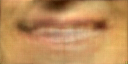

In [ ]:
from google.colab.patches import cv2_imshow
cv2_imshow(x_norm[0])

In [ ]:
np.max(x_norm)

255.0

In [ ]:
metric = tensorflow.keras.metrics.Accuracy()
metric.update_state(xtest*255.0,predY*255.0)
metric.result().numpy()

0.0

In [ ]:
true_values = np.array(xtest)
predictions = np.array(predY)

N = true_values.shape[1]
accuracy = (true_values == predictions).sum() / N
TP = ((predictions == 1) & (true_values == 1)).sum()
FP = ((predictions == 1) & (true_values == 0)).sum()
precision = TP / (TP+FP)

<ipython-input-28-8a797f1eb40d>:8: RuntimeWarning: invalid value encountered in long_scalars
  precision = TP / (TP+FP)


In [ ]:
true_values.shape

(40, 64, 128, 3)

In [ ]:
history = model.fit(xtrain,ytrain, batch_size=64,
               steps_per_epoch=xtrain.shape[0]/64,
               epochs=5000,
               verbose=2,
               callbacks=[anne, checkpoint],
               validation_split = 0.1)

Streaming output truncated to the last 5000 lines.
Epoch 3751/5000

Epoch 3751: val_loss did not improve from 1258.60291
3/3 - 0s - loss: 1341.6891 - accuracy: 0.6920 - val_loss: 1259.4441 - val_accuracy: 0.6400 - lr: 0.0010 - 307ms/epoch - 79ms/step
Epoch 3752/5000

Epoch 3752: val_loss did not improve from 1258.60291
3/3 - 0s - loss: 1341.7415 - accuracy: 0.6741 - val_loss: 1259.4033 - val_accuracy: 0.6400 - lr: 0.0010 - 311ms/epoch - 80ms/step
Epoch 3753/5000

Epoch 3753: val_loss did not improve from 1258.60291
3/3 - 0s - loss: 1341.7178 - accuracy: 0.6696 - val_loss: 1259.3414 - val_accuracy: 0.6400 - lr: 0.0010 - 282ms/epoch - 72ms/step
Epoch 3754/5000

Epoch 3754: val_loss did not improve from 1258.60291
3/3 - 0s - loss: 1341.8707 - accuracy: 0.6161 - val_loss: 1259.3386 - val_accuracy: 0.6400 - lr: 0.0010 - 309ms/epoch - 80ms/step
Epoch 3755/5000

Epoch 3755: val_loss did not improve from 1258.60291
3/3 - 0s - loss: 1341.4025 - accuracy: 0.6607 - val_loss: 1259.2538 - val_accur

In [ ]:
model.save_weights(checkpoint_path)